# Macroscopic observables

In this notebook we'll explore how we can measure different macroscopic observables from molecular dynamics simulations.

## Velocity distribution

We'll start by exploring how the velocity distribution of Argon particles develop in time starting from a an unphysical uniform distribution. According to the central limit theorem the velocity distrbituion should go to a Maxwell-Boltzmann distribution.

In [52]:
import os
import sys
import re

sys.path.append("..")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from read_lammps_dump import read_dump

sns.set(color_codes=True)

In [85]:
num_omp_threads = 4
num_mpi_processes = 4

script_path = "scripts"
dat_path = "dat"
dump_extension = ".lammpstrj"
script_extension = ".in"
log_extension = ".log"

In [87]:
%env OMP_NUM_THREADS=$num_omp_threads
%env NUM_MPI_PROCESSES=$num_mpi_processes
%env SCRIPT_PATH=$script_path
%env DAT_PATH=$dat_path
%env DUMP_EXTENSION=$dump_extension
%env SCRIPT_EXTENSION=$script_extension
%env LOG_EXTENSION=$log_extension

env: OMP_NUM_THREADS=4
env: NUM_MPI_PROCESSES=4
env: SCRIPT_PATH=scripts
env: DAT_PATH=dat
env: DUMP_EXTENSION=.lammpstrj
env: SCRIPT_EXTENSION=.in
env: LOG_EXTENSION=.log


In [89]:
velocity_filename = "uniform"
velocity_script = os.path.join(script_path, velocity_filename + script_extension)
velocity_dump = os.path.join(dat_path, velocity_filename + dump_extension)

We use Lammps to simulate the molecular dynamics system. Below we create a `.in`-file which Lammps uses to run a simulation.

In [91]:
velocity_filename = "uniform"
velocity_script = os.path.join(script_path, velocity_filename + script_extension)
velocity_dump = os.path.join(dat_path, velocity_filename + dump_extension)

In [92]:
%%writefile $velocity_script

# 3d Lennard-Jones gas
units lj
dimension 3
# Periodic boundiaries
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 20 0 20 0 20
create_box 1 simbox
create_atoms 1 box

mass 1 1.0
velocity all create 2.5 87287 dist uniform

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

dump 1 all custom 10 ${dump_name} id type x y z vx vy vz
thermo 100
run 5000

Overwriting scripts/uniform.in


In [117]:
!mpirun -np $num_mpi_processes lmp -in $velocity_script \
    -var dump_name $velocity_dump

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (147.361 147.361 147.361)
  1 by 2 by 2 MPI processor grid
Created 32000 atoms
  Time spent = 0.00228878 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 90 90 90
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.005
Per MPI rank memory allocation (min/avg/max) = 8.49 | 8.49 | 8.49 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7498828  0.024999219 
     100    2.5004149 -0.0010394834  

We proceed to run the simulation by passing the Lammps config file to the Lammps executable.

Lammps creates a file called `uniform.lammpstrj` with the position of all the atoms at every $N$'th time step. We read this into a `pandas` `DataFrame` in order to analyse the results.

In [118]:
df, num_atoms, bounds = read_dump(velocity_dump)

Inspecting the 5 first and last rows to check that everything is okay.

In [119]:
df.head()

,id,type,x,y,z,vx,vy,vz,timestep
0,1,1,0.00000,0.00000,0.00000,1.013020,0.194801,0.138771,0
1,2,1,3.68403,3.68403,0.00000,-1.673840,0.826244,-1.131720,0
2,3,1,3.68403,0.00000,3.68403,-0.633593,-2.411290,1.367270,0
3,4,1,0.00000,3.68403,3.68403,0.220096,1.331590,-1.096720,0
4,5,1,7.36806,0.00000,0.00000,-0.146018,1.056760,0.050760,0


In [120]:
df.tail()

,id,type,x,y,z,vx,vy,vz,timestep
16031995,31996,1,132.8560,37.22080,15.73670,1.852340,3.519550,-0.765361,5000
16031996,31997,1,120.1950,89.51820,50.15320,-1.052400,-0.689569,-2.870400,5000
16031997,31998,1,14.2062,9.04787,102.55200,-0.682927,-0.092327,-1.266210,5000
16031998,31999,1,40.3668,145.19500,4.75542,1.804220,-0.427913,0.007571,5000
16031999,32000,1,118.9060,146.56200,28.41280,-0.469721,-1.489710,1.732850,5000


The simulation we've run is run for $N$ particles, $n$ timesteps and a simulation box with sides $[0, L)$.

In [121]:
n = df.loc[len(df) - 1, "timestep"]
num_timesteps = n // 10
sigma = 3.405 # Ångström
L = bounds[0][1] * sigma

print(f"N = {num_atoms}")
print(f"n = {n}")
print(f"L = {L} Ångström")

N = 32000
n = 5000
L = 501.76509011482057 Ångström


## Adding velocity magnitude

From the simulation we have the velocity components $\mathbf{v}_i = (v_i^x, v_i^y, v_i^z)$ for every particle $i$. Initially they are in a uniform distribution with boundaries $v_i^j \in [-2.5, 2.5]$. The uniform distribution will be evident in the histogram plots for the velocity components. To better see the Maxwell-Boltzmann distribution we add the velocity magnitude of a particle by
\begin{align}
    v_i = |\mathbf{v}_i| = \sqrt{{v_i^x}^2 + {v_i^y}^2 + {v_i^z}^2},
\end{align}
as the cartesian components will look like Gaussians in a Maxwell-Boltzmann distribution.

In [122]:
df["v"] = np.sqrt(
    df["vx"] ** 2
    + df["vy"] ** 2
    + df["vz"] ** 2
)

We start by visualizing the initial velocity distribution. We expect this to be a uniform velocity distribution as we set the velocity to be uniform initially. However, the uniformity is only located in the cartesian components.

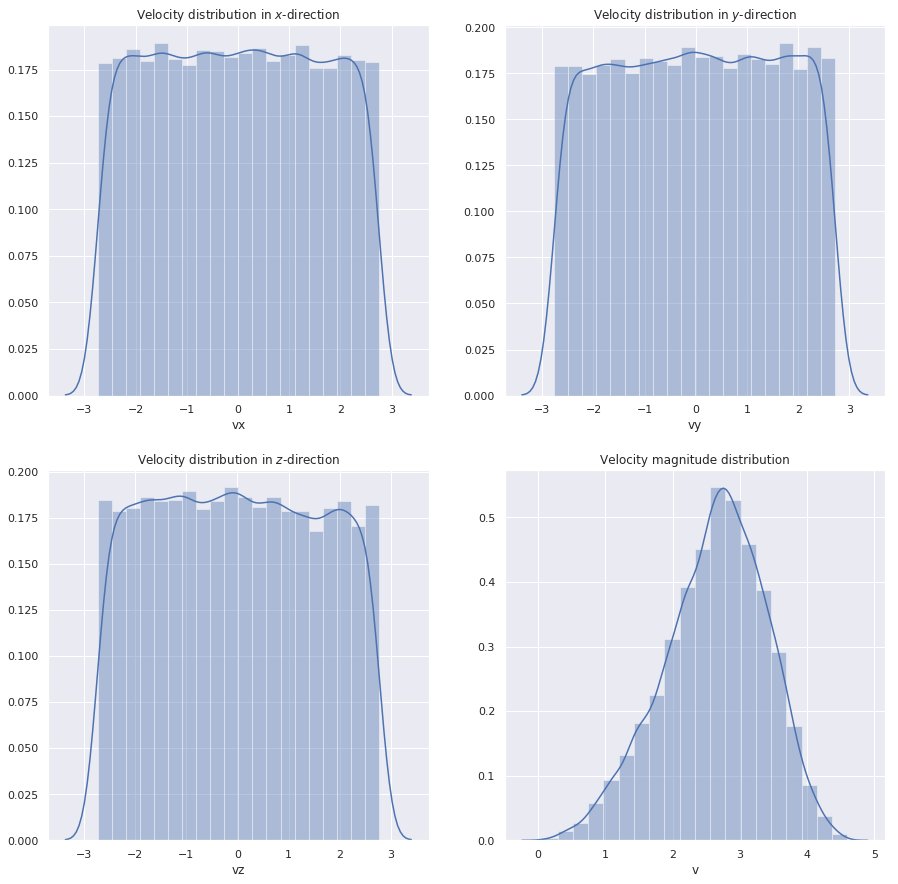

In [123]:
num_bins = 20

fig = plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
sns.distplot(df.iloc[:num_atoms].vx, bins=num_bins)
plt.title(r"Velocity distribution in $x$-direction")

plt.subplot(2, 2, 2)
sns.distplot(df.iloc[:num_atoms].vy, bins=num_bins)
plt.title(r"Velocity distribution in $y$-direction")

plt.subplot(2, 2, 3)
sns.distplot(df.iloc[:num_atoms].vz, bins=num_bins)
plt.title(r"Velocity distribution in $z$-direction")

plt.subplot(2, 2, 4)
sns.distplot(df.iloc[:num_atoms].v, bins=num_bins)
plt.title(r"Velocity magnitude distribution")

plt.show()

Here we can see the initial velocity distribution for each component and the velocity magnitude. The cartesian components clearly show the shape of a uniform distribution in the interval $[-2.5, 2.5]$. We proceed by inspecting the final time step which we expect to take on the shape of a Maxwell-Boltzmann distribution.

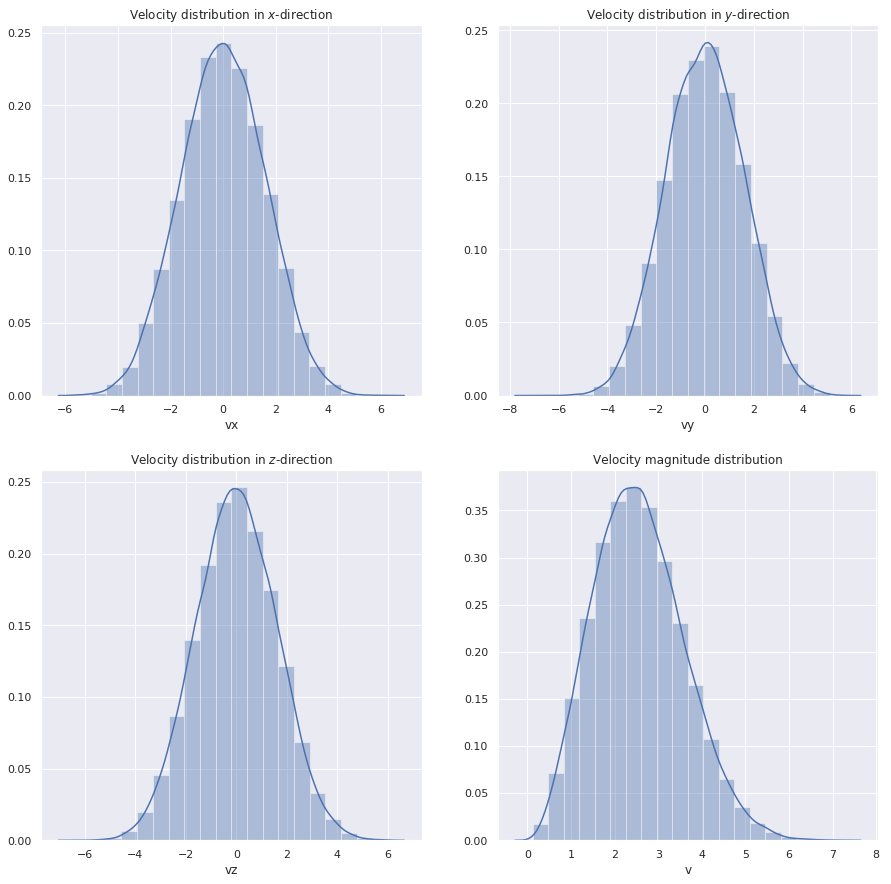

In [124]:
fig = plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
sns.distplot(df.iloc[num_timesteps * num_atoms:].vx, bins=num_bins)
plt.title(r"Velocity distribution in $x$-direction")

plt.subplot(2, 2, 2)
sns.distplot(df.iloc[num_timesteps * num_atoms:].vy, bins=num_bins)
plt.title(r"Velocity distribution in $y$-direction")

plt.subplot(2, 2, 3)
sns.distplot(df.iloc[num_timesteps * num_atoms:].vz, bins=num_bins)
plt.title(r"Velocity distribution in $z$-direction")

plt.subplot(2, 2, 4)
sns.distplot(df.iloc[num_timesteps * num_atoms:].v, bins=num_bins)
plt.title(r"Velocity magnitude distribution")

plt.show()

In these plots we see the expected normal distribution for the cartesian components, whereas the velocity magnitude shows the behaviour of a radial Maxwell-Boltzmann distribution.

## Quantizing the time it takes to reach the Maxwell-Boltzmann distribution

In order to determine how long time (or how many timesteps) it takes for the system to reach a Maxwell-Boltzmann distribution, we compute the normalized overlap between the histograms at every timestep with the final histogram. That is, the overlap $o_i$ is given by
\begin{align}
        o_i = \frac{\langle h_i, h_{n} \rangle}{\sqrt{\langle h_i, h_i \rangle \langle h_n, h_n \rangle}},
\end{align}

where the denominator is included to normalize the overlap.

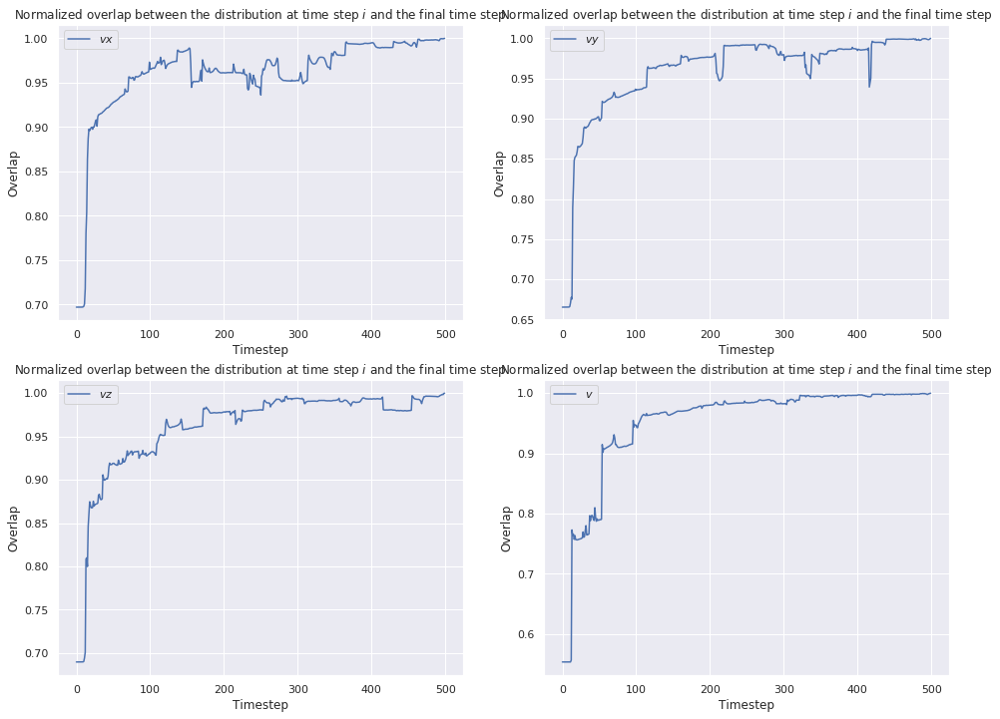

In [125]:
fig = plt.figure(figsize=(16, 12))
timesteps = np.arange(num_timesteps)
last_slice = slice((num_timesteps - 1) * num_atoms, num_timesteps * num_atoms)
overlap = np.zeros((4, num_timesteps))
num_bins = 100

for o_i, v in enumerate(["vx", "vy", "vz", "v"]):
    last_hist, bins = np.histogram(df.loc[last_slice, v], bins=num_bins)
    #last_hist = np.sort(last_hist)
    norm = np.sqrt(np.dot(last_hist, last_hist))

    for i in range(num_timesteps):
        t_i = slice(i * num_atoms, (i + 1) * num_atoms)
        hist, bins = np.histogram(df.loc[t_i, v], bins=num_bins)
        #hist = np.sort(hist)
        norm_i = np.sqrt(np.dot(hist, hist))
        overlap[o_i, i] = np.dot(hist, last_hist) / (norm * norm_i)

    plt.subplot(2, 2, o_i + 1)
    plt.plot(timesteps, overlap[o_i], label=fr"${v}$")
    plt.xlabel(r"Timestep")
    plt.ylabel(r"Overlap")
    plt.legend(loc="best")
    plt.title(r"Normalized overlap between the distribution at time step $i$ and the final time step")

plt.show()

In this figure we can see how both the mean velocity, i.e., the mean of the three cartesian components, and the velocity magnitude moves toward the final distribution which resembles the Maxwell-Boltzmann distribution.

## Energy conservation

As we are modelling an "infinite" system, that is, we use periodic boundary conditions, and there are no external forces applied, we expect the total energy of the system to be conserved throughout the simulation. However, there are a few discreptancies to this; first, the initial system is unphysical thus we need to let the system thermalize a little while before we call it a "physical" representation of nature. Second, if we use a too large time step $\Delta t$ Lammps might not be able to stop the system from behaving in an anomalous manner. We'll explore both of these trends in the following.

We'll begin by creating a script which sets up an initial distribution and runs for a given time step $\Delta t$ and a fixed amount of time $T$.

In [68]:
energy_filename = "energy_conservation"
energy_script = os.path.join(script_path, energy_filename + script_extension)

In [67]:
%%writefile $energy_script
# 3d Lennard-Jones gas
units lj
timestep ${timestep}
dimension 3
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 10 0 10 0 10
create_box 1 simbox
create_atoms 1 box

mass 1 1.0
velocity all create 2.5 87287 dist uniform

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

#dump 1 all custom 10 dump.lammpstrj id type x y z vx vy vz
log ${filename}
thermo 10
run ${num_steps}

Overwriting scripts/energy_conservation.in


This file does not output a dump, but rather uses Lammps' logging functionality to keep track of the energy at every time step. We use Lammps and a bash script to fill in the placeholder variables.

In [134]:
%env ENERGY_SCRIPT=$energy_script
%env ENERGY_FILENAME=$energy_filename

env: ENERGY_SCRIPT=scripts/energy_conservation.in
env: ENERGY_FILENAME=energy_conservation


In [143]:
%%writefile repeat_experiment.sh

for i in $(seq 2 5); do
    echo For i = $i we get dt = $(python -c "print('%f' % 10 ** (-$i))")
    echo $(python -c "print(__import__('math').ceil(10 / 10 ** (-$i)))")
    mpirun -np $NUM_MPI_PROCESSES lmp \
        -var timestep $(python -c "print('%f' % 10 ** (-$i))") \
        -var filename $DAT_PATH/"$ENERGY_FILENAME"_$i$LOG_EXTENSION \
        -var num_steps $(python -c "print(__import__('math').ceil(10 / 10 ** (-$i)))") \
        < $ENERGY_SCRIPT
done

Overwriting repeat_experiment.sh


Next we run the shell script running the simulation for $\Delta t \in [0.01, 0.001, 0.0001, 0.00001]$.

In [144]:
!bash repeat_experiment.sh

For i = 2 we get dt = 0.010000
1000
LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (73.6806 73.6806 73.6806)
  1 by 2 by 2 MPI processor grid
Created 4000 atoms
  Time spent = 0.00111887 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 45 45 45
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 5.859 | 5.859 | 5.859 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7490625   0.02499375 


For i = 3 we get dt = 0.001000
10000
LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (73.6806 73.6806 73.6806)
  1 by 2 by 2 MPI processor grid
Created 4000 atoms
  Time spent = 0.000618833 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 45 45 45
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.001
Per MPI rank memory allocation (min/avg/max) = 5.859 | 5.859 | 5.859 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7490625   0.0249937

    1070    2.5201378 -0.032375141            0    3.7468865  0.025662351 
    1080    2.5201215 -0.032378038            0    3.7468591  0.025665381 
    1090    2.5205717 -0.033101161            0    3.7468111  0.025631037 
    1100    2.5213664 -0.034316244            0    3.7467878  0.025568327 
    1110    2.5223645  -0.03583097            0      3.74677  0.025487415 
    1120    2.5233873 -0.037379969            0    3.7467548  0.025401576 
    1130    2.5242295  -0.03866344            0    3.7467342  0.025325373 
    1140    2.5247707 -0.039485917            0    3.7467234  0.025268317 
    1150    2.5251011 -0.040008647            0    3.7466961  0.025226453 
    1160    2.5253577  -0.04039891            0    3.7466907  0.025193802 
    1170    2.5255462 -0.040700781            0    3.7466714  0.025169976 
    1180    2.5256071 -0.040818218            0    3.7466453  0.025159075 
    1190    2.5254859 -0.040651627            0    3.7466302  0.025164859 
    1200    2.5251648 -0.

    2530    2.5345855 -0.054878515            0    3.7460492  0.025250594 
    2540    2.5351347 -0.055694016            0    3.7460574  0.025205574 
    2550    2.5354527  -0.05617432            0    3.7460539  0.025171987 
    2560    2.5360203 -0.057030963            0    3.7460485  0.025125115 
    2570    2.5368382  -0.05826521            0    3.7460407  0.025067489 
    2580    2.5371484 -0.058722831            0    3.7460484  0.025044508 
    2590    2.5364932 -0.057750702            0    3.7460379  0.025082102 
    2600    2.5354041 -0.056116409            0     3.746039  0.025149159 
    2610    2.5349313 -0.055407658            0    3.7460387  0.025184059 
    2620    2.5349715 -0.055479863            0    3.7460268  0.025190822 
    2630    2.5347439 -0.055136107            0    3.7460292  0.025213711 
    2640    2.5339962 -0.054027829            0    3.7460162  0.025265736 
    2650    2.5333978 -0.053117707            0     3.746029  0.025308614 
    2660    2.5333572 -0.

    4100    2.5349683 -0.055453633            0    3.7460483  0.025357355 
    4110    2.5359953 -0.056995352            0    3.7460466   0.02527087 
    4120    2.5359195 -0.056881467            0    3.7460469  0.025251511 
    4130    2.5349405 -0.055413957            0    3.7460461  0.025288328 
    4140    2.5337898 -0.053691488            0    3.7460431  0.025336974 
    4150    2.5334541 -0.053202919            0    3.7460282  0.025338654 
    4160    2.5340833 -0.054162356            0    3.7460123  0.025284416 
    4170    2.5349335 -0.055418696            0    3.7460309  0.025219088 
    4180    2.5353442 -0.056039009            0    3.7460266  0.025182458 
    4190    2.5350193 -0.055552937            0    3.7460254  0.025193851 
    4200    2.5342286 -0.054358163            0    3.7460343  0.025237714 
    4210    2.5336704 -0.053523795            0    3.7460317  0.025272555 
    4220    2.5335192 -0.053301661            0     3.746027  0.025286949 
    4230    2.5333825 -0.

    5260    2.5377837 -0.059763862            0      3.74596  0.025122796 
    5270    2.5377975 -0.059772016            0    3.7459726  0.025096561 
    5280    2.5376781 -0.059584447            0    3.7459811  0.025085481 
    5290    2.5376137 -0.059479987            0    3.7459889  0.025079187 
    5300    2.5373414 -0.059070702            0    3.7459899  0.025091728 
    5310     2.536669 -0.058062022            0    3.7459903   0.02513243 
    5320    2.5359957 -0.057064051            0    3.7459786   0.02517599 
    5330    2.5359707 -0.057013906            0    3.7459911   0.02518429 
    5340     2.536748 -0.058183228            0    3.7459875  0.025147847 
    5350    2.5375082 -0.059321207            0    3.7459896  0.025114908 
    5360    2.5376146 -0.059474756            0    3.7459955  0.025123309 
    5370    2.5373557  -0.05909299            0    3.7459891  0.025157318 
    5380    2.5371174 -0.058734234            0    3.7459904  0.025194743 
    5390     2.536868 -0.

    6430    2.5347011 -0.055125709            0    3.7459754  0.025273498 
    6440    2.5347214 -0.055142048            0    3.7459895  0.025256708 
    6450    2.5351717 -0.055813348            0    3.7459935  0.025212537 
    6460    2.5359655 -0.057018999            0    3.7459782  0.025147376 
    6470    2.5367913 -0.058260386            0    3.7459752  0.025082252 
    6480    2.5373665 -0.059117726            0    3.7459806  0.025036019 
    6490    2.5375657 -0.059410474            0    3.7459865  0.025017438 
    6500    2.5377448 -0.059669197            0    3.7459964   0.02500786 
    6510    2.5381299 -0.060243187            0    3.7459998  0.024995763 
    6520    2.5381586 -0.060282947            0    3.7460032   0.02501399 
    6530    2.5372254   -0.0588863            0    3.7460004  0.025096222 
    6540    2.5354488 -0.056223955            0    3.7459985  0.025232495 
    6550    2.5338201 -0.053771356            0    3.7460085  0.025361586 
    6560     2.533062  -0

    7660    2.5384811 -0.060774809            0     3.745995  0.025112226 
    7670    2.5382345 -0.060400687            0    3.7459992  0.025121642 
    7680      2.53832 -0.060534687            0    3.7459934  0.025115416 
    7690    2.5385354 -0.060856492            0    3.7459947  0.025105755 
    7700    2.5386951 -0.061099025            0    3.7459916  0.025104338 
    7710    2.5385387 -0.060852337            0    3.7460037  0.025127222 
    7720    2.5379205 -0.059920817            0    3.7460083  0.025181782 
    7730    2.5372142 -0.058865746            0    3.7460041  0.025245949 
    7740    2.5364411 -0.057712339            0    3.7459982  0.025316285 
    7750    2.5353671 -0.056100089            0    3.7459999  0.025402635 
    7760    2.5343432 -0.054584342            0    3.7459801  0.025480588 
    7770    2.5341123 -0.054230814            0    3.7459873  0.025505707 
    7780    2.5350564 -0.055660774            0    3.7459732  0.025454519 
    7790    2.5367455 -0.

    8800    2.5360499 -0.057179876            0     3.745944  0.025320149 
    8810     2.536144  -0.05732643            0    3.7459385  0.025326114 
    8820    2.5363462 -0.057655954            0    3.7459122  0.025324482 
    8830    2.5365139 -0.057904784            0    3.7459149  0.025325272 
    8840    2.5365452 -0.057949273            0    3.7459173   0.02533487 
    8850    2.5361104 -0.057287741            0    3.7459268  0.025371919 
    8860    2.5351823 -0.055899383            0    3.7459233   0.02543593 
    8870    2.5343795 -0.054686823            0     3.745932  0.025490202 
    8880    2.5341229 -0.054308283            0    3.7459258  0.025508544 
    8890    2.5338529 -0.053910645            0    3.7459185  0.025520945 
    8900    2.5332697 -0.053029473            0    3.7459251   0.02554289 
    8910    2.5333692 -0.053180697            0     3.745923  0.025517518 
    8920    2.5346638 -0.055115149            0    3.7459301  0.025418048 
    8930    2.5360832 -0.

For i = 4 we get dt = 0.000100
100000
LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (73.6806 73.6806 73.6806)
  1 by 2 by 2 MPI processor grid
Created 4000 atoms
  Time spent = 0.00139626 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 45 45 45
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.0001
Per MPI rank memory allocation (min/avg/max) = 5.859 | 5.859 | 5.859 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7490625   0.024993

    1280          2.5            0            0    3.7490625   0.02499375 
    1290          2.5            0            0    3.7490625   0.02499375 
    1300          2.5            0            0    3.7490625   0.02499375 
    1310          2.5            0            0    3.7490625   0.02499375 
    1320          2.5            0            0    3.7490625   0.02499375 
    1330          2.5            0            0    3.7490625   0.02499375 
    1340          2.5            0            0    3.7490625   0.02499375 
    1350          2.5            0            0    3.7490625   0.02499375 
    1360          2.5            0            0    3.7490625   0.02499375 
    1370          2.5            0            0    3.7490625   0.02499375 
    1380          2.5            0            0    3.7490625   0.02499375 
    1390          2.5            0            0    3.7490625   0.02499375 
    1400          2.5            0            0    3.7490625   0.02499375 
    1410          2.5    

    2480          2.5            0            0    3.7490625   0.02499375 
    2490          2.5            0            0    3.7490625   0.02499375 
    2500          2.5            0            0    3.7490625   0.02499375 
    2510          2.5            0            0    3.7490625   0.02499375 
    2520          2.5            0            0    3.7490625   0.02499375 
    2530          2.5            0            0    3.7490625   0.02499375 
    2540          2.5            0            0    3.7490625   0.02499375 
    2550          2.5            0            0    3.7490625   0.02499375 
    2560          2.5            0            0    3.7490625   0.02499375 
    2570          2.5            0            0    3.7490625   0.02499375 
    2580          2.5            0            0    3.7490625   0.02499375 
    2590          2.5            0            0    3.7490625   0.02499375 
    2600          2.5            0            0    3.7490625   0.02499375 
    2610          2.5    

    3970    2.5000248 -0.00010296917            0    3.7489967  0.024991944 
    3980    2.5000257 -0.00010706143            0     3.748994  0.024991871 
    3990    2.5000266 -0.00010982614            0    3.7489926  0.024991825 
    4000    2.5000276 -0.00011263381            0    3.7489913  0.024991779 
    4010    2.5000286 -0.00011547209            0    3.7489899  0.024991732 
    4020    2.5000296 -0.00011835102            0    3.7489885  0.024991685 
    4030    2.5000306 -0.00012263517            0    3.7489858   0.02499161 
    4040    2.5000317 -0.00012422474            0    3.7489858  0.024991589 
    4050    2.5000328 -0.00013136054            0    3.7489803  0.024991457 
    4060    2.5000339 -0.00013305737            0    3.7489803  0.024991435 
    4070    2.5000351 -0.00013752409            0    3.7489776  0.024991357 
    4080    2.5000363 -0.00014205302            0    3.7489748  0.024991279 
    4090    2.5000375 -0.00014526708            0    3.7489735  0.024991227 

    5800    2.5020121 -0.0037379346            0     3.748342  0.024946344 
    5810    2.5020476 -0.0037952211            0    3.7483379  0.024946027 
    5820    2.5020833 -0.0038569693            0    3.7483296  0.024945659 
    5830    2.5021192 -0.0039149063            0    3.7483255  0.024945408 
    5840    2.5021552 -0.0039702951            0    3.7483242  0.024945251 
    5850    2.5021913 -0.0040271469            0    3.7483214  0.024945111 
    5860    2.5022273 -0.0040853725            0    3.7483173  0.024944994 
    5870    2.5022634 -0.0041421079            0    3.7483146  0.024944959 
    5880    2.5022992 -0.004204088            0    3.7483063  0.024944877 
    5890    2.5023348 -0.0042615562            0    3.7483022  0.024944946 
    5900      2.50237 -0.004318448            0    3.7482981  0.024945092 
    5910    2.5024047 -0.0043704489            0    3.7482981  0.024945405 
    5920    2.5024387 -0.0044269307            0    3.7482927  0.024945704 
    5930    2.

    7590    2.5078644 -0.013225205            0     3.747631  0.025386504 
    7600    2.5079605 -0.013373437            0    3.7476269  0.025386242 
    7610    2.5080619 -0.013528167            0    3.7476242  0.025385721 
    7620    2.5081685 -0.013689429            0    3.7476228  0.025384942 
    7630    2.5082804 -0.013859929            0      3.74762  0.025383854 
    7640    2.5083974 -0.014036786            0    3.7476187  0.025382517 
    7650    2.5085194 -0.014221128            0    3.7476173  0.025380917 
    7660    2.5086462 -0.014413992            0    3.7476146  0.025379042 
    7670    2.5087774 -0.014613537            0    3.7476118  0.025376937 
    7680    2.5089127 -0.014816455            0    3.7476118  0.025374682 
    7690    2.5090517 -0.015028904            0    3.7476077  0.025372169 
    7700    2.5091937 -0.015245978            0    3.7476036  0.025369513 
    7710    2.5093382 -0.015469527            0    3.7475968  0.025366693 
    7720    2.5094845 -0.

    9160    2.5190411 -0.030372379            0    3.7472447  0.025490574 
    9170    2.5192981 -0.030760443            0     3.747242  0.025473674 
    9180    2.5195487 -0.031134963            0    3.7472433  0.025457221 
    9190    2.5197924 -0.031501712            0     3.747242  0.025441126 
    9200    2.5200284 -0.031855629            0     3.747242  0.025425513 
    9210    2.5202562 -0.032202759            0    3.7472365  0.025410281 
    9220    2.5204754 -0.032535606            0    3.7472324  0.025395597 
    9230    2.5206857 -0.032852228            0     3.747231  0.025381516 
    9240    2.5208866  -0.03315493            0    3.7472296  0.025368005 
    9250     2.521078  -0.03344752            0    3.7472241  0.025354997 
    9260    2.5212599 -0.033724333            0      3.74722  0.025342613 
    9270    2.5214321 -0.033983901            0    3.7472187   0.02533089 
    9280    2.5215946  -0.03422898            0    3.7472173  0.025319776 
    9290    2.5217475 -0.

   10990    2.5212758 -0.034179657            0    3.7467885  0.025575588 
   11000     2.521367 -0.034316486            0    3.7467885  0.025568342 
   11010    2.5214603 -0.034457789            0    3.7467872  0.025560884 
   11020    2.5215556 -0.034603331            0    3.7467844  0.025553224 
   11030    2.5216525 -0.034752852            0    3.7467803  0.025545377 
   11040    2.5217511 -0.034900611            0    3.7467803  0.025537463 
   11050     2.521851 -0.035051833            0     3.746779  0.025529388 
   11060    2.5219521 -0.035202149            0    3.7467803  0.025521245 
   11070    2.5220543 -0.035353997            0    3.7467817  0.025512995 
   11080    2.5221573 -0.035515334            0    3.7467748  0.025504487 
   11090     2.522261 -0.035672187            0    3.7467735  0.025496008 
   11100    2.5223652 -0.035831136            0    3.7467707  0.025487436 
   11110    2.5224696 -0.035986398            0    3.7467721  0.025478894 
   11120    2.5225741 -0.

   12520    2.5239734 -0.038449697            0    3.7465639  0.025323364 
   12530    2.5239443  -0.03840609            0    3.7465639  0.025326585 
   12540    2.5239141  -0.03836628            0    3.7465584  0.025329767 
   12550    2.5238832 -0.038322691            0    3.7465557   0.02533305 
   12560     2.523852 -0.038273172            0    3.7465584  0.025336465 
   12570    2.5238209 -0.038225192            0    3.7465598  0.025339852 
   12580    2.5237903 -0.038179301            0    3.7465598  0.025343189 
   12590    2.5237606 -0.038131919            0    3.7465625  0.025346538 
   12600    2.5237319 -0.038087639            0    3.7465639  0.025349796 
   12610    2.5237048 -0.038045509            0    3.7465653  0.025352976 
   12620    2.5236793  -0.03800725            0    3.7465653  0.025356035 
   12630    2.5236556 -0.037975915            0    3.7465611  0.025358904 
   12640     2.523634 -0.037946288            0    3.7465584  0.025361683 
   12650    2.5236147 -0.

   14010    2.5277875 -0.044299542            0    3.7464337  0.025206333 
   14020    2.5278444 -0.044386237            0    3.7464324  0.025204296 
   14030       2.5279 -0.044469663            0    3.7464324  0.025202413 
   14040     2.527954 -0.044553449            0    3.7464296  0.025200621 
   14050    2.5280062 -0.044634359            0    3.7464269  0.025198994 
   14060     2.528056 -0.044710515            0    3.7464255   0.02519758 
   14070    2.5281033 -0.044781448            0    3.7464255  0.025196396 
   14080    2.5281478 -0.044846707            0    3.7464269  0.025195459 
   14090    2.5281891 -0.044905906            0    3.7464296  0.025194786 
   14100     2.528227 -0.044961456            0     3.746431  0.025194335 
   14110    2.5282615 -0.045019935            0    3.7464242  0.025193978 
   14120    2.5282922 -0.045063358            0    3.7464269  0.025194079 
   14130    2.5283193 -0.045105292            0    3.7464255   0.02519437 
   14140    2.5283426 -0.

   15630    2.5277227 -0.044255766            0    3.7463803  0.025700756 
   15640    2.5276595 -0.044161084            0    3.7463803  0.025706495 
   15650    2.5276007 -0.044068753            0    3.7463844  0.025712002 
   15660    2.5275461 -0.043986923            0    3.7463844   0.02571711 
   15670    2.5274958 -0.043914186            0    3.7463817  0.025721846 
   15680    2.5274497 -0.043846478            0    3.7463803  0.025726287 
   15690     2.527408 -0.043788041            0    3.7463762  0.025730344 
   15700    2.5273708 -0.043732183            0    3.7463762  0.025734146 
   15710    2.5273381 -0.043684623            0    3.7463748  0.025737574 
   15720    2.5273103 -0.043644234            0    3.7463735  0.025740643 
   15730    2.5272874 -0.043612638            0    3.7463707  0.025743316 
   15740    2.5272696 -0.043588713            0     3.746368  0.025745611 
   15750    2.5272571 -0.043575348            0    3.7463625  0.025747467 
   15760    2.5272498 -0.

   17010      2.53231 -0.051254262            0    3.7462611  0.025271227 
   17020    2.5323411 -0.051300936            0    3.7462611  0.025267991 
   17030    2.5323723 -0.051348985            0    3.7462598  0.025264772 
   17040    2.5324027 -0.051393269            0    3.7462611   0.02526169 
   17050    2.5324318 -0.051436854            0    3.7462611  0.025258701 
   17060    2.5324588 -0.051477364            0    3.7462611  0.025255871 
   17070    2.5324831 -0.051513877            0    3.7462611  0.025253235 
   17080    2.5325042 -0.051550998            0    3.7462557  0.025250716 
   17090    2.5325216 -0.051577007            0    3.7462557  0.025248561 
   17100    2.5325348 -0.051598149            0    3.7462543  0.025246657 
   17110    2.5325435  -0.05161395            0    3.7462516   0.02524502 
   17120    2.5325475 -0.051619965            0    3.7462516  0.025243746 
   17130    2.5325467  -0.05161877            0    3.7462516  0.025242787 
   17140    2.5325411  -0

   18310    2.5283358 -0.045349199            0    3.7462064  0.025587112 
   18320    2.5284738 -0.045557527            0     3.746205  0.025580333 
   18330    2.5286159 -0.045771965            0    3.7462036  0.025573248 
   18340    2.5287587 -0.045987507            0    3.7462022  0.025566046 
   18350    2.5288991 -0.046200771            0    3.7461995  0.025558878 
   18360    2.5290341  -0.04639784            0     3.746205  0.025552102 
   18370    2.5291613 -0.046587171            0    3.7462063  0.025545619 
   18380    2.5292783 -0.046758564            0    3.7462105  0.025539695 
   18390    2.5293834 -0.046916073            0    3.7462104  0.025534301 
   18400    2.5294749 -0.047050634            0    3.7462132   0.02552966 
   18410    2.5295519 -0.047167456            0    3.7462118  0.025525703 
   18420    2.5296136 -0.047261296            0    3.7462104  0.025522556 
   18430    2.5296595 -0.047328803            0    3.7462118  0.025520302 
   18440    2.5296896 -0.

   19700     2.531266 -0.049739341            0    3.7462105  0.025301323 
   19710    2.5313445 -0.049859773            0    3.7462077  0.025295339 
   19720    2.5314297 -0.049992976            0    3.7462022   0.02528892 
   19730     2.531521 -0.050132739            0    3.7461995  0.025282205 
   19740     2.531618 -0.050282261            0    3.7461954  0.025275149 
   19750    2.5317199  -0.05043501            0    3.7461954  0.025267903 
   19760    2.5318258 -0.050596649            0    3.7461927  0.025260377 
   19770     2.531935 -0.050760426            0    3.7461927  0.025252729 
   19780    2.5320467 -0.050925066            0    3.7461954  0.025245012 
   19790    2.5321598 -0.051097461            0    3.7461927  0.025237113 
   19800    2.5322736 -0.051268072            0    3.7461927   0.02522925 
   19810    2.5323871 -0.051431539            0    3.7461995  0.025221553 
   19820    2.5324997 -0.051603088            0    3.7461968  0.025213744 
   19830    2.5326105 -0.

   21140    2.5319366 -0.050777813            0    3.7461776  0.025343543 
   21150     2.532072 -0.050979444            0     3.746179   0.02533454 
   21160    2.5322101 -0.051182445            0    3.7461831  0.025325383 
   21170    2.5323505 -0.051394487            0    3.7461817  0.025315934 
   21180    2.5324931 -0.051605492            0    3.7461844  0.025306407 
   21190    2.5326374 -0.051819164            0    3.7461872  0.025296741 
   21200    2.5327832 -0.052037867            0    3.7461872  0.025286901 
   21210    2.5329304 -0.052253029            0    3.7461927  0.025277071 
   21220    2.5330786 -0.052475265            0    3.7461927   0.02526705 
   21230    2.5332276 -0.052697381            0     3.746194  0.025256993 
   21240    2.5333772  -0.05292043            0    3.7461954   0.02524689 
   21250    2.5335272 -0.053145389            0    3.7461954  0.025236734 
   21260    2.5336774  -0.05337328            0    3.7461927  0.025226518 
   21270    2.5338273 -0.

   22630    2.5338789 -0.053689258            0    3.7461789  0.025380207 
   22640    2.5338714 -0.053676624            0    3.7461803  0.025381708 
   22650    2.5338515 -0.053650872            0    3.7461762  0.025383796 
   22660     2.533819 -0.053603446            0    3.7461748  0.025386646 
   22670    2.5337738 -0.053542549            0     3.746168  0.025390095 
   22680    2.5337161 -0.053456034            0     3.746168  0.025394378 
   22690    2.5336462  -0.05335126            0     3.746168  0.025399335 
   22700    2.5335648 -0.053230439            0    3.7461666  0.025404905 
   22710    2.5334724 -0.053090606            0     3.746168  0.025411124 
   22720    2.5333702 -0.052938746            0    3.7461666  0.025417822 
   22730    2.5332594 -0.052769838            0    3.7461694  0.025425064 
   22740    2.5331415 -0.052590171            0    3.7461721  0.025432683 
   22750     2.533018 -0.052402242            0    3.7461748  0.025440582 
   22760    2.5328909 -0.

   24320    2.5371465 -0.058641432            0    3.7461269  0.025050202 
   24330    2.5371078 -0.058582024            0    3.7461283  0.025052928 
   24340     2.537064 -0.058521852            0    3.7461228   0.02505589 
   24350    2.5370151 -0.058451263            0      3.74612  0.025059278 
   24360    2.5369611 -0.058371566            0    3.7461187  0.025063066 
   24370    2.5369019 -0.058280038            0    3.7461214  0.025067305 
   24380    2.5368376 -0.058183605            0    3.7461214  0.025071852 
   24390    2.5367682 -0.058083721            0    3.7461173  0.025076675 
   24400    2.5366939 -0.057975067            0    3.7461146  0.025081873 
   24410    2.5366148 -0.057860583            0    3.7461105  0.025087382 
   24420    2.5365311 -0.057736417            0    3.7461091  0.025093271 
   24430     2.536443 -0.057611096            0    3.7461022  0.025099361 
   24440    2.5363507 -0.057472644            0    3.7461022  0.025105882 
   24450    2.5362544 -0.

   26040    2.5351126 -0.055677593            0    3.7460406  0.025168774 
   26050    2.5350617 -0.055601351            0    3.7460406  0.025172466 
   26060    2.5350199 -0.055537225            0     3.746042  0.025175695 
   26070    2.5349867 -0.055490156            0    3.7460392  0.025178371 
   26080    2.5349615 -0.055452464            0    3.7460392  0.025180659 
   26090    2.5349438 -0.055424473            0    3.7460406  0.025182569 
   26100    2.5349326 -0.055409064            0    3.7460392  0.025184065 
   26110     2.534927 -0.055400753            0    3.7460392  0.025185278 
   26120    2.5349262 -0.055402208            0    3.7460365  0.025186179 
   26130     2.534929 -0.055409192            0    3.7460337  0.025186879 
   26140    2.5349345 -0.055420212            0     3.746031  0.025187434 
   26150    2.5349418 -0.055428318            0    3.7460337  0.025188007 
   26160    2.5349498 -0.055443043            0     3.746031  0.025188434 
   26170    2.5349576 -0.

   27750    2.5360819 -0.057162731            0    3.7460091   0.02518796 
   27760     2.536047 -0.057110439            0    3.7460091  0.025192517 
   27770    2.5360073 -0.057050855            0    3.7460091  0.025197407 
   27780    2.5359624 -0.056982151            0    3.7460104  0.025202671 
   27790    2.5359121 -0.056909413            0    3.7460077  0.025208214 
   27800    2.5358561 -0.056824075            0    3.7460091  0.025214211 
   27810    2.5357942 -0.056732649            0    3.7460077  0.025220535 
   27820    2.5357262 -0.056629364            0    3.7460091  0.025227305 
   27830     2.535652 -0.056516715            0    3.7460104  0.025234472 
   27840    2.5355714 -0.056395873            0    3.7460104  0.025242013 
   27850    2.5354844 -0.056265344            0    3.7460104  0.025249958 
   27860    2.5353909 -0.056127806            0    3.7460077  0.025258249 
   27870    2.5352908 -0.055973665            0    3.7460118  0.025267077 
   27880    2.5351843 -0.

   29400    2.5365891 -0.058004107            0    3.7459283  0.025152335 
   29410    2.5366475 -0.058087595            0    3.7459324  0.025147261 
   29420    2.5367044 -0.058173034            0    3.7459324  0.025142199 
   29430      2.53676 -0.058253536            0    3.7459351  0.025137289 
   29440     2.536814 -0.058331835            0    3.7459378   0.02513248 
   29450    2.5368666 -0.058413457            0    3.7459351  0.025127662 
   29460    2.5369178 -0.058492994            0    3.7459324  0.025122944 
   29470    2.5369677 -0.058563675            0    3.7459365  0.025118463 
   29480    2.5370163 -0.058636527            0    3.7459365  0.025113999 
   29490    2.5370636 -0.058707542            0    3.7459365  0.025109631 
   29500    2.5371098 -0.058770002            0    3.7459433  0.025105495 
   29510     2.537155 -0.058840437            0    3.7459406  0.025101259 
   29520    2.5371991 -0.058907976            0    3.7459392  0.025097143 
   29530    2.5372422 -0.

   30900     2.534458 -0.054812427            0    3.7459242   0.02552834 
   30910    2.5345032 -0.054880224            0    3.7459242  0.025527627 
   30920    2.5345508 -0.054951585            0    3.7459241  0.025526701 
   30930    2.5345998 -0.055023644            0    3.7459255  0.025525647 
   30940    2.5346491  -0.05509353            0    3.7459296  0.025524549 
   30950    2.5346979 -0.055162548            0    3.7459337  0.025523407 
   30960    2.5347451 -0.055226595            0    3.7459406  0.025522327 
   30970    2.5347901 -0.055291298            0    3.7459433  0.025521221 
   30980     2.534832 -0.055350078            0    3.7459474  0.025520239 
   30990    2.5348703 -0.055407506            0    3.7459474  0.025519308 
   31000    2.5349045 -0.055460071            0    3.7459461  0.025518513 
   31010    2.5349341 -0.055507224            0    3.7459433  0.025517874 
   31020     2.534959 -0.055547237            0    3.7459406  0.025517434 
   31030    2.5349789 -0.

   32430    2.5369984 -0.058553633            0    3.7459926  0.025187018 
   32440    2.5369528  -0.05848516            0    3.7459926  0.025188236 
   32450     2.536904 -0.058413397            0    3.7459913  0.025189611 
   32460    2.5368526 -0.058340389            0    3.7459872  0.025191088 
   32470     2.536799 -0.058262776            0    3.7459844   0.02519272 
   32480    2.5367438 -0.058178618            0    3.7459858   0.02519453 
   32490    2.5366875 -0.058091506            0    3.7459885  0.025196431 
   32500    2.5366308 -0.058006403            0    3.7459885  0.025198306 
   32510    2.5365741  -0.05792556            0    3.7459844  0.025200093 
   32520    2.5365182 -0.057838897            0    3.7459872  0.025201977 
   32530    2.5364635 -0.057754148            0    3.7459899  0.025203786 
   32540    2.5364107 -0.057672217            0    3.7459926  0.025205486 
   32550    2.5363603 -0.057598056            0    3.7459913   0.02520696 
   32560    2.5363129 -0.

   34140    2.5375021 -0.059303396            0    3.7459981  0.025169705 
   34150    2.5375239 -0.059337565            0    3.7459968  0.025170039 
   34160    2.5375401 -0.059359012            0    3.7459995  0.025170807 
   34170    2.5375503 -0.059372988            0    3.7460009  0.025171911 
   34180    2.5375545 -0.059379327            0    3.7460009  0.025173357 
   34190    2.5375527 -0.059373894            0    3.7460036  0.025175227 
   34200    2.5375449 -0.059360817            0     3.746005  0.025177439 
   34210    2.5375312 -0.059337505            0    3.7460077  0.025180041 
   34220    2.5375117 -0.059311033            0     3.746005  0.025182888 
   34230    2.5374867 -0.059274859            0    3.7460036  0.025186105 
   34240    2.5374563 -0.059229326            0    3.7460036  0.025189677 
   34250    2.5374209 -0.059174885            0     3.746005  0.025193586 
   34260    2.5373808 -0.059112035            0    3.7460077  0.025197813 
   34270    2.5373364  -0

   35540    2.5374825 -0.059293229            0     3.745979  0.025184878 
   35550    2.5375359 -0.059371939            0    3.7459803  0.025179332 
   35560    2.5375861 -0.059445932            0    3.7459817  0.025173986 
   35570    2.5376335 -0.059512766            0    3.7459858  0.025168885 
   35580     2.537678 -0.059586471            0     3.745979  0.025163745 
   35590    2.5377201 -0.059650933            0    3.7459776  0.025158885 
   35600    2.5377599 -0.059707882            0    3.7459803  0.025154264 
   35610    2.5377977 -0.059761824            0    3.7459831  0.025149788 
   35620    2.5378338  -0.05981451            0    3.7459844  0.025145416 
   35630    2.5378683 -0.059867664            0    3.7459831  0.025141109 
   35640    2.5379016 -0.059918934            0    3.7459817  0.025136907 
   35650    2.5379338 -0.059963208            0    3.7459858  0.025132909 
   35660    2.5379653 -0.060004964            0    3.7459913  0.025129019 
   35670    2.5379963 -0.

   37240    2.5350357 -0.055593798            0    3.7460091  0.025377023 
   37250     2.535144 -0.055753566            0    3.7460118  0.025370455 
   37260    2.5352547 -0.055918114            0    3.7460132  0.025363693 
   37270    2.5353667 -0.056084777            0    3.7460146  0.025356817 
   37280    2.5354795  -0.05625799            0    3.7460104  0.025349761 
   37290    2.5355924 -0.056431453            0    3.7460063  0.025342669 
   37300    2.5357051 -0.056600476            0    3.7460063  0.025335649 
   37310    2.5358173 -0.056765988            0    3.7460091  0.025328697 
   37320    2.5359288 -0.056934531            0    3.7460077  0.025321691 
   37330    2.5360394 -0.057099042            0    3.7460091  0.025314782 
   37340    2.5361491 -0.057262106            0    3.7460104  0.025307925 
   37350    2.5362577 -0.057431817            0    3.7460036  0.025300966 
   37360    2.5363651 -0.057592953            0    3.7460036  0.025294217 
   37370    2.5364713 -0.

   38910    2.5353401 -0.056047601            0    3.7460118  0.025392383 
   38920    2.5352618 -0.055930123            0    3.7460118  0.025396681 
   38930    2.5351894 -0.055824376            0    3.7460091  0.025400517 
   38940    2.5351236 -0.055728333            0    3.7460063  0.025403916 
   38950    2.5350646 -0.055638528            0    3.7460077  0.025406933 
   38960    2.5350129 -0.055558289            0    3.7460105  0.025409488 
   38970    2.5349689 -0.055486782            0    3.7460159  0.025411586 
   38980    2.5349328 -0.055434034            0    3.7460146  0.025413018 
   38990    2.5349049 -0.055390838            0    3.7460159  0.025413958 
   39000    2.5348854 -0.055362959            0    3.7460146  0.025414285 
   39010    2.5348744 -0.055346484            0    3.7460146  0.025414074 
   39020     2.534872 -0.055345613            0    3.7460118  0.025413236 
   39030    2.5348782 -0.055357604            0    3.7460091  0.025411827 
   39040    2.5348929 -0.

   40470    2.5339583 -0.053927492            0    3.7460598  0.025453623 
   40480    2.5338186 -0.053717922            0    3.7460598  0.025463686 
   40490    2.5336821 -0.053510448            0    3.7460625  0.025473546 
   40500     2.533549 -0.053310949            0    3.7460625  0.025483075 
   40510    2.5334197 -0.053116981            0    3.7460625  0.025492312 
   40520    2.5332942 -0.052928752            0    3.7460625  0.025501243 
   40530    2.5331726 -0.052746382            0    3.7460625   0.02550986 
   40540    2.5330549 -0.052572642            0    3.7460598  0.025518103 
   40550    2.5329411 -0.052406156            0    3.7460557  0.025525993 
   40560    2.5328313  -0.05224415            0    3.7460529  0.025533583 
   40570    2.5327253 -0.052087968            0    3.7460502  0.025540842 
   40580    2.5326232 -0.051933494            0    3.7460515  0.025547848 
   40590     2.532525 -0.051779405            0    3.7460584  0.025554624 
   40600    2.5324308 -0.

   42150    2.5335676  -0.05337575            0    3.7460255  0.025280588 
   42160    2.5335563 -0.053358849            0    3.7460255  0.025281826 
   42170    2.5335466 -0.053344306            0    3.7460255   0.02528299 
   42180    2.5335379 -0.053331305            0    3.7460255  0.025284111 
   42190    2.5335298 -0.053323196            0    3.7460214  0.025285133 
   42200    2.5335217 -0.053305608            0    3.7460269  0.025286356 
   42210    2.5335133 -0.053287505            0    3.7460324  0.025287611 
   42220    2.5335042 -0.053273835            0    3.7460324  0.025288807 
   42230    2.5334941 -0.053261435            0    3.7460296  0.025290014 
   42240    2.5334828 -0.053243124            0     3.746031  0.025291381 
   42250    2.5334701 -0.053226926            0    3.7460282  0.025292751 
   42260    2.5334561 -0.053210017            0    3.7460241  0.025294183 
   42270    2.5334407 -0.053182773            0    3.7460282  0.025295867 
   42280    2.5334239 -0.

   43750    2.5337655 -0.053650728            0    3.7460474  0.025334913 
   43760     2.533864 -0.053798455            0    3.7460474   0.02532723 
   43770    2.5339558 -0.053931934            0    3.7460515  0.025320031 
   43780    2.5340404 -0.054058781            0    3.7460515  0.025313177 
   43790    2.5341175 -0.054171672            0    3.7460543  0.025306824 
   43800    2.5341869 -0.054275764            0    3.7460543  0.025300881 
   43810    2.5342484 -0.054369434            0    3.7460529  0.025295386 
   43820     2.534302 -0.054451179            0    3.7460515  0.025290374 
   43830    2.5343477 -0.054520977            0    3.7460502  0.025285848 
   43840    2.5343854 -0.054578915            0    3.7460488  0.025281808 
   43850    2.5344153 -0.054626489            0     3.746046  0.025278224 
   43860    2.5344375 -0.054657095            0    3.7460488  0.025275223 
   43870    2.5344523 -0.054677867            0    3.7460502  0.025272661 
   43880    2.5344598 -0.

   45170    2.5351279 -0.055660939            0    3.7460803  0.025005938 
   45180    2.5351835 -0.055741488            0     3.746083  0.025001951 
   45190    2.5352389 -0.055820526            0    3.7460871   0.02499806 
   45200    2.5352937 -0.055904111            0    3.7460858  0.024994162 
   45210    2.5353474 -0.055992824            0    3.7460776   0.02499026 
   45220    2.5353994 -0.056065346            0     3.746083  0.024986795 
   45230    2.5354493 -0.056145578            0    3.7460776  0.024983304 
   45240    2.5354965 -0.056216321            0    3.7460776  0.024980146 
   45250    2.5355405 -0.056286476            0    3.7460734  0.024977156 
   45260     2.535581 -0.056351287            0    3.7460693  0.024974442 
   45270    2.5356175 -0.056407436            0     3.746068  0.024972082 
   45280    2.5356497 -0.056454373            0    3.7460693  0.024970097 
   45290    2.5356773 -0.056495739            0    3.7460693  0.024968424 
   45300       2.5357 -0.

   46450    2.5307454 -0.049116177            0    3.7460529  0.025413554 
   46460    2.5306544 -0.048982477            0    3.7460502  0.025419713 
   46470    2.5305753 -0.048858314            0    3.7460556  0.025425294 
   46480    2.5305089 -0.048758711            0    3.7460556  0.025429972 
   46490    2.5304559  -0.04867518            0    3.7460597  0.025433897 
   46500    2.5304169 -0.048616739            0    3.7460597  0.025436873 
   46510    2.5303923 -0.048578414            0    3.7460611  0.025438988 
   46520    2.5303821 -0.048564544            0    3.7460597  0.025440152 
   46530    2.5303864 -0.048573644            0     3.746057  0.025440396 
   46540    2.5304047 -0.048601197            0     3.746057  0.025439818 
   46550    2.5304367 -0.048643682            0    3.7460625  0.025438501 
   46560    2.5304816 -0.048708316            0    3.7460652  0.025436321 
   46570    2.5305386 -0.048790997            0     3.746068  0.025433383 
   46580    2.5306065 -0.

   48010    2.5337179 -0.053599878            0    3.7460269  0.025219092 
   48020    2.5335806 -0.053389776            0     3.746031  0.025229679 
   48030     2.533448 -0.053192326            0    3.7460296  0.025239887 
   48040    2.5333215  -0.05299576            0    3.7460365  0.025249913 
   48050    2.5332022 -0.052810036            0    3.7460433  0.025259525 
   48060    2.5330911 -0.052642111            0    3.7460447  0.025268554 
   48070    2.5329891 -0.052493175            0    3.7460406  0.025276952 
   48080    2.5328966 -0.052355845            0    3.7460392  0.025284848 
   48090     2.532814 -0.052231928            0    3.7460392  0.025292194 
   48100    2.5327412 -0.052121485            0    3.7460406  0.025298983 
   48110    2.5326782 -0.052028347            0    3.7460392   0.02530514 
   48120    2.5326245 -0.051946383            0    3.7460406  0.025310793 
   48130    2.5325794 -0.051874643            0    3.7460447  0.025315973 
   48140    2.5325421 -0.

   49730    2.5363786 -0.057574891            0    3.7460419   0.02521231 
   49740    2.5364287 -0.057652636            0    3.7460392  0.025208486 
   49750    2.5364779 -0.057729277            0    3.7460364  0.025204732 
   49760    2.5365264   -0.0578006            0    3.7460378  0.025201138 
   49770     2.536574 -0.057871913            0    3.7460378    0.0251976 
   49780    2.5366205 -0.057944412            0    3.7460351  0.025194101 
   49790    2.5366658 -0.058009638            0    3.7460378  0.025190814 
   49800    2.5367098 -0.058075573            0    3.7460378  0.025187586 
   49810    2.5367522 -0.058141918            0    3.7460351   0.02518443 
   49820    2.5367929 -0.058207042            0     3.746031  0.025181384 
   49830    2.5368316 -0.058258337            0    3.7460378  0.025178707 
   49840    2.5368683 -0.058310565            0    3.7460406  0.025176108 
   49850    2.5369027 -0.058363503            0    3.7460392  0.025173597 
   49860    2.5369347 -0.

   51120     2.533995 -0.054026412            0    3.7460159   0.02563599 
   51130    2.5339437 -0.053952221            0    3.7460132  0.025641739 
   51140    2.5338926 -0.053876873            0    3.7460118  0.025647448 
   51150    2.5338414 -0.053800055            0    3.7460118  0.025653129 
   51160    2.5337899 -0.053724235            0    3.7460104  0.025658734 
   51170     2.533738  -0.05364919            0    3.7460077   0.02566427 
   51180    2.5336856 -0.053567916            0    3.7460104  0.025669878 
   51190    2.5336327 -0.053492626            0    3.7460063  0.025675314 
   51200    2.5335792 -0.053417804            0    3.7460008  0.025680689 
   51210     2.533525 -0.053337986            0    3.7459995  0.025686109 
   51220    2.5334703 -0.053261458            0     3.745994  0.025691405 
   51230    2.5334152 -0.053182837            0    3.7459899  0.025696683 
   51240    2.5333596 -0.053098168            0    3.7459912  0.025702016 
   51250    2.5333038 -0.

   52650    2.5378452 -0.059852278            0    3.7459639   0.02510582 
   52660    2.5378432 -0.059847861            0    3.7459652  0.025103415 
   52670    2.5378384 -0.059840694            0    3.7459652  0.025101213 
   52680    2.5378312 -0.059823095            0    3.7459721  0.025099359 
   52690     2.537822 -0.059805194            0    3.7459762  0.025097641 
   52700    2.5378112 -0.059791641            0    3.7459735  0.025095958 
   52710     2.537799 -0.059769306            0    3.7459776  0.025094561 
   52720     2.537786 -0.059748358            0    3.7459789  0.025093239 
   52730    2.5377724 -0.059726602            0    3.7459803  0.025092024 
   52740    2.5377586 -0.059710068            0    3.7459762  0.025090789 
   52750     2.537745 -0.059688265            0    3.7459776  0.025089734 
   52760    2.5377318 -0.059669876            0    3.7459762  0.025088678 
   52770    2.5377193   -0.0596498            0    3.7459776  0.025087718 
   52780    2.5377078 -0.

   54060    2.5357686 -0.056721723            0    3.7459803  0.025342945 
   54070     2.535677 -0.056587038            0    3.7459776  0.025350781 
   54080    2.5355839 -0.056447446            0    3.7459776  0.025358719 
   54090    2.5354898 -0.056303638            0    3.7459803  0.025366732 
   54100    2.5353952 -0.056159063            0     3.745983  0.025374735 
   54110    2.5353006 -0.056014435            0    3.7459858  0.025382698 
   54120    2.5352065 -0.055877343            0    3.7459817  0.025390453 
   54130    2.5351132 -0.055740254            0    3.7459789  0.025398135 
   54140    2.5350213 -0.055606567            0    3.7459748  0.025405661 
   54150    2.5349313 -0.055470121            0    3.7459762  0.025413137 
   54160    2.5348434 -0.055342506            0    3.7459721  0.025420319 
   54170    2.5347582 -0.055211987            0    3.7459748  0.025427428 
   54180     2.534676 -0.055088701            0    3.7459748  0.025434247 
   54190    2.5345971 -0.

   55800    2.5380793 -0.060175959            0    3.7459912  0.025023557 
   55810    2.5381045 -0.060212399            0    3.7459926  0.025022125 
   55820    2.5381259 -0.060244397            0    3.7459926   0.02502095 
   55830    2.5381429 -0.060274112            0    3.7459885      0.02502 
   55840    2.5381554 -0.060294155            0    3.7459871  0.025019433 
   55850    2.5381629 -0.060305389            0    3.7459871   0.02501924 
   55860    2.5381651  -0.06030324            0    3.7459926  0.025019524 
   55870    2.5381618 -0.060296868            0     3.745994  0.025020107 
   55880    2.5381526  -0.06028724            0    3.7459899  0.025020979 
   55890    2.5381374  -0.06026306            0    3.7459912   0.02502237 
   55900    2.5381159 -0.060226754            0    3.7459954  0.025024238 
   55910     2.538088 -0.060183489            0    3.7459967  0.025026483 
   55920    2.5380534 -0.060133032            0    3.7459954  0.025029113 
   55930    2.5380121 -0.

   57330     2.536079 -0.057192721            0    3.7459748  0.025326765 
   57340    2.5360352 -0.057124225            0    3.7459775  0.025330525 
   57350    2.5359848 -0.057050086            0    3.7459762  0.025334564 
   57360    2.5359278 -0.056963152            0    3.7459775  0.025339024 
   57370    2.5358639 -0.056870058            0    3.7459748  0.025343776 
   57380     2.535793 -0.056766569            0    3.7459721  0.025348903 
   57390    2.5357153 -0.056648562            0    3.7459734  0.025354484 
   57400    2.5356306 -0.056521628            0    3.7459734  0.025360403 
   57410    2.5355392 -0.056385978            0    3.7459721  0.025366647 
   57420    2.5354414 -0.056236525            0    3.7459748  0.025373307 
   57430    2.5353375 -0.056080722            0    3.7459748  0.025380219 
   57440    2.5352281 -0.055917944            0    3.7459734   0.02538738 
   57450    2.5351137 -0.055747792            0    3.7459721  0.025394776 
   57460    2.5349952 -0.

   58670    2.5346732 -0.055047482            0    3.7460118  0.025369569 
   58680    2.5345719 -0.054894153            0    3.7460132  0.025377234 
   58690    2.5344788 -0.054751788            0    3.7460159  0.025384489 
   58700    2.5343939 -0.054623237            0    3.7460173  0.025391271 
   58710    2.5343173  -0.05450824            0    3.7460173  0.025397587 
   58720    2.5342483 -0.054403416            0    3.7460187  0.025403512 
   58730    2.5341864 -0.054311932            0    3.7460173  0.025408994 
   58740    2.5341307 -0.054224429            0    3.7460214  0.025414239 
   58750    2.5340805 -0.054146347            0    3.7460241  0.025419158 
   58760    2.5340347 -0.054083067            0    3.7460186  0.025423666 
   58770    2.5339922  -0.05402487            0    3.7460132  0.025427979 
   58780    2.5339521  -0.05397304            0    3.7460049  0.025432095 
   58790    2.5339136 -0.053919385            0    3.7460008  0.025436198 
   58800    2.5338758 -0.

   60370    2.5354943 -0.056283005            0    3.7460077  0.025310138 
   60380     2.535407 -0.056150677            0    3.7460091  0.025316873 
   60390    2.5353214 -0.056018203            0    3.7460132  0.025323557 
   60400    2.5352383 -0.055890775            0    3.7460159  0.025330066 
   60410    2.5351583 -0.055769444            0    3.7460173  0.025336358 
   60420    2.5350821 -0.055653869            0    3.7460187  0.025342418 
   60430    2.5350105 -0.055543674            0    3.7460214  0.025348234 
   60440    2.5349439 -0.055443908            0    3.7460214  0.025353687 
   60450    2.5348831 -0.055352693            0    3.7460214  0.025358797 
   60460    2.5348285 -0.055269412            0    3.7460228  0.025363562 
   60470    2.5347805 -0.055198806            0    3.7460214  0.025367874 
   60480    2.5347395 -0.055133166            0    3.7460255  0.025371876 
   60490    2.5347057 -0.055082465            0    3.7460255  0.025375362 
   60500    2.5346792 -0.

   61960    2.5357341 -0.056658945            0    3.7459913  0.025284313 
   61970    2.5357888 -0.056736907            0    3.7459954  0.025279366 
   61980    2.5358427 -0.056821886            0    3.7459913   0.02527431 
   61990    2.5358958 -0.056902895            0    3.7459899  0.025269367 
   62000    2.5359481 -0.056981345            0    3.7459899  0.025264513 
   62010    2.5359997 -0.057060053            0    3.7459885  0.025259692 
   62020    2.5360506 -0.057134992            0    3.7459899  0.025254984 
   62030    2.5361009 -0.057209058            0    3.7459913  0.025250331 
   62040    2.5361508  -0.05728795            0    3.7459872   0.02524562 
   62050    2.5362003 -0.057360895            0    3.7459885  0.025241063 
   62060    2.5362497 -0.057437699            0    3.7459858  0.025236465 
   62070    2.5362991 -0.057513098            0    3.7459844  0.025231929 
   62080    2.5363486  -0.05758322            0    3.7459885  0.025227533 
   62090    2.5363983 -0.

   63540    2.5358116 -0.056780649            0    3.7459858  0.025256513 
   63550    2.5358953 -0.056907576            0    3.7459844  0.025250746 
   63560    2.5359795 -0.057032495            0    3.7459858  0.025245016 
   63570    2.5360631 -0.057156478            0    3.7459871  0.025239335 
   63580     2.536145 -0.057277871            0    3.7459885  0.025233765 
   63590     2.536224 -0.057399202            0    3.7459858  0.025228285 
   63600    2.5362994 -0.057513531            0    3.7459844  0.025223061 
   63610    2.5363701 -0.057620902            0     3.745983  0.025218119 
   63620    2.5364353 -0.057720128            0    3.7459817  0.025213505 
   63630    2.5364945 -0.057810207            0    3.7459803  0.025209258 
   63640     2.536547 -0.057878028            0    3.7459913  0.025205657 
   63650    2.5365925 -0.057947592            0    3.7459899  0.025202236 
   63660    2.5366306 -0.058001992            0    3.7459926  0.025199343 
   63670    2.5366611 -0.

   65020    2.5377542 -0.059685689            0     3.745994  0.025003645 
   65030    2.5377898 -0.059738967            0     3.745994  0.025002385 
   65040    2.5378271 -0.059792263            0    3.7459967  0.025001172 
   65050    2.5378657 -0.059850159            0    3.7459967  0.024999932 
   65060    2.5379049 -0.059910246            0    3.7459954  0.024998733 
   65070    2.5379439 -0.059963195            0    3.7460009   0.02499778 
   65080    2.5379818 -0.060022846            0    3.7459981  0.024996821 
   65090    2.5380179 -0.060072853            0    3.7460022  0.024996205 
   65100    2.5380512 -0.060125613            0    3.7459995  0.024995709 
   65110     2.538081 -0.060167483            0    3.7460022  0.024995628 
   65120    2.5381063 -0.060206754            0    3.7460008  0.024995821 
   65130    2.5381262 -0.060236653            0    3.7460008  0.024996446 
   65140      2.53814 -0.060260076            0    3.7459981  0.024997466 
   65150    2.5381469 -0.

   66610    2.5378339 -0.059795505            0    3.7460036  0.025239251 
   66620    2.5377828 -0.059717567            0     3.746005  0.025243393 
   66630    2.5377292 -0.059637147            0     3.746005  0.025247676 
   66640    2.5376735 -0.059556353            0    3.7460022  0.025252041 
   66650    2.5376162 -0.059467736            0     3.746005  0.025256623 
   66660    2.5375579 -0.059378887            0    3.7460063  0.025261253 
   66670     2.537499 -0.059286472            0    3.7460104  0.025265981 
   66680    2.5374401 -0.059196734            0    3.7460118  0.025270668 
   66690    2.5373816 -0.059110421            0    3.7460104  0.025275281 
   66700     2.537324 -0.059022766            0    3.7460118  0.025279901 
   66710    2.5372679 -0.058939971            0    3.7460104  0.025284389 
   66720    2.5372137 -0.058861342            0    3.7460077  0.025288743 
   66730    2.5371617 -0.058784792            0    3.7460063  0.025292991 
   66740    2.5371125 -0.

   67710    2.5389301 -0.061457247            0    3.7459858  0.025241755 
   67720    2.5389897 -0.061545257            0    3.7459871  0.025237761 
   67730    2.5390432 -0.061622704            0    3.7459899  0.025234162 
   67740    2.5390909 -0.061692987            0    3.7459913   0.02523088 
   67750    2.5391335 -0.061758148            0    3.7459899  0.025227865 
   67760    2.5391712 -0.061817499            0    3.7459871  0.025225122 
   67770    2.5392046 -0.061870345            0    3.7459844  0.025222655 
   67780    2.5392341 -0.061914552            0    3.7459844  0.025220497 
   67790      2.53926  -0.06195618            0    3.7459817  0.025218518 
   67800    2.5392828 -0.061990332            0    3.7459817  0.025216807 
   67810    2.5393028 -0.062021641            0    3.7459803  0.025215263 
   67820    2.5393202 -0.062045087            0     3.745983  0.025213979 
   67830    2.5393355 -0.062067956            0     3.745983  0.025212802 
   67840    2.5393488 -0.

   69250    2.5365269 -0.057878091            0    3.7459611   0.02551989 
   69260    2.5364873 -0.057821373            0    3.7459584  0.025521924 
   69270    2.5364436 -0.057757162            0     3.745957  0.025524204 
   69280    2.5363963 -0.057686324            0     3.745957  0.025526695 
   69290    2.5363461 -0.057611041            0     3.745957  0.025529338 
   69300    2.5362935 -0.057532076            0     3.745957  0.025532104 
   69310    2.5362388 -0.057447409            0    3.7459598  0.025535018 
   69320    2.5361826 -0.057360371            0    3.7459625  0.025538003 
   69330    2.5361252 -0.057276996            0    3.7459598  0.025540924 
   69340    2.5360669 -0.057192268            0     3.745957  0.025543871 
   69350    2.5360079 -0.057103846            0     3.745957  0.025546881 
   69360    2.5359486 -0.057017592            0    3.7459543  0.025549828 
   69370    2.5358891 -0.056925602            0     3.745957   0.02555286 
   69380    2.5358296 -0.

   70670    2.5345902 -0.054988744            0    3.7459461  0.025455147 
   70680     2.534468 -0.054801442            0    3.7459502  0.025460894 
   70690    2.5343592  -0.05463691            0    3.7459515   0.02546575 
   70700    2.5342655 -0.054499076            0    3.7459488  0.025469591 
   70710    2.5341884 -0.054388922            0    3.7459433  0.025472355 
   70720    2.5341293 -0.054298881            0    3.7459447  0.025474159 
   70730    2.5340892 -0.054234659            0    3.7459488  0.025474859 
   70740    2.5340689 -0.054202867            0    3.7459502  0.025474306 
   70750    2.5340688 -0.054201301            0    3.7459515  0.025472533 
   70760    2.5340887 -0.054233985            0    3.7459488  0.025469462 
   70770    2.5341283 -0.054296138            0    3.7459461  0.025465202 
   70780    2.5341867 -0.054385031            0    3.7459447   0.02545983 
   70790    2.5342625 -0.054502844            0    3.7459406  0.025453336 
   70800    2.5343542  -0

   72250    2.5379812 -0.060084963            0    3.7459351  0.025138025 
   72260    2.5380135  -0.06013621            0    3.7459324  0.025139215 
   72270    2.5380405 -0.060179326            0    3.7459296  0.025140744 
   72280    2.5380613 -0.060213286            0    3.7459269  0.025142653 
   72290    2.5380755 -0.060238754            0    3.7459228   0.02514494 
   72300    2.5380829 -0.060249815            0    3.7459228  0.025147735 
   72310    2.5380833 -0.060251729            0    3.7459214  0.025150934 
   72320    2.5380766 -0.060239055            0    3.7459241  0.025154649 
   72330    2.5380632 -0.060216122            0    3.7459269  0.025158789 
   72340    2.5380431 -0.060187406            0    3.7459255   0.02516326 
   72350    2.5380168 -0.060145173            0    3.7459282  0.025168209 
   72360    2.5379845 -0.060099538            0    3.7459255  0.025173424 
   72370    2.5379467 -0.060041455            0    3.7459269  0.025179076 
   72380    2.5379037 -0.

   73920    2.5406747 -0.064143398            0    3.7459159  0.025140136 
   73930    2.5406506 -0.064105913            0    3.7459173  0.025143432 
   73940    2.5406235 -0.064065238            0    3.7459173  0.025146946 
   73950    2.5405933 -0.064014428            0    3.7459228  0.025150818 
   73960    2.5405599 -0.063962969            0    3.7459241  0.025154859 
   73970    2.5405233 -0.063908038            0    3.7459241  0.025159127 
   73980    2.5404834 -0.063846825            0    3.7459255  0.025163677 
   73990    2.5404402 -0.063777964            0    3.7459296  0.025168536 
   74000    2.5403937 -0.063709697            0    3.7459283  0.025173537 
   74010    2.5403441  -0.06364347            0      3.74592  0.025178649 
   74020    2.5402913 -0.063564309            0      3.74592  0.025184168 
   74030    2.5402354 -0.063480525            0      3.74592  0.025189926 
   74040    2.5401766 -0.063390914            0    3.7459214  0.025195942 
   74050    2.5401149  -0

   75600    2.5391211  -0.06173281            0    3.7459967  0.025206813 
   75610      2.53908 -0.061676633            0    3.7459913  0.025208101 
   75620    2.5390328 -0.061601752            0    3.7459954  0.025209965 
   75630    2.5389792 -0.061524011            0    3.7459926  0.025212097 
   75640    2.5389188 -0.061432063            0     3.745994  0.025214729 
   75650    2.5388515 -0.061332576            0    3.7459926  0.025217729 
   75660    2.5387774 -0.061218704            0    3.7459954  0.025221231 
   75670    2.5386965 -0.061097419            0    3.7459954   0.02522509 
   75680    2.5386091 -0.060967651            0     3.745994  0.025229321 
   75690    2.5385154 -0.060825727            0    3.7459954  0.025233986 
   75700    2.5384157 -0.060674928            0    3.7459967  0.025239007 
   75710    2.5383106 -0.060510411            0    3.7460036  0.025244467 
   75720    2.5382004 -0.060341069            0    3.7460077  0.025250172 
   75730    2.5380857 -0.

   76900     2.538663 -0.061045748            0    3.7459967  0.025090903 
   76910    2.5386726 -0.061061595            0    3.7459954   0.02509107 
   76920     2.538681 -0.061075478            0     3.745994  0.025091376 
   76930    2.5386881  -0.06108609            0     3.745994  0.025091847 
   76940    2.5386939 -0.061092075            0    3.7459967  0.025092512 
   76950    2.5386984 -0.061100202            0    3.7459954  0.025093237 
   76960    2.5387015 -0.061102061            0    3.7459981  0.025094196 
   76970    2.5387029 -0.061106991            0    3.7459954  0.025095206 
   76980    2.5387025 -0.061107771            0     3.745994  0.025096419 
   76990       2.5387 -0.061105299            0    3.7459926  0.025097825 
   77000    2.5386949 -0.061096301            0     3.745994    0.0250995 
   77010    2.5386868  -0.06108015            0    3.7459981  0.025101464 
   77020    2.5386754 -0.061060304            0    3.7460008  0.025103661 
   77030    2.5386602  -0

   78190    2.5392683 -0.061963076            0    3.7459872  0.025228049 
   78200    2.5392643 -0.061957021            0    3.7459872  0.025229492 
   78210    2.5392555 -0.061945187            0    3.7459858  0.025231258 
   78220    2.5392419 -0.061926197            0    3.7459844  0.025233375 
   78230    2.5392236 -0.061898711            0    3.7459844  0.025235869 
   78240    2.5392005 -0.061865468            0     3.745983  0.025238684 
   78250    2.5391726  -0.06182374            0     3.745983  0.025241874 
   78260    2.5391401  -0.06177631            0    3.7459817  0.025245382 
   78270    2.5391029 -0.061716365            0    3.7459858  0.025249342 
   78280     2.539061 -0.061657624            0    3.7459817  0.025253479 
   78290    2.5390144 -0.061589199            0    3.7459803  0.025258008 
   78300    2.5389633 -0.061516602            0    3.7459762  0.025262815 
   78310    2.5389076 -0.061433053            0    3.7459762  0.025268034 
   78320    2.5388473 -0.

   79420    2.5344145 -0.054756746            0    3.7459145  0.025590873 
   79430    2.5344079 -0.054748217            0    3.7459132  0.025589596 
   79440    2.5344013 -0.054739796            0    3.7459118   0.02558828 
   79450    2.5343946 -0.054731053            0    3.7459104  0.025586939 
   79460    2.5343874 -0.054723002            0    3.7459077  0.025585559 
   79470    2.5343796 -0.054709884            0    3.7459091  0.025584258 
   79480     2.534371 -0.054694342            0    3.7459118  0.025582986 
   79490    2.5343618 -0.054684576            0    3.7459077  0.025581579 
   79500    2.5343519 -0.054664309            0    3.7459132  0.025580358 
   79510    2.5343416 -0.054650265            0    3.7459118  0.025578984 
   79520    2.5343312 -0.054634646            0    3.7459118  0.025577608 
   79530     2.534321 -0.054617952            0    3.7459132  0.025576209 
   79540    2.5343114 -0.054602142            0    3.7459145   0.02557474 
   79550    2.5343027  -0

   80920    2.5366761 -0.058148407            0    3.7459145  0.025160983 
   80930    2.5366875 -0.058166869            0    3.7459132  0.025160031 
   80940    2.5366963 -0.058175891            0    3.7459173  0.025159374 
   80950    2.5367022 -0.058186075            0    3.7459159  0.025158806 
   80960    2.5367049 -0.058188867            0    3.7459173  0.025158504 
   80970    2.5367044  -0.05819081            0    3.7459145  0.025158343 
   80980    2.5367004 -0.058188904            0    3.7459104  0.025158389 
   80990    2.5366927 -0.058174686            0    3.7459132  0.025158814 
   81000    2.5366813 -0.058157454            0    3.7459132  0.025159438 
   81010    2.5366658 -0.058135667            0    3.7459118  0.025160294 
   81020    2.5366463 -0.058105036            0    3.7459132   0.02516147 
   81030    2.5366226 -0.058076334            0    3.7459063  0.025162754 
   81040    2.5365946 -0.058035719            0     3.745905  0.025164424 
   81050    2.5365622 -0.

   82570    2.5364638 -0.057883439            0    3.7458611  0.025209233 
   82580    2.5364742 -0.057900428            0    3.7458597  0.025210033 
   82590     2.536482 -0.057914756            0     3.745857  0.025210979 
   82600    2.5364868 -0.057924738            0    3.7458543   0.02521211 
   82610    2.5364886 -0.057928754            0    3.7458529  0.025213463 
   82620    2.5364871 -0.057929288            0    3.7458502  0.025214992 
   82630    2.5364823  -0.05792895            0    3.7458433  0.025216647 
   82640    2.5364741 -0.057916724            0    3.7458433   0.02521865 
   82650    2.5364626 -0.057899477            0    3.7458433   0.02522086 
   82660    2.5364479 -0.057880091            0    3.7458406  0.025223218 
   82670    2.5364301 -0.057852004            0    3.7458419   0.02522585 
   82680    2.5364095 -0.057819725            0    3.7458433  0.025228659 
   82690    2.5363864 -0.057783767            0    3.7458447  0.025231623 
   82700    2.5363613 -0.

   84220    2.5365348 -0.057981714            0    3.7458693  0.025411532 
   84230    2.5365777 -0.058051466            0    3.7458639  0.025407837 
   84240    2.5366206 -0.058115859            0    3.7458639  0.025404235 
   84250    2.5366632 -0.058178299            0    3.7458652  0.025400672 
   84260    2.5367049 -0.058244936            0    3.7458611  0.025397039 
   84270    2.5367452 -0.058302721            0    3.7458638  0.025393611 
   84280    2.5367838 -0.058360536            0    3.7458638  0.025390226 
   84290      2.53682 -0.058413514            0    3.7458652  0.025386993 
   84300    2.5368535 -0.058467766            0    3.7458611  0.025383808 
   84310    2.5368836 -0.058508848            0    3.7458652  0.025380971 
   84320    2.5369099 -0.058548287            0    3.7458652  0.025378268 
   84330    2.5369318 -0.058575725            0    3.7458707   0.02537592 
   84340    2.5369489 -0.058604101            0     3.745868  0.025373684 
   84350    2.5369606 -0.

   85420    2.5395398 -0.062482514            0    3.7458748   0.02509993 
   85430    2.5394356 -0.062323587            0    3.7458776  0.025107843 
   85440    2.5393315 -0.062167379            0    3.7458776  0.025115731 
   85450    2.5392277 -0.062013138            0    3.7458762  0.025123595 
   85460    2.5391248 -0.061858784            0    3.7458762  0.025131459 
   85470    2.5390231 -0.061710472            0    3.7458721  0.025139188 
   85480    2.5389232  -0.06156202            0    3.7458707  0.025146887 
   85490    2.5388255 -0.061418194            0     3.745868  0.025154448 
   85500    2.5387303 -0.061274133            0    3.7458693  0.025161952 
   85510    2.5386382 -0.061130473            0    3.7458748  0.025169372 
   85520    2.5385495 -0.061000151            0    3.7458721  0.025176437 
   85530    2.5384645 -0.060872777            0    3.7458721   0.02518334 
   85540    2.5383837 -0.060750191            0    3.7458734  0.025190035 
   85550    2.5383073 -0.

   86850    2.5393319 -0.062148933            0    3.7458967   0.02504997 
   86860    2.5393639 -0.062199545            0     3.745894  0.025046782 
   86870     2.539396 -0.062243621            0    3.7458981  0.025043794 
   86880    2.5394282 -0.062293254            0    3.7458967   0.02504077 
   86890    2.5394602 -0.062337133            0    3.7459008  0.025037944 
   86900    2.5394917 -0.062384376            0    3.7459008  0.025035143 
   86910    2.5395223 -0.062431716            0    3.7458995  0.025032443 
   86920    2.5395517 -0.062474428            0    3.7459008  0.025029952 
   86930    2.5395794 -0.062518669            0    3.7458981  0.025027559 
   86940    2.5396049 -0.062555472            0    3.7458995  0.025025458 
   86950    2.5396276 -0.062588131            0    3.7459008  0.025023599 
   86960    2.5396469   -0.0626158            0    3.7459022  0.025022014 
   86970    2.5396624 -0.062630746            0    3.7459104  0.025020875 
   86980    2.5396733 -0.

   88190    2.5361982 -0.057409814            0    3.7459365  0.025369964 
   88200    2.5362405 -0.057473251            0    3.7459365  0.025367987 
   88210    2.5362801 -0.057531293            0    3.7459378   0.02536618 
   88220     2.536317 -0.057586586            0    3.7459378  0.025364492 
   88230    2.5363511 -0.057639057            0    3.7459365  0.025362928 
   88240    2.5363824 -0.057688692            0    3.7459337  0.025361492 
   88250    2.5364108 -0.057732749            0    3.7459323  0.025360238 
   88260    2.5364365 -0.057772628            0     3.745931   0.02535914 
   88270    2.5364594 -0.057802856            0    3.7459351  0.025358309 
   88280    2.5364795  -0.05783165            0    3.7459365  0.025357583 
   88290    2.5364968 -0.057857605            0    3.7459365   0.02535699 
   88300    2.5365113 -0.057881999            0    3.7459337  0.025356507 
   88310    2.5365228 -0.057903347            0    3.7459296  0.025356167 
   88320    2.5365312  -0

   89770    2.5355337 -0.056436505            0    3.7459132  0.025234672 
   89780    2.5355865 -0.056519842            0    3.7459091  0.025228135 
   89790    2.5356371 -0.056597035            0    3.7459077  0.025221781 
   89800    2.5356856 -0.056672541            0     3.745905  0.025215517 
   89810    2.5357324 -0.056744092            0    3.7459036  0.025209383 
   89820    2.5357778 -0.056810817            0     3.745905  0.025203392 
   89830    2.5358221 -0.056875943            0    3.7459063  0.025197472 
   89840    2.5358658 -0.056942735            0     3.745905  0.025191552 
   89850     2.535909 -0.057010287            0    3.7459022  0.025185645 
   89860    2.5359521 -0.057074928            0    3.7459022  0.025179818 
   89870    2.5359953 -0.057138408            0    3.7459036  0.025174033 
   89880    2.5360389 -0.057203782            0    3.7459036  0.025168225 
   89890     2.536083 -0.057269912            0    3.7459036  0.025162415 
   89900    2.5361277 -0.

   91160    2.5357079 -0.056715548            0    3.7458954  0.025024323 
   91170     2.535716  -0.05672768            0    3.7458954  0.025024642 
   91180    2.5357197 -0.056733319            0    3.7458954  0.025025278 
   91190    2.5357189 -0.056730653            0    3.7458967  0.025026276 
   91200    2.5357131 -0.056720644            0    3.7458981  0.025027626 
   91210    2.5357022 -0.056702927            0    3.7458995  0.025029341 
   91220    2.5356859 -0.056678518            0    3.7458995  0.025031408 
   91230     2.535664 -0.056640237            0     3.745905  0.025033975 
   91240    2.5356364 -0.056600107            0    3.7459036  0.025036808 
   91250    2.5356027 -0.056549659            0    3.7459036   0.02504008 
   91260    2.5355629 -0.056485884            0    3.7459077  0.025043854 
   91270    2.5355169 -0.056423654            0    3.7459008  0.025047837 
   91280    2.5354644 -0.056343638            0    3.7459022  0.025052415 
   91290    2.5354055 -0.

   92830     2.532568 -0.051979578            0    3.7459228  0.025510141 
   92840     2.532668 -0.052132172            0      3.74592  0.025504334 
   92850    2.5327754 -0.052291838            0    3.7459214  0.025498127 
   92860    2.5328889  -0.05245794            0    3.7459255  0.025491572 
   92870    2.5330071 -0.052636598            0    3.7459241  0.025484585 
   92880    2.5331286  -0.05281616            0    3.7459269  0.025477439 
   92890    2.5332522 -0.053002795            0    3.7459255  0.025470048 
   92900    2.5333764 -0.053186318            0    3.7459282  0.025462655 
   92910       2.5335 -0.053373059            0    3.7459269   0.02545517 
   92920    2.5336218 -0.053555754            0    3.7459269  0.025447774 
   92930    2.5337407 -0.053731353            0    3.7459296   0.02544056 
   92940    2.5338557 -0.053902411            0     3.745931  0.025433509 
   92950    2.5339658 -0.054064763            0    3.7459337  0.025426733 
   92960    2.5340701 -0.

   94340    2.5367268 -0.058192953            0     3.745946  0.025133248 
   94350    2.5366752 -0.058111334            0    3.7459502  0.025136075 
   94360     2.536619 -0.058028442            0    3.7459488  0.025139085 
   94370    2.5365588 -0.057939594            0    3.7459474  0.025142355 
   94380    2.5364953 -0.057841666            0    3.7459502  0.025145928 
   94390    2.5364293 -0.057744011            0    3.7459488  0.025149598 
   94400    2.5363616 -0.057639691            0    3.7459515  0.025153478 
   94410    2.5362931 -0.057535571            0    3.7459529  0.025157408 
   94420    2.5362247 -0.057423525            0    3.7459625  0.025161523 
   94430    2.5361576 -0.057325658            0    3.7459597  0.025165356 
   94440    2.5360928  -0.05722698            0    3.7459611  0.025169179 
   94450     2.536031 -0.057134361            0    3.7459611  0.025172831 
   94460    2.5359732  -0.05704218            0    3.7459666  0.025176402 
   94470      2.53592  -0

   95720    2.5359979 -0.057043573            0    3.7460022  0.025094708 
   95730    2.5359336 -0.056947191            0    3.7460022  0.025098494 
   95740    2.5358719 -0.056857381            0    3.7459995  0.025102102 
   95750    2.5358133 -0.056770879            0    3.7459981  0.025105581 
   95760    2.5357583 -0.056684373            0    3.7460022  0.025108981 
   95770    2.5357075 -0.056608186            0    3.7460022  0.025112081 
   95780    2.5356613 -0.056542962            0    3.7459981  0.025114855 
   95790      2.53562 -0.056479667            0    3.7459995   0.02511747 
   95800     2.535584 -0.056424294            0    3.7460009  0.025119798 
   95810    2.5355535 -0.056381343            0    3.7459981  0.025121738 
   95820    2.5355288 -0.056342937            0    3.7459995  0.025123443 
   95830    2.5355101 -0.056317523            0    3.7459967  0.025124737 
   95840    2.5354973 -0.056302486            0    3.7459926   0.02512567 
   95850    2.5354906 -0.

   97400    2.5357768 -0.056683256            0     3.746031   0.02531494 
   97410    2.5357181 -0.056596704            0    3.7460296  0.025319114 
   97420    2.5356521 -0.056497715            0    3.7460296  0.025323752 
   97430    2.5355787 -0.056387553            0    3.7460296  0.025328829 
   97440    2.5354977 -0.056266188            0    3.7460296  0.025334342 
   97450    2.5354094 -0.056132325            0     3.746031  0.025340312 
   97460    2.5353137 -0.055991579            0    3.7460282  0.025346621 
   97470    2.5352109  -0.05583735            0    3.7460282  0.025353393 
   97480    2.5351011 -0.055669991            0     3.746031  0.025360608 
   97490    2.5349847 -0.055500951            0    3.7460255  0.025368026 
   97500    2.5348621  -0.05531578            0    3.7460269   0.02537592 
   97510    2.5347339 -0.055124812            0    3.7460255  0.025384064 
   97520    2.5346006 -0.054924896            0    3.7460255  0.025392499 
   97530     2.534463 -0.

   98960    2.5355443 -0.056366136            0    3.7459995  0.025158484 
   98970    2.5355351 -0.056352401            0    3.7459995  0.025158485 
   98980    2.5355216 -0.056330691            0    3.7460008  0.025158785 
   98990    2.5355037 -0.056303961            0    3.7460008  0.025159318 
   99000    2.5354819 -0.056279408            0    3.7459926  0.025159937 
   99010    2.5354563 -0.056239651            0     3.745994  0.025160979 
   99020    2.5354273 -0.056201659            0    3.7459885  0.025162097 
   99030    2.5353953 -0.056161895            0    3.7459803   0.02516335 
   99040    2.5353608 -0.056115555            0    3.7459748  0.025164822 
   99050    2.5353241 -0.056057858            0    3.7459776  0.025166595 
   99060    2.5352859 -0.056003248            0    3.7459748  0.025168367 
   99070    2.5352466  -0.05594156            0    3.7459776  0.025170325 
   99080    2.5352067  -0.05587904            0    3.7459803  0.025172331 
   99090    2.5351668 -0.

For i = 5 we get dt = 0.000010
1000000
LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (73.6806 73.6806 73.6806)
  1 by 2 by 2 MPI processor grid
Created 4000 atoms
  Time spent = 0.00182643 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 45 45 45
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 1e-05
Per MPI rank memory allocation (min/avg/max) = 5.859 | 5.859 | 5.859 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7490625   0.024993

    1510          2.5            0            0    3.7490625   0.02499375 
    1520          2.5            0            0    3.7490625   0.02499375 
    1530          2.5            0            0    3.7490625   0.02499375 
    1540          2.5            0            0    3.7490625   0.02499375 
    1550          2.5            0            0    3.7490625   0.02499375 
    1560          2.5            0            0    3.7490625   0.02499375 
    1570          2.5            0            0    3.7490625   0.02499375 
    1580          2.5            0            0    3.7490625   0.02499375 
    1590          2.5            0            0    3.7490625   0.02499375 
    1600          2.5            0            0    3.7490625   0.02499375 
    1610          2.5            0            0    3.7490625   0.02499375 
    1620          2.5            0            0    3.7490625   0.02499375 
    1630          2.5            0            0    3.7490625   0.02499375 
    1640          2.5    

    2710          2.5            0            0    3.7490625   0.02499375 
    2720          2.5            0            0    3.7490625   0.02499375 
    2730          2.5            0            0    3.7490625   0.02499375 
    2740          2.5            0            0    3.7490625   0.02499375 
    2750          2.5            0            0    3.7490625   0.02499375 
    2760          2.5            0            0    3.7490625   0.02499375 
    2770          2.5            0            0    3.7490625   0.02499375 
    2780          2.5            0            0    3.7490625   0.02499375 
    2790          2.5            0            0    3.7490625   0.02499375 
    2800          2.5            0            0    3.7490625   0.02499375 
    2810          2.5            0            0    3.7490625   0.02499375 
    2820          2.5            0            0    3.7490625   0.02499375 
    2830          2.5            0            0    3.7490625   0.02499375 
    2840          2.5    

    3900          2.5            0            0    3.7490625   0.02499375 
    3910          2.5            0            0    3.7490625   0.02499375 
    3920          2.5            0            0    3.7490625   0.02499375 
    3930          2.5            0            0    3.7490625   0.02499375 
    3940          2.5            0            0    3.7490625   0.02499375 
    3950          2.5            0            0    3.7490625   0.02499375 
    3960          2.5            0            0    3.7490625   0.02499375 
    3970          2.5            0            0    3.7490625   0.02499375 
    3980          2.5            0            0    3.7490625   0.02499375 
    3990          2.5            0            0    3.7490625   0.02499375 
    4000          2.5            0            0    3.7490625   0.02499375 
    4010          2.5            0            0    3.7490625   0.02499375 
    4020          2.5            0            0    3.7490625   0.02499375 
    4030          2.5    

    5000          2.5            0            0    3.7490625   0.02499375 
    5010          2.5            0            0    3.7490625   0.02499375 
    5020          2.5            0            0    3.7490625   0.02499375 
    5030          2.5            0            0    3.7490625   0.02499375 
    5040          2.5            0            0    3.7490625   0.02499375 
    5050          2.5            0            0    3.7490625   0.02499375 
    5060          2.5            0            0    3.7490625   0.02499375 
    5070          2.5            0            0    3.7490625   0.02499375 
    5080          2.5            0            0    3.7490625   0.02499375 
    5090          2.5            0            0    3.7490625   0.02499375 
    5100          2.5            0            0    3.7490625   0.02499375 
    5110          2.5            0            0    3.7490625   0.02499375 
    5120          2.5            0            0    3.7490625   0.02499375 
    5130          2.5    

    6280          2.5            0            0    3.7490625   0.02499375 
    6290          2.5            0            0    3.7490625   0.02499375 
    6300          2.5            0            0    3.7490625   0.02499375 
    6310          2.5            0            0    3.7490625   0.02499375 
    6320          2.5            0            0    3.7490625   0.02499375 
    6330          2.5            0            0    3.7490625   0.02499375 
    6340          2.5            0            0    3.7490625   0.02499375 
    6350          2.5            0            0    3.7490625   0.02499375 
    6360          2.5            0            0    3.7490625   0.02499375 
    6370          2.5            0            0    3.7490625   0.02499375 
    6380          2.5            0            0    3.7490625   0.02499375 
    6390          2.5            0            0    3.7490625   0.02499375 
    6400          2.5            0            0    3.7490625   0.02499375 
    6410          2.5    

    7550          2.5            0            0    3.7490625   0.02499375 
    7560          2.5            0            0    3.7490625   0.02499375 
    7570          2.5            0            0    3.7490625   0.02499375 
    7580          2.5            0            0    3.7490625   0.02499375 
    7590          2.5            0            0    3.7490625   0.02499375 
    7600          2.5            0            0    3.7490625   0.02499375 
    7610          2.5            0            0    3.7490625   0.02499375 
    7620          2.5            0            0    3.7490625   0.02499375 
    7630          2.5            0            0    3.7490625   0.02499375 
    7640          2.5            0            0    3.7490625   0.02499375 
    7650          2.5            0            0    3.7490625   0.02499375 
    7660          2.5            0            0    3.7490625   0.02499375 
    7670          2.5            0            0    3.7490625   0.02499375 
    7680          2.5    

    9560          2.5            0            0    3.7490625   0.02499375 
    9570          2.5            0            0    3.7490625   0.02499375 
    9580          2.5            0            0    3.7490625   0.02499375 
    9590          2.5            0            0    3.7490625   0.02499375 
    9600          2.5            0            0    3.7490625   0.02499375 
    9610          2.5            0            0    3.7490625   0.02499375 
    9620          2.5            0            0    3.7490625   0.02499375 
    9630          2.5            0            0    3.7490625   0.02499375 
    9640          2.5            0            0    3.7490625   0.02499375 
    9650          2.5            0            0    3.7490625   0.02499375 
    9660          2.5            0            0    3.7490625   0.02499375 
    9670          2.5            0            0    3.7490625   0.02499375 
    9680          2.5            0            0    3.7490625   0.02499375 
    9690          2.5    

   10790          2.5            0            0    3.7490625   0.02499375 
   10800          2.5            0            0    3.7490625   0.02499375 
   10810          2.5            0            0    3.7490625   0.02499375 
   10820          2.5            0            0    3.7490625   0.02499375 
   10830          2.5            0            0    3.7490625   0.02499375 
   10840          2.5            0            0    3.7490625   0.02499375 
   10850          2.5            0            0    3.7490625   0.02499375 
   10860          2.5            0            0    3.7490625   0.02499375 
   10870          2.5            0            0    3.7490625   0.02499375 
   10880          2.5            0            0    3.7490625   0.02499375 
   10890          2.5            0            0    3.7490625   0.02499375 
   10900          2.5            0            0    3.7490625   0.02499375 
   10910          2.5            0            0    3.7490625   0.02499375 
   10920          2.5    

   12990          2.5            0            0    3.7490625   0.02499375 
   13000          2.5            0            0    3.7490625   0.02499375 
   13010          2.5            0            0    3.7490625   0.02499375 
   13020          2.5            0            0    3.7490625   0.02499375 
   13030          2.5            0            0    3.7490625   0.02499375 
   13040          2.5            0            0    3.7490625   0.02499375 
   13050          2.5            0            0    3.7490625   0.02499375 
   13060          2.5            0            0    3.7490625   0.02499375 
   13070          2.5            0            0    3.7490625   0.02499375 
   13080          2.5            0            0    3.7490625   0.02499375 
   13090          2.5            0            0    3.7490625   0.02499375 
   13100          2.5            0            0    3.7490625   0.02499375 
   13110          2.5            0            0    3.7490625   0.02499375 
   13120          2.5    

   14130          2.5            0            0    3.7490625   0.02499375 
   14140          2.5            0            0    3.7490625   0.02499375 
   14150          2.5            0            0    3.7490625   0.02499375 
   14160          2.5            0            0    3.7490625   0.02499375 
   14170          2.5            0            0    3.7490625   0.02499375 
   14180          2.5            0            0    3.7490625   0.02499375 
   14190          2.5            0            0    3.7490625   0.02499375 
   14200          2.5            0            0    3.7490625   0.02499375 
   14210          2.5            0            0    3.7490625   0.02499375 
   14220          2.5            0            0    3.7490625   0.02499375 
   14230          2.5            0            0    3.7490625   0.02499375 
   14240          2.5            0            0    3.7490625   0.02499375 
   14250          2.5            0            0    3.7490625   0.02499375 
   14260          2.5    

   15210          2.5            0            0    3.7490625   0.02499375 
   15220          2.5            0            0    3.7490625   0.02499375 
   15230          2.5            0            0    3.7490625   0.02499375 
   15240          2.5            0            0    3.7490625   0.02499375 
   15250          2.5            0            0    3.7490625   0.02499375 
   15260          2.5            0            0    3.7490625   0.02499375 
   15270          2.5            0            0    3.7490625   0.02499375 
   15280          2.5            0            0    3.7490625   0.02499375 
   15290          2.5            0            0    3.7490625   0.02499375 
   15300          2.5            0            0    3.7490625   0.02499375 
   15310          2.5            0            0    3.7490625   0.02499375 
   15320          2.5            0            0    3.7490625   0.02499375 
   15330          2.5            0            0    3.7490625   0.02499375 
   15340          2.5    

   16350          2.5            0            0    3.7490625   0.02499375 
   16360          2.5            0            0    3.7490625   0.02499375 
   16370          2.5            0            0    3.7490625   0.02499375 
   16380          2.5            0            0    3.7490625   0.02499375 
   16390          2.5            0            0    3.7490625   0.02499375 
   16400          2.5            0            0    3.7490625   0.02499375 
   16410          2.5            0            0    3.7490625   0.02499375 
   16420          2.5            0            0    3.7490625   0.02499375 
   16430          2.5            0            0    3.7490625   0.02499375 
   16440          2.5            0            0    3.7490625   0.02499375 
   16450          2.5            0            0    3.7490625   0.02499375 
   16460          2.5            0            0    3.7490625   0.02499375 
   16470          2.5            0            0    3.7490625   0.02499375 
   16480          2.5    

   18390          2.5            0            0    3.7490625   0.02499375 
   18400          2.5            0            0    3.7490625   0.02499375 
   18410          2.5            0            0    3.7490625   0.02499375 
   18420          2.5            0            0    3.7490625   0.02499375 
   18430          2.5            0            0    3.7490625   0.02499375 
   18440          2.5            0            0    3.7490625   0.02499375 
   18450          2.5            0            0    3.7490625   0.02499375 
   18460          2.5            0            0    3.7490625   0.02499375 
   18470          2.5            0            0    3.7490625   0.02499375 
   18480          2.5            0            0    3.7490625   0.02499375 
   18490          2.5            0            0    3.7490625   0.02499375 
   18500          2.5            0            0    3.7490625   0.02499375 
   18510          2.5            0            0    3.7490625   0.02499375 
   18520          2.5    

   19610          2.5            0            0    3.7490625   0.02499375 
   19620          2.5            0            0    3.7490625   0.02499375 
   19630          2.5            0            0    3.7490625   0.02499375 
   19640          2.5            0            0    3.7490625   0.02499375 
   19650          2.5            0            0    3.7490625   0.02499375 
   19660          2.5            0            0    3.7490625   0.02499375 
   19670          2.5            0            0    3.7490625   0.02499375 
   19680          2.5            0            0    3.7490625   0.02499375 
   19690          2.5            0            0    3.7490625   0.02499375 
   19700          2.5            0            0    3.7490625   0.02499375 
   19710          2.5            0            0    3.7490625   0.02499375 
   19720          2.5            0            0    3.7490625   0.02499375 
   19730          2.5            0            0    3.7490625   0.02499375 
   19740          2.5    

   21870          2.5            0            0    3.7490625   0.02499375 
   21880          2.5            0            0    3.7490625   0.02499375 
   21890          2.5            0            0    3.7490625   0.02499375 
   21900          2.5            0            0    3.7490625   0.02499375 
   21910          2.5            0            0    3.7490625   0.02499375 
   21920          2.5            0            0    3.7490625   0.02499375 
   21930          2.5            0            0    3.7490625   0.02499375 
   21940          2.5            0            0    3.7490625   0.02499375 
   21950          2.5            0            0    3.7490625   0.02499375 
   21960          2.5            0            0    3.7490625   0.02499375 
   21970          2.5            0            0    3.7490625   0.02499375 
   21980          2.5            0            0    3.7490625   0.02499375 
   21990          2.5            0            0    3.7490625   0.02499375 
   22000          2.5    

   23070          2.5            0            0    3.7490625   0.02499375 
   23080          2.5            0            0    3.7490625   0.02499375 
   23090          2.5            0            0    3.7490625   0.02499375 
   23100          2.5            0            0    3.7490625   0.02499375 
   23110          2.5            0            0    3.7490625   0.02499375 
   23120          2.5            0            0    3.7490625   0.02499375 
   23130          2.5            0            0    3.7490625   0.02499375 
   23140          2.5            0            0    3.7490625   0.02499375 
   23150          2.5            0            0    3.7490625   0.02499375 
   23160          2.5            0            0    3.7490625   0.02499375 
   23170          2.5            0            0    3.7490625   0.02499375 
   23180          2.5            0            0    3.7490625   0.02499375 
   23190          2.5            0            0    3.7490625   0.02499375 
   23200          2.5    

   24940          2.5            0            0    3.7490625   0.02499375 
   24950          2.5            0            0    3.7490625   0.02499375 
   24960          2.5            0            0    3.7490625   0.02499375 
   24970          2.5            0            0    3.7490625   0.02499375 
   24980          2.5            0            0    3.7490625   0.02499375 
   24990          2.5            0            0    3.7490625   0.02499375 
   25000          2.5            0            0    3.7490625   0.02499375 
   25010          2.5            0            0    3.7490625   0.02499375 
   25020          2.5            0            0    3.7490625   0.02499375 
   25030          2.5            0            0    3.7490625   0.02499375 
   25040          2.5            0            0    3.7490625   0.02499375 
   25050          2.5            0            0    3.7490625   0.02499375 
   25060          2.5            0            0    3.7490625   0.02499375 
   25070          2.5    

   26130          2.5            0            0    3.7490625   0.02499375 
   26140          2.5            0            0    3.7490625   0.02499375 
   26150          2.5            0            0    3.7490625   0.02499375 
   26160          2.5            0            0    3.7490625   0.02499375 
   26170          2.5            0            0    3.7490625   0.02499375 
   26180          2.5            0            0    3.7490625   0.02499375 
   26190          2.5            0            0    3.7490625   0.02499375 
   26200          2.5            0            0    3.7490625   0.02499375 
   26210          2.5            0            0    3.7490625   0.02499375 
   26220          2.5            0            0    3.7490625   0.02499375 
   26230          2.5            0            0    3.7490625   0.02499375 
   26240          2.5            0            0    3.7490625   0.02499375 
   26250          2.5            0            0    3.7490625   0.02499375 
   26260          2.5    

   28280          2.5            0            0    3.7490625   0.02499375 
   28290          2.5            0            0    3.7490625   0.02499375 
   28300          2.5            0            0    3.7490625   0.02499375 
   28310          2.5            0            0    3.7490625   0.02499375 
   28320          2.5            0            0    3.7490625   0.02499375 
   28330          2.5            0            0    3.7490625   0.02499375 
   28340          2.5            0            0    3.7490625   0.02499375 
   28350          2.5            0            0    3.7490625   0.02499375 
   28360          2.5            0            0    3.7490625   0.02499375 
   28370          2.5            0            0    3.7490625   0.02499375 
   28380          2.5            0            0    3.7490625   0.02499375 
   28390          2.5            0            0    3.7490625   0.02499375 
   28400          2.5            0            0    3.7490625   0.02499375 
   28410          2.5    

   30150          2.5            0            0    3.7490625   0.02499375 
   30160          2.5            0            0    3.7490625   0.02499375 
   30170          2.5            0            0    3.7490625   0.02499375 
   30180          2.5            0            0    3.7490625   0.02499375 
   30190          2.5            0            0    3.7490625   0.02499375 
   30200          2.5            0            0    3.7490625   0.02499375 
   30210          2.5            0            0    3.7490625   0.02499375 
   30220          2.5            0            0    3.7490625   0.02499375 
   30230          2.5            0            0    3.7490625   0.02499375 
   30240          2.5            0            0    3.7490625   0.02499375 
   30250          2.5            0            0    3.7490625   0.02499375 
   30260          2.5            0            0    3.7490625   0.02499375 
   30270          2.5            0            0    3.7490625   0.02499375 
   30280          2.5    

   31280          2.5            0            0    3.7490625   0.02499375 
   31290          2.5            0            0    3.7490625   0.02499375 
   31300          2.5            0            0    3.7490625   0.02499375 
   31310          2.5            0            0    3.7490625   0.02499375 
   31320          2.5            0            0    3.7490625   0.02499375 
   31330          2.5            0            0    3.7490625   0.02499375 
   31340          2.5            0            0    3.7490625   0.02499375 
   31350          2.5            0            0    3.7490625   0.02499375 
   31360          2.5            0            0    3.7490625   0.02499375 
   31370          2.5            0            0    3.7490625   0.02499375 
   31380          2.5            0            0    3.7490625   0.02499375 
   31390          2.5            0            0    3.7490625   0.02499375 
   31400          2.5            0            0    3.7490625   0.02499375 
   31410          2.5    

   32870    2.5000003 -4.5004188e-06            0    3.7490584  0.024993663 
   32880    2.5000003 -4.5066104e-06            0    3.7490584  0.024993663 
   32890    2.5000003 -4.5128118e-06            0    3.7490584  0.024993663 
   32900    2.5000003 -4.5190231e-06            0    3.7490584  0.024993662 
   32910    2.5000003 -4.5252442e-06            0    3.7490584  0.024993662 
   32920    2.5000003 -5.9025448e-06            0     3.749057  0.024993635 
   32930    2.5000003 -5.9105669e-06            0     3.749057  0.024993635 
   32940    2.5000003 -5.9186016e-06            0     3.749057  0.024993635 
   32950    2.5000003 -5.926649e-06            0     3.749057  0.024993635 
   32960    2.5000003 -5.9347089e-06            0     3.749057  0.024993635 
   32970    2.5000003 -5.9427815e-06            0     3.749057  0.024993634 
   32980    2.5000003 -5.9508667e-06            0     3.749057  0.024993634 
   32990    2.5000003 -5.9589647e-06            0     3.749057  0.024993634 


   34040    2.5000011 -1.1297096e-05            0    3.7490529  0.024993536 
   34050    2.5000011 -1.1312524e-05            0    3.7490529  0.024993536 
   34060    2.5000012 -1.1327976e-05            0    3.7490529  0.024993535 
   34070    2.5000012 -1.1343453e-05            0    3.7490529  0.024993535 
   34080    2.5000012 -1.1358954e-05            0    3.7490529  0.024993535 
   34090    2.5000012 -1.137448e-05            0    3.7490529  0.024993535 
   34100    2.5000012 -1.139003e-05            0    3.7490529  0.024993535 
   34110    2.5000012 -1.1405604e-05            0    3.7490529  0.024993534 
   34120    2.5000012 -1.1421204e-05            0    3.7490529  0.024993534 
   34130    2.5000012 -1.1436828e-05            0    3.7490529  0.024993534 
   34140    2.5000012 -1.2822847e-05            0    3.7490515  0.024993506 
   34150    2.5000013 -1.2840285e-05            0    3.7490515  0.024993506 
   34160    2.5000013 -1.2857751e-05            0    3.7490515  0.024993506 
 

   35200     2.500003 -2.2274528e-05            0    3.7490447  0.024993335 
   35210     2.500003 -2.2304537e-05            0    3.7490447  0.024993335 
   35220     2.500003 -2.2334593e-05            0    3.7490447  0.024993334 
   35230     2.500003 -2.2364695e-05            0    3.7490447  0.024993334 
   35240    2.5000031 -2.2394845e-05            0    3.7490447  0.024993333 
   35250    2.5000031 -2.2425041e-05            0    3.7490447  0.024993333 
   35260    2.5000031 -2.2455285e-05            0    3.7490447  0.024993333 
   35270    2.5000031 -2.385692e-05            0    3.7490433  0.024993305 
   35280    2.5000031 -2.5259829e-05            0     3.749042  0.024993277 
   35290    2.5000032 -2.529359e-05            0     3.749042  0.024993277 
   35300    2.5000032 -2.5327404e-05            0     3.749042  0.024993276 
   35310    2.5000032 -2.536127e-05            0     3.749042  0.024993276 
   35320    2.5000032 -2.5395189e-05            0     3.749042  0.024993275 
  

   36260    2.5000057 -3.4602413e-05            0    3.7490365  0.024993116 
   36270    2.5000057 -3.4648549e-05            0    3.7490365  0.024993116 
   36280    2.5000058 -3.4694755e-05            0    3.7490365  0.024993115 
   36290    2.5000058 -3.4741032e-05            0    3.7490365  0.024993115 
   36300    2.5000058 -3.4787381e-05            0    3.7490365  0.024993114 
   36310    2.5000059 -3.4833801e-05            0    3.7490365  0.024993113 
   36320    2.5000059 -3.4880293e-05            0    3.7490365  0.024993113 
   36330    2.5000059 -3.4926857e-05            0    3.7490365  0.024993112 
   36340     2.500006 -3.4973492e-05            0    3.7490365  0.024993112 
   36350     2.500006 -3.50202e-05            0    3.7490365  0.024993111 
   36360     2.500006 -3.5066979e-05            0    3.7490365   0.02499311 
   36370    2.5000061 -3.5113831e-05            0    3.7490365   0.02499311 
   36380    2.5000061 -3.5160755e-05            0    3.7490365  0.024993109 
 

   38160    2.5000138 -6.5830182e-05            0    3.7490173  0.024992574 
   38170    2.5000138 -6.5916221e-05            0    3.7490173  0.024992573 
   38180    2.5000139 -6.6002391e-05            0    3.7490173  0.024992571 
   38190    2.5000139 -6.6088691e-05            0    3.7490173   0.02499257 
   38200     2.500014 -6.6175121e-05            0    3.7490173  0.024992569 
   38210     2.500014 -6.6261683e-05            0    3.7490173  0.024992568 
   38220    2.5000141 -6.6348376e-05            0    3.7490173  0.024992567 
   38230    2.5000142 -6.64352e-05            0    3.7490173  0.024992566 
   38240    2.5000142 -6.6522155e-05            0    3.7490173  0.024992565 
   38250    2.5000143 -6.6609242e-05            0    3.7490173  0.024992563 
   38260    2.5000143 -6.6696462e-05            0    3.7490173  0.024992562 
   38270    2.5000144 -6.6783813e-05            0    3.7490173  0.024992561 
   38280    2.5000144 -6.6871297e-05            0    3.7490173   0.02499256 
 

   39980    2.5000274 -0.00011234386            0    3.7489913  0.024991783 
   39990    2.5000275 -0.00011248872            0    3.7489913  0.024991781 
   40000    2.5000276 -0.00011263381            0    3.7489913  0.024991779 
   40010    2.5000277 -0.00011277911            0    3.7489913  0.024991777 
   40020    2.5000278 -0.00011292464            0    3.7489913  0.024991775 
   40030    2.5000279 -0.00011307038            0    3.7489913  0.024991773 
   40040     2.500028 -0.00011321634            0    3.7489913  0.024991771 
   40050    2.5000281 -0.00011336251            0    3.7489913  0.024991769 
   40060    2.5000282 -0.00011350891            0    3.7489913  0.024991767 
   40070    2.5000283 -0.00011502663            0    3.7489899  0.024991738 
   40080    2.5000284 -0.00011517489            0    3.7489899  0.024991736 
   40090    2.5000285 -0.00011532338            0    3.7489899  0.024991734 
   40100    2.5000286 -0.00011547208            0    3.7489899  0.024991732 

   42000    2.5000531 -0.00018919564            0    3.7489529  0.024990508 
   42010    2.5000532 -0.00018943775            0    3.7489529  0.024990505 
   42020    2.5000534 -0.00018968021            0    3.7489529  0.024990502 
   42030    2.5000536 -0.00018992304            0    3.7489529  0.024990498 
   42040    2.5000537 -0.00019016624            0    3.7489529  0.024990495 
   42050    2.5000539 -0.0001904098            0    3.7489529  0.024990492 
   42060    2.5000541 -0.00019202427            0    3.7489515  0.024990461 
   42070    2.5000542 -0.00019364036            0    3.7489502  0.024990431 
   42080    2.5000544 -0.00019525873            0    3.7489488    0.0249904 
   42090    2.5000546 -0.00019550803            0    3.7489488  0.024990397 
   42100    2.5000547 -0.0001957577            0    3.7489488  0.024990394 
   42110    2.5000549 -0.00019600775            0    3.7489488   0.02499039 
   42120    2.5000551 -0.00019625818            0    3.7489488  0.024990387 
 

   43690    2.5000873 -0.00029663695            0    3.7488967   0.02498871 
   43700    2.5000875 -0.00029700902            0    3.7488967  0.024988705 
   43710    2.5000878 -0.00029875249            0    3.7488954  0.024988673 
   43720     2.500088 -0.00029912706            0    3.7488954  0.024988668 
   43730    2.5000883 -0.00029950217            0    3.7488954  0.024988663 
   43740    2.5000885 -0.00029987785            0    3.7488954  0.024988658 
   43750    2.5000888 -0.00030025408            0    3.7488954  0.024988653 
   43760     2.500089 -0.00030337153            0    3.7488926  0.024988593 
   43770    2.5000893 -0.00030512156            0    3.7488913  0.024988561 
   43780    2.5000895 -0.00030550304            0    3.7488913  0.024988556 
   43790    2.5000898 -0.00030862548            0    3.7488885  0.024988496 
   43800      2.50009 -0.00031038182            0    3.7488872  0.024988464 
   43810    2.5000903 -0.000310769            0    3.7488872  0.024988458 
 

   45370    2.5001395 -0.00045168534            0      3.74882  0.024986146 
   45380    2.5001399 -0.00045361315            0    3.7488187  0.024986112 
   45390    2.5001403 -0.00045417279            0    3.7488187  0.024986104 
   45400    2.5001406 -0.00045473325            0    3.7488187  0.024986097 
   45410     2.500141 -0.00045529454            0    3.7488187   0.02498609 
   45420    2.5001414 -0.00045585666            0    3.7488187  0.024986082 
   45430    2.5001418 -0.00045641961            0    3.7488187  0.024986075 
   45440    2.5001421 -0.00045698339            0    3.7488187  0.024986067 
   45450    2.5001425 -0.000457548            0    3.7488187   0.02498606 
   45460    2.5001429 -0.00045811345            0    3.7488187  0.024986053 
   45470    2.5001433 -0.00045867974            0    3.7488187  0.024986045 
   45480    2.5001436 -0.00045924686            0    3.7488187  0.024986038 
   45490     2.500144 -0.00045981482            0    3.7488187   0.02498603 
 

   47130    2.5002179 -0.00063498796            0    3.7487543  0.024983291 
   47140    2.5002184 -0.00063577605            0    3.7487543  0.024983281 
   47150     2.500219 -0.00063656532            0    3.7487543  0.024983271 
   47160    2.5002195 -0.00063735577            0    3.7487543   0.02498326 
   47170      2.50022 -0.00063814742            0    3.7487543   0.02498325 
   47180    2.5002205 -0.00063894025            0    3.7487543   0.02498324 
   47190    2.5002211 -0.00063973428            0    3.7487543  0.024983229 
   47200    2.5002216 -0.00064052951            0    3.7487543  0.024983219 
   47210    2.5002221 -0.00064132593            0    3.7487543  0.024983209 
   47220    2.5002227 -0.00064349452            0    3.7487529  0.024983171 
   47230    2.5002232 -0.00064566541            0    3.7487515  0.024983133 
   47240    2.5002237 -0.00064646781            0    3.7487515  0.024983122 
   47250    2.5002243 -0.00064727141            0    3.7487515  0.024983112 

   49120    2.5003443 -0.00089716155            0    3.7486817  0.024979372 
   49130    2.5003451 -0.00089966864            0    3.7486803   0.02497933 
   49140    2.5003458 -0.00090080805            0    3.7486803  0.024979315 
   49150    2.5003466 -0.00090194923            0    3.7486803    0.0249793 
   49160    2.5003474 -0.0009030922            0    3.7486803  0.024979286 
   49170    2.5003481 -0.00090423695            0    3.7486803  0.024979271 
   49180    2.5003489 -0.00090675347            0    3.7486789  0.024979229 
   49190    2.5003496 -0.00090790298            0    3.7486789  0.024979214 
   49200    2.5003504 -0.00090905429            0    3.7486789  0.024979199 
   49210    2.5003512 -0.00091157744            0    3.7486776  0.024979156 
   49220     2.500352 -0.00091273348            0    3.7486776  0.024979141 
   49230    2.5003527 -0.00091389132            0    3.7486776  0.024979126 
   49240    2.5003535 -0.00091642172            0    3.7486762  0.024979084 


   50880    2.5005014 -0.0012025537            0    3.7486118  0.024974945 
   50890    2.5005024 -0.0012041195            0    3.7486118  0.024974925 
   50900    2.5005035 -0.0012056879            0    3.7486118  0.024974905 
   50910    2.5005045 -0.0012072588            0    3.7486118  0.024974884 
   50920    2.5005056 -0.0012088323            0    3.7486118  0.024974864 
   50930    2.5005066 -0.0012131493            0    3.7486091   0.02497479 
   50940    2.5005077 -0.0012147299            0    3.7486091  0.024974769 
   50950    2.5005087 -0.0012163131            0    3.7486091  0.024974749 
   50960    2.5005098 -0.0012192696            0    3.7486077  0.024974702 
   50970    2.5005108 -0.001220859            0    3.7486077  0.024974681 
   50980    2.5005119 -0.0012224511            0    3.7486077  0.024974661 
   50990     2.500513 -0.0012240457            0    3.7486077  0.024974641 
   51000     2.500514 -0.001225643            0    3.7486077   0.02497462 
   51010    2.

   52720    2.5007295 -0.0016199943            0    3.7485365  0.024969129 
   52730     2.500731 -0.001622186            0    3.7485365  0.024969101 
   52740    2.5007324 -0.0016243814            0    3.7485365  0.024969074 
   52750    2.5007339 -0.0016265805            0    3.7485365  0.024969047 
   52760    2.5007354 -0.0016287834            0    3.7485365   0.02496902 
   52770    2.5007368 -0.0016309901            0    3.7485365  0.024968992 
   52780    2.5007383 -0.0016332005            0    3.7485365  0.024968965 
   52790    2.5007398 -0.0016354147            0    3.7485365  0.024968937 
   52800    2.5007413 -0.0016376327            0    3.7485365   0.02496891 
   52810    2.5007427 -0.0016412246            0    3.7485351  0.024968855 
   52820    2.5007442 -0.0016448217            0    3.7485337    0.0249688 
   52830    2.5007457 -0.0016470532            0    3.7485337  0.024968773 
   52840    2.5007472 -0.0016492885            0    3.7485337  0.024968745 
   52850    2

   54430    2.5010231 -0.0021314625            0    3.7484652  0.024962386 
   54440    2.5010251 -0.0021344663            0    3.7484652  0.024962351 
   54450    2.5010271 -0.0021374754            0    3.7484652  0.024962316 
   54460    2.5010291 -0.0021404897            0    3.7484652  0.024962281 
   54470    2.5010311 -0.0021435094            0    3.7484652  0.024962245 
   54480    2.5010331 -0.0021465343            0    3.7484652   0.02496221 
   54490    2.5010351 -0.0021495645            0    3.7484652  0.024962175 
   54500    2.5010372 -0.0021526001            0    3.7484652  0.024962139 
   54510    2.5010392 -0.0021570112            0    3.7484639  0.024962077 
   54520    2.5010412 -0.0021600585            0    3.7484639  0.024962041 
   54530    2.5010432 -0.0021644816            0    3.7484625  0.024961978 
   54540    2.5010453 -0.0021689111            0    3.7484611  0.024961915 
   54550    2.5010473 -0.0021747168            0    3.7484584  0.024961825 
   54560    

   55900     2.501361 -0.0026957602            0    3.7484077  0.024955598 
   55910    2.5013636 -0.0026996839            0    3.7484077  0.024955557 
   55920    2.5013662 -0.0027036143            0    3.7484077  0.024955516 
   55930    2.5013688 -0.0027075513            0    3.7484077  0.024955475 
   55940    2.5013715 -0.002711495            0    3.7484077  0.024955434 
   55950    2.5013741 -0.0027154454            0    3.7484077  0.024955393 
   55960    2.5013768 -0.0027194025            0    3.7484077  0.024955352 
   55970    2.5013794 -0.0027261066            0     3.748405  0.024955256 
   55980     2.501382 -0.0027300784            0     3.748405  0.024955215 
   55990    2.5013847 -0.002734057            0     3.748405  0.024955174 
   56000    2.5013874 -0.0027394124            0    3.7484036  0.024955105 
   56010      2.50139 -0.0027434054            0    3.7484036  0.024955064 
   56020    2.5013927 -0.0027474051            0    3.7484036  0.024955023 
   56030    2.

   57800    2.5019421 -0.0036260655            0    3.7483488  0.024947029 
   57810    2.5019455 -0.0036312718            0    3.7483488     0.024947 
   57820     2.501949 -0.0036364831            0    3.7483488   0.02494697 
   57830    2.5019525 -0.0036416992            0    3.7483488  0.024946941 
   57840     2.501956 -0.0036469202            0    3.7483488  0.024946912 
   57850    2.5019595 -0.0036521459            0    3.7483488  0.024946883 
   57860    2.5019629 -0.0036573764            0    3.7483488  0.024946855 
   57870    2.5019664 -0.0036626116            0    3.7483488  0.024946826 
   57880    2.5019699 -0.0036678513            0    3.7483488  0.024946798 
   57890    2.5019734 -0.0036730957            0    3.7483488   0.02494677 
   57900    2.5019769 -0.0036783446            0    3.7483488  0.024946743 
   57910    2.5019804 -0.003683598            0    3.7483488  0.024946715 
   57920    2.5019839 -0.0036888558            0    3.7483488  0.024946688 
   57930    2

   59760    2.5026087 -0.0047134136            0    3.7482611  0.024949642 
   59770    2.5026113 -0.0047172886            0    3.7482611  0.024949767 
   59780    2.5026138 -0.0047211321            0    3.7482611  0.024949894 
   59790    2.5026164 -0.004726314            0    3.7482598  0.024949996 
   59800    2.5026189 -0.0047300942            0    3.7482598  0.024950127 
   59810    2.5026214 -0.0047338417            0    3.7482598  0.024950259 
   59820    2.5026239 -0.0047375561            0    3.7482598  0.024950394 
   59830    2.5026263 -0.004742607            0    3.7482584  0.024950503 
   59840    2.5026288 -0.0047462547            0    3.7482584  0.024950641 
   59850    2.5026312 -0.0047498679            0    3.7482584  0.024950781 
   59860    2.5026336 -0.0047534461            0    3.7482584  0.024950923 
   59870    2.5026359 -0.004759729            0    3.7482557  0.024951013 
   59880    2.5026383 -0.0047646075            0    3.7482543  0.024951131 
   59890    2.5

   61450    2.5024841 -0.0045924114            0    3.7481954  0.025010178 
   61460    2.5024787 -0.0045856085            0     3.748194  0.025010831 
   61470    2.5024732 -0.0045773499            0     3.748194  0.025011514 
   61480    2.5024676 -0.0045690058            0     3.748194  0.025012201 
   61490     2.502462 -0.0045605773            0     3.748194  0.025012892 
   61500    2.5024563 -0.0045520651            0     3.748194  0.025013586 
   61510    2.5024506 -0.0045434701            0     3.748194  0.025014284 
   61520    2.5024448 -0.0045361638            0    3.7481926  0.025014958 
   61530     2.502439 -0.0045274069            0    3.7481926  0.025015663 
   61540    2.5024331 -0.0045185701            0    3.7481926  0.025016371 
   61550    2.5024271 -0.0045096544            0    3.7481926  0.025017082 
   61560    2.5024211 -0.0045034013            0    3.7481899  0.025017742 
   61570    2.5024151 -0.0044943322            0    3.7481899   0.02501846 
   61580    

   63380    2.5018384 -0.0037116927            0    3.7481077  0.025124545 
   63390    2.5018434 -0.0037219025            0     3.748105  0.025124667 
   63400    2.5018484 -0.0037294626            0     3.748105  0.025124841 
   63410    2.5018535 -0.0037371085            0     3.748105  0.025125012 
   63420    2.5018587 -0.003744837            0     3.748105   0.02512518 
   63430    2.5018639 -0.0037526445            0     3.748105  0.025125346 
   63440    2.5018691 -0.0037605277            0     3.748105  0.025125509 
   63450    2.5018744 -0.0037684832            0     3.748105   0.02512567 
   63460    2.5018798 -0.0037765074            0     3.748105  0.025125829 
   63470    2.5018852 -0.0037859677            0    3.7481036  0.025125958 
   63480    2.5018906 -0.0037954905            0    3.7481022  0.025126085 
   63490    2.5018961 -0.0038037022            0    3.7481022  0.025126238 
   63500    2.5019016 -0.0038119688            0    3.7481022  0.025126388 
   63510    2

   65320    2.5021228 -0.0042026489            0    3.7480433  0.025200829 
   65330    2.5021194 -0.0041974405            0    3.7480433  0.025201533 
   65340    2.5021159 -0.0041922337            0    3.7480433  0.025202238 
   65350    2.5021124 -0.0041870299            0    3.7480433  0.025202942 
   65360     2.502109 -0.0041832011            0     3.748042   0.02520362 
   65370    2.5021055 -0.004178009            0     3.748042  0.025204325 
   65380     2.502102 -0.0041755645            0    3.7480392  0.025204975 
   65390    2.5020986  -0.00417039            0    3.7480392  0.025205679 
   65400    2.5020952 -0.0041652262            0    3.7480392  0.025206384 
   65410    2.5020917 -0.0041614447            0    3.7480378  0.025207061 
   65420    2.5020883 -0.0041590472            0    3.7480351  0.025207711 
   65430    2.5020849 -0.0041539262            0    3.7480351  0.025208415 
   65440    2.5020815 -0.0041488215            0    3.7480351  0.025209119 
   65450    2.

   67050    2.5018062 -0.0038003276            0    3.7479707  0.025308529 
   67060    2.5018046 -0.0037980306            0    3.7479707  0.025309147 
   67070    2.5018031 -0.003797071            0    3.7479694  0.025309738 
   67080    2.5018015 -0.0037947096            0    3.7479694  0.025310358 
   67090    2.5017999 -0.0037923158            0    3.7479694  0.025310979 
   67100    2.5017983 -0.0037898896            0    3.7479694  0.025311601 
   67110    2.5017966 -0.0037874311            0    3.7479694  0.025312223 
   67120     2.501795 -0.0037849403            0    3.7479694  0.025312847 
   67130    2.5017933 -0.0037824175            0    3.7479694  0.025313472 
   67140    2.5017916 -0.0037798627            0    3.7479694  0.025314098 
   67150    2.5017899 -0.0037772762            0    3.7479694  0.025314725 
   67160    2.5017881 -0.003776028            0     3.747968  0.025315325 
   67170    2.5017864 -0.0037733794            0     3.747968  0.025315954 
   67180    2.

   68350    2.5015972 -0.0035362832            0    3.7479214  0.025386287 
   68360    2.5015977 -0.0035356134            0    3.7479228  0.025386782 
   68370    2.5015982 -0.0035364151            0    3.7479228  0.025387247 
   68380    2.5015988  -0.00353869            0    3.7479214  0.025387679 
   68390    2.5015995 -0.003541069            0      3.74792  0.025388107 
   68400    2.5016002 -0.0035435535            0    3.7479187  0.025388531 
   68410     2.501601 -0.0035447745            0    3.7479187  0.025388978 
   68420    2.5016019 -0.0035474728            0    3.7479173  0.025389393 
   68430    2.5016029 -0.0035489095            0    3.7479173  0.025389831 
   68440    2.5016039 -0.0035504552            0    3.7479173  0.025390264 
   68450     2.501605 -0.0035521108            0    3.7479173  0.025390694 
   68460    2.5016062 -0.0035552477            0    3.7479159  0.025391091 
   68470    2.5016074 -0.0035584977            0    3.7479146  0.025391483 
   68480    2.

   70240     2.503288 -0.0061486457            0    3.7478447  0.025376641 
   70250    2.5033046 -0.0061734164            0    3.7478447  0.025376147 
   70260    2.5033211 -0.0061982269            0    3.7478447  0.025375651 
   70270    2.5033377 -0.0062244451            0    3.7478433  0.025375126 
   70280    2.5033543 -0.006250699            0     3.747842  0.025374599 
   70290    2.5033709 -0.0062797279            0    3.7478378  0.025374016 
   70300    2.5033875 -0.0063046788            0    3.7478378  0.025373514 
   70310    2.5034042 -0.0063296583            0    3.7478378  0.025373011 
   70320    2.5034209 -0.0063546644            0    3.7478378  0.025372507 
   70330    2.5034376 -0.0063796948            0    3.7478378  0.025372002 
   70340    2.5034543 -0.0064047474            0    3.7478378  0.025371496 
   70350     2.503471 -0.0064298198            0    3.7478378  0.025370989 
   70360    2.5034877 -0.0064562803            0    3.7478365  0.025370454 
   70370    2

   72130    2.5057282 -0.0098859705            0    3.7477666  0.025320249 
   72140    2.5057357 -0.0098973329            0    3.7477666  0.025320277 
   72150    2.5057433 -0.009908648            0    3.7477666  0.025320308 
   72160    2.5057508 -0.0099199167            0    3.7477666  0.025320341 
   72170    2.5057583 -0.0099311397            0    3.7477666  0.025320376 
   72180    2.5057657 -0.0099436878            0    3.7477652  0.025320386 
   72190    2.5057732 -0.0099561926            0    3.7477639  0.025320398 
   72200    2.5057806 -0.0099672848            0    3.7477639  0.025320439 
   72210    2.5057879 -0.0099783344            0    3.7477639  0.025320482 
   72220    2.5057953 -0.0099893423            0    3.7477639  0.025320527 
   72230    2.5058026 -0.010001679            0    3.7477625  0.025320547 
   72240    2.5058099 -0.010012606            0    3.7477625  0.025320596 
   72250    2.5058171 -0.010024864            0    3.7477611  0.025320619 
   72260    2.50

   73820    2.5066997 -0.011410009            0    3.7476995  0.025346018 
   73830    2.5067038 -0.011417507            0    3.7476981  0.025346267 
   73840    2.5067078  -0.01142362            0    3.7476981  0.025346544 
   73850    2.5067119 -0.011429717            0    3.7476981  0.025346821 
   73860     2.506716 -0.011437169            0    3.7476967  0.025347072 
   73870      2.50672 -0.011443237            0    3.7476967  0.025347351 
   73880     2.506724  -0.01144929            0    3.7476967  0.025347631 
   73890    2.5067281  -0.01145533            0    3.7476967  0.025347912 
   73900    2.5067321 -0.011461357            0    3.7476967  0.025348193 
   73910    2.5067361 -0.011467371            0    3.7476967  0.025348474 
   73920    2.5067401 -0.011474743            0    3.7476954  0.025348729 
   73930    2.5067441 -0.011480735            0    3.7476954  0.025349012 
   73940    2.5067481 -0.011486716            0    3.7476954  0.025349296 
   73950    2.5067521 -0.

   75560    2.5075756 -0.012778398            0    3.7476447  0.025385307 
   75570    2.5075833 -0.012791305            0    3.7476433  0.025385367 
   75580    2.5075911 -0.012802912            0    3.7476433  0.025385452 
   75590    2.5075988  -0.01281459            0    3.7476433  0.025385534 
   75600    2.5076067 -0.012826338            0    3.7476433  0.025385614 
   75610    2.5076146 -0.012838156            0    3.7476433  0.025385691 
   75620    2.5076225 -0.012850046            0    3.7476433  0.025385765 
   75630    2.5076305 -0.012862006            0    3.7476433  0.025385837 
   75640    2.5076385 -0.012874039            0    3.7476433  0.025385906 
   75650    2.5076466 -0.012886143            0    3.7476433  0.025385973 
   75660    2.5076547 -0.012898319            0    3.7476433  0.025386037 
   75670    2.5076628 -0.012910567            0    3.7476433  0.025386098 
   75680    2.5076711 -0.012922888            0    3.7476433  0.025386157 
   75690    2.5076793 -0.

   77400    2.5097799 -0.016136072            0    3.7475926  0.025358319 
   77410    2.5097947 -0.016158246            0    3.7475926  0.025358045 
   77420    2.5098095 -0.016180415            0    3.7475926  0.025357772 
   77430    2.5098243 -0.016202577            0    3.7475926  0.025357499 
   77440     2.509839 -0.016226102            0    3.7475913    0.0253572 
   77450    2.5098538 -0.016248248            0    3.7475913  0.025356929 
   77460    2.5098686 -0.016270384            0    3.7475913  0.025356659 
   77470    2.5098833  -0.01629251            0    3.7475913   0.02535639 
   77480    2.5098981 -0.016315993            0    3.7475899  0.025356094 
   77490    2.5099128 -0.016339464            0    3.7475885  0.025355799 
   77500    2.5099275 -0.016361551            0    3.7475885  0.025355532 
   77510    2.5099423 -0.016384993            0    3.7475872  0.025355239 
   77520     2.509957 -0.016407048            0    3.7475872  0.025354975 
   77530    2.5099717 -0.

   78850    2.5116153 -0.018928242            0    3.7475529  0.025340871 
   78860    2.5116248 -0.018945231            0    3.7475502  0.025340928 
   78870    2.5116343 -0.018959415            0    3.7475502  0.025341042 
   78880    2.5116437 -0.018973535            0    3.7475502   0.02534116 
   78890    2.5116531 -0.018987591            0    3.7475502  0.025341281 
   78900    2.5116624 -0.019001584            0    3.7475502  0.025341405 
   78910    2.5116717 -0.019015512            0    3.7475502  0.025341532 
   78920     2.511681 -0.019030748            0    3.7475488  0.025341635 
   78930    2.5116902 -0.019044552            0    3.7475488  0.025341769 
   78940    2.5116993 -0.019058293            0    3.7475488  0.025341906 
   78950    2.5117084 -0.019071973            0    3.7475488  0.025342045 
   78960    2.5117175 -0.019085591            0    3.7475488  0.025342188 
   78970    2.5117266 -0.019100519            0    3.7475474  0.025342307 
   78980    2.5117356 -0.

   80640    2.5127721 -0.020719148            0    3.7474967  0.025404214 
   80650    2.5127748 -0.020723091            0    3.7474967   0.02540487 
   80660    2.5127773 -0.020726926            0    3.7474967   0.02540553 
   80670    2.5127798 -0.020730649            0    3.7474967  0.025406196 
   80680    2.5127822 -0.020734262            0    3.7474967  0.025406867 
   80690    2.5127845 -0.020737762            0    3.7474967  0.025407542 
   80700    2.5127868 -0.020741149            0    3.7474967  0.025408223 
   80710     2.512789 -0.020744422            0    3.7474967  0.025408909 
   80720    2.5127911 -0.020747579            0    3.7474967    0.0254096 
   80730    2.5127931 -0.020750619            0    3.7474967  0.025410296 
   80740    2.5127951 -0.020753542            0    3.7474967  0.025410997 
   80750    2.5127969 -0.020756347            0    3.7474967  0.025411703 
   80760    2.5127987 -0.020759031            0    3.7474967  0.025412415 
   80770    2.5128004 -0.

   82530      2.51172 -0.019170093            0     3.747468  0.025624802 
   82540    2.5117085 -0.019154267            0    3.7474666  0.025626304 
   82550     2.511697 -0.019138437            0    3.7474652  0.025627807 
   82560    2.5116856 -0.019121235            0    3.7474652  0.025629336 
   82570    2.5116741 -0.019104033            0    3.7474652  0.025630866 
   82580    2.5116626 -0.019086832            0    3.7474652  0.025632395 
   82590    2.5116512 -0.019071004            0    3.7474639  0.025633897 
   82600    2.5116397 -0.019053811            0    3.7474639  0.025635426 
   82610    2.5116282 -0.019036624            0    3.7474639  0.025636955 
   82620    2.5116168 -0.019019445            0    3.7474639  0.025638483 
   82630    2.5116053 -0.019002276            0    3.7474639  0.025640011 
   82640    2.5115939 -0.018987859            0    3.7474611  0.025641484 
   82650    2.5115825 -0.018970715            0    3.7474611  0.025643011 
   82660     2.511571 -0.

   84370    2.5101874 -0.016912818            0    3.7474269  0.025866336 
   84380    2.5101821 -0.016905012            0    3.7474269  0.025867404 
   84390    2.5101769 -0.016897214            0    3.7474269  0.025868471 
   84400    2.5101717 -0.016889421            0    3.7474269  0.025869536 
   84410    2.5101666 -0.016881634            0    3.7474269    0.0258706 
   84420    2.5101614 -0.016873851            0    3.7474269  0.025871663 
   84430    2.5101562 -0.016866073            0    3.7474269  0.025872724 
   84440     2.510151 -0.016858297            0    3.7474269  0.025873784 
   84450    2.5101458 -0.016850523            0    3.7474269  0.025874842 
   84460    2.5101406  -0.01684275            0    3.7474269  0.025875899 
   84470    2.5101354 -0.016834978            0    3.7474269  0.025876955 
   84480    2.5101303 -0.016827206            0    3.7474269   0.02587801 
   84490    2.5101251 -0.016820803            0    3.7474255  0.025879036 
   84500    2.5101199 -0.

   86140    2.5093225 -0.015656904            0    3.7473858  0.026027655 
   86150     2.509321 -0.015654702            0    3.7473858  0.026028221 
   86160    2.5093196  -0.01565265            0    3.7473858   0.02602878 
   86170    2.5093184 -0.015650749            0    3.7473858  0.026029331 
   86180    2.5093172 -0.015649002            0    3.7473858  0.026029874 
   86190    2.5093161  -0.01564741            0    3.7473858   0.02603041 
   86200    2.5093152 -0.015645974            0    3.7473858  0.026030937 
   86210    2.5093143 -0.015644696            0    3.7473858  0.026031457 
   86220    2.5093136 -0.015643578            0    3.7473858  0.026031969 
   86230    2.5093129 -0.015642621            0    3.7473858  0.026032473 
   86240    2.5093124 -0.015641827            0    3.7473858  0.026032969 
   86250     2.509312 -0.015641197            0    3.7473858  0.026033457 
   86260    2.5093117 -0.015640733            0    3.7473858  0.026033937 
   86270    2.5093115 -0.

   87930    2.5109902 -0.018200385            0    3.7473433  0.025988203 
   87940    2.5110082 -0.018227345            0    3.7473433  0.025987323 
   87950    2.5110262 -0.018254359            0    3.7473433   0.02598644 
   87960    2.5110443 -0.018281427            0    3.7473433  0.025985553 
   87970    2.5110623 -0.018308546            0    3.7473433  0.025984662 
   87980    2.5110805 -0.018335715            0    3.7473433  0.025983768 
   87990    2.5110986 -0.018362932            0    3.7473433   0.02598287 
   88000    2.5111168 -0.018390195            0    3.7473433  0.025981968 
   88010     2.511135 -0.018417503            0    3.7473433  0.025981062 
   88020    2.5111532 -0.018444854            0    3.7473433  0.025980153 
   88030    2.5111715 -0.018472247            0    3.7473433  0.025979241 
   88040    2.5111898  -0.01850105            0     3.747342  0.025978298 
   88050    2.5112081 -0.018529891            0    3.7473406  0.025977351 
   88060    2.5112265   -

   89590      2.51404 -0.022816343            0    3.7473009  0.025814201 
   89600    2.5140593  -0.02284533            0    3.7473009  0.025812982 
   89610    2.5140787 -0.022874393            0    3.7473009  0.025811759 
   89620    2.5140981 -0.022903535            0    3.7473009  0.025810531 
   89630    2.5141176 -0.022934126            0    3.7472995  0.025809273 
   89640    2.5141371 -0.022964799            0    3.7472981   0.02580801 
   89650    2.5141567 -0.022995554            0    3.7472968  0.025806743 
   89660    2.5141764 -0.023025024            0    3.7472968  0.025805499 
   89670    2.5141961 -0.023054578            0    3.7472968  0.025804251 
   89680    2.5142159 -0.023084219            0    3.7472968  0.025802998 
   89690    2.5142357 -0.023113947            0    3.7472968  0.025801741 
   89700    2.5142556 -0.023143764            0    3.7472968   0.02580048 
   89710    2.5142755 -0.023173671            0    3.7472968  0.025799214 
   89720    2.5142955  -0

   91290    2.5182138 -0.029124859            0    3.7472515  0.025544674 
   91300     2.518241 -0.029165684            0    3.7472515  0.025542904 
   91310    2.5182682  -0.02920647            0    3.7472515  0.025541136 
   91320    2.5182954 -0.029247216            0    3.7472515  0.025539369 
   91330    2.5183226  -0.02928792            0    3.7472515  0.025537603 
   91340    2.5183497  -0.02932858            0    3.7472515  0.025535839 
   91350    2.5183768 -0.029369194            0    3.7472515  0.025534077 
   91360    2.5184038 -0.029409762            0    3.7472515  0.025532316 
   91370    2.5184308 -0.029450281            0    3.7472515  0.025530557 
   91380    2.5184578 -0.029492121            0    3.7472502  0.025528772 
   91390    2.5184848 -0.029532539            0    3.7472502  0.025527016 
   91400    2.5185117 -0.029574275            0    3.7472488  0.025525235 
   91410    2.5185386 -0.029614586            0    3.7472488  0.025523484 
   91420    2.5185654 -0.

   92930    2.5217915 -0.034529788            0    3.7472118  0.025306164 
   92940     2.521806 -0.034551512            0    3.7472118  0.025305168 
   92950    2.5218204 -0.034573095            0    3.7472118  0.025304177 
   92960    2.5218347 -0.034594538            0    3.7472118  0.025303193 
   92970    2.5218489 -0.034615839            0    3.7472118  0.025302215 
   92980     2.521863 -0.034638371            0    3.7472104  0.025301215 
   92990     2.521877 -0.034659393            0    3.7472104  0.025300249 
   93000     2.521891 -0.034680276            0    3.7472104  0.025299288 
   93010    2.5219048 -0.034701019            0    3.7472104  0.025298334 
   93020    2.5219185 -0.034721623            0    3.7472104  0.025297386 
   93030    2.5219322 -0.034742088            0    3.7472104  0.025296443 
   93040    2.5219457 -0.034762414            0    3.7472104  0.025295507 
   93050    2.5219592 -0.034782602            0    3.7472104  0.025294577 
   93060    2.5219726 -0.

   94610    2.5231477 -0.036589582            0    3.7471858  0.025210567 
   94620    2.5231512 -0.036594803            0    3.7471858  0.025210332 
   94630    2.5231546  -0.03659998            0    3.7471858    0.0252101 
   94640    2.5231581 -0.036606485            0    3.7471844  0.025209844 
   94650    2.5231615 -0.036611578            0    3.7471844  0.025209616 
   94660    2.5231648 -0.036619371            0    3.7471817  0.025209337 
   94670    2.5231682 -0.036624385            0    3.7471817  0.025209115 
   94680    2.5231715 -0.036630729            0    3.7471803  0.025208867 
   94690    2.5231748 -0.036635666            0    3.7471803  0.025208649 
   94700     2.523178 -0.036640564            0    3.7471803  0.025208434 
   94710    2.5231813 -0.036645425            0    3.7471803  0.025208221 
   94720    2.5231845 -0.036651619            0    3.7471789  0.025207982 
   94730    2.5231877 -0.036656407            0    3.7471789  0.025207774 
   94740    2.5231909 -0.

   96200    2.5236079 -0.037338635            0    3.7471269  0.025187546 
   96210    2.5236114 -0.037343814            0    3.7471269  0.025187439 
   96220    2.5236148 -0.037349009            0    3.7471269  0.025187332 
   96230    2.5236183 -0.037354222            0    3.7471269  0.025187225 
   96240    2.5236218 -0.037359452            0    3.7471269  0.025187118 
   96250    2.5236253 -0.037364699            0    3.7471269  0.025187011 
   96260    2.5236288 -0.037369962            0    3.7471269  0.025186904 
   96270    2.5236323 -0.037375241            0    3.7471269  0.025186797 
   96280    2.5236359 -0.037381907            0    3.7471255  0.025186663 
   96290    2.5236394 -0.037387219            0    3.7471255  0.025186557 
   96300     2.523643 -0.037392546            0    3.7471255   0.02518645 
   96310    2.5236465 -0.037397889            0    3.7471255  0.025186344 
   96320    2.5236501 -0.037403248            0    3.7471255  0.025186238 
   96330    2.5236537 -0.

   98040    2.5241974 -0.038258238            0    3.7470913  0.025181703 
   98050    2.5241988 -0.038260391            0    3.7470913  0.025181841 
   98060    2.5242002 -0.038262492            0    3.7470913   0.02518198 
   98070    2.5242016 -0.038264542            0    3.7470913  0.025182123 
   98080    2.5242029 -0.038267911            0    3.7470899   0.02518224 
   98090    2.5242042 -0.038271229            0    3.7470885   0.02518236 
   98100    2.5242055 -0.038273126            0    3.7470885  0.025182511 
   98110    2.5242067  -0.03827497            0    3.7470885  0.025182664 
   98120    2.5242079 -0.038275393            0    3.7470899  0.025182846 
   98130    2.5242091 -0.038275762            0    3.7470913  0.025183032 
   98140    2.5242102 -0.038277449            0    3.7470913  0.025183193 
   98150    2.5242113 -0.038279083            0    3.7470913  0.025183357 
   98160    2.5242123 -0.038280663            0    3.7470913  0.025183523 
   98170    2.5242134 -0.

   99720    2.5238879 -0.037851623            0    3.7470337  0.025243859 
   99730    2.5238827 -0.037843817            0    3.7470337  0.025244475 
   99740    2.5238774 -0.037835959            0    3.7470337  0.025245093 
   99750    2.5238722 -0.037828049            0    3.7470337  0.025245714 
   99760    2.5238668 -0.037820087            0    3.7470337  0.025246337 
   99770    2.5238615 -0.037812074            0    3.7470337  0.025246962 
   99780    2.5238561 -0.037804009            0    3.7470337   0.02524759 
   99790    2.5238507 -0.037795894            0    3.7470337   0.02524822 
   99800    2.5238453 -0.037786359            0    3.7470351   0.02524888 
   99810    2.5238398 -0.037778144            0    3.7470351  0.025249515 
   99820    2.5238343 -0.037769879            0    3.7470351  0.025250153 
   99830    2.5238287 -0.037761565            0    3.7470351  0.025250792 
   99840    2.5238232 -0.037753201            0    3.7470351  0.025251434 
   99850    2.5238176 -0.

  101070    2.5229705 -0.036500542            0    3.7470091  0.025341916 
  101080     2.522963 -0.036489244            0    3.7470091  0.025342704 
  101090    2.5229554 -0.036477951            0    3.7470091  0.025343492 
  101100    2.5229479 -0.036466662            0    3.7470091   0.02534428 
  101110    2.5229404 -0.036455379            0    3.7470091  0.025345068 
  101120    2.5229329 -0.036444101            0    3.7470091  0.025345856 
  101130    2.5229253  -0.03643283            0    3.7470091  0.025346643 
  101140    2.5229178 -0.036421565            0    3.7470091  0.025347431 
  101150    2.5229103 -0.036410308            0    3.7470091  0.025348218 
  101160    2.5229028 -0.036399058            0    3.7470091  0.025349005 
  101170    2.5228953 -0.036387816            0    3.7470091  0.025349792 
  101180    2.5228878 -0.036376583            0    3.7470091  0.025350579 
  101190    2.5228803 -0.036365359            0    3.7470091  0.025351365 
  101200    2.5228729 -0.

  102650     2.521978 -0.035040962            0    3.7469803  0.025454438 
  102660    2.5219736 -0.035034397            0    3.7469803  0.025455035 
  102670    2.5219693  -0.03502787            0    3.7469803  0.025455631 
  102680     2.521965 -0.035020011            0    3.7469817  0.025456252 
  102690    2.5219607  -0.03501356            0    3.7469817  0.025456844 
  102700    2.5219564 -0.035007145            0    3.7469817  0.025457434 
  102710    2.5219521 -0.035000767            0    3.7469817  0.025458023 
  102720    2.5219479 -0.034995798            0    3.7469803  0.025458582 
  102730    2.5219437 -0.034989495            0    3.7469803  0.025459168 
  102740    2.5219395 -0.034983228            0    3.7469803  0.025459751 
  102750    2.5219354 -0.034978368            0    3.7469789  0.025460306 
  102760    2.5219312 -0.034972174            0    3.7469789  0.025460887 
  102770    2.5219271 -0.034966016            0    3.7469789  0.025461465 
  102780     2.521923 -0.

  104400    2.5214022 -0.034225394            0    3.7469324  0.025542014 
  104410    2.5213986 -0.034220041            0    3.7469324  0.025542497 
  104420     2.521395  -0.03421329            0    3.7469337  0.025543009 
  104430    2.5213914 -0.034207881            0    3.7469337  0.025543494 
  104440    2.5213878 -0.034203815            0    3.7469324  0.025543952 
  104450    2.5213842 -0.034199722            0     3.746931   0.02554441 
  104460    2.5213805  -0.03419423            0     3.746931  0.025544897 
  104470    2.5213768  -0.03419008            0    3.7469296  0.025545356 
  104480    2.5213731 -0.034184531            0    3.7469296  0.025545844 
  104490    2.5213694 -0.034180324            0    3.7469283  0.025546305 
  104500    2.5213657 -0.034174717            0    3.7469283  0.025546793 
  104510    2.5213619  -0.03416908            0    3.7469283  0.025547282 
  104520    2.5213581 -0.034164783            0    3.7469269  0.025547745 
  104530    2.5213543 -0.

  106020    2.5205824 -0.033023452            0     3.746905  0.025625234 
  106030    2.5205767 -0.033014824            0     3.746905   0.02562573 
  106040    2.5205709 -0.033006213            0     3.746905  0.025626224 
  106050    2.5205652 -0.032998989            0    3.7469036  0.025626689 
  106060    2.5205595 -0.032990414            0    3.7469036   0.02562718 
  106070    2.5205538 -0.032980488            0     3.746905  0.025627697 
  106080    2.5205481 -0.032971951            0     3.746905  0.025628185 
  106090    2.5205424 -0.032964806            0    3.7469036  0.025628644 
  106100    2.5205367 -0.032956311            0    3.7469036  0.025629129 
  106110    2.5205311 -0.032947838            0    3.7469036  0.025629612 
  106120    2.5205255 -0.032939386            0    3.7469036  0.025630093 
  106130    2.5205198 -0.032929588            0     3.746905    0.0256306 
  106140    2.5205142 -0.032921183            0     3.746905  0.025631078 
  106150    2.5205086 -0.

  107420    2.5200698 -0.032283525            0    3.7468762  0.025668426 
  107430    2.5200693 -0.032282705            0    3.7468762  0.025668492 
  107440    2.5200688 -0.032281962            0    3.7468762  0.025668554 
  107450    2.5200684 -0.032282667            0    3.7468748  0.025668584 
  107460     2.520068  -0.03228208            0    3.7468748  0.025668638 
  107470    2.5200676 -0.032281569            0    3.7468748  0.025668688 
  107480    2.5200673 -0.032281136            0    3.7468748  0.025668733 
  107490    2.5200671  -0.03228078            0    3.7468748  0.025668775 
  107500    2.5200669 -0.032280502            0    3.7468748  0.025668813 
  107510    2.5200668   -0.0322803            0    3.7468748  0.025668847 
  107520    2.5200667 -0.032280176            0    3.7468748  0.025668877 
  107530    2.5200667 -0.032280129            0    3.7468748  0.025668903 
  107540    2.5200667 -0.032280159            0    3.7468748  0.025668925 
  107550    2.5200667 -0.

  108930    2.5205282 -0.033032491            0    3.7468146  0.025634484 
  108940    2.5205344 -0.033041801            0    3.7468146  0.025634009 
  108950    2.5205406 -0.033051164            0    3.7468146  0.025633532 
  108960    2.5205469 -0.033061951            0    3.7468132  0.025633024 
  108970    2.5205532  -0.03307005            0    3.7468146  0.025632568 
  108980    2.5205596 -0.033080942            0    3.7468132  0.025632055 
  108990    2.5205659 -0.033090516            0    3.7468132  0.025631565 
  109000    2.5205724 -0.033101512            0    3.7468118  0.025631046 
  109010    2.5205788 -0.033111191            0    3.7468118  0.025630551 
  109020    2.5205853 -0.033119551            0    3.7468132  0.025630081 
  109030    2.5205918 -0.033129332            0    3.7468132   0.02562958 
  109040    2.5205984 -0.033139164            0    3.7468132  0.025629076 
  109050     2.520605 -0.033149046            0    3.7468132   0.02562857 
  109060    2.5206116  -0

  110540    2.5218913 -0.035112295            0    3.7467789  0.025526134 
  110550    2.5219014 -0.035127456            0    3.7467789  0.025525318 
  110560    2.5219115 -0.035141265            0    3.7467803  0.025524528 
  110570    2.5219217  -0.03515646            0    3.7467803  0.025523709 
  110580    2.5219318  -0.03517167            0    3.7467803  0.025522889 
  110590     2.521942 -0.035186897            0    3.7467803  0.025522068 
  110600    2.5219521 -0.035202139            0    3.7467803  0.025521246 
  110610    2.5219623 -0.035217397            0    3.7467803  0.025520423 
  110620    2.5219725 -0.035232669            0    3.7467803  0.025519599 
  110630    2.5219827 -0.035247957            0    3.7467803  0.025518773 
  110640    2.5219929 -0.035263258            0    3.7467803  0.025517947 
  110650    2.5220031 -0.035277205            0    3.7467817  0.025517147 
  110660    2.5220133 -0.035292535            0    3.7467817  0.025516319 
  110670    2.5220235 -0.

  111840    2.5232312  -0.03714077            0    3.7467598  0.025415089 
  111850    2.5232411 -0.037155654            0    3.7467598  0.025414245 
  111860     2.523251 -0.037170515            0    3.7467598  0.025413401 
  111870    2.5232609 -0.037186722            0    3.7467584  0.025412531 
  111880    2.5232708 -0.037202908            0     3.746757  0.025411662 
  111890    2.5232806   -0.0372177            0     3.746757  0.025410821 
  111900    2.5232905 -0.037233837            0    3.7467557  0.025409953 
  111910    2.5233003 -0.037248581            0    3.7467557  0.025409114 
  111920    2.5233101 -0.037263299            0    3.7467557  0.025408275 
  111930    2.5233199 -0.037277991            0    3.7467557  0.025407438 
  111940    2.5233297 -0.037292658            0    3.7467557  0.025406601 
  111950    2.5233395 -0.037307299            0    3.7467557  0.025405765 
  111960    2.5233492 -0.037321912            0    3.7467557   0.02540493 
  111970    2.5233589 -0.

  113410    2.5244879 -0.039059613            0    3.7467255  0.025299533 
  113420    2.5244935 -0.039068043            0    3.7467255   0.02529895 
  113430    2.5244991 -0.039076426            0    3.7467255  0.025298369 
  113440    2.5245046 -0.039084764            0    3.7467255   0.02529779 
  113450    2.5245102 -0.039091685            0    3.7467269   0.02529724 
  113460    2.5245157 -0.039099933            0    3.7467269  0.025296664 
  113470    2.5245211 -0.039108134            0    3.7467269  0.025296091 
  113480    2.5245266 -0.039116291            0    3.7467269   0.02529552 
  113490     2.524532 -0.039124402            0    3.7467269   0.02529495 
  113500    2.5245374 -0.039131099            0    3.7467283   0.02529441 
  113510    2.5245427 -0.039139122            0    3.7467283  0.025293845 
  113520     2.524548 -0.039147101            0    3.7467283  0.025293281 
  113530    2.5245533 -0.039155035            0    3.7467283   0.02529272 
  113540    2.5245586 -0.

  115040     2.525113 -0.040024533            0    3.7466981  0.025225041 
  115050    2.5251158  -0.04002733            0    3.7466995  0.025224709 
  115060    2.5251186  -0.04003012            0    3.7467009  0.025224377 
  115070    2.5251214 -0.040035643            0    3.7466995  0.025223992 
  115080    2.5251241 -0.040039788            0    3.7466995  0.025223634 
  115090    2.5251269 -0.040043925            0    3.7466995  0.025223278 
  115100    2.5251296 -0.040049424            0    3.7466981  0.025222894 
  115110    2.5251324 -0.040052176            0    3.7466995  0.025222567 
  115120    2.5251351 -0.040057662            0    3.7466981  0.025222185 
  115130    2.5251379  -0.04006177            0    3.7466981  0.025221831 
  115140    2.5251406  -0.04006587            0    3.7466981  0.025221479 
  115150    2.5251433 -0.040069963            0    3.7466981  0.025221127 
  115160    2.5251461 -0.040074048            0    3.7466981  0.025220775 
  115170    2.5251488 -0.

  116600    2.5254834 -0.040594921            0    3.7466831  0.025178244 
  116610    2.5254852 -0.040597631            0    3.7466831  0.025178019 
  116620     2.525487 -0.040601695            0    3.7466817  0.025177769 
  116630    2.5254887 -0.040604374            0    3.7466817  0.025177547 
  116640    2.5254905 -0.040607037            0    3.7466817  0.025177326 
  116650    2.5254923 -0.040609684            0    3.7466817  0.025177106 
  116660     2.525494 -0.040612314            0    3.7466817  0.025176887 
  116670    2.5254958 -0.040614929            0    3.7466817   0.02517667 
  116680    2.5254975 -0.040618898            0    3.7466803  0.025176426 
  116690    2.5254992 -0.040621481            0    3.7466803  0.025176211 
  116700    2.5255009 -0.040624047            0    3.7466803  0.025175997 
  116710    2.5255027 -0.040625227            0    3.7466817  0.025175812 
  116720    2.5255043 -0.040627761            0    3.7466817    0.0251756 
  116730     2.525506 -0.

  118500    2.5255722  -0.04077338            0    3.7466378  0.025159782 
  118510     2.525571 -0.040770184            0    3.7466392  0.025159871 
  118520    2.5255698 -0.040768328            0    3.7466392  0.025159935 
  118530    2.5255685 -0.040767812            0    3.7466378  0.025159972 
  118540    2.5255672 -0.040765896            0    3.7466378  0.025160039 
  118550    2.5255659  -0.04076395            0    3.7466378  0.025160108 
  118560    2.5255646 -0.040761973            0    3.7466378  0.025160178 
  118570    2.5255633 -0.040759967            0    3.7466378   0.02516025 
  118580    2.5255619   -0.0407593            0    3.7466365  0.025160296 
  118590    2.5255605 -0.040757234            0    3.7466365  0.025160372 
  118600    2.5255591 -0.040755137            0    3.7466365  0.025160449 
  118610    2.5255577  -0.04075301            0    3.7466365  0.025160529 
  118620    2.5255563 -0.040750852            0    3.7466365  0.025160609 
  118630    2.5255548 -0.

  120250    2.5250513 -0.040005965            0    3.7466241  0.025196647 
  120260    2.5250464 -0.039998617            0    3.7466241  0.025197014 
  120270    2.5250415 -0.039991229            0    3.7466241  0.025197384 
  120280    2.5250366 -0.039983802            0    3.7466241  0.025197755 
  120290    2.5250316 -0.039974966            0    3.7466255  0.025198155 
  120300    2.5250266 -0.039967461            0    3.7466255   0.02519853 
  120310    2.5250215 -0.039958547            0    3.7466269  0.025198935 
  120320    2.5250165 -0.039950963            0    3.7466269  0.025199314 
  120330    2.5250114 -0.039943339            0    3.7466269  0.025199694 
  120340    2.5250063 -0.039935675            0    3.7466269  0.025200077 
  120350    2.5250012 -0.039927971            0    3.7466269  0.025200462 
  120360     2.524996 -0.039920229            0    3.7466269  0.025200848 
  120370    2.5249908 -0.039913817            0    3.7466255  0.025201209 
  120380    2.5249856 -0.

  121910    2.5239998 -0.038446828            0    3.7466063  0.025274716 
  121920    2.5239944 -0.038438721            0    3.7466063  0.025275151 
  121930     2.523989 -0.038433441            0    3.7466036  0.025275529 
  121940    2.5239837 -0.038425511            0    3.7466036  0.025275959 
  121950    2.5239785 -0.038417669            0    3.7466036  0.025276385 
  121960    2.5239733 -0.038408549            0     3.746605  0.025276835 
  121970    2.5239682 -0.038402261            0    3.7466036  0.025277227 
  121980    2.5239632 -0.038393327            0     3.746605  0.025277671 
  121990    2.5239582  -0.03838586            0     3.746605  0.025278083 
  122000    2.5239533 -0.038377119            0    3.7466063   0.02527852 
  122010    2.5239484 -0.038369844            0    3.7466063  0.025278926 
  122020    2.5239437 -0.038362668            0    3.7466063  0.025279328 
  122030    2.5239389  -0.03835833            0    3.7466036  0.025279672 
  122040    2.5239343 -0.

  123550    2.5239941 -0.038461541            0    3.7465831  0.025297656 
  123560    2.5239969 -0.038465795            0    3.7465831  0.025297643 
  123570    2.5239997 -0.038470021            0    3.7465831  0.025297631 
  123580    2.5240025 -0.038472851            0    3.7465844  0.025297647 
  123590    2.5240053 -0.038478391            0    3.7465831   0.02529761 
  123600    2.5240081 -0.038482532            0    3.7465831  0.025297601 
  123610    2.5240108 -0.038485271            0    3.7465844   0.02529762 
  123620    2.5240135 -0.038489348            0    3.7465844  0.025297614 
  123630    2.5240162  -0.03849339            0    3.7465844  0.025297609 
  123640    2.5240189 -0.038496029            0    3.7465858  0.025297632 
  123650    2.5240215 -0.038500001            0    3.7465858   0.02529763 
  123660    2.5240242 -0.038503936            0    3.7465858  0.025297629 
  123670    2.5240268 -0.038509203            0    3.7465844  0.025297602 
  123680    2.5240293 -0.

  125320    2.5239383 -0.038397162            0    3.7465639  0.025327238 
  125330    2.5239353 -0.038394035            0    3.7465625  0.025327538 
  125340    2.5239323 -0.038389524            0    3.7465625  0.025327867 
  125350    2.5239293  -0.03838363            0    3.7465639  0.025328223 
  125360    2.5239263 -0.038379092            0    3.7465639  0.025328552 
  125370    2.5239233  -0.03837591            0    3.7465625  0.025328855 
  125380    2.5239202 -0.038372717            0    3.7465611  0.025329158 
  125390    2.5239172 -0.038370882            0    3.7465584  0.025329435 
  125400    2.5239141 -0.038366297            0    3.7465584  0.025329766 
  125410     2.523911 -0.038361701            0    3.7465584  0.025330099 
  125420     2.523908 -0.038357095            0    3.7465584  0.025330431 
  125430    2.5239049  -0.03835385            0     3.746557  0.025330737 
  125440    2.5239018 -0.038349227            0     3.746557   0.02533107 
  125450    2.5238987 -0.

  126760    2.5235752 -0.037860749            0    3.7465557   0.02537074 
  126770     2.523574 -0.037858951            0    3.7465557  0.025370968 
  126780    2.5235728  -0.03785856            0    3.7465543  0.025371166 
  126790    2.5235716 -0.037855465            0    3.7465557  0.025371419 
  126800    2.5235705 -0.037852405            0     3.746557  0.025371669 
  126810    2.5235694 -0.037850751            0     3.746557  0.025371891 
  126820    2.5235683 -0.037849132            0     3.746557  0.025372112 
  126830    2.5235673 -0.037847548            0     3.746557  0.025372331 
  126840    2.5235662 -0.037845999            0     3.746557  0.025372549 
  126850    2.5235652 -0.037844485            0     3.746557  0.025372765 
  126860    2.5235642 -0.037841637            0    3.7465584  0.025373008 
  126870    2.5235633 -0.037838824            0    3.7465598  0.025373249 
  126880    2.5235623 -0.037837415            0    3.7465598  0.025373461 
  126890    2.5235614 -0.

  128370    2.5235959 -0.037897384            0    3.7465502   0.02539413 
  128380    2.5235965 -0.037898296            0    3.7465502  0.025394241 
  128390    2.5235972 -0.037899199            0    3.7465502  0.025394352 
  128400    2.5235977 -0.037900093            0    3.7465502  0.025394463 
  128410    2.5235983 -0.037900979            0    3.7465502  0.025394574 
  128420    2.5235989 -0.037901855            0    3.7465502  0.025394686 
  128430    2.5235995 -0.037902722            0    3.7465502  0.025394797 
  128440    2.5236001 -0.037902209            0    3.7465515  0.025394937 
  128450    2.5236006 -0.037904427            0    3.7465502  0.025395022 
  128460    2.5236012 -0.037906635            0    3.7465488  0.025395107 
  128470    2.5236017 -0.037906095            0    3.7465502  0.025395247 
  128480    2.5236023 -0.037906915            0    3.7465502   0.02539536 
  128490    2.5236028 -0.037907724            0    3.7465502  0.025395473 
  128500    2.5236034 -0.

  130100    2.5235582 -0.037861347            0    3.7465296  0.025419128 
  130110    2.5235571 -0.037862461            0    3.7465269  0.025419257 
  130120     2.523556 -0.037860823            0    3.7465269  0.025419441 
  130130    2.5235549 -0.037859171            0    3.7465269  0.025419626 
  130140    2.5235538 -0.037858876            0    3.7465255  0.025419783 
  130150    2.5235527 -0.037857197            0    3.7465255  0.025419969 
  130160    2.5235516 -0.037855505            0    3.7465255  0.025420154 
  130170    2.5235504 -0.037852429            0    3.7465269  0.025420368 
  130180    2.5235493 -0.037852079            0    3.7465255  0.025420527 
  130190    2.5235481 -0.037848976            0    3.7465269  0.025420741 
  130200     2.523547  -0.03784723            0    3.7465269  0.025420928 
  130210    2.5235458 -0.037845471            0    3.7465269  0.025421115 
  130220    2.5235446 -0.037843697            0    3.7465269  0.025421303 
  130230    2.5235434 -0.

  131670    2.5232557 -0.037422756            0    3.7465146  0.025452263 
  131680    2.5232529 -0.037418601            0    3.7465146  0.025452498 
  131690    2.5232501  -0.03741444            0    3.7465146  0.025452732 
  131700    2.5232474 -0.037410274            0    3.7465146  0.025452966 
  131710    2.5232446 -0.037406105            0    3.7465146  0.025453199 
  131720    2.5232418 -0.037401932            0    3.7465146  0.025453432 
  131730     2.523239 -0.037397756            0    3.7465146  0.025453665 
  131740    2.5232362 -0.037394948            0    3.7465132  0.025453871 
  131750    2.5232334 -0.037390769            0    3.7465132  0.025454103 
  131760    2.5232307 -0.037385221            0    3.7465146  0.025454362 
  131770    2.5232279 -0.037381044            0    3.7465146  0.025454593 
  131780    2.5232251 -0.037376868            0    3.7465146  0.025454824 
  131790    2.5232223 -0.037372693            0    3.7465146  0.025455054 
  131800    2.5232195 -0.

  133170     2.523179  -0.03732415            0    3.7464981  0.025462737 
  133180    2.5231835 -0.037330959            0    3.7464981   0.02546249 
  133190    2.5231881 -0.037337901            0    3.7464981  0.025462238 
  133200    2.5231929 -0.037344978            0    3.7464981   0.02546198 
  133210    2.5231977 -0.037352189            0    3.7464981  0.025461716 
  133220    2.5232026 -0.037359532            0    3.7464981  0.025461447 
  133230    2.5232076 -0.037367008            0    3.7464981  0.025461173 
  133240    2.5232126 -0.037374616            0    3.7464981  0.025460893 
  133250    2.5232178 -0.037382356            0    3.7464981  0.025460608 
  133260     2.523223 -0.037390227            0    3.7464981  0.025460318 
  133270    2.5232284 -0.037398228            0    3.7464981  0.025460022 
  133280    2.5232338  -0.03740636            0    3.7464981  0.025459721 
  133290    2.5232393 -0.037414622            0    3.7464981  0.025459415 
  133300    2.5232449 -0.

  134870    2.5247739 -0.039744752            0    3.7464694   0.02536848 
  134880    2.5247851 -0.039761562            0    3.7464694  0.025367805 
  134890    2.5247963 -0.039778358            0    3.7464694   0.02536713 
  134900    2.5248075 -0.039796509            0     3.746468  0.025366428 
  134910    2.5248187 -0.039813274            0     3.746468  0.025365755 
  134920    2.5248299 -0.039831392            0    3.7464666  0.025365054 
  134930     2.524841 -0.039848123            0    3.7464666  0.025364382 
  134940    2.5248522 -0.039864835            0    3.7464666   0.02536371 
  134950    2.5248633 -0.039884268            0    3.7464639  0.025362984 
  134960    2.5248744 -0.039902314            0    3.7464625  0.025362286 
  134970    2.5248855 -0.039918971            0    3.7464625  0.025361616 
  134980    2.5248966 -0.039935606            0    3.7464625  0.025360947 
  134990    2.5249077  -0.03995085            0    3.7464639  0.025360306 
  135000    2.5249188 -0.

  136320    2.5260736 -0.041718404            0    3.7464447  0.025289039 
  136330    2.5260792 -0.041728216            0    3.7464433  0.025288666 
  136340    2.5260848 -0.041736587            0    3.7464433  0.025288324 
  136350    2.5260903 -0.041744888            0    3.7464433  0.025287985 
  136360    2.5260958 -0.041754488            0     3.746442  0.025287621 
  136370    2.5261013 -0.041762649            0     3.746442  0.025287288 
  136380    2.5261067 -0.041770741            0     3.746442  0.025286957 
  136390     2.526112 -0.041777394            0    3.7464433  0.025286657 
  136400    2.5261173 -0.041785348            0    3.7464433  0.025286332 
  136410    2.5261226 -0.041793234            0    3.7464433   0.02528601 
  136420    2.5261278 -0.041801053            0    3.7464433  0.025285691 
  136430     2.526133 -0.041808805            0    3.7464433  0.025285374 
  136440    2.5261381 -0.041817862            0     3.746442  0.025285033 
  136450    2.5261432 -0.

  137810    2.5266289 -0.042557962            0    3.7464378  0.025256832 
  137820    2.5266323 -0.042563175            0    3.7464378  0.025256657 
  137830    2.5266358 -0.042568408            0    3.7464378  0.025256481 
  137840    2.5266393 -0.042572292            0    3.7464392  0.025256332 
  137850    2.5266429 -0.042577568            0    3.7464392  0.025256155 
  137860    2.5266464 -0.042582865            0    3.7464392  0.025255978 
  137870    2.5266499 -0.042588183            0    3.7464392  0.025255801 
  137880    2.5266535 -0.042593523            0    3.7464392  0.025255623 
  137890    2.5266571 -0.042598885            0    3.7464392  0.025255444 
  137900    2.5266607  -0.04260427            0    3.7464392  0.025255266 
  137910    2.5266643 -0.042609676            0    3.7464392  0.025255086 
  137920    2.5266679 -0.042615106            0    3.7464392  0.025254906 
  137930    2.5266715 -0.042620558            0    3.7464392  0.025254726 
  137940    2.5266752 -0.

  139270    2.5273046 -0.043580832            0    3.7464283  0.025225483 
  139280    2.5273102 -0.043589294            0    3.7464283  0.025225241 
  139290    2.5273158  -0.04359777            0    3.7464283     0.025225 
  139300    2.5273215 -0.043606259            0    3.7464283  0.025224758 
  139310    2.5273272  -0.04361476            0    3.7464283  0.025224516 
  139320    2.5273329 -0.043621905            0    3.7464296  0.025224302 
  139330    2.5273385 -0.043630433            0    3.7464296   0.02522406 
  139340    2.5273442 -0.043637604            0     3.746431  0.025223845 
  139350    2.5273499 -0.043646157            0     3.746431  0.025223603 
  139360    2.5273557 -0.043656094            0    3.7464296  0.025223334 
  139370    2.5273614 -0.043664672            0    3.7464296  0.025223092 
  139380    2.5273671 -0.043673262            0    3.7464296   0.02522285 
  139390    2.5273728 -0.043681863            0    3.7464296  0.025222608 
  139400    2.5273786 -0.

  140820    2.5281563 -0.044859489            0    3.7464269  0.025195294 
  140830    2.5281605 -0.044865804            0    3.7464269  0.025195215 
  140840    2.5281647 -0.044872071            0    3.7464269  0.025195139 
  140850    2.5281688  -0.04487829            0    3.7464269  0.025195065 
  140860    2.5281729 -0.044881721            0    3.7464296  0.025195048 
  140870     2.528177 -0.044889213            0    3.7464283  0.025194952 
  140880    2.5281811 -0.044895287            0    3.7464283  0.025194885 
  140890    2.5281851 -0.044901311            0    3.7464283   0.02519482 
  140900    2.5281891 -0.044905915            0    3.7464296  0.025194786 
  140910     2.528193 -0.044911839            0    3.7464296  0.025194727 
  140920    2.5281969 -0.044917712            0    3.7464296   0.02519467 
  140930    2.5282008 -0.044923534            0    3.7464296  0.025194616 
  140940    2.5282047 -0.044929304            0    3.7464296  0.025194564 
  140950    2.5282085 -0.

  142100    2.5284092  -0.04524833            0    3.7464173   0.02520612 
  142110    2.5284091 -0.045249555            0    3.7464159  0.025206335 
  142120     2.528409 -0.045249373            0    3.7464159   0.02520658 
  142130    2.5284088 -0.045249156            0    3.7464159  0.025206827 
  142140    2.5284087 -0.045248903            0    3.7464159  0.025207076 
  142150    2.5284085 -0.045248615            0    3.7464159  0.025207326 
  142160    2.5284083 -0.045248292            0    3.7464159  0.025207579 
  142170     2.528408 -0.045249306            0    3.7464146  0.025207806 
  142180    2.5284078 -0.045248915            0    3.7464146  0.025208063 
  142190    2.5284075 -0.045247121            0    3.7464159  0.025208348 
  142200    2.5284072 -0.045246665            0    3.7464159  0.025208608 
  142210    2.5284068 -0.045246176            0    3.7464159   0.02520887 
  142220    2.5284065 -0.045245654            0    3.7464159  0.025209134 
  142230    2.5284061   -

  143720    2.5282834 -0.045065178            0    3.7464118   0.02525907 
  143730    2.5282834 -0.045063782            0    3.7464132  0.025259427 
  143740    2.5282834 -0.045063794            0    3.7464132  0.025259755 
  143750    2.5282834 -0.045063843            0    3.7464132  0.025260082 
  143760    2.5282835  -0.04506393            0    3.7464132  0.025260409 
  143770    2.5282836 -0.045064055            0    3.7464132  0.025260735 
  143780    2.5282837 -0.045064218            0    3.7464132  0.025261059 
  143790    2.5282838 -0.045064419            0    3.7464132  0.025261383 
  143800     2.528284 -0.045063288            0    3.7464146  0.025261733 
  143810    2.5282842 -0.045063566            0    3.7464146  0.025262055 
  143820    2.5282844 -0.045063881            0    3.7464146  0.025262376 
  143830    2.5282846 -0.045064235            0    3.7464146  0.025262696 
  143840    2.5282849 -0.045064626            0    3.7464146  0.025263016 
  143850    2.5282851 -0.

  145320    2.5283496 -0.045169953            0    3.7464063  0.025313665 
  145330    2.5283479  -0.04516732            0    3.7464063  0.025314158 
  145340    2.5283461 -0.045164608            0    3.7464063  0.025314655 
  145350    2.5283442 -0.045161815            0    3.7464063  0.025315155 
  145360    2.5283423 -0.045158942            0    3.7464063  0.025315658 
  145370    2.5283403 -0.045155988            0    3.7464063  0.025316164 
  145380    2.5283383 -0.045154324            0     3.746405  0.025316646 
  145390    2.5283362 -0.045151211            0     3.746405  0.025317159 
  145400    2.5283341 -0.045148018            0     3.746405  0.025317675 
  145410    2.5283319 -0.045144744            0     3.746405  0.025318194 
  145420    2.5283297 -0.045141391            0     3.746405  0.025318716 
  145430    2.5283274 -0.045139329            0    3.7464036  0.025319215 
  145440     2.528325 -0.045135818            0    3.7464036  0.025319743 
  145450    2.5283226 -0.

  146550     2.527867 -0.044453029            0    3.7463995  0.025390653 
  146560    2.5278628 -0.044445314            0    3.7464009  0.025391334 
  146570    2.5278585 -0.044439014            0    3.7464009  0.025391985 
  146580    2.5278544  -0.04443276            0    3.7464009  0.025392636 
  146590    2.5278502 -0.044426553            0    3.7464009  0.025393284 
  146600    2.5278461 -0.044420393            0    3.7464009  0.025393931 
  146610    2.5278421 -0.044414281            0    3.7464009  0.025394576 
  146620     2.527838  -0.04440822            0    3.7464009  0.025395219 
  146630     2.527834  -0.04440084            0    3.7464022  0.025395888 
  146640      2.52783 -0.044393512            0    3.7464036  0.025396555 
  146650    2.5278261 -0.044387605            0    3.7464036  0.025397193 
  146660    2.5278222 -0.044384492            0    3.7464009  0.025397774 
  146670    2.5278183 -0.044378693            0    3.7464009  0.025398408 
  146680    2.5278145 -0.

  148280    2.5276543 -0.044145101            0    3.7463885  0.025473779 
  148290    2.5276545 -0.044145338            0    3.7463885  0.025474168 
  148300    2.5276546 -0.044145556            0    3.7463885  0.025474557 
  148310    2.5276548 -0.044147129            0    3.7463872  0.025474919 
  148320    2.5276549 -0.044147313            0    3.7463872  0.025475308 
  148330     2.527655 -0.044147479            0    3.7463872  0.025475699 
  148340    2.5276551 -0.044147625            0    3.7463872  0.025476089 
  148350    2.5276552 -0.044147752            0    3.7463872   0.02547648 
  148360    2.5276553 -0.044146489            0    3.7463885  0.025476899 
  148370    2.5276553 -0.044146576            0    3.7463885  0.025477291 
  148380    2.5276554 -0.044145273            0    3.7463899   0.02547771 
  148390    2.5276554 -0.044145318            0    3.7463899  0.025478103 
  148400    2.5276554 -0.044145342            0    3.7463899  0.025478496 
  148410    2.5276554 -0.

  150080    2.5275152 -0.043940525            0    3.7463844  0.025546791 
  150090    2.5275152 -0.043940522            0    3.7463844  0.025547112 
  150100    2.5275152 -0.043941951            0    3.7463831  0.025547403 
  150110    2.5275153 -0.043943443            0    3.7463817  0.025547692 
  150120    2.5275154  -0.04394363            0    3.7463817  0.025548004 
  150130    2.5275156 -0.043942512            0    3.7463831  0.025548341 
  150140    2.5275158  -0.04394283            0    3.7463831  0.025548648 
  150150    2.5275161 -0.043943214            0    3.7463831  0.025548952 
  150160    2.5275164 -0.043940927            0    3.7463858  0.025549307 
  150170    2.5275167 -0.043941449            0    3.7463858  0.025549604 
  150180    2.5275171 -0.043942041            0    3.7463858  0.025549899 
  150190    2.5275175 -0.043942704            0    3.7463858   0.02555019 
  150200     2.527518 -0.043946179            0    3.7463831  0.025550424 
  150210    2.5275186 -0.

  151860    2.5284898 -0.045398017            0    3.7463885  0.025542405 
  151870    2.5285002  -0.04541365            0    3.7463885  0.025542073 
  151880    2.5285107 -0.045429312            0    3.7463885  0.025541739 
  151890    2.5285212 -0.045445002            0    3.7463885  0.025541404 
  151900    2.5285316 -0.045462089            0    3.7463872  0.025541041 
  151910    2.5285421 -0.045479201            0    3.7463858  0.025540676 
  151920    2.5285526   -0.0454936            0    3.7463872  0.025540366 
  151930    2.5285632  -0.04550939            0    3.7463872  0.025540026 
  151940    2.5285737 -0.045525201            0    3.7463872  0.025539686 
  151950    2.5285843 -0.045541032            0    3.7463872  0.025539345 
  151960    2.5285948  -0.04555688            0    3.7463872  0.025539004 
  151970    2.5286054 -0.045572745            0    3.7463872  0.025538661 
  151980     2.528616 -0.045588626            0    3.7463872  0.025538318 
  151990    2.5286266 -0.

  153550    2.5297924 -0.047362322            0    3.7463776   0.02551177 
  153560    2.5297934 -0.047363781            0    3.7463776  0.025511979 
  153570    2.5297942  -0.04736644            0    3.7463762  0.025512168 
  153580     2.529795 -0.047368929            0    3.7463748  0.025512363 
  153590    2.5297956 -0.047369877            0    3.7463748  0.025512592 
  153600    2.5297961 -0.047370653            0    3.7463748  0.025512827 
  153610    2.5297965 -0.047369887            0    3.7463762  0.025513097 
  153620    2.5297968 -0.047368951            0    3.7463776  0.025513373 
  153630     2.529797 -0.047369213            0    3.7463776  0.025513629 
  153640     2.529797 -0.047369302            0    3.7463776  0.025513891 
  153650     2.529797 -0.047369219            0    3.7463776   0.02551416 
  153660    2.5297968 -0.047368963            0    3.7463776  0.025514435 
  153670    2.5297965 -0.047369905            0    3.7463762   0.02551469 
  153680    2.5297961 -0.

  155230    2.5286634 -0.045674774            0    3.7463721  0.025620885 
  155240    2.5286529 -0.045658981            0    3.7463721  0.025621747 
  155250    2.5286424 -0.045643206            0    3.7463721  0.025622608 
  155260    2.5286319 -0.045628823            0    3.7463707  0.025623441 
  155270    2.5286214 -0.045613092            0    3.7463707  0.025624299 
  155280    2.5286109 -0.045597385            0    3.7463707  0.025625157 
  155290    2.5286004 -0.045581704            0    3.7463707  0.025626014 
  155300      2.52859 -0.045566049            0    3.7463707  0.025626869 
  155310    2.5285796 -0.045550421            0    3.7463707  0.025627723 
  155320    2.5285692 -0.045533452            0    3.7463721  0.025628604 
  155330    2.5285588 -0.045519253            0    3.7463707  0.025629428 
  155340    2.5285484 -0.045502346            0    3.7463721  0.025630305 
  155350    2.5285381 -0.045486841            0    3.7463721  0.025631154 
  155360    2.5285278 -0.

  156740    2.5274769 -0.043888559            0    3.7463789  0.025723616 
  156750    2.5274722 -0.043881619            0    3.7463789  0.025724065 
  156760    2.5274677 -0.043874744            0    3.7463789   0.02572451 
  156770    2.5274631 -0.043867932            0    3.7463789  0.025724952 
  156780    2.5274586 -0.043861185            0    3.7463789  0.025725391 
  156790    2.5274542 -0.043853134            0    3.7463803  0.025725853 
  156800    2.5274498 -0.043846517            0    3.7463803  0.025726286 
  156810    2.5274454 -0.043841336            0    3.7463789  0.025726687 
  156820    2.5274411  -0.04383485            0    3.7463789  0.025727113 
  156830    2.5274368 -0.043827059            0    3.7463803  0.025727562 
  156840    2.5274325 -0.043822076            0    3.7463789  0.025727954 
  156850    2.5274283 -0.043815788            0    3.7463789   0.02572837 
  156860    2.5274242 -0.043810936            0    3.7463776  0.025728755 
  156870    2.5274201  -0

  158470    2.5273964 -0.043785681            0    3.7463611  0.025746934 
  158480       2.5274 -0.043791157            0    3.7463611  0.025746758 
  158490    2.5274037 -0.043796694            0    3.7463611  0.025746578 
  158500    2.5274075 -0.043802293            0    3.7463611  0.025746396 
  158510    2.5274112 -0.043807953            0    3.7463611   0.02574621 
  158520    2.5274151 -0.043813675            0    3.7463611  0.025746021 
  158530    2.5274189 -0.043819459            0    3.7463611  0.025745828 
  158540    2.5274228 -0.043826674            0    3.7463598  0.025745605 
  158550    2.5274268 -0.043832582            0    3.7463598  0.025745406 
  158560    2.5274307 -0.043838551            0    3.7463598  0.025745204 
  158570    2.5274348 -0.043845952            0    3.7463584  0.025744971 
  158580    2.5274388 -0.043850676            0    3.7463598   0.02574479 
  158590    2.5274429 -0.043856833            0    3.7463598  0.025744578 
  158600    2.5274471 -0.

  160220    2.5287377  -0.04581227            0    3.7463461  0.025664753 
  160230    2.5287484 -0.045829664            0    3.7463447  0.025664039 
  160240    2.5287591 -0.045845669            0    3.7463447  0.025663353 
  160250    2.5287698 -0.045861651            0    3.7463447  0.025662667 
  160260    2.5287804  -0.04587898            0    3.7463433  0.025661954 
  160270     2.528791 -0.045894912            0    3.7463433   0.02566127 
  160280    2.5288016 -0.045910816            0    3.7463433  0.025660586 
  160290    2.5288122 -0.045926688            0    3.7463433  0.025659902 
  160300    2.5288228 -0.045942528            0    3.7463433   0.02565922 
  160310    2.5288333 -0.045958332            0    3.7463433  0.025658539 
  160320    2.5288438 -0.045974098            0    3.7463433  0.025657858 
  160330    2.5288543 -0.045989825            0    3.7463433  0.025657179 
  160340    2.5288648 -0.046005511            0    3.7463433  0.025656501 
  160350    2.5288752 -0.

  161980    2.5294575 -0.046905384            0    3.7463324  0.025603417 
  161990    2.5294544 -0.046904805            0    3.7463283  0.025603365 
  162000    2.5294513 -0.046901463            0    3.7463269  0.025603368 
  162010    2.5294481 -0.046896729            0    3.7463269  0.025603399 
  162020    2.5294449 -0.046891976            0    3.7463269  0.025603431 
  162030    2.5294418 -0.046887208            0    3.7463269  0.025603463 
  162040    2.5294386 -0.046882426            0    3.7463269  0.025603495 
  162050    2.5294354 -0.046876265            0    3.7463283  0.025603555 
  162060    2.5294322 -0.046871466            0    3.7463283  0.025603587 
  162070     2.529429 -0.046868033            0    3.7463269  0.025603592 
  162080    2.5294258  -0.04686323            0    3.7463269  0.025603624 
  162090    2.5294226 -0.046858428            0    3.7463269  0.025603656 
  162100    2.5294194 -0.046853631            0    3.7463269  0.025603687 
  162110    2.5294162 -0.

  163740    2.5296107 -0.047151486            0    3.7463159  0.025565069 
  163750    2.5296158 -0.047160565            0    3.7463146  0.025564557 
  163760     2.529621 -0.047166926            0    3.7463159  0.025564099 
  163770    2.5296261 -0.047174677            0    3.7463159  0.025563613 
  163780    2.5296313 -0.047181077            0    3.7463173  0.025563152 
  163790    2.5296365 -0.047188865            0    3.7463173  0.025562664 
  163800    2.5296417  -0.04719667            0    3.7463173  0.025562174 
  163810    2.5296469 -0.047204492            0    3.7463173  0.025561683 
  163820    2.5296522 -0.047212329            0    3.7463173  0.025561192 
  163830    2.5296574 -0.047218811            0    3.7463187  0.025560726 
  163840    2.5296626 -0.047226678            0    3.7463187  0.025560233 
  163850    2.5296679 -0.047234559            0    3.7463187  0.025559738 
  163860    2.5296732 -0.047242453            0    3.7463187  0.025559243 
  163870    2.5296784 -0.

  165450    2.5304845  -0.04846871            0    3.7463091  0.025477547 
  165460    2.5304897  -0.04847783            0    3.7463077  0.025476985 
  165470    2.5304948 -0.048485597            0    3.7463077  0.025476448 
  165480       2.5305  -0.04849338            0    3.7463077  0.025475911 
  165490    2.5305052  -0.04850118            0    3.7463077  0.025475373 
  165500    2.5305104 -0.048508997            0    3.7463077  0.025474834 
  165510    2.5305157 -0.048516831            0    3.7463077  0.025474295 
  165520    2.5305209 -0.048523315            0    3.7463091  0.025473782 
  165530    2.5305261 -0.048531186            0    3.7463091  0.025473241 
  165540    2.5305314 -0.048539076            0    3.7463091  0.025472699 
  165550    2.5305367 -0.048546984            0    3.7463091  0.025472156 
  165560     2.530542 -0.048554911            0    3.7463091  0.025471613 
  165570    2.5305473 -0.048562857            0    3.7463091  0.025471068 
  165580    2.5305526 -0.

  167090    2.5314973 -0.049997087            0    3.7462995  0.025379688 
  167100    2.5315036  -0.05000658            0    3.7462995  0.025379088 
  167110    2.5315099 -0.050016043            0    3.7462995   0.02537849 
  167120    2.5315162 -0.050025476            0    3.7462995  0.025377893 
  167130    2.5315225 -0.050034877            0    3.7462995  0.025377297 
  167140    2.5315287 -0.050044246            0    3.7462995  0.025376703 
  167150    2.5315349 -0.050052212            0    3.7463009  0.025376137 
  167160    2.5315411 -0.050061515            0    3.7463009  0.025375546 
  167170    2.5315473 -0.050068046            0    3.7463036   0.02537501 
  167180    2.5315535 -0.050077281            0    3.7463036  0.025374422 
  167190    2.5315596 -0.050086481            0    3.7463036  0.025373835 
  167200    2.5315657 -0.050094275            0     3.746305  0.025373276 
  167210    2.5315718 -0.050104771            0    3.7463036  0.025372665 
  167220    2.5315779  -0

  168840    2.5320769  -0.05088686            0    3.7462789  0.025307107 
  168850    2.5320777 -0.050888067            0    3.7462789  0.025306859 
  168860    2.5320785 -0.050889273            0    3.7462789  0.025306611 
  168870    2.5320793 -0.050890479            0    3.7462789  0.025306364 
  168880    2.5320801 -0.050891685            0    3.7462789  0.025306117 
  168890    2.5320809 -0.050892892            0    3.7462789   0.02530587 
  168900    2.5320817 -0.050892733            0    3.7462803  0.025305651 
  168910    2.5320825 -0.050893947            0    3.7462803  0.025305405 
  168920    2.5320833 -0.050895166            0    3.7462803  0.025305158 
  168930    2.5320842 -0.050896391            0    3.7462803  0.025304913 
  168940     2.532085 -0.050897621            0    3.7462803  0.025304667 
  168950    2.5320858  -0.05089886            0    3.7462803  0.025304421 
  168960    2.5320866 -0.050898737            0    3.7462817  0.025304203 
  168970    2.5320875 -0.

  170330    2.5323815 -0.051362844            0    3.7462598  0.025263829 
  170340    2.5323846 -0.051367436            0    3.7462598  0.025263516 
  170350    2.5323876 -0.051372013            0    3.7462598  0.025263205 
  170360    2.5323907 -0.051376575            0    3.7462598  0.025262894 
  170370    2.5323937  -0.05138112            0    3.7462598  0.025262585 
  170380    2.5323967 -0.051385647            0    3.7462598  0.025262276 
  170390    2.5323997 -0.051390156            0    3.7462598  0.025261969 
  170400    2.5324027 -0.051393275            0    3.7462611   0.02526169 
  170410    2.5324057 -0.051397744            0    3.7462611  0.025261385 
  170420    2.5324087 -0.051402191            0    3.7462611  0.025261081 
  170430    2.5324116 -0.051406616            0    3.7462611  0.025260779 
  170440    2.5324145 -0.051411016            0    3.7462611  0.025260478 
  170450    2.5324175 -0.051415391            0    3.7462611  0.025260178 
  170460    2.5324204 -0.

  171910    2.5324429 -0.051464512            0    3.7462502  0.025243423 
  171920      2.53244 -0.051458742            0    3.7462515  0.025243544 
  171930     2.532437 -0.051452925            0    3.7462529  0.025243667 
  171940     2.532434  -0.05144843            0    3.7462529  0.025243765 
  171950     2.532431 -0.051443887            0    3.7462529  0.025243866 
  171960    2.5324279 -0.051439298            0    3.7462529  0.025243968 
  171970    2.5324248 -0.051434662            0    3.7462529  0.025244073 
  171980    2.5324217 -0.051428611            0    3.7462543  0.025244207 
  171990    2.5324186 -0.051423886            0    3.7462543  0.025244316 
  172000    2.5324154 -0.051417747            0    3.7462557  0.025244454 
  172010    2.5324122 -0.051412935            0    3.7462557  0.025244567 
  172020    2.5324089  -0.05140808            0    3.7462557  0.025244682 
  172030    2.5324057 -0.051404553            0    3.7462543  0.025244772 
  172040    2.5324024 -0.

  173610    2.5318206 -0.050523038            0    3.7462584  0.025271851 
  173620    2.5318178 -0.050518876            0    3.7462584  0.025271993 
  173630     2.531815 -0.050513376            0    3.7462598  0.025272161 
  173640    2.5318123 -0.050509278            0    3.7462598  0.025272302 
  173650    2.5318096 -0.050503842            0    3.7462611  0.025272468 
  173660    2.5318069 -0.050499807            0    3.7462611  0.025272606 
  173670    2.5318042 -0.050495805            0    3.7462611  0.025272743 
  173680    2.5318016 -0.050493205            0    3.7462598  0.025272852 
  173690     2.531799 -0.050490636            0    3.7462584   0.02527296 
  173700    2.5317964 -0.050486731            0    3.7462584  0.025273094 
  173710    2.5317938 -0.050482857            0    3.7462584  0.025273227 
  173720    2.5317912 -0.050479014            0    3.7462584  0.025273359 
  173730    2.5317887 -0.050475204            0    3.7462584  0.025273491 
  173740    2.5317862 -0.

  174930    2.5316338 -0.050259433            0     3.746242  0.025281595 
  174940    2.5316339 -0.050258094            0    3.7462433  0.025281627 
  174950    2.5316339 -0.050258164            0    3.7462433   0.02528163 
  174960     2.531634 -0.050256906            0    3.7462447  0.025281659 
  174970    2.5316341 -0.050257057            0    3.7462447  0.025281659 
  174980    2.5316342 -0.050257249            0    3.7462447  0.025281658 
  174990    2.5316344 -0.050258852            0    3.7462433  0.025281627 
  175000    2.5316345 -0.050259126            0    3.7462433  0.025281623 
  175010    2.5316348 -0.050258072            0    3.7462447  0.025281645 
  175020     2.531635  -0.05025843            0    3.7462447  0.025281638 
  175030    2.5316353  -0.05025883            0    3.7462447   0.02528163 
  175040    2.5316356 -0.050259273            0    3.7462447   0.02528162 
  175050    2.5316359 -0.050259758            0    3.7462447  0.025281608 
  175060    2.5316362 -0.

  176420    2.5320522 -0.050889567            0    3.7462392  0.025260956 
  176430    2.5320581 -0.050897079            0    3.7462406  0.025260691 
  176440    2.5320641 -0.050906007            0    3.7462406  0.025260398 
  176450    2.5320701 -0.050914981            0    3.7462406  0.025260104 
  176460    2.5320761 -0.050925368            0    3.7462392  0.025259781 
  176470    2.5320821 -0.050934429            0    3.7462392  0.025259484 
  176480    2.5320882 -0.050943533            0    3.7462392  0.025259186 
  176490    2.5320943 -0.050951308            0    3.7462406  0.025258914 
  176500    2.5321004 -0.050959125            0     3.746242  0.025258642 
  176510    2.5321066 -0.050968352            0     3.746242   0.02525834 
  176520    2.5321127 -0.050978987            0    3.7462406   0.02525801 
  176530     2.532119 -0.050986922            0     3.746242  0.025257734 
  176540    2.5321252 -0.050996263            0     3.746242   0.02525743 
  176550    2.5321314  -0

  177550    2.5327421 -0.051924157            0    3.7462392  0.025229849 
  177560    2.5327467 -0.051929675            0    3.7462406  0.025229717 
  177570    2.5327512 -0.051937853            0    3.7462392  0.025229535 
  177580    2.5327557 -0.051944578            0    3.7462392  0.025229384 
  177590    2.5327601 -0.051951219            0    3.7462392  0.025229236 
  177600    2.5327645 -0.051955037            0     3.746242  0.025229147 
  177610    2.5327688 -0.051964252            0    3.7462392  0.025228953 
  177620    2.5327731 -0.051970642            0    3.7462392  0.025228817 
  177630    2.5327773 -0.051976945            0    3.7462392  0.025228684 
  177640    2.5327814 -0.051983161            0    3.7462392  0.025228556 
  177650    2.5327855 -0.051989288            0    3.7462392  0.025228432 
  177660    2.5327896 -0.051995327            0    3.7462392  0.025228312 
  177670    2.5327935 -0.052001276            0    3.7462392  0.025228195 
  177680    2.5327974 -0.

  179290    2.5324813 -0.051535781            0    3.7462365  0.025272634 
  179300     2.532473 -0.051522037            0    3.7462378  0.025273352 
  179310    2.5324647  -0.05150954            0    3.7462378  0.025274048 
  179320    2.5324563 -0.051495549            0    3.7462392  0.025274777 
  179330    2.5324478 -0.051481436            0    3.7462406  0.025275511 
  179340    2.5324392 -0.051467198            0     3.746242   0.02527625 
  179350    2.5324306 -0.051454207            0     3.746242  0.025276967 
  179360    2.5324218  -0.05144109            0     3.746242  0.025277689 
  179370     2.532413 -0.051427847            0     3.746242  0.025278417 
  179380    2.5324041 -0.051414479            0     3.746242  0.025279151 
  179390    2.5323951 -0.051398247            0    3.7462447  0.025279944 
  179400     2.532386 -0.051384628            0    3.7462447  0.025280688 
  179410    2.5323768 -0.051370882            0    3.7462447  0.025281437 
  179420    2.5323676  -0

  180980     2.529826 -0.047556515            0    3.7462337  0.025465257 
  180990    2.5298039 -0.047523477            0    3.7462337  0.025466749 
  181000    2.5297819 -0.047490415            0    3.7462337   0.02546824 
  181010    2.5297598 -0.047457333            0    3.7462337  0.025469732 
  181020    2.5297377 -0.047425602            0    3.7462324  0.025471197 
  181030    2.5297157 -0.047392488            0    3.7462324  0.025472689 
  181040    2.5296936 -0.047359362            0    3.7462324  0.025474181 
  181050    2.5296715   -0.0473276            0     3.746231  0.025475645 
  181060    2.5296494 -0.047294463            0     3.746231  0.025477137 
  181070    2.5296273 -0.047261326            0     3.746231  0.025478628 
  181080    2.5296052 -0.047226822            0    3.7462324  0.025480145 
  181090    2.5295831 -0.047193694            0    3.7462324  0.025481635 
  181100     2.529561 -0.047160576            0    3.7462324  0.025483123 
  181110    2.5295389 -0.

  182700    2.5278936 -0.044679176            0    3.7462132  0.025607311 
  182710    2.5279014 -0.044692336            0    3.7462118  0.025606977 
  182720    2.5279095 -0.044703059            0    3.7462132  0.025606685 
  182730    2.5279177 -0.044715452            0    3.7462132  0.025606354 
  182740    2.5279262  -0.04472814            0    3.7462132  0.025606011 
  182750    2.5279349 -0.044739749            0    3.7462146  0.025605683 
  182760    2.5279437 -0.044754384            0    3.7462132   0.02560529 
  182770    2.5279527 -0.044767932            0    3.7462132  0.025604912 
  182780     2.527962 -0.044781758            0    3.7462132  0.025604524 
  182790    2.5279714 -0.044795857            0    3.7462132  0.025604124 
  182800    2.5279809 -0.044810225            0    3.7462132  0.025603713 
  182810    2.5279907 -0.044824856            0    3.7462132  0.025603292 
  182820    2.5280006 -0.044841118            0    3.7462118  0.025602833 
  182830    2.5280107 -0.

  184370    2.5296822 -0.047366965            0    3.7462077  0.025519127 
  184380    2.5296848 -0.047372255            0    3.7462063  0.025518977 
  184390    2.5296873 -0.047375939            0    3.7462063  0.025518863 
  184400    2.5296896 -0.047378019            0    3.7462077  0.025518785 
  184410    2.5296917 -0.047379863            0    3.7462091  0.025518715 
  184420    2.5296937 -0.047384214            0    3.7462077  0.025518599 
  184430    2.5296955 -0.047385592            0    3.7462091  0.025518546 
  184440    2.5296972 -0.047388107            0    3.7462091  0.025518474 
  184450    2.5296987 -0.047390389            0    3.7462091   0.02551841 
  184460    2.5297001 -0.047392439            0    3.7462091  0.025518354 
  184470    2.5297013 -0.047392889            0    3.7462105  0.025518334 
  184480    2.5297024 -0.047394477            0    3.7462105  0.025518295 
  184490    2.5297033 -0.047397206            0    3.7462091  0.025518237 
  184500     2.529704 -0.

  185780    2.5289504 -0.046265432            0    3.7462118  0.025560123 
  185790    2.5289421 -0.046253024            0    3.7462118  0.025560559 
  185800    2.5289339   -0.0462393            0    3.7462132  0.025561019 
  185810    2.5289257 -0.046225634            0    3.7462146  0.025561477 
  185820    2.5289175 -0.046213396            0    3.7462146  0.025561904 
  185830    2.5289094 -0.046201221            0    3.7462146  0.025562329 
  185840    2.5289013 -0.046189109            0    3.7462146  0.025562751 
  185850    2.5288933 -0.046177063            0    3.7462146   0.02556317 
  185860    2.5288853 -0.046165086            0    3.7462146  0.025563585 
  185870    2.5288774 -0.046153179            0    3.7462146  0.025563998 
  185880    2.5288695 -0.046141347            0    3.7462146  0.025564407 
  185890    2.5288616  -0.04613096            0    3.7462132  0.025564786 
  185900    2.5288539 -0.046119282            0    3.7462132  0.025565189 
  185910    2.5288461 -0.

  187320     2.528771 -0.046000502            0    3.7462077  0.025558983 
  187330    2.5287789 -0.046012392            0    3.7462077  0.025558419 
  187340     2.528787 -0.046024444            0    3.7462077  0.025557848 
  187350    2.5287951 -0.046036657            0    3.7462077   0.02555727 
  187360    2.5288034 -0.046050398            0    3.7462063  0.025556659 
  187370    2.5288117 -0.046062929            0    3.7462063  0.025556068 
  187380    2.5288202 -0.046075617            0    3.7462063  0.025555471 
  187390    2.5288287 -0.046087091            0    3.7462077  0.025554895 
  187400    2.5288374  -0.04610146            0    3.7462063  0.025554257 
  187410    2.5288462 -0.046113245            0    3.7462077  0.025553668 
  187420    2.5288551 -0.046127923            0    3.7462063  0.025553018 
  187430     2.528864 -0.046141384            0    3.7462063  0.025552389 
  187440    2.5288731 -0.046154995            0    3.7462063  0.025551754 
  187450    2.5288823 -0.

  189040    2.5309339 -0.049237196            0    3.7462146  0.025411426 
  189050    2.5309461 -0.049255469            0    3.7462146  0.025410578 
  189060    2.5309582 -0.049273647            0    3.7462146  0.025409733 
  189070    2.5309703 -0.049291728            0    3.7462146  0.025408891 
  189080    2.5309823 -0.049309712            0    3.7462146  0.025408054 
  189090    2.5309942 -0.049327597            0    3.7462146   0.02540722 
  189100     2.531006 -0.049345381            0    3.7462146  0.025406391 
  189110    2.5310178 -0.049363064            0    3.7462146  0.025405565 
  189120    2.5310296 -0.049382014            0    3.7462132  0.025404716 
  189130    2.5310412  -0.04939949            0    3.7462132  0.025403898 
  189140    2.5310528 -0.049415491            0    3.7462146  0.025403112 
  189150    2.5310643 -0.049434126            0    3.7462132  0.025402275 
  189160    2.5310758 -0.049451284            0    3.7462132   0.02540147 
  189170    2.5310871 -0.

  190550     2.531692 -0.050378178            0    3.7462105  0.025346929 
  190560    2.5316888 -0.050373318            0    3.7462105  0.025346991 
  190570    2.5316854 -0.050368315            0    3.7462105  0.025347059 
  190580     2.531682   -0.0503618            0    3.7462118   0.02534716 
  190590    2.5316785 -0.050356515            0    3.7462118  0.025347239 
  190600    2.5316749  -0.05035109            0    3.7462118  0.025347323 
  190610    2.5316712 -0.050346898            0    3.7462105  0.025347386 
  190620    2.5316674 -0.050342571            0    3.7462091  0.025347454 
  190630    2.5316635  -0.05033674            0    3.7462091  0.025347555 
  190640    2.5316595 -0.050330775            0    3.7462091  0.025347661 
  190650    2.5316554 -0.050324678            0    3.7462091  0.025347772 
  190660    2.5316513  -0.05031982            0    3.7462077  0.025347861 
  190670     2.531647 -0.050313464            0    3.7462077  0.025347983 
  190680    2.5316427 -0.

  192150    2.5307637 -0.048998385            0    3.7461981  0.025383021 
  192160    2.5307602 -0.048993144            0    3.7461981  0.025383133 
  192170    2.5307568 -0.048988004            0    3.7461981  0.025383242 
  192180    2.5307534 -0.048981594            0    3.7461995  0.025383375 
  192190    2.5307501 -0.048976655            0    3.7461995  0.025383477 
  192200    2.5307469 -0.048971816            0    3.7461995  0.025383575 
  192210    2.5307437 -0.048965707            0    3.7462009  0.025383696 
  192220    2.5307406  -0.04896107            0    3.7462009  0.025383787 
  192230    2.5307376 -0.048956533            0    3.7462009  0.025383874 
  192240    2.5307347 -0.048953466            0    3.7461995  0.025383929 
  192250    2.5307318 -0.048949129            0    3.7461995  0.025384009 
  192260    2.5307289 -0.048944892            0    3.7461995  0.025384085 
  192270    2.5307262 -0.048940754            0    3.7461995  0.025384157 
  192280    2.5307235 -0.

  193750    2.5307721 -0.049009573            0    3.7461995  0.025368811 
  193760    2.5307733 -0.049011401            0    3.7461995  0.025368648 
  193770    2.5307745 -0.049013216            0    3.7461995  0.025368485 
  193780    2.5307757 -0.049015018            0    3.7461995  0.025368322 
  193790    2.5307769 -0.049016805            0    3.7461995   0.02536816 
  193800    2.5307781 -0.049018579            0    3.7461995  0.025367998 
  193810    2.5307792 -0.049020339            0    3.7461995  0.025367836 
  193820    2.5307804 -0.049020716            0    3.7462009  0.025367703 
  193830    2.5307816 -0.049022448            0    3.7462009  0.025367542 
  193840    2.5307827 -0.049024166            0    3.7462009  0.025367382 
  193850    2.5307839  -0.04902724            0    3.7461995  0.025367194 
  193860     2.530785 -0.049028929            0    3.7461995  0.025367035 
  193870    2.5307861 -0.049030603            0    3.7461995  0.025366875 
  193880    2.5307872 -0.

  195340    2.5308447 -0.049122621            0    3.7461954  0.025347705 
  195350    2.5308446 -0.049121072            0    3.7461968  0.025347618 
  195360    2.5308445 -0.049120896            0    3.7461968  0.025347504 
  195370    2.5308444 -0.049120722            0    3.7461968  0.025347389 
  195380    2.5308442 -0.049120552            0    3.7461968  0.025347274 
  195390    2.5308441 -0.049119015            0    3.7461981  0.025347185 
  195400     2.530844 -0.049118854            0    3.7461981  0.025347069 
  195410    2.5308439 -0.049117327            0    3.7461995   0.02534698 
  195420    2.5308438 -0.049117177            0    3.7461995  0.025346864 
  195430    2.5308437 -0.049117033            0    3.7461995  0.025346746 
  195440    2.5308436 -0.049116896            0    3.7461995  0.025346628 
  195450    2.5308436 -0.049116767            0    3.7461995   0.02534651 
  195460    2.5308435 -0.049116646            0    3.7461995  0.025346391 
  195470    2.5308434 -0.

  196970    2.5312439 -0.049706116            0    3.7462105  0.025303023 
  196980    2.5312512 -0.049717097            0    3.7462105   0.02530246 
  196990    2.5312586 -0.049728185            0    3.7462105  0.025301893 
  197000     2.531266 -0.049739379            0    3.7462105  0.025301322 
  197010    2.5312736 -0.049749309            0    3.7462118  0.025300774 
  197020    2.5312812 -0.049760715            0    3.7462118  0.025300195 
  197030    2.5312889 -0.049772225            0    3.7462118  0.025299612 
  197040    2.5312966  -0.04978658            0    3.7462091   0.02529897 
  197050    2.5313044  -0.04979967            0    3.7462077  0.025298351 
  197060    2.5313123 -0.049811494            0    3.7462077  0.025297756 
  197070    2.5313203  -0.04982479            0    3.7462063   0.02529713 
  197080    2.5313283 -0.049836819            0    3.7462063  0.025296527 
  197090    2.5313364 -0.049848949            0    3.7462063  0.025295921 
  197100    2.5313445  -0

  198650    2.5329756 -0.052318144            0    3.7461954  0.025180905 
  198660    2.5329854 -0.052332797            0    3.7461954   0.02518023 
  198670    2.5329951 -0.052347388            0    3.7461954  0.025179557 
  198680    2.5330048 -0.052361915            0    3.7461954  0.025178887 
  198690    2.5330144 -0.052376379            0    3.7461954  0.025178219 
  198700     2.533024 -0.052390779            0    3.7461954  0.025177555 
  198710    2.5330336 -0.052406485            0     3.746194  0.025176866 
  198720    2.5330431 -0.052420757            0     3.746194  0.025176207 
  198730    2.5330526 -0.052434964            0     3.746194  0.025175551 
  198740     2.533062 -0.052449104            0     3.746194  0.025174898 
  198750    2.5330714 -0.052463179            0     3.746194  0.025174248 
  198760    2.5330807 -0.052478557            0    3.7461926  0.025173573 
  198770      2.53309 -0.052492499            0    3.7461926  0.025172929 
  198780    2.5330993 -0.

  200210    2.5339486 -0.053778667            0     3.746194  0.025113463 
  200220    2.5339516 -0.053781765            0    3.7461954  0.025113297 
  200230    2.5339545 -0.053787553            0     3.746194   0.02511308 
  200240    2.5339574  -0.05379329            0    3.7461926  0.025112865 
  200250    2.5339603 -0.053797608            0    3.7461926   0.02511268 
  200260    2.5339632 -0.053801875            0    3.7461926  0.025112498 
  200270     2.533966 -0.053804724            0     3.746194  0.025112346 
  200280    2.5339688 -0.053808892            0     3.746194  0.025112169 
  200290    2.5339715 -0.053813011            0     3.746194  0.025111995 
  200300    2.5339742 -0.053818451            0    3.7461926  0.025111796 
  200310    2.5339769 -0.053822472            0    3.7461926  0.025111627 
  200320    2.5339796 -0.053825074            0     3.746194  0.025111488 
  200330    2.5339822 -0.053830367            0    3.7461926  0.025111297 
  200340    2.5339848 -0.

  201900    2.5340292 -0.053904986            0    3.7461885  0.025116354 
  201910    2.5340271 -0.053901792            0    3.7461885  0.025116588 
  201920    2.5340249 -0.053897175            0    3.7461899  0.025116853 
  201930    2.5340227 -0.053893872            0    3.7461899  0.025117093 
  201940    2.5340205 -0.053889145            0    3.7461913  0.025117363 
  201950    2.5340182 -0.053885731            0    3.7461913  0.025117609 
  201960    2.5340159 -0.053883632            0    3.7461899   0.02511783 
  201970    2.5340135 -0.053880107            0    3.7461899  0.025118082 
  201980    2.5340111 -0.053876525            0    3.7461899  0.025118336 
  201990    2.5340087 -0.053871515            0    3.7461913  0.025118621 
  202000    2.5340062 -0.053867819            0    3.7461913  0.025118881 
  202010    2.5340037 -0.053864065            0    3.7461913  0.025119145 
  202020    2.5340012 -0.053860252            0    3.7461913  0.025119411 
  202030    2.5339986 -0.

  203050    2.5334966 -0.053104932            0    3.7461899  0.025164101 
  203060    2.5334891 -0.053093643            0    3.7461899  0.025164714 
  203070    2.5334815 -0.053082274            0    3.7461899  0.025165329 
  203080    2.5334739 -0.053069459            0    3.7461913  0.025165975 
  203090    2.5334662 -0.053057936            0    3.7461913  0.025166598 
  203100    2.5334584 -0.053046335            0    3.7461913  0.025167223 
  203110    2.5334506 -0.053036026            0    3.7461899  0.025167825 
  203120    2.5334428 -0.053024271            0    3.7461899  0.025168457 
  203130    2.5334349 -0.053012439            0    3.7461899  0.025169093 
  203140     2.533427   -0.0530019            0    3.7461885  0.025169704 
  203150     2.533419 -0.052989915            0    3.7461885  0.025170346 
  203160    2.5334109 -0.052976484            0    3.7461899  0.025171019 
  203170    2.5334029 -0.052964348            0    3.7461899  0.025171668 
  203180    2.5333947 -0.

  204370    2.5322349 -0.051216976            0    3.7461858   0.02526244 
  204380    2.5322258 -0.051203267            0    3.7461858  0.025263172 
  204390    2.5322167 -0.051189641            0    3.7461858  0.025263901 
  204400    2.5322076 -0.051174728            0    3.7461872  0.025264655 
  204410    2.5321987 -0.051161272            0    3.7461872  0.025265377 
  204420    2.5321898 -0.051147902            0    3.7461872  0.025266097 
  204430    2.5321809  -0.05113462            0    3.7461872  0.025266814 
  204440    2.5321721 -0.051121429            0    3.7461872  0.025267527 
  204450    2.5321634 -0.051108329            0    3.7461872  0.025268236 
  204460    2.5321547 -0.051095323            0    3.7461872  0.025268943 
  204470    2.5321461 -0.051079672            0    3.7461899    0.0252697 
  204480    2.5321375 -0.051068228            0    3.7461885  0.025270372 
  204490    2.5321291 -0.051058253            0    3.7461858  0.025271012 
  204500    2.5321207 -0.

  205510    2.5316883 -0.050389057            0     3.746194  0.025317973 
  205520    2.5316879 -0.050385751            0    3.7461968  0.025318258 
  205530    2.5316876 -0.050385268            0    3.7461968  0.025318484 
  205540    2.5316873 -0.050384865            0    3.7461968  0.025318708 
  205550    2.5316871 -0.050384542            0    3.7461968  0.025318928 
  205560     2.531687 -0.050384296            0    3.7461968  0.025319145 
  205570    2.5316868 -0.050382756            0    3.7461981  0.025319386 
  205580    2.5316868 -0.050382662            0    3.7461981  0.025319597 
  205590    2.5316868  -0.05038401            0    3.7461968  0.025319777 
  205600    2.5316868 -0.050382691            0    3.7461981  0.025320009 
  205610    2.5316869 -0.050381444            0    3.7461995  0.025320238 
  205620     2.531687 -0.050381635            0    3.7461995  0.025320437 
  205630    2.5316872 -0.050381893            0    3.7461995  0.025320634 
  205640    2.5316874 -0.

  206850    2.5317768 -0.050531309            0    3.7461844  0.025338107 
  206860    2.5317765 -0.050530854            0    3.7461844  0.025338291 
  206870    2.5317761  -0.05053172            0    3.7461831  0.025338449 
  206880    2.5317758 -0.050531167            0    3.7461831  0.025338636 
  206890    2.5317754 -0.050534673            0    3.7461789  0.025338742 
  206900    2.5317749 -0.050534022            0    3.7461789  0.025338932 
  206910    2.5317745 -0.050533321            0    3.7461789  0.025339123 
  206920     2.531774 -0.050533939            0    3.7461776  0.025339289 
  206930    2.5317734 -0.050531767            0    3.7461789   0.02533951 
  206940    2.5317728 -0.050529544            0    3.7461803  0.025339734 
  206950    2.5317722  -0.05052864            0    3.7461803  0.025339931 
  206960    2.5317716 -0.050527685            0    3.7461803   0.02534013 
  206970    2.5317709 -0.050526677            0    3.7461803  0.025340331 
  206980    2.5317702 -0.

  207990    2.5315066 -0.050127569            0    3.7461831  0.025369872 
  208000    2.5315021 -0.050120734            0    3.7461831  0.025370249 
  208010    2.5314975 -0.050112473            0    3.7461844  0.025370654 
  208020    2.5314928 -0.050105528            0    3.7461844  0.025371034 
  208030    2.5314882 -0.050098528            0    3.7461844  0.025371416 
  208040    2.5314835 -0.050092845            0    3.7461831  0.025371771 
  208050    2.5314787 -0.050084369            0    3.7461844  0.025372183 
  208060     2.531474 -0.050077211            0    3.7461844  0.025372569 
  208070    2.5314691     -0.05007            0    3.7461844  0.025372956 
  208080    2.5314643 -0.050062736            0    3.7461844  0.025373344 
  208090    2.5314594 -0.050055419            0    3.7461844  0.025373734 
  208100    2.5314545  -0.05004805            0    3.7461844  0.025374126 
  208110    2.5314496 -0.050040629            0    3.7461844  0.025374519 
  208120    2.5314446 -0.

  209170    2.5308323 -0.049131335            0     3.746168   0.02541726 
  209180    2.5308271 -0.049123588            0     3.746168  0.025417589 
  209190     2.530822 -0.049115916            0     3.746168  0.025417915 
  209200    2.5308169  -0.04910832            0     3.746168  0.025418236 
  209210    2.5308119 -0.049100804            0     3.746168  0.025418554 
  209220    2.5308069 -0.049093368            0     3.746168  0.025418868 
  209230     2.530802 -0.049086014            0     3.746168  0.025419179 
  209240    2.5307972 -0.049078744            0     3.746168  0.025419485 
  209250    2.5307924 -0.049071562            0     3.746168  0.025419787 
  209260    2.5307877  -0.04906447            0     3.746168  0.025420085 
  209270     2.530783 -0.049057467            0     3.746168  0.025420378 
  209280    2.5307784 -0.049051926            0    3.7461666   0.02542064 
  209290    2.5307738  -0.04904648            0    3.7461652  0.025420898 
  209300    2.5307694 -0.

  210870    2.5312854 -0.049806821            0    3.7461721  0.025386473 
  210880    2.5312963 -0.049823183            0    3.7461721  0.025385757 
  210890    2.5313073 -0.049836903            0    3.7461748  0.025385092 
  210900    2.5313184  -0.04985483            0    3.7461735   0.02538434 
  210910    2.5313295 -0.049871483            0    3.7461735  0.025383611 
  210920    2.5313406  -0.04988823            0    3.7461735  0.025382877 
  210930    2.5313519  -0.04990507            0    3.7461735   0.02538214 
  210940    2.5313632 -0.049922002            0    3.7461735  0.025381398 
  210950    2.5313745 -0.049937655            0    3.7461748  0.025380679 
  210960    2.5313859 -0.049954769            0    3.7461748  0.025379929 
  210970    2.5313974 -0.049971971            0    3.7461748  0.025379175 
  210980    2.5314089  -0.04998789            0    3.7461762  0.025378444 
  210990    2.5314205 -0.050005267            0    3.7461762  0.025377682 
  211000    2.5314321 -0.

  212380    2.5333472 -0.052875465            0    3.7461954   0.02524892 
  212390    2.5333622 -0.052897932            0    3.7461954  0.025247906 
  212400    2.5333772 -0.052920405            0    3.7461954  0.025246891 
  212410    2.5333922 -0.052942882            0    3.7461954  0.025245876 
  212420    2.5334072 -0.052965365            0    3.7461954  0.025244861 
  212430    2.5334222 -0.052987852            0    3.7461954  0.025243846 
  212440    2.5334372 -0.053010344            0    3.7461954  0.025242831 
  212450    2.5334522 -0.053032839            0    3.7461954  0.025241815 
  212460    2.5334672 -0.053056707            0     3.746194  0.025240772 
  212470    2.5334822 -0.053079209            0     3.746194  0.025239756 
  212480    2.5334972 -0.053100344            0    3.7461954  0.025238768 
  212490    2.5335122 -0.053124222            0     3.746194  0.025237724 
  212500    2.5335272 -0.053145363            0    3.7461954  0.025236735 
  212510    2.5335422 -0.

  214020    2.5356358 -0.056308878            0     3.746194  0.025095117 
  214030    2.5356472 -0.056324604            0    3.7461954  0.025094391 
  214040    2.5356586 -0.056341627            0    3.7461954  0.025093642 
  214050    2.5356699 -0.056358576            0    3.7461954  0.025092896 
  214060    2.5356811 -0.056375449            0    3.7461954  0.025092154 
  214070    2.5356923 -0.056392248            0    3.7461954  0.025091415 
  214080    2.5357035 -0.056410342            0     3.746194  0.025090653 
  214090    2.5357146  -0.05642699            0     3.746194  0.025089921 
  214100    2.5357256 -0.056442193            0    3.7461954  0.025089221 
  214110    2.5357366 -0.056460059            0     3.746194  0.025088469 
  214120    2.5357476 -0.056477848            0    3.7461926  0.025087722 
  214130    2.5357585 -0.056494191            0    3.7461926  0.025087005 
  214140    2.5357693 -0.056511826            0    3.7461913  0.025086264 
  214150    2.5357801 -0.

  215680    2.5367064 -0.057899191            0    3.7462091  0.025029171 
  215690    2.5367072 -0.057900449            0    3.7462091  0.025029173 
  215700     2.536708 -0.057901601            0    3.7462091   0.02502918 
  215710    2.5367087 -0.057902646            0    3.7462091  0.025029192 
  215720    2.5367093 -0.057903585            0    3.7462091   0.02502921 
  215730    2.5367098 -0.057903049            0    3.7462105   0.02502926 
  215740    2.5367103 -0.057905148            0    3.7462091   0.02502926 
  215750    2.5367107 -0.057905771            0    3.7462091  0.025029292 
  215760    2.5367111 -0.057907658            0    3.7462077  0.025029302 
  215770    2.5367114 -0.057908069            0    3.7462077  0.025029345 
  215780    2.5367116 -0.057908374            0    3.7462077  0.025029393 
  215790    2.5367117 -0.057908574            0    3.7462077  0.025029445 
  215800    2.5367118 -0.057908667            0    3.7462077  0.025029503 
  215810    2.5367118 -0.

  217040    2.5362023 -0.057143331            0    3.7462091  0.025073794 
  217050    2.5361945 -0.057131557            0    3.7462091  0.025074421 
  217060    2.5361866 -0.057118339            0    3.7462105  0.025075079 
  217070    2.5361786 -0.057106417            0    3.7462105  0.025075713 
  217080    2.5361706 -0.057094422            0    3.7462105  0.025076351 
  217090    2.5361626 -0.057082354            0    3.7462105  0.025076992 
  217100    2.5361545 -0.057071583            0    3.7462091   0.02507761 
  217110    2.5361463 -0.057059371            0    3.7462091  0.025078258 
  217120    2.5361381 -0.057047087            0    3.7462091   0.02507891 
  217130    2.5361299 -0.057034732            0    3.7462091  0.025079565 
  217140    2.5361216 -0.057020938            0    3.7462105  0.025080251 
  217150    2.5361133 -0.057008444            0    3.7462105  0.025080913 
  217160    2.5361049  -0.05699588            0    3.7462105  0.025081579 
  217170    2.5360965 -0.

  218690    2.5345404 -0.054668814            0    3.7461913  0.025206204 
  218700      2.53453 -0.054653337            0    3.7461913  0.025207059 
  218710    2.5345197 -0.054637888            0    3.7461913  0.025207913 
  218720    2.5345095 -0.054621097            0    3.7461926  0.025208793 
  218730    2.5344992 -0.054605705            0    3.7461926  0.025209645 
  218740    2.5344889 -0.054590341            0    3.7461926  0.025210497 
  218750    2.5344787 -0.054575006            0    3.7461926  0.025211347 
  218760    2.5344685   -0.0545597            0    3.7461926  0.025212197 
  218770    2.5344583 -0.054544425            0    3.7461926  0.025213046 
  218780    2.5344482  -0.05453055            0    3.7461913  0.025213866 
  218790     2.534438 -0.054515336            0    3.7461913  0.025214713 
  218800    2.5344279 -0.054501522            0    3.7461899  0.025215531 
  218810    2.5344178  -0.05448637            0    3.7461899  0.025216376 
  218820    2.5344077 -0.

  220190    2.5332466 -0.052724552            0    3.7461954  0.025320487 
  220200    2.5332397 -0.052714263            0    3.7461954  0.025321137 
  220210    2.5332329 -0.052704012            0    3.7461954  0.025321786 
  220220    2.5332261   -0.0526938            0    3.7461954  0.025322432 
  220230    2.5332193 -0.052683628            0    3.7461954  0.025323077 
  220240    2.5332126 -0.052673495            0    3.7461954   0.02532372 
  220250    2.5332058 -0.052663403            0    3.7461954  0.025324361 
  220260    2.5331991 -0.052653351            0    3.7461954     0.025325 
  220270    2.5331924 -0.052643339            0    3.7461954  0.025325637 
  220280    2.5331858 -0.052633369            0    3.7461954  0.025326273 
  220290    2.5331792 -0.052623441            0    3.7461954  0.025326906 
  220300    2.5331726 -0.052613554            0    3.7461954  0.025327538 
  220310     2.533166  -0.05260371            0    3.7461954  0.025328168 
  220320    2.5331595 -0.

  221880    2.5326706   -0.0518581            0    3.7461981  0.025392127 
  221890    2.5326714 -0.051859195            0    3.7461981  0.025392283 
  221900    2.5326721 -0.051861717            0    3.7461968  0.025392409 
  221910     2.532673 -0.051862926            0    3.7461968   0.02539256 
  221920    2.5326738 -0.051864191            0    3.7461968  0.025392708 
  221930    2.5326747 -0.051866881            0    3.7461954  0.025392826 
  221940    2.5326756 -0.051868255            0    3.7461954   0.02539297 
  221950    2.5326765 -0.051869682            0    3.7461954  0.025393111 
  221960    2.5326775 -0.051871161            0    3.7461954  0.025393249 
  221970    2.5326786 -0.051872692            0    3.7461954  0.025393385 
  221980    2.5326796 -0.051874272            0    3.7461954  0.025393519 
  221990    2.5326807 -0.051875903            0    3.7461954   0.02539365 
  222000    2.5326818 -0.051877582            0    3.7461954   0.02539378 
  222010     2.532683 -0.

  223620    2.5328794 -0.052173942            0    3.7461954  0.025408158 
  223630    2.5328796 -0.052172813            0    3.7461968  0.025408301 
  223640    2.5328798 -0.052173056            0    3.7461968  0.025408416 
  223650    2.5328799  -0.05217467            0    3.7461954  0.025408502 
  223660    2.5328801 -0.052174918            0    3.7461954  0.025408616 
  223670    2.5328803   -0.0521738            0    3.7461968  0.025408757 
  223680    2.5328804 -0.052174057            0    3.7461968   0.02540887 
  223690    2.5328806 -0.052174322            0    3.7461968  0.025408982 
  223700    2.5328808 -0.052174594            0    3.7461968  0.025409093 
  223710     2.532881 -0.052174876            0    3.7461968  0.025409204 
  223720    2.5328812 -0.052175169            0    3.7461968  0.025409314 
  223730    2.5328814 -0.052175474            0    3.7461968  0.025409424 
  223740    2.5328816 -0.052175791            0    3.7461968  0.025409532 
  223750    2.5328818 -0.

  225310    2.5334478 -0.053037279            0    3.7461844  0.025394245 
  225320    2.5334547 -0.053047577            0    3.7461844  0.025393962 
  225330    2.5334616 -0.053055128            0    3.7461872  0.025393734 
  225340    2.5334684  -0.05306678            0    3.7461858  0.025393425 
  225350    2.5334753  -0.05307979            0    3.7461831  0.025393088 
  225360    2.5334821 -0.053090046            0    3.7461831  0.025392807 
  225370    2.5334889 -0.053100286            0    3.7461831  0.025392526 
  225380    2.5334957 -0.053110506            0    3.7461831  0.025392246 
  225390    2.5335025 -0.053120705            0    3.7461831  0.025391967 
  225400    2.5335093 -0.053130881            0    3.7461831  0.025391689 
  225410    2.5335161  -0.05314103            0    3.7461831  0.025391411 
  225420    2.5335229 -0.053151151            0    3.7461831  0.025391135 
  225430    2.5335296 -0.053161242            0    3.7461831   0.02539086 
  225440    2.5335363   -

  226770    2.5337347 -0.053485309            0    3.7461666  0.025392993 
  226780    2.5337286 -0.053476193            0    3.7461666  0.025393438 
  226790    2.5337224 -0.053466892            0    3.7461666  0.025393891 
  226800    2.5337161 -0.053456038            0     3.746168  0.025394377 
  226810    2.5337097 -0.053447741            0    3.7461666  0.025394816 
  226820    2.5337031 -0.053437893            0    3.7461666  0.025395288 
  226830    2.5336964 -0.053427863            0    3.7461666  0.025395767 
  226840    2.5336896 -0.053417652            0    3.7461666  0.025396253 
  226850    2.5336827 -0.053407261            0    3.7461666  0.025396746 
  226860    2.5336756  -0.05339669            0    3.7461666  0.025397245 
  226870    2.5336685 -0.053387312            0    3.7461652  0.025397723 
  226880    2.5336612 -0.053375016            0    3.7461666  0.025398263 
  226890    2.5336538 -0.053363914            0    3.7461666  0.025398782 
  226900    2.5336462 -0.

  228340    2.5320527 -0.050968334            0    3.7461611  0.025500632 
  228350    2.5320449 -0.050956759            0    3.7461611   0.02550112 
  228360    2.5320374 -0.050945403            0    3.7461611  0.025501598 
  228370    2.5320299 -0.050935638            0    3.7461598  0.025502041 
  228380    2.5320227 -0.050924728            0    3.7461598  0.025502502 
  228390    2.5320155 -0.050914044            0    3.7461598  0.025502955 
  228400    2.5320086 -0.050903587            0    3.7461598  0.025503398 
  228410    2.5320018 -0.050893361            0    3.7461598  0.025503832 
  228420    2.5319951 -0.050883366            0    3.7461598  0.025504257 
  228430    2.5319886 -0.050874976            0    3.7461584  0.025504645 
  228440    2.5319822 -0.050864082            0    3.7461598  0.025505079 
  228450     2.531976 -0.050853427            0    3.7461611  0.025505503 
  228460      2.53197 -0.050845751            0    3.7461598  0.025505863 
  228470    2.5319641 -0.

  229980    2.5327226 -0.051983891            0    3.7461502  0.025464314 
  229990    2.5327332  -0.05200118            0    3.7461488   0.02546365 
  230000    2.5327438 -0.052017079            0    3.7461488  0.025463013 
  230010    2.5327544 -0.052032958            0    3.7461488  0.025462377 
  230020    2.5327649 -0.052048812            0    3.7461488   0.02546174 
  230030    2.5327755 -0.052067383            0    3.7461461  0.025461049 
  230040     2.532786 -0.052081817            0    3.7461474  0.025460441 
  230050    2.5327966 -0.052096223            0    3.7461488  0.025459833 
  230060    2.5328071 -0.052111967            0    3.7461488  0.025459199 
  230070    2.5328175 -0.052127679            0    3.7461488  0.025458565 
  230080     2.532828 -0.052141987            0    3.7461502  0.025457959 
  230090    2.5328384 -0.052157629            0    3.7461502  0.025457326 
  230100    2.5328488 -0.052169124            0    3.7461543  0.025456777 
  230110    2.5328592  -0

  231350    2.5337935 -0.053595409            0    3.7461447  0.025394233 
  231360    2.5337983 -0.053604005            0    3.7461433  0.025393843 
  231370    2.5338031 -0.053611188            0    3.7461433  0.025393482 
  231380    2.5338079  -0.05361833            0    3.7461433  0.025393122 
  231390    2.5338126 -0.053625432            0    3.7461433  0.025392763 
  231400    2.5338173 -0.053632493            0    3.7461433  0.025392406 
  231410     2.533822 -0.053639516            0    3.7461433  0.025392049 
  231420    2.5338267  -0.05364787            0     3.746142  0.025391667 
  231430    2.5338313 -0.053654817            0     3.746142  0.025391314 
  231440    2.5338359 -0.053663097            0    3.7461406  0.025390934 
  231450    2.5338405 -0.053669972            0    3.7461406  0.025390583 
  231460    2.5338451 -0.053678181            0    3.7461392  0.025390206 
  231470    2.5338496 -0.053684987            0    3.7461392  0.025389857 
  231480    2.5338541 -0.

  233070    2.5344478 -0.054595811            0    3.7461255  0.025340234 
  233080    2.5344507 -0.054601489            0    3.7461242  0.025339945 
  233090    2.5344536 -0.054605764            0    3.7461242  0.025339685 
  233100    2.5344564 -0.054610004            0    3.7461242  0.025339425 
  233110    2.5344592 -0.054614209            0    3.7461242  0.025339168 
  233120     2.534462 -0.054618379            0    3.7461242  0.025338911 
  233130    2.5344647 -0.054622512            0    3.7461242  0.025338656 
  233140    2.5344675 -0.054626608            0    3.7461242  0.025338402 
  233150    2.5344702 -0.054630668            0    3.7461242  0.025338149 
  233160    2.5344728  -0.05463469            0    3.7461242  0.025337898 
  233170    2.5344755 -0.054640043            0    3.7461228  0.025337621 
  233180    2.5344781 -0.054643989            0    3.7461228  0.025337372 
  233190    2.5344807 -0.054647897            0    3.7461228  0.025337125 
  233200    2.5344833 -0.

  234730     2.534462 -0.054634857            0    3.7461077  0.025321737 
  234740    2.5344592 -0.054631997            0    3.7461063  0.025321756 
  234750    2.5344563 -0.054627733            0    3.7461063  0.025321802 
  234760    2.5344535 -0.054624806            0     3.746105  0.025321823 
  234770    2.5344506 -0.054620476            0     3.746105  0.025321872 
  234780    2.5344477 -0.054616114            0     3.746105  0.025321922 
  234790    2.5344447  -0.05461035            0    3.7461063     0.025322 
  234800    2.5344418 -0.054607299            0     3.746105  0.025322025 
  234810    2.5344388 -0.054604218            0    3.7461036   0.02532205 
  234820    2.5344358 -0.054599738            0    3.7461036  0.025322104 
  234830    2.5344328  -0.05459523            0    3.7461036  0.025322158 
  234840    2.5344298 -0.054590694            0    3.7461036  0.025322214 
  234850    2.5344268 -0.054587501            0    3.7461022  0.025322243 
  234860    2.5344237 -0.

  236370    2.5340991 -0.054079648            0    3.7461187  0.025320933 
  236380    2.5340996 -0.054081883            0    3.7461173  0.025320721 
  236390    2.5341003 -0.054082817            0    3.7461173  0.025320534 
  236400    2.5341009  -0.05408382            0    3.7461173  0.025320344 
  236410    2.5341017 -0.054086263            0    3.7461159  0.025320124 
  236420    2.5341024 -0.054087405            0    3.7461159  0.025319928 
  236430    2.5341032 -0.054085876            0    3.7461187  0.025319784 
  236440    2.5341041 -0.054087157            0    3.7461187  0.025319583 
  236450     2.534105 -0.054089875            0    3.7461173  0.025319351 
  236460    2.5341059 -0.054091292            0    3.7461173  0.025319144 
  236470    2.5341069 -0.054092775            0    3.7461173  0.025318934 
  236480    2.5341079 -0.054092955            0    3.7461187  0.025318749 
  236490     2.534109 -0.054094572            0    3.7461187  0.025318533 
  236500    2.5341101 -0.

  237960    2.5345069 -0.054692648            0    3.7461173  0.025269994 
  237970    2.5345097 -0.054695477            0    3.7461187  0.025269663 
  237980    2.5345125 -0.054699668            0    3.7461187  0.025269305 
  237990    2.5345153 -0.054703849            0    3.7461187  0.025268947 
  238000    2.5345181 -0.054709393            0    3.7461173  0.025268562 
  238010    2.5345209 -0.054713559            0    3.7461173  0.025268203 
  238020    2.5345236 -0.054716349            0    3.7461187  0.025267873 
  238030    2.5345264 -0.054720502            0    3.7461187  0.025267515 
  238040    2.5345292  -0.05472328            0      3.74612  0.025267184 
  238050    2.5345319 -0.054727423            0      3.74612  0.025266825 
  238060    2.5345347 -0.054731561            0      3.74612  0.025266467 
  238070    2.5345375 -0.054738436            0    3.7461173  0.025266054 
  238080    2.5345402 -0.054743939            0    3.7461159  0.025265668 
  238090     2.534543 -0.

  239660    2.5354003 -0.056017349            0    3.7461324  0.025184273 
  239670    2.5354103 -0.056032306            0    3.7461324  0.025183508 
  239680    2.5354203 -0.056048704            0     3.746131  0.025182713 
  239690    2.5354304 -0.056062432            0    3.7461324  0.025181971 
  239700    2.5354405 -0.056077598            0    3.7461324  0.025181199 
  239710    2.5354507  -0.05609283            0    3.7461324  0.025180425 
  239720    2.5354609 -0.056108126            0    3.7461324  0.025179649 
  239730    2.5354711 -0.056123486            0    3.7461324  0.025178871 
  239740    2.5354814 -0.056137538            0    3.7461337  0.025178118 
  239750    2.5354917 -0.056153021            0    3.7461337  0.025177335 
  239760    2.5355021 -0.056168563            0    3.7461337  0.025176551 
  239770    2.5355125 -0.056184161            0    3.7461337  0.025175765 
  239780    2.5355229 -0.056199816            0    3.7461337  0.025174977 
  239790    2.5355334 -0.

  241250    2.5369304 -0.058317349            0    3.7461269  0.025070601 
  241260    2.5369366 -0.058326637            0    3.7461269  0.025070125 
  241270    2.5369427 -0.058335835            0    3.7461269  0.025069653 
  241280    2.5369488 -0.058344942            0    3.7461269  0.025069185 
  241290    2.5369548 -0.058353959            0    3.7461269  0.025068721 
  241300    2.5369608 -0.058361515            0    3.7461283  0.025068289 
  241310    2.5369666 -0.058368983            0    3.7461296   0.02506786 
  241320    2.5369725  -0.05837773            0    3.7461296  0.025067409 
  241330    2.5369783 -0.058386386            0    3.7461296  0.025066962 
  241340     2.536984 -0.058394953            0    3.7461296  0.025066519 
  241350    2.5369896 -0.058403431            0    3.7461296   0.02506608 
  241360    2.5369952 -0.058411818            0    3.7461296  0.025065645 
  241370    2.5370007 -0.058418747            0     3.746131  0.025065242 
  241380    2.5370062 -0.

  242830    2.5372465 -0.058792747            0    3.7461255  0.025043396 
  242840    2.5372447 -0.058790008            0    3.7461255  0.025043513 
  242850    2.5372428 -0.058787197            0    3.7461255  0.025043634 
  242860    2.5372409 -0.058782944            0    3.7461269  0.025043786 
  242870    2.5372389  -0.05877999            0    3.7461269  0.025043915 
  242880    2.5372369 -0.058776964            0    3.7461269  0.025044047 
  242890    2.5372348 -0.058773865            0    3.7461269  0.025044182 
  242900    2.5372327 -0.058770695            0    3.7461269  0.025044322 
  242910    2.5372305 -0.058767452            0    3.7461269  0.025044465 
  242920    2.5372283 -0.058762767            0    3.7461283  0.025044638 
  242930    2.5372261  -0.05875938            0    3.7461283  0.025044789 
  242940    2.5372238  -0.05875592            0    3.7461283  0.025044942 
  242950    2.5372214 -0.058752387            0    3.7461283    0.0250451 
  242960     2.537219 -0.

  244340    2.5364066 -0.057556481            0    3.7461022  0.025101933 
  244350    2.5363974 -0.057542664            0    3.7461022  0.025102584 
  244360    2.5363881 -0.057527417            0    3.7461036  0.025103265 
  244370    2.5363788 -0.057514849            0    3.7461022  0.025103894 
  244380    2.5363695 -0.057500851            0    3.7461022  0.025104553 
  244390    2.5363601 -0.057486793            0    3.7461022  0.025105215 
  244400    2.5363507 -0.057472675            0    3.7461022   0.02510588 
  244410    2.5363412 -0.057458497            0    3.7461022  0.025106548 
  244420    2.5363317 -0.057444261            0    3.7461022  0.025107218 
  244430    2.5363222 -0.057429965            0    3.7461022  0.025107891 
  244440    2.5363126 -0.057415612            0    3.7461022  0.025108567 
  244450     2.536303 -0.057402574            0    3.7461009  0.025109218 
  244460    2.5362934 -0.057388108            0    3.7461009  0.025109899 
  244470    2.5362837 -0.

  245990    2.5345948 -0.054847708            0     3.746094  0.025230136 
  246000    2.5345841 -0.054831691            0     3.746094  0.025230906 
  246010    2.5345735 -0.054814357            0    3.7460954  0.025231701 
  246020    2.5345629 -0.054799818            0     3.746094  0.025232439 
  246030    2.5345523 -0.054783965            0     3.746094  0.025233203 
  246040    2.5345418 -0.054768168            0     3.746094  0.025233964 
  246050    2.5345313 -0.054751058            0    3.7460954   0.02523475 
  246060    2.5345208 -0.054735377            0    3.7460954  0.025235507 
  246070    2.5345104 -0.054719757            0    3.7460954  0.025236261 
  246080       2.5345 -0.054704196            0    3.7460954  0.025237012 
  246090    2.5344897 -0.054688696            0    3.7460954  0.025237762 
  246100    2.5344794 -0.054674628            0     3.746094  0.025238481 
  246110    2.5344691 -0.054659254            0     3.746094  0.025239226 
  246120    2.5344589 -0.

  247460    2.5336689  -0.05347433            0    3.7460789  0.025304182 
  247470    2.5336678 -0.053472635            0    3.7460789  0.025304372 
  247480    2.5336667 -0.053469663            0    3.7460803  0.025304585 
  247490    2.5336657 -0.053468151            0    3.7460803  0.025304767 
  247500    2.5336648 -0.053466728            0    3.7460803  0.025304946 
  247510    2.5336639 -0.053465394            0    3.7460803   0.02530512 
  247520    2.5336631 -0.053464148            0    3.7460803  0.025305291 
  247530    2.5336623  -0.05346299            0    3.7460803  0.025305459 
  247540    2.5336616 -0.053461917            0    3.7460803  0.025305622 
  247550    2.5336609 -0.053462302            0    3.7460789  0.025305755 
  247560    2.5336603 -0.053462772            0    3.7460776  0.025305884 
  247570    2.5336598 -0.053461956            0    3.7460776  0.025306037 
  247580    2.5336593 -0.053461223            0    3.7460776  0.025306186 
  247590    2.5336588 -0.

  249230    2.5338673  -0.05379238            0    3.7460584  0.025308109 
  249240    2.5338677 -0.053792906            0    3.7460584  0.025308137 
  249250     2.533868 -0.053792009            0    3.7460598  0.025308194 
  249260    2.5338683 -0.053792429            0    3.7460598  0.025308225 
  249270    2.5338685 -0.053792797            0    3.7460598  0.025308257 
  249280    2.5338687 -0.053790371            0    3.7460625  0.025308346 
  249290    2.5338689 -0.053790632            0    3.7460625  0.025308382 
  249300     2.533869  -0.05379084            0    3.7460625  0.025308419 
  249310    2.5338691 -0.053790993            0    3.7460625  0.025308458 
  249320    2.5338692 -0.053791092            0    3.7460625  0.025308498 
  249330    2.5338692 -0.053792507            0    3.7460611  0.025308513 
  249340    2.5338692 -0.053793869            0    3.7460598  0.025308529 
  249350    2.5338692 -0.053793807            0    3.7460598  0.025308574 
  249360    2.5338691  -0

  250990    2.5336177 -0.053415245            0    3.7460611  0.025323058 
  251000    2.5336174 -0.053413468            0    3.7460625  0.025323061 
  251010    2.5336172  -0.05341314            0    3.7460625  0.025323032 
  251020     2.533617 -0.053412893            0    3.7460625     0.025323 
  251030    2.5336169 -0.053411356            0    3.7460639  0.025322992 
  251040    2.5336168 -0.053411272            0    3.7460639  0.025322953 
  251050    2.5336168 -0.053411271            0    3.7460639   0.02532291 
  251060    2.5336169 -0.053411353            0    3.7460639  0.025322864 
  251070     2.533617 -0.053411518            0    3.7460639  0.025322814 
  251080    2.5336172 -0.053411766            0    3.7460639   0.02532276 
  251090    2.5336174  -0.05341347            0    3.7460625  0.025322675 
  251100    2.5336177  -0.05341115            0    3.7460652  0.025322669 
  251110     2.533618 -0.053411656            0    3.7460652  0.025322604 
  251120    2.5336184 -0.

  252750     2.534407 -0.054608583            0    3.7460515  0.025263891 
  252760    2.5344143  -0.05461953            0    3.7460515  0.025263359 
  252770    2.5344216 -0.054630469            0    3.7460515  0.025262827 
  252780    2.5344289 -0.054641399            0    3.7460515  0.025262294 
  252790    2.5344362 -0.054652318            0    3.7460515  0.025261762 
  252800    2.5344435 -0.054663227            0    3.7460515   0.02526123 
  252810    2.5344507 -0.054674123            0    3.7460515  0.025260698 
  252820     2.534458 -0.054685007            0    3.7460515  0.025260166 
  252830    2.5344652 -0.054695876            0    3.7460515  0.025259634 
  252840    2.5344725 -0.054706731            0    3.7460515  0.025259102 
  252850    2.5344797   -0.0547162            0    3.7460529  0.025258598 
  252860    2.5344869 -0.054727023            0    3.7460529  0.025258067 
  252870    2.5344941   -0.0547392            0    3.7460515  0.025257509 
  252880    2.5345013 -0.

  254420     2.535275 -0.055895207            0    3.7460666  0.025191416 
  254430     2.535278 -0.055901009            0    3.7460652  0.025191066 
  254440    2.5352809 -0.055906799            0    3.7460639  0.025190715 
  254450    2.5352839 -0.055911209            0    3.7460639  0.025190393 
  254460    2.5352868 -0.055915608            0    3.7460639  0.025190071 
  254470    2.5352897 -0.055919997            0    3.7460639  0.025189749 
  254480    2.5352927 -0.055925747            0    3.7460625    0.0251894 
  254490    2.5352956  -0.05593149            0    3.7460611  0.025189051 
  254500    2.5352985 -0.055937228            0    3.7460598  0.025188703 
  254510    2.5353014 -0.055941591            0    3.7460598  0.025188382 
  254520    2.5353043  -0.05594595            0    3.7460598  0.025188061 
  254530    2.5353072 -0.055950305            0    3.7460598   0.02518774 
  254540    2.5353101 -0.055956027            0    3.7460584  0.025187392 
  254550     2.535313 -0.

  256000    2.5360214 -0.057032222            0    3.7460488  0.025125112 
  256010    2.5360292  -0.05704538            0    3.7460474  0.025124507 
  256020    2.5360371 -0.057057218            0    3.7460474  0.025123928 
  256030     2.536045 -0.057070474            0    3.7460461   0.02512332 
  256040     2.536053 -0.057081039            0    3.7460474  0.025122765 
  256050     2.536061 -0.057093021            0    3.7460474  0.025122181 
  256060     2.536069 -0.057106419            0    3.7460461  0.025121569 
  256070    2.5360771 -0.057118491            0    3.7460461  0.025120983 
  256080    2.5360851 -0.057130607            0    3.7460461  0.025120395 
  256090    2.5360932 -0.057141396            0    3.7460474  0.025119834 
  256100    2.5361014 -0.057153596            0    3.7460474  0.025119244 
  256110    2.5361095 -0.057167207            0    3.7460461  0.025118625 
  256120    2.5361177 -0.057180858            0    3.7460447  0.025118006 
  256130    2.5361259 -0.

  257420    2.5370757 -0.058614727            0    3.7460474   0.02505114 
  257430    2.5370797 -0.058622072            0    3.7460461  0.025050826 
  257440    2.5370836 -0.058627918            0    3.7460461  0.025050545 
  257450    2.5370874 -0.058633634            0    3.7460461   0.02505027 
  257460    2.5370911  -0.05863785            0    3.7460474  0.025050028 
  257470    2.5370948 -0.058643304            0    3.7460474  0.025049764 
  257480    2.5370983 -0.058648626            0    3.7460474  0.025049505 
  257490    2.5371018 -0.058655185            0    3.7460461  0.025049225 
  257500    2.5371051  -0.05866024            0    3.7460461  0.025048978 
  257510    2.5371084  -0.05866516            0    3.7460461  0.025048737 
  257520    2.5371116 -0.058669944            0    3.7460461  0.025048501 
  257530    2.5371147 -0.058674592            0    3.7460461  0.025048271 
  257540    2.5371177 -0.058680474            0    3.7460447   0.02504802 
  257550    2.5371206 -0.

  258700     2.536784 -0.058178595            0    3.7460461  0.025065087 
  258710    2.5367754 -0.058164356            0    3.7460474   0.02506562 
  258720    2.5367667 -0.058152737            0    3.7460461  0.025066102 
  258730     2.536758 -0.058139628            0    3.7460461  0.025066617 
  258740    2.5367492 -0.058127772            0    3.7460447   0.02506711 
  258750    2.5367403 -0.058115798            0    3.7460433  0.025067608 
  258760    2.5367313  -0.05810234            0    3.7460433  0.025068137 
  258770    2.5367222 -0.058090137            0     3.746042  0.025068645 
  258780    2.5367131 -0.058076452            0     3.746042  0.025069184 
  258790    2.5367039 -0.058061286            0    3.7460433  0.025069756 
  258800    2.5366946  -0.05804601            0    3.7460447  0.025070332 
  258810    2.5366853 -0.058031995            0    3.7460447  0.025070885 
  258820    2.5366759 -0.058017874            0    3.7460447  0.025071443 
  258830    2.5366664 -0.

  260130    2.5352954  -0.05594762            0    3.7460447  0.025156423 
  260140    2.5352874 -0.055935734            0    3.7460447  0.025156946 
  260150    2.5352796 -0.055922608            0    3.7460461  0.025157491 
  260160    2.5352719 -0.055910981            0    3.7460461  0.025158005 
  260170    2.5352642 -0.055899483            0    3.7460461  0.025158514 
  260180    2.5352566 -0.055888116            0    3.7460461  0.025159018 
  260190    2.5352491  -0.05587688            0    3.7460461  0.025159518 
  260200    2.5352417 -0.055864407            0    3.7460474   0.02516004 
  260210    2.5352344 -0.055853436            0    3.7460474   0.02516053 
  260220    2.5352272 -0.055843969            0    3.7460461  0.025160987 
  260230      2.53522 -0.055833265            0    3.7460461  0.025161468 
  260240     2.535213 -0.055822696            0    3.7460461  0.025161943 
  260250     2.535206 -0.055813631            0    3.7460447  0.025162387 
  260260    2.5351992 -0.

  261480    2.5349402 -0.055425981            0    3.7460337  0.025187912 
  261490     2.534941 -0.055427126            0    3.7460337  0.025187962 
  261500    2.5349418 -0.055428283            0    3.7460337  0.025188011 
  261510    2.5349425 -0.055429451            0    3.7460337   0.02518806 
  261520    2.5349433 -0.055430629            0    3.7460337  0.025188109 
  261530    2.5349441 -0.055433187            0    3.7460324   0.02518813 
  261540    2.5349449 -0.055435752            0     3.746031  0.025188151 
  261550    2.5349457 -0.055438323            0    3.7460296  0.025188171 
  261560    2.5349465  -0.05543953            0    3.7460296  0.025188219 
  261570    2.5349473 -0.055440739            0    3.7460296  0.025188267 
  261580    2.5349481 -0.055440581            0     3.746031  0.025188342 
  261590    2.5349489 -0.055441793            0     3.746031   0.02518839 
  261600    2.5349497 -0.055443003            0     3.746031  0.025188438 
  261610    2.5349505 -0.

  262840    2.5348197  -0.05525216            0    3.7460269  0.025207862 
  262850    2.5348155 -0.055245802            0    3.7460269  0.025208203 
  262860    2.5348112 -0.055239348            0    3.7460269  0.025208548 
  262870    2.5348068 -0.055232799            0    3.7460269  0.025208897 
  262880    2.5348024 -0.055226153            0    3.7460269   0.02520925 
  262890    2.5347979 -0.055219412            0    3.7460269  0.025209606 
  262900    2.5347933 -0.055212575            0    3.7460269  0.025209966 
  262910    2.5347887 -0.055205643            0    3.7460269  0.025210329 
  262920     2.534784 -0.055197245            0    3.7460283  0.025210724 
  262930    2.5347793 -0.055190122            0    3.7460283  0.025211094 
  262940    2.5347745 -0.055182904            0    3.7460283  0.025211468 
  262950    2.5347696 -0.055174221            0    3.7460296  0.025211874 
  262960    2.5347647 -0.055166814            0    3.7460296  0.025212255 
  262970    2.5347597 -0.

  264350    2.5337238 -0.053608659            0    3.7460269   0.02528472 
  264360    2.5337168 -0.053598135            0    3.7460269  0.025285208 
  264370    2.5337098  -0.05358769            0    3.7460269  0.025285692 
  264380    2.5337029 -0.053575957            0    3.7460283  0.025286201 
  264390     2.533696 -0.053564306            0    3.7460296  0.025286706 
  264400    2.5336892 -0.053554108            0    3.7460296  0.025287181 
  264410    2.5336825 -0.053543994            0    3.7460296  0.025287653 
  264420    2.5336758 -0.053533965            0    3.7460296  0.025288121 
  264430    2.5336692 -0.053524022            0    3.7460296  0.025288585 
  264440    2.5336626 -0.053514166            0    3.7460296  0.025289047 
  264450    2.5336561 -0.053504398            0    3.7460296  0.025289504 
  264460    2.5336496 -0.053494718            0    3.7460296  0.025289958 
  264470    2.5336433 -0.053485129            0    3.7460296  0.025290409 
  264480    2.5336369 -0.

  265840     2.533341 -0.053036035            0    3.7460255  0.025317165 
  265850    2.5333419 -0.053037381            0    3.7460255  0.025317162 
  265860    2.5333429 -0.053037391            0    3.7460269  0.025317185 
  265870    2.5333438 -0.053038804            0    3.7460269  0.025317179 
  265880    2.5333448 -0.053040248            0    3.7460269  0.025317171 
  265890    2.5333457 -0.053041724            0    3.7460269  0.025317162 
  265900    2.5333467 -0.053043229            0    3.7460269  0.025317152 
  265910    2.5333478 -0.053044764            0    3.7460269  0.025317139 
  265920    2.5333488 -0.053046328            0    3.7460269  0.025317126 
  265930    2.5333499  -0.05304792            0    3.7460269  0.025317111 
  265940     2.533351  -0.05304954            0    3.7460269  0.025317094 
  265950    2.5333521 -0.053051187            0    3.7460269  0.025317076 
  265960    2.5333532  -0.05305286            0    3.7460269  0.025317057 
  265970    2.5333543 -0.

  267280    2.5335034 -0.053287773            0    3.7460173  0.025310884 
  267290    2.5335037 -0.053288194            0    3.7460173  0.025310862 
  267300     2.533504 -0.053288584            0    3.7460173  0.025310842 
  267310    2.5335042 -0.053288943            0    3.7460173  0.025310822 
  267320    2.5335044 -0.053289271            0    3.7460173  0.025310803 
  267330    2.5335046 -0.053288198            0    3.7460187  0.025310812 
  267340    2.5335048 -0.053288466            0    3.7460187  0.025310795 
  267350     2.533505 -0.053288702            0    3.7460187  0.025310778 
  267360    2.5335051 -0.053290278            0    3.7460173  0.025310735 
  267370    2.5335052 -0.053290453            0    3.7460173   0.02531072 
  267380    2.5335053 -0.053291968            0    3.7460159  0.025310678 
  267390    2.5335054 -0.053292083            0    3.7460159  0.025310665 
  267400    2.5335054 -0.053292168            0    3.7460159  0.025310652 
  267410    2.5335055 -0.

  268810    2.5334886 -0.053262785            0      3.74602  0.025306674 
  268820    2.5334903 -0.053265414            0      3.74602  0.025306516 
  268830    2.5334922 -0.053269504            0    3.7460187  0.025306327 
  268840     2.533494 -0.053272316            0    3.7460187  0.025306161 
  268850     2.533496 -0.053275221            0    3.7460187  0.025305992 
  268860     2.533498  -0.05327959            0    3.7460173  0.025305791 
  268870       2.5335 -0.053284053            0    3.7460159  0.025305587 
  268880    2.5335022 -0.053287242            0    3.7460159  0.025305406 
  268890    2.5335043 -0.053291898            0    3.7460146  0.025305194 
  268900    2.5335066 -0.053293913            0    3.7460159  0.025305032 
  268910    2.5335089 -0.053298766            0    3.7460146  0.025304812 
  268920    2.5335113 -0.053302348            0    3.7460146  0.025304616 
  268930    2.5335138  -0.05330603            0    3.7460146  0.025304415 
  268940    2.5335163 -0.

  270090     2.534263 -0.054430925            0    3.7460132  0.025253728 
  270100    2.5342724 -0.054445067            0    3.7460132  0.025253117 
  270110    2.5342819 -0.054460603            0    3.7460118  0.025252478 
  270120    2.5342913 -0.054476164            0    3.7460105  0.025251838 
  270130    2.5343008 -0.054490377            0    3.7460105  0.025251225 
  270140    2.5343103  -0.05450461            0    3.7460105   0.02525061 
  270150    2.5343198 -0.054517491            0    3.7460118  0.025250023 
  270160    2.5343293 -0.054531758            0    3.7460118  0.025249407 
  270170    2.5343388 -0.054546041            0    3.7460118   0.02524879 
  270180    2.5343484 -0.054561707            0    3.7460105  0.025248146 
  270190    2.5343579 -0.054574645            0    3.7460118  0.025247556 
  270200    2.5343674 -0.054588963            0    3.7460118  0.025246938 
  270210     2.534377  -0.05460329            0    3.7460118   0.02524632 
  270220    2.5343866 -0.

  271520    2.5353741 -0.056104016            0    3.7460063  0.025180007 
  271530    2.5353787 -0.056110865            0    3.7460063  0.025179683 
  271540    2.5353832 -0.056117648            0    3.7460063  0.025179363 
  271550    2.5353877 -0.056122996            0    3.7460077  0.025179073 
  271560    2.5353921 -0.056129648            0    3.7460077  0.025178758 
  271570    2.5353965 -0.056136236            0    3.7460077  0.025178446 
  271580    2.5354008 -0.056142759            0    3.7460077  0.025178136 
  271590    2.5354051 -0.056149219            0    3.7460077  0.025177829 
  271600    2.5354094 -0.056155617            0    3.7460077  0.025177525 
  271610    2.5354136 -0.056161952            0    3.7460077  0.025177223 
  271620    2.5354178 -0.056168225            0    3.7460077  0.025176924 
  271630     2.535422 -0.056173067            0    3.7460091  0.025176655 
  271640    2.5354261  -0.05617922            0    3.7460091  0.025176361 
  271650    2.5354301 -0.

  273000    2.5357912 -0.056733664            0    3.7460022  0.025150803 
  273010    2.5357935 -0.056737033            0    3.7460022  0.025150672 
  273020    2.5357957 -0.056740402            0    3.7460022  0.025150541 
  273030     2.535798 -0.056745142            0    3.7460009  0.025150383 
  273040    2.5358002 -0.056748513            0    3.7460009  0.025150253 
  273050    2.5358024 -0.056751884            0    3.7460009  0.025150124 
  273060    2.5358047 -0.056756625            0    3.7459995  0.025149967 
  273070    2.5358069 -0.056759996            0    3.7459995  0.025149839 
  273080    2.5358092 -0.056763368            0    3.7459995  0.025149711 
  273090    2.5358114  -0.05676674            0    3.7459995  0.025149583 
  273100    2.5358137 -0.056771482            0    3.7459981  0.025149429 
  273110    2.5358159 -0.056776225            0    3.7459968  0.025149275 
  273120    2.5358182 -0.056778229            0    3.7459981  0.025149176 
  273130    2.5358204 -0.

  274210     2.536045 -0.057118304            0    3.7459981  0.025139453 
  274220    2.5360467  -0.05712089            0    3.7459981  0.025139412 
  274230    2.5360484 -0.057123461            0    3.7459981  0.025139372 
  274240    2.5360501 -0.057127389            0    3.7459968  0.025139306 
  274250    2.5360518 -0.057128563            0    3.7459981  0.025139295 
  274260    2.5360535 -0.057132464            0    3.7459968  0.025139231 
  274270    2.5360552 -0.057134981            0    3.7459968  0.025139195 
  274280    2.5360568 -0.057137484            0    3.7459968  0.025139161 
  274290    2.5360585 -0.057141343            0    3.7459954    0.0251391 
  274300    2.5360601 -0.057143819            0    3.7459954  0.025139067 
  274310    2.5360618  -0.05714628            0    3.7459954  0.025139035 
  274320    2.5360634 -0.057148727            0    3.7459954  0.025139005 
  274330     2.536065  -0.05715116            0    3.7459954  0.025138975 
  274340    2.5360667 -0.

  275690    2.5362092 -0.057354982            0    3.7460077  0.025144775 
  275700    2.5362098 -0.057355884            0    3.7460077  0.025144883 
  275710    2.5362104 -0.057356777            0    3.7460077  0.025144991 
  275720     2.536211  -0.05735766            0    3.7460077  0.025145101 
  275730    2.5362115 -0.057358533            0    3.7460077  0.025145211 
  275740    2.5362121 -0.057360766            0    3.7460063  0.025145295 
  275750    2.5362127 -0.057361621            0    3.7460063  0.025145407 
  275760    2.5362133 -0.057362465            0    3.7460063  0.025145521 
  275770    2.5362138  -0.05736193            0    3.7460077  0.025145662 
  275780    2.5362144 -0.057362756            0    3.7460077  0.025145778 
  275790    2.5362149 -0.057363571            0    3.7460077  0.025145894 
  275800    2.5362154 -0.057364376            0    3.7460077  0.025146011 
  275810     2.536216 -0.057365171            0    3.7460077   0.02514613 
  275820    2.5362165 -0.

  277240     2.536152 -0.057266441            0    3.7460105  0.025177583 
  277250    2.5361498 -0.057264523            0    3.7460091  0.025177919 
  277260    2.5361475 -0.057261179            0    3.7460091  0.025178286 
  277270    2.5361453 -0.057256408            0    3.7460105  0.025178683 
  277280     2.536143 -0.057254319            0    3.7460091  0.025179028 
  277290    2.5361406 -0.057250803            0    3.7460091  0.025179403 
  277300    2.5361382   -0.0572486            0    3.7460077  0.025179754 
  277310    2.5361358 -0.057243598            0    3.7460091  0.025180162 
  277320    2.5361334 -0.057239906            0    3.7460091  0.025180546 
  277330    2.5361309 -0.057233416            0    3.7460118  0.025180987 
  277340    2.5361283 -0.057229606            0    3.7460118  0.025181377 
  277350    2.5361257 -0.057225734            0    3.7460118  0.025181769 
  277360    2.5361231   -0.0572218            0    3.7460118  0.025182164 
  277370    2.5361204 -0.

  278750    2.5352384 -0.055895041            0    3.7460118  0.025271597 
  278760    2.5352277 -0.055879021            0    3.7460118  0.025272512 
  278770     2.535217 -0.055862903            0    3.7460118  0.025273432 
  278780    2.5352061  -0.05584669            0    3.7460118  0.025274355 
  278790    2.5351953  -0.05583175            0    3.7460105  0.025275255 
  278800    2.5351843 -0.055815344            0    3.7460105  0.025276187 
  278810    2.5351733 -0.055798842            0    3.7460105  0.025277122 
  278820    2.5351623 -0.055780875            0    3.7460118  0.025278088 
  278830    2.5351511 -0.055764183            0    3.7460118  0.025279031 
  278840    2.5351399 -0.055747395            0    3.7460118  0.025279977 
  278850    2.5351287 -0.055730512            0    3.7460118  0.025280927 
  278860    2.5351174 -0.055713534            0    3.7460118  0.025281881 
  278870     2.535106 -0.055696461            0    3.7460118  0.025282839 
  278880    2.5350945 -0.

  280250    2.5330813 -0.052665657            0    3.7460063  0.025440224 
  280260     2.533065 -0.052641303            0    3.7460063  0.025441433 
  280270    2.5330488 -0.052616963            0    3.7460063  0.025442642 
  280280    2.5330326  -0.05259401            0     3.746005  0.025443822 
  280290    2.5330164 -0.052569704            0     3.746005  0.025445028 
  280300    2.5330002 -0.052545416            0     3.746005  0.025446233 
  280310     2.532984 -0.052522517            0    3.7460036   0.02544741 
  280320    2.5329678 -0.052499638            0    3.7460022  0.025448585 
  280330    2.5329517  -0.05247541            0    3.7460022  0.025449786 
  280340    2.5329355 -0.052452575            0    3.7460009  0.025450958 
  280350    2.5329194 -0.052428394            0    3.7460009  0.025452156 
  280360    2.5329033 -0.052404237            0    3.7460009  0.025453353 
  280370    2.5328872 -0.052378736            0    3.7460022  0.025454575 
  280380    2.5328711 -0.

  281820    2.5310631 -0.049655538            0    3.7459899  0.025589304 
  281830    2.5310558 -0.049644604            0    3.7459899  0.025589851 
  281840    2.5310486 -0.049635183            0    3.7459885  0.025590363 
  281850    2.5310415 -0.049624536            0    3.7459885  0.025590896 
  281860    2.5310345 -0.049615405            0    3.7459872  0.025591395 
  281870    2.5310276 -0.049606421            0    3.7459858  0.025591887 
  281880    2.5310208 -0.049597585            0    3.7459844  0.025592371 
  281890    2.5310141 -0.049586157            0    3.7459858  0.025592904 
  281900    2.5310074  -0.04957625            0    3.7459858  0.025593402 
  281910    2.5310009 -0.049566492            0    3.7459858  0.025593893 
  281920    2.5309945 -0.049556886            0    3.7459858  0.025594377 
  281930    2.5309882 -0.049547432            0    3.7459858  0.025594854 
  281940     2.530982 -0.049538131            0    3.7459858  0.025595323 
  281950    2.5309759 -0.

  283120    2.5312011 -0.049880311            0    3.7459721  0.025586959 
  283130    2.5312125 -0.049900244            0    3.7459694  0.025586216 
  283140    2.5312242  -0.04991769            0    3.7459694  0.025585517 
  283150     2.531236 -0.049935385            0    3.7459694  0.025584808 
  283160    2.5312479 -0.049953329            0    3.7459694  0.025584087 
  283170    2.5312601 -0.049971521            0    3.7459694  0.025583357 
  283180    2.5312724  -0.04998859            0    3.7459707  0.025582643 
  283190    2.5312848 -0.050007275            0    3.7459707  0.025581892 
  283200    2.5312974 -0.050024835            0    3.7459721  0.025581157 
  283210    2.5313102  -0.05004538            0    3.7459707  0.025580358 
  283220    2.5313232 -0.050063427            0    3.7459721  0.025579603 
  283230    2.5313363 -0.050083086            0    3.7459721   0.02557881 
  283240    2.5313496 -0.050102984            0    3.7459721  0.025578008 
  283250     2.531363  -0

  284560    2.5339483 -0.054004269            0     3.745968  0.025416066 
  284570    2.5339699 -0.054039368            0    3.7459652  0.025414635 
  284580    2.5339914  -0.05407305            0    3.7459639  0.025413232 
  284590     2.534013 -0.054105313            0    3.7459639  0.025411859 
  284600    2.5340344 -0.054137523            0    3.7459639  0.025410487 
  284610    2.5340559 -0.054169681            0    3.7459639  0.025409117 
  284620    2.5340773 -0.054203155            0    3.7459625  0.025407721 
  284630    2.5340987 -0.054235202            0    3.7459625  0.025406355 
  284640      2.53412 -0.054267192            0    3.7459625   0.02540499 
  284650    2.5341413 -0.054297752            0    3.7459639  0.025403655 
  284660    2.5341625 -0.054328251            0    3.7459652  0.025402321 
  284670    2.5341837 -0.054360059            0    3.7459652  0.025400963 
  284680    2.5342049 -0.054391802            0    3.7459652  0.025399606 
  284690     2.534226  -0

  286070    2.5363433 -0.057593062            0    3.7459707  0.025257144 
  286080    2.5363508 -0.057604382            0    3.7459707  0.025256582 
  286090    2.5363582 -0.057615512            0    3.7459707  0.025256027 
  286100    2.5363655 -0.057625083            0    3.7459721  0.025255507 
  286110    2.5363727 -0.057635834            0    3.7459721  0.025254968 
  286120    2.5363798 -0.057646395            0    3.7459721  0.025254436 
  286130    2.5363867 -0.057656767            0    3.7459721  0.025253912 
  286140    2.5363935  -0.05766695            0    3.7459721  0.025253396 
  286150    2.5364001 -0.057678315            0    3.7459707  0.025252859 
  286160    2.5364067 -0.057688122            0    3.7459707  0.025252358 
  286170    2.5364131 -0.057697741            0    3.7459707  0.025251864 
  286180    2.5364194 -0.057708541            0    3.7459694  0.025251351 
  286190    2.5364255 -0.057717784            0    3.7459694  0.025250872 
  286200    2.5364316 -0.

  287300    2.5364216 -0.057720042            0    3.7459611  0.025239689 
  287310    2.5364164 -0.057713745            0    3.7459598  0.025239877 
  287320    2.5364113 -0.057705978            0    3.7459598  0.025240097 
  287330     2.536406 -0.057696741            0    3.7459611  0.025240348 
  287340    2.5364007 -0.057688775            0    3.7459611  0.025240576 
  287350    2.5363953 -0.057680711            0    3.7459611  0.025240808 
  287360    2.5363899  -0.05767118            0    3.7459625  0.025241072 
  287370    2.5363844 -0.057664294            0    3.7459611  0.025241285 
  287380    2.5363788 -0.057655944            0    3.7459611  0.025241529 
  287390    2.5363732 -0.057647499            0    3.7459611  0.025241777 
  287400    2.5363675 -0.057637592            0    3.7459625  0.025242056 
  287410    2.5363617 -0.057628964            0    3.7459625  0.025242312 
  287420    2.5363559 -0.057620245            0    3.7459625  0.025242572 
  287430      2.53635 -0.

  288880    2.5352395 -0.055944715            0    3.7459639  0.025297938 
  288890    2.5352328 -0.055934574            0    3.7459639   0.02529827 
  288900    2.5352261 -0.055925873            0    3.7459625  0.025298571 
  288910    2.5352194 -0.055917246            0    3.7459611   0.02529887 
  288920    2.5352128 -0.055907321            0    3.7459611  0.025299193 
  288930    2.5352062 -0.055898839            0    3.7459598  0.025299486 
  288940    2.5351997 -0.055889061            0    3.7459598  0.025299804 
  288950    2.5351932 -0.055879359            0    3.7459598  0.025300118 
  288960    2.5351868 -0.055868362            0    3.7459611  0.025300457 
  288970    2.5351804 -0.055860182            0    3.7459598  0.025300738 
  288980    2.5351741 -0.055850711            0    3.7459598  0.025301043 
  288990    2.5351678 -0.055841317            0    3.7459598  0.025301345 
  289000    2.5351616 -0.055832002            0    3.7459598  0.025301644 
  289010    2.5351555 -0.

  290420      2.53487 -0.055393326            0    3.7459611  0.025307954 
  290430    2.5348714 -0.055395455            0    3.7459611  0.025307774 
  290440    2.5348729 -0.055399002            0    3.7459598  0.025307565 
  290450    2.5348744 -0.055401224            0    3.7459598  0.025307381 
  290460    2.5348759 -0.055403491            0    3.7459598  0.025307194 
  290470    2.5348774 -0.055405802            0    3.7459598  0.025307006 
  290480     2.534879 -0.055409527            0    3.7459584  0.025306788 
  290490    2.5348806 -0.055411925            0    3.7459584  0.025306595 
  290500    2.5348822 -0.055414366            0    3.7459584    0.0253064 
  290510    2.5348839 -0.055415479            0    3.7459598  0.025306231 
  290520    2.5348856 -0.055418005            0    3.7459598  0.025306032 
  290530    2.5348873 -0.055420572            0    3.7459598  0.025305831 
  290540     2.534889 -0.055423179            0    3.7459598  0.025305628 
  290550    2.5348908 -0.

  291970    2.5353535 -0.056121065            0    3.7459584  0.025259787 
  291980    2.5353583 -0.056128224            0    3.7459584  0.025259352 
  291990    2.5353631 -0.056135417            0    3.7459584  0.025258916 
  292000    2.5353679 -0.056142646            0    3.7459584  0.025258478 
  292010    2.5353727 -0.056149909            0    3.7459584  0.025258039 
  292020    2.5353776 -0.056157208            0    3.7459584  0.025257598 
  292030    2.5353825 -0.056164541            0    3.7459584  0.025257156 
  292040    2.5353874 -0.056170539            0    3.7459598  0.025256739 
  292050    2.5353923 -0.056177943            0    3.7459598  0.025256293 
  292060    2.5353973 -0.056185382            0    3.7459598  0.025255845 
  292070    2.5354023 -0.056194225            0    3.7459584  0.025255369 
  292080    2.5354073 -0.056201733            0    3.7459584  0.025254918 
  292090    2.5354123 -0.056212016            0    3.7459557  0.025254411 
  292100    2.5354174 -0.

  293540    2.5363041  -0.05757673            0    3.7459283  0.025177086 
  293550    2.5363105 -0.057586376            0    3.7459283  0.025176533 
  293560    2.5363169 -0.057596009            0    3.7459283  0.025175981 
  293570    2.5363233    -0.057607            0    3.7459269  0.025175403 
  293580    2.5363297 -0.057616608            0    3.7459269  0.025174852 
  293590    2.5363361 -0.057626204            0    3.7459269  0.025174302 
  293600    2.5363425 -0.057635785            0    3.7459269  0.025173752 
  293610    2.5363489 -0.057646723            0    3.7459255  0.025173175 
  293620    2.5363553 -0.057656278            0    3.7459255  0.025172626 
  293630    2.5363616 -0.057665817            0    3.7459255  0.025172078 
  293640     2.536368 -0.057675342            0    3.7459255  0.025171531 
  293650    2.5363743 -0.057682115            0    3.7459283  0.025171038 
  293660    2.5363807 -0.057692982            0    3.7459269  0.025170465 
  293670     2.536387 -0.

  295110    2.5371595 -0.058847164            0    3.7459406  0.025100849 
  295120    2.5371639 -0.058852463            0     3.745942  0.025100464 
  295130    2.5371683 -0.058859117            0     3.745942  0.025100053 
  295140    2.5371728 -0.058865756            0     3.745942  0.025099643 
  295150    2.5371772 -0.058873749            0    3.7459406  0.025099206 
  295160    2.5371816 -0.058880358            0    3.7459406  0.025098798 
  295170     2.537186 -0.058886953            0    3.7459406   0.02509839 
  295180    2.5371904 -0.058894903            0    3.7459392  0.025097956 
  295190    2.5371948 -0.058901469            0    3.7459392   0.02509755 
  295200    2.5371991 -0.058908019            0    3.7459392  0.025097145 
  295210    2.5372035 -0.058914555            0    3.7459392  0.025096741 
  295220    2.5372078 -0.058921076            0    3.7459392  0.025096338 
  295230    2.5372122 -0.058927582            0    3.7459392  0.025095936 
  295240    2.5372165 -0.

  296650    2.5377393 -0.059712566            0    3.7459447  0.025048106 
  296660    2.5377424 -0.059717254            0    3.7459447  0.025047834 
  296670    2.5377455 -0.059723302            0    3.7459433  0.025047535 
  296680    2.5377486  -0.05972797            0    3.7459433  0.025047265 
  296690    2.5377517 -0.059732628            0    3.7459433  0.025046996 
  296700    2.5377548 -0.059737277            0    3.7459433  0.025046727 
  296710    2.5377579 -0.059741915            0    3.7459433   0.02504646 
  296720     2.537761 -0.059746544            0    3.7459433  0.025046193 
  296730    2.5377641 -0.059749793            0    3.7459447  0.025045954 
  296740    2.5377672 -0.059754404            0    3.7459447  0.025045689 
  296750    2.5377702 -0.059759006            0    3.7459447  0.025045425 
  296760    2.5377733 -0.059762229            0    3.7459461  0.025045189 
  296770    2.5377764 -0.059769553            0    3.7459433  0.025044871 
  296780    2.5377794  -0

  298190    2.5382231 -0.060427115            0    3.7459557  0.025012681 
  298200    2.5382268 -0.060431377            0     3.745957  0.025012489 
  298210    2.5382306 -0.060435661            0    3.7459584  0.025012296 
  298220    2.5382344 -0.060442704            0     3.745957  0.025012048 
  298230    2.5382382 -0.060448398            0     3.745957  0.025011828 
  298240     2.538242 -0.060454112            0     3.745957  0.025011608 
  298250    2.5382458 -0.060459845            0     3.745957  0.025011387 
  298260    2.5382496 -0.060466969            0    3.7459557  0.025011139 
  298270    2.5382535 -0.060472745            0    3.7459557  0.025010919 
  298280    2.5382574 -0.060478542            0    3.7459557  0.025010698 
  298290    2.5382612 -0.060484359            0    3.7459557  0.025010477 
  298300    2.5382651 -0.060491567            0    3.7459543  0.025010229 
  298310     2.538269 -0.060498795            0    3.7459529   0.02500998 
  298320     2.538273 -0.

  299640    2.5388512 -0.061375915            0    3.7459488  0.024983364 
  299650    2.5388553 -0.061382109            0    3.7459488   0.02498323 
  299660    2.5388594 -0.061389646            0    3.7459474   0.02498307 
  299670    2.5388635 -0.061395788            0    3.7459474   0.02498294 
  299680    2.5388676 -0.061401904            0    3.7459474  0.024982811 
  299690    2.5388717 -0.061407993            0    3.7459474  0.024982684 
  299700    2.5388757 -0.061414054            0    3.7459474  0.024982559 
  299710    2.5388797 -0.061418717            0    3.7459488  0.024982463 
  299720    2.5388837 -0.061423353            0    3.7459502  0.024982369 
  299730    2.5388877 -0.061430701            0    3.7459488  0.024982223 
  299740    2.5388917  -0.06143665            0    3.7459488  0.024982105 
  299750    2.5388956  -0.06144257            0    3.7459488   0.02498199 
  299760    2.5388996 -0.061448459            0    3.7459488  0.024981876 
  299770    2.5389035 -0.

  301220    2.5391437 -0.061803556            0    3.7459598  0.024993296 
  301230    2.5391426 -0.061801956            0    3.7459598  0.024993591 
  301240    2.5391415 -0.061801666            0    3.7459584  0.024993863 
  301250    2.5391403 -0.061798578            0    3.7459598  0.024994192 
  301260    2.5391392 -0.061796801            0    3.7459598  0.024994497 
  301270    2.5391379 -0.061794966            0    3.7459598  0.024994805 
  301280    2.5391367 -0.061791703            0    3.7459611  0.024995143 
  301290    2.5391354 -0.061789751            0    3.7459611  0.024995457 
  301300     2.539134  -0.06178774            0    3.7459611  0.024995775 
  301310    2.5391327  -0.06178567            0    3.7459611  0.024996095 
  301320    2.5391312 -0.061783541            0    3.7459611  0.024996418 
  301330    2.5391298 -0.061781353            0    3.7459611  0.024996745 
  301340    2.5391283 -0.061779106            0    3.7459611  0.024997074 
  301350    2.5391267 -0.

  302570    2.5386781 -0.061101321            0    3.7459639  0.025058954 
  302580    2.5386726 -0.061093071            0    3.7459639  0.025059608 
  302590    2.5386671 -0.061083414            0    3.7459652  0.025060291 
  302600    2.5386616 -0.061075092            0    3.7459652  0.025060949 
  302610     2.538656 -0.061066733            0    3.7459652  0.025061609 
  302620    2.5386504 -0.061058339            0    3.7459652  0.025062271 
  302630    2.5386448 -0.061047171            0     3.745968   0.02506299 
  302640    2.5386391 -0.061038708            0     3.745968  0.025063656 
  302650    2.5386335  -0.06103021            0     3.745968  0.025064325 
  302660    2.5386278 -0.061021677            0     3.745968  0.025064995 
  302670    2.5386221 -0.061013109            0     3.745968  0.025065667 
  302680    2.5386163 -0.061004506            0     3.745968  0.025066341 
  302690    2.5386106 -0.060995868            0     3.745968  0.025067017 
  302700    2.5386048 -0.

  304020    2.5376764 -0.059607343            0    3.7459557  0.025171164 
  304030    2.5376683 -0.059595137            0    3.7459557  0.025172041 
  304040    2.5376601  -0.05958017            0    3.7459584  0.025172974 
  304050     2.537652 -0.059569288            0     3.745957  0.025173826 
  304060    2.5376438 -0.059555644            0    3.7459584  0.025174734 
  304070    2.5376356 -0.059544716            0     3.745957  0.025175588 
  304080    2.5376274 -0.059532394            0     3.745957  0.025176471 
  304090    2.5376191 -0.059521418            0    3.7459557  0.025177328 
  304100    2.5376109 -0.059510418            0    3.7459543  0.025178186 
  304110    2.5376026 -0.059498025            0    3.7459543  0.025179073 
  304120    2.5375943 -0.059485607            0    3.7459543  0.025179961 
  304130     2.537586 -0.059470425            0     3.745957  0.025180904 
  304140    2.5375777  -0.05945796            0     3.745957  0.025181794 
  304150    2.5375694 -0.

  305500    2.5363049 -0.057565689            0    3.7459406  0.025311555 
  305510    2.5362947 -0.057549035            0     3.745942  0.025312582 
  305520    2.5362845 -0.057533743            0     3.745942  0.025313581 
  305530    2.5362743 -0.057518442            0     3.745942  0.025314581 
  305540    2.5362641 -0.057503133            0     3.745942   0.02531558 
  305550    2.5362539 -0.057489186            0    3.7459406  0.025316553 
  305560    2.5362437 -0.057473862            0    3.7459406  0.025317552 
  305570    2.5362335 -0.057457161            0     3.745942  0.025318579 
  305580    2.5362232 -0.057441823            0     3.745942  0.025319579 
  305590     2.536213  -0.05742785            0    3.7459406  0.025320551 
  305600    2.5362028   -0.0574125            0    3.7459406  0.025321551 
  305610    2.5361925 -0.057399886            0    3.7459379  0.025322496 
  305620    2.5361823 -0.057384526            0    3.7459379  0.025323495 
  305630    2.5361721 -0.

  306980    2.5348743 -0.055443531            0    3.7459173  0.025450189 
  306990    2.5348662 -0.055430073            0    3.7459187  0.025451023 
  307000    2.5348582 -0.055419411            0    3.7459173  0.025451799 
  307010    2.5348502 -0.055406066            0    3.7459187  0.025452627 
  307020    2.5348423 -0.055392779            0      3.74592  0.025453452 
  307030    2.5348344  -0.05538092            0      3.74592  0.025454246 
  307040    2.5348265  -0.05536912            0      3.74592  0.025455038 
  307050    2.5348187 -0.055358748            0    3.7459187    0.0254558 
  307060    2.5348109 -0.055347067            0    3.7459187  0.025456585 
  307070    2.5348031 -0.055335446            0    3.7459187  0.025457368 
  307080    2.5347954 -0.055325255            0    3.7459173   0.02545812 
  307090    2.5347877 -0.055313756            0    3.7459173  0.025458897 
  307100    2.5347801 -0.055302318            0    3.7459173  0.025459671 
  307110    2.5347725 -0.

  308500    2.5343001  -0.05457286            0    3.7459269  0.025526924 
  308510    2.5343017 -0.054575361            0    3.7459269  0.025527057 
  308520    2.5343035 -0.054576598            0    3.7459283  0.025527213 
  308530    2.5343053 -0.054579313            0    3.7459283  0.025527336 
  308540    2.5343072 -0.054582132            0    3.7459283  0.025527455 
  308550    2.5343091 -0.054585055            0    3.7459283  0.025527569 
  308560    2.5343111 -0.054588082            0    3.7459283  0.025527678 
  308570    2.5343132  -0.05459121            0    3.7459283  0.025527783 
  308580    2.5343154  -0.05459444            0    3.7459283  0.025527883 
  308590    2.5343176 -0.054597771            0    3.7459283  0.025527979 
  308600    2.5343199 -0.054601202            0    3.7459283   0.02552807 
  308610    2.5343222 -0.054603361            0    3.7459296  0.025528183 
  308620    2.5343247 -0.054606989            0    3.7459296  0.025528265 
  308630    2.5343271 -0.

  310110    2.5349368 -0.055512697            0     3.745942  0.025517795 
  310120    2.5349395 -0.055516679            0     3.745942   0.02551775 
  310130    2.5349421 -0.055520588            0     3.745942  0.025517706 
  310140    2.5349447 -0.055524425            0     3.745942  0.025517665 
  310150    2.5349472 -0.055528189            0     3.745942  0.025517625 
  310160    2.5349496  -0.05553188            0     3.745942  0.025517588 
  310170     2.534952 -0.055535499            0     3.745942  0.025517552 
  310180    2.5349544 -0.055539044            0     3.745942  0.025517519 
  310190    2.5349567 -0.055542516            0     3.745942  0.025517488 
  310200     2.534959 -0.055547285            0    3.7459406  0.025517431 
  310210    2.5349612  -0.05555335            0    3.7459379  0.025517349 
  310220    2.5349634 -0.055556604            0    3.7459379  0.025517324 
  310230    2.5349655 -0.055559784            0    3.7459379  0.025517301 
  310240    2.5349676 -0.

  311600     2.534917 -0.055473322            0    3.7459516  0.025527711 
  311610    2.5349154 -0.055470995            0    3.7459516  0.025527813 
  311620    2.5349139 -0.055468665            0    3.7459516  0.025527914 
  311630    2.5349123 -0.055467703            0    3.7459502  0.025527987 
  311640    2.5349108 -0.055465369            0    3.7459502  0.025528088 
  311650    2.5349092 -0.055463033            0    3.7459502  0.025528187 
  311660    2.5349076 -0.055460695            0    3.7459502  0.025528286 
  311670    2.5349061 -0.055458355            0    3.7459502  0.025528385 
  311680    2.5349045 -0.055456014            0    3.7459502  0.025528483 
  311690     2.534903 -0.055453672            0    3.7459502  0.025528581 
  311700    2.5349014 -0.055451328            0    3.7459502  0.025528678 
  311710    2.5348998 -0.055447614            0    3.7459516  0.025528801 
  311720    2.5348983 -0.055445269            0    3.7459516  0.025528897 
  311730    2.5348967 -0.

  312720    2.5347513 -0.055226225            0    3.7459502  0.025534783 
  312730    2.5347501 -0.055224452            0    3.7459502  0.025534793 
  312740    2.5347489 -0.055221328            0    3.7459516  0.025534829 
  312750    2.5347478 -0.055219594            0    3.7459516  0.025534837 
  312760    2.5347466 -0.055217881            0    3.7459516  0.025534842 
  312770    2.5347455 -0.055216188            0    3.7459516  0.025534847 
  312780    2.5347444 -0.055214517            0    3.7459516   0.02553485 
  312790    2.5347433 -0.055212867            0    3.7459516  0.025534851 
  312800    2.5347422  -0.05521124            0    3.7459516  0.025534851 
  312810    2.5347411 -0.055209636            0    3.7459516  0.025534849 
  312820    2.5347401 -0.055209427            0    3.7459502  0.025534818 
  312830    2.5347391 -0.055207871            0    3.7459502  0.025534813 
  312840     2.534738 -0.055207711            0    3.7459488   0.02553478 
  312850     2.534737 -0.

  313900    2.5347981 -0.055308674            0    3.7459379  0.025520741 
  313910    2.5348007 -0.055312575            0    3.7459379  0.025520463 
  313920    2.5348033 -0.055315165            0    3.7459392  0.025520209 
  313930     2.534806 -0.055319183            0    3.7459392  0.025519925 
  313940    2.5348087 -0.055321889            0    3.7459406  0.025519666 
  313950    2.5348114 -0.055327392            0    3.7459392   0.02551935 
  313960    2.5348142 -0.055331584            0    3.7459392  0.025519057 
  313970    2.5348171 -0.055335833            0    3.7459392  0.025518763 
  313980    2.5348199 -0.055340139            0    3.7459392  0.025518465 
  313990    2.5348229   -0.0553445            0    3.7459392  0.025518165 
  314000    2.5348258 -0.055348916            0    3.7459392  0.025517862 
  314010    2.5348288 -0.055354758            0    3.7459379  0.025517529 
  314020    2.5348318 -0.055359284            0    3.7459379  0.025517221 
  314030    2.5348349 -0.

  315260    2.5353608 -0.056149883            0    3.7459406  0.025465828 
  315270    2.5353654 -0.056156811            0    3.7459406  0.025465359 
  315280    2.5353701 -0.056163736            0    3.7459406  0.025464889 
  315290    2.5353747  -0.05617066            0    3.7459406  0.025464419 
  315300    2.5353793 -0.056177581            0    3.7459406  0.025463948 
  315310    2.5353839 -0.056183131            0     3.745942  0.025463504 
  315320    2.5353885 -0.056190049            0     3.745942  0.025463033 
  315330    2.5353931 -0.056196965            0     3.745942  0.025462561 
  315340    2.5353977  -0.05620388            0     3.745942  0.025462088 
  315350    2.5354024 -0.056209424            0    3.7459433  0.025461643 
  315360     2.535407 -0.056216337            0    3.7459433   0.02546117 
  315370    2.5354116 -0.056223248            0    3.7459433  0.025460696 
  315380    2.5354162 -0.056230159            0    3.7459433  0.025460222 
  315390    2.5354208 -0.

  316390    2.5359195 -0.056980825            0    3.7459474  0.025408189 
  316400    2.5359253 -0.056988132            0    3.7459488  0.025407639 
  316410    2.5359311 -0.056996843            0    3.7459488  0.025407059 
  316420    2.5359369 -0.057004218            0    3.7459502  0.025406506 
  316430    2.5359428 -0.057011627            0    3.7459516  0.025405951 
  316440    2.5359486 -0.057020441            0    3.7459516  0.025405367 
  316450    2.5359545  -0.05702929            0    3.7459516  0.025404781 
  316460    2.5359605 -0.057038173            0    3.7459516  0.025404194 
  316470    2.5359664 -0.057047093            0    3.7459516  0.025403606 
  316480    2.5359724 -0.057056047            0    3.7459516  0.025403016 
  316490    2.5359784 -0.057065035            0    3.7459516  0.025402424 
  316500    2.5359844 -0.057075428            0    3.7459502  0.025401804 
  316510    2.5359904 -0.057087227            0    3.7459474  0.025401154 
  316520    2.5359965 -0.

  317700     2.536848 -0.058353992            0    3.7459666  0.025322049 
  317710    2.5368558 -0.058365701            0    3.7459666  0.025321346 
  317720    2.5368636 -0.058376033            0     3.745968   0.02532067 
  317730    2.5368714 -0.058386358            0    3.7459694  0.025319995 
  317740    2.5368792 -0.058398045            0    3.7459694  0.025319293 
  317750    2.5368869 -0.058408353            0    3.7459707  0.025318618 
  317760    2.5368947 -0.058420023            0    3.7459707  0.025317917 
  317770    2.5369025 -0.058430311            0    3.7459721  0.025317243 
  317780    2.5369103 -0.058441958            0    3.7459721  0.025316543 
  317790     2.536918 -0.058453593            0    3.7459721  0.025315843 
  317800    2.5369258 -0.058463845            0    3.7459735  0.025315171 
  317810    2.5369335 -0.058475454            0    3.7459735  0.025314472 
  317820    2.5369412  -0.05848568            0    3.7459748  0.025313801 
  317830     2.536949  -0

  319110    2.5376707 -0.059565926            0    3.7459885  0.025240666 
  319120     2.537673 -0.059567972            0    3.7459899  0.025240331 
  319130    2.5376752 -0.059571288            0    3.7459899  0.025239972 
  319140    2.5376774 -0.059575875            0    3.7459885  0.025239591 
  319150    2.5376794 -0.059577622            0    3.7459899  0.025239268 
  319160    2.5376815 -0.059580639            0    3.7459899  0.025238921 
  319170    2.5376834 -0.059580816            0    3.7459926  0.025238634 
  319180    2.5376853 -0.059583632            0    3.7459926  0.025238296 
  319190    2.5376871 -0.059586348            0    3.7459926  0.025237961 
  319200    2.5376888 -0.059588961            0    3.7459926  0.025237631 
  319210    2.5376905 -0.059591474            0    3.7459926  0.025237305 
  319220    2.5376921 -0.059593885            0    3.7459926  0.025236984 
  319230    2.5376937 -0.059597565            0    3.7459913  0.025236639 
  319240    2.5376951 -0.

  320440    2.5374416  -0.05921414            0    3.7459968  0.025225089 
  320450    2.5374371 -0.059207334            0    3.7459968  0.025225147 
  320460    2.5374325 -0.059200511            0    3.7459968  0.025225206 
  320470     2.537428 -0.059193672            0    3.7459968  0.025225266 
  320480    2.5374234 -0.059186818            0    3.7459968  0.025225326 
  320490    2.5374188  -0.05917995            0    3.7459968  0.025225387 
  320500    2.5374142 -0.059171701            0    3.7459981  0.025225477 
  320510    2.5374096 -0.059166181            0    3.7459968  0.025225512 
  320520     2.537405 -0.059159282            0    3.7459968  0.025225575 
  320530    2.5374004 -0.059153745            0    3.7459954  0.025225611 
  320540    2.5373958 -0.059148204            0     3.745994  0.025225648 
  320550    2.5373912 -0.059141287            0     3.745994  0.025225712 
  320560    2.5373866 -0.059134366            0     3.745994  0.025225777 
  320570     2.537382 -0.

  322170    2.5370608 -0.058652652            0    3.7459872  0.025215261 
  322180    2.5370622  -0.05865617            0    3.7459858  0.025214989 
  322190    2.5370637 -0.058658358            0    3.7459858  0.025214743 
  322200    2.5370652 -0.058660584            0    3.7459858  0.025214495 
  322210    2.5370667 -0.058664218            0    3.7459844  0.025214219 
  322220    2.5370682 -0.058667888            0    3.7459831  0.025213942 
  322230    2.5370698 -0.058670223            0    3.7459831  0.025213691 
  322240    2.5370714 -0.058672591            0    3.7459831  0.025213439 
  322250     2.537073 -0.058674993            0    3.7459831  0.025213186 
  322260    2.5370746 -0.058677426            0    3.7459831  0.025212931 
  322270    2.5370762 -0.058681259            0    3.7459817  0.025212649 
  322280    2.5370779 -0.058683753            0    3.7459817  0.025212392 
  322290    2.5370796 -0.058686275            0    3.7459817  0.025212135 
  322300    2.5370813 -0.

  323410    2.5372192 -0.058886072            0    3.7459913  0.025187116 
  323420    2.5372188 -0.058885413            0    3.7459913  0.025186994 
  323430    2.5372183 -0.058883317            0    3.7459926  0.025186902 
  323440    2.5372178 -0.058881153            0     3.745994  0.025186812 
  323450    2.5372172  -0.05888029            0     3.745994  0.025186698 
  323460    2.5372166 -0.058880728            0    3.7459926  0.025186559 
  323470    2.5372159 -0.058879728            0    3.7459926   0.02518645 
  323480    2.5372152 -0.058877288            0     3.745994  0.025186371 
  323490    2.5372144 -0.058876149            0     3.745994  0.025186268 
  323500    2.5372136 -0.058874939            0     3.745994  0.025186167 
  323510    2.5372128  -0.05887229            0    3.7459954  0.025186097 
  323520    2.5372119 -0.058870941            0    3.7459954  0.025186002 
  323530    2.5372109 -0.058868153            0    3.7459968  0.025185937 
  323540    2.5372099 -0.

  324820    2.5367326 -0.058163161            0    3.7459844   0.02519487 
  324830     2.536727 -0.058152012            0    3.7459872  0.025195108 
  324840    2.5367214 -0.058143591            0    3.7459872  0.025195292 
  324850    2.5367157 -0.058135156            0    3.7459872  0.025195477 
  324860    2.5367101 -0.058126709            0    3.7459872  0.025195662 
  324870    2.5367045 -0.058118252            0    3.7459872  0.025195847 
  324880    2.5366988 -0.058109783            0    3.7459872  0.025196033 
  324890    2.5366932 -0.058101306            0    3.7459872  0.025196219 
  324900    2.5366875  -0.05809145            0    3.7459885  0.025196433 
  324910    2.5366818 -0.058082957            0    3.7459885   0.02519662 
  324920    2.5366762 -0.058075827            0    3.7459872  0.025196779 
  324930    2.5366705 -0.058067323            0    3.7459872  0.025196967 
  324940    2.5366648 -0.058057444            0    3.7459885  0.025197181 
  324950    2.5366591 -0.

  326400    2.5360976 -0.057206815            0    3.7459885  0.025209274 
  326410    2.5360972 -0.057206214            0    3.7459885  0.025209153 
  326420    2.5360969 -0.057204338            0    3.7459899  0.025209056 
  326430    2.5360966 -0.057205298            0    3.7459885  0.025208901 
  326440    2.5360964 -0.057204982            0    3.7459885  0.025208769 
  326450    2.5360962 -0.057204762            0    3.7459885  0.025208633 
  326460    2.5360961 -0.057204637            0    3.7459885  0.025208494 
  326470    2.5360961 -0.057204607            0    3.7459885  0.025208352 
  326480    2.5360962 -0.057204672            0    3.7459885  0.025208205 
  326490    2.5360963 -0.057203464            0    3.7459899  0.025208082 
  326500    2.5360964 -0.057202351            0    3.7459913  0.025207956 
  326510    2.5360967 -0.057202704            0    3.7459913  0.025207798 
  326520     2.536097 -0.057203153            0    3.7459913  0.025207636 
  326530    2.5360973 -0.

  328030    2.5367424 -0.058158718            0    3.7460036  0.025148994 
  328040    2.5367489 -0.058168489            0    3.7460036  0.025148479 
  328050    2.5367554 -0.058178262            0    3.7460036  0.025147964 
  328060     2.536762 -0.058188036            0    3.7460036  0.025147449 
  328070    2.5367685 -0.058196442            0     3.746005  0.025146961 
  328080     2.536775 -0.058206216            0     3.746005  0.025146447 
  328090    2.5367815 -0.058215989            0     3.746005  0.025145932 
  328100     2.536788 -0.058227129            0    3.7460036  0.025145391 
  328110    2.5367945 -0.058236897            0    3.7460036  0.025144877 
  328120     2.536801 -0.058246662            0    3.7460036  0.025144363 
  328130    2.5368076 -0.058256422            0    3.7460036  0.025143849 
  328140    2.5368141 -0.058266177            0    3.7460036  0.025143336 
  328150    2.5368206 -0.058277295            0    3.7460022  0.025142796 
  328160    2.5368271 -0.

  329400    2.5374897 -0.059291761            0    3.7459913  0.025088532 
  329410    2.5374934 -0.059297319            0    3.7459913  0.025088215 
  329420    2.5374971 -0.059302833            0    3.7459913  0.025087901 
  329430    2.5375008 -0.059308303            0    3.7459913  0.025087588 
  329440    2.5375044 -0.059313729            0    3.7459913  0.025087277 
  329450     2.537508 -0.059319112            0    3.7459913  0.025086969 
  329460    2.5375115 -0.059324451            0    3.7459913  0.025086662 
  329470    2.5375151 -0.059329746            0    3.7459913  0.025086358 
  329480    2.5375186 -0.059334997            0    3.7459913  0.025086056 
  329490     2.537522 -0.059340204            0    3.7459913  0.025085756 
  329500    2.5375255 -0.059345367            0    3.7459913  0.025085458 
  329510    2.5375289 -0.059350486            0    3.7459913  0.025085162 
  329520    2.5375323  -0.05935556            0    3.7459913  0.025084869 
  329530    2.5375356 -0.

  331050    2.5376925 -0.059598632            0    3.7459885  0.025066391 
  331060    2.5376911  -0.05959642            0    3.7459885  0.025066456 
  331070    2.5376896 -0.059595526            0    3.7459872  0.025066496 
  331080     2.537688 -0.059593209            0    3.7459872  0.025066566 
  331090    2.5376864 -0.059590839            0    3.7459872  0.025066638 
  331100    2.5376848 -0.059588415            0    3.7459872  0.025066713 
  331110    2.5376832 -0.059587309            0    3.7459858  0.025066763 
  331120    2.5376815  -0.05958341            0    3.7459872   0.02506687 
  331130    2.5376797 -0.059582198            0    3.7459858  0.025066925 
  331140     2.537678 -0.059579564            0    3.7459858   0.02506701 
  331150    2.5376762 -0.059578247            0    3.7459844  0.025067071 
  331160    2.5376744 -0.059575507            0    3.7459844  0.025067161 
  331170    2.5376725 -0.059572714            0    3.7459844  0.025067253 
  331180    2.5376706 -0.

  332290    2.5372603 -0.058960077            0    3.7459789  0.025092024 
  332300    2.5372552 -0.058952434            0    3.7459789  0.025092349 
  332310    2.5372501 -0.058944769            0    3.7459789  0.025092676 
  332320     2.537245 -0.058937084            0    3.7459789  0.025093004 
  332330    2.5372399 -0.058929379            0    3.7459789  0.025093333 
  332340    2.5372347 -0.058921655            0    3.7459789  0.025093662 
  332350    2.5372295 -0.058913911            0    3.7459789  0.025093993 
  332360    2.5372244  -0.05890615            0    3.7459789  0.025094326 
  332370    2.5372192 -0.058898371            0    3.7459789  0.025094659 
  332380     2.537214 -0.058890575            0    3.7459789  0.025094993 
  332390    2.5372088 -0.058882762            0    3.7459789  0.025095327 
  332400    2.5372036 -0.058874934            0    3.7459789  0.025095663 
  332410    2.5371983 -0.058867091            0    3.7459789     0.025096 
  332420    2.5371931 -0.

  333910    2.5365631 -0.057911677            0    3.7459817  0.025140884 
  333920    2.5365613 -0.057909068            0    3.7459817  0.025141054 
  333930    2.5365596 -0.057907898            0    3.7459803  0.025141195 
  333940     2.536558 -0.057905425            0    3.7459803  0.025141361 
  333950    2.5365564  -0.05790302            0    3.7459803  0.025141524 
  333960    2.5365548 -0.057902053            0    3.7459789  0.025141658 
  333970    2.5365533 -0.057898415            0    3.7459803  0.025141844 
  333980    2.5365518 -0.057896215            0    3.7459803     0.025142 
  333990    2.5365504 -0.057894082            0    3.7459803  0.025142153 
  334000     2.536549 -0.057892018            0    3.7459803  0.025142304 
  334010    2.5365477 -0.057890021            0    3.7459803  0.025142453 
  334020    2.5365464 -0.057888092            0    3.7459803  0.025142599 
  334030    2.5365452   -0.0578876            0    3.7459789  0.025142716 
  334040     2.536544 -0.

  335430    2.5367061 -0.058120767            0    3.7459872  0.025144996 
  335440    2.5367084 -0.058124158            0    3.7459872  0.025144954 
  335450    2.5367106  -0.05812891            0    3.7459858  0.025144886 
  335460    2.5367129 -0.058133654            0    3.7459844  0.025144818 
  335470    2.5367151 -0.058137019            0    3.7459844  0.025144778 
  335480    2.5367174 -0.058140373            0    3.7459844  0.025144738 
  335490    2.5367196 -0.058143715            0    3.7459844  0.025144699 
  335500    2.5367218 -0.058148416            0    3.7459831  0.025144633 
  335510     2.536724 -0.058151735            0    3.7459831  0.025144594 
  335520    2.5367262 -0.058156411            0    3.7459817  0.025144529 
  335530    2.5367284 -0.058159702            0    3.7459817  0.025144492 
  335540    2.5367306  -0.05816298            0    3.7459817  0.025144456 
  335550    2.5367328 -0.058166242            0    3.7459817   0.02514442 
  335560     2.536735 -0.

  337010    2.5368147 -0.058286374            0    3.7459844  0.025153771 
  337020    2.5368135 -0.058284506            0    3.7459844  0.025153946 
  337030    2.5368122 -0.058283979            0    3.7459831  0.025154094 
  337040    2.5368109 -0.058280686            0    3.7459844  0.025154299 
  337050    2.5368096 -0.058278736            0    3.7459844  0.025154477 
  337060    2.5368083 -0.058276759            0    3.7459844  0.025154657 
  337070     2.536807 -0.058274755            0    3.7459844  0.025154837 
  337080    2.5368056 -0.058272726            0    3.7459844  0.025155019 
  337090    2.5368043 -0.058270671            0    3.7459844  0.025155201 
  337100    2.5368029  -0.05826859            0    3.7459844  0.025155385 
  337110    2.5368015 -0.058263746            0    3.7459872  0.025155625 
  337120    2.5368001 -0.058261617            0    3.7459872  0.025155811 
  337130    2.5367986 -0.058259464            0    3.7459872  0.025155998 
  337140    2.5367972 -0.

  338660    2.5365543 -0.057894513            0    3.7459858  0.025187019 
  338670    2.5365537 -0.057893578            0    3.7459858  0.025187171 
  338680    2.5365531 -0.057892688            0    3.7459858  0.025187321 
  338690    2.5365526 -0.057893213            0    3.7459844  0.025187442 
  338700     2.536552 -0.057892414            0    3.7459844  0.025187589 
  338710    2.5365515 -0.057893032            0    3.7459831  0.025187707 
  338720    2.5365511 -0.057892326            0    3.7459831   0.02518785 
  338730    2.5365506 -0.057891668            0    3.7459831  0.025187992 
  338740    2.5365502 -0.057891058            0    3.7459831  0.025188132 
  338750    2.5365498 -0.057889127            0    3.7459844  0.025188297 
  338760    2.5365495 -0.057888615            0    3.7459844  0.025188433 
  338770    2.5365492 -0.057886783            0    3.7459858  0.025188595 
  338780    2.5365489 -0.057886372            0    3.7459858  0.025188727 
  338790    2.5365487 -0.

  340110    2.5368938 -0.058400766            0    3.7459885  0.025185489 
  340120     2.536899 -0.058408613            0    3.7459885  0.025185323 
  340130    2.5369042 -0.058416491            0    3.7459885  0.025185157 
  340140    2.5369095 -0.058423032            0    3.7459899  0.025185016 
  340150    2.5369148 -0.058432343            0    3.7459885   0.02518482 
  340160    2.5369201 -0.058440314            0    3.7459885   0.02518465 
  340170    2.5369255 -0.058448313            0    3.7459885  0.025184479 
  340180    2.5369308 -0.058456339            0    3.7459885  0.025184307 
  340190    2.5369362  -0.05846439            0    3.7459885  0.025184135 
  340200    2.5369416 -0.058473837            0    3.7459872  0.025183934 
  340210     2.536947 -0.058480569            0    3.7459885  0.025183787 
  340220    2.5369524 -0.058488694            0    3.7459885  0.025183612 
  340230    2.5369578 -0.058495472            0    3.7459899  0.025183464 
  340240    2.5369633  -0

  341610    2.5375413 -0.059360822            0    3.7459995  0.025170902 
  341620    2.5375425 -0.059361299            0    3.7460009  0.025171024 
  341630    2.5375437 -0.059361688            0    3.7460022   0.02517115 
  341640    2.5375448 -0.059361988            0    3.7460036  0.025171279 
  341650    2.5375458 -0.059363569            0    3.7460036  0.025171385 
  341660    2.5375468  -0.05936506            0    3.7460036  0.025171494 
  341670    2.5375478 -0.059366461            0    3.7460036  0.025171608 
  341680    2.5375486 -0.059367772            0    3.7460036  0.025171724 
  341690    2.5375495 -0.059370364            0    3.7460022  0.025171818 
  341700    2.5375502 -0.059372865            0    3.7460009  0.025171914 
  341710    2.5375509 -0.059372537            0    3.7460022   0.02517207 
  341720    2.5375515 -0.059373489            0    3.7460022  0.025172201 
  341730    2.5375521  -0.05937435            0    3.7460022  0.025172336 
  341740    2.5375526 -0.

  343260    2.5370281 -0.058587157            0    3.7460036  0.025230755 
  343270     2.537022 -0.058577969            0    3.7460036  0.025231305 
  343280    2.5370158 -0.058568762            0    3.7460036  0.025231856 
  343290    2.5370097 -0.058560907            0    3.7460022   0.02523238 
  343300    2.5370035 -0.058551666            0    3.7460022  0.025232932 
  343310    2.5369973 -0.058542407            0    3.7460022  0.025233485 
  343320    2.5369912 -0.058533132            0    3.7460022  0.025234039 
  343330     2.536985 -0.058523842            0    3.7460022  0.025234594 
  343340    2.5369788 -0.058514537            0    3.7460022  0.025235149 
  343350    2.5369725 -0.058505219            0    3.7460022  0.025235704 
  343360    2.5369663 -0.058494517            0    3.7460036  0.025236288 
  343370    2.5369601 -0.058485173            0    3.7460036  0.025236845 
  343380    2.5369539 -0.058474448            0     3.746005  0.025237429 
  343390    2.5369476 -0.

  344800    2.5361817 -0.057309641            0    3.7460118  0.025310137 
  344810     2.536178   -0.0573041            0    3.7460118  0.025310541 
  344820    2.5361743 -0.057298604            0    3.7460118  0.025310944 
  344830    2.5361707 -0.057294525            0    3.7460105  0.025311317 
  344840    2.5361671 -0.057287753            0    3.7460118  0.025311743 
  344850    2.5361635 -0.057282398            0    3.7460118   0.02531214 
  344860      2.53616 -0.057277089            0    3.7460118  0.025312535 
  344870    2.5361565 -0.057271825            0    3.7460118  0.025312928 
  344880     2.536153 -0.057265238            0    3.7460132  0.025313346 
  344890    2.5361495 -0.057258698            0    3.7460146  0.025313763 
  344900    2.5361461 -0.057253574            0    3.7460146   0.02531415 
  344910    2.5361427 -0.057249866            0    3.7460132  0.025314507 
  344920    2.5361394 -0.057244835            0    3.7460132  0.025314891 
  344930    2.5361361 -0.

  346520     2.535886 -0.056877108            0    3.7460009  0.025356667 
  346530    2.5358849  -0.05687692            0    3.7459995  0.025356849 
  346540    2.5358839 -0.056876711            0    3.7459981  0.025357031 
  346550    2.5358828 -0.056875111            0    3.7459981  0.025357242 
  346560    2.5358817 -0.056873487            0    3.7459981  0.025357452 
  346570    2.5358806  -0.05687184            0    3.7459981  0.025357664 
  346580    2.5358795 -0.056871538            0    3.7459968  0.025357848 
  346590    2.5358784 -0.056869842            0    3.7459968  0.025358061 
  346600    2.5358772 -0.056868121            0    3.7459968  0.025358274 
  346610    2.5358761 -0.056866373            0    3.7459968  0.025358488 
  346620    2.5358749 -0.056864598            0    3.7459968  0.025358703 
  346630    2.5358737 -0.056862795            0    3.7459968  0.025358918 
  346640    2.5358724 -0.056859594            0    3.7459981  0.025359161 
  346650    2.5358712 -0.

  348050    2.5353578 -0.056111159            0    3.7459748  0.025404743 
  348060    2.5353514 -0.056101576            0    3.7459748  0.025405193 
  348070     2.535345 -0.056090582            0    3.7459762  0.025405671 
  348080    2.5353386 -0.056080915            0    3.7459762  0.025406122 
  348090    2.5353321 -0.056072579            0    3.7459748  0.025406547 
  348100    2.5353256 -0.056062834            0    3.7459748     0.025407 
  348110    2.5353191  -0.05605305            0    3.7459748  0.025407455 
  348120    2.5353125 -0.056043228            0    3.7459748   0.02540791 
  348130     2.535306 -0.056031999            0    3.7459762  0.025408393 
  348140    2.5352994 -0.056022105            0    3.7459762   0.02540885 
  348150    2.5352927 -0.056012176            0    3.7459762  0.025409308 
  348160    2.5352861 -0.056000843            0    3.7459776  0.025409793 
  348170    2.5352794 -0.055990847            0    3.7459776  0.025410252 
  348180    2.5352728 -0.

  349360    2.5345607 -0.054928139            0    3.7459625  0.025456159 
  349370    2.5345572  -0.05492144            0    3.7459639  0.025456396 
  349380    2.5345537 -0.054916208            0    3.7459639  0.025456602 
  349390    2.5345503 -0.054911073            0    3.7459639  0.025456804 
  349400    2.5345469 -0.054906034            0    3.7459639  0.025457001 
  349410    2.5345436 -0.054901091            0    3.7459639  0.025457194 
  349420    2.5345404 -0.054897616            0    3.7459625  0.025457355 
  349430    2.5345372 -0.054891499            0    3.7459639  0.025457566 
  349440    2.5345341  -0.05488685            0    3.7459639  0.025457746 
  349450    2.5345311 -0.054882299            0    3.7459639  0.025457922 
  349460    2.5345281 -0.054876476            0    3.7459653   0.02545812 
  349470    2.5345252 -0.054870752            0    3.7459666  0.025458314 
  349480    2.5345224 -0.054866495            0    3.7459666  0.025458476 
  349490    2.5345196 -0.

  351050    2.5346846 -0.055119339            0     3.745957  0.025440153 
  351060    2.5346876  -0.05512388            0     3.745957  0.025439863 
  351070    2.5346906 -0.055127061            0    3.7459584    0.0254396 
  351080    2.5346937 -0.055131622            0    3.7459584  0.025439307 
  351090    2.5346967 -0.055137562            0     3.745957  0.025438986 
  351100    2.5346998 -0.055142144            0     3.745957  0.025438692 
  351110    2.5347029 -0.055146735            0     3.745957  0.025438396 
  351120    2.5347059 -0.055151336            0     3.745957  0.025438099 
  351130     2.534709 -0.055155945            0     3.745957  0.025437801 
  351140    2.5347121 -0.055159193            0    3.7459584   0.02543753 
  351150    2.5347152 -0.055162449            0    3.7459598  0.025437257 
  351160    2.5347182 -0.055167084            0    3.7459598  0.025436956 
  351170    2.5347213 -0.055171728            0    3.7459598  0.025436653 
  351180    2.5347244 -0.

  352510    2.5352447 -0.055974388            0     3.745942  0.025383443 
  352520    2.5352502 -0.055982561            0     3.745942  0.025382921 
  352530    2.5352556 -0.055990785            0     3.745942  0.025382397 
  352540    2.5352612 -0.055999063            0     3.745942   0.02538187 
  352550    2.5352667 -0.056008763            0    3.7459406  0.025381313 
  352560    2.5352723 -0.056017145            0    3.7459406  0.025380781 
  352570    2.5352779  -0.05602695            0    3.7459392  0.025380219 
  352580    2.5352836 -0.056035438            0    3.7459392  0.025379682 
  352590    2.5352893 -0.056043979            0    3.7459392  0.025379143 
  352600     2.535295 -0.056053943            0    3.7459379  0.025378574 
  352610    2.5353008 -0.056062591            0    3.7459379   0.02537803 
  352620    2.5353066 -0.056071292            0    3.7459379  0.025377483 
  352630    2.5353124 -0.056080047            0    3.7459379  0.025376933 
  352640    2.5353183 -0.

  354060    2.5364613 -0.057785166            0    3.7459557  0.025277346 
  354070    2.5364705 -0.057798859            0    3.7459557  0.025276568 
  354080    2.5364796 -0.057812543            0    3.7459557  0.025275791 
  354090    2.5364887 -0.057826215            0    3.7459557  0.025275013 
  354100    2.5364978 -0.057839876            0    3.7459557  0.025274236 
  354110    2.5365069 -0.057853524            0    3.7459557  0.025273459 
  354120     2.536516 -0.057868529            0    3.7459543  0.025272656 
  354130    2.5365251 -0.057882151            0    3.7459543   0.02527188 
  354140    2.5365342 -0.057895758            0    3.7459543  0.025271104 
  354150    2.5365432  -0.05790798            0    3.7459557  0.025270356 
  354160    2.5365523 -0.057920186            0     3.745957  0.025269609 
  354170    2.5365613 -0.057935115            0    3.7459557  0.025268808 
  354180    2.5365704 -0.057948658            0    3.7459557  0.025268034 
  354190    2.5365794 -0.

  355560    2.5375664 -0.059416252            0    3.7459817  0.025176114 
  355570    2.5375713 -0.059423719            0    3.7459817  0.025175579 
  355580    2.5375763 -0.059431139            0    3.7459817  0.025175047 
  355590    2.5375812 -0.059438516            0    3.7459817  0.025174516 
  355600    2.5375861 -0.059445848            0    3.7459817  0.025173988 
  355610    2.5375909 -0.059453135            0    3.7459817  0.025173461 
  355620    2.5375958 -0.059460378            0    3.7459817  0.025172936 
  355630    2.5376006 -0.059468948            0    3.7459803  0.025172386 
  355640    2.5376053 -0.059476104            0    3.7459803  0.025171865 
  355650    2.5376101 -0.059480479            0    3.7459831    0.0251714 
  355660    2.5376148 -0.059484811            0    3.7459858  0.025170938 
  355670    2.5376195 -0.059491842            0    3.7459858  0.025170422 
  355680    2.5376242 -0.059498831            0    3.7459858  0.025169909 
  355690    2.5376288 -0.

  356950    2.5380723 -0.060168077            0    3.7459885  0.025115462 
  356960    2.5380753 -0.060172623            0    3.7459885  0.025115086 
  356970    2.5380783 -0.060177169            0    3.7459885  0.025114709 
  356980    2.5380814 -0.060181715            0    3.7459885  0.025114333 
  356990    2.5380844 -0.060186263            0    3.7459885  0.025113957 
  357000    2.5380874 -0.060192181            0    3.7459872  0.025113554 
  357010    2.5380905 -0.060196731            0    3.7459872  0.025113179 
  357020    2.5380935 -0.060201283            0    3.7459872  0.025112805 
  357030    2.5380965 -0.060205835            0    3.7459872   0.02511243 
  357040    2.5380996  -0.06021039            0    3.7459872  0.025112057 
  357050    2.5381026 -0.060213576            0    3.7459885   0.02511171 
  357060    2.5381056 -0.060218135            0    3.7459885  0.025111337 
  357070    2.5381087 -0.060222699            0    3.7459885  0.025110964 
  357080    2.5381117 -0.

  358490    2.5385691 -0.060895338            0    3.7460063  0.025061723 
  358500    2.5385724 -0.060902994            0    3.7460036  0.025061356 
  358510    2.5385757 -0.060907904            0    3.7460036  0.025061044 
  358520    2.5385789 -0.060912807            0    3.7460036  0.025060733 
  358530    2.5385822 -0.060917702            0    3.7460036  0.025060423 
  358540    2.5385854 -0.060922589            0    3.7460036  0.025060114 
  358550    2.5385887 -0.060927468            0    3.7460036  0.025059806 
  358560    2.5385919 -0.060932339            0    3.7460036  0.025059498 
  358570    2.5385952 -0.060937202            0    3.7460036  0.025059192 
  358580    2.5385984 -0.060943427            0    3.7460022  0.025058859 
  358590    2.5386017 -0.060948273            0    3.7460022  0.025058554 
  358600    2.5386049 -0.060953111            0    3.7460022   0.02505825 
  358610    2.5386081 -0.060957939            0    3.7460022  0.025057948 
  358620    2.5386113 -0.

  359750    2.5388947 -0.061378172            0    3.7460118  0.025032476 
  359760    2.5388962 -0.061381711            0    3.7460105  0.025032325 
  359770    2.5388976 -0.061385214            0    3.7460091  0.025032175 
  359780     2.538899 -0.061385939            0    3.7460105  0.025032082 
  359790    2.5389004 -0.061387998            0    3.7460105  0.025031964 
  359800    2.5389017 -0.061390018            0    3.7460105  0.025031849 
  359810     2.538903  -0.06139063            0    3.7460118  0.025031762 
  359820    2.5389043 -0.061392574            0    3.7460118  0.025031651 
  359830    2.5389056  -0.06139722            0    3.7460091  0.025031487 
  359840    2.5389068 -0.061399088            0    3.7460091   0.02503138 
  359850    2.5389081 -0.061402287            0    3.7460077  0.025031248 
  359860    2.5389093 -0.061406817            0     3.746005  0.025031091 
  359870    2.5389104 -0.061408568            0     3.746005   0.02503099 
  359880    2.5389116  -0

  361240    2.5387693 -0.061205159            0    3.7459968  0.025041425 
  361250    2.5387658 -0.061198505            0    3.7459981  0.025041725 
  361260    2.5387622 -0.061194533            0    3.7459968  0.025041972 
  361270    2.5387586 -0.061189133            0    3.7459968  0.025042251 
  361280     2.538755 -0.061183674            0    3.7459968  0.025042532 
  361290    2.5387513 -0.061178157            0    3.7459968  0.025042816 
  361300    2.5387476 -0.061171211            0    3.7459981   0.02504313 
  361310    2.5387438 -0.061165576            0    3.7459981   0.02504342 
  361320      2.53874 -0.061159882            0    3.7459981  0.025043713 
  361330    2.5387362 -0.061158239            0     3.745994  0.025043927 
  361340    2.5387323 -0.061151059            0    3.7459954  0.025044253 
  361350    2.5387284  -0.06114519            0    3.7459954  0.025044555 
  361360    2.5387244 -0.061140633            0     3.745994  0.025044832 
  361370    2.5387205 -0.

  362590    2.5379537 -0.059972516            0    3.7460063  0.025103941 
  362600    2.5379454 -0.059961394            0     3.746005  0.025104547 
  362610     2.537937 -0.059948863            0     3.746005  0.025105183 
  362620    2.5379287 -0.059936292            0     3.746005   0.02510582 
  362630    2.5379203 -0.059923681            0     3.746005  0.025106459 
  362640    2.5379118 -0.059911031            0     3.746005  0.025107101 
  362650    2.5379034 -0.059898342            0     3.746005  0.025107744 
  362660    2.5378949 -0.059886985            0    3.7460036  0.025108362 
  362670    2.5378864  -0.05987422            0    3.7460036   0.02510901 
  362680    2.5378778 -0.059861417            0    3.7460036  0.025109659 
  362690    2.5378693 -0.059848576            0    3.7460036   0.02511031 
  362700    2.5378607 -0.059837068            0    3.7460022  0.025110936 
  362710    2.5378521 -0.059824153            0    3.7460022  0.025111591 
  362720    2.5378434 -0.

  363960    2.5366726 -0.058048527            0    3.7460091  0.025202459 
  363970    2.5366631 -0.058034274            0    3.7460091  0.025203205 
  363980    2.5366536 -0.058020037            0    3.7460091  0.025203951 
  363990    2.5366441 -0.058004445            0    3.7460105  0.025204724 
  364000    2.5366346 -0.057990239            0    3.7460105  0.025205469 
  364010    2.5366252 -0.057976049            0    3.7460105  0.025206214 
  364020    2.5366157 -0.057961876            0    3.7460105  0.025206958 
  364030    2.5366063 -0.057947719            0    3.7460105  0.025207702 
  364040    2.5365968 -0.057933579            0    3.7460105  0.025208445 
  364050    2.5365874 -0.057919456            0    3.7460105  0.025209187 
  364060     2.536578 -0.057905351            0    3.7460105  0.025209929 
  364070    2.5365686 -0.057891264            0    3.7460105  0.025210671 
  364080    2.5365592 -0.057877195            0    3.7460105  0.025211412 
  364090    2.5365499 -0.

  365280     2.535555 -0.056375272            0    3.7460063  0.025293262 
  365290    2.5355477 -0.056364393            0    3.7460063  0.025293874 
  365300    2.5355405 -0.056353541            0    3.7460063  0.025294484 
  365310    2.5355333 -0.056341348            0    3.7460077   0.02529512 
  365320    2.5355261 -0.056330553            0    3.7460077  0.025295728 
  365330    2.5355189 -0.056321156            0    3.7460063  0.025296306 
  365340    2.5355117 -0.056313158            0    3.7460036  0.025296856 
  365350    2.5355046 -0.056302449            0    3.7460036   0.02529746 
  365360    2.5354975 -0.056291767            0    3.7460036  0.025298062 
  365370    2.5354904 -0.056281113            0    3.7460036  0.025298663 
  365380    2.5354833 -0.056270487            0    3.7460036  0.025299262 
  365390    2.5354762 -0.056261258            0    3.7460022  0.025299833 
  365400    2.5354692 -0.056252059            0    3.7460009  0.025300403 
  365410    2.5354621 -0.

  366680    2.5347756 -0.055199696            0    3.7460132  0.025362144 
  366690    2.5347726 -0.055195201            0    3.7460132   0.02536246 
  366700    2.5347697 -0.055193529            0    3.7460105  0.025362718 
  366710    2.5347668 -0.055189199            0    3.7460105  0.025363026 
  366720     2.534764 -0.055184952            0    3.7460105  0.025363332 
  366730    2.5347612 -0.055179419            0    3.7460118  0.025363661 
  366740    2.5347585 -0.055175341            0    3.7460118  0.025363959 
  366750    2.5347558 -0.055168608            0    3.7460146  0.025364308 
  366760    2.5347532 -0.055164701            0    3.7460146  0.025364598 
  366770    2.5347507  -0.05515951            0    3.7460159  0.025364913 
  366780    2.5347482 -0.055155776            0    3.7460159  0.025365196 
  366790    2.5347457  -0.05515213            0    3.7460159  0.025365475 
  366800    2.5347434 -0.055149942            0    3.7460146  0.025365724 
  366810     2.534741 -0.

  367910    2.5348826 -0.055362873            0    3.7460105  0.025371076 
  367920    2.5348871 -0.055368252            0    3.7460118   0.02537095 
  367930    2.5348916 -0.055376425            0    3.7460105  0.025370767 
  367940    2.5348962 -0.055383282            0    3.7460105  0.025370609 
  367950    2.5349008  -0.05539019            0    3.7460105  0.025370448 
  367960    2.5349055 -0.055397147            0    3.7460105  0.025370286 
  367970    2.5349101 -0.055404154            0    3.7460105  0.025370121 
  367980    2.5349148 -0.055412577            0    3.7460091  0.025369927 
  367990    2.5349196 -0.055419676            0    3.7460091  0.025369759 
  368000    2.5349243 -0.055425449            0    3.7460105  0.025369615 
  368010    2.5349291 -0.055432634            0    3.7460105  0.025369443 
  368020    2.5349339  -0.05543986            0    3.7460105  0.025369268 
  368030    2.5349388 -0.055447125            0    3.7460105  0.025369092 
  368040    2.5349437 -0.

  369230    2.5353712 -0.056102474            0    3.7460036  0.025354323 
  369240     2.535371 -0.056102177            0    3.7460036    0.0253544 
  369250    2.5353707  -0.05610311            0    3.7460022  0.025354455 
  369260    2.5353704 -0.056101163            0    3.7460036   0.02535457 
  369270    2.5353699 -0.056100445            0    3.7460036  0.025354662 
  369280    2.5353693 -0.056099585            0    3.7460036  0.025354759 
  369290    2.5353686 -0.056098582            0    3.7460036  0.025354861 
  369300    2.5353679 -0.056096068            0     3.746005  0.025354996 
  369310     2.535367  -0.05609478            0     3.746005  0.025355108 
  369320    2.5353661  -0.05609335            0     3.746005  0.025355226 
  369330     2.535365 -0.056091776            0     3.746005  0.025355349 
  369340    2.5353639 -0.056090058            0     3.746005  0.025355476 
  369350    2.5353626 -0.056088196            0     3.746005  0.025355609 
  369360    2.5353613  -0

  370430    2.5347609 -0.055165259            0    3.7460255  0.025394878 
  370440     2.534753 -0.055153514            0    3.7460255  0.025395346 
  370450    2.5347452 -0.055143163            0    3.7460242  0.025395785 
  370460    2.5347374 -0.055131469            0    3.7460242   0.02539625 
  370470    2.5347297 -0.055118434            0    3.7460255  0.025396741 
  370480    2.5347219 -0.055106802            0    3.7460255  0.025397203 
  370490    2.5347142 -0.055095206            0    3.7460255  0.025397664 
  370500    2.5347065 -0.055083647            0    3.7460255  0.025398122 
  370510    2.5346988  -0.05507213            0    3.7460255  0.025398579 
  370520    2.5346911 -0.055060657            0    3.7460255  0.025399033 
  370530    2.5346835  -0.05504923            0    3.7460255  0.025399486 
  370540    2.5346759 -0.055037854            0    3.7460255  0.025399936 
  370550    2.5346684 -0.055026531            0    3.7460255  0.025400384 
  370560    2.5346609 -0.

  371800     2.534498  -0.05477793            0    3.7460187  0.025409743 
  371810    2.5345045 -0.054787664            0    3.7460187  0.025409353 
  371820    2.5345111   -0.0548003            0    3.7460159  0.025408901 
  371830    2.5345178 -0.054810359            0    3.7460159  0.025408498 
  371840    2.5345246 -0.054820578            0    3.7460159  0.025408088 
  371850    2.5345316 -0.054830955            0    3.7460159  0.025407672 
  371860    2.5345386 -0.054841487            0    3.7460159  0.025407249 
  371870    2.5345457 -0.054852174            0    3.7460159  0.025406821 
  371880    2.5345529 -0.054863012            0    3.7460159  0.025406386 
  371890    2.5345603 -0.054874001            0    3.7460159  0.025405945 
  371900    2.5345677 -0.054886509            0    3.7460146  0.025405471 
  371910    2.5345752 -0.054897793            0    3.7460146  0.025405018 
  371920    2.5345828 -0.054909222            0    3.7460146  0.025404559 
  371930    2.5345906 -0.

  373260    2.5359952 -0.057034093            0    3.7460077  0.025317529 
  373270    2.5360063 -0.057050662            0    3.7460077  0.025316836 
  373280    2.5360173 -0.057067216            0    3.7460077  0.025316143 
  373290    2.5360283 -0.057082386            0    3.7460091  0.025315478 
  373300    2.5360393 -0.057098912            0    3.7460091  0.025314787 
  373310    2.5360504 -0.057114054            0    3.7460105  0.025314123 
  373320    2.5360614 -0.057130551            0    3.7460105  0.025313433 
  373330    2.5360723 -0.057148403            0    3.7460091  0.025312715 
  373340    2.5360833 -0.057164871            0    3.7460091  0.025312026 
  373350    2.5360943 -0.057181324            0    3.7460091  0.025311337 
  373360    2.5361053 -0.057197762            0    3.7460091  0.025310649 
  373370    2.5361162 -0.057214184            0    3.7460091  0.025309961 
  373380    2.5361271  -0.05723059            0    3.7460091  0.025309274 
  373390    2.5361381 -0.

  374900    2.5375051 -0.059281872            0    3.7460242  0.025223723 
  374910    2.5375105 -0.059289971            0    3.7460242  0.025223391 
  374920    2.5375158 -0.059297959            0    3.7460242  0.025223065 
  374930     2.537521 -0.059305837            0    3.7460242  0.025222742 
  374940    2.5375262 -0.059313605            0    3.7460242  0.025222425 
  374950    2.5375313 -0.059321263            0    3.7460242  0.025222111 
  374960    2.5375364 -0.059327438            0    3.7460255   0.02522183 
  374970    2.5375413 -0.059332133            0    3.7460283  0.025221581 
  374980    2.5375462 -0.059339455            0    3.7460283  0.025221282 
  374990     2.537551 -0.059346663            0    3.7460283  0.025220988 
  375000    2.5375557 -0.059353758            0    3.7460283  0.025220698 
  375010    2.5375604 -0.059360738            0    3.7460283  0.025220413 
  375020     2.537565 -0.059367604            0    3.7460283  0.025220133 
  375030    2.5375695 -0.

  376490    2.5374869 -0.059231374            0    3.7460474  0.025226391 
  376500     2.537483 -0.059225548            0    3.7460474  0.025226652 
  376510    2.5374791 -0.059219704            0    3.7460474  0.025226913 
  376520    2.5374752 -0.059212475            0    3.7460488  0.025227203 
  376530    2.5374713   -0.0592066            0    3.7460488  0.025227467 
  376540    2.5374674 -0.059202081            0    3.7460474  0.025227704 
  376550    2.5374634  -0.05919618            0    3.7460474  0.025227969 
  376560    2.5374595 -0.059190267            0    3.7460474  0.025228235 
  376570    2.5374556 -0.059185712            0    3.7460461  0.025228474 
  376580    2.5374516 -0.059179779            0    3.7460461  0.025228742 
  376590    2.5374476 -0.059173837            0    3.7460461   0.02522901 
  376600    2.5374437 -0.059167886            0    3.7460461  0.025229279 
  376610    2.5374397 -0.059163299            0    3.7460447  0.025229522 
  376620    2.5374357 -0.

  378100    2.5369985 -0.058514051            0    3.7460324  0.025264431 
  378110    2.5369967 -0.058512622            0     3.746031  0.025264594 
  378120    2.5369948 -0.058509828            0     3.746031  0.025264786 
  378130    2.5369929 -0.058508406            0    3.7460296  0.025264949 
  378140    2.5369911 -0.058505617            0    3.7460296  0.025265141 
  378150    2.5369892 -0.058502829            0    3.7460296  0.025265332 
  378160    2.5369874 -0.058500041            0    3.7460296  0.025265523 
  378170    2.5369855 -0.058497254            0    3.7460296  0.025265715 
  378180    2.5369836 -0.058495836            0    3.7460283  0.025265879 
  378190    2.5369818 -0.058493048            0    3.7460283  0.025266071 
  378200    2.5369799  -0.05849026            0    3.7460283  0.025266263 
  378210    2.5369781 -0.058488839            0    3.7460269  0.025266427 
  378220    2.5369762 -0.058487416            0    3.7460255  0.025266592 
  378230    2.5369743 -0.

  379720     2.536522 -0.057802236            0    3.7460296  0.025305969 
  379730    2.5365174 -0.057795212            0    3.7460296  0.025306323 
  379740    2.5365127 -0.057788155            0    3.7460296  0.025306678 
  379750    2.5365079 -0.057781068            0    3.7460296  0.025307035 
  379760    2.5365032 -0.057773949            0    3.7460296  0.025307392 
  379770    2.5364984 -0.057766799            0    3.7460296  0.025307751 
  379780    2.5364936 -0.057760988            0    3.7460283  0.025308083 
  379790    2.5364888 -0.057753778            0    3.7460283  0.025308443 
  379800     2.536484 -0.057746538            0    3.7460283  0.025308805 
  379810    2.5364791 -0.057737898            0    3.7460296  0.025309195 
  379820    2.5364743 -0.057730598            0    3.7460296  0.025309558 
  379830    2.5364694   -0.0577219            0     3.746031   0.02530995 
  379840    2.5364645 -0.057714544            0     3.746031  0.025310316 
  379850    2.5364596 -0.

  381270    2.5357259 -0.056615113            0    3.7460228  0.025362439 
  381280    2.5357219 -0.056609234            0    3.7460228  0.025362714 
  381290    2.5357181 -0.056603416            0    3.7460228  0.025362986 
  381300    2.5357142 -0.056597662            0    3.7460228  0.025363255 
  381310    2.5357104 -0.056591972            0    3.7460228  0.025363521 
  381320    2.5357067 -0.056586346            0    3.7460228  0.025363785 
  381330     2.535703 -0.056580786            0    3.7460228  0.025364046 
  381340    2.5356993 -0.056575292            0    3.7460228  0.025364304 
  381350    2.5356957 -0.056568495            0    3.7460242  0.025364587 
  381360    2.5356921 -0.056563136            0    3.7460242  0.025364839 
  381370    2.5356886 -0.056559215            0    3.7460228  0.025365061 
  381380    2.5356851 -0.056555364            0    3.7460214   0.02536528 
  381390    2.5356817 -0.056551585            0      3.74602  0.025365496 
  381400    2.5356783 -0.

  382650    2.5357289 -0.056618236            0    3.7460242  0.025366168 
  382660    2.5357332 -0.056624817            0    3.7460242  0.025365923 
  382670    2.5357377 -0.056631482            0    3.7460242  0.025365675 
  382680    2.5357422 -0.056636859            0    3.7460255   0.02536545 
  382690    2.5357467  -0.05664369            0    3.7460255  0.025365194 
  382700    2.5357514 -0.056650602            0    3.7460255  0.025364935 
  382710     2.535756 -0.056657596            0    3.7460255  0.025364673 
  382720    2.5357607 -0.056664669            0    3.7460255  0.025364407 
  382730    2.5357655 -0.056671823            0    3.7460255  0.025364138 
  382740    2.5357703 -0.056677686            0    3.7460269  0.025363893 
  382750    2.5357752 -0.056686369            0    3.7460255   0.02536359 
  382760    2.5357801  -0.05669376            0    3.7460255  0.025363311 
  382770    2.5357851 -0.056701227            0    3.7460255  0.025363029 
  382780    2.5357901 -0.

  384010    2.5366398 -0.057991175            0    3.7460173   0.02531252 
  384020    2.5366473 -0.058002433            0    3.7460173   0.02531207 
  384030    2.5366548 -0.058013678            0    3.7460173   0.02531162 
  384040    2.5366623 -0.058023541            0    3.7460187  0.025311197 
  384050    2.5366698  -0.05803613            0    3.7460173  0.025310721 
  384060    2.5366773 -0.058047336            0    3.7460173  0.025310272 
  384070    2.5366847 -0.058058526            0    3.7460173  0.025309824 
  384080    2.5366922 -0.058069702            0    3.7460173  0.025309376 
  384090    2.5366996 -0.058080861            0    3.7460173  0.025308929 
  384100     2.536707 -0.058092004            0    3.7460173  0.025308483 
  384110    2.5367145  -0.05810313            0    3.7460173  0.025308037 
  384120    2.5367219  -0.05811287            0    3.7460187  0.025307619 
  384130    2.5367293 -0.058123961            0    3.7460187  0.025307175 
  384140    2.5367367 -0.

  385510      2.53752 -0.059323424            0     3.746005  0.025259735 
  385520    2.5375232 -0.059328291            0     3.746005   0.02525955 
  385530    2.5375264 -0.059335826            0    3.7460022  0.025259313 
  385540    2.5375296 -0.059339179            0    3.7460036  0.025259162 
  385550    2.5375327 -0.059343828            0    3.7460036  0.025258986 
  385560    2.5375357 -0.059349775            0    3.7460022  0.025258785 
  385570    2.5375387 -0.059354277            0    3.7460022  0.025258616 
  385580    2.5375417 -0.059357334            0    3.7460036  0.025258476 
  385590    2.5375446 -0.059361686            0    3.7460036  0.025258313 
  385600    2.5375474 -0.059364592            0     3.746005   0.02525818 
  385610    2.5375502 -0.059368792            0     3.746005  0.025258023 
  385620     2.537553 -0.059372914            0     3.746005  0.025257869 
  385630    2.5375557 -0.059378329            0    3.7460036  0.025257691 
  385640    2.5375583 -0.

  387130    2.5372424 -0.058911317            0    3.7460009  0.025278956 
  387140    2.5372352 -0.058901888            0    3.7459995  0.025279377 
  387150     2.537228 -0.058890996            0    3.7459995  0.025279829 
  387160    2.5372206 -0.058878645            0    3.7460009  0.025280311 
  387170    2.5372133 -0.058867573            0    3.7460009   0.02528077 
  387180    2.5372058  -0.05885778            0    3.7459995  0.025281205 
  387190    2.5371983 -0.058846528            0    3.7459995   0.02528167 
  387200    2.5371908 -0.058835187            0    3.7459995  0.025282139 
  387210    2.5371831 -0.058822388            0    3.7460009  0.025282639 
  387220    2.5371755 -0.058812241            0    3.7459995  0.025283088 
  387230    2.5371677 -0.058800637            0    3.7459995  0.025283567 
  387240    2.5371599 -0.058788946            0    3.7459995   0.02528405 
  387250    2.5371521 -0.058777169            0    3.7459995  0.025284536 
  387260    2.5371442 -0.

  388780     2.535625  -0.05647762            0    3.7460091  0.025376212 
  388790    2.5356155 -0.056461883            0    3.7460105   0.02537679 
  388800    2.5356059 -0.056447572            0    3.7460105  0.025377338 
  388810    2.5355964 -0.056433318            0    3.7460105  0.025377884 
  388820    2.5355869 -0.056419123            0    3.7460105  0.025378426 
  388830    2.5355775 -0.056404987            0    3.7460105  0.025378966 
  388840    2.5355681 -0.056390911            0    3.7460105  0.025379503 
  388850    2.5355588 -0.056376896            0    3.7460105  0.025380037 
  388860    2.5355495 -0.056362943            0    3.7460105  0.025380568 
  388870    2.5355402 -0.056349052            0    3.7460105  0.025381096 
  388880     2.535531 -0.056335225            0    3.7460105  0.025381622 
  388890    2.5355218 -0.056321462            0    3.7460105  0.025382144 
  388900    2.5355127 -0.056307764            0    3.7460105  0.025382663 
  388910    2.5355036 -0.

  390440     2.534901 -0.055393231            0    3.7460077  0.025408949 
  390450    2.5349033 -0.055396628            0    3.7460077  0.025408703 
  390460    2.5349056 -0.055401519            0    3.7460063  0.025408425 
  390470    2.5349081 -0.055406536            0     3.746005  0.025408141 
  390480    2.5349106 -0.055410307            0     3.746005  0.025407878 
  390490    2.5349132 -0.055412832            0    3.7460063  0.025407638 
  390500    2.5349159 -0.055416851            0    3.7460063  0.025407364 
  390510    2.5349186 -0.055420993            0    3.7460063  0.025407086 
  390520    2.5349215 -0.055425257            0    3.7460063  0.025406801 
  390530    2.5349244 -0.055429644            0    3.7460063  0.025406511 
  390540    2.5349274 -0.055434152            0    3.7460063  0.025406216 
  390550    2.5349305 -0.055438782            0    3.7460063  0.025405915 
  390560    2.5349337 -0.055443534            0    3.7460063  0.025405609 
  390570    2.5349369 -0.

  392070    2.5361303 -0.057220206            0    3.7460242  0.025310127 
  392080    2.5361413 -0.057236815            0    3.7460242  0.025309265 
  392090    2.5361524 -0.057253454            0    3.7460242  0.025308401 
  392100    2.5361636 -0.057270124            0    3.7460242  0.025307535 
  392110    2.5361747 -0.057286824            0    3.7460242  0.025306668 
  392120    2.5361859 -0.057304923            0    3.7460228  0.025305772 
  392130     2.536197 -0.057321682            0    3.7460228  0.025304902 
  392140    2.5362082 -0.057338468            0    3.7460228  0.025304031 
  392150    2.5362194 -0.057355281            0    3.7460228  0.025303158 
  392160    2.5362307 -0.057372121            0    3.7460228  0.025302283 
  392170    2.5362419 -0.057388988            0    3.7460228  0.025301407 
  392180    2.5362532 -0.057408622            0      3.74602  0.025300475 
  392190    2.5362645 -0.057425544            0      3.74602  0.025299596 
  392200    2.5362758  -0

  393560    2.5378235 -0.059756603            0    3.7460269  0.025176493 
  393570    2.5378339 -0.059772232            0    3.7460269  0.025175646 
  393580    2.5378443 -0.059787818            0    3.7460269  0.025174801 
  393590    2.5378546 -0.059803361            0    3.7460269  0.025173957 
  393600     2.537865  -0.05981749            0    3.7460283  0.025173143 
  393610    2.5378753 -0.059832945            0    3.7460283  0.025172304 
  393620    2.5378856 -0.059846985            0    3.7460296  0.025171494 
  393630    2.5378958  -0.05986098            0     3.746031  0.025170685 
  393640     2.537906  -0.05987767            0    3.7460296  0.025169824 
  393650    2.5379162 -0.059892943            0    3.7460296  0.025168992 
  393660    2.5379264 -0.059908169            0    3.7460296  0.025168162 
  393670    2.5379365 -0.059924718            0    3.7460283  0.025167307 
  393680    2.5379466 -0.059941219            0    3.7460269  0.025166453 
  393690    2.5379566 -0.

  395200    2.5389953 -0.061512543            0    3.7460283  0.025072488 
  395210    2.5389988 -0.061517742            0    3.7460283    0.0250721 
  395220    2.5390022 -0.061522879            0    3.7460283  0.025071715 
  395230    2.5390056 -0.061527955            0    3.7460283  0.025071332 
  395240    2.5390089  -0.06153297            0    3.7460283  0.025070953 
  395250    2.5390122 -0.061537924            0    3.7460283  0.025070577 
  395260    2.5390155 -0.061541449            0    3.7460296  0.025070231 
  395270    2.5390187 -0.061546284            0    3.7460296   0.02506986 
  395280    2.5390219 -0.061551059            0    3.7460296  0.025069492 
  395290     2.539025 -0.061555775            0    3.7460296  0.025069127 
  395300    2.5390281 -0.061560432            0    3.7460296  0.025068764 
  395310    2.5390312 -0.061565031            0    3.7460296  0.025068405 
  395320    2.5390342 -0.061569571            0    3.7460296  0.025068048 
  395330    2.5390372 -0.

  396680    2.5392058 -0.061832393            0    3.7460242  0.025038701 
  396690    2.5392063 -0.061833033            0    3.7460242  0.025038577 
  396700    2.5392067 -0.061833674            0    3.7460242  0.025038453 
  396710    2.5392071 -0.061834315            0    3.7460242   0.02503833 
  396720    2.5392075 -0.061833587            0    3.7460255  0.025038235 
  396730     2.539208 -0.061835601            0    3.7460242  0.025038086 
  396740    2.5392084 -0.061836247            0    3.7460242  0.025037965 
  396750    2.5392088 -0.061838265            0    3.7460228  0.025037817 
  396760    2.5392093 -0.061838915            0    3.7460228  0.025037697 
  396770    2.5392097 -0.061839568            0    3.7460228  0.025037578 
  396780    2.5392101 -0.061840223            0    3.7460228  0.025037459 
  396790    2.5392106 -0.061842253            0    3.7460214  0.025037313 
  396800     2.539211 -0.061842917            0    3.7460214  0.025037196 
  396810    2.5392115 -0.

  398030     2.539307 -0.061980024            0    3.7460283  0.025025591 
  398040    2.5393081 -0.061982941            0    3.7460269  0.025025497 
  398050    2.5393091 -0.061984486            0    3.7460269   0.02502543 
  398060    2.5393101 -0.061984658            0    3.7460283  0.025025392 
  398070    2.5393111 -0.061986197            0    3.7460283  0.025025327 
  398080    2.5393122 -0.061989103            0    3.7460269  0.025025236 
  398090    2.5393132 -0.061990635            0    3.7460269  0.025025173 
  398100    2.5393142 -0.061992163            0    3.7460269  0.025025111 
  398110    2.5393152 -0.061995058            0    3.7460255  0.025025022 
  398120    2.5393162 -0.061996578            0    3.7460255  0.025024962 
  398130    2.5393172 -0.061998092            0    3.7460255  0.025024902 
  398140    2.5393182 -0.061999601            0    3.7460255  0.025024843 
  398150    2.5393192 -0.062001103            0    3.7460255  0.025024785 
  398160    2.5393202 -0.

  399700    2.5392662 -0.061909193            0    3.7460379  0.025036715 
  399710    2.5392635 -0.061907942            0    3.7460351  0.025036926 
  399720    2.5392608 -0.061903891            0    3.7460351  0.025037194 
  399730    2.5392581 -0.061899779            0    3.7460351  0.025037466 
  399740    2.5392553 -0.061894238            0    3.7460365  0.025037768 
  399750    2.5392525 -0.061888637            0    3.7460379  0.025038072 
  399760    2.5392496 -0.061884346            0    3.7460379  0.025038353 
  399770    2.5392467 -0.061879993            0    3.7460379  0.025038637 
  399780    2.5392438 -0.061875579            0    3.7460379  0.025038923 
  399790    2.5392408 -0.061871105            0    3.7460379  0.025039213 
  399800    2.5392378 -0.061866569            0    3.7460379  0.025039506 
  399810    2.5392347 -0.061863342            0    3.7460365  0.025039774 
  399820    2.5392316 -0.061857312            0    3.7460379  0.025040101 
  399830    2.5392284  -0

  401090    2.5384878 -0.060739146            0    3.7460406  0.025103779 
  401100    2.5384793 -0.060726427            0    3.7460406  0.025104472 
  401110    2.5384708 -0.060713654            0    3.7460406  0.025105167 
  401120    2.5384622 -0.060700828            0    3.7460406  0.025105865 
  401130    2.5384536 -0.060687948            0    3.7460406  0.025106565 
  401140     2.538445 -0.060675016            0    3.7460406  0.025107269 
  401150    2.5384364 -0.060660661            0     3.746042  0.025108002 
  401160    2.5384277 -0.060647625            0     3.746042   0.02510871 
  401170    2.5384189 -0.060634536            0     3.746042  0.025109421 
  401180    2.5384102 -0.060622766            0    3.7460406  0.025110107 
  401190    2.5384014 -0.060609575            0    3.7460406  0.025110823 
  401200    2.5383925 -0.060596332            0    3.7460406  0.025111541 
  401210    2.5383837 -0.060583039            0    3.7460406  0.025112262 
  401220    2.5383748 -0.

  402370    2.5371771 -0.058748914            0    3.7460653  0.025209886 
  402380    2.5371654 -0.058731473            0    3.7460653  0.025210816 
  402390    2.5371538 -0.058714003            0    3.7460653  0.025211747 
  402400    2.5371421 -0.058696505            0    3.7460653   0.02521268 
  402410    2.5371304 -0.058678978            0    3.7460653  0.025213614 
  402420    2.5371187 -0.058661423            0    3.7460653  0.025214549 
  402430     2.537107 -0.058643838            0    3.7460653  0.025215486 
  402440    2.5370953 -0.058624855            0    3.7460666  0.025216451 
  402450    2.5370835 -0.058605844            0     3.746068  0.025217418 
  402460    2.5370717 -0.058588174            0     3.746068  0.025218359 
  402470    2.5370599 -0.058570476            0     3.746068  0.025219301 
  402480    2.5370481 -0.058551379            0    3.7460694  0.025220271 
  402490    2.5370362 -0.058532254            0    3.7460707  0.025221243 
  402500    2.5370244 -0.

  403890     2.535156 -0.055716746            0    3.7460666  0.025366256 
  403900    2.5351411 -0.055695777            0    3.7460653  0.025367335 
  403910    2.5351262 -0.055674793            0    3.7460639  0.025368414 
  403920    2.5351113 -0.055652424            0    3.7460639  0.025369521 
  403930    2.5350964 -0.055628671            0    3.7460653  0.025370655 
  403940    2.5350815 -0.055606274            0    3.7460653  0.025371762 
  403950    2.5350665 -0.055583865            0    3.7460653  0.025372869 
  403960    2.5350516 -0.055561443            0    3.7460653  0.025373976 
  403970    2.5350366 -0.055539009            0    3.7460653  0.025375083 
  403980    2.5350216 -0.055516564            0    3.7460653   0.02537619 
  403990    2.5350067 -0.055495479            0    3.7460639   0.02537727 
  404000    2.5349917 -0.055473016            0    3.7460639  0.025378377 
  404010    2.5349767 -0.055450543            0    3.7460639  0.025379483 
  404020    2.5349617 -0.

  405140    2.5333688  -0.05304204            0    3.7460611  0.025495902 
  405150    2.5333562 -0.053023181            0    3.7460611  0.025496797 
  405160    2.5333437  -0.05300438            0    3.7460611  0.025497689 
  405170    2.5333312 -0.052985637            0    3.7460611  0.025498578 
  405180    2.5333187 -0.052965584            0    3.7460625  0.025499491 
  405190    2.5333063  -0.05294696            0    3.7460625  0.025500373 
  405200    2.5332939 -0.052928394            0    3.7460625  0.025501252 
  405210    2.5332816 -0.052911257            0    3.7460611  0.025502101 
  405220    2.5332693 -0.052892809            0    3.7460611  0.025502974 
  405230     2.533257 -0.052874419            0    3.7460611  0.025503844 
  405240    2.5332448 -0.052856088            0    3.7460611  0.025504711 
  405250    2.5332326 -0.052837815            0    3.7460611  0.025505575 
  405260    2.5332205 -0.052819601            0    3.7460611  0.025506435 
  405270    2.5332084 -0.

  406350    2.5321344  -0.05118547            0    3.7460666  0.025580188 
  406360    2.5321268 -0.051174064            0    3.7460666  0.025580661 
  406370    2.5321193 -0.051161366            0     3.746068  0.025581157 
  406380    2.5321118 -0.051151485            0    3.7460666  0.025581595 
  406390    2.5321043 -0.051140314            0    3.7460666  0.025582055 
  406400    2.5320969 -0.051127852            0     3.746068  0.025582539 
  406410    2.5320896 -0.051116841            0     3.746068   0.02558299 
  406420    2.5320823  -0.05110591            0     3.746068  0.025583438 
  406430    2.5320751 -0.051095059            0     3.746068  0.025583881 
  406440    2.5320679 -0.051084291            0     3.746068  0.025584319 
  406450    2.5320607 -0.051073605            0     3.746068  0.025584753 
  406460    2.5320537 -0.051063002            0     3.746068  0.025585183 
  406470    2.5320467 -0.051052484            0     3.746068  0.025585607 
  406480    2.5320397 -0.

  407870    2.5318858 -0.050814055            0    3.7460653  0.025585031 
  407880    2.5318922 -0.050825011            0    3.7460639  0.025584481 
  407890    2.5318987 -0.050836147            0    3.7460625  0.025583923 
  407900    2.5319054 -0.050846094            0    3.7460625  0.025583384 
  407910    2.5319121 -0.050856221            0    3.7460625  0.025582838 
  407920     2.531919 -0.050866528            0    3.7460625  0.025582283 
  407930     2.531926 -0.050877015            0    3.7460625   0.02558172 
  407940    2.5319331 -0.050887681            0    3.7460625   0.02558115 
  407950    2.5319403 -0.050898527            0    3.7460625  0.025580571 
  407960    2.5319477 -0.050909551            0    3.7460625  0.025579985 
  407970    2.5319552 -0.050920755            0    3.7460625   0.02557939 
  407980    2.5319628 -0.050932138            0    3.7460625  0.025578788 
  407990    2.5319705 -0.050943699            0    3.7460625  0.025578178 
  408000    2.5319783 -0.

  409150    2.5335348 -0.053299197            0    3.7460529  0.025462769 
  409160    2.5335521 -0.053325169            0    3.7460529  0.025461515 
  409170    2.5335695 -0.053351175            0    3.7460529  0.025460259 
  409180    2.5335868 -0.053375841            0    3.7460543  0.025459029 
  409190    2.5336042 -0.053400538            0    3.7460557  0.025457798 
  409200    2.5336216 -0.053426633            0    3.7460557  0.025456537 
  409210     2.533639 -0.053452753            0    3.7460557  0.025455275 
  409220    2.5336565 -0.053478898            0    3.7460557  0.025454012 
  409230    2.5336739 -0.053503695            0     3.746057  0.025452775 
  409240    2.5336914 -0.053529883            0     3.746057  0.025451509 
  409250    2.5337088 -0.053554718            0    3.7460584  0.025450269 
  409260    2.5337263 -0.053580941            0    3.7460584  0.025449001 
  409270    2.5337438 -0.053607177            0    3.7460584  0.025447732 
  409280    2.5337613 -0.

  410370    2.5354639 -0.056192069            0    3.7460529  0.025318334 
  410380    2.5354756  -0.05621103            0    3.7460516  0.025317354 
  410390    2.5354872 -0.056228474            0    3.7460516  0.025316407 
  410400    2.5354988 -0.056245767            0    3.7460516  0.025315466 
  410410    2.5355102 -0.056262911            0    3.7460516  0.025314531 
  410420    2.5355215 -0.056279904            0    3.7460516  0.025313602 
  410430    2.5355327 -0.056296746            0    3.7460516  0.025312679 
  410440    2.5355439 -0.056313437            0    3.7460516  0.025311762 
  410450    2.5355549 -0.056329974            0    3.7460516  0.025310851 
  410460    2.5355658 -0.056346358            0    3.7460516  0.025309946 
  410470    2.5355767 -0.056362587            0    3.7460516  0.025309047 
  410480    2.5355874 -0.056378662            0    3.7460516  0.025308154 
  410490     2.535598 -0.056393211            0    3.7460529  0.025307295 
  410500    2.5356085 -0.

  411690    2.5360594 -0.057093432            0    3.7460447  0.025250008 
  411700    2.5360565 -0.057087648            0    3.7460461  0.025249977 
  411710    2.5360534 -0.057083076            0    3.7460461  0.025249924 
  411720    2.5360503 -0.057078345            0    3.7460461  0.025249879 
  411730     2.536047 -0.057073457            0    3.7460461   0.02524984 
  411740    2.5360437 -0.057068411            0    3.7460461  0.025249807 
  411750    2.5360402 -0.057063207            0    3.7460461  0.025249781 
  411760    2.5360366 -0.057059218            0    3.7460447  0.025249735 
  411770    2.5360329 -0.057055074            0    3.7460433  0.025249694 
  411780    2.5360292 -0.057049405            0    3.7460433  0.025249687 
  411790    2.5360253  -0.05704221            0    3.7460447  0.025249715 
  411800    2.5360213 -0.057036232            0    3.7460447  0.025249721 
  411810    2.5360172 -0.057028731            0    3.7460461  0.025249761 
  411820     2.536013 -0.

  413230    2.5346556  -0.05498551            0    3.7460474  0.025300399 
  413240    2.5346431 -0.054968069            0    3.7460461  0.025300917 
  413250    2.5346306 -0.054949265            0    3.7460461  0.025301462 
  413260     2.534618 -0.054930469            0    3.7460461  0.025302007 
  413270    2.5346055 -0.054911683            0    3.7460461  0.025302551 
  413280     2.534593 -0.054892909            0    3.7460461  0.025303095 
  413290    2.5345805 -0.054874148            0    3.7460461  0.025303639 
  413300     2.534568 -0.054855402            0    3.7460461  0.025304183 
  413310    2.5345555 -0.054836673            0    3.7460461  0.025304725 
  413320     2.534543 -0.054817962            0    3.7460461  0.025305268 
  413330    2.5345305 -0.054799272            0    3.7460461  0.025305809 
  413340    2.5345181 -0.054780604            0    3.7460461   0.02530635 
  413350    2.5345056 -0.054761959            0    3.7460461   0.02530689 
  413360    2.5344932 -0.

  414680     2.533428 -0.053152765            0    3.7460392  0.025345778 
  414690    2.5334267 -0.053150752            0    3.7460392  0.025345682 
  414700    2.5334254 -0.053148915            0    3.7460392  0.025345579 
  414710    2.5334243 -0.053147255            0    3.7460392   0.02534547 
  414720    2.5334234 -0.053145771            0    3.7460392  0.025345353 
  414730    2.5334225 -0.053145833            0    3.7460379  0.025345202 
  414740    2.5334217 -0.053144701            0    3.7460379  0.025345072 
  414750    2.5334211 -0.053143744            0    3.7460379  0.025344935 
  414760    2.5334206 -0.053142962            0    3.7460379  0.025344792 
  414770    2.5334202 -0.053142354            0    3.7460379  0.025344642 
  414780    2.5334199 -0.053141921            0    3.7460379  0.025344485 
  414790    2.5334197 -0.053141661            0    3.7460379  0.025344321 
  414800    2.5334196 -0.053142944            0    3.7460365  0.025344123 
  414810    2.5334197 -0.

  415970    2.5340392 -0.054095318            0    3.7460132  0.025287402 
  415980    2.5340479 -0.054108369            0    3.7460132  0.025286725 
  415990    2.5340566 -0.054121453            0    3.7460132  0.025286046 
  416000    2.5340654 -0.054134568            0    3.7460132  0.025285367 
  416010    2.5340741 -0.054147714            0    3.7460132  0.025284686 
  416020    2.5340829  -0.05415952            0    3.7460146  0.025284031 
  416030    2.5340917 -0.054172724            0    3.7460146  0.025283348 
  416040    2.5341005 -0.054185954            0    3.7460146  0.025282665 
  416050    2.5341094  -0.05419784            0    3.7460159  0.025282007 
  416060    2.5341182 -0.054212491            0    3.7460146  0.025281294 
  416070    2.5341271 -0.054225794            0    3.7460146  0.025280608 
  416080     2.534136 -0.054237749            0    3.7460159  0.025279948 
  416090    2.5341449 -0.054251094            0    3.7460159  0.025279261 
  416100    2.5341538 -0.

  417370    2.5351449 -0.055735625            0     3.746031  0.025201482 
  417380      2.53515 -0.055740511            0    3.7460337  0.025201108 
  417390     2.535155 -0.055749412            0    3.7460324  0.025200656 
  417400    2.5351599 -0.055756848            0    3.7460324  0.025200235 
  417410    2.5351648 -0.055764189            0    3.7460324  0.025199818 
  417420    2.5351697 -0.055771433            0    3.7460324  0.025199406 
  417430    2.5351744 -0.055778579            0    3.7460324  0.025198998 
  417440    2.5351791 -0.055785629            0    3.7460324  0.025198594 
  417450    2.5351838  -0.05579258            0    3.7460324  0.025198194 
  417460    2.5351883 -0.055798062            0    3.7460337  0.025197826 
  417470    2.5351928 -0.055804816            0    3.7460337  0.025197435 
  417480    2.5351973  -0.05581147            0    3.7460337  0.025197049 
  417490    2.5352016 -0.055818023            0    3.7460337  0.025196666 
  417500    2.5352059 -0.

  418940     2.535045 -0.055588542            0    3.7460283  0.025192542 
  418950    2.5350387 -0.055579114            0    3.7460283  0.025192856 
  418960    2.5350323 -0.055569604            0    3.7460283  0.025193173 
  418970    2.5350259 -0.055561382            0    3.7460269  0.025193466 
  418980    2.5350195 -0.055553079            0    3.7460255  0.025193764 
  418990     2.535013 -0.055543327            0    3.7460255  0.025194092 
  419000    2.5350064 -0.055533496            0    3.7460255  0.025194423 
  419010    2.5349998 -0.055520848            0    3.7460283  0.025194813 
  419020    2.5349932 -0.055509494            0    3.7460296  0.025195179 
  419030    2.5349865 -0.055498065            0     3.746031  0.025195549 
  419040    2.5349797 -0.055487931            0     3.746031  0.025195894 
  419050    2.5349729 -0.055479094            0    3.7460296  0.025196216 
  419060     2.534966 -0.055468814            0    3.7460296  0.025196568 
  419070    2.5349591 -0.

  420260    2.5340292 -0.054063857            0    3.7460296  0.025249108 
  420270    2.5340224 -0.054053717            0    3.7460296  0.025249514 
  420280    2.5340157 -0.054043645            0    3.7460296  0.025249919 
  420290     2.534009 -0.054033641            0    3.7460296  0.025250321 
  420300    2.5340024 -0.054022338            0     3.746031  0.025250748 
  420310    2.5339958 -0.054012475            0     3.746031  0.025251146 
  420320    2.5339893 -0.054001313            0    3.7460324  0.025251569 
  420330    2.5339828 -0.053991592            0    3.7460324  0.025251962 
  420340    2.5339764 -0.053981944            0    3.7460324  0.025252352 
  420350      2.53397 -0.053972368            0    3.7460324  0.025252741 
  420360    2.5339637 -0.053962864            0    3.7460324  0.025253127 
  420370    2.5339574 -0.053952065            0    3.7460337  0.025253538 
  420380    2.5339511 -0.053942711            0    3.7460337  0.025253919 
  420390    2.5339449  -0

  421540    2.5335628  -0.05336863            0    3.7460255  0.025281088 
  421550    2.5335617  -0.05336693            0    3.7460255  0.025281212 
  421560    2.5335606 -0.053365258            0    3.7460255  0.025281335 
  421570    2.5335595 -0.053363613            0    3.7460255  0.025281457 
  421580    2.5335584 -0.053361994            0    3.7460255  0.025281579 
  421590    2.5335573   -0.0533604            0    3.7460255    0.0252817 
  421600    2.5335563  -0.05335883            0    3.7460255   0.02528182 
  421610    2.5335553 -0.053357284            0    3.7460255  0.025281939 
  421620    2.5335542  -0.05335576            0    3.7460255  0.025282057 
  421630    2.5335532 -0.053354259            0    3.7460255  0.025282175 
  421640    2.5335523 -0.053351409            0    3.7460269   0.02528232 
  421650    2.5335513 -0.053351319            0    3.7460255  0.025282409 
  421660    2.5335503 -0.053349879            0    3.7460255  0.025282525 
  421670    2.5335494 -0.

  423080    2.5333713 -0.053082774            0    3.7460242   0.02530256 
  423090    2.5333693  -0.05307977            0    3.7460242   0.02530275 
  423100    2.5333673 -0.053076758            0    3.7460242  0.025302941 
  423110    2.5333653 -0.053073737            0    3.7460242  0.025303132 
  423120    2.5333632 -0.053070707            0    3.7460242  0.025303323 
  423130    2.5333612  -0.05306767            0    3.7460242  0.025303515 
  423140    2.5333592 -0.053064626            0    3.7460242  0.025303707 
  423150    2.5333572 -0.053062945            0    3.7460228  0.025303872 
  423160    2.5333551 -0.053059889            0    3.7460228  0.025304064 
  423170    2.5333531 -0.053056826            0    3.7460228  0.025304257 
  423180     2.533351 -0.053052389            0    3.7460242  0.025304478 
  423190     2.533349 -0.053049316            0    3.7460242  0.025304671 
  423200    2.5333469 -0.053047609            0    3.7460228  0.025304838 
  423210    2.5333449 -0.

  424280    2.5331638 -0.052774326            0    3.7460214  0.025323963 
  424290    2.5331628 -0.052771434            0    3.7460228  0.025324132 
  424300    2.5331618 -0.052769932            0    3.7460228  0.025324273 
  424310    2.5331608  -0.05276708            0    3.7460242  0.025324441 
  424320    2.5331598 -0.052765618            0    3.7460242   0.02532458 
  424330    2.5331588 -0.052764176            0    3.7460242  0.025324719 
  424340    2.5331579 -0.052762754            0    3.7460242  0.025324857 
  424350     2.533157 -0.052762722            0    3.7460228  0.025324966 
  424360     2.533156  -0.05276271            0    3.7460214  0.025325076 
  424370    2.5331551 -0.052762718            0      3.74602  0.025325184 
  424380    2.5331542 -0.052761377            0      3.74602  0.025325319 
  424390    2.5331534 -0.052761425            0    3.7460187  0.025325426 
  424400    2.5331525 -0.052761491            0    3.7460173  0.025325532 
  424410    2.5331516 -0.

  425750    2.5331114 -0.052705421            0    3.7460118  0.025338782 
  425760    2.5331119 -0.052706034            0    3.7460118  0.025338837 
  425770    2.5331123 -0.052706677            0    3.7460118   0.02533889 
  425780    2.5331127 -0.052708721            0    3.7460105  0.025338915 
  425790    2.5331132 -0.052709428            0    3.7460105  0.025338965 
  425800    2.5331137 -0.052711538            0    3.7460091  0.025338987 
  425810    2.5331142 -0.052712313            0    3.7460091  0.025339036 
  425820    2.5331148 -0.052711753            0    3.7460105   0.02533911 
  425830    2.5331153 -0.052712596            0    3.7460105  0.025339155 
  425840    2.5331159 -0.052714845            0    3.7460091  0.025339172 
  425850    2.5331165 -0.052715759            0    3.7460091  0.025339214 
  425860    2.5331171 -0.052716708            0    3.7460091  0.025339256 
  425870    2.5331178 -0.052717694            0    3.7460091  0.025339296 
  425880    2.5331185 -0.

  427160    2.5334853 -0.053266116            0    3.7460118   0.02532853 
  427170    2.5334904 -0.053272294            0    3.7460132  0.025328353 
  427180    2.5334954 -0.053279878            0    3.7460132  0.025328148 
  427190    2.5335005 -0.053287496            0    3.7460132  0.025327941 
  427200    2.5335056 -0.053295147            0    3.7460132  0.025327734 
  427210    2.5335107 -0.053300093            0    3.7460159   0.02532758 
  427220    2.5335159  -0.05330781            0    3.7460159   0.02532737 
  427230     2.533521 -0.053315559            0    3.7460159  0.025327159 
  427240    2.5335262 -0.053323338            0    3.7460159  0.025326947 
  427250    2.5335314 -0.053331148            0    3.7460159  0.025326734 
  427260    2.5335367 -0.053338986            0    3.7460159   0.02532652 
  427270    2.5335419 -0.053345484            0    3.7460173  0.025326333 
  427280    2.5335472 -0.053353381            0    3.7460173  0.025326117 
  427290    2.5335525 -0.

  428510    2.5341727  -0.05428048            0    3.7460283  0.025302412 
  428520    2.5341762 -0.054284376            0    3.7460296  0.025302349 
  428530    2.5341797 -0.054289571            0    3.7460296  0.025302262 
  428540    2.5341831 -0.054294694            0    3.7460296  0.025302177 
  428550    2.5341865 -0.054298375            0     3.746031  0.025302123 
  428560    2.5341898 -0.054303352            0     3.746031  0.025302045 
  428570    2.5341931 -0.054308256            0     3.746031   0.02530197 
  428580    2.5341963 -0.054314454            0    3.7460296  0.025301871 
  428590    2.5341994 -0.054319206            0    3.7460296  0.025301802 
  428600    2.5342026 -0.054323882            0    3.7460296  0.025301736 
  428610    2.5342056 -0.054327112            0     3.746031  0.025301701 
  428620    2.5342086 -0.054331634            0     3.746031  0.025301642 
  428630    2.5342116 -0.054334708            0    3.7460324  0.025301613 
  428640    2.5342145 -0.

  429990    2.5340023 -0.054024897            0    3.7460283  0.025331411 
  430000    2.5339959 -0.054015391            0    3.7460283  0.025331921 
  430010    2.5339895 -0.054005787            0    3.7460283  0.025332436 
  430020    2.5339831 -0.053997457            0    3.7460269  0.025332926 
  430030    2.5339765 -0.053986292            0    3.7460283  0.025333475 
  430040    2.5339699 -0.053976402            0    3.7460283  0.025334001 
  430050    2.5339633 -0.053966416            0    3.7460283   0.02533453 
  430060    2.5339566 -0.053956336            0    3.7460283  0.025335063 
  430070    2.5339498 -0.053944793            0    3.7460296  0.025335628 
  430080    2.5339429 -0.053935896            0    3.7460283  0.025336141 
  430090     2.533936 -0.053925536            0    3.7460283  0.025336685 
  430100     2.533929 -0.053913714            0    3.7460296   0.02533726 
  430110     2.533922 -0.053901802            0     3.746031  0.025337839 
  430120    2.5339149  -0

  431550    2.5325159 -0.051789085            0    3.7460351  0.025440198 
  431560    2.5325052 -0.051773044            0    3.7460351  0.025440953 
  431570    2.5324945 -0.051758389            0    3.7460337   0.02544168 
  431580    2.5324839 -0.051743749            0    3.7460324  0.025442406 
  431590    2.5324732 -0.051727757            0    3.7460324  0.025443159 
  431600    2.5324626 -0.051711782            0    3.7460324   0.02544391 
  431610    2.5324519 -0.051695823            0    3.7460324  0.025444661 
  431620    2.5324413 -0.051678512            0    3.7460337  0.025445438 
  431630    2.5324307  -0.05166259            0    3.7460337  0.025446187 
  431640    2.5324201 -0.051646686            0    3.7460337  0.025446934 
  431650    2.5324095 -0.051629432            0    3.7460351  0.025447708 
  431660    2.5323989 -0.051614938            0    3.7460337  0.025448427 
  431670    2.5323883 -0.051599094            0    3.7460337  0.025449171 
  431680    2.5323778 -0.

  433110    2.5311233 -0.049681473            0    3.7460543  0.025536798 
  433120    2.5311169 -0.049671942            0    3.7460543  0.025537215 
  433130    2.5311106 -0.049663846            0    3.7460529  0.025537602 
  433140    2.5311044 -0.049654448            0    3.7460529  0.025538012 
  433150    2.5310981 -0.049645115            0    3.7460529  0.025538419 
  433160     2.531092 -0.049634481            0    3.7460543   0.02553885 
  433170    2.5310858 -0.049625285            0    3.7460543   0.02553925 
  433180    2.5310797 -0.049614789            0    3.7460557  0.025539674 
  433190    2.5310737 -0.049605731            0    3.7460557  0.025540067 
  433200    2.5310677 -0.049596742            0    3.7460557  0.025540457 
  433210    2.5310618 -0.049590564            0    3.7460529  0.025540788 
  433220    2.5310559 -0.049581716            0    3.7460529  0.025541171 
  433230      2.53105 -0.049572938            0    3.7460529   0.02554155 
  433240    2.5310442 -0.

  434480     2.530791  -0.04917775            0    3.7460598  0.025555026 
  434490    2.5307933 -0.049181205            0    3.7460598  0.025554826 
  434500    2.5307957   -0.0491834            0    3.7460611  0.025554647 
  434510    2.5307982 -0.049187074            0    3.7460611  0.025554436 
  434520    2.5308007 -0.049190858            0    3.7460611   0.02555422 
  434530    2.5308033 -0.049194752            0    3.7460611  0.025553999 
  434540     2.530806 -0.049197385            0    3.7460625  0.025553801 
  434550    2.5308087 -0.049201498            0    3.7460625   0.02555357 
  434560    2.5308115  -0.04920572            0    3.7460625  0.025553333 
  434570    2.5308144 -0.049210052            0    3.7460625  0.025553092 
  434580    2.5308174 -0.049214492            0    3.7460625  0.025552846 
  434590    2.5308204 -0.049219041            0    3.7460625  0.025552594 
  434600    2.5308235 -0.049223699            0    3.7460625  0.025552338 
  434610    2.5308267 -0.

  436070    2.5319964 -0.050981178            0    3.7460639   0.02546514 
  436080    2.5320084 -0.051000609            0    3.7460625   0.02546424 
  436090    2.5320205 -0.051018726            0    3.7460625  0.025463365 
  436100    2.5320326 -0.051036898            0    3.7460625  0.025462488 
  436110    2.5320448 -0.051053755            0    3.7460639  0.025461635 
  436120     2.532057 -0.051072035            0    3.7460639  0.025460753 
  436130    2.5320692 -0.051088998            0    3.7460653  0.025459896 
  436140    2.5320814 -0.051107383            0    3.7460653  0.025459008 
  436150    2.5320937 -0.051125819            0    3.7460653  0.025458119 
  436160    2.5321061 -0.051144305            0    3.7460653  0.025457227 
  436170    2.5321184  -0.05116284            0    3.7460653  0.025456333 
  436180    2.5321308 -0.051181422            0    3.7460653  0.025455436 
  436190    2.5321432 -0.051200052            0    3.7460653  0.025454538 
  436200    2.5321557 -0.

  437680    2.5339378 -0.053904904            0    3.7460516  0.025321465 
  437690    2.5339467 -0.053918295            0    3.7460516  0.025320752 
  437700    2.5339556 -0.053931579            0    3.7460516  0.025320043 
  437710    2.5339644 -0.053946125            0    3.7460502   0.02531931 
  437720    2.5339731 -0.053959193            0    3.7460502  0.025318609 
  437730    2.5339817 -0.053972154            0    3.7460502  0.025317913 
  437740    2.5339903 -0.053985004            0    3.7460502  0.025317221 
  437750    2.5339988 -0.053997745            0    3.7460502  0.025316533 
  437760    2.5340072 -0.054010376            0    3.7460502   0.02531585 
  437770    2.5340156 -0.054022896            0    3.7460502  0.025315171 
  437780    2.5340238 -0.054033936            0    3.7460516  0.025314524 
  437790     2.534032 -0.054046235            0    3.7460516  0.025313854 
  437800    2.5340402 -0.054058421            0    3.7460516  0.025313188 
  437810    2.5340482 -0.

  439090    2.5344432 -0.054661412            0    3.7460529  0.025266811 
  439100    2.5344416 -0.054659132            0    3.7460529  0.025266741 
  439110    2.5344401 -0.054656762            0    3.7460529  0.025266676 
  439120    2.5344384 -0.054654301            0    3.7460529  0.025266614 
  439130    2.5344367 -0.054651751            0    3.7460529  0.025266556 
  439140     2.534435 -0.054649112            0    3.7460529  0.025266501 
  439150    2.5344331 -0.054647754            0    3.7460516  0.025266423 
  439160    2.5344313 -0.054644938            0    3.7460516  0.025266377 
  439170    2.5344293 -0.054643406            0    3.7460502  0.025266306 
  439180    2.5344273 -0.054640416            0    3.7460502  0.025266267 
  439190    2.5344253 -0.054637339            0    3.7460502  0.025266231 
  439200    2.5344232 -0.054635546            0    3.7460488  0.025266172 
  439210     2.534421 -0.054633668            0    3.7460474  0.025266117 
  439220    2.5344188 -0.

  440480    2.5338015  -0.05369372            0    3.7460584   0.02528535 
  440490    2.5337949 -0.053683703            0    3.7460584   0.02528562 
  440500    2.5337882 -0.053672295            0    3.7460598  0.025285919 
  440510    2.5337815 -0.053660867            0    3.7460611  0.025286219 
  440520    2.5337747 -0.053650788            0    3.7460611  0.025286493 
  440530     2.533768 -0.053640688            0    3.7460611  0.025286768 
  440540    2.5337612 -0.053630569            0    3.7460611  0.025287043 
  440550    2.5337545  -0.05362043            0    3.7460611   0.02528732 
  440560    2.5337477 -0.053611642            0    3.7460598  0.025287569 
  440570    2.5337409 -0.053600096            0    3.7460611  0.025287875 
  440580    2.5337341 -0.053589902            0    3.7460611  0.025288154 
  440590    2.5337273 -0.053581061            0    3.7460598  0.025288407 
  440600    2.5337205 -0.053570834            0    3.7460598  0.025288687 
  440610    2.5337137  -0

  442070    2.5327224 -0.052064466            0    3.7460694  0.025330244 
  442080    2.5327163 -0.052055247            0    3.7460694  0.025330481 
  442090    2.5327101  -0.05204605            0    3.7460694  0.025330717 
  442100     2.532704 -0.052038245            0     3.746068  0.025330924 
  442110    2.5326979 -0.052027723            0    3.7460694  0.025331185 
  442120    2.5326918 -0.052018594            0    3.7460694  0.025331418 
  442130    2.5326857 -0.052009488            0    3.7460694  0.025331649 
  442140    2.5326797 -0.052000405            0    3.7460694   0.02533188 
  442150    2.5326736 -0.051992717            0     3.746068  0.025332082 
  442160    2.5326676 -0.051983683            0     3.746068   0.02533231 
  442170    2.5326616 -0.051974673            0     3.746068  0.025332537 
  442180    2.5326556 -0.051965686            0     3.746068  0.025332762 
  442190    2.5326496 -0.051958095            0    3.7460666   0.02533296 
  442200    2.5326437 -0.

  443320    2.5321402 -0.051196869            0    3.7460639   0.02534674 
  443330    2.5321378 -0.051194647            0    3.7460625  0.025346694 
  443340    2.5321355 -0.051191126            0    3.7460625  0.025346673 
  443350    2.5321332 -0.051187677            0    3.7460625  0.025346648 
  443360    2.5321309  -0.05118293            0    3.7460639  0.025346648 
  443370    2.5321287 -0.051179625            0    3.7460639  0.025346617 
  443380    2.5321265 -0.051176392            0    3.7460639  0.025346583 
  443390    2.5321244 -0.051171862            0    3.7460653  0.025346573 
  443400    2.5321224 -0.051170146            0    3.7460639  0.025346505 
  443410    2.5321204 -0.051168503            0    3.7460625  0.025346434 
  443420    2.5321184 -0.051165564            0    3.7460625  0.025346388 
  443430    2.5321165 -0.051161329            0    3.7460639  0.025346365 
  443440    2.5321146 -0.051158538            0    3.7460639  0.025346312 
  443450    2.5321128 -0.

  444790    2.5322779 -0.051392458            0    3.7460748  0.025312197 
  444800    2.5322815 -0.051397753            0    3.7460748  0.025311785 
  444810     2.532285 -0.051403077            0    3.7460748  0.025311371 
  444820    2.5322886 -0.051408431            0    3.7460748  0.025310955 
  444830    2.5322922 -0.051415184            0    3.7460735   0.02531051 
  444840    2.5322958 -0.051420597            0    3.7460735  0.025310092 
  444850    2.5322994 -0.051427409            0    3.7460721  0.025309644 
  444860    2.5323031  -0.05143151            0    3.7460735   0.02530925 
  444870    2.5323067 -0.051437009            0    3.7460735  0.025308827 
  444880    2.5323104 -0.051442534            0    3.7460735  0.025308403 
  444890    2.5323141 -0.051448087            0    3.7460735  0.025307977 
  444900    2.5323178 -0.051453666            0    3.7460735   0.02530755 
  444910    2.5323216 -0.051459273            0    3.7460735  0.025307122 
  444920    2.5323253 -0.

  446130    2.5328568 -0.052263324            0    3.7460721  0.025248107 
  446140    2.5328616  -0.05227054            0    3.7460721  0.025247585 
  446150    2.5328665 -0.052276395            0    3.7460735  0.025247091 
  446160    2.5328713 -0.052282261            0    3.7460748  0.025246595 
  446170    2.5328761 -0.052289505            0    3.7460748  0.025246072 
  446180     2.532881 -0.052295389            0    3.7460762  0.025245576 
  446190    2.5328858 -0.052302653            0    3.7460762  0.025245052 
  446200    2.5328906 -0.052309926            0    3.7460762  0.025244528 
  446210    2.5328955 -0.052317208            0    3.7460762  0.025244003 
  446220    2.5329004 -0.052327239            0    3.7460735  0.025243423 
  446230    2.5329052 -0.052334541            0    3.7460735  0.025242897 
  446240    2.5329101 -0.052341852            0    3.7460735   0.02524237 
  446250     2.532915 -0.052349173            0    3.7460735  0.025241843 
  446260    2.5329199 -0.

  447510    2.5335815 -0.053348668            0    3.7460735   0.02517226 
  447520     2.533587 -0.053356944            0    3.7460735  0.025171698 
  447530    2.5335925 -0.053366585            0    3.7460721  0.025171109 
  447540     2.533598 -0.053376223            0    3.7460707   0.02517052 
  447550    2.5336035 -0.053385856            0    3.7460694  0.025169931 
  447560    2.5336091 -0.053394115            0    3.7460694  0.025169371 
  447570    2.5336146 -0.053399628            0    3.7460721  0.025168865 
  447580    2.5336201 -0.053407876            0    3.7460721  0.025168305 
  447590    2.5336256 -0.053418858            0    3.7460694   0.02516769 
  447600     2.533631 -0.053425726            0    3.7460707  0.025167158 
  447610    2.5336365 -0.053432586            0    3.7460721  0.025166627 
  447620     2.533642 -0.053440809            0    3.7460721  0.025166068 
  447630    2.5336475 -0.053449025            0    3.7460721   0.02516551 
  447640     2.533653 -0.

  448890    2.5342205 -0.054312443            0     3.746068   0.02510332 
  448900    2.5342237 -0.054318605            0    3.7460666  0.025102892 
  448910    2.5342269 -0.054323363            0    3.7460666  0.025102493 
  448920      2.53423 -0.054326716            0     3.746068  0.025102123 
  448930    2.5342332 -0.054331405            0     3.746068  0.025101727 
  448940    2.5342363 -0.054336058            0     3.746068  0.025101333 
  448950    2.5342393 -0.054340677            0     3.746068  0.025100941 
  448960    2.5342424 -0.054343891            0    3.7460694  0.025100577 
  448970    2.5342454 -0.054349812            0     3.746068   0.02510016 
  448980    2.5342484 -0.054354329            0     3.746068  0.025099772 
  448990    2.5342514 -0.054354704            0    3.7460721  0.025099468 
  449000    2.5342544 -0.054359155            0    3.7460721  0.025099084 
  449010    2.5342573 -0.054363573            0    3.7460721    0.0250987 
  449020    2.5342603 -0.

  450120    2.5345028 -0.054728918            0    3.7460748  0.025062947 
  450130     2.534505 -0.054732158            0    3.7460748  0.025062648 
  450140    2.5345071 -0.054732678            0    3.7460776  0.025062404 
  450150    2.5345093 -0.054735957            0    3.7460776  0.025062105 
  450160    2.5345115 -0.054737888            0    3.7460789  0.025061832 
  450170    2.5345137 -0.054742581            0    3.7460776  0.025061505 
  450180     2.534516 -0.054745926            0    3.7460776  0.025061205 
  450190    2.5345182 -0.054747924            0    3.7460789  0.025060931 
  450200    2.5345205 -0.054752686            0    3.7460776  0.025060603 
  450210    2.5345228 -0.054754731            0    3.7460789  0.025060328 
  450220     2.534525 -0.054758171            0    3.7460789  0.025060026 
  450230    2.5345274 -0.054760265            0    3.7460803  0.025059751 
  450240    2.5345297 -0.054763754            0    3.7460803  0.025059447 
  450250     2.534532 -0.

  451710    2.5351331 -0.055668625            0    3.7460803  0.025005545 
  451720    2.5351386 -0.055676943            0    3.7460803  0.025005139 
  451730    2.5351442 -0.055681156            0    3.7460844  0.025004816 
  451740    2.5351497 -0.055689484            0    3.7460844  0.025004411 
  451750    2.5351553 -0.055696445            0    3.7460858  0.025004033 
  451760    2.5351608 -0.055704779            0    3.7460858  0.025003629 
  451770    2.5351664 -0.055714485            0    3.7460844  0.025003198 
  451780     2.535172 -0.055722821            0    3.7460844  0.025002795 
  451790    2.5351775 -0.055732527            0    3.7460831  0.025002366 
  451800    2.5351831 -0.055740864            0    3.7460831  0.025001964 
  451810    2.5351886 -0.055747829            0    3.7460844   0.02500159 
  451820    2.5351942 -0.055756161            0    3.7460844   0.02500119 
  451830    2.5351997 -0.055764491            0    3.7460844  0.025000791 
  451840    2.5352053 -0.

  453380    2.5357374 -0.056581761            0    3.7460735  0.024965663 
  453390    2.5357373 -0.056581625            0    3.7460735  0.024965699 
  453400    2.5357372 -0.056582773            0    3.7460721  0.024965713 
  453410     2.535737 -0.056582466            0    3.7460721  0.024965758 
  453420    2.5357367 -0.056580703            0    3.7460735  0.024965834 
  453430    2.5357364 -0.056581593            0    3.7460721   0.02496586 
  453440     2.535736 -0.056581028            0    3.7460721  0.024965917 
  453450    2.5357356 -0.056581745            0    3.7460707   0.02496595 
  453460    2.5357351 -0.056581006            0    3.7460707  0.024966016 
  453470    2.5357345 -0.056580181            0    3.7460707  0.024966085 
  453480    2.5357339 -0.056579268            0    3.7460707  0.024966158 
  453490    2.5357333 -0.056578268            0    3.7460707  0.024966236 
  453500    2.5357325 -0.056574441            0    3.7460735  0.024966372 
  453510    2.5357318 -0.

  454890    2.5350816 -0.055603712            0     3.746068  0.025016205 
  454900    2.5350733 -0.055591336            0     3.746068  0.025016815 
  454910     2.535065 -0.055580267            0    3.7460666    0.0250174 
  454920    2.5350567 -0.055567767            0    3.7460666  0.025018015 
  454930    2.5350483 -0.055552466            0    3.7460694  0.025018687 
  454940    2.5350399 -0.055538476            0    3.7460707  0.025019335 
  454950    2.5350314 -0.055525795            0    3.7460707  0.025019959 
  454960    2.5350229 -0.055513054            0    3.7460707  0.025020585 
  454970    2.5350144 -0.055500254            0    3.7460707  0.025021215 
  454980    2.5350058 -0.055487394            0    3.7460707  0.025021847 
  454990    2.5349972 -0.055474476            0    3.7460707  0.025022481 
  455000    2.5349886   -0.0554615            0    3.7460707  0.025023119 
  455010    2.5349799 -0.055448467            0    3.7460707  0.025023759 
  455020    2.5349711 -0.

  456150    2.5338355 -0.053728269            0    3.7460748  0.025108143 
  456160    2.5338251 -0.053712635            0    3.7460748  0.025108919 
  456170    2.5338147 -0.053697017            0    3.7460748  0.025109695 
  456180    2.5338043 -0.053681416            0    3.7460748   0.02511047 
  456190    2.5337939 -0.053665833            0    3.7460748  0.025111245 
  456200    2.5337835 -0.053650269            0    3.7460748   0.02511202 
  456210    2.5337732 -0.053633355            0    3.7460762  0.025112821 
  456220    2.5337628 -0.053616463            0    3.7460776  0.025113621 
  456230    2.5337525 -0.053600961            0    3.7460776  0.025114393 
  456240    2.5337421 -0.053585481            0    3.7460776  0.025115165 
  456250    2.5337318 -0.053570023            0    3.7460776  0.025115935 
  456260    2.5337215 -0.053554587            0    3.7460776  0.025116705 
  456270    2.5337113 -0.053539176            0    3.7460776  0.025117475 
  456280     2.533701 -0.

  457800    2.5325981  -0.05188497            0    3.7460625  0.025207974 
  457810    2.5325953 -0.051880781            0    3.7460625  0.025208299 
  457820    2.5325926 -0.051876699            0    3.7460625   0.02520862 
  457830      2.53259 -0.051872724            0    3.7460625  0.025208936 
  457840    2.5325874 -0.051868855            0    3.7460625  0.025209247 
  457850    2.5325849 -0.051866463            0    3.7460611  0.025209528 
  457860    2.5325824 -0.051862809            0    3.7460611  0.025209831 
  457870    2.5325801 -0.051859262            0    3.7460611   0.02521013 
  457880    2.5325778 -0.051855822            0    3.7460611  0.025210424 
  457890    2.5325756 -0.051852489            0    3.7460611  0.025210714 
  457900    2.5325734 -0.051849262            0    3.7460611     0.025211 
  457910    2.5325713 -0.051846144            0    3.7460611  0.025211282 
  457920    2.5325693 -0.051843132            0    3.7460611  0.025211559 
  457930    2.5325674 -0.

  459330    2.5329049 -0.052334005            0    3.7460735  0.025213377 
  459340    2.5329103 -0.052343517            0    3.7460721  0.025213174 
  459350    2.5329158 -0.052351687            0    3.7460721  0.025212997 
  459360    2.5329212 -0.052359881            0    3.7460721   0.02521282 
  459370    2.5329267  -0.05236947            0    3.7460707  0.025212614 
  459380    2.5329322 -0.052379083            0    3.7460694  0.025212407 
  459390    2.5329377  -0.05238872            0     3.746068  0.025212199 
  459400    2.5329432 -0.052397008            0     3.746068  0.025212017 
  459410    2.5329488 -0.052405318            0     3.746068  0.025211834 
  459420    2.5329543 -0.052413647            0     3.746068  0.025211651 
  459430    2.5329599 -0.052421997            0     3.746068  0.025211467 
  459440    2.5329655 -0.052430366            0     3.746068  0.025211281 
  459450    2.5329711 -0.052440121            0    3.7460666  0.025211068 
  459460    2.5329767 -0.

  460960    2.5336492 -0.053440569            0    3.7460831  0.025193041 
  460970     2.533651 -0.053443252            0    3.7460831  0.025193083 
  460980    2.5336527 -0.053445858            0    3.7460831  0.025193129 
  460990    2.5336544 -0.053448387            0    3.7460831  0.025193178 
  461000     2.533656 -0.053450837            0    3.7460831  0.025193229 
  461010    2.5336576 -0.053453209            0    3.7460831  0.025193284 
  461020    2.5336591 -0.053455503            0    3.7460831  0.025193343 
  461030    2.5336606 -0.053456348            0    3.7460844  0.025193431 
  461040     2.533662 -0.053458483            0    3.7460844  0.025193496 
  461050    2.5336634 -0.053460538            0    3.7460844  0.025193564 
  461060    2.5336647 -0.053462514            0    3.7460844  0.025193635 
  461070     2.533666 -0.053464409            0    3.7460844   0.02519371 
  461080    2.5336672 -0.053466223            0    3.7460844  0.025193788 
  461090    2.5336683 -0.

  462590    2.5331214 -0.052651817            0    3.7460803  0.025249626 
  462600    2.5331123 -0.052638284            0    3.7460803  0.025250317 
  462610    2.5331032  -0.05262601            0    3.7460789  0.025250984 
  462620    2.5330941 -0.052613625            0    3.7460776  0.025251655 
  462630    2.5330848 -0.052598392            0    3.7460789  0.025252386 
  462640    2.5330755 -0.052584418            0    3.7460789  0.025253093 
  462650    2.5330661 -0.052570334            0    3.7460789  0.025253804 
  462660    2.5330567  -0.05255614            0    3.7460789   0.02525452 
  462670    2.5330471 -0.052541835            0    3.7460789  0.025255239 
  462680    2.5330375 -0.052527422            0    3.7460789  0.025255963 
  462690    2.5330278 -0.052514269            0    3.7460776  0.025256663 
  462700    2.5330181 -0.052499638            0    3.7460776  0.025257395 
  462710    2.5330082 -0.052484899            0    3.7460776  0.025258131 
  462720    2.5329983 -0.

  464140    2.5311531 -0.049719333            0    3.7460611  0.025386231 
  464150    2.5311404 -0.049701609            0    3.7460598  0.025387057 
  464160    2.5311277 -0.049682611            0    3.7460598  0.025387907 
  464170    2.5311151 -0.049663711            0    3.7460598  0.025388752 
  464180    2.5311026 -0.049644911            0    3.7460598  0.025389593 
  464190    2.5310901 -0.049624843            0    3.7460611  0.025390456 
  464200    2.5310777  -0.04960762            0    3.7460598  0.025391261 
  464210    2.5310654 -0.049589134            0    3.7460598  0.025392088 
  464220    2.5310531 -0.049570756            0    3.7460598   0.02539291 
  464230    2.5310409 -0.049552489            0    3.7460598  0.025393727 
  464240    2.5310288 -0.049534335            0    3.7460598   0.02539454 
  464250    2.5310168 -0.049517665            0    3.7460584   0.02539532 
  464260    2.5310048 -0.049499741            0    3.7460584  0.025396123 
  464270     2.530993 -0.

  465720    2.5305509  -0.04880945            0     3.746068  0.025432692 
  465730    2.5305575 -0.048819255            0     3.746068  0.025432339 
  465740    2.5305641 -0.048829218            0     3.746068   0.02543198 
  465750    2.5305709  -0.04883934            0     3.746068  0.025431614 
  465760    2.5305777 -0.048849616            0     3.746068  0.025431241 
  465770    2.5305847 -0.048861417            0    3.7460666  0.025430834 
  465780    2.5305917    -0.048872            0    3.7460666  0.025430448 
  465790    2.5305989 -0.048882734            0    3.7460666  0.025430056 
  465800    2.5306061 -0.048894986            0    3.7460652  0.025429629 
  465810    2.5306135 -0.048906015            0    3.7460652  0.025429224 
  465820    2.5306209 -0.048917189            0    3.7460652  0.025428813 
  465830    2.5306285 -0.048928506            0    3.7460652  0.025428396 
  465840    2.5306361 -0.048939963            0    3.7460652  0.025427972 
  465850    2.5306439  -0

  467410    2.5321436 -0.051204768            0    3.7460611  0.025335797 
  467420    2.5321508 -0.051215546            0    3.7460611  0.025335307 
  467430     2.532158 -0.051227597            0    3.7460598  0.025334792 
  467440     2.532165 -0.051238181            0    3.7460598  0.025334308 
  467450     2.532172  -0.05125004            0    3.7460584    0.0253338 
  467460    2.5321789 -0.051260431            0    3.7460584  0.025333323 
  467470    2.5321858 -0.051269356            0    3.7460598  0.025332876 
  467480    2.5321926 -0.051279553            0    3.7460598  0.025332405 
  467490    2.5321993 -0.051289652            0    3.7460598  0.025331938 
  467500     2.532206 -0.051299654            0    3.7460598  0.025331474 
  467510    2.5322126 -0.051309559            0    3.7460598  0.025331013 
  467520    2.5322191 -0.051317996            0    3.7460611  0.025330583 
  467530    2.5322256 -0.051327705            0    3.7460611  0.025330129 
  467540     2.532232 -0.

  469030    2.5325584 -0.051839131            0    3.7460488  0.025295344 
  469040    2.5325578 -0.051838212            0    3.7460488   0.02529526 
  469050    2.5325572 -0.051837273            0    3.7460488  0.025295177 
  469060    2.5325566 -0.051836314            0    3.7460488  0.025295095 
  469070    2.5325559 -0.051835338            0    3.7460488  0.025295013 
  469080    2.5325552 -0.051834343            0    3.7460488  0.025294932 
  469090    2.5325546 -0.051833333            0    3.7460488  0.025294851 
  469100    2.5325539 -0.051832306            0    3.7460488  0.025294771 
  469110    2.5325532 -0.051831264            0    3.7460488  0.025294691 
  469120    2.5325525 -0.051831577            0    3.7460474  0.025294584 
  469130    2.5325518 -0.051829139            0    3.7460488  0.025294532 
  469140    2.5325511 -0.051828059            0    3.7460488  0.025294453 
  469150    2.5325503 -0.051826966            0    3.7460488  0.025294375 
  469160    2.5325496 -0.

  470420    2.5325671 -0.051850706            0    3.7460502  0.025276632 
  470430    2.5325693 -0.051854106            0    3.7460502  0.025276359 
  470440    2.5325717 -0.051858952            0    3.7460488  0.025276054 
  470450     2.532574 -0.051862504            0    3.7460488  0.025275775 
  470460    2.5325764 -0.051867503            0    3.7460474  0.025275464 
  470470    2.5325789  -0.05187121            0    3.7460474  0.025275178 
  470480    2.5325814 -0.051873625            0    3.7460488  0.025274917 
  470490     2.532584 -0.051876118            0    3.7460502  0.025274652 
  470500    2.5325866  -0.05188143            0    3.7460488  0.025274329 
  470510    2.5325893 -0.051884081            0    3.7460502  0.025274058 
  470520    2.5325921 -0.051888181            0    3.7460502  0.025273756 
  470530    2.5325948 -0.051890991            0    3.7460516  0.025273478 
  470540    2.5325977  -0.05189525            0    3.7460516   0.02527317 
  470550    2.5326006 -0.

  471860     2.533421 -0.053120274            0    3.7460611  0.025206278 
  471870    2.5334296 -0.053133182            0    3.7460611  0.025205632 
  471880    2.5334382 -0.053146105            0    3.7460611  0.025204986 
  471890    2.5334468 -0.053159042            0    3.7460611  0.025204339 
  471900    2.5334555 -0.053171992            0    3.7460611  0.025203691 
  471910    2.5334641 -0.053184954            0    3.7460611  0.025203043 
  471920    2.5334727 -0.053200668            0    3.7460584   0.02520234 
  471930    2.5334814 -0.053213653            0    3.7460584  0.025201691 
  471940    2.5334901 -0.053226647            0    3.7460584  0.025201042 
  471950    2.5334987 -0.053239649            0    3.7460584  0.025200393 
  471960    2.5335074 -0.053252657            0    3.7460584  0.025199744 
  471970    2.5335161 -0.053265672            0    3.7460584  0.025199094 
  471980    2.5335248 -0.053278692            0    3.7460584  0.025198444 
  471990    2.5335335 -0.

  473420    2.5345738 -0.054858655            0    3.7460516  0.025117642 
  473430    2.5345788 -0.054866255            0    3.7460516  0.025117227 
  473440    2.5345839 -0.054873809            0    3.7460516  0.025116813 
  473450    2.5345889 -0.054882687            0    3.7460502  0.025116374 
  473460    2.5345939 -0.054892889            0    3.7460474   0.02511591 
  473470    2.5345988 -0.054900307            0    3.7460474  0.025115503 
  473480    2.5346037  -0.05490631            0    3.7460488  0.025115125 
  473490    2.5346086 -0.054915008            0    3.7460474  0.025114695 
  473500    2.5346135 -0.054922292            0    3.7460474  0.025114294 
  473510    2.5346183 -0.054929531            0    3.7460474  0.025113895 
  473520    2.5346231 -0.054936726            0    3.7460474  0.025113498 
  473530    2.5346279 -0.054945246            0    3.7460461  0.025113076 
  473540    2.5346326 -0.054952354            0    3.7460461  0.025112683 
  473550    2.5346373 -0.

  475020    2.5351584 -0.055747716            0    3.7460392  0.025069632 
  475030    2.5351617 -0.055752683            0    3.7460392  0.025069396 
  475040     2.535165  -0.05575903            0    3.7460379  0.025069134 
  475050    2.5351684 -0.055764016            0    3.7460379  0.025068899 
  475060    2.5351717 -0.055769013            0    3.7460379  0.025068664 
  475070     2.535175  -0.05577402            0    3.7460379  0.025068429 
  475080    2.5351784 -0.055779036            0    3.7460379  0.025068195 
  475090    2.5351817 -0.055784063            0    3.7460379  0.025067961 
  475100    2.5351851   -0.0557891            0    3.7460379  0.025067727 
  475110    2.5351885 -0.055794147            0    3.7460379  0.025067493 
  475120    2.5351918 -0.055799205            0    3.7460379   0.02506726 
  475130    2.5351952 -0.055802903            0    3.7460392  0.025067054 
  475140    2.5351986 -0.055807983            0    3.7460392  0.025066821 
  475150     2.535202 -0.

  476660    2.5357531  -0.05664231            0    3.7460365  0.025037048 
  476670    2.5357563 -0.056647037            0    3.7460365  0.025036937 
  476680    2.5357594 -0.056651732            0    3.7460365  0.025036829 
  476690    2.5357625 -0.056656394            0    3.7460365  0.025036722 
  476700    2.5357656 -0.056661024            0    3.7460365  0.025036618 
  476710    2.5357687  -0.05666562            0    3.7460365  0.025036516 
  476720    2.5357717 -0.056668813            0    3.7460379  0.025036443 
  476730    2.5357747 -0.056674712            0    3.7460365  0.025036317 
  476740    2.5357777 -0.056679206            0    3.7460365  0.025036221 
  476750    2.5357807 -0.056682296            0    3.7460379  0.025036155 
  476760    2.5357837 -0.056686719            0    3.7460379  0.025036063 
  476770    2.5357866 -0.056691106            0    3.7460379  0.025035973 
  476780    2.5357895 -0.056695455            0    3.7460379  0.025035886 
  476790    2.5357924 -0.

  478320    2.5357145 -0.056592633            0    3.7460283  0.025061717 
  478330    2.5357093 -0.056584724            0    3.7460283  0.025062219 
  478340    2.5357039 -0.056578068            0    3.7460269    0.0250627 
  478350    2.5356985 -0.056569928            0    3.7460269  0.025063212 
  478360     2.535693 -0.056561671            0    3.7460269   0.02506373 
  478370    2.5356874 -0.056554668            0    3.7460255  0.025064226 
  478380    2.5356817 -0.056544809            0    3.7460269  0.025064781 
  478390     2.535676 -0.056536203            0    3.7460269  0.025065315 
  478400    2.5356702 -0.056528851            0    3.7460255  0.025065826 
  478410    2.5356643 -0.056520011            0    3.7460255  0.025066369 
  478420    2.5356583 -0.056511054            0    3.7460255  0.025066918 
  478430    2.5356522 -0.056503349            0    3.7460242  0.025067444 
  478440    2.5356461 -0.056492788            0    3.7460255   0.02506803 
  478450    2.5356399 -0.

  479700    2.5342866 -0.054463642            0    3.7460159    0.0251758 
  479710    2.5342724 -0.054442319            0    3.7460159  0.025176873 
  479720    2.5342582 -0.054420968            0    3.7460159  0.025177948 
  479730    2.5342439 -0.054399592            0    3.7460159  0.025179024 
  479740    2.5342296 -0.054378192            0    3.7460159  0.025180101 
  479750    2.5342154  -0.05435677            0    3.7460159  0.025181179 
  479760    2.5342011 -0.054333959            0    3.7460173  0.025182285 
  479770    2.5341867 -0.054312499            0    3.7460173  0.025183364 
  479780    2.5341724 -0.054291023            0    3.7460173  0.025184445 
  479790    2.5341581 -0.054269533            0    3.7460173  0.025185526 
  479800    2.5341438 -0.054248031            0    3.7460173  0.025186608 
  479810    2.5341294 -0.054226518            0    3.7460173   0.02518769 
  479820    2.5341151 -0.054204997            0    3.7460173  0.025188773 
  479830    2.5341007 -0.

  481490    2.5325136 -0.051773329            0    3.7460474  0.025324415 
  481500    2.5325109 -0.051769246            0    3.7460474  0.025324812 
  481510    2.5325083 -0.051765254            0    3.7460474  0.025325205 
  481520    2.5325057 -0.051762723            0    3.7460461  0.025325567 
  481530    2.5325031 -0.051756173            0    3.7460488  0.025326007 
  481540    2.5325006 -0.051752451            0    3.7460488  0.025326388 
  481550    2.5324982 -0.051748815            0    3.7460488  0.025326766 
  481560    2.5324958 -0.051743895            0    3.7460502  0.025327167 
  481570    2.5324935  -0.05173906            0    3.7460516  0.025327564 
  481580    2.5324913 -0.051735677            0    3.7460516   0.02532793 
  481590    2.5324891 -0.051731006            0    3.7460529   0.02532832 
  481600    2.5324869 -0.051727786            0    3.7460529  0.025328679 
  481610    2.5324848 -0.051726015            0    3.7460516  0.025329007 
  481620    2.5324828 -0.

  483060    2.5326025 -0.051895562            0    3.7460584  0.025349759 
  483070    2.5326074 -0.051902919            0    3.7460584  0.025349623 
  483080    2.5326124 -0.051910412            0    3.7460584  0.025349481 
  483090    2.5326174 -0.051918041            0    3.7460584  0.025349333 
  483100    2.5326226 -0.051925808            0    3.7460584   0.02534918 
  483110    2.5326279 -0.051935083            0     3.746057  0.025348994 
  483120    2.5326333 -0.051941759            0    3.7460584  0.025348856 
  483130    2.5326387 -0.051949945            0    3.7460584  0.025348686 
  483140    2.5326443 -0.051958272            0    3.7460584   0.02534851 
  483150    2.5326499  -0.05196674            0    3.7460584  0.025348327 
  483160    2.5326557 -0.051973982            0    3.7460598  0.025348167 
  483170    2.5326615 -0.051984107            0    3.7460584  0.025347945 
  483180    2.5326674 -0.051993009            0    3.7460584  0.025347745 
  483190    2.5326735 -0.

  484190    2.5337762 -0.053647481            0    3.7460666  0.025297049 
  484200    2.5337914 -0.053671707            0    3.7460653  0.025296264 
  484210    2.5338067 -0.053694641            0    3.7460653  0.025295504 
  484220    2.5338221  -0.05371902            0    3.7460639  0.025294713 
  484230    2.5338374 -0.053740734            0    3.7460653  0.025293974 
  484240    2.5338529 -0.053762522            0    3.7460666  0.025293233 
  484250    2.5338684  -0.05378712            0    3.7460653  0.025292433 
  484260    2.5338839 -0.053813156            0    3.7460625  0.025291604 
  484270    2.5338995 -0.053837889            0    3.7460611    0.0252908 
  484280    2.5339151 -0.053861316            0    3.7460611   0.02529002 
  484290    2.5339308 -0.053883434            0    3.7460625  0.025289265 
  484300    2.5339465 -0.053906983            0    3.7460625  0.025288481 
  484310    2.5339622 -0.053929219            0    3.7460639  0.025287721 
  484320     2.533978 -0.

  485390    2.5355926 -0.056378281            0    3.7460598  0.025206821 
  485400    2.5356046 -0.056394897            0    3.7460611  0.025206285 
  485410    2.5356165 -0.056411374            0    3.7460625  0.025205754 
  485420    2.5356283 -0.056429082            0    3.7460625  0.025205202 
  485430      2.53564 -0.056446649            0    3.7460625  0.025204656 
  485440    2.5356516 -0.056464074            0    3.7460625  0.025204115 
  485450    2.5356632 -0.056481356            0    3.7460625   0.02520358 
  485460    2.5356746 -0.056498494            0    3.7460625  0.025203051 
  485470    2.5356859 -0.056515488            0    3.7460625  0.025202528 
  485480    2.5356972 -0.056532337            0    3.7460625   0.02520201 
  485490    2.5357083 -0.056549039            0    3.7460625  0.025201498 
  485500    2.5357193 -0.056565594            0    3.7460625  0.025200992 
  485510    2.5357303 -0.056582001            0    3.7460625  0.025200492 
  485520    2.5357411 -0.

  486670    2.5362678 -0.057378562            0    3.7460721  0.025187235 
  486680    2.5362661 -0.057376013            0    3.7460721  0.025187508 
  486690    2.5362643 -0.057373312            0    3.7460721  0.025187787 
  486700    2.5362624 -0.057369089            0    3.7460735    0.0251881 
  486710    2.5362604 -0.057364714            0    3.7460748  0.025188419 
  486720    2.5362583 -0.057358817            0    3.7460776  0.025188772 
  486730    2.5362561  -0.05735688            0    3.7460762  0.025189049 
  486740    2.5362538 -0.057353422            0    3.7460762   0.02518936 
  486750    2.5362514 -0.057349813            0    3.7460762  0.025189677 
  486760    2.5362489 -0.057346053            0    3.7460762      0.02519 
  486770    2.5362463 -0.057342142            0    3.7460762  0.025190329 
  486780    2.5362436 -0.057338082            0    3.7460762  0.025190664 
  486790    2.5362408 -0.057333872            0    3.7460762  0.025191006 
  486800    2.5362379 -0.

  487920    2.5353809 -0.056059434            0    3.7460611  0.025262528 
  487930    2.5353696 -0.056043858            0    3.7460598  0.025263359 
  487940    2.5353583 -0.056026851            0    3.7460598   0.02526422 
  487950    2.5353469 -0.056009784            0    3.7460598  0.025265082 
  487960    2.5353355 -0.055992658            0    3.7460598  0.025265948 
  487970     2.535324 -0.055975475            0    3.7460598  0.025266815 
  487980    2.5353125 -0.055958235            0    3.7460598  0.025267684 
  487990     2.535301  -0.05593957            0    3.7460611  0.025268583 
  488000    2.5352894 -0.055922221            0    3.7460611  0.025269457 
  488010    2.5352778 -0.055904819            0    3.7460611  0.025270333 
  488020    2.5352662 -0.055887366            0    3.7460611   0.02527121 
  488030    2.5352545 -0.055869861            0    3.7460611   0.02527209 
  488040    2.5352428 -0.055850938            0    3.7460625  0.025272999 
  488050     2.535231 -0.

  489350     2.533752 -0.053612568            0    3.7460652  0.025384263 
  489360    2.5337434  -0.05359972            0    3.7460652  0.025384924 
  489370    2.5337349 -0.053586988            0    3.7460652   0.02538558 
  489380    2.5337265 -0.053574374            0    3.7460652  0.025386232 
  489390    2.5337182 -0.053561879            0    3.7460652  0.025386878 
  489400    2.5337099 -0.053549503            0    3.7460652  0.025387519 
  489410    2.5337018 -0.053537248            0    3.7460652  0.025388155 
  489420    2.5336937 -0.053525116            0    3.7460652  0.025388785 
  489430    2.5336857 -0.053513107            0    3.7460652  0.025389411 
  489440    2.5336777 -0.053502592            0    3.7460639  0.025390003 
  489450    2.5336699 -0.053490832            0    3.7460639  0.025390618 
  489460    2.5336621 -0.053479197            0    3.7460639  0.025391227 
  489470    2.5336545 -0.053467688            0    3.7460639  0.025391831 
  489480    2.5336469 -0.

  490850    2.5335323 -0.053294025            0    3.7460543  0.025414959 
  490860    2.5335378 -0.053302324            0    3.7460543  0.025414711 
  490870    2.5335434 -0.053310726            0    3.7460543  0.025414459 
  490880    2.5335491 -0.053319229            0    3.7460543  0.025414202 
  490890    2.5335548 -0.053327832            0    3.7460543   0.02541394 
  490900    2.5335606 -0.053335165            0    3.7460557  0.025413701 
  490910    2.5335665 -0.053343964            0    3.7460557  0.025413431 
  490920    2.5335724  -0.05335286            0    3.7460557  0.025413156 
  490930    2.5335784  -0.05336322            0    3.7460543  0.025412849 
  490940    2.5335845 -0.053372304            0    3.7460543  0.025412566 
  490950    2.5335906 -0.053381481            0    3.7460543  0.025412278 
  490960    2.5335968 -0.053390747            0    3.7460543  0.025411986 
  490970     2.533603 -0.053400104            0    3.7460543   0.02541169 
  490980    2.5336093 -0.

  492360    2.5346505 -0.054966897            0    3.7460584  0.025353842 
  492370    2.5346569 -0.054975027            0    3.7460598   0.02535348 
  492380    2.5346632 -0.054984461            0    3.7460598  0.025353094 
  492390    2.5346694 -0.054993828            0    3.7460598  0.025352709 
  492400    2.5346756 -0.055003127            0    3.7460598  0.025352327 
  492410    2.5346818  -0.05501373            0    3.7460584  0.025351919 
  492420    2.5346879 -0.055022894            0    3.7460584  0.025351541 
  492430    2.5346939 -0.055034731            0    3.7460557   0.02535111 
  492440       2.5347 -0.055043759            0    3.7460557  0.025350737 
  492450    2.5347059 -0.055052718            0    3.7460557  0.025350365 
  492460    2.5347119 -0.055061607            0    3.7460557  0.025349995 
  492470    2.5347177 -0.055071796            0    3.7460543  0.025349601 
  492480    2.5347236 -0.055081915            0    3.7460529  0.025349208 
  492490    2.5347294 -0.

  493990    2.5350754 -0.055597245            0    3.7460652  0.025320226 
  494000    2.5350755 -0.055597339            0    3.7460652  0.025320139 
  494010    2.5350756 -0.055597432            0    3.7460652  0.025320052 
  494020    2.5350756 -0.055597527            0    3.7460652  0.025319964 
  494030    2.5350757 -0.055597623            0    3.7460652  0.025319877 
  494040    2.5350758 -0.055597723            0    3.7460652  0.025319788 
  494050    2.5350758 -0.055597828            0    3.7460652    0.0253197 
  494060    2.5350759 -0.055597938            0    3.7460652  0.025319611 
  494070     2.535076 -0.055596685            0    3.7460666  0.025319548 
  494080    2.5350761  -0.05559681            0    3.7460666  0.025319458 
  494090    2.5350761 -0.055596944            0    3.7460666  0.025319368 
  494100    2.5350762 -0.055597089            0    3.7460666  0.025319276 
  494110    2.5350763 -0.055597244            0    3.7460666  0.025319184 
  494120    2.5350765 -0.

  495300    2.5353025 -0.055956953            0    3.7460461   0.02529455 
  495310    2.5353068   -0.0559634            0    3.7460461  0.025294203 
  495320    2.5353111 -0.055969902            0    3.7460461  0.025293853 
  495330    2.5353155 -0.055975088            0    3.7460474  0.025293529 
  495340    2.5353199 -0.055981697            0    3.7460474  0.025293176 
  495350    2.5353244 -0.055986989            0    3.7460488  0.025292848 
  495360    2.5353288 -0.055993703            0    3.7460488   0.02529249 
  495370    2.5353334 -0.056000467            0    3.7460488  0.025292131 
  495380    2.5353379 -0.056007282            0    3.7460488  0.025291769 
  495390    2.5353425 -0.056014147            0    3.7460488  0.025291405 
  495400    2.5353471 -0.056021061            0    3.7460488   0.02529104 
  495410    2.5353517 -0.056028023            0    3.7460488  0.025290672 
  495420    2.5353564 -0.056033663            0    3.7460502   0.02529033 
  495430    2.5353611 -0.

  496910    2.5361765 -0.057260696            0    3.7460529  0.025227902 
  496920    2.5361818 -0.057270028            0    3.7460516   0.02522747 
  496930    2.5361871 -0.057276609            0    3.7460529  0.025227094 
  496940    2.5361924 -0.057284548            0    3.7460529  0.025226691 
  496950    2.5361976 -0.057292476            0    3.7460529  0.025226288 
  496960    2.5362029 -0.057300393            0    3.7460529  0.025225886 
  496970    2.5362082 -0.057308298            0    3.7460529  0.025225485 
  496980    2.5362135 -0.057316193            0    3.7460529  0.025225084 
  496990    2.5362187 -0.057322707            0    3.7460543  0.025224711 
  497000     2.536224  -0.05733058            0    3.7460543  0.025224312 
  497010    2.5362292 -0.057338442            0    3.7460543  0.025223913 
  497020    2.5362344 -0.057347662            0    3.7460529  0.025223488 
  497030    2.5362397 -0.057355502            0    3.7460529   0.02522309 
  497040    2.5362449 -0.

  498610    2.5369373 -0.058419498            0    3.7460351  0.025171054 
  498620    2.5369404 -0.058424062            0    3.7460351  0.025170835 
  498630    2.5369434 -0.058428588            0    3.7460351  0.025170618 
  498640    2.5369464 -0.058433077            0    3.7460351  0.025170403 
  498650    2.5369493 -0.058437529            0    3.7460351  0.025170189 
  498660    2.5369523 -0.058441943            0    3.7460351  0.025169978 
  498670    2.5369552 -0.058446321            0    3.7460351  0.025169768 
  498680    2.5369581 -0.058449292            0    3.7460365  0.025169588 
  498690     2.536961 -0.058453595            0    3.7460365  0.025169381 
  498700    2.5369638 -0.058456492            0    3.7460379  0.025169205 
  498710    2.5369666 -0.058460722            0    3.7460379  0.025169002 
  498720    2.5369694 -0.058466285            0    3.7460365  0.025168774 
  498730    2.5369722 -0.058470441            0    3.7460365  0.025168575 
  498740    2.5369749  -0

  500100    2.5372167 -0.058837041            0    3.7460365  0.025153592 
  500110    2.5372186 -0.058839898            0    3.7460365  0.025153514 
  500120    2.5372205 -0.058842782            0    3.7460365  0.025153435 
  500130    2.5372224 -0.058845694            0    3.7460365  0.025153355 
  500140    2.5372244 -0.058848633            0    3.7460365  0.025153275 
  500150    2.5372264 -0.058851601            0    3.7460365  0.025153195 
  500160    2.5372284 -0.058854597            0    3.7460365  0.025153114 
  500170    2.5372304 -0.058857621            0    3.7460365  0.025153032 
  500180    2.5372324 -0.058862046            0    3.7460351  0.025152923 
  500190    2.5372345 -0.058863761            0    3.7460365  0.025152868 
  500200    2.5372365 -0.058864137            0    3.7460392   0.02515284 
  500210    2.5372386 -0.058867284            0    3.7460392  0.025152756 
  500220    2.5372408 -0.058870461            0    3.7460392  0.025152672 
  500230    2.5372429 -0.

  501800    2.5377524 -0.059645967            0     3.746031  0.025137692 
  501810    2.5377552 -0.059650161            0     3.746031  0.025137681 
  501820     2.537758 -0.059654304            0     3.746031  0.025137672 
  501830    2.5377607 -0.059658394            0     3.746031  0.025137667 
  501840    2.5377634  -0.05966243            0     3.746031  0.025137664 
  501850     2.537766 -0.059666409            0     3.746031  0.025137664 
  501860    2.5377687 -0.059670332            0     3.746031  0.025137667 
  501870    2.5377712 -0.059672827            0    3.7460324    0.0251377 
  501880    2.5377738 -0.059676634            0    3.7460324  0.025137709 
  501890    2.5377763 -0.059680381            0    3.7460324  0.025137721 
  501900    2.5377787 -0.059684067            0    3.7460324  0.025137736 
  501910    2.5377812 -0.059687691            0    3.7460324  0.025137754 
  501920    2.5377835 -0.059691252            0    3.7460324  0.025137775 
  501930    2.5377859 -0.

  503340    2.5373796 -0.059095155            0    3.7460228  0.025189667 
  503350    2.5373701 -0.059080797            0    3.7460228  0.025190456 
  503360    2.5373604 -0.059067668            0    3.7460214  0.025191223 
  503370    2.5373506 -0.059053031            0    3.7460214  0.025192023 
  503380    2.5373408 -0.059038255            0    3.7460214  0.025192829 
  503390    2.5373308 -0.059020602            0    3.7460242  0.025193695 
  503400    2.5373208 -0.059005554            0    3.7460242  0.025194511 
  503410    2.5373107 -0.058990372            0    3.7460242  0.025195333 
  503420    2.5373005 -0.058975056            0    3.7460242  0.025196161 
  503430    2.5372902 -0.058962348            0    3.7460214  0.025196939 
  503440    2.5372798  -0.05894677            0    3.7460214  0.025197777 
  503450    2.5372693 -0.058931064            0    3.7460214  0.025198621 
  503460    2.5372587 -0.058915231            0    3.7460214  0.025199469 
  503470    2.5372481 -0.

  504890    2.5358649  -0.05682228            0    3.7460242  0.025317498 
  504900    2.5358636 -0.056820309            0    3.7460242  0.025317871 
  504910    2.5358625 -0.056818607            0    3.7460242  0.025318235 
  504920    2.5358615 -0.056817175            0    3.7460242  0.025318589 
  504930    2.5358607  -0.05681601            0    3.7460242  0.025318933 
  504940    2.5358601 -0.056815114            0    3.7460242  0.025319267 
  504950    2.5358597 -0.056814484            0    3.7460242  0.025319592 
  504960    2.5358595 -0.056814118            0    3.7460242  0.025319907 
  504970    2.5358594 -0.056812647            0    3.7460255   0.02532024 
  504980    2.5358595 -0.056812809            0    3.7460255  0.025320536 
  504990    2.5358598 -0.056813229            0    3.7460255  0.025320823 
  505000    2.5358603 -0.056813908            0    3.7460255    0.0253211 
  505010    2.5358609 -0.056814842            0    3.7460255  0.025321368 
  505020    2.5358617 -0.

  506310    2.5365825 -0.057890161            0    3.7460324   0.02532169 
  506320    2.5365867 -0.057896495            0    3.7460324  0.025321773 
  506330    2.5365909 -0.057904069            0     3.746031  0.025321833 
  506340    2.5365949 -0.057908773            0    3.7460324  0.025321953 
  506350    2.5365989 -0.057914716            0    3.7460324  0.025322051 
  506360    2.5366028 -0.057920527            0    3.7460324  0.025322154 
  506370    2.5366065 -0.057926206            0    3.7460324  0.025322262 
  506380    2.5366102  -0.05793175            0    3.7460324  0.025322375 
  506390    2.5366138 -0.057938531            0     3.746031  0.025322466 
  506400    2.5366174 -0.057943808            0     3.746031   0.02532259 
  506410    2.5366208  -0.05794895            0     3.746031  0.025322719 
  506420    2.5366241 -0.057953957            0     3.746031  0.025322853 
  506430    2.5366274 -0.057957458            0    3.7460324   0.02532302 
  506440    2.5366305 -0.

  507780    2.5363134 -0.057501634            0    3.7460173  0.025386088 
  507790     2.536307 -0.057492019            0    3.7460173  0.025386806 
  507800    2.5363005 -0.057482354            0    3.7460173  0.025387526 
  507810     2.536294 -0.057472639            0    3.7460173  0.025388248 
  507820    2.5362875 -0.057462875            0    3.7460173  0.025388972 
  507830     2.536281 -0.057451694            0    3.7460187  0.025389726 
  507840    2.5362744 -0.057441835            0    3.7460187  0.025390454 
  507850    2.5362678 -0.057431931            0    3.7460187  0.025391184 
  507860    2.5362612 -0.057421981            0    3.7460187  0.025391916 
  507870    2.5362545 -0.057411986            0    3.7460187   0.02539265 
  507880    2.5362478 -0.057401947            0    3.7460187  0.025393386 
  507890    2.5362411 -0.057391865            0    3.7460187  0.025394123 
  507900    2.5362343 -0.057381741            0    3.7460187  0.025394863 
  507910    2.5362276 -0.

  509300     2.535187 -0.055812464            0    3.7460173   0.02550517 
  509310    2.5351796 -0.055801332            0    3.7460173  0.025505953 
  509320    2.5351721 -0.055790211            0    3.7460173  0.025506735 
  509330    2.5351647 -0.055777731            0    3.7460187  0.025507544 
  509340    2.5351573 -0.055765264            0      3.74602  0.025508353 
  509350    2.5351499 -0.055754178            0      3.74602  0.025509133 
  509360    2.5351426 -0.055743104            0      3.74602  0.025509913 
  509370    2.5351352 -0.055732041            0      3.74602  0.025510692 
  509380    2.5351278 -0.055720991            0      3.74602   0.02551147 
  509390    2.5351204 -0.055711324            0    3.7460187  0.025512221 
  509400    2.5351131 -0.055701669            0    3.7460173  0.025512971 
  509410    2.5351058 -0.055690658            0    3.7460173  0.025513747 
  509420    2.5350984 -0.055679659            0    3.7460173  0.025514523 
  509430    2.5350911 -0.

  510800    2.5342063 -0.054334937            0    3.7460242  0.025612101 
  510810    2.5342008 -0.054326734            0    3.7460242  0.025612724 
  510820    2.5341953 -0.054318548            0    3.7460242  0.025613345 
  510830    2.5341899 -0.054310379            0    3.7460242  0.025613966 
  510840    2.5341845  -0.05430223            0    3.7460242  0.025614585 
  510850     2.534179 -0.054294097            0    3.7460242  0.025615203 
  510860    2.5341736  -0.05428598            0    3.7460242   0.02561582 
  510870    2.5341682  -0.05427925            0    3.7460228  0.025616409 
  510880    2.5341628 -0.054271166            0    3.7460228  0.025617024 
  510890    2.5341575 -0.054263098            0    3.7460228  0.025617638 
  510900    2.5341521 -0.054256415            0    3.7460214  0.025618223 
  510910    2.5341467 -0.054248377            0    3.7460214  0.025618835 
  510920    2.5341414 -0.054240355            0    3.7460214  0.025619445 
  510930     2.534136 -0.

  512150    2.5334971 -0.053300199            0    3.7459954  0.025688807 
  512160    2.5334916 -0.053291991            0    3.7459954  0.025689347 
  512170    2.5334861 -0.053283776            0    3.7459954  0.025689887 
  512180    2.5334807 -0.053275553            0    3.7459954  0.025690427 
  512190    2.5334752 -0.053268694            0     3.745994  0.025690938 
  512200    2.5334697 -0.053260457            0     3.745994  0.025691477 
  512210    2.5334642 -0.053252213            0     3.745994  0.025692015 
  512220    2.5334587 -0.053243962            0     3.745994  0.025692553 
  512230    2.5334532 -0.053235704            0     3.745994   0.02569309 
  512240    2.5334477 -0.053228809            0    3.7459926    0.0256936 
  512250    2.5334421 -0.053220537            0    3.7459926  0.025694136 
  512260    2.5334366 -0.053212259            0    3.7459926  0.025694672 
  512270    2.5334311 -0.053205345            0    3.7459913   0.02569518 
  512280    2.5334256 -0.

  513680    2.5326436 -0.052018885            0    3.7459968   0.02576295 
  513690    2.5326379 -0.052010417            0    3.7459968  0.025763366 
  513700    2.5326323 -0.052003316            0    3.7459954  0.025763754 
  513710    2.5326266 -0.051996212            0     3.745994  0.025764141 
  513720     2.532621 -0.051987736            0     3.745994  0.025764554 
  513730    2.5326153 -0.051979257            0     3.745994  0.025764967 
  513740    2.5326097 -0.051969406            0    3.7459954  0.025765406 
  513750     2.532604 -0.051960924            0    3.7459954  0.025765816 
  513760    2.5325984 -0.051952439            0    3.7459954  0.025766225 
  513770    2.5325927 -0.051943953            0    3.7459954  0.025766634 
  513780     2.532587 -0.051935465            0    3.7459954  0.025767041 
  513790    2.5325814 -0.051926975            0    3.7459954  0.025767447 
  513800    2.5325757 -0.051917114            0    3.7459968   0.02576788 
  513810    2.5325701 -0.

  514960    2.5320632 -0.051137634            0    3.7460077  0.025798944 
  514970    2.5320622 -0.051136085            0    3.7460077   0.02579895 
  514980    2.5320613  -0.05113469            0    3.7460077  0.025798949 
  514990    2.5320605  -0.05113482            0    3.7460063  0.025798913 
  515000    2.5320597 -0.051133737            0    3.7460063  0.025798898 
  515010    2.5320591 -0.051132812            0    3.7460063  0.025798875 
  515020    2.5320586 -0.051132046            0    3.7460063  0.025798846 
  515030    2.5320582 -0.051131442            0    3.7460063  0.025798809 
  515040    2.5320579  -0.05113237            0     3.746005  0.025798737 
  515050    2.5320577 -0.051132092            0     3.746005  0.025798686 
  515060    2.5320577  -0.05113198            0     3.746005  0.025798627 
  515070    2.5320577 -0.051132034            0     3.746005  0.025798561 
  515080    2.5320578 -0.051132256            0     3.746005  0.025798488 
  515090    2.5320581 -0.

  516560    2.5332255 -0.052884665            0    3.7460036   0.02571159 
  516570    2.5332373 -0.052903813            0    3.7460022   0.02571068 
  516580    2.5332492 -0.052921568            0    3.7460022  0.025709796 
  516590     2.533261 -0.052939298            0    3.7460022  0.025708913 
  516600    2.5332728 -0.052957002            0    3.7460022   0.02570803 
  516610    2.5332846 -0.052974677            0    3.7460022  0.025707147 
  516620    2.5332964 -0.052993693            0    3.7460009  0.025706236 
  516630    2.5333081 -0.053009938            0    3.7460022  0.025705381 
  516640    2.5333198 -0.053028892            0    3.7460009  0.025704471 
  516650    2.5333315 -0.053046441            0    3.7460009   0.02570359 
  516660    2.5333432 -0.053062586            0    3.7460022  0.025702735 
  516670    2.5333549 -0.053080063            0    3.7460022  0.025701855 
  516680    2.5333665 -0.053097502            0    3.7460022  0.025700974 
  516690    2.5333781   -

  517820    2.5344154 -0.054676014            0    3.7459968  0.025611366 
  517830    2.5344222 -0.054686066            0    3.7459968  0.025610689 
  517840    2.5344288 -0.054696066            0    3.7459968  0.025610014 
  517850    2.5344355 -0.054706012            0    3.7459968   0.02560934 
  517860    2.5344421 -0.054717275            0    3.7459954  0.025608641 
  517870    2.5344486 -0.054727117            0    3.7459954  0.025607971 
  517880    2.5344551 -0.054736906            0    3.7459954  0.025607302 
  517890    2.5344616 -0.054746644            0    3.7459954  0.025606635 
  517900    2.5344681 -0.054753593            0    3.7459981  0.025606024 
  517910    2.5344745 -0.054761861            0    3.7459995  0.025605387 
  517920    2.5344809  -0.05477145            0    3.7459995  0.025604724 
  517930    2.5344873  -0.05477962            0    3.7460009   0.02560409 
  517940    2.5344936  -0.05478911            0    3.7460009   0.02560343 
  517950    2.5344999 -0.

  519220    2.5350935 -0.055694254            0    3.7459954   0.02552818 
  519230    2.5350968 -0.055699202            0    3.7459954  0.025527655 
  519240    2.5351001  -0.05570412            0    3.7459954  0.025527131 
  519250    2.5351034 -0.055709009            0    3.7459954  0.025526608 
  519260    2.5351066 -0.055713868            0    3.7459954  0.025526086 
  519270    2.5351098 -0.055718699            0    3.7459954  0.025525564 
  519280     2.535113 -0.055722131            0    3.7459968  0.025525071 
  519290    2.5351162 -0.055726904            0    3.7459968  0.025524551 
  519300    2.5351194 -0.055731648            0    3.7459968  0.025524032 
  519310    2.5351225 -0.055734993            0    3.7459981  0.025523542 
  519320    2.5351257  -0.05573968            0    3.7459981  0.025523025 
  519330    2.5351288 -0.055741598            0    3.7460009  0.025522563 
  519340    2.5351318 -0.055746229            0    3.7460009  0.025522048 
  519350    2.5351349 -0.

  520430     2.535366 -0.056102915            0    3.7459954  0.025470352 
  520440    2.5353674  -0.05610488            0    3.7459954  0.025469915 
  520450    2.5353686 -0.056106825            0    3.7459954  0.025469479 
  520460    2.5353699 -0.056108751            0    3.7459954  0.025469044 
  520470    2.5353712 -0.056109288            0    3.7459968  0.025468636 
  520480    2.5353725 -0.056109806            0    3.7459981  0.025468229 
  520490    2.5353737 -0.056111674            0    3.7459981  0.025467795 
  520500    2.5353749 -0.056113522            0    3.7459981  0.025467362 
  520510    2.5353762 -0.056116721            0    3.7459968  0.025466902 
  520520    2.5353774 -0.056118531            0    3.7459968   0.02546647 
  520530    2.5353786 -0.056120321            0    3.7459968  0.025466038 
  520540    2.5353797 -0.056122092            0    3.7459968  0.025465607 
  520550    2.5353809 -0.056123844            0    3.7459968  0.025465176 
  520560    2.5353821 -0.

  521640    2.5354683 -0.056256289            0    3.7459954  0.025419226 
  521650    2.5354693 -0.056257724            0    3.7459954  0.025418785 
  521660    2.5354702 -0.056257813            0    3.7459968   0.02541837 
  521670    2.5354712 -0.056260667            0    3.7459954  0.025417899 
  521680    2.5354722 -0.056260806            0    3.7459968  0.025417481 
  521690    2.5354733 -0.056260971            0    3.7459981  0.025417063 
  521700    2.5354743 -0.056262532            0    3.7459981  0.025416616 
  521710    2.5354754 -0.056264119            0    3.7459981  0.025416168 
  521720    2.5354764 -0.056265734            0    3.7459981  0.025415718 
  521730    2.5354775 -0.056267376            0    3.7459981  0.025415267 
  521740    2.5354787 -0.056269047            0    3.7459981  0.025414815 
  521750    2.5354798 -0.056270746            0    3.7459981  0.025414362 
  521760    2.5354809 -0.056272475            0    3.7459981  0.025413908 
  521770    2.5354821 -0.

  522930     2.535851 -0.056828784            0    3.7459968  0.025346414 
  522940    2.5358567 -0.056837304            0    3.7459968   0.02534569 
  522950    2.5358624  -0.05684589            0    3.7459968  0.025344963 
  522960    2.5358682 -0.056854542            0    3.7459968  0.025344234 
  522970     2.535874 -0.056863258            0    3.7459968  0.025343502 
  522980    2.5358798  -0.05687067            0    3.7459981  0.025342796 
  522990    2.5358857 -0.056879516            0    3.7459981  0.025342059 
  523000    2.5358917 -0.056887058            0    3.7459995  0.025341347 
  523010    2.5358977 -0.056896033            0    3.7459995  0.025340606 
  523020    2.5359037 -0.056905071            0    3.7459995  0.025339862 
  523030    2.5359098 -0.056915543            0    3.7459981  0.025339088 
  523040    2.5359159 -0.056924708            0    3.7459981  0.025338339 
  523050     2.535922 -0.056935306            0    3.7459968  0.025337561 
  523060    2.5359282 -0.

  524450    2.5370126 -0.058592724            0    3.7459748  0.025220028 
  524460    2.5370205 -0.058603127            0    3.7459762  0.025219232 
  524470    2.5370283 -0.058614869            0    3.7459762  0.025218409 
  524480    2.5370361 -0.058626578            0    3.7459762  0.025217588 
  524490    2.5370439 -0.058638254            0    3.7459762  0.025216769 
  524500    2.5370517 -0.058649896            0    3.7459762  0.025215951 
  524510    2.5370594 -0.058661502            0    3.7459762  0.025215135 
  524520    2.5370671 -0.058673073            0    3.7459762  0.025214321 
  524530    2.5370748 -0.058684609            0    3.7459762  0.025213508 
  524540    2.5370825 -0.058696109            0    3.7459762  0.025212698 
  524550    2.5370901 -0.058707571            0    3.7459762  0.025211889 
  524560    2.5370977 -0.058718997            0    3.7459762  0.025211081 
  524570    2.5371053 -0.058731755            0    3.7459748  0.025210249 
  524580    2.5371129 -0.

  525970    2.5377989 -0.059785513            0    3.7459611  0.025123162 
  525980    2.5378008 -0.059788381            0    3.7459611  0.025122757 
  525990    2.5378027 -0.059791185            0    3.7459611  0.025122356 
  526000    2.5378045 -0.059793925            0    3.7459611  0.025121957 
  526010    2.5378063 -0.059796601            0    3.7459611  0.025121562 
  526020     2.537808 -0.059799214            0    3.7459611   0.02512117 
  526030    2.5378097 -0.059801763            0    3.7459611  0.025120781 
  526040    2.5378114  -0.05980425            0    3.7459611  0.025120395 
  526050     2.537813 -0.059806674            0    3.7459611  0.025120012 
  526060    2.5378146 -0.059809037            0    3.7459611  0.025119632 
  526070    2.5378161 -0.059811336            0    3.7459611  0.025119255 
  526080    2.5378176 -0.059813574            0    3.7459611  0.025118881 
  526090     2.537819  -0.05981575            0    3.7459611  0.025118511 
  526100    2.5378205 -0.

  527600    2.5377324 -0.059670763            0    3.7459762  0.025088696 
  527610    2.5377311 -0.059668838            0    3.7459762  0.025088595 
  527620    2.5377299 -0.059665554            0    3.7459776  0.025088523 
  527630    2.5377286 -0.059663652            0    3.7459776  0.025088423 
  527640    2.5377273 -0.059661762            0    3.7459776  0.025088324 
  527650    2.5377261 -0.059659882            0    3.7459776  0.025088225 
  527660    2.5377248 -0.059658015            0    3.7459776  0.025088126 
  527670    2.5377236 -0.059657529            0    3.7459762  0.025088001 
  527680    2.5377224 -0.059654317            0    3.7459776   0.02508793 
  527690    2.5377211 -0.059651118            0    3.7459789   0.02508786 
  527700    2.5377199 -0.059650673            0    3.7459776  0.025087736 
  527710    2.5377187 -0.059647501            0    3.7459789  0.025087666 
  527720    2.5377175 -0.059647083            0    3.7459776  0.025087542 
  527730    2.5377164  -0

  529130    2.5376056 -0.059461479            0    3.7459954  0.025078991 
  529140    2.5376043 -0.059459442            0    3.7459954  0.025079013 
  529150    2.5376029 -0.059457362            0    3.7459954  0.025079038 
  529160    2.5376015 -0.059455239            0    3.7459954  0.025079066 
  529170       2.5376 -0.059454442            0     3.745994  0.025079068 
  529180    2.5375986 -0.059450861            0    3.7459954  0.025079127 
  529190    2.5375971 -0.059447236            0    3.7459968  0.025079189 
  529200    2.5375955 -0.059444934            0    3.7459968  0.025079226 
  529210     2.537594 -0.059441216            0    3.7459981  0.025079293 
  529220    2.5375924 -0.059438821            0    3.7459981  0.025079334 
  529230    2.5375907 -0.059436378            0    3.7459981  0.025079379 
  529240    2.5375891 -0.059432517            0    3.7459995  0.025079453 
  529250    2.5375874 -0.059429976            0    3.7459995  0.025079502 
  529260    2.5375857 -0.

  530680    2.5369098 -0.058431694            0    3.7459817  0.025117069 
  530690    2.5369023  -0.05842179            0    3.7459803  0.025117501 
  530700    2.5368948 -0.058410483            0    3.7459803  0.025117961 
  530710    2.5368872 -0.058399145            0    3.7459803  0.025118423 
  530720    2.5368796 -0.058387776            0    3.7459803  0.025118886 
  530730     2.536872 -0.058376378            0    3.7459803  0.025119351 
  530740    2.5368644  -0.05836221            0    3.7459831  0.025119872 
  530750    2.5368568 -0.058350755            0    3.7459831   0.02512034 
  530760    2.5368491 -0.058336533            0    3.7459858  0.025120864 
  530770    2.5368414 -0.058325024            0    3.7459858  0.025121334 
  530780    2.5368337 -0.058313489            0    3.7459858  0.025121806 
  530790     2.536826 -0.058301929            0    3.7459858  0.025122279 
  530800    2.5368183 -0.058288976            0    3.7459872  0.025122781 
  530810    2.5368106  -0

  532020    2.5359722 -0.057026926            0    3.7459803  0.025176883 
  532030    2.5359678 -0.057019091            0    3.7459817  0.025177214 
  532040    2.5359636 -0.057011365            0    3.7459831  0.025177542 
  532050    2.5359594 -0.057003749            0    3.7459844  0.025177866 
  532060    2.5359553 -0.056998984            0    3.7459831  0.025178131 
  532070    2.5359513 -0.056992959            0    3.7459831  0.025178419 
  532080    2.5359474 -0.056987047            0    3.7459831  0.025178703 
  532090    2.5359435 -0.056981248            0    3.7459831  0.025178982 
  532100    2.5359397 -0.056975563            0    3.7459831  0.025179258 
  532110     2.535936 -0.056969992            0    3.7459831  0.025179529 
  532120    2.5359324 -0.056964537            0    3.7459831  0.025179795 
  532130    2.5359288 -0.056959201            0    3.7459831  0.025180058 
  532140    2.5359253 -0.056953983            0    3.7459831  0.025180316 
  532150    2.5359219 -0.

  533400     2.536223 -0.057389333            0     3.745994  0.025171857 
  533410    2.5362309 -0.057402647            0    3.7459926  0.025171449 
  533420    2.5362389 -0.057414689            0    3.7459926  0.025171066 
  533430     2.536247 -0.057426826            0    3.7459926  0.025170679 
  533440    2.5362552 -0.057437688            0     3.745994  0.025170316 
  533450    2.5362634 -0.057450012            0     3.745994  0.025169922 
  533460    2.5362717 -0.057462427            0     3.745994  0.025169525 
  533470      2.53628 -0.057474931            0     3.745994  0.025169125 
  533480    2.5362884 -0.057486154            0    3.7459954  0.025168749 
  533490    2.5362969 -0.057498834            0    3.7459954  0.025168343 
  533500    2.5363054 -0.057511598            0    3.7459954  0.025167933 
  533510     2.536314 -0.057523076            0    3.7459968  0.025167548 
  533520    2.5363226 -0.057536006            0    3.7459968  0.025167133 
  533530    2.5363313 -0.

  534620    2.5373347 -0.059059336            0    3.7459913  0.025119105 
  534630    2.5373422 -0.059069177            0    3.7459926  0.025118811 
  534640    2.5373496  -0.05908029            0    3.7459926  0.025118494 
  534650     2.537357 -0.059091303            0    3.7459926  0.025118181 
  534660    2.5373642 -0.059102218            0    3.7459926  0.025117872 
  534670    2.5373715 -0.059111662            0     3.745994  0.025117594 
  534680    2.5373786 -0.059122375            0     3.745994  0.025117294 
  534690    2.5373857 -0.059132987            0     3.745994  0.025116997 
  534700    2.5373927 -0.059143495            0     3.745994  0.025116705 
  534710    2.5373996  -0.05915527            0    3.7459926   0.02511639 
  534720    2.5374065 -0.059165571            0    3.7459926  0.025116106 
  534730    2.5374133 -0.059175766            0    3.7459926  0.025115827 
  534740      2.53742 -0.059184487            0     3.745994  0.025115579 
  534750    2.5374267 -0.

  535780    2.5377134 -0.059616203            0    3.7460022  0.025112709 
  535790    2.5377127 -0.059615107            0    3.7460022  0.025112909 
  535800    2.5377119 -0.059615303            0    3.7460009  0.025113084 
  535810     2.537711 -0.059614053            0    3.7460009   0.02511329 
  535820    2.5377102 -0.059612727            0    3.7460009    0.0251135 
  535830    2.5377092 -0.059611325            0    3.7460009  0.025113712 
  535840    2.5377082 -0.059609848            0    3.7460009  0.025113929 
  535850    2.5377072 -0.059608297            0    3.7460009  0.025114149 
  535860    2.5377061 -0.059606674            0    3.7460009  0.025114372 
  535870     2.537705 -0.059604978            0    3.7460009  0.025114598 
  535880    2.5377038  -0.05960321            0    3.7460009  0.025114827 
  535890    2.5377026 -0.059601373            0    3.7460009   0.02511506 
  535900    2.5377013 -0.059598097            0    3.7460022  0.025115323 
  535910       2.5377 -0.

  537370    2.5372992 -0.059007356            0    3.7459899  0.025167834 
  537380    2.5372963 -0.059004375            0    3.7459885   0.02516821 
  537390    2.5372934 -0.059000034            0    3.7459885  0.025168614 
  537400    2.5372905 -0.058997071            0    3.7459872  0.025168991 
  537410    2.5372876 -0.058991377            0    3.7459885  0.025169423 
  537420    2.5372847 -0.058988432            0    3.7459872    0.0251698 
  537430    2.5372818 -0.058984125            0    3.7459872  0.025170204 
  537440     2.537279 -0.058978455            0    3.7459885  0.025170636 
  537450    2.5372761 -0.058974164            0    3.7459885  0.025171041 
  537460    2.5372733 -0.058969881            0    3.7459885  0.025171446 
  537470    2.5372704 -0.058965606            0    3.7459885   0.02517185 
  537480    2.5372676 -0.058958598            0    3.7459913   0.02517231 
  537490    2.5372647  -0.05895297            0    3.7459926  0.025172742 
  537500    2.5372619 -0.

  538980    2.5368263 -0.058294082            0     3.745994  0.025237398 
  538990    2.5368224 -0.058288321            0     3.745994  0.025237899 
  539000    2.5368186 -0.058282521            0     3.745994  0.025238401 
  539010    2.5368147 -0.058276683            0     3.745994  0.025238906 
  539020    2.5368107 -0.058270805            0     3.745994  0.025239412 
  539030    2.5368068 -0.058264888            0     3.745994  0.025239919 
  539040    2.5368028 -0.058258931            0     3.745994  0.025240428 
  539050    2.5367988 -0.058252934            0     3.745994  0.025240939 
  539060    2.5367948 -0.058246896            0     3.745994  0.025241452 
  539070    2.5367908 -0.058240817            0     3.745994  0.025241966 
  539080    2.5367867 -0.058236067            0    3.7459926  0.025242454 
  539090    2.5367826 -0.058229905            0    3.7459926  0.025242971 
  539100    2.5367784 -0.058223701            0    3.7459926  0.025243491 
  539110    2.5367743 -0.

  540630    2.5357417 -0.056684093            0    3.7459776  0.025345213 
  540640    2.5357326 -0.056670388            0    3.7459776  0.025346001 
  540650    2.5357234 -0.056656657            0    3.7459776  0.025346789 
  540660    2.5357142 -0.056642901            0    3.7459776  0.025347579 
  540670    2.5357051  -0.05662912            0    3.7459776  0.025348368 
  540680    2.5356959 -0.056616686            0    3.7459762  0.025349132 
  540690    2.5356866  -0.05660149            0    3.7459776   0.02534995 
  540700    2.5356774 -0.056587641            0    3.7459776  0.025350741 
  540710    2.5356681  -0.05657377            0    3.7459776  0.025351533 
  540720    2.5356589 -0.056559878            0    3.7459776  0.025352326 
  540730    2.5356496 -0.056545965            0    3.7459776  0.025353119 
  540740    2.5356403 -0.056532032            0    3.7459776  0.025353912 
  540750     2.535631  -0.05651671            0    3.7459789  0.025354733 
  540760    2.5356217  -0

  542220    2.5343703 -0.054627428            0    3.7459776  0.025459902 
  542230    2.5343638 -0.054617795            0    3.7459776  0.025460448 
  542240    2.5343575 -0.054608225            0    3.7459776  0.025460989 
  542250    2.5343511  -0.05459872            0    3.7459776  0.025461528 
  542260    2.5343448 -0.054589279            0    3.7459776  0.025462064 
  542270    2.5343386 -0.054579903            0    3.7459776  0.025462596 
  542280    2.5343324 -0.054570592            0    3.7459776  0.025463125 
  542290    2.5343262 -0.054561346            0    3.7459776   0.02546365 
  542300    2.5343201 -0.054552165            0    3.7459776  0.025464173 
  542310     2.534314  -0.05454305            0    3.7459776  0.025464692 
  542320     2.534308    -0.054534            0    3.7459776  0.025465207 
  542330     2.534302 -0.054525016            0    3.7459776   0.02546572 
  542340     2.534296 -0.054516098            0    3.7459776  0.025466229 
  542350    2.5342901 -0.

  543870    2.5339347 -0.053961929            0    3.7459899  0.025502321 
  543880     2.533936  -0.05396385            0    3.7459899  0.025502273 
  543890    2.5339373 -0.053965843            0    3.7459899  0.025502221 
  543900    2.5339387 -0.053967906            0    3.7459899  0.025502165 
  543910    2.5339401 -0.053970042            0    3.7459899  0.025502106 
  543920    2.5339416 -0.053972248            0    3.7459899  0.025502042 
  543930    2.5339431 -0.053974526            0    3.7459899  0.025501975 
  543940    2.5339447 -0.053976876            0    3.7459899  0.025501905 
  543950    2.5339463 -0.053979297            0    3.7459899  0.025501831 
  543960     2.533948 -0.053981789            0    3.7459899  0.025501752 
  543970    2.5339497 -0.053984353            0    3.7459899  0.025501671 
  543980    2.5339514 -0.053986988            0    3.7459899  0.025501585 
  543990    2.5339532 -0.053989695            0    3.7459899  0.025501496 
  544000    2.5339551 -0.

  545570    2.5347748 -0.055217685            0     3.745994  0.025445596 
  545580    2.5347825 -0.055229215            0     3.745994  0.025445036 
  545590    2.5347902 -0.055240766            0     3.745994  0.025444475 
  545600    2.5347979 -0.055252337            0     3.745994  0.025443912 
  545610    2.5348057 -0.055262557            0    3.7459954  0.025443376 
  545620    2.5348134 -0.055272795            0    3.7459968  0.025442838 
  545630    2.5348212 -0.055284422            0    3.7459968  0.025442271 
  545640    2.5348289 -0.055296065            0    3.7459968  0.025441703 
  545650    2.5348367 -0.055307725            0    3.7459968  0.025441134 
  545660    2.5348445 -0.055319402            0    3.7459968  0.025440563 
  545670    2.5348523 -0.055331095            0    3.7459968  0.025439991 
  545680    2.5348601 -0.055341433            0    3.7459981  0.025439446 
  545690    2.5348679 -0.055353154            0    3.7459981  0.025438872 
  545700    2.5348757 -0.

  547270    2.5359503  -0.05697777            0    3.7459968  0.025350308 
  547280    2.5359549 -0.056984545            0    3.7459968   0.02534985 
  547290    2.5359593 -0.056991259            0    3.7459968  0.025349393 
  547300    2.5359638 -0.056997912            0    3.7459968  0.025348939 
  547310    2.5359682 -0.057004504            0    3.7459968  0.025348487 
  547320    2.5359725 -0.057013774            0     3.745994  0.025347982 
  547330    2.5359768 -0.057021614            0    3.7459926  0.025347507 
  547340    2.5359811 -0.057028022            0    3.7459926  0.025347061 
  547350    2.5359853 -0.057034368            0    3.7459926  0.025346617 
  547360    2.5359895 -0.057040652            0    3.7459926  0.025346175 
  547370    2.5359937 -0.057046875            0    3.7459926  0.025345735 
  547380    2.5359978 -0.057053035            0    3.7459926  0.025345297 
  547390    2.5360019 -0.057059132            0    3.7459926  0.025344862 
  547400    2.5360059 -0.

  548810    2.5361794  -0.05732405            0     3.745994  0.025303694 
  548820    2.5361783 -0.057322378            0     3.745994  0.025303525 
  548830    2.5361772 -0.057320673            0     3.745994  0.025303357 
  548840     2.536176 -0.057318934            0     3.745994   0.02530319 
  548850    2.5361748 -0.057315792            0    3.7459954  0.025303052 
  548860    2.5361736 -0.057313988            0    3.7459954  0.025302887 
  548870    2.5361724 -0.057312153            0    3.7459954  0.025302724 
  548880    2.5361712 -0.057310286            0    3.7459954  0.025302561 
  548890    2.5361699 -0.057308388            0    3.7459954  0.025302399 
  548900    2.5361686 -0.057306459            0    3.7459954  0.025302238 
  548910    2.5361673 -0.057304501            0    3.7459954  0.025302079 
  548920     2.536166 -0.057302514            0    3.7459954   0.02530192 
  548930    2.5361646 -0.057300498            0    3.7459954  0.025301762 
  548940    2.5361633 -0.

  550400     2.536021 -0.057094748            0    3.7459858   0.02527298 
  550410    2.5360225  -0.05709699            0    3.7459858   0.02527263 
  550420    2.5360241 -0.057097956            0    3.7459872  0.025272304 
  550430    2.5360257 -0.057101755            0    3.7459858   0.02527192 
  550440    2.5360274 -0.057104279            0    3.7459858  0.025271559 
  550450    2.5360291 -0.057106898            0    3.7459858  0.025271195 
  550460    2.5360309 -0.057108242            0    3.7459872  0.025270854 
  550470    2.5360328 -0.057111053            0    3.7459872  0.025270482 
  550480    2.5360348 -0.057113961            0    3.7459872  0.025270106 
  550490    2.5360368 -0.057118336            0    3.7459858  0.025269699 
  550500    2.5360388 -0.057121438            0    3.7459858  0.025269316 
  550510     2.536041  -0.05712464            0    3.7459858  0.025268929 
  550520    2.5360432  -0.05712931            0    3.7459844   0.02526851 
  550530    2.5360454 -0.

  552000    2.5370368 -0.058608368            0    3.7459954  0.025172454 
  552010    2.5370459 -0.058622079            0    3.7459954   0.02517167 
  552020     2.537055 -0.058635774            0    3.7459954  0.025170886 
  552030    2.5370642 -0.058649451            0    3.7459954  0.025170103 
  552040    2.5370733 -0.058661739            0    3.7459968  0.025169348 
  552050    2.5370824 -0.058675377            0    3.7459968  0.025168567 
  552060    2.5370914 -0.058688993            0    3.7459968  0.025167787 
  552070    2.5371005 -0.058701216            0    3.7459981  0.025167035 
  552080    2.5371095 -0.058716154            0    3.7459968  0.025166229 
  552090    2.5371186 -0.058729696            0    3.7459968  0.025165452 
  552100    2.5371276  -0.05874321            0    3.7459968  0.025164677 
  552110    2.5371366 -0.058755326            0    3.7459981   0.02516393 
  552120    2.5371456 -0.058768782            0    3.7459981  0.025163156 
  552130    2.5371545 -0.

  553640    2.5379215 -0.059929676            0    3.7460009  0.025082343 
  553650    2.5379218 -0.059930138            0    3.7460009  0.025082113 
  553660    2.5379221 -0.059930513            0    3.7460009  0.025081886 
  553670    2.5379223 -0.059930802            0    3.7460009  0.025081663 
  553680    2.5379224 -0.059931005            0    3.7460009  0.025081444 
  553690    2.5379225 -0.059929754            0    3.7460022  0.025081256 
  553700    2.5379225 -0.059929788            0    3.7460022  0.025081044 
  553710    2.5379225 -0.059929739            0    3.7460022  0.025080836 
  553720    2.5379224 -0.059930976            0    3.7460009  0.025080604 
  553730    2.5379222 -0.059932131            0    3.7459995  0.025080376 
  553740     2.537922 -0.059933205            0    3.7459981  0.025080151 
  553750    2.5379218 -0.059932828            0    3.7459981  0.025079957 
  553760    2.5379215  -0.05993237            0    3.7459981  0.025079767 
  553770    2.5379211 -0.

  555200    2.5375774 -0.059408109            0    3.7460063  0.025074439 
  555210    2.5375748 -0.059404338            0    3.7460063  0.025074441 
  555220    2.5375724 -0.059401973            0     3.746005  0.025074415 
  555230    2.5375699 -0.059398275            0     3.746005  0.025074414 
  555240    2.5375675 -0.059395985            0    3.7460036  0.025074386 
  555250     2.537565 -0.059392362            0    3.7460036  0.025074384 
  555260    2.5375626 -0.059390149            0    3.7460022  0.025074353 
  555270    2.5375603 -0.059386604            0    3.7460022  0.025074349 
  555280    2.5375579  -0.05938447            0    3.7460009  0.025074316 
  555290    2.5375556 -0.059379637            0    3.7460022  0.025074337 
  555300    2.5375534 -0.059376216            0    3.7460022  0.025074329 
  555310    2.5375511 -0.059372837            0    3.7460022  0.025074321 
  555320    2.5375489 -0.059369499            0    3.7460022  0.025074311 
  555330    2.5375467 -0.

  556790    2.5376393 -0.059525678            0    3.7459817   0.02505333 
  556800    2.5376427  -0.05952934            0    3.7459831  0.025053095 
  556810    2.5376461 -0.059534408            0    3.7459831  0.025052831 
  556820    2.5376495 -0.059539512            0    3.7459831  0.025052566 
  556830    2.5376529 -0.059544651            0    3.7459831  0.025052301 
  556840    2.5376563 -0.059551195            0    3.7459817  0.025052007 
  556850    2.5376598 -0.059556403            0    3.7459817   0.02505174 
  556860    2.5376633 -0.059561644            0    3.7459817  0.025051473 
  556870    2.5376668 -0.059566917            0    3.7459817  0.025051204 
  556880    2.5376704 -0.059572221            0    3.7459817  0.025050935 
  556890    2.5376739 -0.059577556            0    3.7459817  0.025050665 
  556900    2.5376775 -0.059582921            0    3.7459817  0.025050394 
  556910    2.5376811 -0.059586946            0    3.7459831   0.02505015 
  556920    2.5376847  -0

  558490    2.5381624 -0.060304604            0    3.7459872  0.025019302 
  558500    2.5381629 -0.060305377            0    3.7459872  0.025019299 
  558510    2.5381634 -0.060306072            0    3.7459872    0.0250193 
  558520    2.5381638 -0.060306687            0    3.7459872  0.025019304 
  558530    2.5381641 -0.060307222            0    3.7459872  0.025019312 
  558540    2.5381644 -0.060306307            0    3.7459885  0.025019352 
  558550    2.5381647 -0.060306682            0    3.7459885  0.025019367 
  558560    2.5381649 -0.060306976            0    3.7459885  0.025019386 
  558570     2.538165 -0.060305818            0    3.7459899  0.025019437 
  558580    2.5381651 -0.060305948            0    3.7459899  0.025019464 
  558590    2.5381651 -0.060304625            0    3.7459913  0.025019522 
  558600    2.5381651  -0.06030322            0    3.7459926  0.025019583 
  558610     2.538165 -0.060303102            0    3.7459926  0.025019622 
  558620    2.5381649   -

  560110    2.5374296 -0.059204303            0    3.7459885  0.025073374 
  560120    2.5374198 -0.059189669            0    3.7459885  0.025074048 
  560130      2.53741 -0.059174955            0    3.7459885  0.025074724 
  560140    2.5374001 -0.059160161            0    3.7459885  0.025075404 
  560150    2.5373902 -0.059145289            0    3.7459885  0.025076088 
  560160    2.5373803 -0.059130338            0    3.7459885  0.025076774 
  560170    2.5373702 -0.059115309            0    3.7459885  0.025077464 
  560180    2.5373602 -0.059100204            0    3.7459885  0.025078157 
  560190      2.53735 -0.059085023            0    3.7459885  0.025078854 
  560200    2.5373399 -0.059069767            0    3.7459885  0.025079553 
  560210    2.5373296 -0.059054437            0    3.7459885  0.025080256 
  560220    2.5373194 -0.059037664            0    3.7459899  0.025080989 
  560230    2.5373091 -0.059020821            0    3.7459913  0.025081725 
  560240    2.5372987 -0.

  561730    2.5357521 -0.056679098            0    3.7459981  0.025190504 
  561740    2.5357458 -0.056669647            0    3.7459981  0.025190999 
  561750    2.5357396  -0.05666035            0    3.7459981  0.025191488 
  561760    2.5357335 -0.056651207            0    3.7459981  0.025191972 
  561770    2.5357275 -0.056640849            0    3.7459995  0.025192476 
  561780    2.5357216 -0.056633389            0    3.7459981   0.02519292 
  561790    2.5357158 -0.056624715            0    3.7459981  0.025193386 
  561800    2.5357101 -0.056616199            0    3.7459981  0.025193845 
  561810    2.5357046  -0.05660784            0    3.7459981  0.025194298 
  561820    2.5356991  -0.05659964            0    3.7459981  0.025194745 
  561830    2.5356937 -0.056591599            0    3.7459981  0.025195186 
  561840    2.5356885 -0.056583718            0    3.7459981  0.025195621 
  561850    2.5356833 -0.056575996            0    3.7459981   0.02519605 
  561860    2.5356783 -0.

  563320    2.5359468 -0.056975266            0     3.745994  0.025199338 
  563330    2.5359532  -0.05698473            0     3.745994  0.025199089 
  563340    2.5359595 -0.056994225            0     3.745994   0.02519884 
  563350    2.5359658 -0.057005121            0    3.7459926  0.025198561 
  563360    2.5359722 -0.057014677            0    3.7459926  0.025198309 
  563370    2.5359786 -0.057022892            0     3.745994  0.025198083 
  563380     2.535985 -0.057032505            0     3.745994  0.025197828 
  563390    2.5359914 -0.057042145            0     3.745994  0.025197572 
  563400    2.5359979  -0.05705181            0     3.745994  0.025197314 
  563410    2.5360043 -0.057061499            0     3.745994  0.025197056 
  563420    2.5360108 -0.057071212            0     3.745994  0.025196797 
  563430    2.5360173 -0.057080947            0     3.745994  0.025196536 
  563440    2.5360238 -0.057090703            0     3.745994  0.025196275 
  563450    2.5360303  -0

  564610     2.536746 -0.058187334            0    3.7459803  0.025167081 
  564620    2.5367509 -0.058193431            0    3.7459817   0.02516693 
  564630    2.5367559 -0.058203593            0    3.7459789  0.025166698 
  564640    2.5367608  -0.05821234            0    3.7459776  0.025166496 
  564650    2.5367657 -0.058221041            0    3.7459762  0.025166296 
  564660    2.5367705 -0.058228326            0    3.7459762  0.025166124 
  564670    2.5367754 -0.058234194            0    3.7459776  0.025165982 
  564680    2.5367802 -0.058240016            0    3.7459789  0.025165842 
  564690    2.5367849 -0.058247162            0    3.7459789  0.025165676 
  564700    2.5367897  -0.05825426            0    3.7459789  0.025165513 
  564710    2.5367944  -0.05826131            0    3.7459789  0.025165351 
  564720     2.536799 -0.058269683            0    3.7459776  0.025165164 
  564730    2.5368037 -0.058275268            0    3.7459789  0.025165033 
  564740    2.5368083 -0.

  566120    2.5371065 -0.058725315            0    3.7459831  0.025164364 
  566130    2.5371062  -0.05872626            0    3.7459817  0.025164486 
  566140    2.5371059 -0.058725786            0    3.7459817  0.025164638 
  566150    2.5371056 -0.058725265            0    3.7459817  0.025164792 
  566160    2.5371052 -0.058723325            0    3.7459831  0.025164976 
  566170    2.5371048 -0.058721338            0    3.7459844  0.025165161 
  566180    2.5371043 -0.058720673            0    3.7459844  0.025165322 
  566190    2.5371039  -0.05871996            0    3.7459844  0.025165484 
  566200    2.5371034 -0.058719199            0    3.7459844  0.025165648 
  566210    2.5371028 -0.058718391            0    3.7459844  0.025165814 
  566220    2.5371023 -0.058717536            0    3.7459844  0.025165983 
  566230    2.5371017 -0.058720746            0    3.7459803  0.025166071 
  566240     2.537101 -0.058719799            0    3.7459803  0.025166243 
  566250    2.5371004 -0.

  567730    2.5367396 -0.058185961            0    3.7459721  0.025209254 
  567740    2.5367359 -0.058181835            0    3.7459707  0.025209598 
  567750    2.5367322 -0.058176325            0    3.7459707  0.025209971 
  567760    2.5367285 -0.058168062            0    3.7459735  0.025210399 
  567770    2.5367248 -0.058162526            0    3.7459735  0.025210773 
  567780    2.5367211 -0.058155606            0    3.7459748  0.025211175 
  567790    2.5367174 -0.058150044            0    3.7459748   0.02521155 
  567800    2.5367137 -0.058144468            0    3.7459748  0.025211925 
  567810      2.53671  -0.05813888            0    3.7459748  0.025212301 
  567820    2.5367063 -0.058133278            0    3.7459748  0.025212678 
  567830    2.5367025 -0.058127664            0    3.7459748  0.025213055 
  567840    2.5366988 -0.058122037            0    3.7459748  0.025213433 
  567850     2.536695 -0.058116398            0    3.7459748  0.025213811 
  567860    2.5366912 -0.

  569060    2.5362236 -0.057403977            0    3.7459803  0.025260689 
  569070      2.53622 -0.057401273            0    3.7459776  0.025261002 
  569080    2.5362163 -0.057394476            0    3.7459789  0.025261397 
  569090    2.5362127 -0.057389068            0    3.7459789  0.025261764 
  569100    2.5362091 -0.057382309            0    3.7459803  0.025262157 
  569110    2.5362056 -0.057376939            0    3.7459803  0.025262522 
  569120     2.536202 -0.057371587            0    3.7459803  0.025262886 
  569130    2.5361984 -0.057366255            0    3.7459803  0.025263249 
  569140    2.5361949 -0.057360943            0    3.7459803  0.025263612 
  569150    2.5361914  -0.05735565            0    3.7459803  0.025263973 
  569160    2.5361878 -0.057350378            0    3.7459803  0.025264334 
  569170    2.5361843 -0.057343758            0    3.7459817  0.025264721 
  569180    2.5361809 -0.057338528            0    3.7459817   0.02526508 
  569190    2.5361774 -0.

  570380    2.5359341  -0.05696989            0    3.7459803   0.02529734 
  570390    2.5359339 -0.056969624            0    3.7459803  0.025297493 
  570400    2.5359338 -0.056969409            0    3.7459803  0.025297644 
  570410    2.5359337 -0.056969246            0    3.7459803  0.025297794 
  570420    2.5359336 -0.056969134            0    3.7459803  0.025297941 
  570430    2.5359336 -0.056969074            0    3.7459803  0.025298086 
  570440    2.5359336 -0.056969065            0    3.7459803  0.025298229 
  570450    2.5359336 -0.056969107            0    3.7459803   0.02529837 
  570460    2.5359337 -0.056969199            0    3.7459803  0.025298508 
  570470    2.5359338 -0.056969342            0    3.7459803  0.025298645 
  570480    2.5359339 -0.056969535            0    3.7459803   0.02529878 
  570490     2.535934 -0.056969778            0    3.7459803  0.025298912 
  570500    2.5359342 -0.056968701            0    3.7459817   0.02529907 
  570510    2.5359345 -0.

  571970    2.5361748 -0.057333529            0    3.7459776  0.025304891 
  571980    2.5361764 -0.057334632            0    3.7459789  0.025304951 
  571990    2.5361781 -0.057338443            0    3.7459776  0.025304958 
  572000    2.5361797 -0.057340853            0    3.7459776  0.025304993 
  572010    2.5361813   -0.0573446            0    3.7459762  0.025305002 
  572020    2.5361828 -0.057346946            0    3.7459762  0.025305039 
  572030    2.5361844 -0.057349258            0    3.7459762  0.025305078 
  572040    2.5361859 -0.057352906            0    3.7459748   0.02530509 
  572050    2.5361874  -0.05735515            0    3.7459748  0.025305131 
  572060    2.5361888 -0.057357361            0    3.7459748  0.025305174 
  572070    2.5361903 -0.057359535            0    3.7459748  0.025305218 
  572080    2.5361917 -0.057361674            0    3.7459748  0.025305263 
  572090    2.5361931 -0.057363775            0    3.7459748  0.025305309 
  572100    2.5361945 -0.

  573540    2.5359615   -0.0570123            0    3.7459789  0.025336484 
  573550    2.5359558 -0.057005162            0    3.7459776  0.025336898 
  573560    2.5359501 -0.056996552            0    3.7459776  0.025337343 
  573570    2.5359443  -0.05698784            0    3.7459776  0.025337792 
  573580    2.5359384 -0.056979026            0    3.7459776  0.025338245 
  573590    2.5359324 -0.056970109            0    3.7459776  0.025338701 
  573600    2.5359264 -0.056962459            0    3.7459762  0.025339134 
  573610    2.5359203 -0.056953336            0    3.7459762  0.025339598 
  573620    2.5359142 -0.056945481            0    3.7459748  0.025340038 
  573630     2.535908 -0.056936153            0    3.7459748  0.025340509 
  573640    2.5359017 -0.056928091            0    3.7459735  0.025340957 
  573650    2.5358953 -0.056918557            0    3.7459735  0.025341436 
  573660    2.5358889 -0.056908918            0    3.7459735  0.025341919 
  573670    2.5358824 -0.

  574750      2.53481 -0.055292382            0    3.7459721  0.025414168 
  574760    2.5347976 -0.055275152            0    3.7459707  0.025414922 
  574770    2.5347852 -0.055257902            0    3.7459694  0.025415676 
  574780    2.5347728 -0.055239262            0    3.7459694  0.025416457 
  574790    2.5347603 -0.055220604            0    3.7459694  0.025417239 
  574800    2.5347479 -0.055203298            0     3.745968  0.025417993 
  574810    2.5347354 -0.055184609            0     3.745968  0.025418775 
  574820    2.5347229 -0.055167276            0    3.7459666  0.025419529 
  574830    2.5347105 -0.055148563            0    3.7459666   0.02542031 
  574840     2.534698 -0.055129841            0    3.7459666  0.025421091 
  574850    2.5346855 -0.055112481            0    3.7459652  0.025421845 
  574860     2.534673 -0.055093747            0    3.7459652  0.025422625 
  574870    2.5346605 -0.055076379            0    3.7459639  0.025423377 
  574880     2.534648  -0

  576330    2.5335238 -0.053373107            0    3.7459625  0.025490662 
  576340    2.5335243 -0.053375208            0    3.7459611  0.025490569 
  576350    2.5335249 -0.053374762            0    3.7459625  0.025490523 
  576360    2.5335256 -0.053375878            0    3.7459625  0.025490442 
  576370    2.5335265 -0.053377184            0    3.7459625  0.025490353 
  576380    2.5335275 -0.053380051            0    3.7459611  0.025490228 
  576390    2.5335286 -0.053381738            0    3.7459611  0.025490123 
  576400    2.5335299 -0.053383613            0    3.7459611   0.02549001 
  576410    2.5335313 -0.053387046            0    3.7459598  0.025489861 
  576420    2.5335328 -0.053389296            0    3.7459598  0.025489732 
  576430    2.5335344 -0.053391731            0    3.7459598  0.025489595 
  576440    2.5335361 -0.053394351            0    3.7459598  0.025489451 
  576450     2.533538 -0.053397155            0    3.7459598  0.025489298 
  576460      2.53354 -0.

  577930    2.5346897 -0.055120154            0    3.7459639  0.025408207 
  577940    2.5347002 -0.055135969            0    3.7459639   0.02540745 
  577950    2.5347108 -0.055150419            0    3.7459652  0.025406719 
  577960    2.5347213 -0.055166244            0    3.7459652   0.02540596 
  577970    2.5347319 -0.055182072            0    3.7459652  0.025405201 
  577980    2.5347425 -0.055197902            0    3.7459652  0.025404441 
  577990     2.534753 -0.055213734            0    3.7459652  0.025403681 
  578000    2.5347636 -0.055229566            0    3.7459652   0.02540292 
  578010    2.5347741 -0.055245399            0    3.7459652  0.025402158 
  578020    2.5347847  -0.05525986            0    3.7459666  0.025401424 
  578030    2.5347952 -0.055277061            0    3.7459652  0.025400634 
  578040    2.5348058 -0.055292891            0    3.7459652  0.025399871 
  578050    2.5348163 -0.055308717            0    3.7459652  0.025399108 
  578060    2.5348269  -0

  579380     2.536036 -0.057139123            0    3.7459639  0.025305706 
  579390    2.5360427 -0.057149094            0    3.7459639  0.025305141 
  579400    2.5360493 -0.057158987            0    3.7459639  0.025304579 
  579410    2.5360558 -0.057168803            0    3.7459639  0.025304021 
  579420    2.5360623 -0.057178541            0    3.7459639  0.025303465 
  579430    2.5360687 -0.057186832            0    3.7459652   0.02530294 
  579440    2.5360751 -0.057196414            0    3.7459652   0.02530239 
  579450    2.5360815  -0.05720866            0    3.7459625  0.025301789 
  579460    2.5360878 -0.057218087            0    3.7459625  0.025301246 
  579470     2.536094 -0.057227436            0    3.7459625  0.025300705 
  579480    2.5361002 -0.057235335            0    3.7459639  0.025300195 
  579490    2.5361063 -0.057243156            0    3.7459652  0.025299688 
  579500    2.5361124 -0.057252268            0    3.7459652  0.025299157 
  579510    2.5361184  -0

  580610    2.5364754 -0.057793964            0     3.745968  0.025259066 
  580620    2.5364764 -0.057796834            0    3.7459666   0.02525882 
  580630    2.5364774 -0.057798295            0    3.7459666  0.025258604 
  580640    2.5364783  -0.05779972            0    3.7459666   0.02525839 
  580650    2.5364793 -0.057802479            0    3.7459652  0.025258149 
  580660    2.5364802 -0.057803832            0    3.7459652  0.025257938 
  580670    2.5364811 -0.057803781            0    3.7459666  0.025257756 
  580680    2.5364819 -0.057805067            0    3.7459666  0.025257548 
  580690    2.5364827 -0.057806319            0    3.7459666  0.025257342 
  580700    2.5364836 -0.057806169            0     3.745968  0.025257165 
  580710    2.5364844 -0.057807358            0     3.745968  0.025256962 
  580720    2.5364851 -0.057808516            0     3.745968   0.02525676 
  580730    2.5364859 -0.057809644            0     3.745968   0.02525656 
  580740    2.5364866 -0.

  581860    2.5365552 -0.057916306            0    3.7459652  0.025237475 
  581870    2.5365564 -0.057919492            0    3.7459639  0.025237272 
  581880    2.5365576 -0.057922705            0    3.7459625  0.025237069 
  581890    2.5365589 -0.057923206            0    3.7459639  0.025236919 
  581900    2.5365601 -0.057923733            0    3.7459652  0.025236769 
  581910    2.5365614 -0.057925658            0    3.7459652  0.025236591 
  581920    2.5365627 -0.057927609            0    3.7459652  0.025236413 
  581930     2.536564 -0.057929586            0    3.7459652  0.025236234 
  581940    2.5365654  -0.05793296            0    3.7459639  0.025236028 
  581950    2.5365667 -0.057933622            0    3.7459652  0.025235875 
  581960    2.5365681 -0.057932942            0     3.745968   0.02523575 
  581970    2.5365695  -0.05793503            0     3.745968  0.025235569 
  581980    2.5365709 -0.057937143            0     3.745968  0.025235388 
  581990    2.5365723 -0.

  583480     2.536906 -0.058416443            0    3.7459913  0.025208351 
  583490    2.5369082 -0.058419634            0    3.7459913  0.025208225 
  583500    2.5369103 -0.058424166            0    3.7459899  0.025208074 
  583510    2.5369124 -0.058427299            0    3.7459899  0.025207951 
  583520    2.5369144   -0.0584304            0    3.7459899  0.025207831 
  583530    2.5369165 -0.058432099            0    3.7459913   0.02520774 
  583540    2.5369185 -0.058435136            0    3.7459913  0.025207623 
  583550    2.5369205 -0.058436769            0    3.7459926  0.025207536 
  583560    2.5369225 -0.058439739            0    3.7459926  0.025207424 
  583570    2.5369244 -0.058442673            0    3.7459926  0.025207313 
  583580    2.5369264 -0.058446942            0    3.7459913  0.025207178 
  583590    2.5369283 -0.058451174            0    3.7459899  0.025207044 
  583600    2.5369302  -0.05845537            0    3.7459885  0.025206913 
  583610     2.536932 -0.

  584980    2.5366859 -0.058087762            0    3.7459899  0.025228672 
  584990    2.5366788 -0.058077001            0    3.7459899  0.025229187 
  585000    2.5366715  -0.05806747            0    3.7459885  0.025229681 
  585010    2.5366641 -0.058056429            0    3.7459885  0.025230208 
  585020    2.5366567 -0.058045248            0    3.7459885  0.025230741 
  585030    2.5366491 -0.058033926            0    3.7459885   0.02523128 
  585040    2.5366415 -0.058022465            0    3.7459885  0.025231825 
  585050    2.5366338 -0.058010863            0    3.7459885  0.025232376 
  585060    2.5366259 -0.057997752            0    3.7459899   0.02523296 
  585070     2.536618 -0.057985872            0    3.7459899  0.025233522 
  585080      2.53661 -0.057973853            0    3.7459899  0.025234091 
  585090    2.5366019 -0.057960325            0    3.7459913  0.025234692 
  585100    2.5365937 -0.057949398            0    3.7459899  0.025235245 
  585110    2.5365854 -0.

  586410    2.5350086 -0.055551773            0    3.7460105   0.02534509 
  586420    2.5349961 -0.055533037            0    3.7460105  0.025345976 
  586430    2.5349836 -0.055514383            0    3.7460105   0.02534686 
  586440    2.5349713 -0.055495813            0    3.7460105  0.025347741 
  586450    2.5349589 -0.055477329            0    3.7460105  0.025348618 
  586460    2.5349467 -0.055458932            0    3.7460105  0.025349493 
  586470    2.5349345 -0.055441995            0    3.7460091  0.025350338 
  586480    2.5349223 -0.055422409            0    3.7460105  0.025351234 
  586490    2.5349102 -0.055404286            0    3.7460105    0.0253521 
  586500    2.5348982 -0.055386257            0    3.7460105  0.025352963 
  586510    2.5348862 -0.055368323            0    3.7460105  0.025353822 
  586520    2.5348743 -0.055350486            0    3.7460105  0.025354678 
  586530    2.5348625 -0.055332747            0    3.7460105   0.02535553 
  586540    2.5348508 -0.

  587960    2.5338896 -0.053881984            0    3.7460022  0.025438657 
  587970    2.5338859 -0.053876337            0    3.7460022  0.025439069 
  587980    2.5338821 -0.053870694            0    3.7460022  0.025439481 
  587990    2.5338783 -0.053865052            0    3.7460022  0.025439893 
  588000    2.5338746 -0.053859412            0    3.7460022  0.025440305 
  588010    2.5338708 -0.053853772            0    3.7460022  0.025440716 
  588020     2.533867 -0.053848133            0    3.7460022  0.025441128 
  588030    2.5338633 -0.053842492            0    3.7460022  0.025441539 
  588040    2.5338595  -0.05383685            0    3.7460022   0.02544195 
  588050    2.5338558 -0.053831204            0    3.7460022  0.025442361 
  588060     2.533852 -0.053825554            0    3.7460022  0.025442772 
  588070    2.5338482  -0.05381853            0    3.7460036  0.025443211 
  588080    2.5338444 -0.053814241            0    3.7460022  0.025443595 
  588090    2.5338407 -0.

  589240    2.5333475 -0.053066333            0     3.746005  0.025493607 
  589250     2.533343 -0.053060836            0    3.7460036  0.025494018 
  589260    2.5333384 -0.053055339            0    3.7460022  0.025494428 
  589270    2.5333338 -0.053048472            0    3.7460022  0.025494866 
  589280    2.5333292 -0.053041605            0    3.7460022  0.025495304 
  589290    2.5333246 -0.053034739            0    3.7460022  0.025495741 
  589300    2.5333201 -0.053027871            0    3.7460022  0.025496179 
  589310    2.5333155 -0.053021004            0    3.7460022  0.025496616 
  589320    2.5333109 -0.053014136            0    3.7460022  0.025497053 
  589330    2.5333063 -0.053007267            0    3.7460022   0.02549749 
  589340    2.5333017 -0.053000398            0    3.7460022  0.025497927 
  589350    2.5332972 -0.052994898            0    3.7460009  0.025498336 
  589360    2.5332926 -0.052988027            0    3.7460009  0.025498773 
  589370     2.533288 -0.

  590770    2.5324799 -0.051776151            0     3.745994  0.025566696 
  590780    2.5324718 -0.051762581            0    3.7459954  0.025567308 
  590790    2.5324636 -0.051750323            0    3.7459954  0.025567895 
  590800    2.5324554 -0.051738007            0    3.7459954  0.025568483 
  590810    2.5324471 -0.051724265            0    3.7459968    0.0255691 
  590820    2.5324388 -0.051710466            0    3.7459981  0.025569719 
  590830    2.5324305 -0.051697981            0    3.7459981  0.025570312 
  590840    2.5324221 -0.051685439            0    3.7459981  0.025570906 
  590850    2.5324137 -0.051672842            0    3.7459981  0.025571502 
  590860    2.5324053 -0.051660189            0    3.7459981  0.025572099 
  590870    2.5323968 -0.051647482            0    3.7459981  0.025572697 
  590880    2.5323883 -0.051634722            0    3.7459981  0.025573297 
  590890    2.5323798 -0.051623279            0    3.7459968  0.025573871 
  590900    2.5323712 -0.

  592040    2.5313467 -0.050069955            0    3.7460009  0.025640881 
  592050    2.5313392 -0.050058693            0    3.7460009  0.025641329 
  592060    2.5313318 -0.050047519            0    3.7460009  0.025641772 
  592070    2.5313244 -0.050035064            0    3.7460022  0.025642239 
  592080     2.531317 -0.050024069            0    3.7460022  0.025642673 
  592090    2.5313098 -0.050013165            0    3.7460022  0.025643104 
  592100    2.5313026 -0.050002353            0    3.7460022   0.02564353 
  592110    2.5312954 -0.049990265            0    3.7460036  0.025643978 
  592120    2.5312883 -0.049979641            0    3.7460036  0.025644395 
  592130    2.5312813 -0.049969112            0    3.7460036  0.025644807 
  592140    2.5312743  -0.04995868            0    3.7460036  0.025645214 
  592150    2.5312674 -0.049948345            0    3.7460036  0.025645617 
  592160    2.5312606 -0.049938109            0    3.7460036  0.025646015 
  592170    2.5312539 -0.

  593300    2.5310542 -0.049634087            0    3.7459981  0.025651721 
  593310    2.5310583 -0.049640135            0    3.7459981  0.025651376 
  593320    2.5310624 -0.049646346            0    3.7459981  0.025651023 
  593330    2.5310667 -0.049654088            0    3.7459968  0.025650636 
  593340     2.531071 -0.049661993            0    3.7459954  0.025650241 
  593350    2.5310755  -0.04966869            0    3.7459954  0.025649867 
  593360    2.5310801 -0.049675549            0    3.7459954  0.025649485 
  593370    2.5310847 -0.049682569            0    3.7459954  0.025649096 
  593380    2.5310895  -0.04968838            0    3.7459968  0.025648728 
  593390    2.5310944 -0.049695723            0    3.7459968  0.025648324 
  593400    2.5310994 -0.049701857            0    3.7459981  0.025647941 
  593410    2.5311045 -0.049709522            0    3.7459981  0.025647523 
  593420    2.5311098 -0.049717347            0    3.7459981  0.025647098 
  593430    2.5311151 -0.

  594890     2.532833 -0.052298752            0    3.7460009  0.025519392 
  594900    2.5328493 -0.052323259            0    3.7460009  0.025518198 
  594910    2.5328657  -0.05234782            0    3.7460009  0.025517001 
  594920    2.5328821 -0.052372435            0    3.7460009  0.025515802 
  594930    2.5328985 -0.052397102            0    3.7460009  0.025514599 
  594940     2.532915 -0.052421821            0    3.7460009  0.025513395 
  594950    2.5329315 -0.052445222            0    3.7460022  0.025512215 
  594960    2.5329481 -0.052470043            0    3.7460022  0.025511005 
  594970    2.5329647 -0.052494915            0    3.7460022  0.025509793 
  594980    2.5329813 -0.052519835            0    3.7460022  0.025508578 
  594990    2.5329979 -0.052544804            0    3.7460022  0.025507361 
  595000    2.5330146 -0.052569821            0    3.7460022  0.025506142 
  595010    2.5330313 -0.052594885            0    3.7460022   0.02550492 
  595020    2.5330481 -0.

  596230    2.5351708 -0.055800598            0     3.746005  0.025347914 
  596240    2.5351881 -0.055826416            0     3.746005  0.025346642 
  596250    2.5352052 -0.055850826            0    3.7460063  0.025345398 
  596260    2.5352224 -0.055876569            0    3.7460063   0.02534413 
  596270    2.5352396 -0.055902272            0    3.7460063  0.025342862 
  596280    2.5352567 -0.055927936            0    3.7460063  0.025341597 
  596290    2.5352738 -0.055953559            0    3.7460063  0.025340333 
  596300    2.5352908 -0.055977771            0    3.7460077  0.025339099 
  596310    2.5353078 -0.056003312            0    3.7460077  0.025337839 
  596320    2.5353248  -0.05602881            0    3.7460077   0.02533658 
  596330    2.5353418 -0.056055636            0    3.7460063  0.025335297 
  596340    2.5353588 -0.056081048            0    3.7460063  0.025334042 
  596350    2.5353757 -0.056106415            0    3.7460063   0.02533279 
  596360    2.5353926 -0.

  597760     2.537252 -0.058920149            0    3.7460063  0.025190001 
  597770    2.5372605  -0.05893292            0    3.7460063  0.025189309 
  597780    2.5372689 -0.058945574            0    3.7460063  0.025188623 
  597790    2.5372773 -0.058958111            0    3.7460063  0.025187942 
  597800    2.5372856  -0.05897053            0    3.7460063  0.025187266 
  597810    2.5372938 -0.058984202            0     3.746005  0.025186568 
  597820    2.5373019 -0.058995017            0    3.7460063   0.02518593 
  597830    2.5373099 -0.059007085            0    3.7460063   0.02518527 
  597840    2.5373179 -0.059020405            0     3.746005  0.025184588 
  597850    2.5373258 -0.059033608            0    3.7460036  0.025183912 
  597860    2.5373336 -0.059045323            0    3.7460036  0.025183268 
  597870    2.5373414  -0.05905692            0    3.7460036  0.025182629 
  597880     2.537349 -0.059068399            0    3.7460036  0.025181996 
  597890    2.5373566  -0

  599150    2.5377182 -0.059624731            0    3.7460009  0.025143401 
  599160    2.5377169 -0.059622909            0    3.7460009  0.025143393 
  599170    2.5377157 -0.059622383            0    3.7459995  0.025143362 
  599180    2.5377144 -0.059620413            0    3.7459995  0.025143362 
  599190     2.537713 -0.059618369            0    3.7459995  0.025143366 
  599200    2.5377116 -0.059616253            0    3.7459995  0.025143373 
  599210    2.5377101 -0.059612695            0    3.7460009  0.025143411 
  599220    2.5377086 -0.059610436            0    3.7460009  0.025143426 
  599230    2.5377071 -0.059608106            0    3.7460009  0.025143444 
  599240    2.5377055 -0.059605706            0    3.7460009  0.025143466 
  599250    2.5377038 -0.059603236            0    3.7460009  0.025143491 
  599260    2.5377021 -0.059600698            0    3.7460009   0.02514352 
  599270    2.5377004 -0.059598092            0    3.7460009  0.025143553 
  599280    2.5376986 -0.

  600720    2.5372065 -0.058854651            0    3.7460036  0.025171631 
  600730    2.5372028 -0.058847714            0     3.746005  0.025171931 
  600740    2.5371991 -0.058842157            0     3.746005  0.025172203 
  600750    2.5371954 -0.058836611            0     3.746005  0.025172476 
  600760    2.5371917 -0.058829705            0    3.7460063  0.025172777 
  600770     2.537188 -0.058825549            0     3.746005  0.025173023 
  600780    2.5371843 -0.058820034            0     3.746005  0.025173297 
  600790    2.5371806   -0.0588159            0    3.7460036  0.025173543 
  600800     2.537177 -0.058810406            0    3.7460036  0.025173818 
  600810    2.5371733 -0.058804922            0    3.7460036  0.025174093 
  600820    2.5371697 -0.058799448            0    3.7460036  0.025174368 
  600830     2.537166 -0.058793984            0    3.7460036  0.025174644 
  600840    2.5371624  -0.05878853            0    3.7460036   0.02517492 
  600850    2.5371588 -0.

  602300    2.5365748 -0.057918325            0    3.7459926  0.025225004 
  602310    2.5365692 -0.057911299            0    3.7459913  0.025225448 
  602320    2.5365636 -0.057900112            0     3.745994  0.025225976 
  602330    2.5365579 -0.057891612            0     3.745994  0.025226451 
  602340    2.5365522 -0.057884428            0    3.7459926  0.025226902 
  602350    2.5365464 -0.057875821            0    3.7459926  0.025227382 
  602360    2.5365407 -0.057868529            0    3.7459913  0.025227837 
  602370    2.5365349 -0.057859813            0    3.7459913  0.025228322 
  602380     2.536529 -0.057851042            0    3.7459913   0.02522881 
  602390    2.5365231 -0.057840847            0    3.7459926  0.025229327 
  602400    2.5365172 -0.057831968            0    3.7459926   0.02522982 
  602410    2.5365112 -0.057823033            0    3.7459926  0.025230314 
  602420    2.5365053 -0.057814043            0    3.7459926  0.025230811 
  602430    2.5364992 -0.

  603810    2.5353952 -0.056132938            0    3.7460091  0.025317845 
  603820    2.5353866 -0.056119999            0    3.7460091  0.025318509 
  603830     2.535378 -0.056107088            0    3.7460091  0.025319172 
  603840    2.5353694 -0.056092837            0    3.7460105  0.025319861 
  603850    2.5353608 -0.056078617            0    3.7460118  0.025320549 
  603860    2.5353523  -0.05606443            0    3.7460132  0.025321236 
  603870    2.5353437 -0.056051645            0    3.7460132  0.025321894 
  603880    2.5353352 -0.056040264            0    3.7460118  0.025322524 
  603890    2.5353267 -0.056027548            0    3.7460118  0.025323179 
  603900    2.5353183 -0.056013499            0    3.7460132   0.02532386 
  603910    2.5353099 -0.056000856            0    3.7460132  0.025324512 
  603920    2.5353015 -0.055988252            0    3.7460132  0.025325163 
  603930    2.5352931 -0.055974316            0    3.7460146   0.02532584 
  603940    2.5352847 -0.

  605350    2.5346448 -0.054995275            0    3.7460214  0.025385552 
  605360    2.5346451 -0.054995796            0    3.7460214  0.025385675 
  605370    2.5346456 -0.054993681            0    3.7460242  0.025385849 
  605380     2.534646  -0.05499441            0    3.7460242  0.025385963 
  605390    2.5346466 -0.054995241            0    3.7460242  0.025386074 
  605400    2.5346472 -0.054997544            0    3.7460228  0.025386153 
  605410    2.5346479 -0.054997212            0    3.7460242  0.025386282 
  605420    2.5346487 -0.054994243            0    3.7460283  0.025386462 
  605430    2.5346495 -0.054995486            0    3.7460283  0.025386556 
  605440    2.5346504  -0.05499683            0    3.7460283  0.025386646 
  605450    2.5346514 -0.054999643            0    3.7460269  0.025386704 
  605460    2.5346524 -0.055001187            0    3.7460269  0.025386786 
  605470    2.5346535 -0.055004199            0    3.7460255  0.025386836 
  605480    2.5346546 -0.

  606500    2.5350284  -0.05557188            0      3.74602  0.025378449 
  606510    2.5350335 -0.055579593            0      3.74602  0.025378272 
  606520    2.5350387 -0.055587316            0      3.74602  0.025378094 
  606530    2.5350438 -0.055595049            0      3.74602  0.025377916 
  606540     2.535049  -0.05560279            0      3.74602  0.025377738 
  606550    2.5350542 -0.055609168            0    3.7460214  0.025377586 
  606560    2.5350593 -0.055616923            0    3.7460214  0.025377407 
  606570    2.5350645 -0.055624683            0    3.7460214  0.025377227 
  606580    2.5350697 -0.055631078            0    3.7460228  0.025377075 
  606590    2.5350749 -0.055637477            0    3.7460242  0.025376922 
  606600      2.53508 -0.055645249            0    3.7460242  0.025376741 
  606610    2.5350852 -0.055651653            0    3.7460255  0.025376588 
  606620    2.5350904 -0.055659427            0    3.7460255  0.025376407 
  606630    2.5350956   -

  608030    2.5355088 -0.056281429            0     3.746031  0.025368123 
  608040    2.5355075 -0.056279412            0     3.746031  0.025368307 
  608050    2.5355061 -0.056277268            0     3.746031  0.025368495 
  608060    2.5355045 -0.056274997            0     3.746031  0.025368688 
  608070    2.5355029 -0.056272598            0     3.746031  0.025368886 
  608080    2.5355013 -0.056271441            0    3.7460296  0.025369062 
  608090    2.5354995 -0.056270156            0    3.7460283  0.025369242 
  608100    2.5354976 -0.056267372            0    3.7460283  0.025369455 
  608110    2.5354957  -0.05626446            0    3.7460283  0.025369672 
  608120    2.5354937 -0.056261418            0    3.7460283  0.025369895 
  608130    2.5354915 -0.056258247            0    3.7460283  0.025370122 
  608140    2.5354893 -0.056253577            0    3.7460296  0.025370381 
  608150    2.5354871 -0.056250148            0    3.7460296  0.025370618 
  608160    2.5354847 -0.

  609570    2.5345273 -0.054805322            0    3.7460351  0.025439541 
  609580    2.5345196 -0.054793913            0    3.7460351  0.025440067 
  609590    2.5345121 -0.054779835            0    3.7460379  0.025440646 
  609600    2.5345046 -0.054768573            0    3.7460379  0.025441167 
  609610    2.5344971 -0.054757384            0    3.7460379  0.025441685 
  609620    2.5344897 -0.054746271            0    3.7460379    0.0254422 
  609630    2.5344823 -0.054736604            0    3.7460365  0.025442684 
  609640     2.534475 -0.054727017            0    3.7460351  0.025443166 
  609650    2.5344678 -0.054716138            0    3.7460351  0.025443672 
  609660    2.5344606 -0.054705339            0    3.7460351  0.025444175 
  609670    2.5344534 -0.054694619            0    3.7460351  0.025444675 
  609680    2.5344463 -0.054683981            0    3.7460351  0.025445171 
  609690    2.5344393 -0.054673425            0    3.7460351  0.025445665 
  609700    2.5344323  -0

  610860    2.5338917 -0.053853623            0    3.7460337  0.025485882 
  610870    2.5338877 -0.053847651            0    3.7460337  0.025486159 
  610880    2.5338837 -0.053841674            0    3.7460337  0.025486435 
  610890    2.5338798 -0.053837062            0    3.7460324  0.025486684 
  610900    2.5338758 -0.053831076            0    3.7460324  0.025486959 
  610910    2.5338718 -0.053823718            0    3.7460337  0.025487262 
  610920    2.5338678 -0.053819098            0    3.7460324  0.025487509 
  610930    2.5338638 -0.053813107            0    3.7460324  0.025487782 
  610940    2.5338598 -0.053807115            0    3.7460324  0.025488056 
  610950    2.5338558 -0.053799755            0    3.7460337  0.025488355 
  610960    2.5338518 -0.053793767            0    3.7460337  0.025488627 
  610970    2.5338478 -0.053787782            0    3.7460337  0.025488898 
  610980    2.5338438 -0.053781802            0    3.7460337  0.025489169 
  610990    2.5338398 -0.

  612230    2.5337241 -0.053609148            0    3.7460269  0.025497287 
  612240    2.5337279 -0.053614776            0    3.7460269  0.025497058 
  612250    2.5337317 -0.053620502            0    3.7460269  0.025496825 
  612260    2.5337356 -0.053627695            0    3.7460255   0.02549656 
  612270    2.5337395 -0.053634984            0    3.7460242  0.025496291 
  612280    2.5337435 -0.053640998            0    3.7460242  0.025496046 
  612290    2.5337476 -0.053647103            0    3.7460242  0.025495796 
  612300    2.5337517  -0.05365467            0    3.7460228  0.025495515 
  612310    2.5337559 -0.053659587            0    3.7460242  0.025495285 
  612320    2.5337602 -0.053665961            0    3.7460242  0.025495024 
  612330    2.5337645 -0.053671052            0    3.7460255  0.025494787 
  612340    2.5337689 -0.053677597            0    3.7460255  0.025494518 
  612350    2.5337733 -0.053684224            0    3.7460255  0.025494246 
  612360    2.5337777 -0.

  613660    2.5344502 -0.054711757            0    3.7460132  0.025448462 
  613670    2.5344543  -0.05471785            0    3.7460132  0.025448147 
  613680    2.5344583 -0.054723903            0    3.7460132  0.025447832 
  613690    2.5344624 -0.054729914            0    3.7460132  0.025447518 
  613700    2.5344663 -0.054735886            0    3.7460132  0.025447206 
  613710    2.5344703 -0.054741817            0    3.7460132  0.025446895 
  613720    2.5344742 -0.054746338            0    3.7460146  0.025446612 
  613730    2.5344781  -0.05475219            0    3.7460146  0.025446303 
  613740     2.534482 -0.054756632            0    3.7460159  0.025446022 
  613750    2.5344858 -0.054762405            0    3.7460159  0.025445715 
  613760    2.5344897 -0.054768139            0    3.7460159   0.02544541 
  613770    2.5344935 -0.054773834            0    3.7460159  0.025445105 
  613780    2.5344972  -0.05477949            0    3.7460159  0.025444802 
  613790     2.534501 -0.

  615130    2.5348481 -0.055305673            0    3.7460159   0.02541024 
  615140    2.5348499  -0.05530828            0    3.7460159  0.025410018 
  615150    2.5348516 -0.055310864            0    3.7460159  0.025409796 
  615160    2.5348533 -0.055313427            0    3.7460159  0.025409575 
  615170     2.534855 -0.055315966            0    3.7460159  0.025409355 
  615180    2.5348567 -0.055318482            0    3.7460159  0.025409135 
  615190    2.5348583 -0.055320975            0    3.7460159  0.025408916 
  615200      2.53486 -0.055323444            0    3.7460159  0.025408697 
  615210    2.5348616 -0.055325889            0    3.7460159   0.02540848 
  615220    2.5348632  -0.05532831            0    3.7460159  0.025408263 
  615230    2.5348648 -0.055329336            0    3.7460173  0.025408074 
  615240    2.5348664 -0.055333078            0    3.7460159  0.025407831 
  615250     2.534868 -0.055335425            0    3.7460159  0.025407616 
  615260    2.5348695 -0.

  616450    2.5348949 -0.055379965            0    3.7460118  0.025389281 
  616460    2.5348938 -0.055378365            0    3.7460118  0.025389187 
  616470    2.5348928 -0.055376747            0    3.7460118  0.025389095 
  616480    2.5348917 -0.055375112            0    3.7460118  0.025389002 
  616490    2.5348906 -0.055372091            0    3.7460132  0.025388938 
  616500    2.5348895 -0.055370424            0    3.7460132  0.025388846 
  616510    2.5348883 -0.055370112            0    3.7460118  0.025388727 
  616520    2.5348872 -0.055368416            0    3.7460118  0.025388636 
  616530    2.5348861 -0.055366707            0    3.7460118  0.025388545 
  616540    2.5348849 -0.055364985            0    3.7460118  0.025388455 
  616550    2.5348838  -0.05536325            0    3.7460118  0.025388365 
  616560    2.5348826 -0.055361505            0    3.7460118  0.025388274 
  616570    2.5348814 -0.055359748            0    3.7460118  0.025388184 
  616580    2.5348803 -0.

  617720    2.5348529 -0.055325207            0    3.7460036  0.025370238 
  617730    2.5348547 -0.055329298            0    3.7460022  0.025369929 
  617740    2.5348566 -0.055332091            0    3.7460022  0.025369644 
  617750    2.5348585 -0.055334954            0    3.7460022  0.025369356 
  617760    2.5348605 -0.055337889            0    3.7460022  0.025369065 
  617770    2.5348625 -0.055342266            0    3.7460009  0.025368744 
  617780    2.5348645 -0.055345343            0    3.7460009  0.025368448 
  617790    2.5348666 -0.055345753            0    3.7460036  0.025368204 
  617800    2.5348688 -0.055348974            0    3.7460036  0.025367902 
  617810     2.534871 -0.055352266            0    3.7460036  0.025367597 
  617820    2.5348732 -0.055355629            0    3.7460036  0.025367289 
  617830    2.5348755 -0.055359063            0    3.7460036  0.025366979 
  617840    2.5348778 -0.055362568            0    3.7460036  0.025366665 
  617850    2.5348802 -0.

  619150     2.535481 -0.056278038            0    3.7459926  0.025307492 
  619160    2.5354867  -0.05628661            0    3.7459926  0.025306973 
  619170    2.5354924  -0.05629518            0    3.7459926  0.025306455 
  619180    2.5354981 -0.056303751            0    3.7459926  0.025305936 
  619190    2.5355039  -0.05631369            0    3.7459913  0.025305391 
  619200    2.5355096 -0.056323629            0    3.7459899  0.025304845 
  619210    2.5355153 -0.056332196            0    3.7459899  0.025304327 
  619220     2.535521 -0.056340761            0    3.7459899  0.025303808 
  619230    2.5355267 -0.056349323            0    3.7459899   0.02530329 
  619240    2.5355324 -0.056356514            0    3.7459913  0.025302799 
  619250    2.5355381 -0.056365072            0    3.7459913  0.025302281 
  619260    2.5355438 -0.056373626            0    3.7459913  0.025301763 
  619270    2.5355495 -0.056382176            0    3.7459913  0.025301246 
  619280    2.5355552 -0.

  620450    2.5361766 -0.057325302            0    3.7459885  0.025243348 
  620460    2.5361816 -0.057331357            0    3.7459899  0.025242917 
  620470    2.5361865 -0.057340149            0    3.7459885  0.025242432 
  620480    2.5361915 -0.057347569            0    3.7459885  0.025241975 
  620490    2.5361964 -0.057354985            0    3.7459885  0.025241518 
  620500    2.5362013 -0.057362397            0    3.7459885  0.025241061 
  620510    2.5362063 -0.057369808            0    3.7459885  0.025240605 
  620520    2.5362112 -0.057377215            0    3.7459885   0.02524015 
  620530    2.5362162 -0.057385991            0    3.7459872  0.025239667 
  620540    2.5362211 -0.057393394            0    3.7459872  0.025239212 
  620550     2.536226 -0.057402167            0    3.7459858   0.02523873 
  620560     2.536231 -0.057409568            0    3.7459858  0.025238276 
  620570    2.5362359 -0.057416967            0    3.7459858  0.025237823 
  620580    2.5362408 -0.

  621840    2.5368815 -0.058374132            0    3.7459968  0.025182969 
  621850    2.5368866 -0.058381809            0    3.7459968  0.025182568 
  621860    2.5368917 -0.058389476            0    3.7459968  0.025182169 
  621870    2.5368968 -0.058395763            0    3.7459981  0.025181798 
  621880    2.5369019 -0.058402041            0    3.7459995  0.025181428 
  621890     2.536907 -0.058409677            0    3.7459995  0.025181032 
  621900    2.5369121 -0.058417301            0    3.7459995  0.025180637 
  621910    2.5369172 -0.058424913            0    3.7459995  0.025180243 
  621920    2.5369222 -0.058432513            0    3.7459995   0.02517985 
  621930    2.5369273 -0.058441471            0    3.7459981  0.025179431 
  621940    2.5369323 -0.058450415            0    3.7459968  0.025179013 
  621950    2.5369374 -0.058457976            0    3.7459968  0.025178623 
  621960    2.5369424 -0.058465524            0    3.7459968  0.025178235 
  621970    2.5369474 -0.

  623240     2.537392 -0.059141029            0    3.7459954  0.025145772 
  623250    2.5373929 -0.059142414            0    3.7459954  0.025145719 
  623260    2.5373937 -0.059143709            0    3.7459954  0.025145669 
  623270    2.5373945 -0.059143544            0    3.7459968  0.025145652 
  623280    2.5373953 -0.059144658            0    3.7459968  0.025145611 
  623290     2.537396  -0.05914568            0    3.7459968  0.025145574 
  623300    2.5373966  -0.05914661            0    3.7459968  0.025145542 
  623310    2.5373972 -0.059147446            0    3.7459968  0.025145514 
  623320    2.5373976 -0.059148187            0    3.7459968  0.025145491 
  623330    2.5373981 -0.059148834            0    3.7459968  0.025145472 
  623340    2.5373984 -0.059148016            0    3.7459981  0.025145485 
  623350    2.5373987 -0.059147102            0    3.7459995  0.025145502 
  623360     2.537399 -0.059147461            0    3.7459995  0.025145497 
  623370    2.5373992 -0.

  624570    2.5368104 -0.058266212            0    3.7459981  0.025185596 
  624580    2.5367998 -0.058250301            0    3.7459981  0.025186295 
  624590    2.5367891 -0.058234254            0    3.7459981  0.025186999 
  624600    2.5367783 -0.058216703            0    3.7459995  0.025187736 
  624610    2.5367674 -0.058200388            0    3.7459995  0.025188451 
  624620    2.5367565  -0.05818394            0    3.7459995  0.025189172 
  624630    2.5367454  -0.05816873            0    3.7459981  0.025189871 
  624640    2.5367343 -0.058152019            0    3.7459981  0.025190603 
  624650     2.536723 -0.058135177            0    3.7459981  0.025191341 
  624660    2.5367117 -0.058119577            0    3.7459968  0.025192056 
  624670    2.5367003 -0.058102478            0    3.7459968  0.025192804 
  624680    2.5366888 -0.058085253            0    3.7459968  0.025193557 
  624690    2.5366773 -0.058066531            0    3.7459981  0.025194344 
  624700    2.5366656 -0.

  626170    2.5346885 -0.055080077            0    3.7460022  0.025326197 
  626180    2.5346778 -0.055064034            0    3.7460022  0.025326946 
  626190    2.5346672  -0.05504811            0    3.7460022   0.02532769 
  626200    2.5346567 -0.055032307            0    3.7460022   0.02532843 
  626210    2.5346462 -0.055016625            0    3.7460022  0.025329166 
  626220    2.5346359 -0.055001064            0    3.7460022  0.025329896 
  626230    2.5346256 -0.054985624            0    3.7460022  0.025330623 
  626240    2.5346153 -0.054970305            0    3.7460022  0.025331344 
  626250    2.5346052 -0.054955107            0    3.7460022  0.025332061 
  626260    2.5345952 -0.054940031            0    3.7460022  0.025332773 
  626270    2.5345852 -0.054925077            0    3.7460022  0.025333481 
  626280    2.5345753 -0.054910245            0    3.7460022  0.025334184 
  626290    2.5345655 -0.054896905            0    3.7460009  0.025334855 
  626300    2.5345558 -0.

  627530    2.5338968 -0.053899633            0    3.7459954  0.025388425 
  627540     2.533895 -0.053896877            0    3.7459954  0.025388633 
  627550    2.5338932 -0.053892821            0    3.7459968  0.025388865 
  627560    2.5338914 -0.053888833            0    3.7459981  0.025389094 
  627570    2.5338897 -0.053886284            0    3.7459981  0.025389292 
  627580    2.5338881 -0.053883803            0    3.7459981  0.025389488 
  627590    2.5338865 -0.053882759            0    3.7459968  0.025389653 
  627600    2.5338849 -0.053880414            0    3.7459968  0.025389842 
  627610    2.5338834 -0.053878136            0    3.7459968  0.025390029 
  627620    2.5338819 -0.053875925            0    3.7459968  0.025390212 
  627630    2.5338805 -0.053875151            0    3.7459954  0.025390365 
  627640    2.5338791 -0.053873074            0    3.7459954  0.025390542 
  627650    2.5338778 -0.053871063            0    3.7459954  0.025390717 
  627660    2.5338765 -0.

  628900    2.5340087 -0.054071535            0    3.7459913  0.025391839 
  628910    2.5340116 -0.054074448            0    3.7459926  0.025391745 
  628920    2.5340144 -0.054080126            0    3.7459913  0.025391594 
  628930    2.5340173  -0.05408446            0    3.7459913   0.02539147 
  628940    2.5340202  -0.05408745            0    3.7459926  0.025391371 
  628950    2.5340232 -0.054091833            0    3.7459926  0.025391244 
  628960    2.5340261 -0.054096239            0    3.7459926  0.025391116 
  628970    2.5340291 -0.054100669            0    3.7459926  0.025390986 
  628980     2.534032 -0.054103752            0     3.745994  0.025390883 
  628990     2.534035 -0.054108227            0     3.745994   0.02539075 
  629000     2.534038 -0.054112723            0     3.745994  0.025390617 
  629010     2.534041  -0.05411724            0     3.745994  0.025390482 
  629020     2.534044 -0.054121778            0     3.745994  0.025390346 
  629030    2.5340471 -0.

  630350    2.5344885 -0.054811549            0    3.7459707  0.025365924 
  630360    2.5344918 -0.054816484            0    3.7459707  0.025365724 
  630370    2.5344951 -0.054821412            0    3.7459707  0.025365524 
  630380    2.5344983 -0.054826335            0    3.7459707  0.025365324 
  630390    2.5345016 -0.054832622            0    3.7459694  0.025365096 
  630400    2.5345049 -0.054838904            0     3.745968  0.025364868 
  630410    2.5345082 -0.054842442            0    3.7459694  0.025364695 
  630420    2.5345114 -0.054847343            0    3.7459694  0.025364495 
  630430    2.5345147 -0.054852238            0    3.7459694  0.025364294 
  630440     2.534518 -0.054857127            0    3.7459694  0.025364094 
  630450    2.5345212 -0.054862008            0    3.7459694  0.025363893 
  630460    2.5345245 -0.054866883            0    3.7459694  0.025363693 
  630470    2.5345277 -0.054871751            0    3.7459694  0.025363492 
  630480    2.5345309 -0.

  631690     2.534857 -0.055358785            0    3.7459762  0.025341063 
  631700    2.5348589 -0.055361609            0    3.7459762   0.02534091 
  631710    2.5348608  -0.05536578            0    3.7459748  0.025340731 
  631720    2.5348626 -0.055367188            0    3.7459762  0.025340606 
  631730    2.5348645 -0.055369942            0    3.7459762  0.025340455 
  631740    2.5348663 -0.055372673            0    3.7459762  0.025340305 
  631750    2.5348681  -0.05537538            0    3.7459762  0.025340156 
  631760    2.5348699 -0.055378063            0    3.7459762  0.025340007 
  631770    2.5348717 -0.055382094            0    3.7459748  0.025339831 
  631780    2.5348734 -0.055384731            0    3.7459748  0.025339683 
  631790    2.5348752 -0.055387345            0    3.7459748  0.025339536 
  631800    2.5348769 -0.055389936            0    3.7459748   0.02533939 
  631810    2.5348786 -0.055393873            0    3.7459735  0.025339217 
  631820    2.5348803 -0.

  632960    2.5350032 -0.055568375            0    3.7459858  0.025325429 
  632970    2.5350039  -0.05556943            0    3.7459858  0.025325317 
  632980    2.5350046 -0.055570479            0    3.7459858  0.025325204 
  632990    2.5350053 -0.055570155            0    3.7459872  0.025325118 
  633000     2.535006 -0.055571196            0    3.7459872  0.025325006 
  633010    2.5350067 -0.055572233            0    3.7459872  0.025324893 
  633020    2.5350074 -0.055570526            0    3.7459899  0.025324835 
  633030    2.5350081 -0.055571555            0    3.7459899  0.025324721 
  633040    2.5350087 -0.055572581            0    3.7459899  0.025324608 
  633050    2.5350094 -0.055574972            0    3.7459885  0.025324468 
  633060    2.5350101 -0.055574621            0    3.7459899  0.025324382 
  633070    2.5350108 -0.055575636            0    3.7459899  0.025324268 
  633080    2.5350115 -0.055578018            0    3.7459885  0.025324127 
  633090    2.5350121 -0.

  634190    2.5351315 -0.055764908            0    3.7459817  0.025307384 
  634200    2.5351339 -0.055768492            0    3.7459817  0.025307148 
  634210    2.5351363 -0.055772143            0    3.7459817   0.02530691 
  634220    2.5351388 -0.055775861            0    3.7459817   0.02530667 
  634230    2.5351413 -0.055779648            0    3.7459817  0.025306427 
  634240    2.5351439 -0.055783503            0    3.7459817  0.025306181 
  634250    2.5351465 -0.055787429            0    3.7459817  0.025305932 
  634260    2.5351492 -0.055791425            0    3.7459817   0.02530568 
  634270    2.5351519 -0.055796864            0    3.7459803  0.025305398 
  634280    2.5351547 -0.055799636            0    3.7459817  0.025305168 
  634290    2.5351575 -0.055803851            0    3.7459817  0.025304908 
  634300    2.5351603  -0.05580814            0    3.7459817  0.025304645 
  634310    2.5351633 -0.055812504            0    3.7459817  0.025304379 
  634320    2.5351662 -0.

  635480    2.5358783 -0.056882034            0    3.7459844  0.025251962 
  635490    2.5358867 -0.056894632            0    3.7459844  0.025251387 
  635500    2.5358951 -0.056907239            0    3.7459844  0.025250812 
  635510    2.5359035 -0.056919853            0    3.7459844  0.025250236 
  635520    2.5359119 -0.056933842            0    3.7459831  0.025249633 
  635530    2.5359203 -0.056946466            0    3.7459831  0.025249058 
  635540    2.5359287 -0.056959092            0    3.7459831  0.025248483 
  635550    2.5359372 -0.056971718            0    3.7459831  0.025247907 
  635560    2.5359456 -0.056982973            0    3.7459844  0.025247359 
  635570     2.535954 -0.056995596            0    3.7459844  0.025246784 
  635580    2.5359624 -0.057008214            0    3.7459844   0.02524621 
  635590    2.5359708 -0.057020825            0    3.7459844  0.025245635 
  635600    2.5359792  -0.05703206            0    3.7459858  0.025245089 
  635610    2.5359876 -0.

  636780    2.5366783 -0.058076312            0    3.7459899  0.025195331 
  636790    2.5366803 -0.058079307            0    3.7459899  0.025195146 
  636800    2.5366822 -0.058080815            0    3.7459913  0.025194994 
  636810    2.5366841 -0.058083577            0    3.7459913  0.025194819 
  636820    2.5366858 -0.058086223            0    3.7459913  0.025194648 
  636830    2.5366875 -0.058088753            0    3.7459913  0.025194483 
  636840    2.5366891 -0.058091166            0    3.7459913  0.025194322 
  636850    2.5366907 -0.058092094            0    3.7459926  0.025194193 
  636860    2.5366921 -0.058094275            0    3.7459926  0.025194042 
  636870    2.5366935 -0.058094971            0     3.745994  0.025193922 
  636880    2.5366948 -0.058096921            0     3.745994   0.02519378 
  636890     2.536696 -0.058098756            0     3.745994  0.025193643 
  636900    2.5366972 -0.058100475            0     3.745994   0.02519351 
  636910    2.5366982 -0.

  638510    2.5360216 -0.057084597            0    3.7459968  0.025225216 
  638520    2.5360133 -0.057073495            0    3.7459954  0.025225638 
  638530    2.5360049 -0.057060978            0    3.7459954  0.025226089 
  638540    2.5359965 -0.057048416            0    3.7459954  0.025226542 
  638550    2.5359881 -0.057035808            0    3.7459954  0.025226996 
  638560    2.5359797 -0.057021788            0    3.7459968   0.02522748 
  638570    2.5359712 -0.057009096            0    3.7459968  0.025227938 
  638580    2.5359627 -0.056994991            0    3.7459981  0.025228425 
  638590    2.5359542 -0.056982215            0    3.7459981  0.025228887 
  638600    2.5359457 -0.056969398            0    3.7459981   0.02522935 
  638610    2.5359371 -0.056956542            0    3.7459981  0.025229814 
  638620    2.5359285 -0.056943649            0    3.7459981   0.02523028 
  638630    2.5359199  -0.05692935            0    3.7459995  0.025230775 
  638640    2.5359112 -0.

  639750    2.5349865 -0.055547423            0    3.7459817  0.025280671 
  639760    2.5349803 -0.055539532            0    3.7459803  0.025280964 
  639770    2.5349742 -0.055530372            0    3.7459803   0.02528128 
  639780    2.5349682 -0.055521316            0    3.7459803  0.025281591 
  639790    2.5349622 -0.055513733            0    3.7459789  0.025281872 
  639800    2.5349563 -0.055506254            0    3.7459776  0.025282148 
  639810    2.5349505 -0.055497511            0    3.7459776  0.025282447 
  639820    2.5349447 -0.055488873            0    3.7459776  0.025282742 
  639830     2.534939 -0.055478972            0    3.7459789  0.025283061 
  639840    2.5349334 -0.055470547            0    3.7459789  0.025283347 
  639850    2.5349278 -0.055462229            0    3.7459789   0.02528363 
  639860    2.5349224 -0.055454019            0    3.7459789  0.025283908 
  639870     2.534917 -0.055445918            0    3.7459789  0.025284182 
  639880    2.5349116 -0.

  641160    2.5347343  -0.05517056            0    3.7459803  0.025288144 
  641170     2.534735 -0.055171629            0    3.7459803   0.02528803 
  641180    2.5347357 -0.055171327            0    3.7459817  0.025287943 
  641190    2.5347364 -0.055171022            0    3.7459831  0.025287856 
  641200    2.5347371 -0.055172083            0    3.7459831  0.025287741 
  641210    2.5347378 -0.055173139            0    3.7459831  0.025287626 
  641220    2.5347385 -0.055174189            0    3.7459831  0.025287511 
  641230    2.5347392 -0.055175232            0    3.7459831  0.025287396 
  641240    2.5347399 -0.055176267            0    3.7459831   0.02528728 
  641250    2.5347406 -0.055178663            0    3.7459817  0.025287137 
  641260    2.5347413  -0.05517968            0    3.7459817  0.025287022 
  641270    2.5347419 -0.055180686            0    3.7459817  0.025286906 
  641280    2.5347426 -0.055181681            0    3.7459817   0.02528679 
  641290    2.5347433 -0.

  642610    2.5346977 -0.055117082            0    3.7459789   0.02527507 
  642620    2.5346967 -0.055114157            0    3.7459803  0.025275023 
  642630    2.5346956 -0.055112606            0    3.7459803  0.025274947 
  642640    2.5346946 -0.055109687            0    3.7459817  0.025274898 
  642650    2.5346936 -0.055108142            0    3.7459817  0.025274822 
  642660    2.5346925 -0.055105231            0    3.7459831  0.025274772 
  642670    2.5346915 -0.055102325            0    3.7459844  0.025274722 
  642680    2.5346905 -0.055100793            0    3.7459844  0.025274644 
  642690    2.5346895 -0.055099267            0    3.7459844  0.025274565 
  642700    2.5346885 -0.055097746            0    3.7459844  0.025274486 
  642710    2.5346874 -0.055096232            0    3.7459844  0.025274406 
  642720    2.5346864 -0.055094725            0    3.7459844  0.025274325 
  642730    2.5346854 -0.055094597            0    3.7459831  0.025274217 
  642740    2.5346844 -0.

  644080    2.5347404 -0.055170182            0    3.7459899  0.025249395 
  644090    2.5347432  -0.05517304            0    3.7459913  0.025249079 
  644100    2.5347461 -0.055177339            0    3.7459913  0.025248733 
  644110     2.534749 -0.055181708            0    3.7459913  0.025248384 
  644120     2.534752 -0.055186148            0    3.7459913  0.025248032 
  644130     2.534755   -0.0551934            0    3.7459885  0.025247623 
  644140     2.534758 -0.055197984            0    3.7459885  0.025247265 
  644150    2.5347611  -0.05520264            0    3.7459885  0.025246904 
  644160    2.5347643 -0.055207369            0    3.7459885   0.02524654 
  644170    2.5347675 -0.055212168            0    3.7459885  0.025246174 
  644180    2.5347707 -0.055218411            0    3.7459872  0.025245776 
  644190     2.534774 -0.055223355            0    3.7459872  0.025245404 
  644200    2.5347774 -0.055228372            0    3.7459872  0.025245028 
  644210    2.5347808  -0

  645350    2.5354535 -0.056240985            0    3.7459885  0.025184119 
  645360    2.5354614 -0.056251358            0    3.7459899    0.0251835 
  645370    2.5354692 -0.056261762            0    3.7459913   0.02518288 
  645380    2.5354771 -0.056274936            0    3.7459899  0.025182203 
  645390     2.535485  -0.05628677            0    3.7459899  0.025181553 
  645400    2.5354929 -0.056298632            0    3.7459899  0.025180902 
  645410    2.5355008 -0.056311893            0    3.7459885  0.025180222 
  645420    2.5355088 -0.056325182            0    3.7459872  0.025179542 
  645430    2.5355167 -0.056337127            0    3.7459872  0.025178887 
  645440    2.5355247  -0.05635047            0    3.7459858  0.025178205 
  645450    2.5355327 -0.056362469            0    3.7459858  0.025177548 
  645460    2.5355407 -0.056374493            0    3.7459858  0.025176891 
  645470    2.5355488 -0.056386543            0    3.7459858  0.025176233 
  645480    2.5355568 -0.

  646610    2.5364997 -0.057823467            0    3.7459748  0.025099866 
  646620    2.5365077 -0.057835549            0    3.7459748  0.025099229 
  646630    2.5365158 -0.057847608            0    3.7459748  0.025098593 
  646640    2.5365238 -0.057859644            0    3.7459748  0.025097959 
  646650    2.5365318 -0.057871657            0    3.7459748  0.025097326 
  646660    2.5365398 -0.057883645            0    3.7459748  0.025096694 
  646670    2.5365478  -0.05789424            0    3.7459762  0.025096091 
  646680    2.5365557  -0.05790755            0    3.7459748  0.025095434 
  646690    2.5365637 -0.057919466            0    3.7459748  0.025094806 
  646700    2.5365716 -0.057931357            0    3.7459748   0.02509418 
  646710    2.5365795 -0.057943221            0    3.7459748  0.025093554 
  646720    2.5365874 -0.057955059            0    3.7459748  0.025092931 
  646730    2.5365953 -0.057966871            0    3.7459748  0.025092308 
  646740    2.5366031 -0.

  647910    2.5373222 -0.059048677            0    3.7459831  0.025034066 
  647920     2.537326 -0.059054512            0    3.7459831  0.025033734 
  647930    2.5373299 -0.059060281            0    3.7459831  0.025033405 
  647940    2.5373337 -0.059065986            0    3.7459831   0.02503308 
  647950    2.5373375 -0.059070255            0    3.7459844  0.025032785 
  647960    2.5373412  -0.05907446            0    3.7459858  0.025032492 
  647970    2.5373448 -0.059079969            0    3.7459858  0.025032176 
  647980    2.5373485 -0.059085414            0    3.7459858  0.025031863 
  647990    2.5373521 -0.059090794            0    3.7459858  0.025031552 
  648000    2.5373556 -0.059096108            0    3.7459858  0.025031245 
  648010    2.5373591 -0.059101358            0    3.7459858  0.025030941 
  648020    2.5373626 -0.059106544            0    3.7459858   0.02503064 
  648030     2.537366 -0.059111665            0    3.7459858  0.025030342 
  648040    2.5373694 -0.

  649310     2.537562 -0.059400194            0    3.7459913  0.025011803 
  649320    2.5375631 -0.059401716            0    3.7459913  0.025011736 
  649330    2.5375641 -0.059403262            0    3.7459913  0.025011669 
  649340    2.5375651 -0.059404833            0    3.7459913  0.025011602 
  649350    2.5375662  -0.05940643            0    3.7459913  0.025011535 
  649360    2.5375673 -0.059408054            0    3.7459913  0.025011467 
  649370    2.5375684 -0.059411075            0    3.7459899  0.025011372 
  649380    2.5375695 -0.059412755            0    3.7459899  0.025011305 
  649390    2.5375706 -0.059414464            0    3.7459899  0.025011236 
  649400    2.5375718 -0.059416202            0    3.7459899  0.025011168 
  649410     2.537573 -0.059417971            0    3.7459899  0.025011099 
  649420    2.5375742 -0.059419771            0    3.7459899   0.02501103 
  649430    2.5375754 -0.059422974            0    3.7459885  0.025010934 
  649440    2.5375766 -0.

  650640      2.53792 -0.059930115            0    3.7459981  0.024998338 
  650650    2.5379239 -0.059937326            0    3.7459968  0.024998205 
  650660    2.5379278 -0.059943157            0    3.7459968    0.0249981 
  650670    2.5379316 -0.059946239            0    3.7459995  0.024998051 
  650680    2.5379355 -0.059950681            0    3.7460009  0.024997976 
  650690    2.5379394  -0.05995648            0    3.7460009  0.024997875 
  650700    2.5379432 -0.059963634            0    3.7459995  0.024997749 
  650710    2.5379471 -0.059969404            0    3.7459995  0.024997651 
  650720    2.5379509 -0.059976527            0    3.7459981  0.024997528 
  650730    2.5379547 -0.059982264            0    3.7459981  0.024997433 
  650740    2.5379586 -0.059987981            0    3.7459981  0.024997341 
  650750    2.5379624 -0.059993678            0    3.7459981   0.02499725 
  650760    2.5379661 -0.059999354            0    3.7459981  0.024997161 
  650770    2.5379699 -0.

  652080    2.5380154 -0.060071814            0    3.7459995  0.025019867 
  652090    2.5380102 -0.060064079            0    3.7459995  0.025020418 
  652100     2.538005 -0.060056185            0    3.7459995  0.025020977 
  652110    2.5379996  -0.06004813            0    3.7459995  0.025021543 
  652120    2.5379941 -0.060039913            0    3.7459995  0.025022116 
  652130    2.5379885 -0.060031535            0    3.7459995  0.025022696 
  652140    2.5379828 -0.060022995            0    3.7459995  0.025023283 
  652150     2.537977 -0.060014293            0    3.7459995  0.025023877 
  652160    2.5379711 -0.060004059            0    3.7460009  0.025024505 
  652170    2.5379651 -0.059995032            0    3.7460009  0.025025114 
  652180     2.537959 -0.059985844            0    3.7460009  0.025025729 
  652190    2.5379527 -0.059976492            0    3.7460009  0.025026351 
  652200    2.5379464 -0.059966977            0    3.7460009  0.025026981 
  652210    2.5379399 -0.

  653480    2.5362761 -0.057471701            0    3.7459913   0.02516235 
  653490    2.5362577 -0.057442856            0    3.7459926  0.025163772 
  653500    2.5362394 -0.057415318            0    3.7459926  0.025165169 
  653510     2.536221 -0.057386348            0     3.745994  0.025166597 
  653520    2.5362025  -0.05736006            0    3.7459926  0.025167973 
  653530     2.536184 -0.057332344            0    3.7459926  0.025169378 
  653540    2.5361655 -0.057304573            0    3.7459926  0.025170786 
  653550     2.536147 -0.057276748            0    3.7459926  0.025172196 
  653560    2.5361284 -0.057247502            0     3.745994  0.025173636 
  653570    2.5361098 -0.057219576            0     3.745994   0.02517505 
  653580    2.5360911 -0.057192974            0    3.7459926   0.02517644 
  653590    2.5360724 -0.057164957            0    3.7459926  0.025177858 
  653600    2.5360537 -0.057136896            0    3.7459926  0.025179279 
  653610     2.536035 -0.

  654780    2.5339937 -0.054038137            0    3.7460022  0.025339349 
  654790    2.5339799  -0.05401596            0    3.7460036  0.025340519 
  654800    2.5339661 -0.053995281            0    3.7460036  0.025341657 
  654810    2.5339524 -0.053974728            0    3.7460036   0.02534279 
  654820    2.5339388 -0.053954302            0    3.7460036  0.025343918 
  654830    2.5339252 -0.053932635            0     3.746005  0.025345067 
  654840    2.5339118 -0.053912466            0     3.746005  0.025346184 
  654850    2.5338984 -0.053891056            0    3.7460063  0.025347323 
  654860    2.5338851 -0.053871144            0    3.7460063   0.02534843 
  654870    2.5338719 -0.053854102            0    3.7460036  0.025349476 
  654880    2.5338588  -0.05383445            0    3.7460036  0.025350572 
  654890    2.5338458 -0.053814927            0    3.7460036  0.025351662 
  654900    2.5338329 -0.053794165            0     3.746005  0.025352775 
  654910      2.53382 -0.

  656080    2.5329607  -0.05249718            0     3.745994  0.025439031 
  656090    2.5329592  -0.05249487            0     3.745994  0.025439387 
  656100    2.5329577  -0.05248997            0    3.7459968  0.025439791 
  656110    2.5329564 -0.052487959            0    3.7459968  0.025440134 
  656120    2.5329551 -0.052486097            0    3.7459968  0.025440471 
  656130     2.532954 -0.052484383            0    3.7459968  0.025440801 
  656140     2.532953 -0.052482817            0    3.7459968  0.025441125 
  656150     2.532952 -0.052481398            0    3.7459968  0.025441442 
  656160    2.5329512 -0.052478758            0    3.7459981   0.02544178 
  656170    2.5329504 -0.052476265            0    3.7459995  0.025442112 
  656180    2.5329498 -0.052473919            0    3.7460009  0.025442437 
  656190    2.5329492  -0.05247309            0    3.7460009  0.025442729 
  656200    2.5329488 -0.052472406            0    3.7460009  0.025443014 
  656210    2.5329484 -0.

  657280    2.5333599 -0.053073945            0    3.7460159  0.025442999 
  657290    2.5333667 -0.053084115            0    3.7460159   0.02544278 
  657300    2.5333735 -0.053094332            0    3.7460159  0.025442559 
  657310    2.5333804 -0.053104594            0    3.7460159  0.025442336 
  657320    2.5333872 -0.053114902            0    3.7460159   0.02544211 
  657330    2.5333941 -0.053123883            0    3.7460173  0.025441909 
  657340    2.5334011 -0.053134279            0    3.7460173  0.025441677 
  657350     2.533408 -0.053144717            0    3.7460173  0.025441444 
  657360     2.533415 -0.053155197            0    3.7460173  0.025441208 
  657370     2.533422 -0.053165718            0    3.7460173   0.02544097 
  657380    2.5334291 -0.053176279            0    3.7460173  0.025440729 
  657390    2.5334361 -0.053185511            0    3.7460187  0.025440513 
  657400    2.5334432 -0.053196153            0    3.7460187  0.025440268 
  657410    2.5334504 -0.

  659020    2.5347792 -0.055196834            0    3.7460214   0.02538101 
  659030     2.534788 -0.055210103            0    3.7460214  0.025380568 
  659040    2.5347969 -0.055226112            0    3.7460187   0.02538007 
  659050    2.5348057 -0.055238011            0      3.74602  0.025379653 
  659060    2.5348146 -0.055254019            0    3.7460173  0.025379155 
  659070    2.5348234 -0.055267286            0    3.7460173  0.025378711 
  659080    2.5348323  -0.05528055            0    3.7460173  0.025378266 
  659090    2.5348411 -0.055293812            0    3.7460173  0.025377822 
  659100      2.53485  -0.05530707            0    3.7460173  0.025377377 
  659110    2.5348588 -0.055320326            0    3.7460173  0.025376931 
  659120    2.5348676 -0.055333578            0    3.7460173  0.025376486 
  659130    2.5348765 -0.055345457            0    3.7460187  0.025376068 
  659140    2.5348853 -0.055358701            0    3.7460187  0.025375622 
  659150    2.5348941   -

  660310    2.5358116 -0.056749154            0    3.7460173  0.025327646 
  660320    2.5358178 -0.056758517            0    3.7460173  0.025327319 
  660330     2.535824  -0.05676919            0    3.7460159  0.025326966 
  660340    2.5358302 -0.056778435            0    3.7460159  0.025326643 
  660350    2.5358363  -0.05678762            0    3.7460159  0.025326322 
  660360    2.5358424 -0.056796744            0    3.7460159  0.025326004 
  660370    2.5358485 -0.056805809            0    3.7460159  0.025325687 
  660380    2.5358545 -0.056816183            0    3.7460146  0.025325345 
  660390    2.5358604 -0.056825128            0    3.7460146  0.025325033 
  660400    2.5358664 -0.056832642            0    3.7460159   0.02532475 
  660410    2.5358722 -0.056840096            0    3.7460173  0.025324469 
  660420    2.5358781 -0.056847489            0    3.7460187  0.025324191 
  660430    2.5358839 -0.056857561            0    3.7460173  0.025323859 
  660440    2.5358896 -0.

  661740    2.5363486 -0.057533923            0    3.7460379  0.025300287 
  661750    2.5363511 -0.057537635            0    3.7460379  0.025300161 
  661760    2.5363536 -0.057539992            0    3.7460392  0.025300061 
  661770    2.5363561 -0.057543737            0    3.7460392  0.025299933 
  661780    2.5363586   -0.0575475            0    3.7460392  0.025299804 
  661790    2.5363611 -0.057551282            0    3.7460392  0.025299675 
  661800    2.5363636 -0.057555085            0    3.7460392  0.025299545 
  661810    2.5363662  -0.05755891            0    3.7460392  0.025299414 
  661820    2.5363687 -0.057562757            0    3.7460392  0.025299282 
  661830    2.5363713 -0.057565258            0    3.7460406  0.025299177 
  661840    2.5363739 -0.057569155            0    3.7460406  0.025299044 
  661850    2.5363765 -0.057573078            0    3.7460406  0.025298909 
  661860    2.5363792 -0.057577027            0    3.7460406  0.025298774 
  661870    2.5363818 -0.

  663080    2.5369763 -0.058476554            0    3.7460365  0.025267156 
  663090    2.5369837 -0.058487683            0    3.7460365  0.025266764 
  663100    2.5369911 -0.058500226            0    3.7460351  0.025266342 
  663110    2.5369986 -0.058511443            0    3.7460351  0.025265946 
  663120    2.5370061 -0.058522701            0    3.7460351  0.025265549 
  663130    2.5370137 -0.058535372            0    3.7460337  0.025265123 
  663140    2.5370212 -0.058548083            0    3.7460324  0.025264696 
  663150    2.5370288 -0.058558095            0    3.7460337  0.025264322 
  663160    2.5370364 -0.058568146            0    3.7460351  0.025263947 
  663170    2.5370441 -0.058580974            0    3.7460337  0.025263516 
  663180    2.5370517 -0.058592468            0    3.7460337  0.025263112 
  663190    2.5370594 -0.058603998            0    3.7460337  0.025262706 
  663200    2.5370671 -0.058615561            0    3.7460337  0.025262299 
  663210    2.5370749 -0.

  664480    2.5379632 -0.059985392            0    3.7460077  0.025216931 
  664490    2.5379675 -0.059991865            0    3.7460077  0.025216752 
  664500    2.5379718 -0.059999612            0    3.7460063   0.02521655 
  664510     2.537976 -0.060005892            0    3.7460063  0.025216379 
  664520    2.5379801 -0.060013445            0     3.746005  0.025216185 
  664530    2.5379842 -0.060019531            0     3.746005  0.025216023 
  664540    2.5379882 -0.060025518            0     3.746005  0.025215864 
  664550    2.5379921 -0.060031407            0     3.746005  0.025215709 
  664560    2.5379959 -0.060037196            0     3.746005  0.025215559 
  664570    2.5379997 -0.060042887            0     3.746005  0.025215413 
  664580    2.5380035 -0.060048477            0     3.746005   0.02521527 
  664590    2.5380071 -0.060053967            0     3.746005  0.025215132 
  664600    2.5380107 -0.060059357            0     3.746005  0.025214998 
  664610    2.5380143 -0.

  665870    2.5379371 -0.059953094            0    3.7460009  0.025230914 
  665880     2.537933 -0.059946853            0    3.7460009  0.025231264 
  665890    2.5379288 -0.059940552            0    3.7460009  0.025231618 
  665900    2.5379245 -0.059934189            0    3.7460009  0.025231974 
  665910    2.5379202 -0.059927767            0    3.7460009  0.025232333 
  665920    2.5379159 -0.059919916            0    3.7460022  0.025232721 
  665930    2.5379116 -0.059913376            0    3.7460022  0.025233085 
  665940    2.5379072 -0.059906778            0    3.7460022  0.025233451 
  665950    2.5379027 -0.059900123            0    3.7460022   0.02523382 
  665960    2.5378982 -0.059893411            0    3.7460022  0.025234191 
  665970    2.5378937 -0.059886643            0    3.7460022  0.025234564 
  665980    2.5378892 -0.059881191            0    3.7460009  0.025234912 
  665990    2.5378846 -0.059874315            0    3.7460009   0.02523529 
  666000      2.53788 -0.

  667190    2.5372161 -0.058864956            0    3.7460077  0.025288776 
  667200    2.5372107  -0.05885695            0    3.7460077  0.025289212 
  667210    2.5372054 -0.058848979            0    3.7460077  0.025289647 
  667220    2.5372001 -0.058842413            0    3.7460063  0.025290053 
  667230    2.5371949 -0.058834512            0    3.7460063  0.025290484 
  667240    2.5371896 -0.058825279            0    3.7460077  0.025290942 
  667250    2.5371844 -0.058816083            0    3.7460091  0.025291398 
  667260    2.5371792 -0.058808295            0    3.7460091  0.025291826 
  667270     2.537174 -0.058800545            0    3.7460091  0.025292252 
  667280    2.5371689 -0.058792834            0    3.7460091  0.025292676 
  667290    2.5371638 -0.058785161            0    3.7460091  0.025293099 
  667300    2.5371587  -0.05878027            0    3.7460063  0.025293466 
  667310    2.5371536 -0.058772679            0    3.7460063  0.025293886 
  667320    2.5371486  -0

  668640    2.5368281 -0.058272116            0    3.7460187  0.025328976 
  668650    2.5368286 -0.058272953            0    3.7460187  0.025329053 
  668660    2.5368292 -0.058275228            0    3.7460173    0.0253291 
  668670    2.5368299 -0.058274832            0    3.7460187  0.025329199 
  668680    2.5368306 -0.058275874            0    3.7460187  0.025329267 
  668690    2.5368313 -0.058276984            0    3.7460187  0.025329333 
  668700    2.5368321 -0.058276793            0      3.74602  0.025329423 
  668710    2.5368329  -0.05827804            0      3.74602  0.025329483 
  668720    2.5368338 -0.058280724            0    3.7460187  0.025329513 
  668730    2.5368347 -0.058283477            0    3.7460173   0.02532954 
  668740    2.5368357 -0.058284928            0    3.7460173  0.025329591 
  668750    2.5368367 -0.058286446            0    3.7460173   0.02532964 
  668760    2.5368378 -0.058288031            0    3.7460173  0.025329686 
  668770    2.5368389 -0.

  669760    2.5371534 -0.058781973            0    3.7459968  0.025320723 
  669770    2.5371585 -0.058788163            0    3.7459981  0.025320548 
  669780    2.5371636 -0.058797141            0    3.7459968  0.025320315 
  669790    2.5371687 -0.058804796            0    3.7459968  0.025320109 
  669800    2.5371738 -0.058812496            0    3.7459968    0.0253199 
  669810     2.537179 -0.058818873            0    3.7459981  0.025319717 
  669820    2.5371842 -0.058828035            0    3.7459968  0.025319478 
  669830    2.5371894 -0.058835873            0    3.7459968  0.025319263 
  669840    2.5371946 -0.058842387            0    3.7459981  0.025319075 
  669850    2.5371999 -0.058850316            0    3.7459981  0.025318857 
  669860    2.5372052 -0.058858288            0    3.7459981  0.025318637 
  669870    2.5372106 -0.058867674            0    3.7459968  0.025318389 
  669880     2.537216 -0.058874363            0    3.7459981  0.025318193 
  669890    2.5372214 -0.

  670870    2.5378232  -0.05978917            0     3.745994  0.025291451 
  670880    2.5378292 -0.059798147            0     3.745994  0.025291191 
  670890    2.5378352 -0.059807086            0     3.745994  0.025290932 
  670900    2.5378411 -0.059815984            0     3.745994  0.025290674 
  670910     2.537847 -0.059826212            0    3.7459926  0.025290391 
  670920    2.5378529 -0.059835029            0    3.7459926  0.025290137 
  670930    2.5378588 -0.059843804            0    3.7459926  0.025289884 
  670940    2.5378646 -0.059852533            0    3.7459926  0.025289633 
  670950    2.5378704 -0.059862588            0    3.7459913  0.025289357 
  670960    2.5378761 -0.059869856            0    3.7459926  0.025289137 
  670970    2.5378819 -0.059878448            0    3.7459926  0.025288891 
  670980    2.5378876  -0.05988836            0    3.7459913  0.025288621 
  670990    2.5378932 -0.059896853            0    3.7459913  0.025288379 
  671000    2.5378989 -0.

  671970    2.5381547 -0.060294381            0    3.7459858   0.02528164 
  671980    2.5381531 -0.060293417            0    3.7459844  0.025281788 
  671990    2.5381514 -0.060292295            0    3.7459831  0.025281942 
  672000    2.5381497 -0.060289644            0    3.7459831  0.025282129 
  672010    2.5381478 -0.060286833            0    3.7459831  0.025282322 
  672020    2.5381458 -0.060282491            0    3.7459844  0.025282549 
  672030    2.5381437 -0.060279359            0    3.7459844  0.025282754 
  672040    2.5381415 -0.060277435            0    3.7459831  0.025282938 
  672050    2.5381392 -0.060273979            0    3.7459831  0.025283156 
  672060    2.5381368 -0.060268991            0    3.7459844  0.025283407 
  672070    2.5381343  -0.06026521            0    3.7459844  0.025283637 
  672080    2.5381317 -0.060261266            0    3.7459844  0.025283873 
  672090    2.5381289 -0.060257158            0    3.7459844  0.025284115 
  672100    2.5381261 -0.

  673090    2.5373327 -0.059057683            0    3.7459899  0.025337455 
  673100    2.5373207   -0.0590424            0    3.7459872  0.025338151 
  673110    2.5373087 -0.059024319            0    3.7459872  0.025338903 
  673120    2.5372966 -0.059006185            0    3.7459872  0.025339657 
  673130    2.5372844 -0.058986627            0    3.7459885  0.025340441 
  673140    2.5372723 -0.058967021            0    3.7459899  0.025341225 
  673150    2.5372601 -0.058947367            0    3.7459913  0.025342011 
  673160    2.5372479 -0.058929039            0    3.7459913  0.025342772 
  673170    2.5372356  -0.05891341            0    3.7459885  0.025343478 
  673180    2.5372233 -0.058895002            0    3.7459885  0.025344241 
  673190     2.537211 -0.058876558            0    3.7459885  0.025345004 
  673200    2.5371987 -0.058858079            0    3.7459885  0.025345768 
  673210    2.5371864  -0.05883957            0    3.7459885  0.025346534 
  673220     2.537174 -0.

  674470    2.5361589 -0.057309692            0    3.7459776  0.025409481 
  674480    2.5361596 -0.057310828            0    3.7459776  0.025409449 
  674490    2.5361606 -0.057313613            0    3.7459762  0.025409379 
  674500    2.5361617 -0.057315306            0    3.7459762  0.025409325 
  674510     2.536163 -0.057317277            0    3.7459762   0.02540926 
  674520    2.5361645 -0.057319526            0    3.7459762  0.025409185 
  674530    2.5361662 -0.057322053            0    3.7459762  0.025409098 
  674540    2.5361681 -0.057323488            0    3.7459776  0.025409028 
  674550    2.5361701 -0.057326571            0    3.7459776  0.025408919 
  674560    2.5361724 -0.057329931            0    3.7459776    0.0254088 
  674570    2.5361748 -0.057332197            0    3.7459789  0.025408696 
  674580    2.5361774 -0.057336112            0    3.7459789  0.025408555 
  674590    2.5361802 -0.057338934            0    3.7459803   0.02540843 
  674600    2.5361832 -0.

  675780    2.5374738 -0.059258265            0    3.7460009  0.025332957 
  675790    2.5374884 -0.059280197            0    3.7460009  0.025332079 
  675800     2.537503 -0.059303479            0    3.7459995  0.025331174 
  675810    2.5375176 -0.059325366            0    3.7459995  0.025330297 
  675820    2.5375322 -0.059347227            0    3.7459995  0.025329421 
  675830    2.5375468 -0.059369058            0    3.7459995  0.025328545 
  675840    2.5375613 -0.059390858            0    3.7459995   0.02532767 
  675850    2.5375758 -0.059412625            0    3.7459995  0.025326796 
  675860    2.5375903 -0.059434356            0    3.7459995  0.025325923 
  675870    2.5376048 -0.059456049            0    3.7459995  0.025325051 
  675880    2.5376192 -0.059477701            0    3.7459995   0.02532418 
  675890    2.5376336  -0.05949931            0    3.7459995  0.025323311 
  675900     2.537648 -0.059520874            0    3.7459995  0.025322442 
  675910    2.5376623 -0.

  677560    2.5391507 -0.061785304            0    3.7459885  0.025226372 
  677570    2.5391544 -0.061790899            0    3.7459885  0.025226105 
  677580    2.5391581 -0.061797797            0    3.7459872  0.025225813 
  677590    2.5391617 -0.061804629            0    3.7459858  0.025225524 
  677600    2.5391653 -0.061808655            0    3.7459872  0.025225293 
  677610    2.5391689 -0.061813986            0    3.7459872  0.025225037 
  677620    2.5391724 -0.061823362            0    3.7459831  0.025224702 
  677630    2.5391759 -0.061828566            0    3.7459831  0.025224451 
  677640    2.5391793 -0.061833706            0    3.7459831  0.025224204 
  677650    2.5391827 -0.061838784            0    3.7459831  0.025223958 
  677660     2.539186  -0.06184243            0    3.7459844  0.025223743 
  677670    2.5391893 -0.061847384            0    3.7459844  0.025223504 
  677680    2.5391926 -0.061852277            0    3.7459844  0.025223266 
  677690    2.5391958  -0

  678820    2.5393856 -0.062137651            0    3.7459885  0.025208759 
  678830    2.5393864 -0.062138728            0    3.7459885  0.025208708 
  678840    2.5393871  -0.06213842            0    3.7459899  0.025208685 
  678850    2.5393878 -0.062140839            0    3.7459885  0.025208609 
  678860    2.5393885 -0.062141873            0    3.7459885   0.02520856 
  678870    2.5393891 -0.062142894            0    3.7459885  0.025208513 
  678880    2.5393898 -0.062145272            0    3.7459872  0.025208439 
  678890    2.5393905 -0.062144897            0    3.7459885  0.025208421 
  678900    2.5393911 -0.062145878            0    3.7459885  0.025208376 
  678910    2.5393918 -0.062148216            0    3.7459872  0.025208305 
  678920    2.5393924 -0.062147803            0    3.7459885   0.02520829 
  678930     2.539393 -0.062148747            0    3.7459885  0.025208248 
  678940    2.5393937 -0.062149679            0    3.7459885  0.025208206 
  678950    2.5393943 -0.

  680250    2.5394247 -0.062189394            0    3.7459954  0.025209182 
  680260    2.5394245 -0.062190504            0     3.745994   0.02520921 
  680270    2.5394244 -0.062191602            0    3.7459926  0.025209238 
  680280    2.5394242 -0.062192687            0    3.7459913  0.025209268 
  680290     2.539424 -0.062192389            0    3.7459913  0.025209326 
  680300    2.5394238 -0.062192077            0    3.7459913  0.025209384 
  680310    2.5394235 -0.062191752            0    3.7459913  0.025209443 
  680320    2.5394233 -0.062191412            0    3.7459913  0.025209504 
  680330    2.5394231 -0.062189689            0    3.7459926  0.025209592 
  680340    2.5394228 -0.062192062            0    3.7459899    0.0252096 
  680350    2.5394226 -0.062191681            0    3.7459899  0.025209663 
  680360    2.5394223 -0.062192657            0    3.7459885  0.025209699 
  680370     2.539422 -0.062192248            0    3.7459885  0.025209764 
  680380    2.5394218 -0.

  681450     2.539319 -0.062043208            0    3.7459831  0.025222973 
  681460    2.5393173 -0.062037883            0    3.7459858  0.025223214 
  681470    2.5393155 -0.062035278            0    3.7459858  0.025223401 
  681480    2.5393138 -0.062034023            0    3.7459844  0.025223562 
  681490     2.539312 -0.062031377            0    3.7459844  0.025223751 
  681500    2.5393103 -0.062028711            0    3.7459844  0.025223942 
  681510    2.5393085 -0.062024654            0    3.7459858  0.025224161 
  681520    2.5393067 -0.062021947            0    3.7459858  0.025224353 
  681530    2.5393048 -0.062019219            0    3.7459858  0.025224547 
  681540     2.539303 -0.062015102            0    3.7459872  0.025224769 
  681550    2.5393012 -0.062012334            0    3.7459872  0.025224965 
  681560    2.5392993 -0.062013658            0    3.7459831   0.02522508 
  681570    2.5392974 -0.062010853            0    3.7459831  0.025225279 
  681580    2.5392955 -0.

  683030    2.5389675 -0.061507895            0    3.7459913  0.025261047 
  683040    2.5389656 -0.061504951            0    3.7459913  0.025261298 
  683050    2.5389636 -0.061500655            0    3.7459926  0.025261575 
  683060    2.5389617 -0.061497747            0    3.7459926  0.025261825 
  683070    2.5389597 -0.061494857            0    3.7459926  0.025262074 
  683080    2.5389578 -0.061491985            0    3.7459926  0.025262323 
  683090    2.5389559 -0.061487761            0     3.745994  0.025262599 
  683100     2.538954 -0.061486295            0    3.7459926   0.02526282 
  683110    2.5389522 -0.061482108            0     3.745994  0.025263095 
  683120    2.5389503  -0.06148068            0    3.7459926  0.025263315 
  683130    2.5389484 -0.061477901            0    3.7459926  0.025263563 
  683140    2.5389466  -0.06147514            0    3.7459926  0.025263809 
  683150    2.5389448 -0.061472398            0    3.7459926  0.025264056 
  683160    2.5389429 -0.

  684260    2.5387895 -0.061225836            0    3.7460063  0.025290894 
  684270    2.5387879 -0.061224902            0     3.746005   0.02529113 
  684280    2.5387864 -0.061223945            0    3.7460036  0.025291367 
  684290    2.5387848 -0.061221593            0    3.7460036  0.025291633 
  684300    2.5387832 -0.061220584            0    3.7460022  0.025291872 
  684310    2.5387816 -0.061216809            0    3.7460036  0.025292168 
  684320      2.53878 -0.061214378            0    3.7460036  0.025292437 
  684330    2.5387784 -0.061211918            0    3.7460036  0.025292708 
  684340    2.5387767 -0.061209429            0    3.7460036   0.02529298 
  684350     2.538775 -0.061206911            0    3.7460036  0.025293254 
  684360    2.5387733 -0.061204362            0    3.7460036  0.025293529 
  684370    2.5387716 -0.061201783            0    3.7460036  0.025293805 
  684380    2.5387699 -0.061199172            0    3.7460036  0.025294083 
  684390    2.5387681 -0.

  685360    2.5384513  -0.06073506            0    3.7459899   0.02533044 
  685370    2.5384463 -0.060726226            0    3.7459913  0.025330948 
  685380    2.5384413 -0.060720084            0    3.7459899  0.025331403 
  685390    2.5384362 -0.060713892            0    3.7459885   0.02533186 
  685400    2.5384312 -0.060706281            0    3.7459885  0.025332347 
  685410     2.538426 -0.060698622            0    3.7459885  0.025332835 
  685420    2.5384209 -0.060689545            0    3.7459899  0.025333353 
  685430    2.5384157 -0.060684529            0    3.7459872  0.025333791 
  685440    2.5384105 -0.060676727            0    3.7459872  0.025334285 
  685450    2.5384053 -0.060670248            0    3.7459858  0.025334754 
  685460       2.5384 -0.060662353            0    3.7459858  0.025335252 
  685470    2.5383947 -0.060654411            0    3.7459858  0.025335753 
  685480    2.5383894 -0.060646423            0    3.7459858  0.025336255 
  685490    2.5383841 -0.

  686910    2.5374464 -0.059232211            0    3.7459858  0.025419319 
  686920    2.5374388 -0.059219517            0    3.7459872  0.025419982 
  686930    2.5374312 -0.059208162            0    3.7459872  0.025420619 
  686940    2.5374236 -0.059198145            0    3.7459858  0.025421229 
  686950     2.537416 -0.059186726            0    3.7459858  0.025421868 
  686960    2.5374084 -0.059175273            0    3.7459858  0.025422509 
  686970    2.5374007 -0.059163787            0    3.7459858   0.02542315 
  686980    2.5373931 -0.059152266            0    3.7459858  0.025423792 
  686990    2.5373854 -0.059140711            0    3.7459858  0.025424436 
  687000    2.5373776  -0.05912912            0    3.7459858  0.025425081 
  687010    2.5373699 -0.059117494            0    3.7459858  0.025425727 
  687020    2.5373621 -0.059105831            0    3.7459858  0.025426374 
  687030    2.5373543 -0.059094131            0    3.7459858  0.025427022 
  687040    2.5373465 -0.

  688200    2.5362375  -0.05743031            0    3.7459748  0.025512032 
  688210    2.5362268 -0.057414209            0    3.7459748  0.025512802 
  688220     2.536216 -0.057398117            0    3.7459748   0.02551357 
  688230    2.5362053 -0.057383409            0    3.7459735   0.02551431 
  688240    2.5361946 -0.057367345            0    3.7459735  0.025515077 
  688250    2.5361839 -0.057352667            0    3.7459721  0.025515815 
  688260    2.5361732 -0.057336637            0    3.7459721  0.025516579 
  688270    2.5361625 -0.057320626            0    3.7459721  0.025517342 
  688280    2.5361519 -0.057304636            0    3.7459721  0.025518103 
  688290    2.5361412 -0.057288668            0    3.7459721  0.025518863 
  688300    2.5361306 -0.057272725            0    3.7459721  0.025519622 
  688310      2.53612 -0.057258178            0    3.7459707  0.025520351 
  688320    2.5361094  -0.05724229            0    3.7459707  0.025521107 
  688330    2.5360988 -0.

  689600    2.5353621 -0.056131299            0    3.7459611  0.025578496 
  689610    2.5353636 -0.056133575            0    3.7459611  0.025578495 
  689620    2.5353653 -0.056136042            0    3.7459611  0.025578485 
  689630    2.5353671 -0.056140069            0    3.7459598  0.025578441 
  689640     2.535369 -0.056142916            0    3.7459598  0.025578417 
  689650     2.535371 -0.056147321            0    3.7459584  0.025578357 
  689660    2.5353731 -0.056150545            0    3.7459584  0.025578318 
  689670    2.5353754 -0.056152585            0    3.7459598  0.025578298 
  689680    2.5353778 -0.056156181            0    3.7459598  0.025578243 
  689690    2.5353803 -0.056159962            0    3.7459598  0.025578181 
  689700     2.535383 -0.056163926            0    3.7459598  0.025578111 
  689710    2.5353857 -0.056168072            0    3.7459598  0.025578034 
  689720    2.5353886  -0.05617377            0    3.7459584  0.025577922 
  689730    2.5353916 -0.

  690860     2.536194 -0.057358267            0    3.7459817  0.025538609 
  690870    2.5362019  -0.05737012            0    3.7459817  0.025538186 
  690880    2.5362098 -0.057380539            0    3.7459831  0.025537793 
  690890    2.5362176 -0.057390893            0    3.7459844  0.025537402 
  690900    2.5362254 -0.057402548            0    3.7459844  0.025536986 
  690910    2.5362331 -0.057415505            0    3.7459831  0.025536544 
  690920    2.5362408  -0.05742702            0    3.7459831  0.025536132 
  690930    2.5362484 -0.057438462            0    3.7459831  0.025535723 
  690940     2.536256 -0.057449829            0    3.7459831  0.025535316 
  690950    2.5362635 -0.057461119            0    3.7459831  0.025534911 
  690960     2.536271 -0.057472331            0    3.7459831  0.025534509 
  690970    2.5362784 -0.057482093            0    3.7459844  0.025534137 
  690980    2.5362858 -0.057493144            0    3.7459844   0.02553374 
  690990    2.5362931 -0.

  692140    2.5366238   -0.0580137            0    3.7459707  0.025514678 
  692150     2.536622 -0.058011101            0    3.7459707  0.025514766 
  692160    2.5366202   -0.0580084            0    3.7459707  0.025514859 
  692170    2.5366184 -0.058005597            0    3.7459707  0.025514955 
  692180    2.5366164 -0.058004065            0    3.7459694  0.025515027 
  692190    2.5366144 -0.058001064            0    3.7459694   0.02551513 
  692200    2.5366124 -0.057997964            0    3.7459694  0.025515237 
  692210    2.5366102 -0.057994766            0    3.7459694  0.025515348 
  692220     2.536608 -0.057991472            0    3.7459694  0.025515461 
  692230    2.5366058 -0.057989452            0     3.745968  0.025515551 
  692240    2.5366035 -0.057985967            0     3.745968  0.025515672 
  692250    2.5366011 -0.057982388            0     3.745968  0.025515796 
  692260    2.5365986 -0.057978716            0     3.745968  0.025515924 
  692270    2.5365961 -0.

  693820    2.5358088 -0.056810715            0    3.7459515  0.025556506 
  693830    2.5358028 -0.056800399            0    3.7459529  0.025556826 
  693840    2.5357969 -0.056792828            0    3.7459515  0.025557091 
  693850    2.5357909 -0.056785262            0    3.7459502  0.025557355 
  693860     2.535785 -0.056776332            0    3.7459502  0.025557645 
  693870     2.535779 -0.056767407            0    3.7459502  0.025557935 
  693880    2.5357731 -0.056758487            0    3.7459502  0.025558225 
  693890    2.5357671 -0.056749573            0    3.7459502  0.025558513 
  693900    2.5357612 -0.056742036            0    3.7459488  0.025558774 
  693910    2.5357552 -0.056734507            0    3.7459474  0.025559034 
  693920    2.5357493 -0.056726984            0    3.7459461  0.025559293 
  693930    2.5357434   -0.0567181            0    3.7459461  0.025559579 
  693940    2.5357375 -0.056709222            0    3.7459461  0.025559865 
  693950    2.5357315 -0.

  694960    2.5352254 -0.055941374            0    3.7459461  0.025580951 
  694970    2.5352222 -0.055936582            0    3.7459461  0.025581023 
  694980    2.5352191 -0.055931879            0    3.7459461  0.025581092 
  694990     2.535216 -0.055928636            0    3.7459447  0.025581129 
  695000     2.535213 -0.055924114            0    3.7459447  0.025581189 
  695010    2.5352101 -0.055919684            0    3.7459447  0.025581245 
  695020    2.5352072 -0.055913978            0    3.7459461  0.025581324 
  695030    2.5352043 -0.055909737            0    3.7459461  0.025581372 
  695040    2.5352016 -0.055905591            0    3.7459461  0.025581416 
  695050    2.5351989 -0.055901543            0    3.7459461  0.025581455 
  695060    2.5351962 -0.055897592            0    3.7459461   0.02558149 
  695070    2.5351937 -0.055893741            0    3.7459461   0.02558152 
  695080    2.5351912 -0.055889991            0    3.7459461  0.025581546 
  695090    2.5351887 -0.

  696160    2.5354596 -0.056292576            0    3.7459461  0.025550332 
  696170    2.5354678 -0.056307514            0    3.7459433  0.025549639 
  696180     2.535476 -0.056319861            0    3.7459433  0.025548994 
  696190    2.5354843 -0.056333727            0     3.745942  0.025548316 
  696200    2.5354928    -0.056345            0    3.7459433  0.025547687 
  696210    2.5355013 -0.056357789            0    3.7459433  0.025547024 
  696220    2.5355099 -0.056370723            0    3.7459433  0.025546356 
  696230    2.5355186   -0.0563838            0    3.7459433  0.025545682 
  696240    2.5355274  -0.05639702            0    3.7459433  0.025545001 
  696250    2.5355364 -0.056409012            0    3.7459447  0.025544343 
  696260    2.5355454 -0.056422515            0    3.7459447  0.025543651 
  696270    2.5355545 -0.056436157            0    3.7459447  0.025542953 
  696280    2.5355636 -0.056449937            0    3.7459447   0.02554225 
  696290    2.5355729 -0.

  697380    2.5368892 -0.058414525            0     3.745968  0.025445179 
  697390    2.5369016 -0.058431776            0    3.7459694  0.025444282 
  697400     2.536914 -0.058450343            0    3.7459694   0.02544336 
  697410    2.5369264 -0.058470224            0     3.745968  0.025442412 
  697420    2.5369387 -0.058491419            0    3.7459652  0.025441439 
  697430    2.5369509 -0.058509816            0    3.7459652  0.025440523 
  697440    2.5369632 -0.058529524            0    3.7459639  0.025439581 
  697450    2.5369754 -0.058547802            0    3.7459639  0.025438669 
  697460    2.5369875 -0.058566017            0    3.7459639  0.025437759 
  697470    2.5369996 -0.058582799            0    3.7459652  0.025436879 
  697480    2.5370117 -0.058600887            0    3.7459652  0.025435973 
  697490    2.5370237 -0.058618909            0    3.7459652   0.02543507 
  697500    2.5370357 -0.058635495            0    3.7459666  0.025434196 
  697510    2.5370476 -0.

  698690     2.538023 -0.060103798            0    3.7459789  0.025351798 
  698700    2.5380275  -0.06011054            0    3.7459789  0.025351324 
  698710    2.5380319 -0.060115831            0    3.7459803  0.025350882 
  698720    2.5380363 -0.060122412            0    3.7459803  0.025350415 
  698730    2.5380407 -0.060128914            0    3.7459803  0.025349951 
  698740    2.5380449 -0.060136708            0    3.7459789  0.025349464 
  698750    2.5380492 -0.060143054            0    3.7459789  0.025349006 
  698760    2.5380534 -0.060149323            0    3.7459789  0.025348552 
  698770    2.5380575 -0.060156885            0    3.7459776  0.025348074 
  698780    2.5380616 -0.060163001            0    3.7459776  0.025347626 
  698790    2.5380656 -0.060169041            0    3.7459776  0.025347181 
  698800    2.5380696 -0.060173637            0    3.7459789  0.025346767 
  698810    2.5380735 -0.060179529            0    3.7459789  0.025346328 
  698820    2.5380774 -0.

  699850    2.5382923 -0.060506264            0    3.7459803  0.025313039 
  699860    2.5382932 -0.060507582            0    3.7459803  0.025312804 
  699870     2.538294 -0.060508876            0    3.7459803  0.025312571 
  699880    2.5382949 -0.060510144            0    3.7459803  0.025312339 
  699890    2.5382957 -0.060511389            0    3.7459803  0.025312108 
  699900    2.5382965 -0.060513979            0    3.7459789  0.025311852 
  699910    2.5382973 -0.060515176            0    3.7459789  0.025311623 
  699920    2.5382981  -0.06051635            0    3.7459789  0.025311396 
  699930    2.5382989   -0.0605175            0    3.7459789  0.025311171 
  699940    2.5382996 -0.060517256            0    3.7459803  0.025310973 
  699950    2.5383004  -0.06051836            0    3.7459803   0.02531075 
  699960    2.5383011  -0.06052081            0    3.7459789    0.0253105 
  699970    2.5383018 -0.060523239            0    3.7459776  0.025310252 
  699980    2.5383025 -0.

  701380    2.5382569 -0.060475135            0    3.7459584  0.025289865 
  701390    2.5382558 -0.060473522            0    3.7459584  0.025289786 
  701400    2.5382548 -0.060470535            0    3.7459598  0.025289736 
  701410    2.5382537 -0.060468913            0    3.7459598  0.025289658 
  701420    2.5382526 -0.060467288            0    3.7459598   0.02528958 
  701430    2.5382515 -0.060465658            0    3.7459598  0.025289504 
  701440    2.5382504 -0.060464024            0    3.7459598  0.025289427 
  701450    2.5382493 -0.060465128            0     3.745957  0.025289296 
  701460    2.5382482 -0.060464861            0    3.7459557  0.025289193 
  701470    2.5382471 -0.060463222            0    3.7459557  0.025289118 
  701480    2.5382461 -0.060461581            0    3.7459557  0.025289043 
  701490     2.538245 -0.060459937            0    3.7459557  0.025288968 
  701500    2.5382439 -0.060459661            0    3.7459543  0.025288867 
  701510    2.5382428 -0.

  702540     2.538147 -0.060311678            0     3.745957   0.02528192 
  702550    2.5381462 -0.060311906            0    3.7459557  0.025281832 
  702560    2.5381455 -0.060310761            0    3.7459557  0.025281772 
  702570    2.5381447 -0.060309615            0    3.7459557  0.025281713 
  702580     2.538144 -0.060307096            0     3.745957  0.025281681 
  702590    2.5381432 -0.060305944            0     3.745957  0.025281623 
  702600    2.5381424 -0.060304788            0     3.745957  0.025281565 
  702610    2.5381416 -0.060304999            0    3.7459557   0.02528148 
  702620    2.5381409 -0.060305207            0    3.7459543  0.025281395 
  702630    2.5381401  -0.06030404            0    3.7459543  0.025281339 
  702640    2.5381393 -0.060302867            0    3.7459543  0.025281283 
  702650    2.5381385  -0.06030169            0    3.7459543  0.025281227 
  702660    2.5381377 -0.060299137            0    3.7459557  0.025281199 
  702670    2.5381369 -0.

  704140    2.5378003 -0.059793144            0    3.7459557  0.025289169 
  704150    2.5377952  -0.05978547            0    3.7459557  0.025289407 
  704160      2.53779  -0.05977771            0    3.7459557  0.025289647 
  704170    2.5377848 -0.059769862            0    3.7459557  0.025289892 
  704180    2.5377795 -0.059761926            0    3.7459557   0.02529014 
  704190    2.5377742 -0.059753902            0    3.7459557  0.025290391 
  704200    2.5377687  -0.05974442            0     3.745957  0.025290674 
  704210    2.5377633 -0.059736217            0     3.745957  0.025290932 
  704220    2.5377577 -0.059727925            0     3.745957  0.025291195 
  704230    2.5377522 -0.059720911            0    3.7459557  0.025291433 
  704240    2.5377465 -0.059712437            0    3.7459557  0.025291703 
  704250    2.5377408   -0.0597025            0     3.745957  0.025292004 
  704260     2.537735  -0.05969384            0     3.745957  0.025292281 
  704270    2.5377292 -0.

  705370    2.5366428 -0.058055957            0     3.745957  0.025349213 
  705380    2.5366288 -0.058033503            0    3.7459584  0.025349989 
  705390    2.5366146 -0.058013687            0     3.745957  0.025350714 
  705400    2.5366004 -0.057995142            0    3.7459543  0.025351414 
  705410    2.5365862 -0.057973759            0    3.7459543  0.025352174 
  705420    2.5365719 -0.057952279            0    3.7459543  0.025352936 
  705430    2.5365575 -0.057930701            0    3.7459543  0.025353702 
  705440     2.536543 -0.057907658            0    3.7459557  0.025354499 
  705450    2.5365285 -0.057885891            0    3.7459557  0.025355271 
  705460    2.5365139 -0.057864029            0    3.7459557  0.025356047 
  705470    2.5364993 -0.057842075            0    3.7459557  0.025356826 
  705480    2.5364846 -0.057820028            0    3.7459557  0.025357608 
  705490    2.5364698 -0.057797891            0    3.7459557  0.025358394 
  705500     2.536455 -0.

  706670    2.5346177 -0.055028699            0    3.7459474   0.02545367 
  706680    2.5346046 -0.055010377            0    3.7459461  0.025454267 
  706690    2.5345916 -0.054990855            0    3.7459461  0.025454884 
  706700    2.5345787 -0.054971504            0    3.7459461  0.025455494 
  706710    2.5345659 -0.054950958            0    3.7459474  0.025456123 
  706720    2.5345532 -0.054931958            0    3.7459474  0.025456718 
  706730    2.5345407 -0.054913137            0    3.7459474  0.025457305 
  706740    2.5345283  -0.05489176            0    3.7459502   0.02545794 
  706750     2.534516 -0.054873308            0    3.7459502  0.025458512 
  706760    2.5345038 -0.054855043            0    3.7459502  0.025459075 
  706770    2.5344917 -0.054836968            0    3.7459502  0.025459631 
  706780    2.5344798 -0.054819086            0    3.7459502  0.025460179 
  706790     2.534468   -0.0548014            0    3.7459502  0.025460719 
  706800    2.5344563 -0.

  707970    2.5343155  -0.05458779            0    3.7459351  0.025448359 
  707980    2.5343251 -0.054602182            0    3.7459351  0.025447594 
  707990    2.5343349  -0.05461816            0    3.7459337  0.025446792 
  708000    2.5343447 -0.054631615            0    3.7459351  0.025446036 
  708010    2.5343548 -0.054646649            0    3.7459351  0.025445244 
  708020    2.5343649 -0.054660522            0    3.7459365  0.025444471 
  708030    2.5343752 -0.054675969            0    3.7459365  0.025443662 
  708040    2.5343857 -0.054691617            0    3.7459365  0.025442844 
  708050    2.5343962 -0.054707463            0    3.7459365  0.025442018 
  708060    2.5344069 -0.054723505            0    3.7459365  0.025441184 
  708070    2.5344178 -0.054739739            0    3.7459365  0.025440342 
  708080    2.5344287 -0.054756162            0    3.7459365  0.025439492 
  708090    2.5344398 -0.054772771            0    3.7459365  0.025438634 
  708100     2.534451 -0.

  709380    2.5362056 -0.057416728            0    3.7459406  0.025302868 
  709390     2.536218  -0.05743663            0    3.7459392  0.025301827 
  709400    2.5362303 -0.057455082            0    3.7459392  0.025300815 
  709410    2.5362425 -0.057472084            0    3.7459406  0.025299833 
  709420    2.5362547 -0.057489007            0     3.745942  0.025298854 
  709430    2.5362669 -0.057508589            0    3.7459406  0.025297823 
  709440    2.5362789 -0.057526722            0    3.7459406  0.025296822 
  709450     2.536291 -0.057544773            0    3.7459406  0.025295823 
  709460     2.536303 -0.057562744            0    3.7459406  0.025294828 
  709470    2.5363149 -0.057580633            0    3.7459406  0.025293835 
  709480    2.5363268 -0.057598441            0    3.7459406  0.025292845 
  709490    2.5363386 -0.057616168            0    3.7459406  0.025291858 
  709500    2.5363504 -0.057633814            0    3.7459406  0.025290873 
  709510    2.5363621 -0.

  710830     2.537485 -0.059316107            0    3.7459598  0.025184015 
  710840    2.5374908 -0.059324903            0    3.7459598  0.025183366 
  710850    2.5374967 -0.059333649            0    3.7459598  0.025182718 
  710860    2.5375025 -0.059342348            0    3.7459598  0.025182073 
  710870    2.5375082 -0.059348258            0    3.7459625  0.025181484 
  710880     2.537514 -0.059358231            0    3.7459611  0.025180816 
  710890    2.5375197 -0.059366785            0    3.7459611  0.025180177 
  710900    2.5375253 -0.059375291            0    3.7459611   0.02517954 
  710910     2.537531  -0.05938512            0    3.7459598  0.025178877 
  710920    2.5375366 -0.059393533            0    3.7459598  0.025178244 
  710930    2.5375422 -0.059400528            0    3.7459611   0.02517764 
  710940    2.5375477 -0.059408847            0    3.7459611  0.025177011 
  710950    2.5375532 -0.059418488            0    3.7459598  0.025176356 
  710960    2.5375587 -0.

  712070    2.5380068 -0.060089127            0    3.7459694  0.025117283 
  712080    2.5380098 -0.060093623            0    3.7459694  0.025116831 
  712090    2.5380128 -0.060098104            0    3.7459694   0.02511638 
  712100    2.5380158 -0.060105312            0    3.7459666  0.025115874 
  712110    2.5380188 -0.060109768            0    3.7459666  0.025115425 
  712120    2.5380217 -0.060114211            0    3.7459666  0.025114976 
  712130    2.5380247 -0.060118642            0    3.7459666  0.025114528 
  712140    2.5380276 -0.060123061            0    3.7459666   0.02511408 
  712150    2.5380306 -0.060126101            0     3.745968  0.025113661 
  712160    2.5380335  -0.06013187            0    3.7459666  0.025113188 
  712170    2.5380364 -0.060136258            0    3.7459666  0.025112743 
  712180    2.5380393 -0.060140636            0    3.7459666  0.025112299 
  712190    2.5380423 -0.060145004            0    3.7459666  0.025111856 
  712200    2.5380452 -0.

  713570    2.5384663 -0.060775498            0    3.7459721   0.02505342 
  713580    2.5384698 -0.060780704            0    3.7459721  0.025053005 
  713590    2.5384733 -0.060785916            0    3.7459721  0.025052589 
  713600    2.5384768 -0.060789763            0    3.7459735  0.025052202 
  713610    2.5384803 -0.060794987            0    3.7459735  0.025051787 
  713620    2.5384837 -0.060800214            0    3.7459735  0.025051373 
  713630    2.5384872 -0.060805447            0    3.7459735  0.025050959 
  713640    2.5384907 -0.060810683            0    3.7459735  0.025050545 
  713650    2.5384942 -0.060815924            0    3.7459735  0.025050132 
  713660    2.5384977 -0.060821169            0    3.7459735  0.025049719 
  713670    2.5385012 -0.060826417            0    3.7459735  0.025049306 
  713680    2.5385047 -0.060831668            0    3.7459735  0.025048894 
  713690    2.5385082 -0.060835553            0    3.7459748   0.02504851 
  713700    2.5385117 -0.

  715060    2.5389476 -0.061498596            0    3.7459707  0.024999482 
  715070    2.5389501 -0.061502382            0    3.7459707  0.024999204 
  715080    2.5389527 -0.061506147            0    3.7459707  0.024998928 
  715090    2.5389552 -0.061509892            0    3.7459707  0.024998653 
  715100    2.5389576 -0.061512246            0    3.7459721  0.024998408 
  715110    2.5389601 -0.061515949            0    3.7459721  0.024998136 
  715120    2.5389626 -0.061518261            0    3.7459735  0.024997893 
  715130     2.538965 -0.061521923            0    3.7459735  0.024997624 
  715140    2.5389674 -0.061525564            0    3.7459735  0.024997356 
  715150    2.5389698 -0.061529183            0    3.7459735   0.02499709 
  715160    2.5389722 -0.061532781            0    3.7459735  0.024996825 
  715170    2.5389746 -0.061536358            0    3.7459735  0.024996562 
  715180     2.538977 -0.061539913            0    3.7459735    0.0249963 
  715190    2.5389794 -0.

  716460    2.5391577 -0.061819176            0    3.7459652  0.024975316 
  716470    2.5391582   -0.0618198            0    3.7459652  0.024975257 
  716480    2.5391586   -0.0618204            0    3.7459652  0.024975199 
  716490    2.5391589 -0.061820978            0    3.7459652  0.024975143 
  716500    2.5391593 -0.061821531            0    3.7459652  0.024975088 
  716510    2.5391597 -0.061822059            0    3.7459652  0.024975035 
  716520      2.53916 -0.061822564            0    3.7459652  0.024974984 
  716530    2.5391603 -0.061823044            0    3.7459652  0.024974935 
  716540    2.5391606  -0.06182624            0    3.7459625  0.024974832 
  716550    2.5391609 -0.061826673            0    3.7459625  0.024974786 
  716560    2.5391612 -0.061827082            0    3.7459625  0.024974741 
  716570    2.5391614 -0.061827466            0    3.7459625  0.024974698 
  716580    2.5391617 -0.061826458            0    3.7459639  0.024974684 
  716590    2.5391619 -0.

  717900    2.5390543 -0.061684652            0    3.7459447   0.02498337 
  717910    2.5390525 -0.061681944            0    3.7459447  0.024983545 
  717920    2.5390507 -0.061679216            0    3.7459447  0.024983722 
  717930    2.5390489 -0.061676466            0    3.7459447    0.0249839 
  717940     2.539047 -0.061673696            0    3.7459447   0.02498408 
  717950    2.5390452 -0.061670905            0    3.7459447  0.024984261 
  717960    2.5390433 -0.061668093            0    3.7459447  0.024984444 
  717970    2.5390414 -0.061665259            0    3.7459447  0.024984629 
  717980    2.5390395 -0.061662405            0    3.7459447  0.024984815 
  717990    2.5390376 -0.061659531            0    3.7459447  0.024985002 
  718000    2.5390357 -0.061655268            0    3.7459461  0.024985219 
  718010    2.5390337 -0.061652354            0    3.7459461  0.024985409 
  718020    2.5390318  -0.06164942            0    3.7459461  0.024985601 
  718030    2.5390298 -0.

  719170    2.5387004 -0.061153828            0    3.7459447  0.025018466 
  719180    2.5386963 -0.061147688            0    3.7459447   0.02501886 
  719190    2.5386921 -0.061141506            0    3.7459447  0.025019255 
  719200     2.538688 -0.061133912            0    3.7459461   0.02501968 
  719210    2.5386838 -0.061129016            0    3.7459447  0.025020053 
  719220    2.5386796 -0.061122707            0    3.7459447  0.025020455 
  719230    2.5386754 -0.061114986            0    3.7459461  0.025020887 
  719240    2.5386711 -0.061108593            0    3.7459461  0.025021293 
  719250    2.5386668 -0.061102156            0    3.7459461  0.025021702 
  719260    2.5386625 -0.061095676            0    3.7459461  0.025022113 
  719270    2.5386581 -0.061089151            0    3.7459461  0.025022526 
  719280    2.5386538 -0.061085324            0    3.7459433  0.025022886 
  719290    2.5386494 -0.061080083            0     3.745942  0.025023276 
  719300    2.5386449 -0.

  720270    2.5380809 -0.060234411            0    3.7459351  0.025074177 
  720280    2.5380742 -0.060224392            0    3.7459351  0.025074769 
  720290    2.5380675 -0.060214378            0    3.7459351  0.025075361 
  720300    2.5380608 -0.060204371            0    3.7459351  0.025075952 
  720310    2.5380542 -0.060194373            0    3.7459351  0.025076544 
  720320    2.5380475 -0.060185755            0    3.7459337  0.025077109 
  720330    2.5380409 -0.060177149            0    3.7459324  0.025077673 
  720340    2.5380342 -0.060167187            0    3.7459324  0.025078265 
  720350    2.5380276  -0.06015724            0    3.7459324  0.025078857 
  720360     2.538021 -0.060147309            0    3.7459324  0.025079448 
  720370    2.5380143 -0.060136028            0    3.7459337  0.025080066 
  720380    2.5380078 -0.060126137            0    3.7459337  0.025080657 
  720390    2.5380012 -0.060116267            0    3.7459337  0.025081247 
  720400    2.5379946  -0

  721400    2.5376122 -0.059526167            0    3.7459406  0.025127507 
  721410    2.5376126 -0.059528103            0    3.7459392   0.02512772 
  721420    2.5376131 -0.059528808            0    3.7459392  0.025127956 
  721430    2.5376137 -0.059529651            0    3.7459392  0.025128186 
  721440    2.5376143 -0.059529263            0    3.7459406   0.02512844 
  721450    2.5376151 -0.059529012            0     3.745942  0.025128689 
  721460    2.5376159 -0.059530268            0     3.745942  0.025128906 
  721470    2.5376168 -0.059531658            0     3.745942  0.025129118 
  721480    2.5376178 -0.059531813            0    3.7459433  0.025129353 
  721490    2.5376189 -0.059533471            0    3.7459433  0.025129556 
  721500    2.5376201 -0.059533892            0    3.7459447  0.025129781 
  721510    2.5376214 -0.059535814            0    3.7459447  0.025129975 
  721520    2.5376228 -0.059537867            0    3.7459447  0.025130165 
  721530    2.5376242 -0.

  722690     2.538033 -0.060168048            0    3.7459296  0.025140662 
  722700    2.5380354 -0.060171721            0    3.7459296  0.025140834 
  722710    2.5380378 -0.060175302            0    3.7459296  0.025141011 
  722720    2.5380401  -0.06018016            0    3.7459283  0.025141164 
  722730    2.5380424 -0.060183556            0    3.7459283  0.025141348 
  722740    2.5380446 -0.060185488            0    3.7459296  0.025141563 
  722750    2.5380467 -0.060190065            0    3.7459283  0.025141728 
  722760    2.5380488 -0.060193178            0    3.7459283  0.025141924 
  722770    2.5380508 -0.060196194            0    3.7459283  0.025142124 
  722780    2.5380528 -0.060200483            0    3.7459269    0.0251423 
  722790    2.5380546 -0.060203306            0    3.7459269  0.025142508 
  722800    2.5380565 -0.060206031            0    3.7459269   0.02514272 
  722810    2.5380582 -0.060208657            0    3.7459269  0.025142936 
  722820    2.5380599 -0.

  723860     2.537875 -0.059932542            0    3.7459283  0.025188512 
  723870    2.5378702 -0.059925359            0    3.7459283   0.02518914 
  723880    2.5378654 -0.059918108            0    3.7459283   0.02518977 
  723890    2.5378605  -0.05991079            0    3.7459283  0.025190403 
  723900    2.5378556 -0.059903405            0    3.7459283  0.025191038 
  723910    2.5378506 -0.059897325            0    3.7459269   0.02519165 
  723920    2.5378456 -0.059889809            0    3.7459269  0.025192291 
  723930    2.5378405 -0.059882227            0    3.7459269  0.025192936 
  723940    2.5378354  -0.05987458            0    3.7459269  0.025193583 
  723950    2.5378303 -0.059865499            0    3.7459283  0.025194261 
  723960    2.5378251 -0.059857723            0    3.7459283  0.025194914 
  723970    2.5378199 -0.059851254            0    3.7459269  0.025195542 
  723980    2.5378146 -0.059843352            0    3.7459269    0.0251962 
  723990    2.5378093 -0.

  725320    2.5367993  -0.05832757            0      3.74592   0.02530409 
  725330    2.5367898 -0.058313293            0      3.74592  0.025305012 
  725340    2.5367802 -0.058297614            0    3.7459214  0.025305963 
  725350    2.5367706 -0.058283273            0    3.7459214  0.025306888 
  725360    2.5367611   -0.0582689            0    3.7459214  0.025307814 
  725370    2.5367515 -0.058253125            0    3.7459228  0.025308768 
  725380    2.5367418  -0.05823869            0    3.7459228  0.025309696 
  725390    2.5367322 -0.058224225            0    3.7459228  0.025310626 
  725400    2.5367225 -0.058208359            0    3.7459242  0.025311583 
  725410    2.5367128 -0.058192464            0    3.7459255  0.025312542 
  725420    2.5367031  -0.05817791            0    3.7459255  0.025313474 
  725430    2.5366934 -0.058163327            0    3.7459255  0.025314407 
  725440    2.5366837 -0.058145977            0    3.7459283  0.025315396 
  725450    2.5366739 -0.

  726800    2.5353585 -0.056157324            0    3.7459296  0.025439849 
  726810      2.53535 -0.056144586            0    3.7459296  0.025440663 
  726820    2.5353415 -0.056130524            0     3.745931  0.025441502 
  726830    2.5353331 -0.056117878            0     3.745931  0.025442312 
  726840    2.5353247 -0.056105278            0     3.745931  0.025443119 
  726850    2.5353163 -0.056092725            0     3.745931  0.025443923 
  726860     2.535308 -0.056080218            0     3.745931  0.025444725 
  726870    2.5352997 -0.056067758            0     3.745931  0.025445525 
  726880    2.5352914 -0.056055345            0     3.745931  0.025446323 
  726890    2.5352831  -0.05604298            0     3.745931  0.025447118 
  726900    2.5352749 -0.056030661            0     3.745931   0.02544791 
  726910    2.5352667 -0.056018389            0     3.745931  0.025448701 
  726920    2.5352586 -0.056007533            0    3.7459296  0.025449461 
  726930    2.5352505 -0.

  728260    2.5344121 -0.054738162            0    3.7459296  0.025533826 
  728270    2.5344077 -0.054731452            0    3.7459296  0.025534287 
  728280    2.5344032 -0.054724799            0    3.7459296  0.025534746 
  728290    2.5343988 -0.054718206            0    3.7459296  0.025535201 
  728300    2.5343945 -0.054710303            0     3.745931   0.02553568 
  728310    2.5343902 -0.054702462            0    3.7459324  0.025536156 
  728320    2.5343859 -0.054694683            0    3.7459337  0.025536628 
  728330    2.5343816 -0.054688336            0    3.7459337   0.02553707 
  728340    2.5343775 -0.054682054            0    3.7459337  0.025537508 
  728350    2.5343733 -0.054675835            0    3.7459337  0.025537943 
  728360    2.5343692 -0.054669681            0    3.7459337  0.025538374 
  728370    2.5343651 -0.054663594            0    3.7459337  0.025538802 
  728380    2.5343611 -0.054656204            0    3.7459351  0.025539254 
  728390    2.5343572 -0.

  729730    2.5343551 -0.054638997            0    3.7459433  0.025556989 
  729740    2.5343584 -0.054642557            0    3.7459447  0.025556885 
  729750    2.5343617 -0.054647519            0    3.7459447  0.025556753 
  729760    2.5343651  -0.05465251            0    3.7459447  0.025556618 
  729770    2.5343684   -0.0546589            0    3.7459433  0.025556453 
  729780    2.5343718  -0.05466258            0    3.7459447  0.025556341 
  729790    2.5343752 -0.054667656            0    3.7459447  0.025556199 
  729800    2.5343786 -0.054672758            0    3.7459447  0.025556056 
  729810     2.534382 -0.054677883            0    3.7459447   0.02555591 
  729820    2.5343854 -0.054684403            0    3.7459433  0.025555735 
  729830    2.5343889 -0.054688207            0    3.7459447  0.025555612 
  729840    2.5343923 -0.054693402            0    3.7459447  0.025555461 
  729850    2.5343958 -0.054698618            0    3.7459447  0.025555307 
  729860    2.5343993 -0.

  731190    2.5349911 -0.055592723            0    3.7459433  0.025517326 
  731200     2.534998 -0.055603028            0    3.7459433  0.025516837 
  731210    2.5350049 -0.055614804            0     3.745942  0.025516316 
  731220    2.5350119 -0.055625313            0     3.745942  0.025515817 
  731230     2.535019 -0.055635926            0     3.745942  0.025515314 
  731240    2.5350262 -0.055648015            0    3.7459406  0.025514779 
  731250    2.5350334  -0.05565884            0    3.7459406  0.025514266 
  731260    2.5350407 -0.055669771            0    3.7459406  0.025513748 
  731270     2.535048 -0.055682179            0    3.7459392  0.025513198 
  731280    2.5350555 -0.055693325            0    3.7459392  0.025512671 
  731290     2.535063  -0.05570321            0    3.7459406  0.025512165 
  731300    2.5350705 -0.055714574            0    3.7459406  0.025511628 
  731310    2.5350782 -0.055724679            0     3.745942  0.025511113 
  731320    2.5350859 -0.

  732580    2.5366844 -0.058130596            0    3.7459447  0.025400802 
  732590    2.5367012 -0.058154397            0    3.7459461  0.025399693 
  732600     2.536718 -0.058179623            0    3.7459461  0.025398553 
  732610    2.5367348 -0.058206273            0    3.7459447  0.025397384 
  732620    2.5367517 -0.058234346            0     3.745942  0.025396185 
  732630    2.5367687  -0.05825973            0     3.745942  0.025395038 
  732640    2.5367856 -0.058285164            0     3.745942  0.025393889 
  732650    2.5368026 -0.058310646            0     3.745942  0.025392738 
  732660    2.5368196 -0.058336175            0     3.745942  0.025391585 
  732670    2.5368367  -0.05836175            0     3.745942   0.02539043 
  732680    2.5368538 -0.058387369            0     3.745942  0.025389273 
  732690    2.5368709 -0.058413031            0     3.745942  0.025388114 
  732700     2.536888 -0.058438735            0     3.745942  0.025386953 
  732710    2.5369052 -0.

  733920     2.538921 -0.061490141            0    3.7459392  0.025247633 
  733930    2.5389353 -0.061511645            0    3.7459392  0.025246628 
  733940    2.5389496  -0.06153443            0    3.7459379  0.025245599 
  733950    2.5389638 -0.061555755            0    3.7459379  0.025244602 
  733960     2.538978 -0.061574249            0    3.7459406  0.025243662 
  733970    2.5389921 -0.061595394            0    3.7459406  0.025242672 
  733980    2.5390061 -0.061616447            0    3.7459406  0.025241685 
  733990    2.5390201 -0.061637407            0    3.7459406  0.025240703 
  734000     2.539034 -0.061656906            0     3.745942  0.025239751 
  734010    2.5390479 -0.061677681            0     3.745942  0.025238776 
  734020    2.5390616 -0.061699734            0    3.7459406  0.025237777 
  734030    2.5390754 -0.061720323            0    3.7459406   0.02523681 
  734040     2.539089 -0.061740817            0    3.7459406  0.025235846 
  734050    2.5391026 -0.

  735270    2.5402738 -0.063525798            0    3.7459324  0.025148928 
  735280    2.5402797 -0.063534552            0    3.7459324  0.025148476 
  735290    2.5402855 -0.063543227            0    3.7459324  0.025148027 
  735300    2.5402912 -0.063551823            0    3.7459324  0.025147582 
  735310    2.5402969  -0.06356034            0    3.7459324  0.025147141 
  735320    2.5403025  -0.06356878            0    3.7459324  0.025146703 
  735330    2.5403081 -0.063577143            0    3.7459324  0.025146269 
  735340    2.5403136 -0.063585429            0    3.7459324  0.025145839 
  735350    2.5403191 -0.063595007            0     3.745931  0.025145385 
  735360    2.5403245 -0.063601772            0    3.7459324  0.025144989 
  735370    2.5403299  -0.06360983            0    3.7459324  0.025144569 
  735380    2.5403352 -0.063620554            0    3.7459296  0.025144098 
  735390    2.5403405 -0.063627096            0     3.745931  0.025143713 
  735400    2.5403457 -0.

  736670    2.5407104   -0.0641941            0    3.7459187  0.025114338 
  736680    2.5407117  -0.06419605            0    3.7459187  0.025114252 
  736690    2.5407129  -0.06419798            0    3.7459187  0.025114168 
  736700    2.5407142 -0.064199888            0    3.7459187  0.025114085 
  736710    2.5407155 -0.064203146            0    3.7459173  0.025113977 
  736720    2.5407167 -0.064205013            0    3.7459173  0.025113897 
  736730     2.540718  -0.06420686            0    3.7459173  0.025113819 
  736740    2.5407192 -0.064208688            0    3.7459173  0.025113743 
  736750    2.5407204 -0.064210495            0    3.7459173  0.025113668 
  736760    2.5407216 -0.064212284            0    3.7459173  0.025113595 
  736770    2.5407228 -0.064214053            0    3.7459173  0.025113523 
  736780    2.5407239 -0.064214434            0    3.7459187   0.02511348 
  736790    2.5407251 -0.064216166            0    3.7459187  0.025113411 
  736800    2.5407262  -0

  738050    2.5407997 -0.064323956            0    3.7459228  0.025115346 
  738060    2.5407997 -0.064323972            0    3.7459228  0.025115445 
  738070    2.5407997 -0.064325339            0    3.7459214  0.025115518 
  738080    2.5407997 -0.064326686            0      3.74592  0.025115592 
  738090    2.5407997 -0.064325276            0    3.7459214  0.025115723 
  738100    2.5407996 -0.064325216            0    3.7459214  0.025115828 
  738110    2.5407996 -0.064326506            0      3.74592  0.025115907 
  738120    2.5407995 -0.064326407            0      3.74592  0.025116015 
  738130    2.5407994 -0.064323549            0    3.7459228  0.025116179 
  738140    2.5407993  -0.06432341            0    3.7459228   0.02511629 
  738150    2.5407992  -0.06432325            0    3.7459228  0.025116403 
  738160    2.5407991  -0.06432307            0    3.7459228  0.025116517 
  738170     2.540799 -0.064322868            0    3.7459228  0.025116633 
  738180    2.5407988 -0.

  739500    2.5405973 -0.064020465            0    3.7459228  0.025149374 
  739510     2.540594 -0.064015509            0    3.7459228  0.025149772 
  739520    2.5405907 -0.064010506            0    3.7459228  0.025150172 
  739530    2.5405873 -0.064005456            0    3.7459228  0.025150575 
  739540    2.5405839 -0.063998989            0    3.7459242  0.025151008 
  739550    2.5405805 -0.063993845            0    3.7459242  0.025151416 
  739560     2.540577 -0.063990024            0    3.7459228  0.025151799 
  739570    2.5405735 -0.063983416            0    3.7459242  0.025152239 
  739580      2.54057  -0.06397813            0    3.7459242  0.025152654 
  739590    2.5405664 -0.063974167            0    3.7459228  0.025153045 
  739600    2.5405629 -0.063970157            0    3.7459214  0.025153438 
  739610    2.5405592 -0.063964729            0    3.7459214  0.025153861 
  739620    2.5405556 -0.063959253            0    3.7459214  0.025154286 
  739630    2.5405519 -0.

  740770      2.53993 -0.063017047            0    3.7459255  0.025219336 
  740780     2.539923  -0.06300513            0    3.7459269  0.025220054 
  740790    2.5399159 -0.062993179            0    3.7459283  0.025220773 
  740800    2.5399089 -0.062983935            0    3.7459269   0.02522144 
  740810    2.5399018 -0.062973289            0    3.7459269  0.025222136 
  740820    2.5398946  -0.06296124            0    3.7459283   0.02522286 
  740830    2.5398875 -0.062950529            0    3.7459283   0.02522356 
  740840    2.5398803 -0.062939785            0    3.7459283  0.025224261 
  740850    2.5398731  -0.06292901            0    3.7459283  0.025224964 
  740860    2.5398659 -0.062918202            0    3.7459283  0.025225668 
  740870    2.5398587 -0.062905993            0    3.7459296  0.025226402 
  740880    2.5398515 -0.062895122            0    3.7459296  0.025227109 
  740890    2.5398442 -0.062882852            0     3.745931  0.025227846 
  740900    2.5398369  -0

  741970    2.5389671 -0.061560751            0    3.7459379    0.0253125 
  741980    2.5389583 -0.061547536            0    3.7459379  0.025313342 
  741990    2.5389495 -0.061534301            0    3.7459379  0.025314185 
  742000    2.5389407 -0.061521047            0    3.7459379   0.02531503 
  742010    2.5389318 -0.061507774            0    3.7459379  0.025315875 
  742020     2.538923 -0.061494481            0    3.7459379  0.025316721 
  742030    2.5389141 -0.061481168            0    3.7459379  0.025317568 
  742040    2.5389052 -0.061467836            0    3.7459379  0.025318417 
  742050    2.5388963 -0.061454483            0    3.7459379  0.025319266 
  742060    2.5388874  -0.06144111            0    3.7459379  0.025320116 
  742070    2.5388784 -0.061427717            0    3.7459379  0.025320968 
  742080    2.5388695 -0.061414304            0    3.7459379   0.02532182 
  742090    2.5388605  -0.06140361            0    3.7459351  0.025322619 
  742100    2.5388516 -0.

  743340     2.537582  -0.05948898            0    3.7459324  0.025439228 
  743350      2.53757 -0.059470978            0    3.7459324   0.02544026 
  743360    2.5375579 -0.059452922            0    3.7459324  0.025441295 
  743370    2.5375458 -0.059434811            0    3.7459324  0.025442331 
  743380    2.5375337 -0.059415276            0    3.7459337  0.025443396 
  743390    2.5375216 -0.059395686            0    3.7459351  0.025444464 
  743400    2.5375094 -0.059377412            0    3.7459351  0.025445506 
  743410    2.5374972 -0.059359082            0    3.7459351  0.025446549 
  743420    2.5374849 -0.059339326            0    3.7459365  0.025447622 
  743430    2.5374726 -0.059318147            0    3.7459392  0.025448725 
  743440    2.5374603 -0.059299652            0    3.7459392  0.025449774 
  743450    2.5374479 -0.059282471            0    3.7459379  0.025450798 
  743460    2.5374355 -0.059263864            0    3.7459379  0.025451851 
  743470    2.5374231   -

  744630    2.5357397 -0.056713919            0    3.7459447  0.025586121 
  744640    2.5357238 -0.056691402            0    3.7459433  0.025587285 
  744650    2.5357078 -0.056667512            0    3.7459433  0.025588476 
  744660    2.5356919 -0.056643619            0    3.7459433  0.025589666 
  744670     2.535676 -0.056619724            0    3.7459433  0.025590855 
  744680      2.53566 -0.056595828            0    3.7459433  0.025592044 
  744690    2.5356441 -0.056571934            0    3.7459433  0.025593231 
  744700    2.5356282 -0.056548041            0    3.7459433  0.025594418 
  744710    2.5356122 -0.056524152            0    3.7459433  0.025595604 
  744720    2.5355963 -0.056498899            0    3.7459447  0.025596816 
  744730    2.5355804 -0.056475022            0    3.7459447     0.025598 
  744740    2.5355645 -0.056452523            0    3.7459433  0.025599155 
  744750    2.5355485 -0.056428663            0    3.7459433  0.025600336 
  744760    2.5355326 -0.

  746130    2.5338466 -0.053872234            0    3.7459474  0.025725966 
  746140    2.5338404 -0.053862947            0    3.7459474   0.02572645 
  746150    2.5338343 -0.053855189            0    3.7459461    0.0257269 
  746160    2.5338283 -0.053846219            0    3.7459461  0.025727369 
  746170    2.5338224 -0.053837409            0    3.7459461  0.025727831 
  746180    2.5338167 -0.053828756            0    3.7459461  0.025728287 
  746190     2.533811 -0.053820261            0    3.7459461  0.025728734 
  746200    2.5338054 -0.053811923            0    3.7459461  0.025729175 
  746210       2.5338 -0.053803743            0    3.7459461  0.025729609 
  746220    2.5337946 -0.053795718            0    3.7459461  0.025730035 
  746230    2.5337894  -0.05378785            0    3.7459461  0.025730454 
  746240    2.5337843 -0.053780137            0    3.7459461  0.025730866 
  746250    2.5337792  -0.05377258            0    3.7459461  0.025731271 
  746260    2.5337743 -0.

  747710    2.5337893 -0.053772585            0    3.7459611  0.025733843 
  747720    2.5337917 -0.053773496            0    3.7459639  0.025733675 
  747730    2.5337941 -0.053778524            0    3.7459625  0.025733423 
  747740    2.5337966 -0.053780821            0    3.7459639  0.025733224 
  747750     2.533799 -0.053784494            0    3.7459639  0.025732996 
  747760    2.5338015 -0.053788174            0    3.7459639  0.025732766 
  747770    2.5338039 -0.053791859            0    3.7459639  0.025732535 
  747780    2.5338064 -0.053795551            0    3.7459639  0.025732302 
  747790    2.5338089 -0.053799248            0    3.7459639  0.025732067 
  747800    2.5338113 -0.053802951            0    3.7459639  0.025731831 
  747810    2.5338138 -0.053806659            0    3.7459639  0.025731593 
  747820    2.5338163 -0.053811744            0    3.7459625  0.025731326 
  747830    2.5338188 -0.053815464            0    3.7459625  0.025731084 
  747840    2.5338213  -0

  749240    2.5343696  -0.05463465            0    3.7459694  0.025672502 
  749250    2.5343768 -0.054645509            0    3.7459694  0.025671811 
  749260    2.5343842  -0.05465648            0    3.7459694  0.025671115 
  749270    2.5343915 -0.054667565            0    3.7459694  0.025670414 
  749280     2.534399 -0.054678764            0    3.7459694  0.025669707 
  749290    2.5344066 -0.054691447            0     3.745968  0.025668967 
  749300    2.5344142 -0.054702876            0     3.745968  0.025668249 
  749310    2.5344219 -0.054714421            0     3.745968  0.025667526 
  749320    2.5344297 -0.054726082            0     3.745968  0.025666798 
  749330    2.5344375  -0.05473786            0     3.745968  0.025666063 
  749340    2.5344454 -0.054749756            0     3.745968  0.025665324 
  749350    2.5344535 -0.054760399            0    3.7459694  0.025664606 
  749360    2.5344615 -0.054772532            0    3.7459694  0.025663856 
  749370    2.5344697 -0.

  750640    2.5361787 -0.057328447            0    3.7459885  0.025522554 
  750650    2.5361969 -0.057355793            0    3.7459885  0.025521133 
  750660    2.5362152 -0.057384593            0    3.7459872  0.025519681 
  750670    2.5362336 -0.057412107            0    3.7459872  0.025518254 
  750680     2.536252 -0.057441073            0    3.7459858  0.025516795 
  750690    2.5362704 -0.057468751            0    3.7459858   0.02551536 
  750700    2.5362889 -0.057495138            0    3.7459872  0.025513949 
  750710    2.5363075 -0.057522975            0    3.7459872  0.025512508 
  750720    2.5363261 -0.057550889            0    3.7459872  0.025511063 
  750730    2.5363448  -0.05757888            0    3.7459872  0.025509615 
  750740    2.5363635 -0.057606947            0    3.7459872  0.025508164 
  750750    2.5363823 -0.057635088            0    3.7459872  0.025506709 
  750760    2.5364011 -0.057663304            0    3.7459872  0.025505252 
  750770    2.5364199 -0.

  752240    2.5391497 -0.061787879            0    3.7459844  0.025291506 
  752250    2.5391638 -0.061809033            0    3.7459844  0.025290336 
  752260    2.5391778 -0.061830022            0    3.7459844  0.025289172 
  752270    2.5391916 -0.061852215            0    3.7459831  0.025287989 
  752280    2.5392054 -0.061872869            0    3.7459831  0.025286839 
  752290    2.5392191 -0.061893355            0    3.7459831  0.025285696 
  752300    2.5392326 -0.061913672            0    3.7459831  0.025284561 
  752310    2.5392461 -0.061933817            0    3.7459831  0.025283432 
  752320    2.5392594 -0.061955161            0    3.7459817  0.025282283 
  752330    2.5392726 -0.061976332            0    3.7459803  0.025281141 
  752340    2.5392857  -0.06199596            0    3.7459803  0.025280033 
  752350    2.5392986 -0.062015414            0    3.7459803  0.025278933 
  752360    2.5393115 -0.062036062            0    3.7459789  0.025277813 
  752370    2.5393242 -0.

  753660    2.5399273 -0.062967768            0    3.7459707   0.02520124 
  753670    2.5399248 -0.062963946            0    3.7459707  0.025201115 
  753680    2.5399221 -0.062958638            0    3.7459721  0.025201023 
  753690    2.5399194 -0.062955954            0    3.7459707  0.025200882 
  753700    2.5399167 -0.062951788            0    3.7459707  0.025200773 
  753710    2.5399138 -0.062948881            0    3.7459694  0.025200641 
  753720    2.5399109 -0.062944495            0    3.7459694  0.025200542 
  753730    2.5399079 -0.062940002            0    3.7459694  0.025200448 
  753740    2.5399048 -0.062934035            0    3.7459707  0.025200386 
  753750    2.5399017 -0.062929335            0    3.7459707  0.025200301 
  753760    2.5398985 -0.062925903            0    3.7459694  0.025200194 
  753770    2.5398952 -0.062921003            0    3.7459694  0.025200119 
  753780    2.5398919 -0.062916004            0    3.7459694  0.025200048 
  753790    2.5398885  -0

  755180    2.5393437 -0.062076105            0    3.7459872  0.025203467 
  755190    2.5393415 -0.062072786            0    3.7459872   0.02520345 
  755200    2.5393393 -0.062068127            0    3.7459885  0.025203461 
  755210    2.5393371 -0.062064865            0    3.7459885  0.025203443 
  755220    2.5393349 -0.062060261            0    3.7459899  0.025203453 
  755230    2.5393328 -0.062057052            0    3.7459899  0.025203435 
  755240    2.5393307 -0.062053868            0    3.7459899  0.025203417 
  755250    2.5393286 -0.062050706            0    3.7459899  0.025203399 
  755260    2.5393265 -0.062047566            0    3.7459899   0.02520338 
  755270    2.5393244 -0.062044445            0    3.7459899  0.025203362 
  755280    2.5393223 -0.062041342            0    3.7459899  0.025203343 
  755290    2.5393203 -0.062035517            0    3.7459926  0.025203379 
  755300    2.5393182 -0.062032447            0    3.7459926  0.025203361 
  755310    2.5393162 -0.

  756530    2.5388451 -0.061322892            0    3.7459926  0.025217756 
  756540    2.5388377 -0.061311818            0    3.7459926  0.025218099 
  756550    2.5388302 -0.061299271            0     3.745994  0.025218473 
  756560    2.5388227 -0.061289362            0    3.7459926  0.025218798 
  756570    2.5388151 -0.061276609            0     3.745994  0.025219181 
  756580    2.5388075 -0.061265124            0     3.745994  0.025219541 
  756590    2.5387997 -0.061252165            0    3.7459954  0.025219932 
  756600    2.5387919 -0.061240474            0    3.7459954  0.025220301 
  756610    2.5387841  -0.06122868            0    3.7459954  0.025220673 
  756620    2.5387761 -0.061216784            0    3.7459954   0.02522105 
  756630    2.5387681 -0.061204785            0    3.7459954  0.025221431 
  756640    2.5387601 -0.061192684            0    3.7459954  0.025221816 
  756650    2.5387519 -0.061180482            0    3.7459954  0.025222205 
  756660    2.5387437 -0.

  758000    2.5372074 -0.058862956            0    3.7459968  0.025301251 
  758010    2.5371945 -0.058843525            0    3.7459968  0.025301919 
  758020    2.5371815 -0.058824108            0    3.7459968  0.025302586 
  758030    2.5371686 -0.058804705            0    3.7459968  0.025303252 
  758040    2.5371557 -0.058785319            0    3.7459968  0.025303918 
  758050    2.5371428 -0.058767321            0    3.7459954  0.025304555 
  758060    2.5371299 -0.058749342            0     3.745994  0.025305192 
  758070     2.537117 -0.058730013            0     3.745994  0.025305854 
  758080    2.5371041 -0.058710705            0     3.745994  0.025306516 
  758090    2.5370912 -0.058691419            0     3.745994  0.025307176 
  758100    2.5370784 -0.058672157            0     3.745994  0.025307836 
  758110    2.5370656 -0.058652919            0     3.745994  0.025308494 
  758120    2.5370527 -0.058637817            0    3.7459899  0.025309068 
  758130      2.53704 -0.

  759330    2.5358771 -0.056873387            0    3.7459913  0.025364109 
  759340    2.5358723 -0.056867657            0    3.7459899  0.025364219 
  759350    2.5358677 -0.056860717            0    3.7459899  0.025364351 
  759360    2.5358632 -0.056853939            0    3.7459899  0.025364476 
  759370    2.5358588 -0.056847323            0    3.7459899  0.025364594 
  759380    2.5358545 -0.056840869            0    3.7459899  0.025364705 
  759390    2.5358503 -0.056834578            0    3.7459899   0.02536481 
  759400    2.5358462 -0.056825711            0    3.7459926  0.025364962 
  759410    2.5358422 -0.056819748            0    3.7459926  0.025365053 
  759420    2.5358384  -0.05681395            0    3.7459926  0.025365136 
  759430    2.5358346 -0.056808317            0    3.7459926  0.025365213 
  759440     2.535831  -0.05680285            0    3.7459926  0.025365284 
  759450    2.5358274  -0.05679892            0    3.7459913  0.025365319 
  759460     2.535824 -0.

  760590     2.536167  -0.05730402            0    3.7459954  0.025326346 
  760600     2.536176 -0.057317525            0    3.7459954  0.025325628 
  760610    2.5361851 -0.057331158            0    3.7459954  0.025324905 
  760620    2.5361943  -0.05734355            0    3.7459968  0.025324204 
  760630    2.5362035 -0.057357438            0    3.7459968  0.025323471 
  760640    2.5362129 -0.057371451            0    3.7459968  0.025322732 
  760650    2.5362223  -0.05738422            0    3.7459981  0.025322016 
  760660    2.5362318 -0.057397113            0    3.7459995  0.025321294 
  760670    2.5362414 -0.057415609            0    3.7459954  0.025320457 
  760680    2.5362511 -0.057430119            0    3.7459954  0.025319698 
  760690    2.5362608 -0.057444749            0    3.7459954  0.025318934 
  760700    2.5362707 -0.057459498            0    3.7459954  0.025318165 
  760710    2.5362806 -0.057475734            0     3.745994  0.025317363 
  760720    2.5362906 -0.

  761800    2.5376289 -0.059496281            0    3.7459954  0.025215959 
  761810    2.5376417 -0.059514161            0    3.7459968  0.025215021 
  761820    2.5376545  -0.05953337            0    3.7459968  0.025214057 
  761830    2.5376673 -0.059552536            0    3.7459968  0.025213095 
  761840      2.53768 -0.059571658            0    3.7459968  0.025212134 
  761850    2.5376927 -0.059589366            0    3.7459981  0.025211202 
  761860    2.5377054 -0.059607028            0    3.7459995  0.025210272 
  761870    2.5377181 -0.059626014            0    3.7459995  0.025209317 
  761880    2.5377307 -0.059644952            0    3.7459995  0.025208363 
  761890    2.5377433 -0.059665209            0    3.7459981  0.025207384 
  761900    2.5377559 -0.059684045            0    3.7459981  0.025206435 
  761910    2.5377684 -0.059702829            0    3.7459981  0.025205487 
  761920    2.5377809 -0.059721559            0    3.7459981  0.025204541 
  761930    2.5377934 -0.

  763150    2.5388535 -0.061327382            0    3.7460009  0.025116259 
  763160    2.5388576 -0.061333458            0    3.7460009  0.025115828 
  763170    2.5388616 -0.061339414            0    3.7460009  0.025115402 
  763180    2.5388655  -0.06134525            0    3.7460009  0.025114982 
  763190    2.5388693 -0.061350967            0    3.7460009  0.025114566 
  763200     2.538873 -0.061356565            0    3.7460009  0.025114156 
  763210    2.5388767 -0.061360674            0    3.7460022  0.025113777 
  763220    2.5388802 -0.061366035            0    3.7460022  0.025113377 
  763230    2.5388837 -0.061372648            0    3.7460009  0.025112953 
  763240    2.5388871 -0.061376404            0    3.7460022   0.02511259 
  763250    2.5388905 -0.061381412            0    3.7460022  0.025112204 
  763260    2.5388937 -0.061386302            0    3.7460022  0.025111823 
  763270    2.5388969 -0.061389706            0    3.7460036  0.025111475 
  763280       2.5389 -0.

  764330    2.5388532 -0.061326874            0    3.7460009  0.025096248 
  764340      2.53885 -0.061322038            0    3.7460009  0.025096293 
  764350    2.5388467  -0.06131578            0    3.7460022  0.025096369 
  764360    2.5388434 -0.061310838            0    3.7460022   0.02509642 
  764370    2.5388401 -0.061304476            0    3.7460036  0.025096501 
  764380    2.5388367 -0.061299432            0    3.7460036  0.025096557 
  764390    2.5388333 -0.061292969            0     3.746005  0.025096643 
  764400    2.5388299 -0.061287827            0     3.746005  0.025096703 
  764410    2.5388264 -0.061282636            0     3.746005  0.025096766 
  764420     2.538823 -0.061277397            0     3.746005  0.025096832 
  764430    2.5388194 -0.061272111            0     3.746005    0.0250969 
  764440    2.5388159 -0.061266779            0     3.746005  0.025096969 
  764450    2.5388123 -0.061261402            0     3.746005  0.025097042 
  764460    2.5388087  -0

  765610     2.538335 -0.060531929            0    3.7460187  0.025112447 
  765620    2.5383315 -0.060525365            0      3.74602  0.025112594 
  765630    2.5383281 -0.060522956            0    3.7460173  0.025112657 
  765640    2.5383247 -0.060519222            0    3.7460159  0.025112746 
  765650    2.5383213 -0.060514164            0    3.7460159  0.025112861 
  765660     2.538318 -0.060511892            0    3.7460132   0.02511292 
  765670    2.5383147 -0.060506927            0    3.7460132  0.025113033 
  765680    2.5383114 -0.060503379            0    3.7460118  0.025113117 
  765690    2.5383081  -0.06049851            0    3.7460118  0.025113227 
  765700    2.5383049 -0.060496429            0    3.7460091   0.02511328 
  765710    2.5383017 -0.060493029            0    3.7460077   0.02511336 
  765720    2.5382986  -0.06048831            0    3.7460077  0.025113465 
  765730    2.5382955 -0.060483641            0    3.7460077  0.025113569 
  765740    2.5382924 -0.

  767030    2.5382387 -0.060401176            0     3.746005  0.025110499 
  767040    2.5382408 -0.060404366            0     3.746005  0.025110355 
  767050    2.5382429 -0.060407597            0     3.746005   0.02511021 
  767060    2.5382451 -0.060412241            0    3.7460036  0.025110036 
  767070    2.5382473 -0.060415556            0    3.7460036  0.025109889 
  767080    2.5382496 -0.060417542            0     3.746005  0.025109768 
  767090    2.5382518 -0.060420936            0     3.746005  0.025109618 
  767100    2.5382541 -0.060423001            0    3.7460063  0.025109495 
  767110    2.5382564 -0.060426473            0    3.7460063  0.025109343 
  767120    2.5382588 -0.060428612            0    3.7460077  0.025109217 
  767130    2.5382611 -0.060432158            0    3.7460077  0.025109063 
  767140    2.5382635  -0.06043711            0    3.7460063  0.025108881 
  767150    2.5382659 -0.060440726            0    3.7460063  0.025108726 
  767160    2.5382684 -0.

  768370    2.5385956 -0.060937823            0    3.7460036  0.025090848 
  768380    2.5385977 -0.060940919            0    3.7460036  0.025090766 
  768390    2.5385997 -0.060945357            0    3.7460022  0.025090659 
  768400    2.5386017 -0.060948397            0    3.7460022  0.025090581 
  768410    2.5386037 -0.060951407            0    3.7460022  0.025090505 
  768420    2.5386057 -0.060953018            0    3.7460036  0.025090457 
  768430    2.5386077 -0.060955971            0    3.7460036  0.025090384 
  768440    2.5386097 -0.060958894            0    3.7460036  0.025090313 
  768450    2.5386116 -0.060961789            0    3.7460036  0.025090243 
  768460    2.5386135 -0.060964654            0    3.7460036  0.025090175 
  768470    2.5386154  -0.06096749            0    3.7460036  0.025090108 
  768480    2.5386173 -0.060971667            0    3.7460022  0.025090016 
  768490    2.5386191 -0.060974446            0    3.7460022  0.025089952 
  768500    2.5386209 -0.

  769930    2.5387178 -0.061129304            0    3.7459954  0.025096765 
  769940    2.5387172 -0.061129822            0     3.745994  0.025096907 
  769950    2.5387166  -0.06112893            0     3.745994  0.025097078 
  769960     2.538716 -0.061127997            0     3.745994  0.025097251 
  769970    2.5387154 -0.061127021            0     3.745994  0.025097427 
  769980    2.5387147 -0.061124633            0    3.7459954  0.025097632 
  769990     2.538714 -0.061123571            0    3.7459954  0.025097813 
  770000    2.5387132 -0.061122465            0    3.7459954  0.025097995 
  770010    2.5387125 -0.061121315            0    3.7459954   0.02509818 
  770020    2.5387117 -0.061120119            0    3.7459954  0.025098368 
  770030    2.5387109 -0.061117507            0    3.7459968  0.025098585 
  770040      2.53871  -0.06111485            0    3.7459981  0.025098805 
  770050    2.5387091 -0.061113517            0    3.7459981     0.025099 
  770060    2.5387082 -0.

  771340    2.5382076 -0.060349175            0    3.7460105  0.025151589 
  771350    2.5382004 -0.060338328            0    3.7460105  0.025152221 
  771360    2.5381931 -0.060330156            0    3.7460077  0.025152802 
  771370    2.5381858  -0.06031918            0    3.7460077   0.02515344 
  771380    2.5381784  -0.06030677            0    3.7460091  0.025154109 
  771390     2.538171 -0.060295665            0    3.7460091  0.025154753 
  771400    2.5381636 -0.060284497            0    3.7460091    0.0251554 
  771410    2.5381561 -0.060273267            0    3.7460091  0.025156049 
  771420    2.5381486 -0.060263345            0    3.7460077  0.025156675 
  771430     2.538141 -0.060250623            0    3.7460091  0.025157357 
  771440    2.5381334  -0.06023921            0    3.7460091  0.025158016 
  771450    2.5381257 -0.060227739            0    3.7460091  0.025158676 
  771460    2.5381181 -0.060216208            0    3.7460091   0.02515934 
  771470    2.5381103 -0.

  772930    2.5368755 -0.058352888            0    3.7460091   0.02526766 
  772940    2.5368678 -0.058342703            0    3.7460077  0.025268349 
  772950    2.5368601 -0.058331172            0    3.7460077  0.025269065 
  772960    2.5368525 -0.058321034            0    3.7460063  0.025269752 
  772970    2.5368448  -0.05830955            0    3.7460063  0.025270467 
  772980    2.5368372 -0.058298088            0    3.7460063  0.025271181 
  772990    2.5368295 -0.058286648            0    3.7460063  0.025271894 
  773000    2.5368219  -0.05827523            0    3.7460063  0.025272606 
  773010    2.5368143 -0.058263834            0    3.7460063  0.025273317 
  773020    2.5368067  -0.05825657            0    3.7460022  0.025273946 
  773030    2.5367992 -0.058245217            0    3.7460022  0.025274656 
  773040    2.5367916 -0.058233884            0    3.7460022  0.025275366 
  773050    2.5367841 -0.058222571            0    3.7460022  0.025276075 
  773060    2.5367765 -0.

  774370     2.535783 -0.056722714            0    3.7460009  0.025369571 
  774380    2.5357746  -0.05671019            0    3.7460009  0.025370309 
  774390    2.5357663 -0.056697643            0    3.7460009  0.025371048 
  774400    2.5357579 -0.056685073            0    3.7460009  0.025371788 
  774410    2.5357495  -0.05667248            0    3.7460009  0.025372528 
  774420    2.5357411 -0.056659864            0    3.7460009  0.025373268 
  774430    2.5357327 -0.056647226            0    3.7460009  0.025374009 
  774440    2.5357242 -0.056635936            0    3.7459995  0.025374723 
  774450    2.5357158 -0.056623255            0    3.7459995  0.025375465 
  774460    2.5357073 -0.056610553            0    3.7459995  0.025376207 
  774470    2.5356988 -0.056599199            0    3.7459981  0.025376923 
  774480    2.5356903 -0.056586455            0    3.7459981  0.025377666 
  774490    2.5356818 -0.056572321            0    3.7459995  0.025378437 
  774500    2.5356733 -0.

  775740    2.5346466 -0.055032167            0    3.7459872  0.025465292 
  775750      2.53464 -0.055022354            0    3.7459872  0.025465848 
  775760    2.5346335 -0.055012626            0    3.7459872  0.025466401 
  775770    2.5346271 -0.055004352            0    3.7459858  0.025466923 
  775780    2.5346207 -0.054994796            0    3.7459858  0.025467467 
  775790    2.5346144 -0.054985327            0    3.7459858  0.025468008 
  775800    2.5346081 -0.054975944            0    3.7459858  0.025468545 
  775810    2.5346019 -0.054966651            0    3.7459858  0.025469077 
  775820    2.5345958 -0.054957446            0    3.7459858  0.025469605 
  775830    2.5345897 -0.054949703            0    3.7459844  0.025470102 
  775840    2.5345837 -0.054940682            0    3.7459844  0.025470622 
  775850    2.5345778 -0.054931754            0    3.7459844  0.025471137 
  775860    2.5345719 -0.054924289            0    3.7459831  0.025471621 
  775870     2.534566 -0.

  776960    2.5344386 -0.054716228            0    3.7459913  0.025493675 
  776970     2.534443 -0.054724151            0    3.7459899  0.025493483 
  776980    2.5344475 -0.054732239            0    3.7459885  0.025493283 
  776990    2.5344521 -0.054739122            0    3.7459885  0.025493103 
  777000    2.5344568  -0.05474754            0    3.7459872  0.025492889 
  777010    2.5344616 -0.054754753            0    3.7459872  0.025492695 
  777020    2.5344665 -0.054763501            0    3.7459858  0.025492467 
  777030    2.5344715 -0.054769674            0    3.7459872  0.025492286 
  777040    2.5344767 -0.054777383            0    3.7459872  0.025492071 
  777050    2.5344819 -0.054786626            0    3.7459858  0.025491822 
  777060    2.5344873 -0.054796035            0    3.7459844  0.025491565 
  777070    2.5344927  -0.05480561            0    3.7459831  0.025491301 
  777080    2.5344983  -0.05481398            0    3.7459831  0.025491058 
  777090     2.534504 -0.

  778320    2.5359293   -0.0569545            0    3.7459885  0.025413394 
  778330    2.5359452  -0.05697688            0    3.7459899  0.025412513 
  778340     2.535961 -0.057000678            0    3.7459899  0.025411603 
  778350    2.5359769 -0.057024523            0    3.7459899   0.02541069 
  778360    2.5359929 -0.057048412            0    3.7459899  0.025409775 
  778370    2.5360088 -0.057075086            0    3.7459872  0.025408804 
  778380    2.5360248 -0.057099063            0    3.7459872  0.025407885 
  778390    2.5360408  -0.05712308            0    3.7459872  0.025406964 
  778400    2.5360569 -0.057145767            0    3.7459885  0.025406069 
  778410     2.536073 -0.057171232            0    3.7459872  0.025405117 
  778420     2.536089 -0.057195363            0    3.7459872  0.025404191 
  778430    2.5361052   -0.0572209            0    3.7459858  0.025403236 
  778440    2.5361213 -0.057245099            0    3.7459858  0.025402306 
  778450    2.5361375  -0

  779660    2.5379758 -0.060026235            0    3.7459858  0.025293983 
  779670    2.5379883 -0.060044972            0    3.7459858  0.025293251 
  779680    2.5380008 -0.060063616            0    3.7459858  0.025292522 
  779690    2.5380131 -0.060082165            0    3.7459858  0.025291797 
  779700    2.5380254 -0.060100619            0    3.7459858  0.025291076 
  779710    2.5380377  -0.06011761            0    3.7459872  0.025290386 
  779720    2.5380499 -0.060134506            0    3.7459885    0.0252897 
  779730     2.538062 -0.060151309            0    3.7459899  0.025289018 
  779740     2.538074 -0.060169387            0    3.7459899  0.025288312 
  779750     2.538086  -0.06018737            0    3.7459899   0.02528761 
  779760     2.538098 -0.060206627            0    3.7459885  0.025286885 
  779770    2.5381098 -0.060224418            0    3.7459885  0.025286191 
  779780    2.5381216 -0.060242113            0    3.7459885  0.025285501 
  779790    2.5381334 -0.

  780940    2.5390595 -0.061651254            0    3.7459858  0.025233009 
  780950    2.5390641 -0.061658155            0    3.7459858   0.02523279 
  780960    2.5390686 -0.061664974            0    3.7459858  0.025232576 
  780970    2.5390731 -0.061671712            0    3.7459858  0.025232364 
  780980    2.5390775    -0.061677            0    3.7459872  0.025232184 
  780990    2.5390819 -0.061683577            0    3.7459872  0.025231981 
  781000    2.5390863 -0.061688703            0    3.7459885  0.025231808 
  781010    2.5390905 -0.061695119            0    3.7459885  0.025231612 
  781020    2.5390948 -0.061700084            0    3.7459899  0.025231447 
  781030    2.5390989 -0.061704971            0    3.7459913  0.025231286 
  781040    2.5391031 -0.061712518            0    3.7459899  0.025231074 
  781050    2.5391071 -0.061718616            0    3.7459899  0.025230893 
  781060    2.5391111 -0.061724634            0    3.7459899  0.025230715 
  781070    2.5391151 -0.

  782260    2.5392322 -0.061910224            0    3.7459858  0.025235504 
  782270    2.5392303 -0.061907376            0    3.7459858  0.025235758 
  782280    2.5392283 -0.061904456            0    3.7459858  0.025236016 
  782290    2.5392263 -0.061901465            0    3.7459858  0.025236277 
  782300    2.5392243 -0.061899772            0    3.7459844  0.025236514 
  782310    2.5392222 -0.061896638            0    3.7459844  0.025236782 
  782320      2.53922 -0.061893433            0    3.7459844  0.025237053 
  782330    2.5392179 -0.061890156            0    3.7459844  0.025237328 
  782340    2.5392156 -0.061885438            0    3.7459858  0.025237634 
  782350    2.5392133  -0.06188339            0    3.7459844  0.025237888 
  782360     2.539211 -0.061881271            0    3.7459831  0.025238146 
  782370    2.5392086 -0.061877712            0    3.7459831  0.025238435 
  782380    2.5392062 -0.061874081            0    3.7459831  0.025238727 
  782390    2.5392038 -0.

  783570    2.5385875 -0.060965396            0    3.7459639  0.025297144 
  783580    2.5385796 -0.060953545            0    3.7459639  0.025297832 
  783590    2.5385716 -0.060942995            0    3.7459625  0.025298495 
  783600    2.5385637 -0.060931009            0    3.7459625  0.025299189 
  783610    2.5385556 -0.060918955            0    3.7459625  0.025299886 
  783620    2.5385475 -0.060906834            0    3.7459625  0.025300587 
  783630    2.5385394 -0.060894644            0    3.7459625   0.02530129 
  783640    2.5385312 -0.060882387            0    3.7459625  0.025301996 
  783650     2.538523 -0.060870063            0    3.7459625  0.025302706 
  783660    2.5385147  -0.06085767            0    3.7459625  0.025303419 
  783670    2.5385064  -0.06084658            0    3.7459611  0.025304107 
  783680    2.5384981 -0.060832683            0    3.7459625  0.025304853 
  783690    2.5384897 -0.060821458            0    3.7459611  0.025305548 
  783700    2.5384812 -0.

  784840    2.5372005 -0.058889492            0    3.7459598  0.025409467 
  784850    2.5371864 -0.058868385            0    3.7459598  0.025410545 
  784860    2.5371723  -0.05884721            0    3.7459598  0.025411626 
  784870    2.5371581 -0.058825969            0    3.7459598  0.025412709 
  784880    2.5371439 -0.058806032            0    3.7459584  0.025413767 
  784890    2.5371297  -0.05878466            0    3.7459584  0.025414855 
  784900    2.5371154 -0.058764593            0     3.745957  0.025415919 
  784910     2.537101 -0.058743091            0     3.745957  0.025417012 
  784920    2.5370866 -0.058721527            0     3.745957  0.025418107 
  784930    2.5370722 -0.058699899            0     3.745957  0.025419204 
  784940    2.5370578 -0.058678209            0     3.745957  0.025420304 
  784950    2.5370433 -0.058656457            0     3.745957  0.025421407 
  784960    2.5370287 -0.058634644            0     3.745957  0.025422511 
  784970    2.5370141  -0

  786200    2.5351467 -0.055815128            0    3.7459543  0.025562004 
  786210    2.5351332 -0.055794891            0    3.7459543  0.025563008 
  786220    2.5351198  -0.05577475            0    3.7459543  0.025564007 
  786230    2.5351064 -0.055754706            0    3.7459543  0.025565003 
  786240    2.5350931 -0.055734762            0    3.7459543  0.025565994 
  786250    2.5350799 -0.055714916            0    3.7459543   0.02556698 
  786260    2.5350667 -0.055695172            0    3.7459543  0.025567963 
  786270    2.5350536 -0.055675529            0    3.7459543   0.02556894 
  786280    2.5350406 -0.055655989            0    3.7459543  0.025569914 
  786290    2.5350277 -0.055636552            0    3.7459543  0.025570883 
  786300    2.5350148 -0.055618591            0    3.7459529  0.025571819 
  786310    2.5350019 -0.055599366            0    3.7459529  0.025572779 
  786320    2.5349892 -0.055580248            0    3.7459529  0.025573734 
  786330    2.5349765 -0.

  787580    2.5340566 -0.054188552            0    3.7459461  0.025649705 
  787590    2.5340545 -0.054185412            0    3.7459461  0.025649954 
  787600    2.5340525 -0.054183751            0    3.7459447   0.02565017 
  787610    2.5340505 -0.054180828            0    3.7459447  0.025650409 
  787620    2.5340487 -0.054176642            0    3.7459461   0.02565067 
  787630    2.5340468 -0.054173933            0    3.7459461  0.025650899 
  787640    2.5340451 -0.054171331            0    3.7459461  0.025651122 
  787650    2.5340434 -0.054168833            0    3.7459461  0.025651341 
  787660    2.5340419 -0.054166441            0    3.7459461  0.025651555 
  787670    2.5340403 -0.054164152            0    3.7459461  0.025651764 
  787680    2.5340389 -0.054163337            0    3.7459447  0.025651941 
  787690    2.5340375 -0.054162626            0    3.7459433  0.025652113 
  787700    2.5340362 -0.054159278            0    3.7459447  0.025652335 
  787710    2.5340349 -0.

  788850    2.5342231 -0.054443662            0    3.7459406  0.025649419 
  788860    2.5342267  -0.05444905            0    3.7459406  0.025649234 
  788870    2.5342303 -0.054455835            0    3.7459392   0.02564902 
  788880    2.5342339 -0.054462646            0    3.7459379  0.025648805 
  788890    2.5342375 -0.054468115            0    3.7459379  0.025648614 
  788900    2.5342412 -0.054473608            0    3.7459379  0.025648422 
  788910    2.5342449 -0.054479126            0    3.7459379  0.025648229 
  788920    2.5342486 -0.054484668            0    3.7459379  0.025648033 
  788930    2.5342523 -0.054490233            0    3.7459379  0.025647836 
  788940     2.534256 -0.054495821            0    3.7459379  0.025647638 
  788950    2.5342598 -0.054500063            0    3.7459392  0.025647465 
  788960    2.5342635 -0.054504327            0    3.7459406  0.025647291 
  788970    2.5342673 -0.054509983            0    3.7459406  0.025647087 
  788980    2.5342711  -0

  790110    2.5347101 -0.055187705            0    3.7459269  0.025618824 
  790120    2.5347134  -0.05519273            0    3.7459269  0.025618579 
  790130    2.5347168 -0.055197725            0    3.7459269  0.025618335 
  790140    2.5347201 -0.055202691            0    3.7459269  0.025618091 
  790150    2.5347234 -0.055208997            0    3.7459255  0.025617821 
  790160    2.5347266 -0.055213903            0    3.7459255  0.025617579 
  790170    2.5347299 -0.055218779            0    3.7459255  0.025617338 
  790180    2.5347331 -0.055223624            0    3.7459255  0.025617097 
  790190    2.5347363 -0.055228437            0    3.7459255  0.025616857 
  790200    2.5347395  -0.05523185            0    3.7459269  0.025616645 
  790210    2.5347427 -0.055235232            0    3.7459283  0.025616434 
  790220    2.5347458 -0.055239952            0    3.7459283  0.025616197 
  790230     2.534749  -0.05524327            0    3.7459296  0.025615987 
  790240    2.5347521 -0.

  791380    2.5349271 -0.055504939            0    3.7459351  0.025596975 
  791390    2.5349269 -0.055504625            0    3.7459351  0.025596893 
  791400    2.5349266 -0.055504265            0    3.7459351  0.025596813 
  791410    2.5349264 -0.055505229            0    3.7459337  0.025596706 
  791420    2.5349261 -0.055504776            0    3.7459337  0.025596629 
  791430    2.5349257 -0.055504278            0    3.7459337  0.025596553 
  791440    2.5349254 -0.055503734            0    3.7459337  0.025596478 
  791450     2.534925 -0.055503143            0    3.7459337  0.025596405 
  791460    2.5349246 -0.055502507            0    3.7459337  0.025596334 
  791470    2.5349241 -0.055501826            0    3.7459337  0.025596264 
  791480    2.5349236 -0.055501099            0    3.7459337  0.025596195 
  791490    2.5349231 -0.055500326            0    3.7459337  0.025596128 
  791500    2.5349226 -0.055499509            0    3.7459337  0.025596063 
  791510     2.534922 -0.

  792660    2.5347038 -0.055175598            0    3.7459296  0.025595746 
  792670    2.5347012 -0.055171645            0    3.7459296  0.025595774 
  792680    2.5346986 -0.055166322            0     3.745931  0.025595829 
  792690    2.5346959    -0.055161            0    3.7459324  0.025595884 
  792700    2.5346933 -0.055157048            0    3.7459324  0.025595911 
  792710    2.5346907 -0.055153098            0    3.7459324  0.025595938 
  792720     2.534688 -0.055149149            0    3.7459324  0.025595965 
  792730    2.5346854 -0.055146573            0     3.745931  0.025595964 
  792740    2.5346828 -0.055142629            0     3.745931   0.02559599 
  792750    2.5346801 -0.055140059            0    3.7459296  0.025595988 
  792760    2.5346775 -0.055136124            0    3.7459296  0.025596014 
  792770    2.5346749 -0.055132192            0    3.7459296  0.025596039 
  792780    2.5346723 -0.055131006            0    3.7459269  0.025596008 
  792790    2.5346697 -0.

  793850    2.5344638 -0.054822465            0    3.7459228  0.025593139 
  793860    2.5344627 -0.054820872            0    3.7459228  0.025593049 
  793870    2.5344617 -0.054820669            0    3.7459214  0.025592931 
  793880    2.5344606 -0.054819118            0    3.7459214  0.025592839 
  793890    2.5344596 -0.054817588            0    3.7459214  0.025592746 
  793900    2.5344586 -0.054816076            0    3.7459214  0.025592652 
  793910    2.5344576 -0.054814584            0    3.7459214  0.025592556 
  793920    2.5344566 -0.054811742            0    3.7459228  0.025592488 
  793930    2.5344557 -0.054810287            0    3.7459228  0.025592391 
  793940    2.5344547 -0.054808852            0    3.7459228  0.025592292 
  793950    2.5344538 -0.054808804            0    3.7459214  0.025592166 
  793960    2.5344528 -0.054807404            0    3.7459214  0.025592066 
  793970    2.5344519 -0.054804651            0    3.7459228  0.025591992 
  793980     2.534451 -0.

  795110    2.5343525 -0.054666504            0    3.7459118  0.025577645 
  795120    2.5343514 -0.054664837            0    3.7459118  0.025577512 
  795130    2.5343502 -0.054661799            0    3.7459132  0.025577407 
  795140    2.5343491 -0.054658761            0    3.7459146  0.025577302 
  795150     2.534348 -0.054659834            0    3.7459118  0.025577114 
  795160    2.5343469 -0.054658169            0    3.7459118   0.02557698 
  795170    2.5343458 -0.054656504            0    3.7459118  0.025576846 
  795180    2.5343447 -0.054654841            0    3.7459118  0.025576711 
  795190    2.5343436  -0.05465318            0    3.7459118  0.025576576 
  795200    2.5343425 -0.054651522            0    3.7459118   0.02557644 
  795210    2.5343414 -0.054649867            0    3.7459118  0.025576304 
  795220    2.5343403 -0.054648216            0    3.7459118  0.025576168 
  795230    2.5343392 -0.054646569            0    3.7459118  0.025576031 
  795240    2.5343381 -0.

  796280    2.5343063 -0.054601383            0    3.7459077  0.025554957 
  796290     2.534307 -0.054603824            0    3.7459063  0.025554654 
  796300    2.5343078 -0.054606286            0     3.745905  0.025554349 
  796310    2.5343085 -0.054607398            0     3.745905  0.025554071 
  796320    2.5343092 -0.054609898            0    3.7459036  0.025553765 
  796330      2.53431 -0.054611047            0    3.7459036  0.025553485 
  796340    2.5343108 -0.054610843            0     3.745905  0.025553231 
  796350    2.5343116 -0.054610659            0    3.7459063  0.025552976 
  796360    2.5343124 -0.054611859            0    3.7459063  0.025552693 
  796370    2.5343132 -0.054613075            0    3.7459063  0.025552409 
  796380     2.534314 -0.054614304            0    3.7459063  0.025552124 
  796390    2.5343148 -0.054615547            0    3.7459063  0.025551838 
  796400    2.5343157 -0.054616801            0    3.7459063  0.025551552 
  796410    2.5343165 -0.

  797590    2.5343132 -0.054607603            0    3.7459118  0.025520185 
  797600    2.5343115 -0.054605133            0    3.7459118  0.025519981 
  797610    2.5343099 -0.054601264            0    3.7459132  0.025519806 
  797620    2.5343082 -0.054598735            0    3.7459132  0.025519604 
  797630    2.5343065 -0.054596179            0    3.7459132  0.025519402 
  797640    2.5343048 -0.054593596            0    3.7459132    0.0255192 
  797650     2.534303 -0.054590988            0    3.7459132  0.025518999 
  797660    2.5343013 -0.054586987            0    3.7459146  0.025518826 
  797670    2.5342995 -0.054584334            0    3.7459146  0.025518625 
  797680    2.5342977  -0.05458166            0    3.7459146  0.025518425 
  797690    2.5342959 -0.054581707            0    3.7459118   0.02551817 
  797700    2.5342941 -0.054578999            0    3.7459118   0.02551797 
  797710    2.5342923 -0.054576275            0    3.7459118   0.02551777 
  797720    2.5342905 -0.

  798890    2.5344315 -0.054802856            0     3.745894  0.025470751 
  798900     2.534439 -0.054814031            0     3.745894  0.025469983 
  798910    2.5344466   -0.0548254            0     3.745894  0.025469208 
  798920    2.5344543 -0.054838335            0    3.7458926  0.025468399 
  798930    2.5344621 -0.054848724            0     3.745894  0.025467636 
  798940    2.5344701 -0.054860676            0     3.745894  0.025466839 
  798950    2.5344782  -0.05487282            0     3.745894  0.025466035 
  798960    2.5344864 -0.054885153            0     3.745894  0.025465223 
  798970    2.5344948 -0.054897676            0     3.745894  0.025464403 
  798980    2.5345032 -0.054910387            0     3.745894  0.025463577 
  798990    2.5345118 -0.054924654            0    3.7458926  0.025462716 
  799000    2.5345206 -0.054937737            0    3.7458926  0.025461875 
  799010    2.5345294 -0.054951003            0    3.7458926  0.025461027 
  799020    2.5345384 -0.

  800360    2.5362321 -0.057505742            0    3.7458913  0.025316511 
  800370    2.5362445 -0.057524423            0    3.7458913  0.025315448 
  800380     2.536257 -0.057544424            0    3.7458899   0.02531436 
  800390    2.5362693 -0.057564373            0    3.7458885  0.025313273 
  800400    2.5362817 -0.057582903            0    3.7458885  0.025312217 
  800410     2.536294 -0.057600012            0    3.7458899  0.025311189 
  800420    2.5363063  -0.05761844            0    3.7458899  0.025310137 
  800430    2.5363186 -0.057636817            0    3.7458899  0.025309087 
  800440    2.5363308 -0.057655141            0    3.7458899  0.025308039 
  800450     2.536343 -0.057673413            0    3.7458899  0.025306993 
  800460    2.5363551 -0.057691633            0    3.7458899  0.025305949 
  800470    2.5363672 -0.057709801            0    3.7458899  0.025304908 
  800480    2.5363793 -0.057727915            0    3.7458899  0.025303868 
  800490    2.5363914 -0.

  801730    2.5375665 -0.059517862            0    3.7458803  0.025195778 
  801740    2.5375728 -0.059529965            0    3.7458776  0.025195084 
  801750    2.5375789 -0.059540601            0    3.7458762  0.025194423 
  801760     2.537585 -0.059549769            0    3.7458762  0.025193793 
  801770    2.5375911 -0.059558838            0    3.7458762  0.025193168 
  801780    2.5375971 -0.059566439            0    3.7458776  0.025192575 
  801790     2.537603 -0.059575309            0    3.7458776  0.025191959 
  801800    2.5376088  -0.05958408            0    3.7458776  0.025191347 
  801810    2.5376146 -0.059592749            0    3.7458776   0.02519074 
  801820    2.5376203 -0.059601317            0    3.7458776  0.025190138 
  801830     2.537626 -0.059609783            0    3.7458776   0.02518954 
  801840    2.5376316 -0.059618146            0    3.7458776  0.025188947 
  801850    2.5376371 -0.059627778            0    3.7458762  0.025188332 
  801860    2.5376425 -0.

  803070    2.5377248 -0.059751062            0    3.7458844  0.025156059 
  803080    2.5377202 -0.059744158            0    3.7458844  0.025156145 
  803090    2.5377155 -0.059737111            0    3.7458844  0.025156238 
  803100    2.5377107  -0.05972855            0    3.7458858  0.025156364 
  803110    2.5377058 -0.059721215            0    3.7458858  0.025156469 
  803120    2.5377008 -0.059715105            0    3.7458844  0.025156553 
  803130    2.5376957 -0.059707482            0    3.7458844   0.02515667 
  803140    2.5376905 -0.059701084            0    3.7458831  0.025156767 
  803150    2.5376852 -0.059694542            0    3.7458817  0.025156869 
  803160    2.5376799 -0.059686484            0    3.7458817  0.025157005 
  803170    2.5376744 -0.059678281            0    3.7458817  0.025157147 
  803180    2.5376688 -0.059669931            0    3.7458817  0.025157296 
  803190    2.5376632 -0.059661435            0    3.7458817   0.02515745 
  803200    2.5376574 -0.

  804410    2.5363072 -0.057617001            0    3.7458926  0.025218121 
  804420    2.5362929 -0.057592817            0    3.7458954  0.025218873 
  804430    2.5362786 -0.057570038            0    3.7458968  0.025219596 
  804440    2.5362643 -0.057548665            0    3.7458968  0.025220291 
  804450    2.5362501 -0.057527335            0    3.7458968  0.025220985 
  804460    2.5362359 -0.057506049            0    3.7458968  0.025221677 
  804470    2.5362218 -0.057484813            0    3.7458968  0.025222367 
  804480    2.5362076 -0.057462261            0    3.7458981  0.025223083 
  804490    2.5361936 -0.057441137            0    3.7458981  0.025223769 
  804500    2.5361795 -0.057420076            0    3.7458981  0.025224454 
  804510    2.5361655 -0.057397711            0    3.7458995  0.025225163 
  804520    2.5361516 -0.057376787            0    3.7458995  0.025225843 
  804530    2.5361377 -0.057355938            0    3.7458995   0.02522652 
  804540    2.5361238 -0.

  805730    2.5354592 -0.056333045            0     3.745905   0.02525397 
  805740    2.5354632 -0.056339088            0     3.745905  0.025253664 
  805750    2.5354674 -0.056345298            0     3.745905  0.025253352 
  805760    2.5354716 -0.056351669            0     3.745905  0.025253035 
  805770     2.535476 -0.056358198            0     3.745905  0.025252711 
  805780    2.5354804 -0.056364881            0     3.745905  0.025252381 
  805790     2.535485 -0.056371714            0     3.745905  0.025252046 
  805800    2.5354897 -0.056378693            0     3.745905  0.025251705 
  805810    2.5354944 -0.056385815            0     3.745905  0.025251359 
  805820    2.5354992 -0.056393074            0     3.745905  0.025251008 
  805830    2.5355042 -0.056400468            0     3.745905  0.025250651 
  805840    2.5355092 -0.056407992            0     3.745905   0.02525029 
  805850    2.5355143 -0.056417013            0    3.7459036  0.025249897 
  805860    2.5355195 -0.

  807000    2.5361487 -0.057369824            0    3.7459022  0.025204413 
  807010    2.5361523 -0.057373821            0    3.7459036  0.025204151 
  807020    2.5361559 -0.057377759            0     3.745905  0.025203891 
  807030    2.5361594 -0.057383009            0     3.745905  0.025203605 
  807040    2.5361628 -0.057388201            0     3.745905  0.025203322 
  807050    2.5361662 -0.057393336            0     3.745905  0.025203041 
  807060    2.5361696 -0.057397045            0    3.7459063   0.02520279 
  807070     2.536173 -0.057402069            0    3.7459063  0.025202513 
  807080    2.5361763 -0.057407038            0    3.7459063  0.025202239 
  807090    2.5361796 -0.057410584            0    3.7459077  0.025201994 
  807100    2.5361828 -0.057415447            0    3.7459077  0.025201723 
  807110     2.536186 -0.057420257            0    3.7459077  0.025201455 
  807120    2.5361892 -0.057425016            0    3.7459077  0.025201188 
  807130    2.5361923 -0.

  808440    2.5364958 -0.057886134            0    3.7459063  0.025174059 
  808450     2.536498 -0.057889476            0    3.7459063  0.025173877 
  808460    2.5365002 -0.057892816            0    3.7459063  0.025173695 
  808470    2.5365025 -0.057896153            0    3.7459063  0.025173514 
  808480    2.5365047 -0.057899486            0    3.7459063  0.025173334 
  808490    2.5365069 -0.057902815            0    3.7459063  0.025173153 
  808500    2.5365091 -0.057906141            0    3.7459063  0.025172973 
  808510    2.5365113 -0.057909462            0    3.7459063  0.025172794 
  808520    2.5365135 -0.057911408            0    3.7459077  0.025172643 
  808530    2.5365158  -0.05791472            0    3.7459077  0.025172464 
  808540     2.536518 -0.057918027            0    3.7459077  0.025172286 
  808550    2.5365202 -0.057922697            0    3.7459063  0.025172082 
  808560    2.5365224 -0.057927362            0     3.745905  0.025171878 
  808570    2.5365245  -0

  809670    2.5366739 -0.058142254            0    3.7459173  0.025159812 
  809680    2.5366738 -0.058143536            0    3.7459159  0.025159774 
  809690    2.5366737 -0.058144766            0    3.7459146  0.025159737 
  809700    2.5366736 -0.058144574            0    3.7459146  0.025159731 
  809710    2.5366734 -0.058144329            0    3.7459146  0.025159727 
  809720    2.5366732 -0.058144032            0    3.7459146  0.025159725 
  809730     2.536673 -0.058145051            0    3.7459132  0.025159699 
  809740    2.5366727 -0.058143278            0    3.7459146  0.025159729 
  809750    2.5366724 -0.058142822            0    3.7459146  0.025159735 
  809760    2.5366721 -0.058142312            0    3.7459146  0.025159742 
  809770    2.5366717 -0.058143118            0    3.7459132  0.025159725 
  809780    2.5366713 -0.058143871            0    3.7459118   0.02515971 
  809790    2.5366709  -0.05814183            0    3.7459132  0.025159753 
  809800    2.5366704 -0.

  811120    2.5362403 -0.057509847            0    3.7458995  0.025185395 
  811130    2.5362341 -0.057500592            0    3.7458995  0.025185774 
  811140    2.5362279 -0.057491273            0    3.7458995  0.025186155 
  811150    2.5362216 -0.057481892            0    3.7458995  0.025186539 
  811160    2.5362153 -0.057473817            0    3.7458981  0.025186899 
  811170     2.536209 -0.057462941            0    3.7458995  0.025187315 
  811180    2.5362026 -0.057453373            0    3.7458995  0.025187706 
  811190    2.5361962 -0.057443744            0    3.7458995    0.0251881 
  811200    2.5361897 -0.057431313            0    3.7459022  0.025188552 
  811210    2.5361832 -0.057422931            0    3.7459009  0.025188923 
  811220    2.5361767 -0.057413118            0    3.7459009  0.025189324 
  811230    2.5361701 -0.057401876            0    3.7459022  0.025189756 
  811240    2.5361635 -0.057391944            0    3.7459022  0.025190162 
  811250    2.5361568 -0.

  812470    2.5351676 -0.055905272            0    3.7458954  0.025250542 
  812480    2.5351595 -0.055893148            0    3.7458954  0.025251029 
  812490    2.5351514 -0.055881069            0    3.7458954  0.025251514 
  812500    2.5351434 -0.055869036            0    3.7458954  0.025251997 
  812510    2.5351354  -0.05585705            0    3.7458954  0.025252479 
  812520    2.5351274 -0.055845112            0    3.7458954  0.025252958 
  812530    2.5351195 -0.055834594            0     3.745894  0.025253408 
  812540    2.5351116 -0.055822758            0     3.745894  0.025253884 
  812550    2.5351038 -0.055810974            0     3.745894  0.025254357 
  812560    2.5350959 -0.055799242            0     3.745894  0.025254828 
  812570    2.5350882 -0.055787565            0     3.745894  0.025255297 
  812580    2.5350804 -0.055774573            0    3.7458954  0.025255791 
  812590    2.5350727 -0.055763007            0    3.7458954  0.025256255 
  812600     2.535065   -

  813590    2.5345887 -0.055037257            0    3.7458954  0.025285266 
  813600    2.5345873 -0.055035101            0    3.7458954   0.02528535 
  813610    2.5345859 -0.055033046            0    3.7458954  0.025285429 
  813620    2.5345846 -0.055029722            0    3.7458968  0.025285532 
  813630    2.5345834 -0.055027869            0    3.7458968  0.025285604 
  813640    2.5345822 -0.055027486            0    3.7458954  0.025285643 
  813650    2.5345811 -0.055025832            0    3.7458954  0.025285707 
  813660    2.5345801 -0.055024278            0    3.7458954  0.025285766 
  813670    2.5345791 -0.055021452            0    3.7458968  0.025285848 
  813680    2.5345782 -0.055020095            0    3.7458968  0.025285899 
  813690    2.5345774 -0.055017466            0    3.7458981  0.025285973 
  813700    2.5345766 -0.055016304            0    3.7458981  0.025286016 
  813710    2.5345759 -0.055015239            0    3.7458981  0.025286055 
  813720    2.5345752 -0.

  815140    2.5348942 -0.055492622            0    3.7458981  0.025264082 
  815150    2.5348978 -0.055498004            0    3.7458981  0.025263825 
  815160    2.5349014 -0.055503392            0    3.7458981  0.025263567 
  815170     2.534905 -0.055508788            0    3.7458981  0.025263309 
  815180    2.5349086 -0.055515561            0    3.7458968  0.025263022 
  815190    2.5349122 -0.055519601            0    3.7458981   0.02526279 
  815200    2.5349158 -0.055525019            0    3.7458981   0.02526253 
  815210    2.5349194 -0.055527704            0    3.7459009  0.025262324 
  815220    2.5349231 -0.055531765            0    3.7459022   0.02526209 
  815230    2.5349267 -0.055535834            0    3.7459036  0.025261856 
  815240    2.5349303 -0.055542649            0    3.7459022  0.025261566 
  815250     2.534934 -0.055548101            0    3.7459022  0.025261303 
  815260    2.5349376 -0.055554929            0    3.7459009  0.025261012 
  815270    2.5349412 -0.

  816880    2.5357144 -0.056734873            0    3.7458858  0.025204667 
  816890    2.5357214 -0.056744109            0    3.7458872  0.025204214 
  816900    2.5357286   -0.0567534            0    3.7458885  0.025203759 
  816910    2.5357357 -0.056764117            0    3.7458885  0.025203274 
  816920    2.5357429 -0.056773518            0    3.7458899  0.025202815 
  816930    2.5357501 -0.056784343            0    3.7458899  0.025202326 
  816940    2.5357574 -0.056795222            0    3.7458899  0.025201835 
  816950    2.5357646 -0.056807525            0    3.7458885  0.025201316 
  816960     2.535772 -0.056818511            0    3.7458885  0.025200821 
  816970    2.5357793  -0.05682955            0    3.7458885  0.025200325 
  816980    2.5357867 -0.056842012            0    3.7458872  0.025199799 
  816990    2.5357942 -0.056853156            0    3.7458872  0.025199299 
  817000    2.5358016 -0.056862984            0    3.7458885  0.025198825 
  817010    2.5358091 -0.

  818150    2.5367606  -0.05831757            0    3.7458721  0.025136493 
  818160    2.5367682 -0.058328934            0    3.7458721  0.025136014 
  818170    2.5367757  -0.05834023            0    3.7458721  0.025135537 
  818180    2.5367832 -0.058351458            0    3.7458721  0.025135064 
  818190    2.5367907 -0.058365355            0    3.7458694  0.025134539 
  818200    2.5367981 -0.058376442            0    3.7458694  0.025134071 
  818210    2.5368054 -0.058388827            0     3.745868   0.02513358 
  818220    2.5368127 -0.058398401            0    3.7458694  0.025133146 
  818230      2.53682  -0.05840927            0    3.7458694  0.025132688 
  818240    2.5368272 -0.058420064            0    3.7458694  0.025132233 
  818250    2.5368343 -0.058430781            0    3.7458694  0.025131781 
  818260    2.5368414  -0.05844279            0     3.745868  0.025131305 
  818270    2.5368484 -0.058454722            0    3.7458666  0.025130833 
  818280    2.5368554 -0.

  819380     2.537207 -0.058988261            0    3.7458707  0.025108052 
  819390    2.5372062 -0.058987077            0    3.7458707  0.025108099 
  819400    2.5372053 -0.058985798            0    3.7458707   0.02510815 
  819410    2.5372044 -0.058984423            0    3.7458707  0.025108205 
  819420    2.5372034 -0.058982954            0    3.7458707  0.025108264 
  819430    2.5372024 -0.058981392            0    3.7458707  0.025108327 
  819440    2.5372013 -0.058979738            0    3.7458707  0.025108394 
  819450    2.5372001 -0.058977993            0    3.7458707  0.025108465 
  819460    2.5371989 -0.058976158            0    3.7458707  0.025108539 
  819470    2.5371976 -0.058974232            0    3.7458707  0.025108618 
  819480    2.5371963 -0.058972219            0    3.7458707  0.025108701 
  819490    2.5371949 -0.058971488            0    3.7458694  0.025108759 
  819500    2.5371934 -0.058970669            0     3.745868  0.025108822 
  819510    2.5371919 -0.

  820710    2.5367662 -0.058331351            0    3.7458666  0.025137335 
  820720    2.5367619 -0.058325019            0    3.7458666  0.025137636 
  820730    2.5367577 -0.058317325            0     3.745868  0.025137965 
  820740    2.5367535 -0.058311011            0     3.745868  0.025138266 
  820750    2.5367493 -0.058306076            0    3.7458666   0.02513854 
  820760    2.5367451 -0.058301152            0    3.7458652  0.025138814 
  820770    2.5367409 -0.058294868            0    3.7458652  0.025139115 
  820780    2.5367367 -0.058288596            0    3.7458652  0.025139416 
  820790    2.5367326 -0.058280965            0    3.7458666  0.025139744 
  820800    2.5367284 -0.058276086            0    3.7458652  0.025140018 
  820810    2.5367242 -0.058269849            0    3.7458652  0.025140319 
  820820    2.5367201 -0.058263623            0    3.7458652  0.025140619 
  820830     2.536716  -0.05825741            0    3.7458652   0.02514092 
  820840    2.5367118 -0.

  822280    2.5362386 -0.057552581            0    3.7458543  0.025179971 
  822290    2.5362363 -0.057549005            0    3.7458543  0.025180203 
  822300    2.5362339  -0.05754408            0    3.7458557  0.025180461 
  822310    2.5362315 -0.057540545            0    3.7458557  0.025180691 
  822320    2.5362292 -0.057537031            0    3.7458557  0.025180921 
  822330    2.5362269 -0.057532167            0     3.745857  0.025181177 
  822340    2.5362245 -0.057528694            0     3.745857  0.025181405 
  822350    2.5362222 -0.057525242            0     3.745857  0.025181633 
  822360    2.5362199 -0.057520442            0    3.7458584  0.025181887 
  822370    2.5362177 -0.057517032            0    3.7458584  0.025182113 
  822380    2.5362154 -0.057513644            0    3.7458584  0.025182339 
  822390    2.5362132 -0.057510277            0    3.7458584  0.025182563 
  822400    2.5362109 -0.057506932            0    3.7458584  0.025182787 
  822410    2.5362087 -0.

  823690    2.5360836 -0.057317313            0     3.745857  0.025203219 
  823700    2.5360841  -0.05731807            0     3.745857  0.025203298 
  823710    2.5360846 -0.057318864            0     3.745857  0.025203375 
  823720    2.5360852 -0.057319694            0     3.745857  0.025203452 
  823730    2.5360857  -0.05732056            0     3.745857  0.025203527 
  823740    2.5360863 -0.057322833            0    3.7458557  0.025203573 
  823750     2.536087 -0.057323772            0    3.7458557  0.025203646 
  823760    2.5360876 -0.057324746            0    3.7458557  0.025203717 
  823770    2.5360883 -0.057325757            0    3.7458557  0.025203787 
  823780     2.536089 -0.057328173            0    3.7458543  0.025203829 
  823790    2.5360897 -0.057327886            0    3.7458557  0.025203923 
  823800    2.5360905 -0.057329004            0    3.7458557   0.02520399 
  823810    2.5360912 -0.057330158            0    3.7458557  0.025204055 
  823820     2.536092 -0.

  824950    2.5362945 -0.057632215            0    3.7458584  0.025205714 
  824960    2.5362968 -0.057635664            0    3.7458584  0.025205707 
  824970    2.5362991 -0.057640481            0     3.745857  0.025205673 
  824980    2.5363014 -0.057643926            0     3.745857  0.025205666 
  824990    2.5363037 -0.057648737            0    3.7458557  0.025205633 
  825000     2.536306 -0.057652175            0    3.7458557  0.025205627 
  825010    2.5363083 -0.057655609            0    3.7458557  0.025205621 
  825020    2.5363105 -0.057659038            0    3.7458557  0.025205616 
  825030    2.5363128 -0.057663832            0    3.7458543  0.025205584 
  825040    2.5363151 -0.057668622            0    3.7458529  0.025205552 
  825050    2.5363174 -0.057673406            0    3.7458515  0.025205521 
  825060    2.5363197 -0.057676814            0    3.7458515  0.025205517 
  825070    2.5363219 -0.057680216            0    3.7458515  0.025205514 
  825080    2.5363242  -0

  826180    2.5364787 -0.057918097            0    3.7458488  0.025211746 
  826190    2.5364787 -0.057919481            0    3.7458474  0.025211867 
  826200    2.5364787 -0.057919446            0    3.7458474  0.025212017 
  826210    2.5364787 -0.057919361            0    3.7458474  0.025212169 
  826220    2.5364786 -0.057919228            0    3.7458474  0.025212323 
  826230    2.5364784 -0.057919046            0    3.7458474   0.02521248 
  826240    2.5364783 -0.057920185            0    3.7458461  0.025212611 
  826250    2.5364781 -0.057921275            0    3.7458447  0.025212744 
  826260    2.5364779 -0.057922317            0    3.7458433  0.025212879 
  826270    2.5364776 -0.057921938            0    3.7458433  0.025213044 
  826280    2.5364773  -0.05792151            0    3.7458433  0.025213211 
  826290     2.536477 -0.057921031            0    3.7458433   0.02521338 
  826300    2.5364767 -0.057921872            0     3.745842  0.025213523 
  826310    2.5364763 -0.

  827460     2.536256 -0.057590973            0     3.745842  0.025244877 
  827470    2.5362535 -0.057587131            0     3.745842  0.025245196 
  827480    2.5362509 -0.057584674            0    3.7458406  0.025245488 
  827490    2.5362484 -0.057580863            0    3.7458406  0.025245806 
  827500    2.5362458  -0.05757707            0    3.7458406  0.025246124 
  827510    2.5362433 -0.057571924            0     3.745842  0.025246469 
  827520    2.5362408 -0.057568167            0     3.745842  0.025246786 
  827530    2.5362383  -0.05756443            0     3.745842  0.025247102 
  827540    2.5362358 -0.057560713            0     3.745842  0.025247418 
  827550    2.5362334 -0.057557018            0     3.745842  0.025247733 
  827560    2.5362309 -0.057551975            0    3.7458433  0.025248075 
  827570    2.5362285 -0.057546956            0    3.7458447  0.025248416 
  827580    2.5362261 -0.057543331            0    3.7458447  0.025248729 
  827590    2.5362237  -0

  828690    2.5361337 -0.057387023            0    3.7458625  0.025275173 
  828700    2.5361345 -0.057388218            0    3.7458625  0.025275327 
  828710    2.5361353 -0.057389441            0    3.7458625   0.02527548 
  828720    2.5361362 -0.057390691            0    3.7458625  0.025275632 
  828730     2.536137 -0.057391967            0    3.7458625  0.025275783 
  828740    2.5361379 -0.057393269            0    3.7458625  0.025275933 
  828750    2.5361388 -0.057393226            0    3.7458639  0.025276109 
  828760    2.5361397 -0.057394577            0    3.7458639  0.025276258 
  828770    2.5361406 -0.057395952            0    3.7458639  0.025276406 
  828780    2.5361415 -0.057397349            0    3.7458639  0.025276553 
  828790    2.5361425 -0.057398767            0    3.7458639    0.0252767 
  828800    2.5361434 -0.057400206            0    3.7458639  0.025276846 
  828810    2.5361444 -0.057401665            0    3.7458639  0.025276991 
  828820    2.5361454 -0.

  829800    2.5362243 -0.057535255            0    3.7458502  0.025292611 
  829810    2.5362243  -0.05753525            0    3.7458502  0.025292822 
  829820    2.5362243 -0.057535209            0    3.7458502  0.025293035 
  829830    2.5362243 -0.057533764            0    3.7458516  0.025293276 
  829840    2.5362242 -0.057533655            0    3.7458516  0.025293492 
  829850    2.5362241 -0.057530771            0    3.7458543  0.025293763 
  829860     2.536224 -0.057530594            0    3.7458543  0.025293981 
  829870    2.5362238 -0.057530383            0    3.7458543  0.025294201 
  829880    2.5362237 -0.057530138            0    3.7458543  0.025294422 
  829890    2.5362235 -0.057529859            0    3.7458543  0.025294644 
  829900    2.5362233 -0.057529546            0    3.7458543  0.025294867 
  829910     2.536223 -0.057529198            0    3.7458543  0.025295092 
  829920    2.5362228 -0.057527447            0    3.7458557  0.025295346 
  829930    2.5362225 -0.

  831220    2.5361189 -0.057370314            0     3.745857  0.025329616 
  831230    2.5361188 -0.057370189            0     3.745857  0.025329847 
  831240    2.5361188 -0.057370107            0     3.745857  0.025330076 
  831250    2.5361188 -0.057370069            0     3.745857  0.025330304 
  831260    2.5361188 -0.057370075            0     3.745857   0.02533053 
  831270    2.5361188 -0.057371495            0    3.7458557  0.025330728 
  831280    2.5361189 -0.057370221            0     3.745857  0.025330979 
  831290     2.536119 -0.057371732            0    3.7458557  0.025331173 
  831300    2.5361191 -0.057371919            0    3.7458557  0.025331393 
  831310    2.5361192 -0.057372151            0    3.7458557  0.025331612 
  831320    2.5361194  -0.05737243            0    3.7458557  0.025331829 
  831330    2.5361196 -0.057371386            0     3.745857  0.025332071 
  831340    2.5361199 -0.057371759            0     3.745857  0.025332285 
  831350    2.5361202 -0.

  832630    2.5363461 -0.057712291            0    3.7458557  0.025350142 
  832640     2.536348 -0.057715164            0    3.7458557  0.025350281 
  832650    2.5363499 -0.057717996            0    3.7458557  0.025350421 
  832660    2.5363517 -0.057720787            0    3.7458557  0.025350562 
  832670    2.5363536 -0.057724906            0    3.7458543  0.025350678 
  832680    2.5363554 -0.057727612            0    3.7458543  0.025350824 
  832690    2.5363571 -0.057730274            0    3.7458543  0.025350971 
  832700    2.5363589 -0.057734261            0    3.7458529  0.025351092 
  832710    2.5363606 -0.057738203            0    3.7458515  0.025351215 
  832720    2.5363623 -0.057742098            0    3.7458502   0.02535134 
  832730    2.5363639 -0.057744574            0    3.7458502  0.025351495 
  832740    2.5363655 -0.057745632            0    3.7458515  0.025351678 
  832750    2.5363671 -0.057746639            0    3.7458529  0.025351864 
  832760    2.5363687 -0.

  833970    2.5361657 -0.057440386            0     3.745857  0.025393914 
  833980    2.5361603 -0.057432372            0     3.745857  0.025394465 
  833990    2.5361549 -0.057424273            0     3.745857   0.02539502 
  834000    2.5361495  -0.05741472            0    3.7458584  0.025395606 
  834010    2.5361439 -0.057406454            0    3.7458584  0.025396167 
  834020    2.5361384 -0.057398105            0    3.7458584  0.025396731 
  834030    2.5361327 -0.057389674            0    3.7458584  0.025397298 
  834040    2.5361271 -0.057381162            0    3.7458584  0.025397868 
  834050    2.5361213 -0.057373939            0     3.745857  0.025398413 
  834060    2.5361156 -0.057366636            0    3.7458557  0.025398962 
  834070    2.5361097 -0.057356514            0     3.745857  0.025399568 
  834080    2.5361038 -0.057349054            0    3.7458557  0.025400122 
  834090    2.5360979 -0.057338776            0     3.745857  0.025400734 
  834100    2.5360919 -0.

  835140     2.535273 -0.056107196            0    3.7458515  0.025472048 
  835150    2.5352642 -0.056093954            0    3.7458515  0.025472763 
  835160    2.5352553 -0.056080715            0    3.7458515  0.025473478 
  835170    2.5352465 -0.056067479            0    3.7458515  0.025474192 
  835180    2.5352377 -0.056054246            0    3.7458515  0.025474906 
  835190    2.5352289 -0.056042389            0    3.7458502  0.025475591 
  835200      2.53522 -0.056029169            0    3.7458502  0.025476303 
  835210    2.5352112 -0.056015956            0    3.7458502  0.025477014 
  835220    2.5352024 -0.056002752            0    3.7458502  0.025477724 
  835230    2.5351936 -0.055990926            0    3.7458488  0.025478406 
  835240    2.5351848 -0.055979113            0    3.7458474  0.025479087 
  835250     2.535176 -0.055965942            0    3.7458474  0.025479795 
  835260    2.5351673 -0.055952783            0    3.7458474  0.025480501 
  835270    2.5351585 -0.

  836380    2.5344866 -0.054943055            0    3.7458365  0.025538091 
  836390    2.5344858 -0.054941728            0    3.7458365  0.025538275 
  836400     2.534485 -0.054940596            0    3.7458365   0.02553845 
  836410    2.5344844 -0.054939658            0    3.7458365  0.025538618 
  836420    2.5344839 -0.054938917            0    3.7458365  0.025538778 
  836430    2.5344835 -0.054938372            0    3.7458365  0.025538929 
  836440    2.5344833 -0.054939395            0    3.7458351  0.025539045 
  836450    2.5344832 -0.054939245            0    3.7458351   0.02553918 
  836460    2.5344832 -0.054939293            0    3.7458351  0.025539307 
  836470    2.5344834 -0.054939541            0    3.7458351  0.025539426 
  836480    2.5344837 -0.054937248            0    3.7458379  0.025539592 
  836490    2.5344841 -0.054936525            0    3.7458392  0.025539722 
  836500    2.5344847  -0.05493737            0    3.7458392  0.025539816 
  836510    2.5344854 -0.

  837500    2.5350818  -0.05582186            0    3.7458502  0.025515481 
  837510    2.5350908 -0.055835399            0    3.7458502  0.025515027 
  837520    2.5350999 -0.055848945            0    3.7458502  0.025514572 
  837530    2.5351089 -0.055862497            0    3.7458502  0.025514115 
  837540    2.5351179 -0.055876052            0    3.7458502  0.025513658 
  837550     2.535127 -0.055889608            0    3.7458502  0.025513201 
  837560     2.535136 -0.055900425            0    3.7458529  0.025512797 
  837570    2.5351451 -0.055913978            0    3.7458529  0.025512338 
  837580    2.5351541 -0.055927526            0    3.7458529  0.025511878 
  837590    2.5351631 -0.055941066            0    3.7458529  0.025511418 
  837600    2.5351721 -0.055954597            0    3.7458529  0.025510958 
  837610    2.5351812 -0.055968116            0    3.7458529  0.025510497 
  837620    2.5351902 -0.055980251            0    3.7458543  0.025510063 
  837630    2.5351992 -0.

  838690    2.5359291 -0.057071896            0    3.7458707  0.025470123 
  838700    2.5359331  -0.05707937            0    3.7458694  0.025469851 
  838710    2.5359372 -0.057085393            0    3.7458694  0.025469609 
  838720    2.5359411 -0.057091335            0    3.7458694   0.02546937 
  838730     2.535945 -0.057098567            0     3.745868  0.025469107 
  838740    2.5359489 -0.057104348            0     3.745868  0.025468873 
  838750    2.5359527 -0.057110049            0     3.745868  0.025468641 
  838760    2.5359564  -0.05711704            0    3.7458666  0.025468385 
  838770    2.5359601 -0.057122582            0    3.7458666  0.025468159 
  838780    2.5359638 -0.057128045            0    3.7458666  0.025467936 
  838790    2.5359674 -0.057134798            0    3.7458652  0.025467688 
  838800    2.5359709 -0.057140104            0    3.7458652  0.025467469 
  838810    2.5359744 -0.057143962            0    3.7458666  0.025467281 
  838820    2.5359778 -0.

  840300    2.5360991 -0.057322816            0    3.7458748  0.025453776 
  840310    2.5360989 -0.057322438            0    3.7458748  0.025453723 
  840320    2.5360986 -0.057322073            0    3.7458748  0.025453668 
  840330    2.5360984  -0.05732172            0    3.7458748  0.025453613 
  840340    2.5360982 -0.057320012            0    3.7458762  0.025453585 
  840350     2.536098 -0.057319688            0    3.7458762  0.025453528 
  840360    2.5360978  -0.05731938            0    3.7458762  0.025453471 
  840370    2.5360976 -0.057319088            0    3.7458762  0.025453412 
  840380    2.5360974 -0.057318812            0    3.7458762  0.025453353 
  840390    2.5360972 -0.057318553            0    3.7458762  0.025453293 
  840400     2.536097 -0.057318312            0    3.7458762  0.025453231 
  840410    2.5360969  -0.05731809            0    3.7458762  0.025453169 
  840420    2.5360968 -0.057317886            0    3.7458762  0.025453106 
  840430    2.5360966 -0.

  841660    2.5362739 -0.057586264            0    3.7458735  0.025432153 
  841670    2.5362772 -0.057591182            0    3.7458735  0.025431865 
  841680    2.5362805 -0.057598878            0    3.7458707   0.02543152 
  841690    2.5362838 -0.057603873            0    3.7458707  0.025431229 
  841700    2.5362872 -0.057611647            0     3.745868  0.025430881 
  841710    2.5362905 -0.057616718            0     3.745868  0.025430586 
  841720     2.536294 -0.057621826            0     3.745868   0.02543029 
  841730    2.5362974 -0.057628341            0    3.7458666  0.025429965 
  841740    2.5363008 -0.057634892            0    3.7458652  0.025429638 
  841750    2.5363043 -0.057641479            0    3.7458639  0.025429309 
  841760    2.5363078 -0.057646732            0    3.7458639  0.025429007 
  841770    2.5363113 -0.057650651            0    3.7458652   0.02542873 
  841780    2.5363149 -0.057655973            0    3.7458652  0.025428425 
  841790    2.5363185 -0.

  842800    2.5367256 -0.058271911            0    3.7458652   0.02539372 
  842810    2.5367293 -0.058276111            0    3.7458666   0.02539342 
  842820     2.536733 -0.058281646            0    3.7458666  0.025393094 
  842830    2.5367367 -0.058287146            0    3.7458666  0.025392768 
  842840    2.5367403 -0.058295352            0    3.7458639   0.02539239 
  842850     2.536744 -0.058300782            0    3.7458639  0.025392067 
  842860    2.5367476 -0.058304806            0    3.7458652  0.025391773 
  842870    2.5367511 -0.058310161            0    3.7458652  0.025391453 
  842880    2.5367547 -0.058315479            0    3.7458652  0.025391135 
  842890    2.5367582 -0.058320757            0    3.7458652  0.025390818 
  842900    2.5367617 -0.058325995            0    3.7458652  0.025390502 
  842910    2.5367652 -0.058331192            0    3.7458652  0.025390188 
  842920    2.5367686 -0.058336347            0    3.7458652  0.025389876 
  842930     2.536772 -0.

  844150    2.5368164 -0.058419064            0    3.7458543  0.025372304 
  844160    2.5368125 -0.058413114            0    3.7458543  0.025372407 
  844170    2.5368084 -0.058408401            0    3.7458529  0.025372488 
  844180    2.5368043 -0.058402185            0    3.7458529  0.025372601 
  844190       2.5368 -0.058394466            0    3.7458543  0.025372746 
  844200    2.5367957 -0.058387983            0    3.7458543  0.025372868 
  844210    2.5367913 -0.058381366            0    3.7458543  0.025372996 
  844220    2.5367868 -0.058374613            0    3.7458543  0.025373129 
  844230    2.5367822 -0.058367725            0    3.7458543  0.025373266 
  844240    2.5367775 -0.058359332            0    3.7458557  0.025373436 
  844250    2.5367727 -0.058352174            0    3.7458557  0.025373583 
  844260    2.5367679 -0.058344881            0    3.7458557  0.025373736 
  844270    2.5367629 -0.058336083            0     3.745857  0.025373921 
  844280    2.5367579 -0.

  845850    2.5351859 -0.055961484            0    3.7458666  0.025439556 
  845860    2.5351769 -0.055947975            0    3.7458666  0.025439875 
  845870     2.535168 -0.055934661            0    3.7458666  0.025440187 
  845880    2.5351592 -0.055922916            0    3.7458652  0.025440463 
  845890    2.5351506 -0.055911377            0    3.7458639  0.025440731 
  845900    2.5351422 -0.055898674            0    3.7458639  0.025441018 
  845910    2.5351338 -0.055887551            0    3.7458625  0.025441269 
  845920    2.5351256 -0.055875272            0    3.7458625  0.025441539 
  845930    2.5351176 -0.055863211            0    3.7458625    0.0254418 
  845940    2.5351097  -0.05585137            0    3.7458625  0.025442052 
  845950     2.535102 -0.055839753            0    3.7458625  0.025442295 
  845960    2.5350944 -0.055828364            0    3.7458625   0.02544253 
  845970    2.5350869 -0.055815837            0    3.7458639  0.025442782 
  845980    2.5350796 -0.

  847170    2.5356176 -0.056597949            0    3.7458776  0.025385856 
  847180    2.5356331 -0.056619904            0    3.7458789  0.025384746 
  847190    2.5356488 -0.056640686            0    3.7458817  0.025383655 
  847200    2.5356646 -0.056664399            0    3.7458817  0.025382502 
  847210    2.5356806 -0.056688301            0    3.7458817  0.025381341 
  847220    2.5356966 -0.056712389            0    3.7458817  0.025380173 
  847230    2.5357128 -0.056736659            0    3.7458817  0.025378997 
  847240    2.5357291 -0.056761109            0    3.7458817  0.025377814 
  847250    2.5357456 -0.056785737            0    3.7458817  0.025376624 
  847260    2.5357621 -0.056811908            0    3.7458803  0.025375399 
  847270    2.5357787 -0.056836882            0    3.7458803  0.025374195 
  847280    2.5357955 -0.056864765            0    3.7458776  0.025372929 
  847290    2.5358124 -0.056890074            0    3.7458776  0.025371711 
  847300    2.5358294 -0.

  848410    2.5380218 -0.060203428            0    3.7458776  0.025215097 
  848420    2.5380417  -0.06023321            0    3.7458776  0.025213685 
  848430    2.5380615  -0.06026294            0    3.7458776  0.025212275 
  848440    2.5380813 -0.060292617            0    3.7458776  0.025210867 
  848450    2.5381011  -0.06032224            0    3.7458776  0.025209461 
  848460    2.5381208 -0.060351809            0    3.7458776  0.025208057 
  848470    2.5381405 -0.060381323            0    3.7458776  0.025206655 
  848480    2.5381601 -0.060410782            0    3.7458776  0.025205256 
  848490    2.5381797 -0.060440182            0    3.7458776  0.025203859 
  848500    2.5381993 -0.060469525            0    3.7458776  0.025202464 
  848510    2.5382188 -0.060498807            0    3.7458776  0.025201072 
  848520    2.5382383 -0.060526659            0    3.7458789   0.02519971 
  848530    2.5382577 -0.060557191            0    3.7458776  0.025198296 
  848540    2.5382771  -0

  849850    2.5403107 -0.063633079            0    3.7458803  0.025048539 
  849860    2.5403217 -0.063649617            0    3.7458803  0.025047708 
  849870    2.5403327 -0.063666047            0    3.7458803  0.025046882 
  849880    2.5403435 -0.063683741            0    3.7458789  0.025046034 
  849890    2.5403544 -0.063699959            0    3.7458789  0.025045218 
  849900    2.5403651  -0.06371607            0    3.7458789  0.025044407 
  849910    2.5403758 -0.063734815            0    3.7458762  0.025043546 
  849920    2.5403864 -0.063750714            0    3.7458762  0.025042745 
  849930    2.5403969 -0.063766507            0    3.7458762  0.025041948 
  849940    2.5404074 -0.063780824            0    3.7458776  0.025041184 
  849950    2.5404178 -0.063797775            0    3.7458762  0.025040371 
  849960    2.5404281  -0.06381325            0    3.7458762  0.025039589 
  849970    2.5404383 -0.063828619            0    3.7458762  0.025038813 
  849980    2.5404485 -0.

  851190    2.5411831 -0.064944086            0    3.7458776  0.024980696 
  851200    2.5411852 -0.064947336            0    3.7458776  0.024980511 
  851210    2.5411873 -0.064951864            0    3.7458762  0.024980304 
  851220    2.5411894 -0.064953562            0    3.7458776  0.024980156 
  851230    2.5411914  -0.06495243            0    3.7458817  0.024980067 
  851240    2.5411933 -0.064956689            0    3.7458803  0.024979874 
  851250    2.5411952 -0.064959487            0    3.7458803  0.024979712 
  851260     2.541197 -0.064962194            0    3.7458803  0.024979555 
  851270    2.5411987 -0.064963441            0    3.7458817   0.02497943 
  851280    2.5412004 -0.064967338            0    3.7458803  0.024979254 
  851290     2.541202 -0.064971146            0    3.7458789  0.024979084 
  851300    2.5412036 -0.064973494            0    3.7458789  0.024978945 
  851310    2.5412051 -0.064974383            0    3.7458803  0.024978838 
  851320    2.5412065 -0.

  852420    2.5410155 -0.064681898            0    3.7458885  0.024991218 
  852430    2.5410108 -0.064674793            0    3.7458885  0.024991559 
  852440     2.541006 -0.064667611            0    3.7458885  0.024991904 
  852450    2.5410012 -0.064660355            0    3.7458885  0.024992252 
  852460    2.5409963 -0.064653023            0    3.7458885  0.024992605 
  852470    2.5409913 -0.064645616            0    3.7458885  0.024992961 
  852480    2.5409864 -0.064638135            0    3.7458885  0.024993321 
  852490    2.5409813 -0.064630578            0    3.7458885  0.024993684 
  852500    2.5409762 -0.064622948            0    3.7458885  0.024994052 
  852510    2.5409711 -0.064616613            0    3.7458872  0.024994396 
  852520    2.5409659 -0.064610205            0    3.7458858  0.024994743 
  852530    2.5409607 -0.064602353            0    3.7458858  0.024995122 
  852540    2.5409554 -0.064593059            0    3.7458872  0.024995532 
  852550    2.5409501 -0.

  853820    2.5399423 -0.063079314            0    3.7458817  0.025070147 
  853830    2.5399324 -0.063064476            0    3.7458817  0.025070885 
  853840    2.5399225  -0.06304961            0    3.7458817  0.025071625 
  853850    2.5399126 -0.063034716            0    3.7458817  0.025072366 
  853860    2.5399026 -0.063021166            0    3.7458803  0.025073082 
  853870    2.5398927  -0.06300622            0    3.7458803  0.025073826 
  853880    2.5398827 -0.062991249            0    3.7458803  0.025074572 
  853890    2.5398727 -0.062974882            0    3.7458817  0.025075346 
  853900    2.5398627  -0.06295986            0    3.7458817  0.025076095 
  853910    2.5398526 -0.062942075            0    3.7458844    0.0250769 
  853920    2.5398426 -0.062927007            0    3.7458844  0.025077651 
  853930    2.5398325 -0.062913287            0    3.7458831  0.025078376 
  853940    2.5398224 -0.062898175            0    3.7458831   0.02507913 
  853950    2.5398124 -0.

  855250    2.5385281 -0.060968141            0    3.7458721  0.025178601 
  855260    2.5385197 -0.060955488            0    3.7458721  0.025179288 
  855270    2.5385113 -0.060942896            0    3.7458721  0.025179973 
  855280    2.5385029 -0.060930363            0    3.7458721  0.025180655 
  855290    2.5384946 -0.060917892            0    3.7458721  0.025181336 
  855300    2.5384863 -0.060905481            0    3.7458721  0.025182013 
  855310    2.5384781 -0.060893133            0    3.7458721  0.025182689 
  855320    2.5384699 -0.060880846            0    3.7458721  0.025183362 
  855330    2.5384618 -0.060867253            0    3.7458735   0.02518406 
  855340    2.5384537 -0.060855093            0    3.7458735  0.025184728 
  855350    2.5384456 -0.060841626            0    3.7458748  0.025185421 
  855360    2.5384376 -0.060829595            0    3.7458748  0.025186085 
  855370    2.5384296 -0.060817628            0    3.7458748  0.025186745 
  855380    2.5384216 -0.

  856670    2.5377908 -0.059876123            0    3.7458584  0.025248631 
  856680    2.5377885 -0.059872633            0    3.7458584  0.025248949 
  856690    2.5377862 -0.059866436            0    3.7458611  0.025249321 
  856700    2.5377839  -0.05986301            0    3.7458611  0.025249637 
  856710    2.5377816 -0.059858244            0    3.7458625  0.025249979 
  856720    2.5377794 -0.059854877            0    3.7458625  0.025250292 
  856730    2.5377771 -0.059850169            0    3.7458639  0.025250631 
  856740    2.5377749 -0.059848228            0    3.7458625  0.025250914 
  856750    2.5377727 -0.059844944            0    3.7458625  0.025251224 
  856760    2.5377706 -0.059841685            0    3.7458625  0.025251532 
  856770    2.5377684 -0.059838451            0    3.7458625  0.025251838 
  856780    2.5377663  -0.05983524            0    3.7458625  0.025252144 
  856790    2.5377641  -0.05983205            0    3.7458625  0.025252448 
  856800     2.537762 -0.

  858090    2.5373677 -0.059221113            0    3.7458789  0.025296344 
  858100    2.5373621 -0.059212694            0    3.7458789  0.025296799 
  858110    2.5373564 -0.059202821            0    3.7458803  0.025297283 
  858120    2.5373507 -0.059194235            0    3.7458803  0.025297743 
  858130    2.5373449 -0.059185564            0    3.7458803  0.025298205 
  858140    2.5373391 -0.059176808            0    3.7458803   0.02529867 
  858150    2.5373332 -0.059167968            0    3.7458803  0.025299138 
  858160    2.5373272 -0.059157674            0    3.7458817  0.025299636 
  858170    2.5373212 -0.059148666            0    3.7458817  0.025300109 
  858180    2.5373152 -0.059139573            0    3.7458817  0.025300585 
  858190     2.537309 -0.059130394            0    3.7458817  0.025301064 
  858200    2.5373029 -0.059119761            0    3.7458831  0.025301573 
  858210    2.5372966 -0.059110414            0    3.7458831  0.025302057 
  858220    2.5372903 -0.

  859290    2.5363703 -0.057717205            0    3.7458872  0.025365314 
  859300    2.5363609 -0.057704402            0    3.7458858  0.025365885 
  859310    2.5363515 -0.057690264            0    3.7458858  0.025366482 
  859320    2.5363421 -0.057676162            0    3.7458858  0.025367077 
  859330    2.5363327 -0.057662099            0    3.7458858  0.025367669 
  859340    2.5363233 -0.057648077            0    3.7458858  0.025368259 
  859350     2.536314 -0.057634097            0    3.7458858  0.025368847 
  859360    2.5363047 -0.057621532            0    3.7458844  0.025369406 
  859370    2.5362955 -0.057607644            0    3.7458844  0.025369989 
  859380    2.5362862 -0.057593805            0    3.7458844  0.025370569 
  859390     2.536277 -0.057580016            0    3.7458844  0.025371147 
  859400    2.5362679  -0.05756491            0    3.7458858   0.02537175 
  859410    2.5362587  -0.05755123            0    3.7458858  0.025372322 
  859420    2.5362497 -0.

  860580    2.5357376 -0.056780615            0    3.7458748  0.025403224 
  860590    2.5357391 -0.056781487            0    3.7458762  0.025403138 
  860600    2.5357407 -0.056785243            0    3.7458748  0.025402991 
  860610    2.5357423 -0.056787772            0    3.7458748  0.025402865 
  860620    2.5357441 -0.056791811            0    3.7458735  0.025402706 
  860630     2.535746  -0.05679462            0    3.7458735  0.025402568 
  860640     2.535748 -0.056796198            0    3.7458748  0.025402452 
  860650      2.53575 -0.056799284            0    3.7458748  0.025402302 
  860660    2.5357522 -0.056802504            0    3.7458748  0.025402147 
  860670    2.5357544 -0.056805859            0    3.7458748  0.025401985 
  860680    2.5357567 -0.056809347            0    3.7458748  0.025401818 
  860690    2.5357591 -0.056812966            0    3.7458748  0.025401645 
  860700    2.5357616 -0.056815346            0    3.7458762  0.025401494 
  860710    2.5357642 -0.

  862200    2.5365045 -0.057930697            0    3.7458748  0.025345225 
  862210    2.5365087   -0.0579356            0    3.7458762  0.025344867 
  862220    2.5365128 -0.057941824            0    3.7458762  0.025344484 
  862230    2.5365169  -0.05794937            0    3.7458748  0.025344074 
  862240     2.536521 -0.057956868            0    3.7458735  0.025343666 
  862250    2.5365251 -0.057962947            0    3.7458735  0.025343286 
  862260    2.5365291 -0.057967609            0    3.7458748  0.025342934 
  862270    2.5365331 -0.057973594            0    3.7458748  0.025342557 
  862280     2.536537 -0.057979531            0    3.7458748  0.025342181 
  862290     2.536541 -0.057985419            0    3.7458748  0.025341806 
  862300    2.5365449 -0.057991259            0    3.7458748  0.025341432 
  862310    2.5365487 -0.057998422            0    3.7458735  0.025341032 
  862320    2.5365526 -0.058004168            0    3.7458735   0.02534066 
  862330    2.5365564 -0.

  863430    2.5368433 -0.058445581            0     3.745868  0.025303869 
  863440    2.5368454 -0.058450189            0    3.7458666  0.025303513 
  863450    2.5368476 -0.058454806            0    3.7458652  0.025303157 
  863460    2.5368498 -0.058458064            0    3.7458652  0.025302828 
  863470    2.5368519 -0.058462701            0    3.7458639   0.02530247 
  863480    2.5368541 -0.058465981            0    3.7458639  0.025302139 
  863490    2.5368563 -0.058469272            0    3.7458639  0.025301807 
  863500    2.5368585 -0.058472575            0    3.7458639  0.025301474 
  863510    2.5368607  -0.05847589            0    3.7458639  0.025301141 
  863520    2.5368629 -0.058479219            0    3.7458639  0.025300807 
  863530    2.5368652 -0.058482562            0    3.7458639  0.025300471 
  863540    2.5368674 -0.058485919            0    3.7458639  0.025300135 
  863550    2.5368697  -0.05848929            0    3.7458639  0.025299798 
  863560    2.5368719 -0.

  864930    2.5373973 -0.059255956            0    3.7458885  0.025238805 
  864940    2.5374033 -0.059264848            0    3.7458885  0.025238226 
  864950    2.5374092 -0.059273788            0    3.7458885  0.025237646 
  864960    2.5374152 -0.059282776            0    3.7458885  0.025237064 
  864970    2.5374213  -0.05929181            0    3.7458885   0.02523648 
  864980    2.5374273  -0.05930089            0    3.7458885  0.025235894 
  864990    2.5374334 -0.059311387            0    3.7458872  0.025235278 
  865000    2.5374395  -0.05932056            0    3.7458872  0.025234689 
  865010    2.5374457 -0.059329779            0    3.7458872  0.025234097 
  865020    2.5374518 -0.059336305            0    3.7458899  0.025233558 
  865030     2.537458 -0.059345616            0    3.7458899  0.025232963 
  865040    2.5374643 -0.059354971            0    3.7458899  0.025232366 
  865050    2.5374706 -0.059364372            0    3.7458899  0.025231768 
  865060    2.5374769 -0.

  866160    2.5382778 -0.060576267            0    3.7458885  0.025158963 
  866170    2.5382852 -0.060587354            0    3.7458885  0.025158305 
  866180    2.5382925 -0.060599789            0    3.7458872   0.02515762 
  866190    2.5382999 -0.060610831            0    3.7458872  0.025156964 
  866200    2.5383073 -0.060621849            0    3.7458872  0.025156309 
  866210    2.5383146 -0.060632842            0    3.7458872  0.025155656 
  866220    2.5383219 -0.060645179            0    3.7458858  0.025154976 
  866230    2.5383292 -0.060656121            0    3.7458858  0.025154324 
  866240    2.5383365 -0.060665666            0    3.7458872  0.025153701 
  866250    2.5383437 -0.060677925            0    3.7458858  0.025153025 
  866260     2.538351 -0.060687416            0    3.7458872  0.025152404 
  866270    2.5383582 -0.060698249            0    3.7458872  0.025151758 
  866280    2.5383654 -0.060710423            0    3.7458858  0.025151085 
  866290    2.5383726 -0.

  867670    2.5390959 -0.061807216            0    3.7458844  0.025079554 
  867680    2.5390993 -0.061811047            0    3.7458858  0.025079197 
  867690    2.5391028 -0.061816227            0    3.7458858  0.025078814 
  867700    2.5391062 -0.061821385            0    3.7458858  0.025078432 
  867710    2.5391097 -0.061827895            0    3.7458844  0.025078024 
  867720    2.5391131 -0.061833015            0    3.7458844  0.025077645 
  867730    2.5391165 -0.061839487            0    3.7458831   0.02507724 
  867740    2.5391199  -0.06184457            0    3.7458831  0.025076863 
  867750    2.5391232 -0.061849634            0    3.7458831  0.025076488 
  867760    2.5391266 -0.061854681            0    3.7458831  0.025076114 
  867770      2.53913 -0.061856972            0    3.7458858  0.025075795 
  867780    2.5391333 -0.061860618            0    3.7458872  0.025075451 
  867790    2.5391366 -0.061865617            0    3.7458872   0.02507508 
  867800      2.53914 -0.

  869110    2.5395594 -0.062487243            0    3.7458995  0.025033198 
  869120    2.5395624 -0.062491777            0    3.7458995  0.025032939 
  869130    2.5395654 -0.062496291            0    3.7458995  0.025032682 
  869140    2.5395684 -0.062500783            0    3.7458995  0.025032426 
  869150    2.5395714 -0.062505253            0    3.7458995  0.025032172 
  869160    2.5395744 -0.062509701            0    3.7458995   0.02503192 
  869170    2.5395773 -0.062514125            0    3.7458995  0.025031669 
  869180    2.5395802 -0.062518525            0    3.7458995  0.025031421 
  869190    2.5395832 -0.062522901            0    3.7458995  0.025031173 
  869200    2.5395861 -0.062525882            0    3.7459009  0.025030955 
  869210    2.5395889 -0.062528838            0    3.7459022  0.025030739 
  869220    2.5395918 -0.062533137            0    3.7459022  0.025030498 
  869230    2.5395947 -0.062538779            0    3.7459009   0.02503023 
  869240    2.5395975 -0.

  870440    2.5396294 -0.062582728            0    3.7459091  0.025025333 
  870450    2.5396256 -0.062576889            0    3.7459091  0.025025581 
  870460    2.5396216 -0.062569535            0    3.7459105  0.025025862 
  870470    2.5396175 -0.062563405            0    3.7459105  0.025026123 
  870480    2.5396133 -0.062557126            0    3.7459105  0.025026389 
  870490     2.539609 -0.062550699            0    3.7459105  0.025026662 
  870500    2.5396046 -0.062544122            0    3.7459105  0.025026942 
  870510    2.5396001 -0.062537393            0    3.7459105  0.025027228 
  870520    2.5395955 -0.062530513            0    3.7459105  0.025027521 
  870530    2.5395909  -0.06252348            0    3.7459105   0.02502782 
  870540    2.5395861 -0.062516292            0    3.7459105  0.025028126 
  870550    2.5395812  -0.06250758            0    3.7459118  0.025028465 
  870560    2.5395762 -0.062500081            0    3.7459118  0.025028785 
  870570    2.5395711 -0.

  871680     2.538266 -0.060536647            0    3.7459105  0.025110697 
  871690     2.538248 -0.060509708            0    3.7459105  0.025111804 
  871700      2.53823 -0.060482668            0    3.7459105  0.025112916 
  871710    2.5382119  -0.06045416            0    3.7459118  0.025114058 
  871720    2.5381937 -0.060426927            0    3.7459118  0.025115176 
  871730    2.5381755 -0.060399603            0    3.7459118  0.025116299 
  871740    2.5381572 -0.060372192            0    3.7459118  0.025117424 
  871750    2.5381389 -0.060344697            0    3.7459118  0.025118553 
  871760    2.5381205 -0.060317122            0    3.7459118  0.025119686 
  871770    2.5381021 -0.060290843            0    3.7459105  0.025120793 
  871780    2.5380836 -0.060263122            0    3.7459105  0.025121931 
  871790     2.538065 -0.060235335            0    3.7459105  0.025123072 
  871800    2.5380465 -0.060207484            0    3.7459105  0.025124215 
  871810    2.5380279 -0.

  873010    2.5365722 -0.057989753            0    3.7459173  0.025220652 
  873020    2.5365737 -0.057992012            0    3.7459173  0.025220696 
  873030    2.5365755 -0.057994662            0    3.7459173  0.025220724 
  873040    2.5365775 -0.057997701            0    3.7459173  0.025220739 
  873050    2.5365798 -0.058001125            0    3.7459173  0.025220739 
  873060    2.5365823   -0.0580063            0    3.7459159  0.025220698 
  873070    2.5365851 -0.058010484            0    3.7459159   0.02522067 
  873080    2.5365881 -0.058015044            0    3.7459159  0.025220629 
  873090    2.5365914 -0.058019974            0    3.7459159  0.025220573 
  873100     2.536595 -0.058023902            0    3.7459173  0.025220532 
  873110    2.5365987 -0.058029563            0    3.7459173   0.02522045 
  873120    2.5366027 -0.058036954            0    3.7459159  0.025220327 
  873130     2.536607  -0.05804333            0    3.7459159  0.025220219 
  873140    2.5366115 -0.

  874510    2.5379172 -0.059999879            0    3.7459242  0.025165643 
  874520    2.5379228  -0.06001107            0    3.7459214  0.025165416 
  874530    2.5379283 -0.060019332            0    3.7459214  0.025165252 
  874540    2.5379337 -0.060027403            0    3.7459214  0.025165094 
  874550    2.5379389 -0.060035282            0    3.7459214  0.025164945 
  874560    2.5379441 -0.060042969            0    3.7459214  0.025164802 
  874570    2.5379491 -0.060051834            0      3.74592   0.02516464 
  874580    2.5379539 -0.060059137            0      3.74592  0.025164513 
  874590    2.5379587 -0.060066248            0      3.74592  0.025164393 
  874600    2.5379633 -0.060073165            0      3.74592  0.025164281 
  874610    2.5379678  -0.06007989            0      3.74592  0.025164176 
  874620    2.5379721 -0.060085052            0    3.7459214  0.025164106 
  874630    2.5379764 -0.060091392            0    3.7459214  0.025164016 
  874640    2.5379805 -0.

  875930    2.5375899 -0.059502208            0     3.745931  0.025208814 
  875940    2.5375816 -0.059491171            0    3.7459296  0.025209457 
  875950    2.5375733 -0.059478691            0    3.7459296  0.025210131 
  875960    2.5375649 -0.059466139            0    3.7459296  0.025210808 
  875970    2.5375565 -0.059453515            0    3.7459296  0.025211488 
  875980     2.537548 -0.059439452            0     3.745931  0.025212199 
  875990    2.5375395 -0.059426689            0     3.745931  0.025212885 
  876000     2.537531 -0.059413858            0     3.745931  0.025213574 
  876010    2.5375224 -0.059400959            0     3.745931  0.025214266 
  876020    2.5375137 -0.059386624            0    3.7459324  0.025214988 
  876030     2.537505 -0.059373595            0    3.7459324  0.025215685 
  876040    2.5374963   -0.0593605            0    3.7459324  0.025216386 
  876050    2.5374875 -0.059347342            0    3.7459324  0.025217089 
  876060    2.5374787 -0.

  877300    2.5362381 -0.057443623            0    3.7459625  0.025315769 
  877310    2.5362282 -0.057430035            0    3.7459611  0.025316526 
  877320    2.5362182 -0.057415106            0    3.7459611   0.02531731 
  877330    2.5362083 -0.057400205            0    3.7459611  0.025318092 
  877340    2.5361984 -0.057385333            0    3.7459611  0.025318873 
  877350    2.5361885 -0.057369121            0    3.7459625   0.02531968 
  877360    2.5361786 -0.057354312            0    3.7459625  0.025320459 
  877370    2.5361687 -0.057338165            0    3.7459639  0.025321263 
  877380    2.5361589  -0.05732342            0    3.7459639  0.025322039 
  877390    2.5361491 -0.057308708            0    3.7459639  0.025322813 
  877400    2.5361393 -0.057294029            0    3.7459639  0.025323586 
  877410    2.5361295 -0.057279383            0    3.7459639  0.025324357 
  877420    2.5361198 -0.057264773            0    3.7459639  0.025325127 
  877430    2.5361101 -0.

  878740     2.535201 -0.055892398            0    3.7459584  0.025402939 
  878750    2.5351977 -0.055887495            0    3.7459584  0.025403291 
  878760    2.5351945 -0.055884055            0     3.745957  0.025403611 
  878770    2.5351914 -0.055880708            0    3.7459557  0.025403928 
  878780    2.5351883 -0.055876083            0    3.7459557  0.025404268 
  878790    2.5351853 -0.055871551            0    3.7459557  0.025404604 
  878800    2.5351823  -0.05586711            0    3.7459557  0.025404936 
  878810    2.5351794 -0.055862761            0    3.7459557  0.025405264 
  878820    2.5351766 -0.055858505            0    3.7459557  0.025405588 
  878830    2.5351738  -0.05585434            0    3.7459557  0.025405908 
  878840    2.5351711 -0.055850266            0    3.7459557  0.025406224 
  878850    2.5351684 -0.055846284            0    3.7459557  0.025406536 
  878860    2.5351658 -0.055842393            0    3.7459557  0.025406844 
  878870    2.5351633 -0.

  880240    2.5353033 -0.056052728            0    3.7459516  0.025415858 
  880250    2.5353072 -0.056054383            0    3.7459557  0.025415807 
  880260    2.5353111 -0.056060193            0    3.7459557  0.025415673 
  880270     2.535315 -0.056067419            0    3.7459543  0.025415509 
  880280    2.5353189 -0.056073319            0    3.7459543   0.02541537 
  880290    2.5353229 -0.056079264            0    3.7459543  0.025415229 
  880300    2.5353269 -0.056085252            0    3.7459543  0.025415086 
  880310    2.5353309 -0.056091285            0    3.7459543  0.025414941 
  880320    2.5353349 -0.056097362            0    3.7459543  0.025414794 
  880330     2.535339 -0.056103482            0    3.7459543  0.025414644 
  880340    2.5353431 -0.056109644            0    3.7459543  0.025414493 
  880350    2.5353473 -0.056115848            0    3.7459543  0.025414339 
  880360    2.5353514 -0.056122093            0    3.7459543  0.025414184 
  880370    2.5353556  -0

  881620     2.535986 -0.057091494            0    3.7459365  0.025385114 
  881630    2.5359908 -0.057097403            0    3.7459379  0.025384906 
  881640    2.5359957 -0.057104653            0    3.7459379  0.025384672 
  881650    2.5360005 -0.057111874            0    3.7459379  0.025384438 
  881660    2.5360053 -0.057119065            0    3.7459379  0.025384205 
  881670    2.5360101 -0.057126226            0    3.7459379  0.025383973 
  881680    2.5360148 -0.057133355            0    3.7459379  0.025383743 
  881690    2.5360195 -0.057139084            0    3.7459392   0.02538354 
  881700    2.5360243 -0.057146152            0    3.7459392  0.025383311 
  881710    2.5360289 -0.057153188            0    3.7459392  0.025383083 
  881720    2.5360336 -0.057160191            0    3.7459392  0.025382856 
  881730    2.5360383 -0.057167162            0    3.7459392   0.02538263 
  881740    2.5360429  -0.05717547            0    3.7459379  0.025382378 
  881750    2.5360475 -0.

  882990    2.5364173 -0.057743825            0     3.745931  0.025364828 
  883000    2.5364186 -0.057745808            0     3.745931   0.02536478 
  883010    2.5364199  -0.05774775            0     3.745931  0.025364735 
  883020    2.5364212 -0.057749651            0     3.745931  0.025364691 
  883030    2.5364224 -0.057751511            0     3.745931  0.025364648 
  883040    2.5364237  -0.05775333            0     3.745931  0.025364607 
  883050    2.5364248 -0.057755106            0     3.745931  0.025364568 
  883060     2.536426 -0.057756841            0     3.745931   0.02536453 
  883070    2.5364271 -0.057758534            0     3.745931  0.025364494 
  883080    2.5364282 -0.057761556            0    3.7459296  0.025364432 
  883090    2.5364293 -0.057763167            0    3.7459296  0.025364398 
  883100    2.5364304 -0.057764735            0    3.7459296  0.025364367 
  883110    2.5364314 -0.057767631            0    3.7459283   0.02536431 
  883120    2.5364324 -0.

  884250    2.5363398 -0.057611098            0    3.7459474  0.025372929 
  884260    2.5363372 -0.057605861            0    3.7459488  0.025373127 
  884270    2.5363346 -0.057601961            0    3.7459488  0.025373298 
  884280     2.536332 -0.057599397            0    3.7459474  0.025373443 
  884290    2.5363293 -0.057595432            0    3.7459474  0.025373616 
  884300    2.5363267 -0.057591435            0    3.7459474  0.025373791 
  884310     2.536324 -0.057587408            0    3.7459474  0.025373967 
  884320    2.5363213 -0.057583351            0    3.7459474  0.025374143 
  884330    2.5363185 -0.057579265            0    3.7459474  0.025374321 
  884340    2.5363158  -0.05757515            0    3.7459474    0.0253745 
  884350     2.536313 -0.057571008            0    3.7459474   0.02537468 
  884360    2.5363103  -0.05756684            0    3.7459474   0.02537486 
  884370    2.5363075 -0.057562646            0    3.7459474  0.025375042 
  884380    2.5363047 -0.

  885720    2.5360297 -0.057157005            0    3.7459365  0.025393232 
  885730    2.5360297 -0.057157128            0    3.7459365  0.025393246 
  885740    2.5360299 -0.057157306            0    3.7459365  0.025393257 
  885750      2.53603 -0.057157537            0    3.7459365  0.025393266 
  885760    2.5360302 -0.057157822            0    3.7459365  0.025393273 
  885770    2.5360304 -0.057158159            0    3.7459365  0.025393278 
  885780    2.5360307  -0.05715855            0    3.7459365  0.025393281 
  885790     2.536031 -0.057157622            0    3.7459379   0.02539331 
  885800    2.5360313 -0.057158116            0    3.7459379  0.025393309 
  885810    2.5360317 -0.057158661            0    3.7459379  0.025393306 
  885820    2.5360321 -0.057159255            0    3.7459379  0.025393302 
  885830    2.5360325 -0.057159899            0    3.7459379  0.025393295 
  885840     2.536033 -0.057160592            0    3.7459379  0.025393287 
  885850    2.5360335 -0.

  887210    2.5361162 -0.057290908            0    3.7459324  0.025390582 
  887220    2.5361147 -0.057288594            0    3.7459324  0.025390682 
  887230    2.5361131 -0.057286188            0    3.7459324  0.025390785 
  887240    2.5361114  -0.05728369            0    3.7459324  0.025390891 
  887250    2.5361097 -0.057281098            0    3.7459324  0.025391001 
  887260    2.5361079 -0.057278412            0    3.7459324  0.025391115 
  887270     2.536106 -0.057275631            0    3.7459324  0.025391232 
  887280    2.5361041 -0.057272755            0    3.7459324  0.025391353 
  887290    2.5361021 -0.057269783            0    3.7459324  0.025391477 
  887300    2.5361001 -0.057266714            0    3.7459324  0.025391605 
  887310     2.536098 -0.057263547            0    3.7459324  0.025391736 
  887320    2.5360958 -0.057260282            0    3.7459324  0.025391871 
  887330    2.5360936 -0.057256919            0    3.7459324   0.02539201 
  887340    2.5360912 -0.

  888550     2.535276 -0.056041929            0    3.7459214  0.025438549 
  888560    2.5352652 -0.056025669            0    3.7459214  0.025439154 
  888570    2.5352543 -0.056009336            0    3.7459214  0.025439761 
  888580    2.5352434 -0.055991562            0    3.7459228  0.025440397 
  888590    2.5352324 -0.055973717            0    3.7459242  0.025441036 
  888600    2.5352214 -0.055957172            0    3.7459242   0.02544165 
  888610    2.5352103 -0.055940559            0    3.7459242  0.025442267 
  888620    2.5351992 -0.055923878            0    3.7459242  0.025442885 
  888630     2.535188 -0.055907132            0    3.7459242  0.025443506 
  888640    2.5351768 -0.055891691            0    3.7459228  0.025444101 
  888650    2.5351655 -0.055874816            0    3.7459228  0.025444726 
  888660    2.5351542  -0.05585925            0    3.7459214  0.025445325 
  888670    2.5351429 -0.055842254            0    3.7459214  0.025445954 
  888680    2.5351315 -0.

  889820    2.5338527  -0.05390463            0    3.7459242  0.025514582 
  889830    2.5338441 -0.053891869            0    3.7459242  0.025514994 
  889840    2.5338357  -0.05387924            0    3.7459242  0.025515401 
  889850    2.5338274 -0.053866744            0    3.7459242  0.025515801 
  889860    2.5338191 -0.053854382            0    3.7459242  0.025516197 
  889870     2.533811 -0.053842154            0    3.7459242  0.025516586 
  889880    2.5338029 -0.053830063            0    3.7459242   0.02551697 
  889890     2.533795 -0.053816739            0    3.7459255  0.025517375 
  889900    2.5337871 -0.053804924            0    3.7459255  0.025517747 
  889910    2.5337793 -0.053791878            0    3.7459269   0.02551814 
  889920    2.5337716 -0.053780344            0    3.7459269  0.025518501 
  889930     2.533764  -0.05376895            0    3.7459269  0.025518855 
  889940    2.5337565 -0.053759069            0    3.7459255  0.025519176 
  889950    2.5337491 -0.

  891360    2.5337254 -0.053698705            0    3.7459392  0.025503717 
  891370    2.5337313 -0.053708898            0    3.7459379  0.025503186 
  891380    2.5337372 -0.053717799            0    3.7459379   0.02550268 
  891390    2.5337432 -0.053726775            0    3.7459379   0.02550217 
  891400    2.5337492 -0.053735826            0    3.7459379  0.025501656 
  891410    2.5337553 -0.053742209            0    3.7459406  0.025501194 
  891420    2.5337614 -0.053752775            0    3.7459392  0.025500647 
  891430    2.5337676 -0.053764781            0    3.7459365  0.025500069 
  891440    2.5337738 -0.053772746            0    3.7459379   0.02549957 
  891450    2.5337801 -0.053782148            0    3.7459379   0.02549904 
  891460    2.5337864 -0.053791614            0    3.7459379  0.025498507 
  891470    2.5337928 -0.053798404            0    3.7459406  0.025498026 
  891480    2.5337992 -0.053807997            0    3.7459406  0.025497488 
  891490    2.5338056  -0

  892930    2.5347291 -0.055197004            0    3.7459461  0.025414271 
  892940    2.5347333 -0.055203394            0    3.7459461  0.025413792 
  892950    2.5347375 -0.055209713            0    3.7459461  0.025413316 
  892960    2.5347417 -0.055215963            0    3.7459461  0.025412843 
  892970    2.5347458 -0.055222143            0    3.7459461  0.025412372 
  892980    2.5347499 -0.055228252            0    3.7459461  0.025411903 
  892990    2.5347539 -0.055234292            0    3.7459461  0.025411437 
  893000    2.5347579 -0.055241631            0    3.7459447  0.025410946 
  893010    2.5347618  -0.05524616            0    3.7459461  0.025410512 
  893020    2.5347657 -0.055253359            0    3.7459447  0.025410026 
  893030    2.5347696 -0.055260488            0    3.7459433  0.025409542 
  893040    2.5347734 -0.055266176            0    3.7459433  0.025409088 
  893050    2.5347771 -0.055271793            0    3.7459433  0.025408637 
  893060    2.5347808 -0.

  894480    2.5347732 -0.055279649            0    3.7459296  0.025372825 
  894490    2.5347691  -0.05527208            0     3.745931  0.025372823 
  894500    2.5347649 -0.055265799            0     3.745931  0.025372797 
  894510    2.5347606 -0.055258067            0    3.7459324    0.0253728 
  894520    2.5347564 -0.055252995            0     3.745931  0.025372752 
  894530     2.534752 -0.055249213            0    3.7459283   0.02537268 
  894540    2.5347476 -0.055242613            0    3.7459283  0.025372664 
  894550    2.5347431 -0.055237304            0    3.7459269  0.025372624 
  894560    2.5347386 -0.055231917            0    3.7459255  0.025372587 
  894570    2.5347341 -0.055225085            0    3.7459255   0.02537258 
  894580    2.5347295 -0.055218176            0    3.7459255  0.025372575 
  894590    2.5347248 -0.055211191            0    3.7459255  0.025372572 
  894600    2.5347201 -0.055205502            0    3.7459242  0.025372545 
  894610    2.5347154 -0.

  895960    2.5341426  -0.05434495            0    3.7459187  0.025366158 
  895970    2.5341433 -0.054344608            0      3.74592  0.025365843 
  895980    2.5341441 -0.054347182            0    3.7459187  0.025365467 
  895990     2.534145 -0.054347194            0      3.74592  0.025365138 
  896000    2.5341461 -0.054348752            0      3.74592  0.025364775 
  896010    2.5341472 -0.054353225            0    3.7459173  0.025364351 
  896020    2.5341485 -0.054355135            0    3.7459173  0.025363975 
  896030    2.5341499 -0.054357219            0    3.7459173  0.025363592 
  896040    2.5341514 -0.054359479            0    3.7459173  0.025363202 
  896050     2.534153 -0.054360544            0    3.7459187  0.025362832 
  896060    2.5341548 -0.054363152            0    3.7459187  0.025362428 
  896070    2.5341566 -0.054365934            0    3.7459187  0.025362018 
  896080    2.5341586  -0.05436752            0      3.74592  0.025361628 
  896090    2.5341607 -0.

  897450    2.5350507 -0.055712139            0    3.7459132  0.025266614 
  897460    2.5350581 -0.055723251            0    3.7459132  0.025265851 
  897470    2.5350654 -0.055735698            0    3.7459118  0.025265062 
  897480    2.5350728 -0.055746741            0    3.7459118  0.025264302 
  897490    2.5350802 -0.055757749            0    3.7459118  0.025263542 
  897500    2.5350875 -0.055768721            0    3.7459118  0.025262784 
  897510    2.5350948 -0.055779657            0    3.7459118  0.025262027 
  897520     2.535102 -0.055790557            0    3.7459118  0.025261272 
  897530    2.5351093 -0.055801421            0    3.7459118  0.025260517 
  897540    2.5351165 -0.055812248            0    3.7459118  0.025259763 
  897550    2.5351237 -0.055823039            0    3.7459118  0.025259011 
  897560    2.5351309 -0.055832423            0    3.7459132  0.025258288 
  897570     2.535138  -0.05584314            0    3.7459132  0.025257538 
  897580    2.5351451  -0

  898890    2.5359224 -0.057030446            0    3.7459022  0.025167191 
  898900    2.5359279 -0.057037229            0    3.7459036  0.025166573 
  898910    2.5359333 -0.057046753            0    3.7459022  0.025165901 
  898920    2.5359387  -0.05705491            0    3.7459022  0.025165256 
  898930    2.5359442  -0.05706307            0    3.7459022  0.025164611 
  898940    2.5359496 -0.057071231            0    3.7459022  0.025163967 
  898950    2.5359551 -0.057079397            0    3.7459022  0.025163322 
  898960    2.5359605 -0.057087564            0    3.7459022  0.025162678 
  898970     2.535966 -0.057095734            0    3.7459022  0.025162034 
  898980    2.5359714 -0.057102537            0    3.7459036  0.025161418 
  898990    2.5359769 -0.057110712            0    3.7459036  0.025160774 
  899000    2.5359823 -0.057118891            0    3.7459036   0.02516013 
  899010    2.5359878 -0.057128442            0    3.7459022   0.02515946 
  899020    2.5359932 -0.

  900430    2.5367168 -0.058222992            0    3.7459009  0.025074695 
  900440    2.5367207 -0.058227519            0    3.7459022  0.025074229 
  900450    2.5367246 -0.058231997            0    3.7459036  0.025073766 
  900460    2.5367284 -0.058239167            0    3.7459022  0.025073249 
  900470    2.5367323 -0.058244917            0    3.7459022  0.025072763 
  900480    2.5367361 -0.058250617            0    3.7459022   0.02507228 
  900490    2.5367399 -0.058256266            0    3.7459022  0.025071798 
  900500    2.5367436 -0.058261865            0    3.7459022   0.02507132 
  900510    2.5367473 -0.058266042            0    3.7459036  0.025070871 
  900520    2.5367509 -0.058270167            0     3.745905  0.025070424 
  900530    2.5367546  -0.05827561            0     3.745905  0.025069953 
  900540    2.5367582 -0.058282369            0    3.7459036  0.025069458 
  900550    2.5367617 -0.058287705            0    3.7459036  0.025068992 
  900560    2.5367653 -0.

  901890    2.5367926 -0.058339443            0    3.7458981  0.025037507 
  901900    2.5367888 -0.058333706            0    3.7458981  0.025037547 
  901910    2.5367849 -0.058327868            0    3.7458981  0.025037591 
  901920    2.5367809 -0.058320559            0    3.7458995  0.025037667 
  901930    2.5367769 -0.058314519            0    3.7458995   0.02503772 
  901940    2.5367728 -0.058308377            0    3.7458995  0.025037778 
  901950    2.5367686 -0.058302134            0    3.7458995   0.02503784 
  901960    2.5367644  -0.05829579            0    3.7458995  0.025037906 
  901970    2.5367601 -0.058289344            0    3.7458995  0.025037977 
  901980    2.5367557 -0.058284166            0    3.7458981  0.025038025 
  901990    2.5367513 -0.058277518            0    3.7458981  0.025038105 
  902000    2.5367468 -0.058272138            0    3.7458968  0.025038162 
  902010    2.5367422 -0.058265287            0    3.7458968  0.025038251 
  902020    2.5367376 -0.

  903210    2.5357476 -0.056777895            0    3.7458926  0.025077944 
  903220    2.5357365 -0.056759808            0     3.745894   0.02507849 
  903230    2.5357253 -0.056743053            0     3.745894  0.025079011 
  903240    2.5357141 -0.056726263            0     3.745894  0.025079533 
  903250    2.5357029 -0.056708069            0    3.7458954  0.025080084 
  903260    2.5356917 -0.056691212            0    3.7458954   0.02508061 
  903270    2.5356804 -0.056675693            0     3.745894  0.025081109 
  903280    2.5356691 -0.056658773            0     3.745894  0.025081637 
  903290    2.5356578 -0.056641824            0     3.745894  0.025082167 
  903300    2.5356465 -0.056624846            0     3.745894  0.025082698 
  903310    2.5356351  -0.05660784            0     3.745894  0.025083231 
  903320    2.5356238 -0.056590808            0     3.745894  0.025083765 
  903330    2.5356124 -0.056573751            0     3.745894  0.025084299 
  903340     2.535601  -0

  904690    2.5342824  -0.05458341            0    3.7458899    0.0251461 
  904700    2.5342767 -0.054574744            0    3.7458899  0.025146332 
  904710     2.534271 -0.054566201            0    3.7458899  0.025146559 
  904720    2.5342654 -0.054557781            0    3.7458899  0.025146781 
  904730    2.5342598 -0.054550856            0    3.7458885  0.025146971 
  904740    2.5342544 -0.054539945            0    3.7458913  0.025147239 
  904750     2.534249 -0.054531898            0    3.7458913  0.025147447 
  904760    2.5342437 -0.054523975            0    3.7458913   0.02514765 
  904770    2.5342385 -0.054516176            0    3.7458913  0.025147849 
  904780    2.5342334 -0.054509871            0    3.7458899  0.025148015 
  904790    2.5342284 -0.054502322            0    3.7458899  0.025148204 
  904800    2.5342234 -0.054497636            0    3.7458872  0.025148334 
  904810    2.5342186 -0.054490336            0    3.7458872  0.025148513 
  904820    2.5342138 -0.

  906280    2.5342411 -0.054517294            0     3.745894  0.025132168 
  906290    2.5342444 -0.054523578            0    3.7458926  0.025131844 
  906300    2.5342477 -0.054531253            0    3.7458899  0.025131491 
  906310     2.534251 -0.054536208            0    3.7458899  0.025131192 
  906320    2.5342543 -0.054541183            0    3.7458899  0.025130893 
  906330    2.5342576 -0.054546176            0    3.7458899  0.025130593 
  906340     2.534261 -0.054551187            0    3.7458899  0.025130292 
  906350    2.5342643 -0.054554845            0    3.7458913  0.025130018 
  906360    2.5342677 -0.054558521            0    3.7458926  0.025129743 
  906370    2.5342711 -0.054563582            0    3.7458926   0.02512944 
  906380    2.5342744 -0.054568658            0    3.7458926  0.025129136 
  906390    2.5342778 -0.054573747            0    3.7458926  0.025128832 
  906400    2.5342812 -0.054578851            0    3.7458926  0.025128527 
  906410    2.5342846 -0.

  907610    2.5346686 -0.055155669            0    3.7458968  0.025093168 
  907620    2.5346712 -0.055159519            0    3.7458968  0.025092916 
  907630    2.5346737  -0.05516335            0    3.7458968  0.025092665 
  907640    2.5346763 -0.055167161            0    3.7458968  0.025092415 
  907650    2.5346788 -0.055170952            0    3.7458968  0.025092166 
  907660    2.5346813 -0.055174723            0    3.7458968  0.025091918 
  907670    2.5346838 -0.055178474            0    3.7458968  0.025091671 
  907680    2.5346863 -0.055183575            0    3.7458954  0.025091397 
  907690    2.5346888 -0.055184548            0    3.7458981  0.025091206 
  907700    2.5346913 -0.055188242            0    3.7458981  0.025090962 
  907710    2.5346937 -0.055190546            0    3.7458995  0.025090746 
  907720    2.5346961 -0.055194201            0    3.7458995  0.025090503 
  907730    2.5346986 -0.055197838            0    3.7458995  0.025090261 
  907740     2.534701 -0.

  908770    2.5348989 -0.055502423            0    3.7458954  0.025069202 
  908780    2.5349006 -0.055502209            0    3.7458981  0.025069083 
  908790    2.5349023 -0.055506107            0    3.7458968  0.025068882 
  908800     2.534904 -0.055508638            0    3.7458968  0.025068709 
  908810    2.5349057 -0.055511172            0    3.7458968  0.025068536 
  908820    2.5349074 -0.055513709            0    3.7458968  0.025068363 
  908830    2.5349091 -0.055516248            0    3.7458968  0.025068191 
  908840    2.5349108 -0.055518792            0    3.7458968  0.025068018 
  908850    2.5349125 -0.055521339            0    3.7458968  0.025067846 
  908860    2.5349142 -0.055523891            0    3.7458968  0.025067674 
  908870    2.5349159 -0.055526446            0    3.7458968  0.025067502 
  908880    2.5349176 -0.055530377            0    3.7458954  0.025067303 
  908890    2.5349193 -0.055532944            0    3.7458954  0.025067131 
  908900     2.534921 -0.

  910320    2.5352717 -0.056053285            0    3.7459036  0.025040858 
  910330    2.5352751 -0.056058262            0    3.7459036   0.02504066 
  910340    2.5352784 -0.056063249            0    3.7459036  0.025040461 
  910350    2.5352817 -0.056070984            0    3.7459009  0.025040209 
  910360    2.5352851 -0.056075989            0    3.7459009  0.025040011 
  910370    2.5352884 -0.056081002            0    3.7459009  0.025039813 
  910380    2.5352917 -0.056086023            0    3.7459009  0.025039616 
  910390    2.5352951 -0.056091051            0    3.7459009  0.025039418 
  910400    2.5352985 -0.056096086            0    3.7459009  0.025039222 
  910410    2.5353018 -0.056101127            0    3.7459009  0.025039025 
  910420    2.5353052 -0.056106174            0    3.7459009  0.025038829 
  910430    2.5353086 -0.056109858            0    3.7459022  0.025038661 
  910440    2.5353119 -0.056114916            0    3.7459022  0.025038465 
  910450    2.5353153  -0

  911710     2.535647  -0.05662693            0    3.7458926  0.025023909 
  911720    2.5356478 -0.056628258            0    3.7458926  0.025023939 
  911730    2.5356487 -0.056629522            0    3.7458926  0.025023973 
  911740    2.5356495  -0.05662935            0     3.745894  0.025024037 
  911750    2.5356502 -0.056629115            0    3.7458954  0.025024105 
  911760     2.535651 -0.056630184            0    3.7458954  0.025024148 
  911770    2.5356516 -0.056631188            0    3.7458954  0.025024195 
  911780    2.5356523 -0.056632125            0    3.7458954  0.025024244 
  911790    2.5356528 -0.056632994            0    3.7458954  0.025024298 
  911800    2.5356534 -0.056633796            0    3.7458954  0.025024354 
  911810    2.5356539 -0.056634529            0    3.7458954  0.025024414 
  911820    2.5356543 -0.056635194            0    3.7458954  0.025024477 
  911830    2.5356547  -0.05663442            0    3.7458968  0.025024571 
  911840     2.535655 -0.

  913100    2.5352396 -0.056003782            0     3.745905  0.025065607 
  913110    2.5352321 -0.055992519            0     3.745905  0.025066215 
  913120    2.5352246 -0.055982517            0    3.7459036  0.025066799 
  913130    2.5352169 -0.055969667            0     3.745905  0.025067444 
  913140    2.5352092 -0.055958079            0     3.745905  0.025068065 
  913150    2.5352014 -0.055946381            0     3.745905  0.025068692 
  913160    2.5351935 -0.055934573            0     3.745905  0.025069323 
  913170    2.5351855 -0.055922656            0     3.745905  0.025069958 
  913180    2.5351775 -0.055910629            0     3.745905  0.025070599 
  913190    2.5351694 -0.055898493            0     3.745905  0.025071244 
  913200    2.5351613 -0.055886247            0     3.745905  0.025071894 
  913210     2.535153 -0.055873892            0     3.745905  0.025072549 
  913220    2.5351447 -0.055860057            0    3.7459063  0.025073236 
  913230    2.5351363 -0.

  914530    2.5334848 -0.053357092            0      3.74592  0.025195684 
  914540     2.533469 -0.053331994            0    3.7459214  0.025196834 
  914550    2.5334531 -0.053306874            0    3.7459228  0.025197985 
  914560    2.5334373 -0.053283104            0    3.7459228  0.025199109 
  914570    2.5334214 -0.053259315            0    3.7459228  0.025200234 
  914580    2.5334055  -0.05323551            0    3.7459228  0.025201359 
  914590    2.5333897 -0.053211689            0    3.7459228  0.025202485 
  914600    2.5333738 -0.053189225            0    3.7459214  0.025203583 
  914610    2.5333579 -0.053165379            0    3.7459214   0.02520471 
  914620     2.533342 -0.053142893            0      3.74592  0.025205809 
  914630     2.533326  -0.05311766            0    3.7459214  0.025206963 
  914640    2.5333101 -0.053093792            0    3.7459214   0.02520809 
  914650    2.5332942 -0.053069919            0    3.7459214  0.025209217 
  914660    2.5332783 -0.

  916160    2.5317873 -0.050805954            0    3.7459255  0.025325526 
  916170     2.531789 -0.050808629            0    3.7459255  0.025325605 
  916180     2.531791 -0.050811607            0    3.7459255  0.025325671 
  916190    2.5317932 -0.050814886            0    3.7459255  0.025325726 
  916200    2.5317956 -0.050821207            0    3.7459228  0.025325715 
  916210    2.5317982 -0.050823722            0    3.7459242  0.025325774 
  916220     2.531801 -0.050827907            0    3.7459242  0.025325794 
  916230     2.531804 -0.050832393            0    3.7459242  0.025325802 
  916240    2.5318072 -0.050838549            0    3.7459228  0.025325771 
  916250    2.5318106 -0.050843635            0    3.7459228  0.025325756 
  916260    2.5318142 -0.050847649            0    3.7459242  0.025325757 
  916270    2.5318179 -0.050851963            0    3.7459255  0.025325746 
  916280    2.5318219 -0.050857944            0    3.7459255  0.025325696 
  916290    2.5318261 -0.

  917700    2.5336794 -0.053624277            0    3.7459447  0.025243614 
  917710    2.5336947  -0.05364722            0    3.7459447    0.0252429 
  917720    2.5337099 -0.053671435            0    3.7459433  0.025242162 
  917730    2.5337251  -0.05369281            0    3.7459447  0.025241482 
  917740    2.5337402 -0.053715452            0    3.7459447  0.025240779 
  917750    2.5337552 -0.053737988            0    3.7459447  0.025240081 
  917760    2.5337702 -0.053760418            0    3.7459447  0.025239386 
  917770    2.5337851 -0.053781369            0    3.7459461  0.025238723 
  917780    2.5337999 -0.053803578            0    3.7459461  0.025238036 
  917790    2.5338146 -0.053825673            0    3.7459461  0.025237354 
  917800    2.5338293 -0.053847652            0    3.7459461  0.025236677 
  917810    2.5338438 -0.053870883            0    3.7459447  0.025235977 
  917820    2.5338583 -0.053893994            0    3.7459433  0.025235281 
  917830    2.5338728 -0.

  919110    2.5347919 -0.055302259            0    3.7459351  0.025204377 
  919120    2.5347914 -0.055301502            0    3.7459351  0.025204606 
  919130    2.5347908 -0.055300584            0    3.7459351  0.025204841 
  919140    2.5347901 -0.055299504            0    3.7459351  0.025205083 
  919150    2.5347893 -0.055298264            0    3.7459351  0.025205332 
  919160    2.5347883 -0.055295495            0    3.7459365  0.025205614 
  919170    2.5347873 -0.055296677            0    3.7459337  0.025205822 
  919180    2.5347862 -0.055294963            0    3.7459337   0.02520609 
  919190    2.5347849 -0.055291721            0    3.7459351  0.025206392 
  919200    2.5347836 -0.055289694            0    3.7459351  0.025206673 
  919210    2.5347821 -0.055287511            0    3.7459351  0.025206961 
  919220    2.5347806 -0.055285174            0    3.7459351  0.025207254 
  919230    2.5347789 -0.055282684            0    3.7459351  0.025207555 
  919240    2.5347771 -0.

  920530    2.5339605 -0.054055361            0    3.7459351  0.025284751 
  920540    2.5339518 -0.054042397            0    3.7459351  0.025285502 
  920550    2.5339432 -0.054029435            0    3.7459351  0.025286254 
  920560    2.5339345 -0.054017845            0    3.7459337  0.025286978 
  920570    2.5339259 -0.054003521            0    3.7459351  0.025287757 
  920580    2.5339173 -0.053990573            0    3.7459351  0.025288508 
  920590    2.5339086 -0.053979002            0    3.7459337  0.025289232 
  920600       2.5339  -0.05396607            0    3.7459337  0.025289984 
  920610    2.5338914 -0.053953149            0    3.7459337  0.025290735 
  920620    2.5338828 -0.053940238            0    3.7459337  0.025291486 
  920630    2.5338742 -0.053925969            0    3.7459351  0.025292264 
  920640    2.5338656 -0.053913083            0    3.7459351  0.025293015 
  920650     2.533857 -0.053898842            0    3.7459365  0.025293792 
  920660    2.5338484 -0.

  922000    2.5330653 -0.052707454            0    3.7459406  0.025375134 
  922010    2.5330633 -0.052704434            0    3.7459406  0.025375515 
  922020    2.5330613 -0.052702868            0    3.7459392  0.025375866 
  922030    2.5330594 -0.052700017            0    3.7459392  0.025376241 
  922040    2.5330576  -0.05269725            0    3.7459392  0.025376612 
  922050    2.5330558 -0.052695935            0    3.7459379  0.025376953 
  922060    2.5330541 -0.052693333            0    3.7459379  0.025377318 
  922070    2.5330524 -0.052690812            0    3.7459379   0.02537768 
  922080    2.5330507 -0.052688371            0    3.7459379  0.025378038 
  922090    2.5330492  -0.05268601            0    3.7459379  0.025378394 
  922100    2.5330476 -0.052683729            0    3.7459379  0.025378746 
  922110    2.5330462 -0.052681526            0    3.7459379  0.025379095 
  922120    2.5330448   -0.0526794            0    3.7459379  0.025379441 
  922130    2.5330434 -0.

  923430    2.5331072 -0.052764781            0    3.7459461  0.025408637 
  923440    2.5331082 -0.052766382            0    3.7459461  0.025408806 
  923450    2.5331093 -0.052767979            0    3.7459461  0.025408974 
  923460    2.5331104 -0.052770941            0    3.7459447  0.025409114 
  923470    2.5331114 -0.052772528            0    3.7459447  0.025409282 
  923480    2.5331125 -0.052774111            0    3.7459447  0.025409449 
  923490    2.5331135   -0.0527798            0    3.7459406  0.025409535 
  923500    2.5331146 -0.052780005            0     3.745942   0.02540973 
  923510    2.5331156 -0.052781576            0     3.745942  0.025409897 
  923520    2.5331167 -0.052783142            0     3.745942  0.025410064 
  923530    2.5331177 -0.052783334            0    3.7459433  0.025410258 
  923540    2.5331188  -0.05278489            0    3.7459433  0.025410425 
  923550    2.5331198 -0.052786442            0    3.7459433  0.025410592 
  923560    2.5331208 -0.

  924890    2.5332079  -0.05291991            0     3.745942   0.02543328 
  924900    2.5332076 -0.052919499            0     3.745942  0.025433484 
  924910    2.5332073 -0.052919042            0     3.745942  0.025433689 
  924920     2.533207 -0.052917169            0    3.7459433  0.025433924 
  924930    2.5332066 -0.052916619            0    3.7459433  0.025434132 
  924940    2.5332062  -0.05291602            0    3.7459433  0.025434342 
  924950    2.5332058 -0.052915372            0    3.7459433  0.025434553 
  924960    2.5332053 -0.052914675            0    3.7459433  0.025434766 
  924970    2.5332048 -0.052913926            0    3.7459433   0.02543498 
  924980    2.5332043 -0.052913126            0    3.7459433  0.025435196 
  924990    2.5332037 -0.052913644            0     3.745942  0.025435386 
  925000    2.5332031 -0.052912739            0     3.745942  0.025435606 
  925010    2.5332025 -0.052911781            0     3.745942  0.025435827 
  925020    2.5332018 -0.

  926440    2.5326014  -0.05203637            0    3.7459159  0.025491152 
  926450    2.5325942 -0.052025625            0    3.7459159  0.025491669 
  926460     2.532587 -0.052013502            0    3.7459173  0.025492213 
  926470    2.5325798 -0.052004113            0    3.7459159  0.025492703 
  926480    2.5325727 -0.051991982            0    3.7459173  0.025493246 
  926490    2.5325655 -0.051979851            0    3.7459187  0.025493788 
  926500    2.5325583 -0.051969089            0    3.7459187  0.025494303 
  926510    2.5325511  -0.05195833            0    3.7459187  0.025494817 
  926520     2.532544 -0.051947576            0    3.7459187   0.02549533 
  926530    2.5325368 -0.051936828            0    3.7459187  0.025495842 
  926540    2.5325296 -0.051927459            0    3.7459173  0.025496326 
  926550    2.5325225 -0.051919471            0    3.7459146  0.025496781 
  926560    2.5325153 -0.051908757            0    3.7459146   0.02549729 
  926570    2.5325082  -0

  927820    2.5321617  -0.05136752            0    3.7459255  0.025525303 
  927830    2.5321661 -0.051373995            0    3.7459255  0.025525079 
  927840    2.5321705 -0.051380662            0    3.7459255  0.025524847 
  927850    2.5321751 -0.051386152            0    3.7459269  0.025524634 
  927860    2.5321798 -0.051393203            0    3.7459269  0.025524386 
  927870    2.5321846 -0.051400445            0    3.7459269   0.02552413 
  927880    2.5321896 -0.051407876            0    3.7459269  0.025523867 
  927890    2.5321946 -0.051415497            0    3.7459269  0.025523596 
  927900    2.5321998 -0.051423307            0    3.7459269  0.025523317 
  927910    2.5322052 -0.051431304            0    3.7459269   0.02552303 
  927920    2.5322106 -0.051439487            0    3.7459269  0.025522735 
  927930    2.5322162 -0.051447856            0    3.7459269  0.025522433 
  927940    2.5322219 -0.051456411            0    3.7459269  0.025522124 
  927950    2.5322278 -0.

  929360    2.5337443  -0.05373392            0    3.7459324  0.025432235 
  929370    2.5337557  -0.05374964            0    3.7459337  0.025431559 
  929380     2.533767  -0.05376803            0    3.7459324  0.025430829 
  929390    2.5337783  -0.05378498            0    3.7459324   0.02543013 
  929400    2.5337896 -0.053801856            0    3.7459324  0.025429433 
  929410    2.5338008 -0.053818658            0    3.7459324  0.025428738 
  929420     2.533812 -0.053835384            0    3.7459324  0.025428046 
  929430    2.5338231 -0.053850664            0    3.7459337  0.025427384 
  929440    2.5338341 -0.053867236            0    3.7459337  0.025426698 
  929450    2.5338451 -0.053883728            0    3.7459337  0.025426014 
  929460    2.5338561  -0.05389877            0    3.7459351   0.02542536 
  929470    2.5338669   -0.0539151            0    3.7459351  0.025424681 
  929480    2.5338778 -0.053931346            0    3.7459351  0.025424006 
  929490    2.5338886 -0.

  930750    2.5346014 -0.055010974            0    3.7459406  0.025374108 
  930760    2.5346011  -0.05501059            0    3.7459406  0.025374048 
  930770    2.5346008 -0.055011438            0    3.7459392  0.025373965 
  930780    2.5346003 -0.055010777            0    3.7459392  0.025373914 
  930790    2.5345998 -0.055008608            0    3.7459406  0.025373896 
  930800    2.5345992 -0.055006302            0     3.745942  0.025373883 
  930810    2.5345984 -0.055005229            0     3.745942  0.025373848 
  930820    2.5345976 -0.055004019            0     3.745942  0.025373818 
  930830    2.5345967 -0.055004043            0    3.7459406  0.025373766 
  930840    2.5345958 -0.055002561            0    3.7459406  0.025373746 
  930850    2.5345947 -0.055000945            0    3.7459406  0.025373732 
  930860    2.5345935 -0.054997825            0     3.745942  0.025373749 
  930870    2.5345922 -0.054995941            0     3.745942  0.025373744 
  930880    2.5345909 -0.

  932010    2.5340652 -0.054194574            0    3.7459529  0.025394587 
  932020    2.5340596 -0.054186149            0    3.7459529  0.025394817 
  932030     2.534054 -0.054179139            0    3.7459515  0.025395018 
  932040    2.5340484 -0.054170809            0    3.7459515  0.025395244 
  932050    2.5340429 -0.054161159            0    3.7459529  0.025395495 
  932060    2.5340374 -0.054152931            0    3.7459529  0.025395717 
  932070     2.534032 -0.054144758            0    3.7459529  0.025395937 
  932080    2.5340265 -0.054136641            0    3.7459529  0.025396154 
  932090    2.5340212 -0.054127212            0    3.7459543  0.025396397 
  932100    2.5340158 -0.054120583            0    3.7459529  0.025396582 
  932110    2.5340105 -0.054112647            0    3.7459529  0.025396792 
  932120    2.5340053 -0.054104775            0    3.7459529  0.025396999 
  932130    2.5340001 -0.054096968            0    3.7459529  0.025397204 
  932140    2.5339949 -0.

  933180    2.5338922 -0.053933732            0    3.7459543  0.025392882 
  933190    2.5338964 -0.053940091            0    3.7459543  0.025392533 
  933200    2.5339007 -0.053946605            0    3.7459543  0.025392177 
  933210    2.5339052 -0.053953273            0    3.7459543  0.025391816 
  933220    2.5339097 -0.053960094            0    3.7459543  0.025391449 
  933230    2.5339144 -0.053965698            0    3.7459557  0.025391103 
  933240    2.5339191 -0.053972826            0    3.7459557  0.025390723 
  933250     2.533924 -0.053981474            0    3.7459543  0.025390311 
  933260    2.5339289 -0.053988904            0    3.7459543   0.02538992 
  933270     2.533934 -0.053996485            0    3.7459543  0.025389523 
  933280    2.5339392 -0.054005584            0    3.7459529  0.025389093 
  933290    2.5339444 -0.054012093            0    3.7459543  0.025388712 
  933300    2.5339498  -0.05402149            0    3.7459529  0.025388271 
  933310    2.5339552 -0.

  934360    2.5348953  -0.05542171            0    3.7459707  0.025322636 
  934370    2.5349057 -0.055437197            0    3.7459707   0.02532193 
  934380     2.534916 -0.055452658            0    3.7459707  0.025321226 
  934390    2.5349263  -0.05546946            0    3.7459694  0.025320495 
  934400    2.5349365 -0.055486232            0     3.745968  0.025319766 
  934410    2.5349468 -0.055500231            0    3.7459694  0.025319093 
  934420     2.534957 -0.055515566            0    3.7459694  0.025318393 
  934430    2.5349672 -0.055530864            0    3.7459694  0.025317695 
  934440    2.5349774 -0.055546123            0    3.7459694  0.025316999 
  934450    2.5349875 -0.055564082            0    3.7459666  0.025316249 
  934460    2.5349977 -0.055579259            0    3.7459666  0.025315556 
  934470    2.5350078 -0.055594393            0    3.7459666  0.025314864 
  934480    2.5350178 -0.055610851            0    3.7459652  0.025314147 
  934490    2.5350278 -0.

  935640    2.5357208 -0.056667787            0    3.7459625  0.025261075 
  935650    2.5357213 -0.056669947            0    3.7459611  0.025260913 
  935660    2.5357217 -0.056670576            0    3.7459611  0.025260785 
  935670    2.5357221 -0.056671044            0    3.7459611  0.025260663 
  935680    2.5357223 -0.056671351            0    3.7459611  0.025260547 
  935690    2.5357224 -0.056671498            0    3.7459611  0.025260438 
  935700    2.5357223 -0.056672854            0    3.7459598  0.025260307 
  935710    2.5357222  -0.05667268            0    3.7459598   0.02526021 
  935720     2.535722 -0.056672345            0    3.7459598  0.025260119 
  935730    2.5357217  -0.05667185            0    3.7459598  0.025260035 
  935740    2.5357212 -0.056669826            0    3.7459611  0.025259984 
  935750    2.5357207 -0.056669013            0    3.7459611  0.025259912 
  935760      2.53572  -0.05666667            0    3.7459625  0.025259873 
  935770    2.5357193 -0.

  937000    2.5350007 -0.055589303            0    3.7459611   0.02528879 
  937010    2.5349922 -0.055576492            0    3.7459611  0.025289181 
  937020    2.5349836 -0.055562321            0    3.7459625  0.025289599 
  937030    2.5349751 -0.055549532            0    3.7459625   0.02528999 
  937040    2.5349666 -0.055535387            0    3.7459639  0.025290407 
  937050    2.5349581 -0.055522628            0    3.7459639  0.025290797 
  937060    2.5349496 -0.055511256            0    3.7459625  0.025291158 
  937070    2.5349411 -0.055498534            0    3.7459625  0.025291546 
  937080    2.5349326 -0.055485834            0    3.7459625  0.025291933 
  937090    2.5349242 -0.055473157            0    3.7459625  0.025292319 
  937100    2.5349157 -0.055460506            0    3.7459625  0.025292704 
  937110    2.5349073 -0.055447882            0    3.7459625  0.025293088 
  937120    2.5348989 -0.055433918            0    3.7459639  0.025293498 
  937130    2.5348905 -0.

  938450     2.534394 -0.054676754            0    3.7459639  0.025308535 
  938460    2.5343967 -0.054679461            0    3.7459652  0.025308293 
  938470    2.5343996 -0.054685059            0    3.7459639  0.025307991 
  938480    2.5344025 -0.054689438            0    3.7459639   0.02530771 
  938490    2.5344055 -0.054695338            0    3.7459625  0.025307396 
  938500    2.5344086 -0.054700017            0    3.7459625  0.025307103 
  938510    2.5344118 -0.054704844            0    3.7459625  0.025306805 
  938520    2.5344152 -0.054709819            0    3.7459625    0.0253065 
  938530    2.5344186  -0.05471494            0    3.7459625   0.02530619 
  938540    2.5344221 -0.054718837            0    3.7459639  0.025305902 
  938550    2.5344257 -0.054724249            0    3.7459639   0.02530558 
  938560    2.5344294 -0.054729804            0    3.7459639  0.025305253 
  938570    2.5344332 -0.054735503            0    3.7459639   0.02530492 
  938580    2.5344371 -0.

  939990    2.5355564  -0.05641853            0    3.7459652   0.02522236 
  940000    2.5355657 -0.056432484            0    3.7459652  0.025221689 
  940010     2.535575 -0.056447791            0    3.7459639  0.025220992 
  940020    2.5355843  -0.05646171            0    3.7459639  0.025220322 
  940030    2.5355936  -0.05647561            0    3.7459639  0.025219654 
  940040    2.5356028  -0.05648812            0    3.7459652  0.025219013 
  940050    2.5356121  -0.05650198            0    3.7459652  0.025218346 
  940060    2.5356213  -0.05651582            0    3.7459652   0.02521768 
  940070    2.5356305 -0.056529637            0    3.7459652  0.025217014 
  940080    2.5356397 -0.056543433            0    3.7459652   0.02521635 
  940090    2.5356489 -0.056557207            0    3.7459652  0.025215686 
  940100    2.5356581 -0.056569589            0    3.7459666   0.02521505 
  940110    2.5356672 -0.056583316            0    3.7459666  0.025214388 
  940120    2.5356763 -0.

  941430    2.5366426 -0.058059754            0    3.7459529  0.025141461 
  941440    2.5366478 -0.058068883            0    3.7459516   0.02514103 
  941450    2.5366529 -0.058075215            0    3.7459529  0.025140656 
  941460     2.536658  -0.05808286            0    3.7459529  0.025140257 
  941470    2.5366631 -0.058090448            0    3.7459529  0.025139861 
  941480    2.5366681  -0.05809798            0    3.7459529  0.025139467 
  941490    2.5366731 -0.058106825            0    3.7459516  0.025139049 
  941500     2.536678 -0.058115613            0    3.7459502  0.025138633 
  941510    2.5366829 -0.058122972            0    3.7459502  0.025138248 
  941520    2.5366878 -0.058130274            0    3.7459502  0.025137865 
  941530    2.5366926 -0.058137516            0    3.7459502  0.025137484 
  941540    2.5366974 -0.058144699            0    3.7459502  0.025137107 
  941550    2.5367022 -0.058151823            0    3.7459502  0.025136732 
  941560    2.5367069 -0.

  942900    2.5369271 -0.058493159            0    3.7459461  0.025114236 
  942910    2.5369252 -0.058490374            0    3.7459461  0.025114304 
  942920    2.5369233 -0.058488874            0    3.7459447  0.025114349 
  942930    2.5369213 -0.058485919            0    3.7459447  0.025114425 
  942940    2.5369193 -0.058482878            0    3.7459447  0.025114505 
  942950    2.5369172 -0.058481121            0    3.7459433  0.025114561 
  942960    2.5369151 -0.058477909            0    3.7459433  0.025114648 
  942970    2.5369129 -0.058474612            0    3.7459433  0.025114739 
  942980    2.5369106 -0.058469859            0    3.7459447  0.025114861 
  942990    2.5369083 -0.058467761            0    3.7459433  0.025114932 
  943000    2.5369059 -0.058464208            0    3.7459433  0.025115034 
  943010    2.5369035  -0.05846057            0    3.7459433   0.02511514 
  943020     2.536901 -0.058456846            0    3.7459433  0.025115249 
  943030    2.5368985 -0.

  944430    2.5361394 -0.057299629            0    3.7459584  0.025158474 
  944440    2.5361333 -0.057290444            0    3.7459584  0.025158846 
  944450    2.5361272 -0.057281306            0    3.7459584  0.025159217 
  944460    2.5361211 -0.057273585            0     3.745957  0.025159559 
  944470    2.5361151 -0.057263174            0    3.7459584  0.025159955 
  944480    2.5361091 -0.057252814            0    3.7459598  0.025160349 
  944490    2.5361031 -0.057245246            0    3.7459584  0.025160687 
  944500    2.5360972 -0.057236361            0    3.7459584   0.02516105 
  944510    2.5360913 -0.057227528            0    3.7459584  0.025161412 
  944520    2.5360855 -0.057218751            0    3.7459584  0.025161772 
  944530    2.5360796 -0.057210029            0    3.7459584   0.02516213 
  944540    2.5360739 -0.057198625            0    3.7459611  0.025162541 
  944550    2.5360681 -0.057188649            0    3.7459625  0.025162923 
  944560    2.5360624 -0.

  945900    2.5356482 -0.056554817            0    3.7459666  0.025193869 
  945910    2.5356456 -0.056550904            0    3.7459666  0.025194086 
  945920    2.5356429 -0.056545557            0     3.745968  0.025194332 
  945930    2.5356402 -0.056541513            0     3.745968  0.025194554 
  945940    2.5356375 -0.056537399            0     3.745968  0.025194778 
  945950    2.5356347 -0.056533215            0     3.745968  0.025195005 
  945960    2.5356319 -0.056528959            0     3.745968  0.025195235 
  945970     2.535629 -0.056524628            0     3.745968  0.025195468 
  945980     2.535626 -0.056520222            0     3.745968  0.025195703 
  945990    2.5356231 -0.056515738            0     3.745968  0.025195942 
  946000      2.53562 -0.056511176            0     3.745968  0.025196184 
  946010    2.5356169 -0.056506533            0     3.745968  0.025196429 
  946020    2.5356138 -0.056503178            0    3.7459666  0.025196649 
  946030    2.5356106  -0

  947450    2.5344256 -0.054713087            0    3.7459748  0.025273475 
  947460    2.5344133 -0.054694775            0    3.7459748   0.02527422 
  947470    2.5344011 -0.054676453            0    3.7459748  0.025274965 
  947480    2.5343889 -0.054658122            0    3.7459748   0.02527571 
  947490    2.5343767 -0.054639785            0    3.7459748  0.025276456 
  947500    2.5343644 -0.054621443            0    3.7459748  0.025277201 
  947510    2.5343522 -0.054601728            0    3.7459762  0.025277973 
  947520      2.53434 -0.054582015            0    3.7459776  0.025278745 
  947530    2.5343277 -0.054563674            0    3.7459776   0.02527949 
  947540    2.5343155 -0.054546707            0    3.7459762  0.025280206 
  947550    2.5343033 -0.054528377            0    3.7459762   0.02528095 
  947560    2.5342911 -0.054510054            0    3.7459762  0.025281692 
  947570    2.5342789 -0.054493113            0    3.7459748  0.025282407 
  947580    2.5342667 -0.

  949040    2.5331435 -0.052779538            0    3.7459858  0.025350099 
  949050    2.5331422 -0.052777649            0    3.7459858  0.025350153 
  949060    2.5331411 -0.052775886            0    3.7459858  0.025350202 
  949070      2.53314 -0.052775618            0    3.7459844  0.025350219 
  949080     2.533139 -0.052774107            0    3.7459844  0.025350257 
  949090     2.533138 -0.052772719            0    3.7459844   0.02535029 
  949100    2.5331372 -0.052771455            0    3.7459844  0.025350318 
  949110    2.5331364 -0.052771684            0    3.7459831  0.025350312 
  949120    2.5331358 -0.052770665            0    3.7459831  0.025350329 
  949130    2.5331352 -0.052769768            0    3.7459831  0.025350341 
  949140    2.5331346 -0.052768991            0    3.7459831  0.025350348 
  949150    2.5331342 -0.052768334            0    3.7459831  0.025350349 
  949160    2.5331339 -0.052767794            0    3.7459831  0.025350345 
  949170    2.5331336 -0.

  950570    2.5336195 -0.053504267            0    3.7459748  0.025312228 
  950580    2.5336254   -0.0535145            0    3.7459735  0.025311745 
  950590    2.5336313 -0.053523398            0    3.7459735  0.025311286 
  950600    2.5336373 -0.053533701            0    3.7459721  0.025310799 
  950610    2.5336433 -0.053544039            0    3.7459707  0.025310309 
  950620    2.5336493 -0.053553043            0    3.7459707  0.025309845 
  950630    2.5336553 -0.053560712            0    3.7459721  0.025309407 
  950640    2.5336613 -0.053569787            0    3.7459721  0.025308939 
  950650    2.5336674 -0.053578897            0    3.7459721  0.025308469 
  950660    2.5336735 -0.053588041            0    3.7459721  0.025307998 
  950670    2.5336796 -0.053597219            0    3.7459721  0.025307524 
  950680    2.5336858 -0.053606431            0    3.7459721  0.025307049 
  950690    2.5336919 -0.053612938            0    3.7459748  0.025306626 
  950700    2.5336981 -0.

  952150      2.53481 -0.055264946            0    3.7459995  0.025220571 
  952160     2.534819 -0.055278383            0    3.7459995  0.025219885 
  952170    2.5348279  -0.05529184            0    3.7459995  0.025219197 
  952180    2.5348369 -0.055303948            0    3.7460009  0.025218537 
  952190    2.5348459 -0.055316076            0    3.7460022  0.025217875 
  952200    2.5348549 -0.055329595            0    3.7460022  0.025217185 
  952210     2.534864 -0.055343133            0    3.7460022  0.025216495 
  952220     2.534873  -0.05535669            0    3.7460022  0.025215803 
  952230    2.5348821 -0.055370267            0    3.7460022  0.025215111 
  952240    2.5348911 -0.055383862            0    3.7460022  0.025214418 
  952250    2.5349002 -0.055397476            0    3.7460022  0.025213724 
  952260    2.5349093 -0.055413851            0    3.7459995  0.025212975 
  952270    2.5349184 -0.055426136            0    3.7460009  0.025212307 
  952280    2.5349275 -0.

  953800    2.5363119 -0.057510371            0    3.7460063  0.025107295 
  953810    2.5363198  -0.05752217            0    3.7460063    0.0251067 
  953820    2.5363276 -0.057535287            0     3.746005   0.02510608 
  953830    2.5363354 -0.057548352            0    3.7460036  0.025105462 
  953840    2.5363432 -0.057559995            0    3.7460036  0.025104874 
  953850    2.5363509 -0.057571584            0    3.7460036  0.025104288 
  953860    2.5363586  -0.05758449            0    3.7460022  0.025103678 
  953870    2.5363662 -0.057595972            0    3.7460022  0.025103097 
  953880    2.5363738 -0.057607399            0    3.7460022  0.025102519 
  953890    2.5363814  -0.05761877            0    3.7460022  0.025101944 
  953900     2.536389 -0.057630084            0    3.7460022  0.025101371 
  953910    2.5363965 -0.057639972            0    3.7460036  0.025100828 
  953920     2.536404 -0.057651173            0    3.7460036   0.02510026 
  953930    2.5364114 -0.

  955450    2.5369265 -0.058433493            0     3.746005   0.02505496 
  955460    2.5369253 -0.058431556            0     3.746005  0.025054975 
  955470    2.5369239 -0.058429526            0     3.746005  0.025054994 
  955480    2.5369225 -0.058428774            0    3.7460036   0.02505499 
  955490     2.536921  -0.05842656            0    3.7460036  0.025055017 
  955500    2.5369195 -0.058424254            0    3.7460036  0.025055048 
  955510    2.5369179 -0.058421856            0    3.7460036  0.025055084 
  955520    2.5369162 -0.058419366            0    3.7460036  0.025055123 
  955530    2.5369145 -0.058415416            0     3.746005  0.025055194 
  955540    2.5369127 -0.058412746            0     3.746005  0.025055241 
  955550    2.5369109 -0.058409985            0     3.746005  0.025055292 
  955560     2.536909 -0.058407133            0     3.746005  0.025055348 
  955570     2.536907 -0.058404192            0     3.746005  0.025055407 
  955580     2.536905 -0.

  957000    2.5362072 -0.057357482            0    3.7460022  0.025092596 
  957010    2.5362012 -0.057348485            0    3.7460022  0.025092948 
  957020    2.5361952 -0.057338137            0    3.7460036  0.025093326 
  957030    2.5361892 -0.057327811            0     3.746005  0.025093704 
  957040    2.5361833 -0.057318875            0     3.746005  0.025094054 
  957050    2.5361773 -0.057307223            0    3.7460077  0.025094458 
  957060    2.5361714 -0.057296963            0    3.7460091  0.025094835 
  957070    2.5361655 -0.057288097            0    3.7460091  0.025095183 
  957080    2.5361596 -0.057280626            0    3.7460077  0.025095503 
  957090    2.5361537  -0.05727181            0    3.7460077   0.02509585 
  957100    2.5361479  -0.05726302            0    3.7460077  0.025096196 
  957110     2.536142 -0.057254257            0    3.7460077  0.025096542 
  957120    2.5361362 -0.057244151            0    3.7460091  0.025096914 
  957130    2.5361304 -0.

  958640    2.5356976   -0.0566043            0    3.7459913    0.0251256 
  958650    2.5356985 -0.056605649            0    3.7459913  0.025125584 
  958660    2.5356995 -0.056605706            0    3.7459926  0.025125593 
  958670    2.5357005 -0.056607211            0    3.7459926  0.025125572 
  958680    2.5357016 -0.056607423            0     3.745994  0.025125575 
  958690    2.5357027 -0.056610453            0    3.7459926   0.02512552 
  958700    2.5357038  -0.05661219            0    3.7459926   0.02512549 
  958710     2.535705 -0.056612635            0     3.745994  0.025125485 
  958720    2.5357063 -0.056615896            0    3.7459926  0.025125422 
  958730    2.5357076 -0.056617863            0    3.7459926  0.025125383 
  958740     2.535709 -0.056619907            0    3.7459926  0.025125342 
  958750    2.5357104 -0.056623396            0    3.7459913   0.02512527 
  958760    2.5357118 -0.056625593            0    3.7459913  0.025125223 
  958770    2.5357134 -0.

  960280    2.5363709 -0.057607084            0    3.7459981  0.025094842 
  960290    2.5363768  -0.05761726            0    3.7459968  0.025094542 
  960300    2.5363826 -0.057626067            0    3.7459968  0.025094269 
  960310    2.5363885 -0.057634872            0    3.7459968  0.025093996 
  960320    2.5363944 -0.057643676            0    3.7459968  0.025093724 
  960330    2.5364003 -0.057651108            0    3.7459981   0.02509348 
  960340    2.5364061 -0.057659907            0    3.7459981  0.025093208 
  960350     2.536412 -0.057670073            0    3.7459968  0.025092909 
  960360    2.5364179 -0.057680236            0    3.7459954  0.025092611 
  960370    2.5364237 -0.057689025            0    3.7459954  0.025092341 
  960380    2.5364296  -0.05769781            0    3.7459954  0.025092071 
  960390    2.5364354 -0.057706588            0    3.7459954  0.025091802 
  960400    2.5364413 -0.057713992            0    3.7459968  0.025091561 
  960410    2.5364471 -0.

  961880     2.537105 -0.058698395            0    3.7460077  0.025067963 
  961890    2.5371075 -0.058702149            0    3.7460077  0.025067952 
  961900      2.53711  -0.05870586            0    3.7460077  0.025067943 
  961910    2.5371124 -0.058709529            0    3.7460077  0.025067936 
  961920    2.5371149 -0.058713156            0    3.7460077  0.025067931 
  961930    2.5371173 -0.058716743            0    3.7460077  0.025067929 
  961940    2.5371196 -0.058720287            0    3.7460077  0.025067928 
  961950     2.537122 -0.058723791            0    3.7460077   0.02506793 
  961960    2.5371243 -0.058728624            0    3.7460063  0.025067907 
  961970    2.5371265 -0.058733417            0     3.746005  0.025067886 
  961980    2.5371288 -0.058738171            0    3.7460036  0.025067866 
  961990     2.537131 -0.058741516            0    3.7460036  0.025067877 
  962000    2.5371332  -0.05874482            0    3.7460036  0.025067889 
  962010    2.5371354 -0.

  963280    2.5372546 -0.058952915            0    3.7459776   0.02508372 
  963290    2.5372547 -0.058952941            0    3.7459776  0.025083949 
  963300    2.5372547 -0.058952944            0    3.7459776  0.025084179 
  963310    2.5372546 -0.058952924            0    3.7459776  0.025084411 
  963320    2.5372546  -0.05895288            0    3.7459776  0.025084645 
  963330    2.5372546 -0.058952811            0    3.7459776  0.025084881 
  963340    2.5372545 -0.058952718            0    3.7459776  0.025085118 
  963350    2.5372544 -0.058952598            0    3.7459776  0.025085357 
  963360    2.5372543 -0.058952453            0    3.7459776  0.025085598 
  963370    2.5372542 -0.058952282            0    3.7459776  0.025085841 
  963380    2.5372541 -0.058952083            0    3.7459776  0.025086085 
  963390    2.5372539 -0.058953228            0    3.7459762  0.025086304 
  963400    2.5372538 -0.058954346            0    3.7459748  0.025086525 
  963410    2.5372536 -0.

  964620     2.536895 -0.058395791            0    3.7459954  0.025142113 
  964630    2.5368871 -0.058385356            0     3.745994  0.025142859 
  964640    2.5368791 -0.058374744            0    3.7459926  0.025143611 
  964650     2.536871 -0.058362586            0    3.7459926  0.025144399 
  964660    2.5368628 -0.058350248            0    3.7459926  0.025145193 
  964670    2.5368545  -0.05833636            0     3.745994  0.025146022 
  964680     2.536846 -0.058322292            0    3.7459954  0.025146859 
  964690    2.5368374 -0.058310781            0     3.745994  0.025147648 
  964700    2.5368287 -0.058297718            0     3.745994  0.025148472 
  964710    2.5368199  -0.05828447            0     3.745994  0.025149304 
  964720    2.5368109 -0.058271036            0     3.745994  0.025150142 
  964730    2.5368018 -0.058257415            0     3.745994  0.025150989 
  964740    2.5367926 -0.058243606            0     3.745994  0.025151843 
  964750    2.5367833 -0.

  965830    2.5350036 -0.055556689            0    3.7459981  0.025290853 
  965840     2.534981 -0.055521436            0    3.7459995  0.025292504 
  965850    2.5349584 -0.055486085            0    3.7460009  0.025294159 
  965860    2.5349356 -0.055452008            0    3.7460009  0.025295789 
  965870    2.5349129 -0.055417836            0    3.7460009  0.025297423 
  965880      2.53489 -0.055383574            0    3.7460009   0.02529906 
  965890    2.5348671 -0.055347854            0    3.7460022  0.025300727 
  965900    2.5348441  -0.05531342            0    3.7460022  0.025302369 
  965910    2.5348211 -0.055277535            0    3.7460036  0.025304042 
  965920    2.5347981 -0.055242941            0    3.7460036   0.02530569 
  965930    2.5347749 -0.055208273            0    3.7460036  0.025307341 
  965940    2.5347518 -0.055173533            0    3.7460036  0.025308994 
  965950    2.5347286 -0.055138725            0    3.7460036  0.025310649 
  965960    2.5347053 -0.

  967200    2.5322757 -0.051456168            0    3.7460077  0.025488032 
  967210    2.5322653 -0.051440613            0    3.7460077  0.025488881 
  967220    2.5322551 -0.051425366            0    3.7460077  0.025489717 
  967230    2.5322452 -0.051410427            0    3.7460077   0.02549054 
  967240    2.5322354 -0.051395798            0    3.7460077  0.025491352 
  967250    2.5322259 -0.051381478            0    3.7460077   0.02549215 
  967260    2.5322165 -0.051367469            0    3.7460077  0.025492936 
  967270    2.5322074  -0.05135377            0    3.7460077  0.025493709 
  967280    2.5321984 -0.051337643            0    3.7460105  0.025494524 
  967290    2.5321897 -0.051324568            0    3.7460105  0.025495271 
  967300    2.5321812 -0.051311804            0    3.7460105  0.025496006 
  967310    2.5321729  -0.05129935            0    3.7460105  0.025496729 
  967320    2.5321648 -0.051287208            0    3.7460105  0.025497438 
  967330    2.5321569 -0.

  968560    2.5325575  -0.05187471            0    3.7460118  0.025497953 
  968570     2.532569 -0.051891947            0    3.7460118  0.025497414 
  968580    2.5325806   -0.0519093            0    3.7460118  0.025496871 
  968590    2.5325922 -0.051926766            0    3.7460118  0.025496321 
  968600    2.5326039 -0.051944344            0    3.7460118  0.025495767 
  968610    2.5326157 -0.051960661            0    3.7460132  0.025495235 
  968620    2.5326276 -0.051978458            0    3.7460132   0.02549467 
  968630    2.5326395  -0.05199636            0    3.7460132    0.0254941 
  968640    2.5326515 -0.052015736            0    3.7460118  0.025493498 
  968650    2.5326636 -0.052035215            0    3.7460105   0.02549289 
  968660    2.5326758 -0.052053424            0    3.7460105  0.025492306 
  968670     2.532688 -0.052071731            0    3.7460105  0.025491716 
  968680    2.5327002 -0.052090132            0    3.7460105  0.025491122 
  968690    2.5327126 -0.

  969870    2.5343048 -0.054499189            0    3.7460077  0.025405839 
  969880    2.5343175 -0.054518222            0    3.7460077  0.025405126 
  969890    2.5343302 -0.054537201            0    3.7460077  0.025404415 
  969900    2.5343428 -0.054556124            0    3.7460077  0.025403705 
  969910    2.5343554 -0.054574992            0    3.7460077  0.025402997 
  969920    2.5343679 -0.054593803            0    3.7460077   0.02540229 
  969930    2.5343804 -0.054612558            0    3.7460077  0.025401586 
  969940    2.5343929 -0.054631256            0    3.7460077  0.025400883 
  969950    2.5344053 -0.054649896            0    3.7460077  0.025400181 
  969960    2.5344177 -0.054669848            0    3.7460063  0.025399454 
  969970    2.5344301 -0.054688371            0    3.7460063  0.025398756 
  969980    2.5344424 -0.054706836            0    3.7460063   0.02539806 
  969990    2.5344547 -0.054725242            0    3.7460063  0.025397366 
  970000    2.5344669 -0.

  970980    2.5354508 -0.056217711            0    3.7460077  0.025339695 
  970990    2.5354586 -0.056228045            0    3.7460091  0.025339261 
  971000    2.5354664 -0.056239685            0    3.7460091  0.025338802 
  971010    2.5354741 -0.056251261            0    3.7460091  0.025338346 
  971020    2.5354818 -0.056264142            0    3.7460077  0.025337865 
  971030    2.5354894  -0.05627559            0    3.7460077  0.025337413 
  971040     2.535497 -0.056286974            0    3.7460077  0.025336964 
  971050    2.5355045 -0.056296926            0    3.7460091  0.025336544 
  971060    2.5355121 -0.056309555            0    3.7460077  0.025336073 
  971070    2.5355195 -0.056319382            0    3.7460091  0.025335658 
  971080    2.5355269 -0.056330516            0    3.7460091  0.025335218 
  971090    2.5355343 -0.056341589            0    3.7460091  0.025334781 
  971100    2.5355417   -0.0563526            0    3.7460091  0.025334346 
  971110     2.535549  -0

  972340     2.536199 -0.057341129            0    3.7460063  0.025296002 
  972350    2.5362027 -0.057346702            0    3.7460063  0.025295801 
  972360    2.5362064 -0.057352242            0    3.7460063  0.025295601 
  972370    2.5362101 -0.057357747            0    3.7460063  0.025295403 
  972380    2.5362138 -0.057363218            0    3.7460063  0.025295207 
  972390    2.5362174 -0.057370025            0     3.746005  0.025294985 
  972400     2.536221 -0.057376798            0    3.7460036  0.025294765 
  972410    2.5362246 -0.057379429            0    3.7460063  0.025294628 
  972420    2.5362281 -0.057384764            0    3.7460063  0.025294439 
  972430    2.5362317 -0.057390065            0    3.7460063  0.025294251 
  972440    2.5362352  -0.05739533            0    3.7460063  0.025294065 
  972450    2.5362387 -0.057400559            0    3.7460063   0.02529388 
  972460    2.5362421 -0.057405752            0    3.7460063  0.025293698 
  972470    2.5362456  -0

  973580    2.5363949 -0.057618401            0    3.7460228  0.025289577 
  973590    2.5363931 -0.057615759            0    3.7460228  0.025289738 
  973600    2.5363913 -0.057611634            0    3.7460242  0.025289932 
  973610    2.5363894 -0.057608764            0    3.7460242  0.025290102 
  973620    2.5363874 -0.057604409            0    3.7460255  0.025290305 
  973630    2.5363853  -0.05759857            0    3.7460283   0.02529054 
  973640    2.5363832 -0.057593985            0    3.7460296  0.025290752 
  973650     2.536381 -0.057590652            0    3.7460296  0.025290942 
  973660    2.5363787 -0.057587202            0    3.7460296  0.025291136 
  973670    2.5363763 -0.057583633            0    3.7460296  0.025291336 
  973680    2.5363738 -0.057579944            0    3.7460296   0.02529154 
  973690    2.5363713 -0.057574765            0     3.746031  0.025291777 
  973700    2.5363687 -0.057570835            0     3.746031  0.025291991 
  973710    2.5363659 -0.

  975100     2.535097  -0.05565696            0    3.7460379  0.025375676 
  975110    2.5350817 -0.055634021            0    3.7460379  0.025376628 
  975120    2.5350663 -0.055610983            0    3.7460379  0.025377583 
  975130    2.5350509 -0.055587848            0    3.7460379  0.025378541 
  975140    2.5350354 -0.055564617            0    3.7460379  0.025379503 
  975150    2.5350198  -0.05554129            0    3.7460379  0.025380469 
  975160    2.5350042 -0.055517871            0    3.7460379  0.025381437 
  975170    2.5349886  -0.05549299            0    3.7460392  0.025382436 
  975180    2.5349728 -0.055469389            0    3.7460392  0.025383412 
  975190     2.534957  -0.05544707            0    3.7460379  0.025384362 
  975200    2.5349412 -0.055423295            0    3.7460379  0.025385343 
  975210    2.5349253 -0.055400804            0    3.7460365    0.0253863 
  975220    2.5349093 -0.055378231            0    3.7460351   0.02538726 
  975230    2.5348933 -0.

  976380    2.5330933 -0.052668625            0    3.7460214  0.025496531 
  976390    2.5330821 -0.052651872            0    3.7460214  0.025497189 
  976400    2.5330711 -0.052635339            0    3.7460214  0.025497838 
  976410    2.5330602 -0.052619028            0    3.7460214  0.025498478 
  976420    2.5330495 -0.052602939            0    3.7460214  0.025499109 
  976430    2.5330389 -0.052588447            0      3.74602  0.025499703 
  976440    2.5330285 -0.052572811            0      3.74602  0.025500316 
  976450    2.5330182 -0.052558775            0    3.7460187  0.025500892 
  976460    2.5330081 -0.052542231            0      3.74602  0.025501513 
  976470    2.5329981  -0.05252729            0      3.74602  0.025502097 
  976480    2.5329883 -0.052513953            0    3.7460187  0.025502644 
  976490    2.5329787 -0.052499483            0    3.7460187  0.025503209 
  976500    2.5329692  -0.05248525            0    3.7460187  0.025503765 
  976510    2.5329599 -0.

  977830    2.5330843 -0.052655148            0    3.7460214  0.025492911 
  977840    2.5330926 -0.052667644            0    3.7460214  0.025492348 
  977850     2.533101 -0.052678847            0    3.7460228   0.02549181 
  977860    2.5331095 -0.052690124            0    3.7460242  0.025491268 
  977870    2.5331179 -0.052702843            0    3.7460242  0.025490694 
  977880    2.5331265 -0.052715631            0    3.7460242  0.025490117 
  977890     2.533135 -0.052729858            0    3.7460228   0.02548951 
  977900    2.5331437 -0.052742781            0    3.7460228  0.025488926 
  977910    2.5331523 -0.052755769            0    3.7460228  0.025488339 
  977920     2.533161 -0.052768819            0    3.7460228  0.025487749 
  977930    2.5331698  -0.05278193            0    3.7460228  0.025487155 
  977940    2.5331786 -0.052795101            0    3.7460228  0.025486559 
  977950    2.5331874 -0.052808328            0    3.7460228  0.025485959 
  977960    2.5331962 -0.

  979050    2.5342078   -0.0543441            0    3.7460173  0.025412449 
  979060    2.5342164 -0.054356913            0    3.7460173  0.025411789 
  979070    2.5342249 -0.054369681            0    3.7460173  0.025411131 
  979080    2.5342334 -0.054382404            0    3.7460173  0.025410473 
  979090    2.5342418 -0.054396451            0    3.7460159   0.02540979 
  979100    2.5342502 -0.054407714            0    3.7460173  0.025409162 
  979110    2.5342586 -0.054420301            0    3.7460173  0.025408508 
  979120     2.534267 -0.054432841            0    3.7460173  0.025407856 
  979130    2.5342753 -0.054445333            0    3.7460173  0.025407205 
  979140    2.5342836 -0.054457777            0    3.7460173  0.025406555 
  979150    2.5342919 -0.054470172            0    3.7460173  0.025405907 
  979160    2.5343001 -0.054483889            0    3.7460159  0.025405233 
  979170    2.5343083 -0.054496187            0    3.7460159  0.025404587 
  979180    2.5343165 -0.

  980650    2.5350533 -0.055616156            0    3.7460132   0.02533164 
  980660    2.5350554 -0.055619311            0    3.7460132  0.025331293 
  980670    2.5350575 -0.055622435            0    3.7460132  0.025330946 
  980680    2.5350596 -0.055625529            0    3.7460132  0.025330601 
  980690    2.5350616 -0.055628593            0    3.7460132  0.025330256 
  980700    2.5350636 -0.055631628            0    3.7460132  0.025329913 
  980710    2.5350657 -0.055634636            0    3.7460132   0.02532957 
  980720    2.5350676 -0.055637618            0    3.7460132  0.025329228 
  980730    2.5350696 -0.055639205            0    3.7460146  0.025328914 
  980740    2.5350716  -0.05564077            0    3.7460159  0.025328601 
  980750    2.5350735 -0.055643682            0    3.7460159  0.025328261 
  980760    2.5350754 -0.055647943            0    3.7460146  0.025327894 
  980770    2.5350774 -0.055650812            0    3.7460146  0.025327555 
  980780    2.5350793 -0.

  982210    2.5355317 -0.056325312            0    3.7460214  0.025267584 
  982220    2.5355374 -0.056333932            0    3.7460214  0.025267017 
  982230    2.5355432 -0.056342606            0    3.7460214  0.025266448 
  982240    2.5355491 -0.056351335            0    3.7460214  0.025265877 
  982250    2.5355549 -0.056360118            0    3.7460214  0.025265304 
  982260    2.5355608 -0.056370324            0      3.74602  0.025264702 
  982270    2.5355667 -0.056379214            0      3.74602  0.025264125 
  982280    2.5355727 -0.056389527            0    3.7460187  0.025263518 
  982290    2.5355787 -0.056398522            0    3.7460187  0.025262937 
  982300    2.5355847 -0.056408938            0    3.7460173  0.025262327 
  982310    2.5355908 -0.056418035            0    3.7460173  0.025261743 
  982320    2.5355969 -0.056428552            0    3.7460159  0.025261129 
  982330     2.535603 -0.056437748            0    3.7460159   0.02526054 
  982340    2.5356092 -0.

  983620     2.536478 -0.057751233            0    3.7460146  0.025180976 
  983630    2.5364839 -0.057760083            0    3.7460146  0.025180425 
  983640    2.5364898  -0.05777025            0    3.7460132  0.025179849 
  983650    2.5364956 -0.057778993            0    3.7460132  0.025179302 
  983660    2.5365014 -0.057787683            0    3.7460132  0.025178758 
  983670    2.5365071 -0.057796316            0    3.7460132  0.025178216 
  983680    2.5365129 -0.057806264            0    3.7460118  0.025177649 
  983690    2.5365185 -0.057814786            0    3.7460118  0.025177113 
  983700    2.5365242  -0.05782325            0    3.7460118  0.025176578 
  983710    2.5365298 -0.057830287            0    3.7460132  0.025176074 
  983720    2.5365354 -0.057840006            0    3.7460118  0.025175518 
  983730    2.5365409 -0.057846927            0    3.7460132  0.025175018 
  983740    2.5365464 -0.057855158            0    3.7460132  0.025174495 
  983750    2.5365518 -0.

  985180    2.5367275 -0.058133686            0    3.7460063  0.025138157 
  985190    2.5367235 -0.058126201            0    3.7460077  0.025138269 
  985200    2.5367193 -0.058119963            0    3.7460077  0.025138359 
  985210    2.5367151 -0.058113602            0    3.7460077  0.025138454 
  985220    2.5367107 -0.058107117            0    3.7460077  0.025138554 
  985230    2.5367063  -0.05810051            0    3.7460077  0.025138659 
  985240    2.5367018  -0.05809515            0    3.7460063  0.025138742 
  985250    2.5366973 -0.058088298            0    3.7460063  0.025138857 
  985260    2.5366926 -0.058081324            0    3.7460063  0.025138977 
  985270    2.5366879 -0.058074228            0    3.7460063  0.025139103 
  985280    2.5366831  -0.05806701            0    3.7460063  0.025139233 
  985290    2.5366782  -0.05806104            0     3.746005  0.025139341 
  985300    2.5366732  -0.05805358            0     3.746005  0.025139481 
  985310    2.5366681 -0.

  986740    2.5354957 -0.056285099            0    3.7460077  0.025189246 
  986750    2.5354887  -0.05627449            0    3.7460077  0.025189549 
  986760    2.5354817 -0.056264004            0    3.7460077  0.025189849 
  986770    2.5354748 -0.056255013            0    3.7460063  0.025190116 
  986780    2.5354679 -0.056244778            0    3.7460063  0.025190406 
  986790    2.5354612  -0.05623467            0    3.7460063  0.025190691 
  986800    2.5354546 -0.056221953            0    3.7460091  0.025191027 
  986810     2.535448 -0.056212106            0    3.7460091  0.025191303 
  986820    2.5354415 -0.056202391            0    3.7460091  0.025191575 
  986830    2.5354351 -0.056192808            0    3.7460091  0.025191842 
  986840    2.5354288  -0.05618473            0    3.7460077  0.025192077 
  986850    2.5354226 -0.056175418            0    3.7460077  0.025192334 
  986860    2.5354165 -0.056166241            0    3.7460077  0.025192586 
  986870    2.5354105 -0.

  988100    2.5353231 -0.056031648            0    3.7460022  0.025187736 
  988110    2.5353257 -0.056036954            0    3.7460009  0.025187487 
  988120    2.5353283 -0.056039538            0    3.7460022  0.025187293 
  988130     2.535331 -0.056043508            0    3.7460022   0.02518707 
  988140    2.5353337 -0.056047493            0    3.7460022  0.025186847 
  988150    2.5353363 -0.056052861            0    3.7460009  0.025186596 
  988160     2.535339 -0.056058242            0    3.7459995  0.025186345 
  988170    2.5353417 -0.056062265            0    3.7459995   0.02518612 
  988180    2.5353444 -0.056069037            0    3.7459968  0.025185841 
  988190    2.5353471 -0.056073077            0    3.7459968  0.025185616 
  988200    2.5353498 -0.056077125            0    3.7459968  0.025185391 
  988210    2.5353525 -0.056081178            0    3.7459968  0.025185166 
  988220    2.5353552 -0.056083866            0    3.7459981  0.025184968 
  988230    2.5353579 -0.

  989610    2.5355541  -0.05637539            0     3.746005  0.025164975 
  989620    2.5355535 -0.056374391            0     3.746005   0.02516496 
  989630    2.5355528 -0.056374709            0    3.7460036  0.025164921 
  989640     2.535552 -0.056373603            0    3.7460036  0.025164911 
  989650    2.5355513 -0.056373813            0    3.7460022  0.025164875 
  989660    2.5355504 -0.056372601            0    3.7460022   0.02516487 
  989670    2.5355496 -0.056369965            0    3.7460036  0.025164894 
  989680    2.5355487 -0.056367275            0     3.746005   0.02516492 
  989690    2.5355478 -0.056365902            0     3.746005  0.025164921 
  989700    2.5355469 -0.056364474            0     3.746005  0.025164924 
  989710    2.5355459 -0.056362993            0     3.746005   0.02516493 
  989720    2.5355448 -0.056361457            0     3.746005  0.025164938 
  989730    2.5355438 -0.056359868            0     3.746005  0.025164948 
  989740    2.5355427 -0.

  991220    2.5351168 -0.055738788            0    3.7459858  0.025183091 
  991230    2.5351136 -0.055733912            0    3.7459858  0.025183247 
  991240    2.5351103 -0.055729059            0    3.7459858  0.025183402 
  991250    2.5351071 -0.055724231            0    3.7459858  0.025183556 
  991260    2.5351039 -0.055719427            0    3.7459858   0.02518371 
  991270    2.5351007 -0.055714649            0    3.7459858  0.025183863 
  991280    2.5350976 -0.055708527            0    3.7459872  0.025184042 
  991290    2.5350944 -0.055703801            0    3.7459872  0.025184193 
  991300    2.5350913 -0.055700473            0    3.7459858  0.025184315 
  991310    2.5350882 -0.055694432            0    3.7459872  0.025184491 
  991320    2.5350851  -0.05568979            0    3.7459872  0.025184639 
  991330     2.535082 -0.055685176            0    3.7459872  0.025184786 
  991340    2.5350789 -0.055680591            0    3.7459872  0.025184932 
  991350    2.5350759 -0.

  992770    2.5349365 -0.055473847            0    3.7459803  0.025189377 
  992780    2.5349379 -0.055475859            0    3.7459803  0.025189277 
  992790    2.5349392 -0.055477919            0    3.7459803  0.025189176 
  992800    2.5349406 -0.055480024            0    3.7459803  0.025189073 
  992810    2.5349421 -0.055484916            0    3.7459776  0.025188914 
  992820    2.5349435 -0.055487115            0    3.7459776  0.025188808 
  992830     2.534945  -0.05548936            0    3.7459776  0.025188699 
  992840    2.5349466  -0.05549165            0    3.7459776   0.02518859 
  992850    2.5349481 -0.055495357            0    3.7459762  0.025188451 
  992860    2.5349497 -0.055497738            0    3.7459762  0.025188337 
  992870    2.5349513 -0.055500165            0    3.7459762  0.025188223 
  992880     2.534953 -0.055502637            0    3.7459762  0.025188106 
  992890    2.5349546 -0.055503784            0    3.7459776  0.025188015 
  992900    2.5349564 -0.

  994320    2.5353791 -0.056136201            0    3.7459817  0.025161177 
  994330    2.5353823 -0.056141013            0    3.7459817  0.025160981 
  994340    2.5353855 -0.056145808            0    3.7459817  0.025160786 
  994350    2.5353887 -0.056150586            0    3.7459817  0.025160591 
  994360    2.5353919 -0.056155347            0    3.7459817  0.025160397 
  994370     2.535395  -0.05616009            0    3.7459817  0.025160205 
  994380    2.5353982 -0.056164816            0    3.7459817  0.025160012 
  994390    2.5354013 -0.056169523            0    3.7459817  0.025159821 
  994400    2.5354045 -0.056172842            0    3.7459831  0.025159658 
  994410    2.5354076 -0.056177512            0    3.7459831  0.025159468 
  994420    2.5354107 -0.056180792            0    3.7459844  0.025159307 
  994430    2.5354138 -0.056185423            0    3.7459844  0.025159119 
  994440    2.5354168 -0.056192774            0    3.7459817  0.025158877 
  994450    2.5354199 -0.

  995920    2.5356744  -0.05659131            0    3.7459694  0.025144168 
  995930    2.5356748 -0.056593327            0     3.745968  0.025144134 
  995940    2.5356752 -0.056593955            0     3.745968  0.025144128 
  995950    2.5356756 -0.056593193            0    3.7459694  0.025144151 
  995960     2.535676 -0.056593781            0    3.7459694  0.025144147 
  995970    2.5356764 -0.056595721            0     3.745968  0.025144117 
  995980    2.5356768 -0.056594902            0    3.7459694  0.025144143 
  995990    2.5356771 -0.056595434            0    3.7459694  0.025144142 
  996000    2.5356775 -0.056595947            0    3.7459694  0.025144142 
  996010    2.5356778 -0.056596442            0    3.7459694  0.025144143 
  996020    2.5356781 -0.056596918            0    3.7459694  0.025144145 
  996030    2.5356784 -0.056597376            0    3.7459694  0.025144148 
  996040    2.5356787 -0.056597817            0    3.7459694  0.025144152 
  996050     2.535679  -0

  997500    2.5356809 -0.056605146            0    3.7459652  0.025150008 
  997510    2.5356811 -0.056605475            0    3.7459652   0.02515006 
  997520    2.5356813 -0.056605816            0    3.7459652  0.025150111 
  997530    2.5356815 -0.056606165            0    3.7459652  0.025150163 
  997540    2.5356818 -0.056606523            0    3.7459652  0.025150214 
  997550     2.535682  -0.05660689            0    3.7459652  0.025150266 
  997560    2.5356823 -0.056605897            0    3.7459666  0.025150344 
  997570    2.5356825 -0.056606283            0    3.7459666  0.025150396 
  997580    2.5356828 -0.056606677            0    3.7459666  0.025150447 
  997590    2.5356831 -0.056607081            0    3.7459666  0.025150499 
  997600    2.5356833 -0.056607492            0    3.7459666   0.02515055 
  997610    2.5356836 -0.056609283            0    3.7459652  0.025150574 
  997620    2.5356839 -0.056611082            0    3.7459639  0.025150598 
  997630    2.5356842 -0.

  999070    2.5356778 -0.056630641            0    3.7459351  0.025163735 
  999080    2.5356763 -0.056624293            0    3.7459392  0.025164018 
  999090    2.5356747 -0.056620632            0    3.7459406  0.025164248 
  999100    2.5356732 -0.056616914            0     3.745942   0.02516448 
  999110    2.5356716  -0.05661451            0     3.745942  0.025164688 
  999120    2.5356699 -0.056612048            0     3.745942  0.025164898 
  999130    2.5356682 -0.056609529            0     3.745942  0.025165111 
  999140    2.5356665 -0.056606951            0     3.745942  0.025165326 
  999150    2.5356648 -0.056605685            0    3.7459406  0.025165516 
  999160     2.535663  -0.05660299            0    3.7459406  0.025165736 
  999170    2.5356611 -0.056600236            0    3.7459406  0.025165958 
  999180    2.5356593 -0.056598792            0    3.7459392  0.025166156 
  999190    2.5356573 -0.056595918            0    3.7459392  0.025166384 
  999200    2.5356554 -0.

We note that for small values of $\Delta t$ it takes quite a while to run the simulation for the set amount of time $T$. When the simulation finishes, we proceed to read the log files and extract the energy at every time step before plotting it to see how it is conserved, or not.

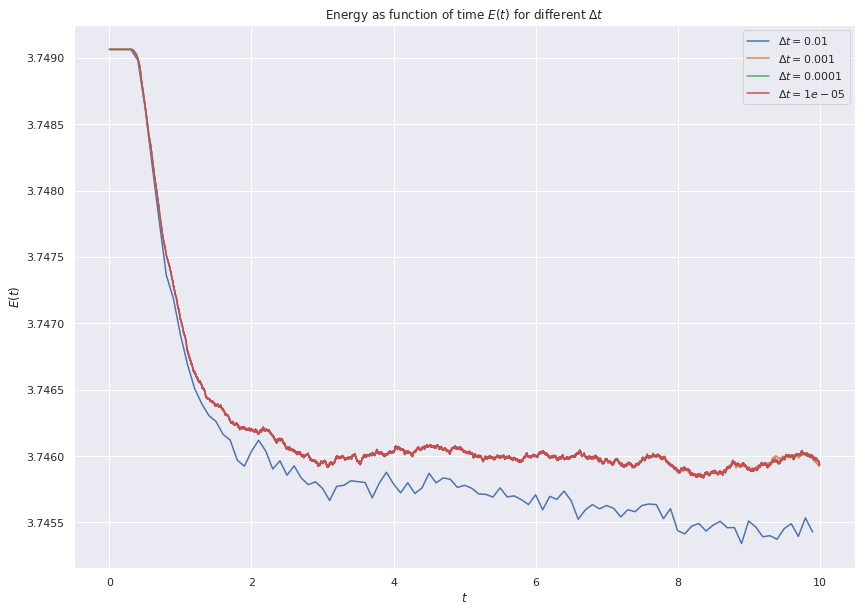

In [147]:
fig = plt.figure(figsize=(14, 10))

for i in range(2, 6):
    dt = 10 ** (-i)
    filename = os.path.join(dat_path, energy_filename + f"_{i}" + log_extension)
    log_df = pd.read_csv(filename, sep="\s+", skiprows=16, skipfooter=28, engine="python")

    plt.plot(log_df.Step * dt, log_df.TotEng, label=fr"$\Delta t = {dt}$")

plt.title(r"Energy as function of time $E(t)$ for different $\Delta t$")
plt.xlabel(r"$t$")
plt.ylabel(r"$E(t)$")
plt.legend(loc="best")
plt.show()

Here we see the expected behaviour where the energy initially drops as the system gets thermalized. We can then see for $\Delta t < 0.01$ that the energy fluctuates less than when $\Delta t = 0.01$.

## Temperature

From the equipartition principle we know that we can calulate the temperature of the system form
\begin{gather}
    \langle E_k \rangle = \frac{3}{2} N k_B T
    \implies
    T = \frac{2}{3 N k_B} \langle E_k \rangle,
\end{gather}
where the mean total kinetic energy $\langle E_k \rangle$ is calculated at every time step $i$. For a specific time step it is computed from
\begin{align}
    \langle E_k \rangle = \frac{1}{2} m \sum_{i = 1}^{N} v_i^2,
\end{align}
where $N$ is the number of particles in the system and we assume that $m_i = m$, i.e., that all the particles have the same mass. We set up a new simulation using Lammps similar to the one used for the uniform distribution, but now using a more "physical" initial start. We also store a log which we can use to fetch the temperature of the system from Lammps as a comparison.

In [156]:
temp_filename = "temperature"
temp_script = os.path.join(script_path, temp_filename + script_extension)
temp_dump = os.path.join(dat_path, temp_filename + dump_extension)
temp_log = os.path.join(dat_path, temp_filename + log_extension)

In [157]:
%%writefile $temp_script
# 3d Lennard-Jones gas
units lj
dimension 3
# Periodic boundiaries
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 20 0 20 0 20
create_box 1 simbox
create_atoms 1 box

mass 1 1.0
velocity all create 2.5 87287

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

dump 1 all custom 10 ${dump_filename} id type x y z vx vy vz
log ${log_filename}
thermo 100
run 5000

Overwriting scripts/temperature.in


In [159]:
!mpirun -np $num_mpi_processes \
    lmp -var dump_filename $temp_dump \
        -var log_filename $temp_log \
        -in $temp_script

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (147.361 147.361 147.361)
  1 by 2 by 2 MPI processor grid
Created 32000 atoms
  Time spent = 0.00208121 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 90 90 90
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.005
Per MPI rank memory allocation (min/avg/max) = 8.49 | 8.49 | 8.49 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7498828  0.024999219 
     100    2.5004149 -0.0010394834  

Reading in the dump to a `DataFrame`.

In [160]:
df, num_atoms, bounds = read_dump(temp_dump)

Reading in the log to get the energy and temperature of the simulation.

In [161]:
log_df = pd.read_csv(temp_log, sep="\s+", skiprows=15, skipfooter=27, engine="python")

As we run the simulation using `lj` units, this means that the mass of the particles are set to unity.

In [166]:
mass = 1.0

In [167]:
df["e_k"] = 0.5 * mass * (df["vx"] ** 2 + df["vy"] ** 2 + df["vz"] ** 2)

In [168]:
e_k_arr = np.zeros(num_timesteps)

for i in range(num_timesteps):
    t_i = slice(i * num_atoms, (i + 1) * num_atoms)
    e_k_arr[i] = np.sum(df.loc[t_i, "e_k"])

temperature_arr = 2 * e_k_arr / (3 * mass * num_atoms)

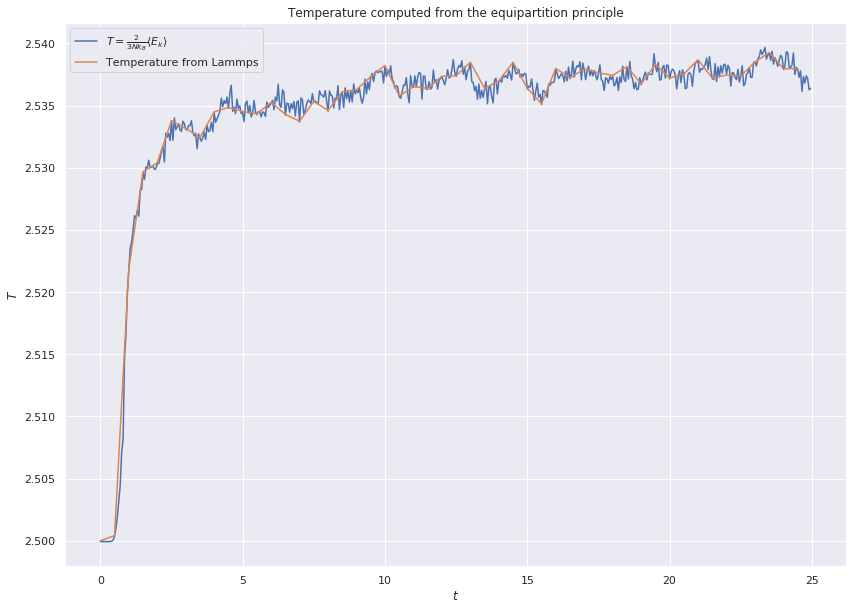

In [169]:
figure = plt.figure(figsize=(14, 10))

# Create an array of the time steps. Time step for the simulation is delta t = 0.05
time = np.arange(num_timesteps) * 0.05

plt.plot(
    time,
    temperature_arr,
    label=r"$T = \frac{2}{3 N k_B} \langle E_k \rangle$",
)
plt.plot(
    time[::10],
    log_df["Temp"][:-1],
    label=r"Temperature from Lammps"
)
plt.title(r"Temperature computed from the equipartition principle")
plt.xlabel(r"$t$")
plt.ylabel(r"$T$")
plt.legend(loc="best")
plt.show()

Here we see how the temperature initially ramp up in a short time before stabilizing at value slightly higher than the initial temperature. This is due to the system moving from the unphysical initial crystal state to the more physical one. This means that if we are to compute the temperature of the system, we should not include the temperature measurements before reaching a more stable system. From the plot above we see that this occurs approximately for $t > 8$.

In [170]:
stable_temp = temperature_arr[time > 8]

print(f"Stable temperature: {np.mean(stable_temp):.3f} +/- {np.std(stable_temp):.3f} K")
print(f"Initial temperature: {temperature_arr[0]:.3f} K")

Stable temperature: 2.537 +/- 0.001 K
Initial temperature: 2.500 K


We see that the temperature inreases as the system is allowed to thermalize. We now wish to explore how the fluctuations and the temperature behaves for varying system sizes. We will read the temperature from the log files instead of using the dumps as this saves a little time.

In [180]:
temp_system_name = "temperature_system_size"
temp_system_script = os.path.join(script_path, temp_system_name + script_extension)
temp_system_shell = os.path.join(script_path, temp_system_name + ".sh")
temp_system_log = os.path.join(dat_path, temp_system_name)

In [175]:
%%writefile $temp_system_script
# 3d Lennard-Jones gas
units lj
dimension 3
timestep 0.01
# Periodic boundiaries
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 ${simbox} 0 ${simbox} 0 ${simbox}
create_box 1 simbox
create_atoms 1 box

mass 1 1.0
velocity all create 2.5 87287

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

log ${filename}
thermo 10
run 5000

Overwriting scripts/temperature_system_size.in


In [196]:
%%writefile $temp_system_shell

if [[ "$#" -ne 2 ]]; then
    echo "Usage: $0 <log-filename> <lammps script>"
    exit;
fi


for box in $(seq 1 15); do
    mpirun -np $NUM_MPI_PROCESSES \
        lmp -var simbox $box \
        -var filename "$1"_$box.log \
        -in $2
done

Overwriting scripts/temperature_system_size.sh


In [197]:
!bash $temp_system_shell "$temp_system_log" "$temp_system_script"

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (7.36806 7.36806 7.36806)
  1 by 2 by 2 MPI processor grid
Created 4 atoms
  Time spent = 0.000179092 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 5 5 5
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 5.327 | 5.327 | 5.327 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0       2.8125      0.01875 
      10          2.5            0       

    3070    2.5167288  -0.02276652            0    2.8085534  0.018429575 
    3080    2.5068606 -0.010300963            0    2.8099172  0.018597602 
    3090    2.5024163 -0.0053037524            0    2.8099146  0.018662616 
    3100    2.5002603 -0.002879301            0    2.8099136  0.018694533 
    3110    2.4991574 -0.0016390482            0    2.8099131  0.018710954 
    3120    2.4989084            0            0    2.8112719  0.018741813 
    3130    2.4989084            0            0    2.8112719  0.018741813 
    3140    2.4989084            0            0    2.8112719  0.018741813 
    3150    2.4989084            0            0    2.8112719  0.018741813 
    3160    2.4990165 -0.0015265895            0    2.8098669  0.018712139 
    3170    2.5000709 -0.002712388            0    2.8098674  0.018696432 
    3180    2.5021427 -0.0050420546            0    2.8098684  0.018665742 
    3190    2.5064021 -0.0098316204            0    2.8098708  0.018603356 
    3200    2.515609

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (14.7361 14.7361 14.7361)
  1 by 2 by 2 MPI processor grid
Created 32 atoms
  Time spent = 0.000824718 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 9 9 9
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 5.705 | 5.705 | 5.705 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.6328125   0.02421875 
      10          2.5            0      

    1310    2.5589206  -0.08968054            0     3.628751  0.023668342 
    1320    2.5554843 -0.084684266            0    3.6287539  0.023481331 
    1330    2.5528661 -0.080874064            0    3.6287595  0.023402497 
    1340    2.5548207 -0.083706091            0    3.6287678   0.02326528 
    1350    2.5686381  -0.10412637            0    3.6284259  0.023197169 
    1360    2.5834451  -0.12574286            0    3.6283258  0.024153815 
    1370    2.5825722  -0.12462233            0     3.628178  0.024511165 
    1380    2.5791109  -0.11933177            0    3.6284388  0.023131231 
    1390    2.5653069 -0.099413123            0    3.6282984  0.024460194 
    1400    2.5622182 -0.095152447            0    3.6280709   0.02433502 
    1410    2.5296667 -0.047411961            0      3.62851  0.025703792 
    1420    2.5352179 -0.055439843            0    3.6285487  0.024119045 
    1430    2.5282468 -0.044911148            0    3.6289474  0.023720484 
    1440    2.5308953 -0.

    2660    2.5344915 -0.053822013            0     3.629111  0.023665223 
    2670    2.5320284 -0.050732428            0    3.6286213   0.02365349 
    2680    2.5056096 -0.012983145            0    3.6279808  0.027352876 
    2690    2.5425938 -0.065520788            0    3.6291858  0.024126768 
    2700    2.5209397 -0.033949022            0    3.6292915  0.025248587 
    2710    2.5226262 -0.035951862            0    3.6297394  0.024540289 
    2720    2.5193312 -0.030955549            0    3.6299475  0.024000135 
    2730    2.5167462   -0.0270229            0     3.630124   0.02392416 
    2740    2.5209415 -0.033101462            0    3.6301416  0.023818703 
    2750    2.5425263  -0.06479208            0    3.6298165  0.023798026 
    2760    2.5381765  -0.05994934            0    3.6283385   0.02576939 
    2770    2.5406719 -0.062608473            0    3.6293055  0.025025719 
    2780    2.5536458 -0.081900585            0     3.628866  0.024032502 
    2790    2.5553745 -0.

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (22.1042 22.1042 22.1042)
  1 by 2 by 2 MPI processor grid
Created 108 atoms
  Time spent = 0.000990355 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 14 14 14
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 5.712 | 5.712 | 5.712 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7152778  0.024768519 
      10          2.5            0  

    2120    2.5257951 -0.042546583            0    3.7110655  0.024264945 
    2130    2.5283062 -0.046507213            0    3.7108368  0.024549037 
    2140    2.5301639 -0.049337802            0    3.7107669  0.024798508 
    2150    2.5360843 -0.057743897            0    3.7111591  0.024828701 
    2160    2.5427632   -0.0679015            0    3.7109272  0.024629547 
    2170    2.5238852 -0.039306796            0     3.711467  0.026508001 
    2180    2.5329065 -0.053172529            0     3.711008  0.026659849 
    2190    2.5503594 -0.078832531            0    3.7112849  0.024327219 
    2200    2.5471155 -0.074442234            0    3.7108543   0.02465462 
    2210    2.5483704 -0.076064656            0     3.711097  0.024777205 
    2220    2.5397508 -0.063042603            0    3.7113093  0.024868256 
    2230    2.5477353 -0.075190616            0    3.7110271  0.024169159 
    2240    2.5457793 -0.072223694            0    3.7110871  0.024802532 
    2250     2.544789 -0.

    4870    2.5289685 -0.047902496            0    3.7104257  0.024530861 
    4880    2.5207362 -0.035531009            0     3.710563  0.025145749 
    4890    2.5209929 -0.035854865            0    3.7106206  0.024491752 
    4900    2.5176674 -0.031136429            0    3.7103971  0.024424294 
    4910    2.5183484 -0.032151609            0    3.7103939  0.024417183 
    4920    2.5225352 -0.038324587            0     3.710443  0.024359773 
    4930    2.4753238  0.032775793            0    3.7113819  0.028661216 
    4940    2.5299143 -0.049601167            0    3.7101326  0.024318073 
    4950    2.5293993 -0.049142812            0    3.7098256  0.025032357 
    4960    2.5424428 -0.068483027            0    3.7098694  0.024344549 
    4970    2.5316352 -0.052050268            0     3.710241  0.025559145 
    4980    2.5395001 -0.063990712            0    3.7099886  0.024844106 
    4990    2.5374459 -0.060798456            0    3.7101281   0.02424156 
    5000    2.5343992   -

     900     2.531906 -0.050601741            0    3.7324219  0.025205152 
     910    2.5329945 -0.052377308            0    3.7322727  0.024858741 
     920    2.5373835 -0.058861888            0    3.7323459  0.024693464 
     930     2.535864  -0.05682646            0    3.7321109  0.025623185 
     940    2.5422594 -0.066496333            0    3.7319967  0.025430133 
     950    2.5345798 -0.054846117            0    3.7321725  0.025584381 
     960    2.5406517 -0.064184235            0    3.7319068  0.024559714 
     970    2.5363092  -0.05764151            0    3.7319611  0.025045472 
     980    2.5265199 -0.042779286            0    3.7321968  0.026144771 
     990    2.5367773 -0.058253017            0     3.732049   0.02558929 
    1000    2.5401053 -0.063618614            0     3.731656  0.025330691 
    1010    2.5302475 -0.048994698            0    3.7315509  0.026219555 
    1020    2.5377641 -0.059542429            0     3.732234  0.026082237 
    1030    2.5483913 -0.

    3100     2.540062 -0.064251877            0     3.730958   0.02435021 
    3110    2.5408146 -0.065823662            0    3.7305107  0.024906379 
    3120    2.5380261 -0.061736057            0    3.7304319  0.025670389 
    3130    2.5526719 -0.083549971            0    3.7305008  0.024886478 
    3140    2.5506299 -0.080688306            0    3.7303114  0.025550088 
    3150    2.5434398 -0.069670579            0    3.7305862  0.026100612 
    3160    2.5440791 -0.070615733            0    3.7305962  0.026032218 
    3170    2.5483294  -0.07699002            0    3.7305724  0.025048483 
    3180    2.5428147 -0.068473402            0    3.7308494  0.024614442 
    3190    2.5353954 -0.057511124            0    3.7307262  0.024883784 
    3200    2.5385483 -0.062311839            0    3.7306362  0.024546548 
    3210    2.5391005 -0.063126428            0    3.7306468  0.024693496 
    3220    2.5319206 -0.052364949            0    3.7306805  0.025620618 
    3230    2.5349591 -0.

    4950    2.5324162 -0.053946789            0    3.7298391  0.024688408 
    4960    2.5318568 -0.053076907            0    3.7298731  0.024597452 
    4970    2.5301704 -0.050507949            0    3.7299224  0.025233556 
    4980    2.5252416 -0.043546947            0    3.7295191  0.026233467 
    4990    2.5377799 -0.062167415            0    3.7296326  0.024907316 
    5000    2.5283947  -0.04837022            0     3.729407    0.0256306 
Loop time of 0.244629 on 16 procs for 5000 steps with 256 atoms

Performance: 17659370.536 tau/day, 20439.086 timesteps/s
76.0% CPU use with 4 MPI tasks x 4 OpenMP threads

MPI task timing breakdown:
Section |  min time  |  avg time  |  max time  |%varavg| %total
---------------------------------------------------------------
Pair    | 0.0054768  | 0.006039   | 0.0065542  |   0.6 |  2.47
Neigh   | 0.0090031  | 0.009899   | 0.011793   |   1.1 |  4.05
Comm    | 0.18633    | 0.19374    | 0.2094     |   2.1 | 79.20
Output  | 0.012058   | 0.023375  

     850    2.5463309 -0.073339066            0    3.7385184  0.025329479 
     860    2.5438948 -0.069446084            0    3.7387645  0.025399811 
     870    2.5426607 -0.067540486            0    3.7388226  0.025511904 
     880    2.5407801 -0.064809094            0    3.7387386  0.025727278 
     890    2.5456489 -0.072022786            0    3.7388136   0.02487302 
     900    2.5396104 -0.063058074            0    3.7387387   0.02521927 
     910    2.5290232 -0.047129118            0    3.7388187  0.025890929 
     920    2.5329247 -0.053016518            0    3.7387717  0.025554175 
     930     2.539246  -0.06250456            0    3.7387467  0.024854667 
     940    2.5362373 -0.057618836            0    3.7391285  0.024892795 
     950    2.5370639 -0.058961854            0    3.7390229  0.024835296 
     960    2.5339624 -0.054260806            0    3.7390809  0.025047564 
     970     2.530345 -0.048814136            0    3.7391124  0.025262438 
     980    2.5377227 -0.

    2590     2.537635 -0.060792229            0    3.7380474  0.025391338 
    2600    2.5344362 -0.055841276            0    3.7382097  0.024950611 
    2610    2.5265166 -0.043723238            0    3.7384722  0.025408387 
    2620    2.5256588 -0.042676443            0    3.7382348  0.025564668 
    2630    2.5259777 -0.043266502            0    3.7381221  0.025181045 
    2640    2.5305216 -0.050003575            0    3.7381872    0.0245193 
    2650    2.5282723 -0.046711709            0    3.7381119  0.025228658 
    2660    2.5378806 -0.061366285            0    3.7378409  0.025164496 
    2670    2.5338612 -0.055028141            0    3.7381621  0.025943719 
    2680    2.5415352  -0.06669734            0    3.7379808   0.02514142 
    2690    2.5380221 -0.061319637            0    3.7380995  0.025165829 
    2700    2.5427338 -0.068497693            0    3.7379748  0.024844237 
    2710    2.5347674  -0.05680076            0    3.7377461  0.025816846 
    2720    2.5417826 -0.

    4330    2.5452832 -0.073174303            0    3.7371146  0.025079407 
    4340    2.5371296 -0.061237071            0     3.736846  0.025776797 
    4350    2.5318773 -0.052985792            0    3.7372346  0.026117695 
    4360    2.5409092 -0.066327187            0    3.7374139  0.025172895 
    4370    2.5333034 -0.054886597            0    3.7374685  0.025878616 
    4380    2.5423338 -0.068610413            0    3.7372633  0.024962169 
    4390    2.5344988 -0.056761614            0    3.7373831  0.025329994 
    4400    2.5391229 -0.063689639            0    3.7373774  0.024780668 
    4410    2.5368966 -0.060445415            0    3.7372888  0.025000333 
    4420    2.5450337 -0.072536112            0    3.7373794  0.024514347 
    4430    2.5304536 -0.050922618            0    3.7371665  0.026455324 
    4440     2.551251 -0.081801537            0    3.7374212  0.025061114 
    4450      2.54611 -0.074189157            0    3.7373375  0.025186082 
    4460    2.5346243 -0.

     300    2.5417455 -0.065638845            0    3.7425667  0.025071572 
     310    2.5403785 -0.063608084            0    3.7425493  0.024990885 
     320    2.5349327 -0.055524096            0     3.742474  0.025318894 
     330    2.5343101 -0.054578642            0    3.7424866  0.025083275 
     340    2.5323812 -0.051664368            0    3.7425109  0.025123027 
     350    2.5351992 -0.055969804            0    3.7424277  0.025191968 
     360    2.5356527 -0.056718717            0    3.7423582  0.025229026 
     370    2.5297051 -0.047650076            0    3.7425157   0.02570073 
     380    2.5294391 -0.047432932            0    3.7423343  0.025456684 
     390    2.5332998  -0.05321584            0    3.7423358  0.024661915 
     400    2.5260374 -0.042509898            0    3.7421608  0.025278046 
     410       2.5279 -0.045186708            0    3.7422745  0.024926986 
     420    2.5300537 -0.048350827            0    3.7423372  0.024778658 
     430    2.5225416 -0.

    1520    2.5411032 -0.065324167            0     3.741919  0.025040697 
    1530    2.5365506 -0.058826984            0    3.7415951  0.025089293 
    1540    2.5327847 -0.053042451            0    3.7417374  0.025212547 
    1550    2.5347164 -0.056268418            0    3.7414056  0.025167768 
    1560     2.536622 -0.058855274            0    3.7416739  0.025281517 
    1570    2.5238416 -0.039593262            0    3.7417875  0.026333895 
    1580    2.5370648 -0.059388051            0    3.7418045  0.025539992 
    1590    2.5337059 -0.054325393            0    3.7418346  0.025542975 
    1600    2.5343446 -0.055330054            0     3.741787  0.024774439 
    1610    2.5312969 -0.050735473            0    3.7418152  0.024752567 
    1620    2.5295553 -0.048077616            0    3.7418638  0.025089018 
    1630    2.5270789 -0.044883368            0    3.7413477  0.025632391 
    1640    2.5335039 -0.054159273            0    3.7416981  0.025146315 
    1650    2.5332794 -0.

    3540    2.5413143  -0.06696626            0    3.7405932  0.025140565 
    3550    2.5347346 -0.056685256            0     3.741016  0.025510862 
    3560    2.5346073 -0.056594035            0    3.7409166  0.025455349 
    3570    2.5365607 -0.059628768            0    3.7408085  0.025068325 
    3580    2.5320569 -0.052934727            0    3.7407546  0.025469736 
    3590    2.5354127  -0.05793513            0    3.7407822  0.025420563 
    3600    2.5426692 -0.068949912            0    3.7406395   0.02514634 
    3610    2.5445186   -0.0716163            0    3.7407441  0.025245663 
    3620    2.5471203 -0.075649977            0    3.7406084  0.025295659 
    3630    2.5352199 -0.057008143            0    3.7414203  0.026257908 
    3640    2.5470978 -0.075550264            0    3.7406744  0.025075677 
    3650    2.5429947 -0.069510934            0    3.7405663  0.025074958 
    3660     2.542302 -0.068353241            0     3.740686  0.025064681 
    3670    2.5402081 -0.

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (51.5764 51.5764 51.5764)
  1 by 2 by 2 MPI processor grid
Created 1372 atoms
  Time spent = 0.001319 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 32 32 32
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 5.772 | 5.772 | 5.772 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7472668  0.024981778 
      10          2.5            0    

    1550    2.5322945 -0.052402336            0    3.7432709  0.025611575 
    1560    2.5379244 -0.060759656            0    3.7433522  0.024859219 
    1570     2.535869 -0.057570468            0    3.7434605  0.024938443 
    1580    2.5369651 -0.059149059            0     3.743525  0.024886565 
    1590    2.5367516   -0.0588954            0    3.7434586  0.025082805 
    1600    2.5344821 -0.055450879            0    3.7435013  0.025248104 
    1610    2.5359204  -0.05770784            0    3.7434002  0.025085258 
    1620     2.537599 -0.060341631            0    3.7432825  0.025113267 
    1630    2.5368496 -0.059192714            0    3.7433082  0.025380233 
    1640    2.5413369 -0.065879801            0    3.7433471  0.025305327 
    1650      2.54496 -0.071354512            0     3.743303  0.025187561 
    1660    2.5379451 -0.060822067            0    3.7433209  0.025677364 
    1670    2.5383894  -0.06122423            0    3.7435847  0.025425431 
    1680    2.5323713 -0.

    2820     2.532288 -0.052578654            0    3.7430847  0.025043979 
    2830    2.5289364 -0.047531691            0     3.743108  0.025299416 
    2840    2.5276854 -0.045570582            0    3.7431941  0.025381935 
    2850    2.5324802 -0.052896857            0    3.7430547  0.024931107 
    2860    2.5267516 -0.043806459            0    3.7435585  0.025465054 
    2870     2.533919 -0.055185106            0    3.7429231  0.025280415 
    2880      2.53475 -0.056360921            0    3.7429928   0.02537417 
    2890    2.5396999 -0.063924608            0    3.7428486  0.025023643 
    2900    2.5401917 -0.064571357            0     3.742939  0.025072984 
    2910    2.5382623 -0.061622005            0    3.7429964  0.025422242 
    2920    2.5382013  -0.06155986            0     3.742967  0.025253253 
    2930    2.5396054 -0.063756775            0    3.7428747  0.024918795 
    2940    2.5341489 -0.055545368            0    3.7429075  0.025437226 
    2950    2.5327373 -0.

    4590    2.5384528 -0.062946031            0    3.7419578  0.025011591 
    4600    2.5348936 -0.057293432            0    3.7422756  0.025343875 
    4610    2.5377917 -0.061830703            0    3.7420823   0.02537074 
    4620    2.5432691 -0.070022633            0    3.7421005  0.024876433 
    4630    2.5356477 -0.058665846            0    3.7420335  0.025647479 
    4640    2.5341131 -0.056678927            0    3.7417202  0.025671717 
    4650    2.5377838 -0.061937199            0     3.741964  0.025051092 
    4660    2.5396316 -0.064580684            0    3.7420902  0.024900223 
    4670      2.54081 -0.066311371            0    3.7421257  0.025152639 
    4680    2.5427923 -0.069316227            0    3.7420922  0.025037034 
    4690    2.5420431 -0.068297426            0     3.741988  0.025163337 
    4700    2.5356451 -0.058708335            0    3.7419871  0.025755024 
    4710    2.5430312    -0.069743            0    3.7420235   0.02494723 
    4720    2.5424278  -0

     520    2.5344424 -0.054852059            0    3.7449552  0.025214658 
     530    2.5385449 -0.061043877            0    3.7449141  0.024970272 
     540    2.5341814 -0.054582391            0    3.7448336  0.025533786 
     550    2.5381435 -0.060590529            0    3.7447657  0.025324015 
     560    2.5381889 -0.060662438            0    3.7447619  0.025209813 
     570    2.5396643 -0.062843558            0    3.7447927  0.025029653 
     580    2.5333884 -0.053414004            0    3.7448131  0.025656005 
     590    2.5397499 -0.062952551            0    3.7448121  0.025047378 
     600    2.5359416 -0.057238684            0    3.7448163  0.025245388 
     610    2.5403065 -0.064035302            0    3.7445639  0.024998419 
     620     2.528259 -0.045778653            0     3.744758  0.026020047 
     630    2.5333737 -0.053400098            0     3.744805  0.025360053 
     640    2.5343177 -0.054821743            0    3.7447986  0.025216202 
     650    2.5336072  -0

    2090     2.534069 -0.055209168            0    3.7440384  0.025238692 
    2100    2.5363201 -0.058608991            0    3.7440135  0.025048285 
    2110    2.5338757 -0.055091573            0    3.7438661  0.025330469 
    2120    2.5341198 -0.055577562            0    3.7437461  0.025301813 
    2130    2.5322887 -0.052507586            0    3.7440708  0.025491148 
    2140    2.5353633 -0.057228493            0    3.7439595  0.025193335 
    2150    2.5352927 -0.057153149            0     3.743929  0.025205194 
    2160    2.5390154 -0.062744898            0    3.7439185  0.024872566 
    2170    2.5402625 -0.064716102            0    3.7438171  0.025014405 
    2180    2.5394909 -0.063571273            0    3.7438051  0.025431002 
    2190    2.5413794 -0.066327339            0    3.7438804  0.025231626 
    2200    2.5424854 -0.068072937            0    3.7437929  0.025011013 
    2210    2.5390551  -0.06286998            0     3.743853  0.025301408 
    2220    2.5428945 -0.

    3200    2.5364231 -0.059419927            0     3.743357  0.025388332 
    3210    2.5394609 -0.063967677            0    3.7433638  0.025156754 
    3220    2.5294833 -0.048847614            0    3.7435247  0.025830614 
    3230     2.536077 -0.058965801            0    3.7432922  0.025007044 
    3240    2.5331386 -0.054425817            0    3.7434268  0.025077575 
    3250    2.5362392 -0.059105395            0    3.7433959  0.024982899 
    3260    2.5358862 -0.058613253            0    3.7433587  0.025359925 
    3270    2.5360643 -0.058841886            0    3.7433971  0.025340797 
    3280     2.533796 -0.055168392            0    3.7436698  0.025219298 
    3290    2.5356285 -0.058129743            0    3.7434559  0.025131752 
    3300    2.5355592 -0.058126653            0    3.7433551  0.025282858 
    3310     2.533767  -0.05550112            0    3.7432936   0.02544752 
    3320    2.5355005  -0.05801579            0    3.7433779  0.025163556 
    3330    2.5364604  -0

    4870    2.5329846  -0.05495925            0    3.7426625  0.025479917 
    4880     2.537542 -0.061838453            0    3.7426159  0.025200095 
    4890     2.537751 -0.062343179            0    3.7424247  0.025274888 
    4900    2.5352279 -0.058585879            0    3.7423991  0.025473921 
    4910    2.5410502 -0.067220296            0    3.7424938  0.024999451 
    4920    2.5390941 -0.064431751            0    3.7423498  0.025130997 
    4930    2.5414467 -0.067781965            0    3.7425267  0.024957291 
    4940    2.5390738 -0.064323384            0    3.7424276   0.02528105 
    4950    2.5365707 -0.060597997            0    3.7424003  0.025449739 
    4960    2.5391677 -0.064415932            0    3.7424758  0.025054043 
    4970     2.536939 -0.061091486            0    3.7424589  0.025163166 
    4980    2.5368754 -0.060882905            0    3.7425721    0.0251222 
    4990    2.5369019  -0.06099715            0    3.7424976  0.025237718 
    5000    2.5375441 -0.

     960     2.537675 -0.060163024            0    3.7450441  0.025429318 
     970    2.5410437 -0.065060825            0    3.7451976   0.02504573 
     980    2.5386365 -0.061582183            0    3.7450666  0.025154589 
     990    2.5350533 -0.056164391            0    3.7451115  0.025466325 
    1000    2.5356245 -0.057057568            0    3.7450749  0.025193337 
    1010    2.5333395 -0.053491277            0    3.7452148  0.025277949 
    1020    2.5347479  -0.05562689            0    3.7451911  0.025346505 
    1030    2.5350411 -0.056044892            0    3.7452127  0.025339937 
    1040    2.5362478 -0.057953415            0    3.7451136  0.025061184 
    1050    2.5355595 -0.056737026            0     3.745298  0.025125601 
    1060    2.5367568 -0.058547193            0    3.7452831  0.025183483 
    1070    2.5353308 -0.056551576            0    3.7451404   0.02537464 
    1080    2.5332012 -0.053201425            0    3.7452972   0.02542746 
    1090    2.5357558 -0.

    2300      2.54142 -0.066387547            0    3.7444352  0.025093102 
    2310    2.5351937 -0.057061991            0    3.7444244  0.025604718 
    2320    2.5388162 -0.062425668            0    3.7444927  0.025257224 
    2330    2.5415214 -0.066520987            0    3.7444537  0.025128598 
    2340    2.5393013 -0.063253435            0    3.7443923  0.025407669 
    2350     2.540429 -0.064929633            0     3.744407  0.025236308 
    2360     2.538935 -0.062749886            0    3.7443466  0.025241952 
    2370     2.536666 -0.059312826            0    3.7443813   0.02519988 
    2380    2.5375843 -0.060653519            0    3.7444176  0.024853286 
    2390    2.5315666 -0.051685039            0    3.7443626  0.025245134 
    2400    2.5334711 -0.054462758            0    3.7444407  0.025246321 
    2410    2.5331442 -0.054084154            0     3.744329  0.025410122 
    2420     2.536369 -0.058791835            0    3.7444569  0.025161742 
    2430    2.5366574  -0

    3790    2.5391039 -0.063905551            0    3.7434441  0.025314671 
    3800    2.5402616 -0.065786674            0     3.743299  0.025548368 
    3810    2.5386772 -0.063241226            0    3.7434687  0.025756895 
    3820     2.544992 -0.072910886            0    3.7432679  0.025175226 
    3830    2.5427017 -0.069357939            0    3.7433866  0.025246309 
    3840    2.5391592 -0.064023287            0    3.7434094  0.025379457 
    3850    2.5395555 -0.064634054            0    3.7433929   0.02520042 
    3860    2.5353598 -0.058353743            0    3.7433818  0.025188472 
    3870    2.5399885 -0.065287604            0    3.7433886  0.024748355 
    3880     2.536955 -0.060733155            0    3.7433944  0.025277037 
    3890    2.5375582 -0.061632564            0    3.7433993  0.025344456 
    3900    2.5385927 -0.063201327            0    3.7433819    0.0252351 
    3910     2.535904 -0.059311523            0    3.7432399  0.025456994 
    3920    2.5379132 -0.

    4880    2.5356136 -0.059111801            0    3.7430043   0.02561589 
    4890    2.5406986 -0.066756421            0    3.7429845  0.025158776 
    4900    2.5378794 -0.062453998            0    3.7430597  0.025188188 
    4910    2.5305631 -0.051455851            0     3.743087  0.025608314 
    4920    2.5354408 -0.058874403            0    3.7429825  0.025168161 
    4930    2.5368956 -0.061019282            0    3.7430192  0.025072624 
    4940     2.533717 -0.056294503            0    3.7429777  0.025451645 
    4950    2.5353423 -0.058615409            0    3.7430939  0.025214278 
    4960    2.5349165  -0.05806784            0    3.7430029  0.025165542 
    4970    2.5333398 -0.055655196            0    3.7430513  0.025218953 
    4980    2.5380058 -0.062724664            0    3.7429785  0.024950864 
    4990    2.5326732 -0.054826014            0     3.742881  0.025590989 
    5000    2.5373194 -0.061646354            0    3.7430276  0.025107151 
Loop time of 0.576945 on 

     860    2.5389399 -0.061948947            0    3.7455087  0.024881612 
     870    2.5352133 -0.056408672            0    3.7454606   0.02540887 
     880    2.5392758 -0.062499625            0    3.7454618  0.025137037 
     890    2.5351036 -0.056363587            0    3.7453411  0.025526268 
     900    2.5374145 -0.059658767            0    3.7455114   0.02524903 
     910    2.5373735 -0.059642664            0     3.745466  0.025149537 
     920    2.5332914 -0.053594537            0    3.7453926  0.025412952 
     930    2.5379536 -0.060577948            0    3.7454007  0.025025158 
     940    2.5373683 -0.059727494            0    3.7453735  0.025157111 
     950    2.5352543 -0.056477375            0    3.7454534  0.025360125 
     960    2.5376855 -0.060085685            0    3.7454909  0.025073938 
     970    2.5328578 -0.052941671            0    3.7453953   0.02561408 
     980    2.5354833  -0.05673939            0    3.7455348  0.025355609 
     990    2.5338628 -0.

    2240    2.5359944 -0.058234413            0    3.7448062  0.025328988 
    2250    2.5370255 -0.059852613            0    3.7447342  0.025320902 
    2260    2.5351861 -0.056972395            0    3.7448561  0.025497947 
    2270    2.5344246 -0.056001126            0    3.7446854  0.025469349 
    2280    2.5376786 -0.060877657            0    3.7446886  0.025136789 
    2290    2.5354784 -0.057596925            0    3.7446699  0.025399755 
    2300    2.5362377 -0.058674882            0    3.7447305  0.025392009 
    2310    2.5369827 -0.059792742            0      3.74473  0.025326416 
    2320    2.5340968 -0.055463035            0    3.7447318  0.025367632 
    2330    2.5361712 -0.058531885            0    3.7447739   0.02500553 
    2340     2.530437 -0.049900434            0    3.7448061  0.025458279 
    2350    2.5326244 -0.053179739            0    3.7448071  0.025353905 
    2360    2.5309107 -0.050434015            0    3.7449829  0.025496405 
    2370    2.5363634   -

    3820     2.540034 -0.064916001            0    3.7441824  0.025002864 
    3830    2.5370431 -0.060422559            0    3.7441907  0.025323078 
    3840    2.5382737 -0.062353194            0    3.7441055  0.025193165 
    3850    2.5390786 -0.063637462            0    3.7440282  0.025184432 
    3860    2.5383659 -0.062721104            0    3.7438759  0.025363069 
    3870    2.5387205 -0.063140426            0    3.7439883  0.025230686 
    3880    2.5343282 -0.056410552            0    3.7441314  0.025381922 
    3890    2.5323896 -0.053393142            0    3.7442416   0.02529335 
    3900    2.5354232 -0.058166487            0    3.7440175  0.025089372 
    3910    2.5336973 -0.055633451            0    3.7439623   0.02543658 
    3920    2.5345462 -0.056921758            0    3.7439471   0.02546985 
    3930    2.5378707 -0.061942361            0     3.743912  0.025281284 
    3940     2.541066  -0.06666752            0    3.7439786  0.025195819 
    3950    2.5382704 -0.

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (81.0487 81.0487 81.0487)
  1 by 2 by 2 MPI processor grid
Created 5324 atoms
  Time spent = 0.00142717 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 50 50 50
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.01
Per MPI rank memory allocation (min/avg/max) = 5.914 | 5.914 | 5.914 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0          2.5            0            0    3.7492956  0.024995304 
      10          2.5            0  

    1230    2.5354613 -0.056963521            0    3.7455141   0.02537891 
    1240    2.5364397 -0.058390232            0    3.7455547  0.025267883 
    1250    2.5375308 -0.060060994            0    3.7455202  0.025181545 
    1260    2.5346807 -0.055697727            0    3.7456091  0.025480174 
    1270     2.535486 -0.056885779            0    3.7456289  0.025319489 
    1280    2.5362999 -0.058100158            0    3.7456351  0.025142909 
    1290    2.5361669 -0.057970475            0    3.7455653  0.025156994 
    1300    2.5349588 -0.056148697            0    3.7455753  0.025272463 
    1310    2.5344499 -0.055440237            0    3.7455206  0.025304893 
    1320     2.532587 -0.052585187            0    3.7455818  0.025435827 
    1330    2.5360979 -0.057915981            0    3.7455164  0.025194261 
    1340     2.534776 -0.055901035            0    3.7455488  0.025325816 
    1350    2.5353787 -0.056817687            0     3.745536  0.025260633 
    1360    2.5368241 -0.

    2370    2.5391799 -0.063005724            0    3.7450488  0.025134333 
    2380    2.5383182 -0.061814269            0    3.7449479  0.025254382 
    2390    2.5370724 -0.059916062            0    3.7449777  0.025360644 
    2400    2.5375917 -0.060649235            0    3.7450233  0.025249012 
    2410     2.537301   -0.0602795            0    3.7449571  0.025177557 
    2420    2.5394494 -0.063429139            0    3.7450294  0.025118806 
    2430    2.5372044 -0.060093436            0    3.7449983  0.025453693 
    2440    2.5388451 -0.062609988            0    3.7449424  0.025214636 
    2450    2.5376193 -0.060732473            0    3.7449815  0.025155085 
    2460    2.5356639 -0.057753738            0    3.7450277  0.025449824 
    2470    2.5368938 -0.059612531            0    3.7450134  0.025230273 
    2480    2.5343621 -0.055805273            0    3.7450238  0.025256125 
    2490    2.5346628 -0.056253539            0    3.7450265   0.02517327 
    2500    2.5331589  -0

    3630    2.5363294 -0.059441252            0    3.7443382  0.025414839 
    3640     2.535093 -0.057611008            0    3.7443142  0.025407404 
    3650    2.5382961 -0.062501337            0    3.7442277  0.025000184 
    3660    2.5359831 -0.058994845            0    3.7442653   0.02530601 
    3670    2.5381927  -0.06244888            0    3.7441251  0.025260761 
    3680    2.5389004 -0.063488533            0    3.7441467  0.025287883 
    3690    2.5357546 -0.058659836            0    3.7442576  0.025495362 
    3700    2.5370281 -0.060632038            0    3.7441953  0.025339064 
    3710    2.5379648  -0.06194742            0    3.7442847  0.025322407 
    3720    2.5353739 -0.058055521            0     3.744291   0.02549652 
    3730    2.5366051 -0.059926437            0    3.7442665  0.025273293 
    3740    2.5381789 -0.062356329            0    3.7441968  0.025208022 
    3750    2.5370783 -0.060606726            0    3.7442959  0.025333738 
    3760    2.5395317 -0.

    4880    2.5350166 -0.057998481            0    3.7438122   0.02510052 
    4890    2.5338589  -0.05637048            0    3.7437039  0.025248798 
    4900    2.5345558 -0.057382882            0    3.7437368  0.025098397 
    4910    2.5343703  -0.05709864            0    3.7437428  0.025052236 
    4920    2.5336165 -0.056004681            0    3.7437063  0.025164307 
    4930     2.534124 -0.056750437            0    3.7437215  0.025204819 
    4940    2.5370184 -0.061291615            0    3.7435211  0.025194742 
    4950    2.5387282  -0.06377358            0    3.7436034  0.025117268 
    4960    2.5393727 -0.064668668            0    3.7436749  0.025131229 
    4970     2.538356 -0.063231694            0    3.7435871  0.025331725 
    4980    2.5397154 -0.065234252            0    3.7436233  0.025162808 
    4990    2.5365968 -0.060585776            0    3.7435948  0.025391542 
    5000    2.5363944 -0.060273138            0    3.7436039   0.02524294 
Loop time of 0.703591 on 

     810    2.5355426 -0.056758446            0    3.7460053  0.025274287 
     820    2.5367269 -0.058555263            0    3.7459846  0.025189337 
     830     2.536774 -0.058644205            0    3.7459662  0.025248255 
     840    2.5361086 -0.057741951            0    3.7458706  0.025375747 
     850    2.5372049  -0.05925964            0     3.745997  0.025155101 
     860    2.5352642 -0.056346625            0    3.7459995  0.025269222 
     870    2.5340842 -0.054649166            0    3.7459273  0.025426361 
     880    2.5357087 -0.057035939            0    3.7459768  0.025295214 
     890    2.5374307  -0.05967302            0    3.7459223  0.025192046 
     900    2.5344468 -0.055245421            0    3.7458747  0.025416476 
     910    2.5367224  -0.05862768            0    3.7459054  0.025218125 
     920    2.5356158 -0.057018754            0    3.7458547  0.025319739 
     930     2.534875 -0.055731577            0    3.7460308  0.025186861 
     940     2.535663 -0.

    2010    2.5404464 -0.065045253            0    3.7450731  0.025348939 
    2020    2.5398999 -0.064202712            0    3.7450959  0.025386685 
    2030    2.5384013 -0.061878539            0    3.7451726  0.025455567 
    2040    2.5423213 -0.067919319            0    3.7450109   0.02505799 
    2050    2.5402132 -0.064553517            0     3.745215  0.025291639 
    2060    2.5426049 -0.068302816            0    3.7450527  0.025289075 
    2070    2.5411125  -0.06601564            0    3.7451016  0.025427435 
    2080    2.5431944 -0.069067988            0    3.7451717  0.025215825 
    2090    2.5390302 -0.062739511            0    3.7452547  0.025505439 
    2100    2.5400767  -0.06441583            0    3.7451479  0.025296726 
    2110    2.5352328 -0.057066302            0    3.7452328  0.025468701 
    2120     2.537255 -0.060182324            0    3.7451495  0.025238571 
    2130    2.5355429 -0.057615341            0    3.7451488  0.025532747 
    2140    2.5391399 -0.

    3250    2.5391765 -0.063490392            0    3.7447234  0.025125792 
    3260    2.5373927 -0.060857923            0    3.7446805   0.02527895 
    3270    2.5360857 -0.058963898            0    3.7446142  0.025358208 
    3280    2.5348644 -0.057045083            0    3.7447015  0.025367909 
    3290    2.5365563 -0.059689028            0    3.7445949  0.025289909 
    3300    2.5365988 -0.059789896            0    3.7445579  0.025438835 
    3310    2.5371103 -0.060513705            0    3.7446012  0.025340987 
    3320    2.5369637 -0.060264693            0    3.7446303  0.025246522 
    3330    2.5356571 -0.058275116            0    3.7446603  0.025379026 
    3340    2.5395062 -0.064107855            0    3.7446004  0.025138081 
    3350    2.5359879 -0.058955948            0    3.7444756  0.025488722 
    3360    2.5371429 -0.060670085            0    3.7444936  0.025363931 
    3370    2.5347269 -0.056871291            0     3.744669  0.025518274 
    3380    2.5357343 -0.

    4400    2.5346891 -0.057310607            0     3.744173  0.025289085 
    4410    2.5361961 -0.059650913            0    3.7440929  0.025228976 
    4420    2.5346201 -0.057245046            0     3.744135  0.025243515 
    4430    2.5348816  -0.05759709            0    3.7441751  0.025169385 
    4440    2.5366064 -0.060203489            0    3.7441557  0.025136092 
    4450      2.53703 -0.060822285            0    3.7441721  0.025126211 
    4460    2.5355722 -0.058661104            0    3.7441469  0.025248047 
    4470    2.5348405 -0.057574745            0     3.744136   0.02535394 
    4480     2.536721 -0.060327312            0    3.7442037  0.025132482 
    4490     2.534558   -0.0571665            0    3.7441205  0.025280375 
    4500    2.5337249 -0.055880888            0    3.7441566  0.025293292 
    4510    2.5346595  -0.05732436            0    3.7441148  0.025118413 
    4520    2.5357205 -0.058976076            0    3.7440543  0.025100309 
    4530    2.5360439 -0.

     280    2.5314071 -0.050215537            0     3.746463  0.025291138 
     290    2.5309143 -0.049453755            0    3.7464856  0.025412973 
     300    2.5326512 -0.052174734            0    3.7463698  0.025358243 
     310    2.5342517 -0.054578944            0     3.746366  0.025236557 
     320    2.5330094 -0.052749912            0    3.7463318   0.02529961 
     330    2.5349499 -0.055660689            0    3.7463316  0.025173387 
     340    2.5343113 -0.054731231            0    3.7463031   0.02534557 
     350    2.5352539 -0.056148763            0    3.7462993  0.025336719 
     360    2.5332686 -0.053174814            0    3.7462957  0.025517193 
     370    2.5355277 -0.056647807            0     3.746211   0.02531394 
     380    2.5354241 -0.056507998            0    3.7461953  0.025250419 
     390    2.5368411 -0.058634401            0    3.7461942  0.025163612 
     400    2.5357044 -0.057030095            0    3.7460936  0.025434313 
     410    2.5354979  -0

    1470    2.5344299 -0.055424404            0    3.7457878   0.02530688 
    1480      2.53635 -0.058342391            0    3.7457497  0.025214294 
    1490    2.5367595 -0.058993161            0    3.7457131   0.02526228 
    1500    2.5357409 -0.057421355            0    3.7457572  0.025339681 
    1510    2.5353006 -0.056782362            0    3.7457358  0.025317541 
    1520    2.5347392 -0.055891226            0    3.7457849  0.025311701 
    1530    2.5353929 -0.056904115            0    3.7457525  0.025179202 
    1540    2.5344373 -0.055561511            0    3.7456618  0.025263821 
    1550     2.535865 -0.057702726            0     3.745662  0.025144825 
    1560    2.5357192  -0.05743475            0    3.7457112  0.025153673 
    1570    2.5335102 -0.054126463            0    3.7457063  0.025418372 
    1580    2.5357898 -0.057506194            0    3.7457457   0.02525588 
    1590     2.535882 -0.057729289            0    3.7456608  0.025301118 
    1600    2.5368993 -0.

    2580    2.5373362 -0.060405581            0    3.7451656  0.025227329 
    2590    2.5363617 -0.058939247            0    3.7451703  0.025268308 
    2600     2.535132 -0.057014883            0    3.7452504  0.025415022 
    2610    2.5360438 -0.058482516            0    3.7451502  0.025385312 
    2620    2.5368966 -0.059771332            0    3.7451405  0.025231909 
    2630    2.5376648 -0.060881495            0    3.7451826  0.025138579 
    2640    2.5376938 -0.060913603            0    3.7451939  0.025187709 
    2650     2.536321  -0.05890348            0    3.7451451  0.025318417 
    2660    2.5373518  -0.06041021            0    3.7451843  0.025158807 
    2670    2.5365997 -0.059367374            0    3.7450992  0.025270325 
    2680    2.5362191 -0.058732057            0    3.7451637  0.025361374 
    2690    2.5381996 -0.061744284            0    3.7451219  0.025231574 
    2700    2.5382152 -0.061739155            0    3.7451504  0.025233921 
    2710    2.5371049 -0.

    3760    2.5347585 -0.057056855            0    3.7446482  0.025236454 
    3770    2.5349822 -0.057335922            0    3.7447047  0.025177886 
    3780    2.5336929 -0.055423662            0    3.7446832  0.025289569 
    3790    2.5363339 -0.059359776            0    3.7447081  0.025146352 
    3800    2.5355907  -0.05829324            0    3.7446599  0.025386039 
    3810    2.5350727 -0.057521937            0    3.7446544  0.025395881 
    3820    2.5361388 -0.059143905            0    3.7446314  0.025321855 
    3830    2.5363542 -0.059548416            0    3.7445499  0.025298147 
    3840     2.536501 -0.059680532            0     3.744638  0.025193654 
    3850    2.5373352 -0.061008041            0    3.7445616   0.02512209 
    3860    2.5355164 -0.058306919            0     3.744535    0.0252631 
    3870    2.5348714 -0.057362718            0    3.7445117  0.025317121 
    3880    2.5370303 -0.060556279            0    3.7445562  0.025213044 
    3890    2.5343815 -0.

    4990    2.5360341  -0.05978281            0    3.7438355  0.025331444 
    5000    2.5371613 -0.061424871            0    3.7438841  0.025320848 
Loop time of 1.38123 on 16 procs for 5000 steps with 8788 atoms

Performance: 3127647.750 tau/day, 3619.963 timesteps/s
85.2% CPU use with 4 MPI tasks x 4 OpenMP threads

MPI task timing breakdown:
Section |  min time  |  avg time  |  max time  |%varavg| %total
---------------------------------------------------------------
Pair    | 0.23874    | 0.24645    | 0.25339    |   1.2 | 17.84
Neigh   | 0.32581    | 0.33649    | 0.35112    |   1.6 | 24.36
Comm    | 0.60091    | 0.60666    | 0.62008    |   1.0 | 43.92
Output  | 0.023068   | 0.035846   | 0.0546     |   6.6 |  2.60
Modify  | 0.10979    | 0.11611    | 0.12298    |   1.4 |  8.41
Other   |            | 0.03967    |            |       |  2.87

Nlocal:    2197 ave 2249 max 2107 min
Histogram: 1 0 0 0 0 0 0 1 1 1
Nghost:    838.25 ave 857 max 823 min
Histogram: 1 1 0 0 0 0 1 0 0 1
Neighs:

     950    2.5357981 -0.057261232            0    3.7460894  0.025295902 
     960    2.5366612 -0.058564547            0    3.7460806  0.025154885 
     970    2.5360362 -0.057625264            0    3.7460825  0.025239106 
     980    2.5363562 -0.058119205            0    3.7460685  0.025290641 
     990    2.5366211 -0.058488866            0    3.7460961  0.025212671 
    1000    2.5348609 -0.055821964            0    3.7461229  0.025306058 
    1010    2.5364921 -0.058242838            0    3.7461486  0.025170598 
    1020    2.5351839 -0.056272733            0    3.7461567   0.02536043 
    1030     2.536125  -0.05771476            0    3.7461262  0.025362417 
    1040    2.5361589 -0.057789552            0    3.7461023    0.0253313 
    1050    2.5353513 -0.056588316            0    3.7460921  0.025332931 
    1060    2.5339736 -0.054509974            0    3.7461041  0.025402041 
    1070    2.5361022 -0.057731501            0    3.7460753  0.025131278 
    1080     2.534201 -0.

    2160    2.5379037 -0.061029395            0    3.7454793  0.025269307 
    2170     2.537892 -0.060958113            0     3.745533  0.025299117 
    2180     2.538606 -0.062056985            0     3.745505  0.025237284 
    2190    2.5376423 -0.060665516            0    3.7454512  0.025370785 
    2200    2.5382812 -0.061617268            0    3.7454577  0.025261068 
    2210    2.5378901  -0.06100839            0    3.7454799  0.025216093 
    2220    2.5356267 -0.057588098            0    3.7455054  0.025355629 
    2230     2.536245 -0.058500994            0    3.7455199  0.025236441 
    2240    2.5364134 -0.058776318            0    3.7454971  0.025214867 
    2250    2.5355697 -0.057551691            0    3.7454563  0.025237417 
    2260    2.5351511 -0.056933236            0    3.7454469  0.025240872 
    2270    2.5320315 -0.052229507            0    3.7454717  0.025474187 
    2280    2.5358299 -0.057950296            0     3.745448  0.025157502 
    2290    2.5334186 -0.

    3280    2.5374668  -0.06096607            0    3.7448874  0.025354137 
    3290    2.5372352  -0.06054519            0    3.7449609  0.025354513 
    3300    2.5381483 -0.061901201            0    3.7449744  0.025218209 
    3310    2.5371918 -0.060499877            0    3.7449411  0.025282279 
    3320    2.5369533 -0.060104609            0    3.7449787  0.025242698 
    3330    2.5351812 -0.057502394            0    3.7449229  0.025283016 
    3340    2.5364645 -0.059405969            0    3.7449442  0.025122316 
    3350    2.5360419 -0.058800316            0    3.7449159  0.025128412 
    3360    2.5343491 -0.056274313            0     3.744903  0.025322584 
    3370    2.5362508 -0.059093718            0    3.7449359  0.025278512 
    3380    2.5355278 -0.057992609            0    3.7449526  0.025307897 
    3390    2.5364416 -0.059369175            0    3.7449466  0.025162043 
    3400    2.5351954 -0.057563923            0    3.7448828  0.025306597 
    3410    2.5350428 -0.

    4490    2.5379711 -0.062215487            0    3.7443943  0.025213218 
    4500    2.5351884 -0.058070672            0    3.7443655   0.02555399 
    4510    2.5384104    -0.062915            0    3.7443537   0.02522689 
    4520    2.5362586 -0.059658929            0    3.7443824  0.025344248 
    4530    2.5364775 -0.060043017            0    3.7443266  0.025366634 
    4540    2.5361561 -0.059562641            0    3.7443248   0.02533179 
    4550    2.5351643 -0.058043108            0    3.7443569  0.025368133 
    4560    2.5346219 -0.057249748            0    3.7443367  0.025415181 
    4570    2.5353142 -0.058350717            0    3.7442742  0.025338622 
    4580    2.5361737 -0.059647453            0    3.7442665  0.025232731 
    4590    2.5369415 -0.060841121            0    3.7442244   0.02529541 
    4600     2.535699  -0.05899446            0    3.7442075  0.025544979 
    4610    2.5379848 -0.062379256            0    3.7442511  0.025246297 
    4620    2.5366433 -0.

     360    2.5334865 -0.053521937            0    3.7464263   0.02536097 
     370    2.5330896 -0.052901868            0     3.746451  0.025357877 
     380    2.5342378 -0.054604002            0    3.7464711  0.025198167 
     390    2.5341064  -0.05445481            0    3.7464233   0.02527652 
     400    2.5338683 -0.054163149            0    3.7463577  0.025321912 
     410    2.5326467 -0.052279887            0    3.7464088  0.025394688 
     420    2.5349852 -0.055763171            0    3.7464329  0.025153841 
     430    2.5337198 -0.053853989            0    3.7464441  0.025290781 
     440    2.5360159 -0.057362037            0      3.74638  0.025173303 
     450    2.5335795 -0.053670802            0     3.746417  0.025382394 
     460    2.5338493 -0.054058968            0    3.7464335  0.025282827 
     470    2.5333519 -0.053333543            0    3.7464128  0.025312507 
     480    2.5342584 -0.054694914            0     3.746411  0.025281012 
     490    2.5343211 -0.

    1500    2.5336573 -0.054302096            0    3.7459023  0.025215659 
    1510     2.533622 -0.054283896            0    3.7458676  0.025266586 
    1520    2.5355264 -0.057107357            0    3.7459005  0.025169913 
    1530     2.535311 -0.056755937            0    3.7459289  0.025271188 
    1540    2.5356208    -0.057252            0    3.7458975  0.025288605 
    1550     2.536935 -0.059256846            0    3.7458638  0.025193866 
    1560    2.5354146 -0.057021826            0    3.7458183  0.025292779 
    1570    2.5348284 -0.056049556            0    3.7459115  0.025310701 
    1580    2.5359829 -0.057902265            0    3.7457903  0.025263148 
    1590    2.5371639 -0.059676324            0    3.7457876  0.025160558 
    1600    2.5367985 -0.059118529            0    3.7457974  0.025276271 
    1610    2.5380244 -0.060921275            0    3.7458333  0.025286411 
    1620     2.537939 -0.060855876            0    3.7457707  0.025310627 
    1630    2.5382124 -0.

    2740     2.536287  -0.05885261            0     3.745296  0.025299858 
    2750     2.536658 -0.059442286            0    3.7452628  0.025243873 
    2760    2.5351656 -0.057225118            0    3.7452415  0.025386156 
    2770    2.5367205 -0.059593711            0    3.7452051  0.025196589 
    2780    2.5345013 -0.056204885            0    3.7452655  0.025353752 
    2790    2.5369989   -0.0600251            0    3.7451913   0.02518536 
    2800    2.5344145 -0.056150597            0    3.7451896  0.025404946 
    2810    2.5360642 -0.058593204            0    3.7452213  0.025191368 
    2820    2.5354023 -0.057641352            0    3.7451804  0.025209839 
    2830    2.5361901 -0.058892613            0    3.7451108  0.025259372 
    2840    2.5375814 -0.060922135            0    3.7451679  0.025211586 
    2850    2.5365716 -0.059389888            0    3.7451856  0.025309184 
    2860    2.5362202 -0.058875327            0    3.7451732  0.025344031 
    2870    2.5363208 -0.

    3860    2.5367917 -0.060277285            0    3.7446284  0.025357236 
    3870     2.536921 -0.060428783            0    3.7446708  0.025307894 
    3880    2.5374897  -0.06133014            0    3.7446225  0.025222451 
    3890    2.5372204 -0.061012645            0     3.744536  0.025283274 
    3900    2.5380341 -0.062191623            0    3.7445775  0.025212495 
    3910    2.5373802 -0.061175766            0    3.7446126  0.025228169 
    3920    2.5366103 -0.060044609            0     3.744589  0.025327987 
    3930    2.5376209 -0.061515093            0    3.7446343  0.025189512 
    3940    2.5349918 -0.057527108            0    3.7446789  0.025324627 
    3950    2.5370913  -0.06076418            0    3.7445908  0.025090545 
    3960    2.5359297  -0.05902012            0    3.7445926  0.025185233 
    3970    2.5352995 -0.057987595            0      3.74468  0.025281387 
    3980    2.5357058 -0.058676576            0    3.7446004  0.025346756 
    3990    2.5367773  -0

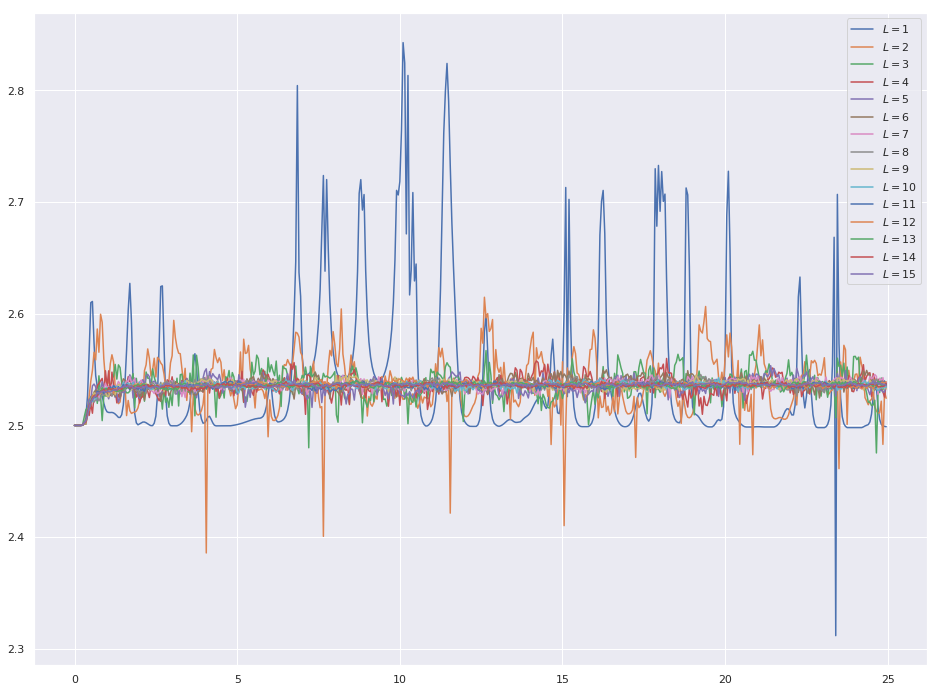

In [205]:
fig = plt.figure(figsize=(16, 12))
mean_list = []
std_list = []
system_sizes = list(range(1, 16))

for size in system_sizes:
    filename = os.path.join(temp_system_log + f"_{size}" + log_extension)
    log_df = pd.read_csv(filename, sep="\s+", skiprows=15, skipfooter=27, engine="python")
    mean_list.append(np.mean(log_df["Temp"].iloc[time > 5]))
    std_list.append(np.std(log_df["Temp"].iloc[time > 5]))

    plt.plot(time, log_df["Temp"][:-1], label=fr"$L = {size}$")

plt.legend(loc="best")
plt.show()

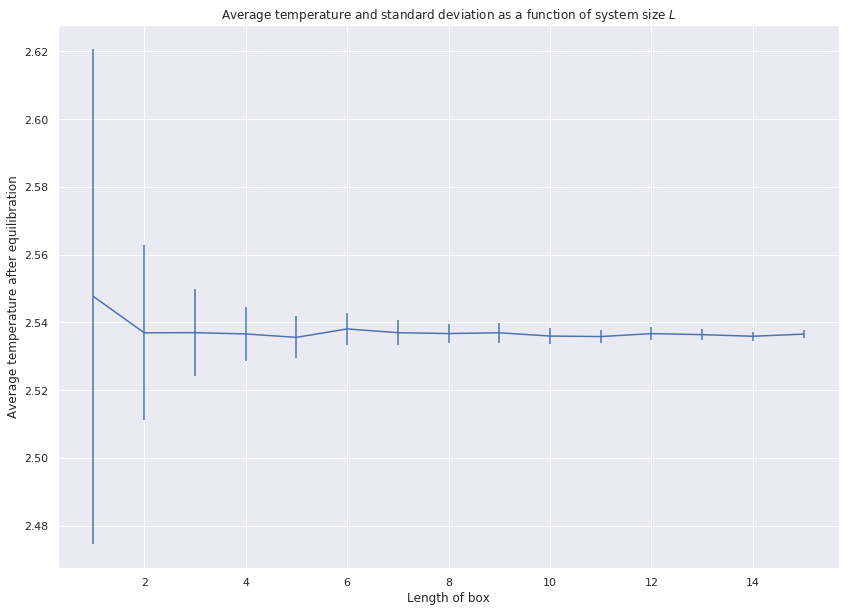

In [206]:
fig = plt.figure(figsize=(14, 10))
plt.errorbar(system_sizes, mean_list, yerr=std_list)
plt.xlabel(r"Length of box")
plt.ylabel(r"Average temperature after equilibration")
plt.title(r"Average temperature and standard deviation as a function of system size $L$")
plt.show()

In this figure we can see the average temperature after equilibration as a function of the length of one of the sides of the simulation box. We have also plotted the standard deviation in the temperature after equilibration. Not surprisingly, for a larger box we reach a more stable temperature.

## Measuring the pressure

We will now explore how the pressure of the system changes as a function of temperature. Lammps uses the virial equation to measure the average pressure. This is given by
\begin{align}
    P = \rho k_B T + \frac{1}{3V}\sum_{i < j} \mathbf{F}_{ij}\cdot \mathbf{r}_{ij},
\end{align}
where the particle density, $\rho$, in a volume $V$ is given by
\begin{align}
    \rho = \frac{N}{V}.
\end{align}
As Lammps computes the pressue in this manner, we'll read the pressue from the log-files along with the temperature.

### Pressure as a function of temperature

We'll start by looking at a fixed sized system, that is, we keep the volume and the number of particles constant. We will then measure the pressure of the system for varying temperatures. When measuring the pressure we wait until the system has equilibrated. Furthermore, as both the temperature and the pressure fluctuates, we'll compute the average pressure and the average temperature after the system is equilibrated.

In [210]:
pressure_temp_name = "pressure_temperature"
pressure_temp_script = os.path.join(script_path, pressure_temp_name + script_extension)
pressure_temp_shell = os.path.join(script_path, pressure_temp_name + ".sh")
pressure_temp_log = os.path.join(dat_path, pressure_temp_name)

In [213]:
%%writefile $pressure_temp_script
# 3d Lennard-Jones gas
units lj
dimension 3
boundary p p p
atom_style atomic

lattice fcc 0.01
region simbox block 0 15 0 15 0 15
create_box 1 simbox
create_atoms 1 box
#change_box all x final 0 20 y final 0 20 z final 0 20

mass 1 1.0
velocity all create ${temperature} 87287 dist uniform

pair_style lj/cut 3.0
pair_coeff 1 1 1.0 1.0 3.0

fix 1 all nve

log ${filename}
thermo 10
run 5000

Overwriting scripts/pressure_temperature.in


In [236]:
%%writefile $pressure_temp_shell

if [[ "$#" -ne 2 ]]; then
    echo "Usage: $0 <log filename> <lammps script>"
    exit
fi

for temperature in 2 5 10 15 20 25 30; do
    mpirun -np $NUM_MPI_PROCESSES \
        lmp -var temperature $temperature \
            -var filename "$1"_$temperature.log \
            -in $2
done

Overwriting scripts/pressure_temperature.sh


We'll now run the Lammps script for several different temperatures.

In [237]:
!bash $pressure_temp_shell $pressure_temp_log $pressure_temp_script

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (110.521 110.521 110.521)
  1 by 2 by 2 MPI processor grid
Created 13500 atoms
  Time spent = 0.00141293 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 67 67 67
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.005
Per MPI rank memory allocation (min/avg/max) = 6.164 | 6.164 | 6.164 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0            2            0            0    2.9997778  0.019998519 
      10            2            0

     980     2.036793 -0.058242693            0    2.9967206  0.020152752 
     990    2.0361974 -0.057343757            0    2.9967261  0.020247511 
    1000    2.0358731  -0.05684941            0     2.996734   0.02029135 
    1010    2.0369044 -0.058393046            0    2.9967372  0.020185495 
    1020    2.0371599 -0.058769432            0    2.9967441  0.020115087 
    1030    2.0366746 -0.058035557            0    2.9967501  0.020130764 
    1040    2.0365398 -0.057827585            0    2.9967558  0.020156822 
    1050    2.0363786  -0.05757066            0    2.9967709  0.020195477 
    1060    2.0365271 -0.057800595            0    2.9967637  0.020214554 
    1070    2.0359648 -0.056983396            0    2.9967375  0.020277118 
    1080    2.0351516 -0.055773924            0    2.9967274  0.020312465 
    1090    2.0371848 -0.058827417            0    2.9967234  0.020125808 
    1100    2.0368702 -0.058348353            0    2.9967306  0.020126932 
    1110    2.0371166 -0.

    2130    2.0351034 -0.055727409            0    2.9967016  0.020162866 
    2140    2.0341858 -0.054346399            0    2.9967063  0.020221069 
    2150    2.0355412 -0.056394239            0    2.9966914  0.020140673 
    2160    2.0358698 -0.056877751            0    2.9967008  0.020117128 
    2170    2.0354547 -0.056255533            0    2.9967004  0.020154746 
    2180    2.0362385 -0.057438378            0    2.9966932   0.02013066 
    2190    2.0351794 -0.055855065            0     2.996688  0.020240589 
    2200    2.0355925  -0.05646561            0    2.9966969  0.020233483 
    2210    2.0367617 -0.058227287            0    2.9966889  0.020145629 
    2220     2.037538 -0.059388779            0    2.9966919  0.020083254 
    2230    2.0369826 -0.058536151            0    2.9967115  0.020130661 
    2240    2.0368748  -0.05839052            0    2.9966953  0.020166578 
    2250    2.0362343  -0.05741929            0    2.9967059  0.020232853 
    2260    2.0371464 -0.

    3250    2.0370875 -0.058749863            0    2.9966551  0.020274583 
    3260    2.0377298  -0.05970469            0    2.9966637  0.020263612 
    3270    2.0387091 -0.061151904            0    2.9966852  0.020189808 
    3280    2.0390835  -0.06170615            0    2.9966925  0.020164751 
    3290    2.0387846 -0.061260949            0    2.9966894  0.020193842 
    3300    2.0396062 -0.062504665            0     2.996678   0.02014751 
    3310    2.0389578 -0.061516404            0    2.9966938  0.020213799 
    3320    2.0386912 -0.061119112            0    2.9966911  0.020252333 
    3330    2.0388502 -0.061342009            0    2.9967067  0.020245506 
    3340    2.0397343 -0.062674002            0    2.9967008  0.020202442 
    3350    2.0386937  -0.06113061            0    2.9966834  0.020299154 
    3360    2.0389217 -0.061468091            0    2.9966879  0.020279221 
    3370    2.0402208  -0.06341118            0    2.9966934  0.020166466 
    3380    2.0387227  -0

    4390     2.039763 -0.062745762            0    2.9966722  0.020358828 
    4400    2.0405343 -0.063908161            0    2.9966666  0.020307846 
    4410     2.041689 -0.065651588            0    2.9966551  0.020223832 
    4420     2.039725 -0.062700212            0    2.9966607  0.020361496 
    4430    2.0384787 -0.060832816            0    2.9966587    0.0203948 
    4440     2.041353 -0.065152977            0    2.9966496  0.020088955 
    4450    2.0411145 -0.064792238            0    2.9966527  0.020034576 
    4460    2.0401117 -0.063271961            0    2.9966689  0.020125217 
    4470     2.038242 -0.060443775            0    2.9966928  0.020309245 
    4480    2.0394769 -0.062297806            0    2.9966909  0.020257833 
    4490    2.0395809 -0.062464117            0    2.9966806  0.020250577 
    4500    2.0400379 -0.063158242            0    2.9966719  0.020193552 
    4510    2.0408561 -0.064395792            0    2.9966615  0.020138269 
    4520    2.0397566  -0

     330    5.0255527 -0.041286364            0    7.4964842  0.050619966 
     340    5.0289977 -0.046441386            0    7.4964963  0.050300453 
     350    5.0262877 -0.042379913            0    7.4964931  0.050494294 
     360      5.02598 -0.041905996            0    7.4965055  0.050601787 
     370    5.0264937  -0.04271406            0     7.496468  0.050640057 
     380    5.0281294 -0.045147878            0    7.4964876  0.050558828 
     390     5.028891 -0.046309258            0    7.4964685  0.050559618 
     400    5.0290705 -0.046638667            0    7.4964083  0.050629311 
     410    5.0302027  -0.04833927            0    7.4964058  0.050600751 
     420    5.0272161 -0.043837977            0    7.4964276  0.050837935 
     430    5.0262354 -0.042374682            0      7.49642   0.05092517 
     440    5.0296282  -0.04745682            0    7.4964266   0.05066309 
     450    5.0291791 -0.046793723            0    7.4964162  0.050688364 
     460    5.0283462 -0.

    1530    5.0274208 -0.044279737            0    7.4962929  0.050801709 
    1540    5.0280104 -0.045188287            0    7.4962686  0.050733776 
    1550    5.0294914 -0.047389965            0    7.4962883  0.050601969 
    1560    5.0253328 -0.041122944            0    7.4963178  0.050848878 
    1570    5.0293016 -0.047096331            0    7.4962973  0.050526484 
    1580    5.0295145 -0.047431737            0    7.4962811  0.050500409 
    1590      5.03078 -0.049308391            0    7.4963026  0.050468491 
    1600    5.0265667 -0.042943861            0    7.4963476  0.050763319 
    1610    5.0285934 -0.046010459            0     7.496321  0.050613828 
    1620    5.0276428 -0.044564581            0    7.4963411  0.050652837 
    1630    5.0316911  -0.05062785            0    7.4963497  0.050366273 
    1640    5.0275743 -0.044455941            0    7.4963469   0.05068666 
    1650    5.0304218 -0.048789857            0     7.496284  0.050567336 
    1660     5.028788 -0.

    2750    5.0331285 -0.052961756            0    7.4961718  0.050475963 
    2760    5.0276145 -0.044659787            0    7.4962034  0.050874121 
    2770    5.0285593 -0.046091403            0    7.4961887   0.05077851 
    2780    5.0322652 -0.051613113            0    7.4962255  0.050460383 
    2790    5.0302775 -0.048605711            0    7.4962516  0.050607272 
    2800    5.0308288 -0.049435118            0    7.4962491  0.050623297 
    2810    5.0310875   -0.0498541            0    7.4962181  0.050665283 
    2820    5.0309838  -0.04970583            0    7.4962108  0.050669901 
    2830    5.0314459 -0.050329545            0    7.4962802  0.050559666 
    2840    5.0299482  -0.04807498            0    7.4962884  0.050582165 
    2850    5.0284103 -0.045816637            0    7.4962401  0.050648096 
    2860     5.029078 -0.046830961            0    7.4962272  0.050597879 
    2870     5.026087 -0.042310794            0    7.4962612  0.050784867 
    2880    5.0299647 -0.

    3940    5.0273742 -0.044268621            0    7.4962341  0.050740441 
    3950    5.0264238 -0.042817765            0    7.4962595  0.050798765 
    3960    5.0266601 -0.043251963            0    7.4961797  0.050806759 
    3970    5.0325533 -0.052065183            0    7.4962056  0.050347894 
    3980     5.029674  -0.04775218            0       7.4962  0.050518504 
    3990    5.0290671 -0.046848683            0    7.4961932  0.050617116 
    4000    5.0295516 -0.047581809            0    7.4961868  0.050639256 
    4010    5.0301937 -0.048567604            0    7.4961641   0.05063886 
    4020    5.0321424 -0.051472233            0    7.4961822  0.050525727 
    4030    5.0306044 -0.049126844            0    7.4962208  0.050629044 
    4040    5.0323964 -0.051837864            0    7.4961975  0.050515103 
    4050    5.0300843 -0.048322478            0     7.496245  0.050649731 
    4060    5.0269522 -0.043641434            0    7.4962284  0.050870073 
    4070    5.0288244 -0.

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (110.521 110.521 110.521)
  1 by 2 by 2 MPI processor grid
Created 13500 atoms
  Time spent = 0.00128985 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 67 67 67
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.005
Per MPI rank memory allocation (min/avg/max) = 6.164 | 6.164 | 6.164 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0           10            0            0    14.998889  0.099992593 
      10           10            0

    1120    10.020501 -0.034388691            0    14.995249   0.10102827 
    1130    10.013729  -0.02417854            0    14.995303   0.10148509 
    1140    10.023199 -0.038605834            0    14.995079   0.10088293 
    1150    10.014109 -0.024782732            0    14.995267   0.10151011 
    1160    10.021162 -0.035413118            0    14.995217   0.10104465 
    1170     10.02326 -0.038627379            0    14.995149   0.10098873 
    1180    10.019833 -0.033586703            0     14.99505   0.10128988 
    1190    10.015577  -0.02724656            0    14.995007   0.10161743 
    1200    10.026787  -0.04395774            0    14.995108   0.10086701 
    1210    10.024301 -0.040182502            0    14.995155   0.10099128 
    1220    10.019205 -0.032576572            0    14.995118   0.10135294 
    1230     10.02226   -0.0370292            0    14.995247   0.10110175 
    1240    10.023884 -0.039574855            0    14.995138   0.10103169 
    1250    10.017344 -0.

    2230    10.016903 -0.029516154            0    14.994725   0.10143995 
    2240    10.015555 -0.027499115            0    14.994721    0.1015233 
    2250    10.017745 -0.030790775            0    14.994714   0.10135275 
    2260    10.020582 -0.035134319            0    14.994625   0.10113746 
    2270    10.016246 -0.028549966            0    14.994706     0.101391 
    2280    10.014964 -0.026487403            0    14.994846   0.10144077 
    2290    10.023197 -0.039011119            0     14.99467   0.10098006 
    2300     10.02397 -0.040246979            0    14.994594   0.10095919 
    2310     10.01583 -0.027953085            0    14.994679   0.10146492 
    2320    10.022361 -0.037880258            0    14.994547   0.10103638 
    2330     10.02022 -0.034486019            0    14.994731   0.10119847 
    2340    10.019614 -0.033667735            0     14.99464    0.1013244 
    2350    10.021121 -0.036021688            0    14.994546   0.10123844 
    2360    10.017101 -0.

    3380    10.022135 -0.037978794            0     14.99411   0.10120273 
    3390    10.017936 -0.031738194            0    14.994053   0.10148963 
    3400    10.018171 -0.032047108            0    14.994097   0.10135717 
    3410    10.022794  -0.03899211            0    14.994085   0.10091318 
    3420    10.021767 -0.037476767            0     14.99406   0.10093701 
    3430    10.019712  -0.03439859            0    14.994056    0.1011069 
    3440    10.019036  -0.03310102            0     14.99434   0.10120283 
    3450    10.017173 -0.030415427            0    14.994231   0.10140349 
    3460    10.021781 -0.037331733            0    14.994227   0.10103561 
    3470    10.017132 -0.030258621            0    14.994327   0.10126976 
    3480    10.024736 -0.041892644            0    14.994098     0.100755 
    3490    10.024654 -0.041748417            0    14.994119   0.10074925 
    3500    10.017083 -0.030246284            0    14.994265   0.10124117 
    3510    10.019329 -0.

    4510    10.014376 -0.026851243            0    14.993599   0.10145863 
    4520    10.020263 -0.035855436            0    14.993426   0.10102588 
    4530    10.015969 -0.029189233            0    14.993651   0.10132368 
    4540    10.020766 -0.036522932            0    14.993513   0.10107619 
    4550    10.018055 -0.032532359            0    14.993437   0.10132554 
    4560    10.023553  -0.04080109            0    14.993414   0.10103265 
    4570    10.017365 -0.031490065            0    14.993445   0.10146851 
    4580    10.017511 -0.031835904            0    14.993317   0.10144892 
    4590    10.018286 -0.032817526            0    14.993498   0.10142418 
    4600    10.014741 -0.027603657            0    14.993395   0.10162593 
    4610    10.023578 -0.040901242            0    14.993353   0.10091488 
    4620    10.018805  -0.03355729            0    14.993537   0.10119741 
    4630    10.016412 -0.030066414            0    14.993439   0.10140119 
    4640    10.016025 -0.

     440    15.017748 -0.030450751            0    22.494502   0.15135835 
     450    15.011527 -0.021177568            0    22.494445   0.15176671 
     460    15.008898 -0.017472501            0    22.494207   0.15192349 
     470    15.006007 -0.013082876            0     22.49426   0.15196913 
     480    15.013747 -0.024664746            0    22.494287   0.15148795 
     490    15.012779 -0.023255269            0    22.494245   0.15157795 
     500    15.006465 -0.013541078            0    22.494489   0.15203458 
     510    15.018954 -0.032518268            0    22.494244   0.15125268 
     520    15.011253 -0.021001786            0     22.49421   0.15189782 
     530    15.010667 -0.020336299            0    22.493996    0.1519145 
     540    15.008746 -0.017206475            0    22.494245    0.1519533 
     550    15.012645 -0.023216853            0    22.494082   0.15167394 
     560    15.011394 -0.021278736            0    22.494145   0.15176927 
     570    15.012615 -0.

    1660    15.006184 -0.013174643            0    22.494434   0.15199186 
    1670    15.011934 -0.021970923            0    22.494262   0.15168647 
    1680    15.010012 -0.019477386            0    22.493874   0.15182352 
    1690    15.016986 -0.029709891            0      22.4941   0.15139648 
    1700    15.013151 -0.024197502            0    22.493861   0.15168866 
    1710    15.015135 -0.027046142            0    22.493988   0.15163392 
    1720    15.015246 -0.027400536            0    22.493799   0.15163322 
    1730    15.014288 -0.025801058            0    22.493962    0.1517006 
    1740    15.012171 -0.022965029            0    22.493623   0.15171215 
    1750    15.013988 -0.025504731            0    22.493808   0.15150029 
    1760    15.011415 -0.021764773            0    22.493689   0.15167832 
    1770    15.004733 -0.011618276            0    22.493815   0.15210859 
    1780    15.009472 -0.018533798            0    22.494007   0.15174953 
    1790    15.012049   -

    2830    15.010309 -0.021837398            0    22.491958   0.15172614 
    2840    15.014023 -0.027674458            0    22.491691   0.15145623 
    2850     15.01299  -0.02618922            0    22.491627   0.15151544 
    2860    15.006798 -0.016648517            0    22.491881   0.15182943 
    2870    15.013663 -0.027018161            0    22.491809   0.15141808 
    2880    15.010263  -0.02173084            0    22.491995   0.15165099 
    2890    15.007031 -0.016776416            0    22.492103   0.15183019 
    2900    15.010409 -0.021977298            0    22.491969   0.15168317 
    2910    15.011676 -0.024216521            0     22.49163   0.15163717 
    2920    15.008466 -0.019358094            0    22.491674   0.15188075 
    2930    15.014286 -0.028018445            0    22.491743   0.15156227 
    2940    15.015936 -0.030268337            0    22.491968   0.15138304 
    2950     15.01276 -0.025857753            0    22.491615   0.15156442 
    2960    15.005921 -0.

    3950    15.006236 -0.018648265            0    22.489038   0.15190625 
    3960    15.009437 -0.023288266            0    22.489199   0.15177823 
    3970    15.007901 -0.020958066            0    22.489226   0.15192581 
    3980    15.008037 -0.021368841            0    22.489019    0.1518272 
    3990    15.009154 -0.022698403            0    22.489365   0.15170551 
    4000    15.010477 -0.024781575            0    22.489266   0.15153959 
    4010    15.000907 -0.010294026            0      22.4894    0.1520944 
    4020    15.009255 -0.023401673            0    22.488812    0.1515769 
    4030    15.000218 -0.0091433772            0    22.489517   0.15217657 
    4040    15.010507 -0.024698698            0    22.489394   0.15151389 
    4050    15.003413 -0.014805224            0    22.488647   0.15179474 
    4060      15.0065 -0.018043432            0    22.490039   0.15165253 
    4070    15.003828 -0.014043992            0    22.490031   0.15186384 
    4080    15.011512 -0

LAMMPS (4 Jan 2019)
  using 4 OpenMP thread(s) per MPI task
Lattice spacing in x,y,z = 7.36806 7.36806 7.36806
Created orthogonal box = (0 0 0) to (110.521 110.521 110.521)
  1 by 2 by 2 MPI processor grid
Created 13500 atoms
  Time spent = 0.00109582 secs
Neighbor list info ...
  update every 1 steps, delay 10 steps, check yes
  max neighbors/atom: 2000, page size: 100000
  master list distance cutoff = 3.3
  ghost atom cutoff = 3.3
  binsize = 1.65, bins = 67 67 67
  1 neighbor lists, perpetual/occasional/extra = 1 0 0
  (1) pair lj/cut, perpetual
      attributes: half, newton on
      pair build: half/bin/atomonly/newton
      stencil: half/bin/3d/newton
      bin: standard
Setting up Verlet run ...
  Unit style    : lj
  Current step  : 0
  Time step     : 0.005
Per MPI rank memory allocation (min/avg/max) = 6.164 | 6.164 | 6.164 Mbytes
Step Temp E_pair E_mol TotEng Press 
       0           20            0            0    29.997778   0.19998519 
      10           20            0

    1050    20.001616 -0.0074114031            0     29.99279   0.20227577 
    1060    20.001043 -0.0064727182            0    29.992869   0.20225663 
    1070     20.00116 -0.0075614423            0    29.991956   0.20218788 
    1080    19.999314 -0.0037495006            0       29.993   0.20242601 
    1090    20.007008 -0.015317054            0    29.992972   0.20198261 
    1100    20.001437 -0.0071444345            0    29.992788   0.20229161 
    1110    20.003261 -0.010085792            0    29.992583   0.20203695 
    1120    19.998322 -0.0029927897            0    29.992268   0.20241902 
    1130     20.00437 -0.011584442            0    29.992747   0.20218204 
    1140    20.002346 -0.0091488969            0    29.992148   0.20237192 
    1150    20.002072 -0.0086334618            0    29.992252   0.20250321 
    1160    19.987586  0.014696995            0    29.993855   0.20337087 
    1170    20.010744 -0.022142562            0     29.99175   0.20170128 
    1180    20.00

    2250    19.998224 -0.0052637417            0     29.98985   0.20250423 
    2260    20.004511 -0.015036892            0    29.989506   0.20215204 
    2270    20.000829 -0.0093462947            0    29.989675   0.20228385 
    2280    20.008308 -0.020882296            0    29.989356   0.20174956 
    2290    20.009561 -0.022621155            0    29.989497   0.20162923 
    2300    19.994669 0.00081427204            0    29.990596   0.20247574 
    2310      19.9939 0.0011460334            0    29.989775    0.2025888 
    2320    19.991259 0.0033047242            0    29.987971   0.20271669 
    2330    20.001042 -0.010728745            0    29.988612   0.20203029 
    2340    19.994081 6.6002156e-05            0    29.988967   0.20244968 
    2350    20.003824  -0.01498928            0    29.988525   0.20191605 
    2360    19.997925 -0.0065557673            0     29.98811   0.20240415 
    2370     20.00872 -0.023102126            0    29.987755   0.20171713 
    2380     20.0037

    3430     20.00449 -0.016633256            0     29.98788   0.20196817 
    3440    20.004521 -0.016160066            0    29.988399   0.20199861 
    3450    19.987855 0.0089630737            0    29.988525   0.20298954 
    3460    19.991664 0.0040537651            0    29.989329   0.20277409 
    3470    19.989931 0.0051990157            0    29.987874   0.20277344 
    3480    20.005819 -0.018083052            0    29.988422   0.20183346 
    3490    19.996326 -0.0034731429            0    29.988794   0.20240714 
    3500     20.00062 -0.010340627            0    29.988367   0.20212674 
    3510    19.990854 0.0044564194            0    29.988517   0.20268968 
    3520     19.97984  0.020905752            0    29.988445   0.20351378 
    3530    20.003208 -0.012883103            0    29.989706   0.20198869 
    3540    19.996549 -0.0027585497            0    29.989844    0.2023439 
    3550    20.003764 -0.014257457            0    29.989166   0.20199439 
    3560    20.001527 -

    4660    20.004526 -0.019678234            0    29.984888   0.20187897 
    4670    19.995758 -0.0060462095            0    29.985369   0.20248274 
    4680    19.992538 -0.0013219665            0    29.985264   0.20262717 
    4690    19.998478 -0.010467908            0    29.985027   0.20227569 
    4700    19.999489 -0.011484497            0    29.985526   0.20219166 
    4710    20.004262 -0.016575301            0    29.987594   0.20192826 
    4720    20.003721 -0.015811904            0    29.987547   0.20203267 
    4730    19.989304 0.0052298634            0    29.986965   0.20279348 
    4740    19.987964 0.0077074979            0    29.987433   0.20285068 
    4750    20.001053 -0.012261452            0    29.987095   0.20214483 
    4760    20.000672   -0.0124423            0    29.986344    0.2021813 
    4770    19.993875 -0.0028094326            0    29.985782   0.20252512 
    4780    19.983358  0.013477334            0    29.986293   0.20309692 
    4790    19.999827 

     600    24.986794  0.014194185            0    37.491609   0.25337516 
     610    24.997382 -0.0015549583            0     37.49174   0.25267066 
     620     24.99624 -0.00049260119            0     37.49109   0.25273766 
     630    24.984998  0.017169816            0     37.49189   0.25338396 
     640     24.99867 -0.0037957116            0    37.491431   0.25256709 
     650    24.999212 -0.0039116263            0    37.492129   0.25242772 
     660    24.994927 0.0010698559            0    37.490683   0.25272488 
     670    24.993509 0.0043831994            0     37.49187   0.25282488 
     680    25.002502 -0.0093661119            0    37.491608   0.25232661 
     690    24.994591 0.0030834528            0    37.492192   0.25274395 
     700    24.983552  0.020096988            0    37.492649   0.25344632 
     710    24.982458  0.021639372            0     37.49255   0.25344809 
     720    25.007161 -0.016015616            0    37.491947   0.25185649 
     730     24.998

    1760    24.991883  0.020802451            0     37.50585   0.25349174 
    1770    24.992554  0.020311686            0    37.506366   0.25346406 
    1780     25.00315 0.0040598907            0    37.506006   0.25282355 
    1790    25.004755 0.0012805541            0    37.505634   0.25273982 
    1800     24.99402  0.017398166            0    37.505651   0.25343696 
    1810     25.00548 -0.0005328843            0    37.504908   0.25266857 
    1820     24.99151  0.019865341            0    37.504354   0.25352998 
    1830    25.000035 0.0079893471            0    37.505263   0.25291667 
    1840      24.9944  0.016982561            0    37.505805    0.2533547 
    1850    25.005261 0.0008443752            0    37.505958   0.25263692 
    1860    25.004405 0.0014505116            0    37.505279   0.25283959 
    1870    24.996712  0.012317292            0    37.504608   0.25341704 
    1880    25.012716 -0.011994928            0    37.504299   0.25237807 
    1890    25.008564 -0

    2940    25.037932 -0.010282837            0    37.543833   0.25267451 
    2950    25.026825 0.0069785762            0    37.544435   0.25336134 
    2960    25.019884  0.016299551            0    37.543346   0.25371633 
    2970     25.02831 0.0028727657            0    37.542557   0.25290824 
    2980    25.028906 0.0013031429            0    37.541881   0.25290628 
    2990    25.028493 0.0023691191            0    37.542328   0.25299761 
    3000    25.022772  0.010643342            0    37.542021   0.25354273 
    3010    25.024739 0.0074468544            0    37.541775   0.25339511 
    3020    25.031198 -0.0018189449            0    37.542196   0.25290487 
    3030    25.022761 0.0098179924            0    37.541178   0.25339812 
    3040    25.025335 0.0077862074            0    37.543007   0.25321532 
    3050    25.028117 0.0030588684            0    37.542453   0.25316683 
    3060    25.020861  0.014436069            0    37.542948   0.25363794 
    3070    25.022695  0

    4080    25.038105  0.010236279            0    37.564612   0.25342491 
    4090     25.02339   0.03231776            0    37.564622   0.25442711 
    4100    25.045407 -0.001235153            0    37.564092   0.25308772 
    4110    25.032687  0.017763519            0    37.564013   0.25386412 
    4120    25.038902 0.0078782972            0    37.563449   0.25359853 
    4130    25.045623 -0.0014932523            0    37.564158   0.25310042 
    4140    25.042035 0.0026541229            0    37.562924   0.25317122 
    4150    25.049238 -0.0084854208            0    37.562589   0.25269033 
    4160    25.051511 -0.011833821            0     37.56265   0.25264167 
    4170    25.046277 -0.0033492245            0    37.563283   0.25298703 
    4180    25.044811 -0.00072545348            0    37.563708    0.2531749 
    4190    25.040107 0.0073583878            0    37.564736   0.25350242 
    4200    25.039884 0.0070083674            0    37.564052   0.25346562 
    4210    25.03834

      10           30            0            0    44.996667   0.29997778 
      20    30.000001 -1.5955051e-05            0    44.996653   0.29997747 
      30    30.000451 -0.0013420579            0    44.996001    0.2999558 
      40    29.982692  0.024058703            0    44.994765   0.30140265 
      50    29.952888  0.068460859            0    44.994465    0.3042588 
      60    29.978107  0.030676709            0    44.994506   0.30333231 
      70    29.994592  0.006053878            0    44.994609   0.30244244 
      80    29.979016  0.028351477            0    44.993544   0.30353622 
      90    29.975597  0.034472502            0    44.994537   0.30390137 
     100    29.985833  0.017694167            0    44.993112   0.30336688 
     110    29.985353  0.018668371            0    44.993366    0.3034616 
     120    29.986041  0.017514812            0    44.993244   0.30329155 
     130    29.970472  0.039788392            0    44.992166   0.30424956 
     140    30.003833 

    1170    29.999601  0.013649528            0    45.009718   0.30320644 
    1180    29.999278  0.013322948            0    45.008907   0.30335843 
    1190     30.01012 -0.0018505698            0    45.009995   0.30267162 
    1200    30.014608 -0.0078474848            0    45.010729   0.30232012 
    1210    30.011611 -0.0029720383            0     45.01111   0.30245549 
    1220    29.997729  0.016215519            0    45.009476   0.30331293 
    1230    30.000758  0.012428558            0    45.010232   0.30319972 
    1240    29.994348  0.034622127            0    45.022812   0.30424738 
    1250    30.006171  0.015203431            0    45.021125   0.30355736 
    1260    30.008718  0.011274385            0    45.021018   0.30333942 
    1270     30.01662 -0.0023360692            0    45.019259   0.30282211 
    1280    29.993423  0.033831419            0    45.020633   0.30425068 
    1290    30.007658  0.013633124            0    45.021786   0.30342123 
    1300    29.995191

    2320    30.051302   0.01518578            0      45.0888   0.30401716 
    2330    30.038836   0.03537794            0    45.090295   0.30491084 
    2340      30.0558 0.0098648372            0    45.090225   0.30369488 
    2350    30.061039  0.002777724            0    45.090997   0.30329137 
    2360    30.066414 -0.0051912681            0    45.091089   0.30308563 
    2370    30.060382 0.0039639952            0    45.091196    0.3035588 
    2380    30.044261  0.031250109            0    45.094303   0.30448175 
    2390     30.05848 0.0092721505            0    45.093653   0.30368062 
    2400    30.055478 0.0096045179            0    45.089481   0.30372219 
    2410    30.049825  0.020968059            0    45.092367   0.30415167 
    2420    30.046013  0.027089232            0    45.092771   0.30454448 
    2430    30.040807   0.03490752            0    45.092779   0.30472106 
    2440    30.056974  0.011152014            0    45.093273   0.30373691 
    2450    30.053246  0

    3470    30.085781 -0.0010734399            0    45.124255   0.30349849 
    3480    30.074063   0.01682535            0    45.124578   0.30423749 
    3490    30.073788  0.015799148            0    45.123139    0.3042577 
    3500    30.089394 -0.0057294076            0    45.125018    0.3032846 
    3510    30.074709  0.016436866            0    45.125159   0.30410812 
    3520    30.082448 0.0033102412            0    45.123639   0.30360132 
    3530    30.085429 0.00044430701            0    45.125246    0.3035632 
    3540    30.076999  0.013901768            0    45.126059   0.30416299 
    3550    30.072934  0.021132271            0    45.127192   0.30446028 
    3560    30.066938  0.028747177            0    45.125813   0.30465556 
    3570    30.066232  0.031536146            0    45.127543   0.30467492 
    3580    30.083043 0.0050920961            0    45.126314   0.30372533 
    3590    30.081214 0.0064396164            0    45.124918   0.30396102 
    3600    30.070682 

    4610    30.154661  0.012718893            0    45.241361   0.30497806 
    4620    30.160033 0.0093476518            0    45.246046   0.30482085 
    4630     30.16326 0.0039995593            0    45.245538    0.3045251 
    4640    30.161916  0.024451948            0    45.263975    0.3053685 
    4650      30.1701 0.0098700322            0    45.261667   0.30487913 
    4660    30.163635  0.020909735            0     45.26301   0.30529136 
    4670    30.161169  0.023008413            0     45.26141   0.30540637 
    4680    30.165477  0.014759787            0    45.259624   0.30523292 
    4690    30.155527  0.033214214            0    45.263154   0.30589924 
    4700    30.165373  0.019283319            0    45.263991   0.30507253 
    4710    30.171365  0.010491945            0    45.264187   0.30462473 
    4720    30.170553  0.014040813            0    45.266518   0.30497886 
    4730    30.166546  0.019373743            0    45.265841    0.3051874 
    4740    30.175149 0.0

In [275]:
file_list = list(filter(lambda x: x.startswith(pressure_temp_name), os.listdir(dat_path)))

pattern = pressure_temp_name + r"_(.+)" + log_extension

temperature_list = [
    float(
        re.search(pattern, filename)
        .group(1)
    ) for filename in file_list
]

file_list = list(map(lambda x: os.path.join(dat_path, x), file_list))

In [276]:
thermo_time = 8
pressure_list = []

for filename in file_list:
    log_df = pd.read_csv(filename, sep="\s+", skiprows=15, skipfooter=27, engine="python")
    pressure_list.append(np.mean(log_df["Press"].iloc[time > thermo_time]))

temperature_list, pressure_list = zip(
    *sorted(
        zip(
            temperature_list,
            pressure_list,
        )
    )
)

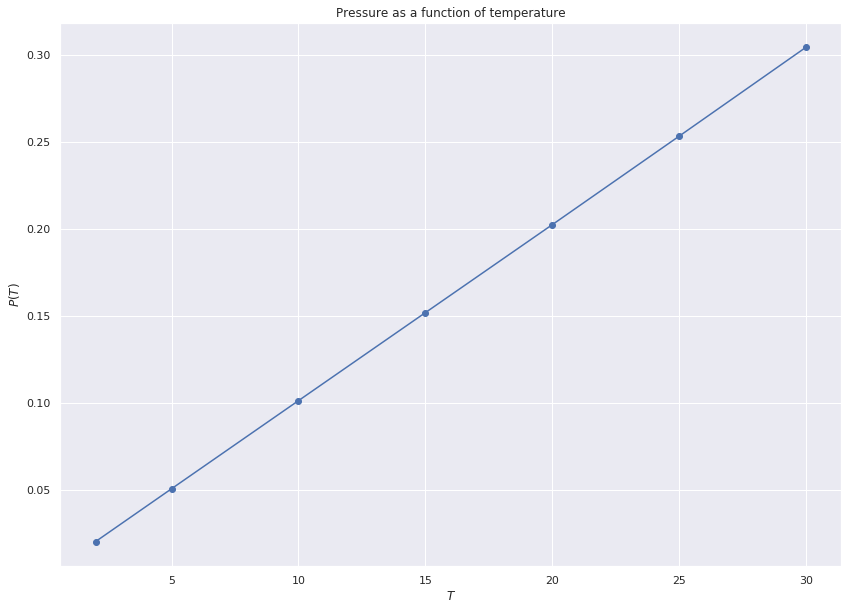

In [279]:
fig = plt.figure(figsize=(14, 10))

plt.plot(temperature_list, pressure_list, "-o")
plt.xlabel(r"$T$")
plt.ylabel(r"$P(T)$")
plt.title(r"Pressure as a function of temperature")
plt.show()

In this figure we can see the linear relationship between the temperature $T$ and the pressure $P(T)$ as expected.

In [99]:
length = 15
volume = length ** 3
filename = os.path.join(f"temperature_size_{length}.log")

with open(filename, "r") as f:
    file_split = f.read().split("\n")
    num_atoms = int(file_split[16 + 5000 // 10 + 1].split()[-2])

print(f"Number of atoms: {num_atoms}")

particle_density = num_atoms / volume

print(f"Particle density: {particle_density}")

Number of atoms: 13500
Particle density: 4.0


In [100]:
log_df = pd.read_csv(filename, sep="\s+", skiprows=15, skipfooter=27, engine="python")

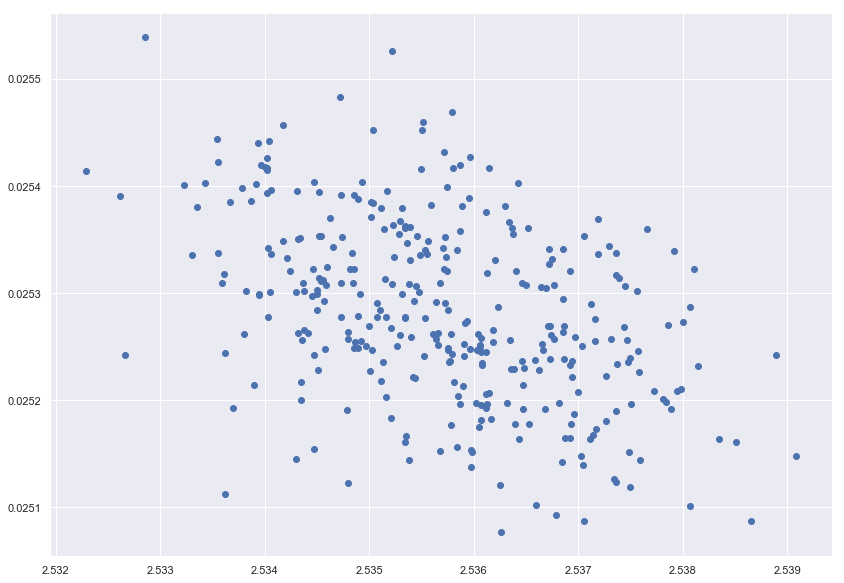

In [105]:
fig = plt.figure(figsize=(14, 10))

plt.plot(log_df["Temp"].iloc[time > 8], log_df["Press"].iloc[time > 8], "o")
plt.show()